In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import torch
import torchvision
import tarfile
import torch.nn as nn
import numpy as np
import torch.nn.functional as F
from torchvision.datasets.utils import download_url
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.transforms as tt
from torch.utils.data import random_split
from torchvision.utils import make_grid
from torchvision import datasets, transforms, models
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline
matplotlib.rcParams['figure.facecolor'] = '#ffffff'

In [ ]:
data_dir = '/content/drive/MyDrive/data'
print("Classes: ", os.listdir(data_dir))

Classes:  ['green_area', 'water', 'desert', 'cloudy']


This code calculates the number of images present in four different directories corresponding to different classes ('cloudy', 'desert', 'green_area', 'water') within a specified data directory. It then plots a bar chart where each bar represents the number of images for each class, providing a visual representation of the distribution of images across the four classes.

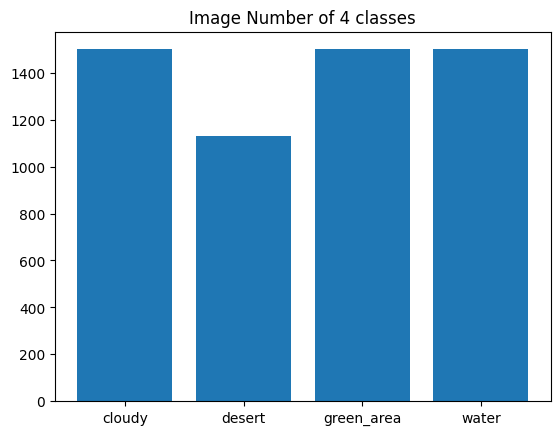

In [ ]:
# visulize the number of each class
cloudy_dir = data_dir + '/cloudy'
desert_dir = data_dir + '/desert'
green_area_dir = data_dir + '/green_area'
water_dir = data_dir + '/water'

cloudy = len(os.listdir(cloudy_dir))
desert = len(os.listdir(desert_dir))
green_area = len(os.listdir(green_area_dir))
water = len(os.listdir(water_dir))

cc = ['cloudy', 'desert', 'green_area', 'water']
img_num = [cloudy,desert,green_area,water ]
plt.title('Image Number of 4 classes')
plt.bar(cc, img_num)
plt.show()

In [ ]:
# Define the transform
transform = transforms.Compose([transforms.RandomCrop(64, padding=4, padding_mode='reflect'),
                                transforms.Resize(64),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

# Import the dataset
dataset = datasets.ImageFolder(data_dir, transform=transform)

# Seperate the data set into train_set, validation_set and test_set

print("Total number of images: ", len(dataset))
train_data, val_data,test_data = torch.utils.data.random_split(dataset, [3379, 1126, 1126])

print("Number of train data:", len(train_data))
print("Number of validation data:", len(val_data))
print("Number of test data:", len(test_data))

Total number of images:  5631
Number of train data: 3379
Number of validation data: 1126
Number of test data: 1126


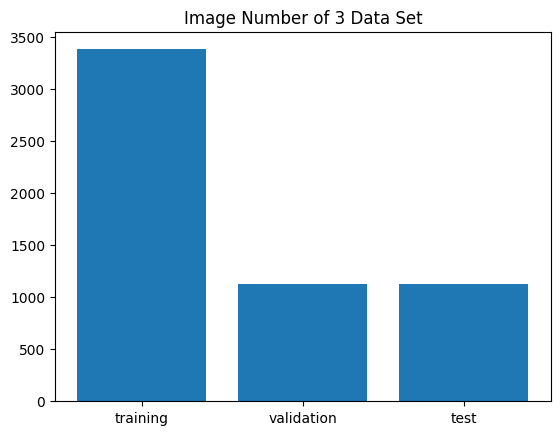

In [ ]:
# visulize the number of 3 data set
cc = ['training', 'validation', 'test']
set_num = [len(train_data),len(val_data),len(test_data)]
plt.title('Image Number of 3 Data Set')
plt.bar(cc, set_num)
plt.show()

In [ ]:
# define the batch size
batch_size = 16

In [ ]:
# Loading the data into data loaders
train_dl = DataLoader(train_data, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dl = DataLoader(val_data, batch_size, num_workers=2, pin_memory=True)
test_dl = DataLoader(test_data, batch_size, num_workers=2, pin_memory=True)

In [ ]:
# Denormalize function
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
def denormalize(images, means, stds):
    means = torch.tensor(means).reshape(1, 3, 1, 1)
    stds = torch.tensor(stds).reshape(1, 3, 1, 1)
    return images * stds + means

def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(12, 12))
        ax.set_xticks([]); ax.set_yticks([])
        denorm_images = denormalize(images, *stats)
        ax.imshow(make_grid(denorm_images[:64], nrow=8).permute(1, 2, 0).clamp(0,1))
        break

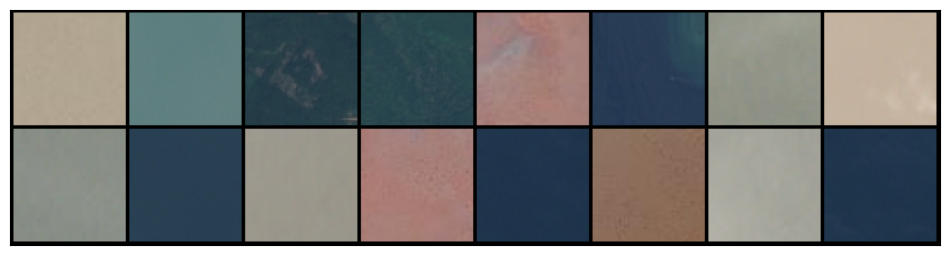

In [ ]:
# show one batch
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)
valid_dl = DeviceDataLoader(valid_dl, device)
test_dl = DeviceDataLoader(test_dl, device)

In [ ]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

class ImageClassificationBase(nn.Module):
    # training
    def training_step(self, batch):
        images, labels = batch
        out = self(images)
        loss = F.cross_entropy(out, labels)
        return loss

    #validation
    def validation_step(self, batch):
        images, labels = batch
        out = self(images)
        loss = F.cross_entropy(out, labels)
        acc = accuracy(out, labels)
        return {'val_loss': loss.detach(), 'val_acc': acc} # output the loss

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        # output data for eacj epoch
        print("Epoch {}, last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch + 1, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_acc']))

In [ ]:
def conv_block(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
              nn.BatchNorm2d(out_channels),
              nn.ReLU(inplace=True)]
    if pool: layers.append(nn.AdaptiveAvgPool2d(2))
    return nn.Sequential(*layers)

class custom_cnn(ImageClassificationBase):
    def __init__(self, in_channels, num_classes):
        super().__init__()

        self.conv1 = conv_block(in_channels, 16)
        self.conv2 = conv_block(16, 32, pool=True)
        self.res1 = nn.Sequential(conv_block(32, 32), conv_block(32, 32))

        self.conv3 = conv_block(32, 64)
        self.conv4 = conv_block(64, 128, pool=True)
        self.res2 = nn.Sequential(conv_block(128, 128), conv_block(128, 128))

        self.conv5 = conv_block(128, 256, pool=True)
        self.conv6 = conv_block(256, 512, pool=True)
        self.res3 = nn.Sequential(conv_block(512, 512), conv_block(512, 512))

        self.conv7 = conv_block(512, 1024, pool=True)
        self.conv8 = conv_block(1024, 2048, pool=True)
        self.res4 = nn.Sequential(conv_block(1024, 1024), conv_block(1024, 1024))



        self.classifier = nn.Sequential(nn.AdaptiveMaxPool2d(1),
                                        nn.Flatten(),
                                        nn.Dropout(0.2),
                                        nn.Linear(512, num_classes))

    def forward(self, xb):
        out = self.conv1(xb)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.res2(out) + out
        out = self.conv5(out)
        out = self.conv6(out)
        out = self.res3(out) + out
        out = self.classifier(out)
        return out

In [ ]:
model = to_device(custom_cnn(3, 4), device)
model

custom_cnn(
  (conv1): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): AdaptiveAvgPool2d(output_size=2)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
  )
  (conv3): Sequential(
    (0): C

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def fit_one_cycle(epochs, max_lr, model, train_loader, val_loader,
                  weight_decay=0, grad_clip=None, opt_func=torch.optim.Adam):
    torch.cuda.empty_cache()
    history = []

    # Set up cutom optimizer with weight decay
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # Set up one-cycle learning rate scheduler
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs,
                                                steps_per_epoch=len(train_loader))

    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # Gradient clipping
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()

            # Record & update learning rate
            lrs.append(get_lr(optimizer))
            sched.step()

        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
    return history

In [ ]:
history = [evaluate(model, valid_dl)]

In [ ]:
epochs = 50 # number of epochs
max_lr = 0.01
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam # Optimizer

In [ ]:
%%time
history = fit_one_cycle(epochs, max_lr, model, train_dl, valid_dl,
                             grad_clip=grad_clip,
                             weight_decay=weight_decay,
                             opt_func=opt_func)

Epoch 1, last_lr: 0.00050, train_loss: 0.6314, val_loss: 0.2688, val_acc: 0.8947
Epoch 2, last_lr: 0.00081, train_loss: 0.5073, val_loss: 0.5501, val_acc: 0.7890
Epoch 3, last_lr: 0.00131, train_loss: 0.5020, val_loss: 1.1664, val_acc: 0.8436
Epoch 4, last_lr: 0.00199, train_loss: 0.7052, val_loss: 0.6525, val_acc: 0.7538
Epoch 5, last_lr: 0.00280, train_loss: 0.5658, val_loss: 1.1872, val_acc: 0.7160
Epoch 6, last_lr: 0.00371, train_loss: 0.6067, val_loss: 0.5790, val_acc: 0.7585
Epoch 7, last_lr: 0.00470, train_loss: 0.6600, val_loss: 1.5852, val_acc: 0.7435
Epoch 8, last_lr: 0.00570, train_loss: 0.6714, val_loss: 1.0423, val_acc: 0.7116
Epoch 9, last_lr: 0.00668, train_loss: 0.6466, val_loss: 0.4414, val_acc: 0.8087
Epoch 10, last_lr: 0.00760, train_loss: 0.5449, val_loss: 2.0675, val_acc: 0.6975
Epoch 11, last_lr: 0.00841, train_loss: 0.6602, val_loss: 0.6439, val_acc: 0.7171
Epoch 12, last_lr: 0.00908, train_loss: 0.5426, val_loss: 0.5783, val_acc: 0.7920
Epoch 13, last_lr: 0.0095

In [ ]:
def plot_accuracies(history):
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');

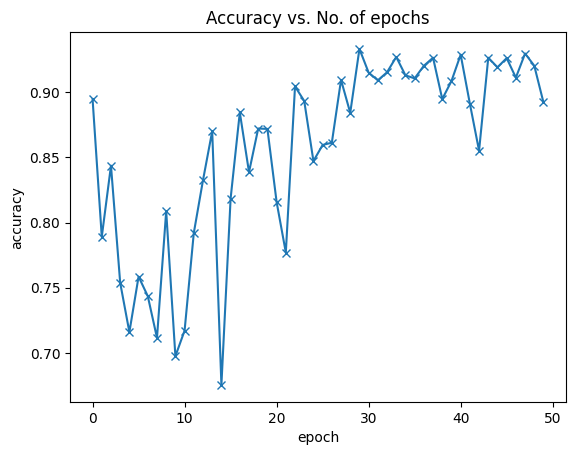

In [ ]:
plot_accuracies(history)

In [ ]:
def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

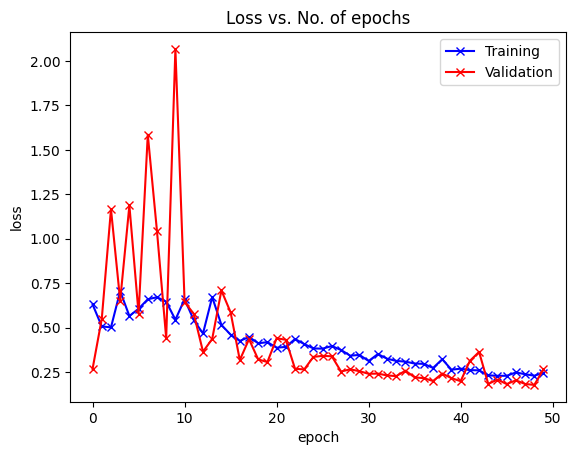

In [ ]:
plot_losses(history)

In [ ]:
def plot_lrs(history):
    lrs = np.concatenate([x.get('lrs', []) for x in history])
    plt.plot(lrs)
    plt.xlabel('Batch no.')
    plt.ylabel('Learning rate')
    plt.title('Learning Rate vs. Batch no.');

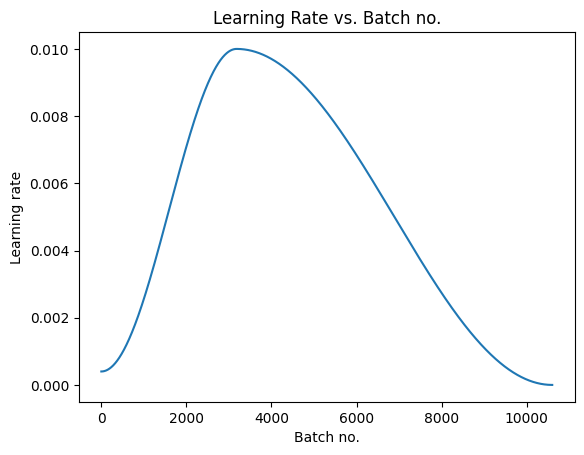

In [ ]:
plot_lrs(history)

In [ ]:
# predict the label with a label
def predict_image(img, model):
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label
    return dataset.classes[preds[0].item()]

Test image 1 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


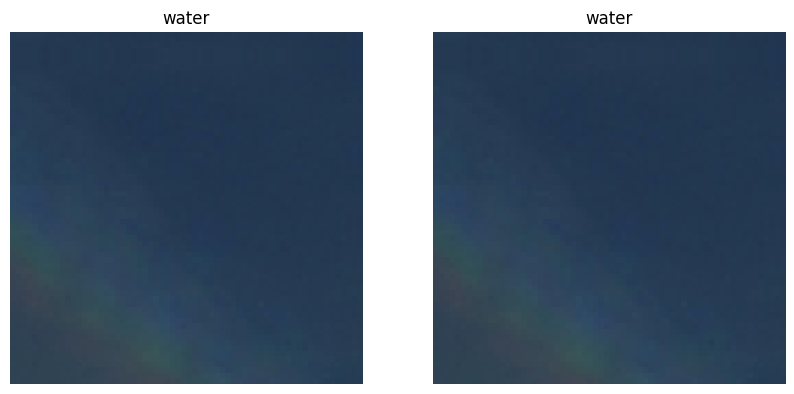

Test image 2 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


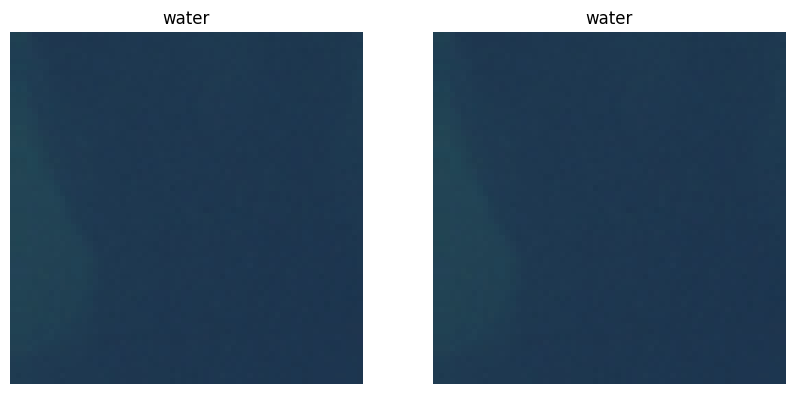

Test image 3 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


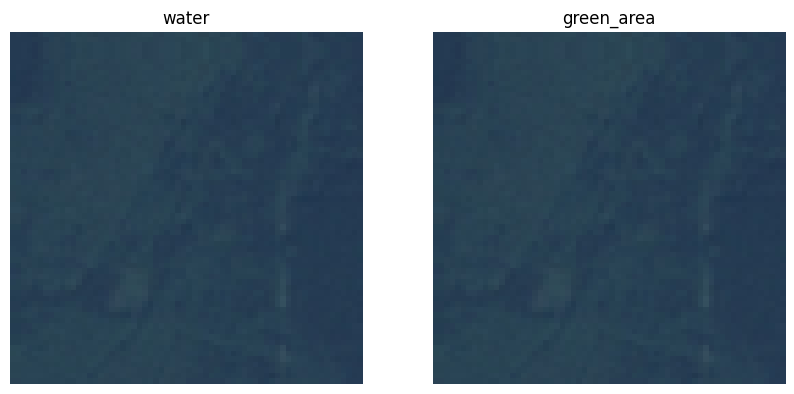

Test image 4 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


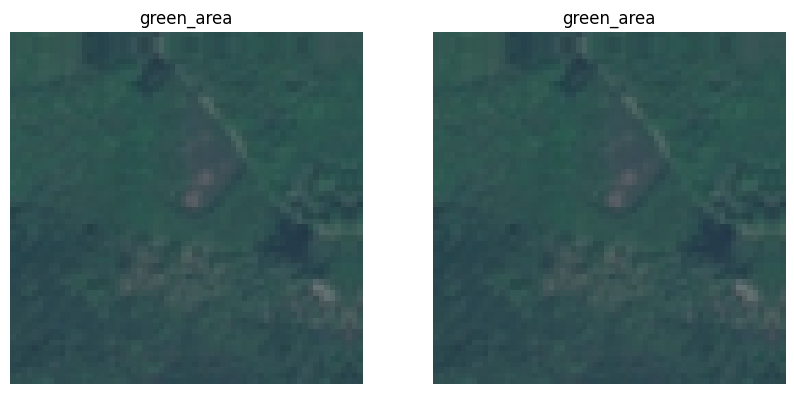

Test image 5 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


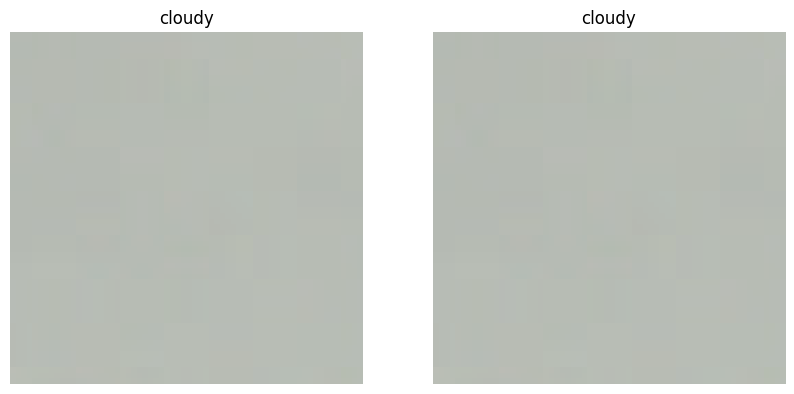

Test image 6 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


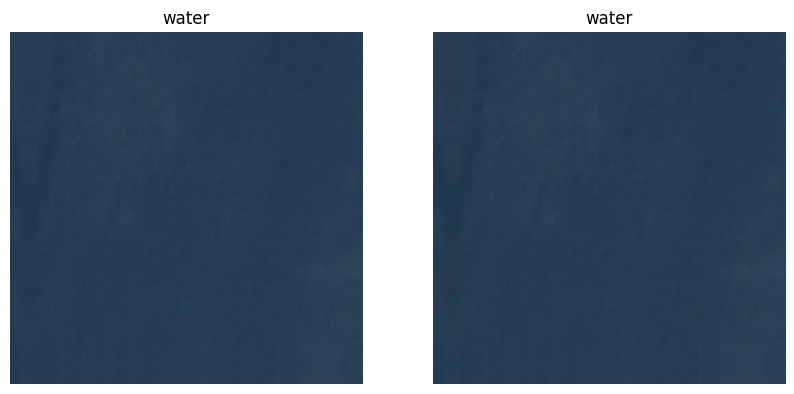

Test image 7 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


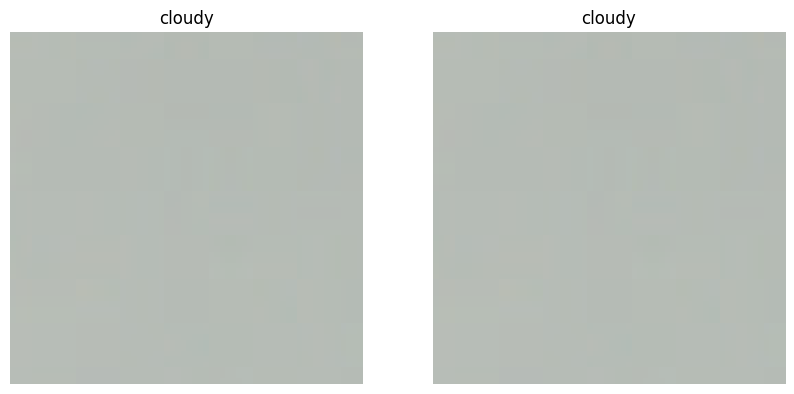

Test image 8 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


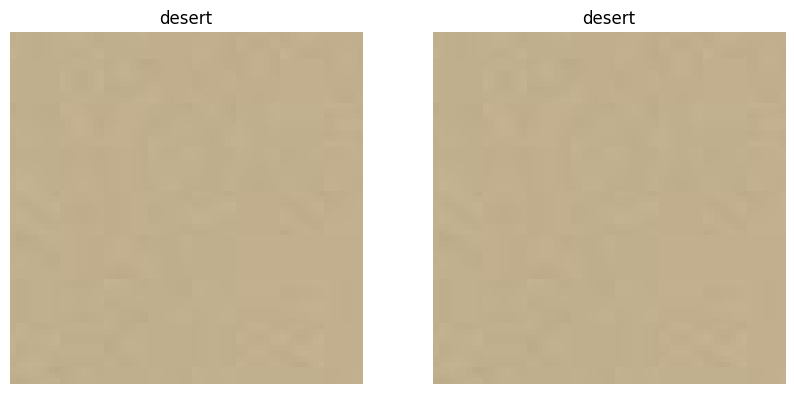

Test image 9 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


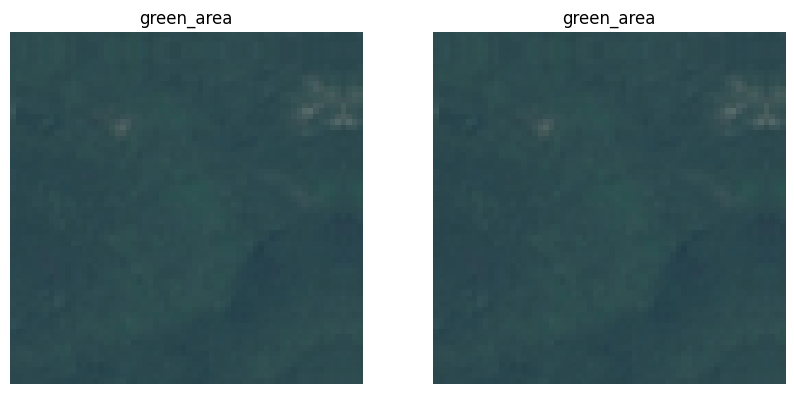

Test image 10 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


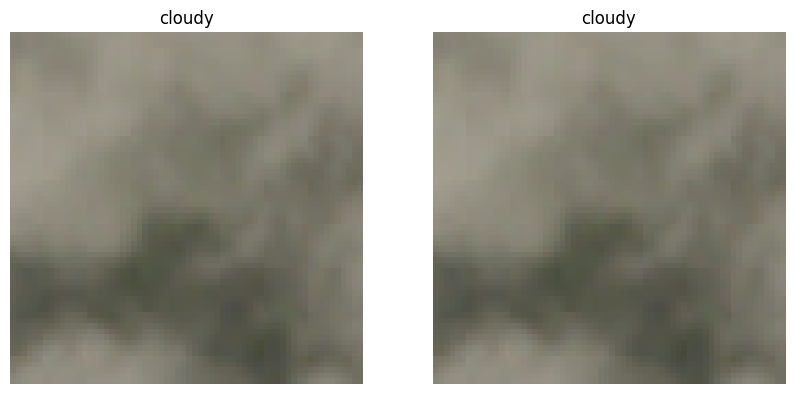

Test image 11 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


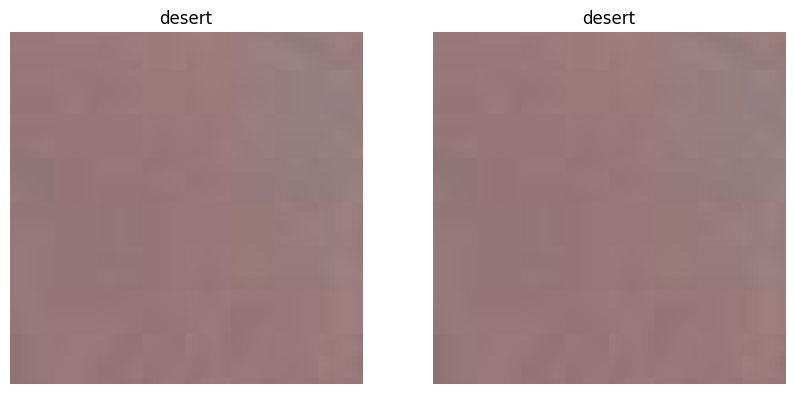

Test image 12 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


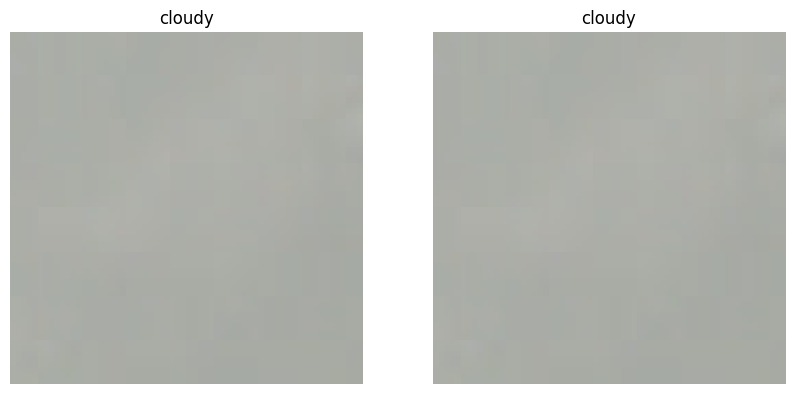

Test image 13 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


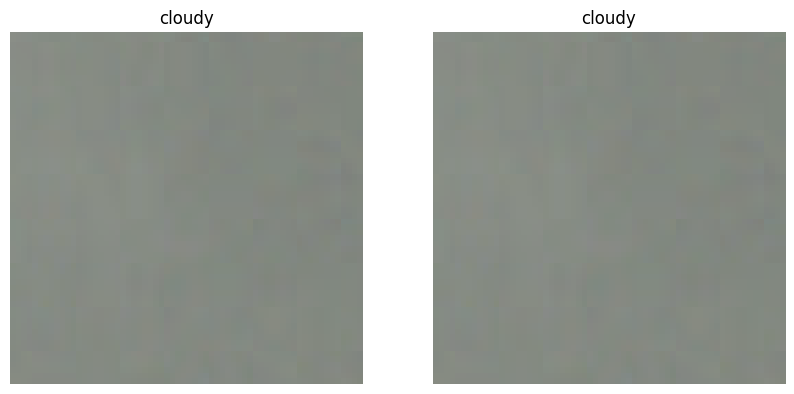

Test image 14 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


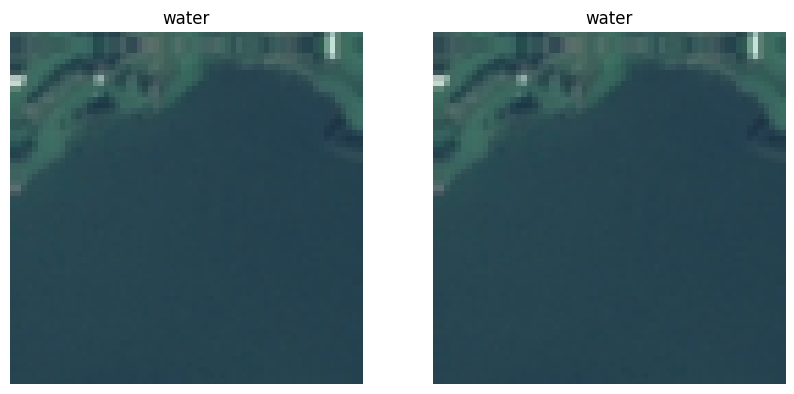

Test image 15 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


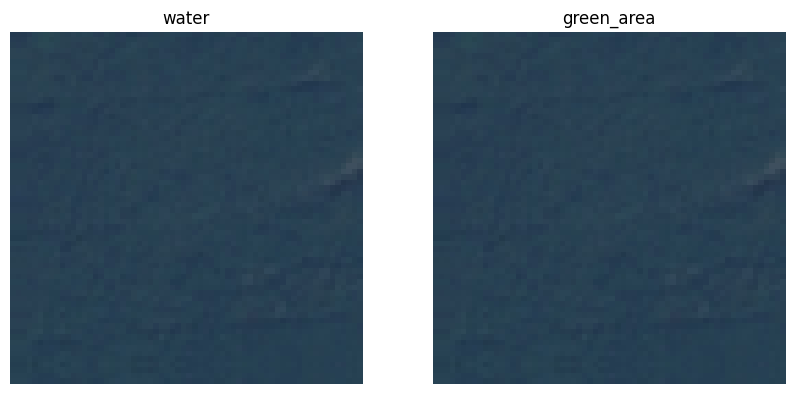

Test image 16 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


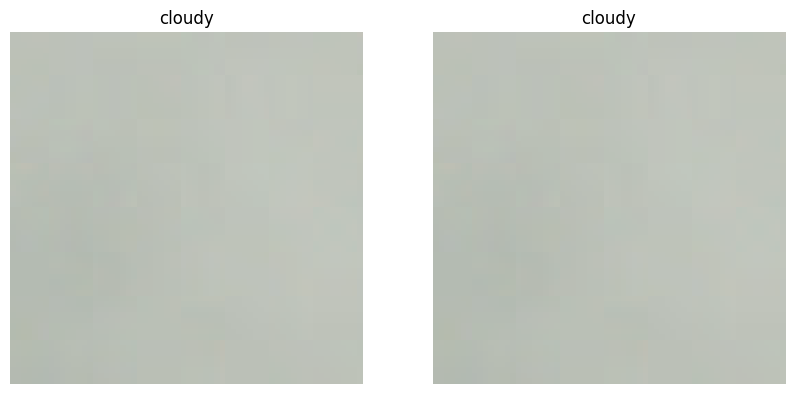

Test image 17 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


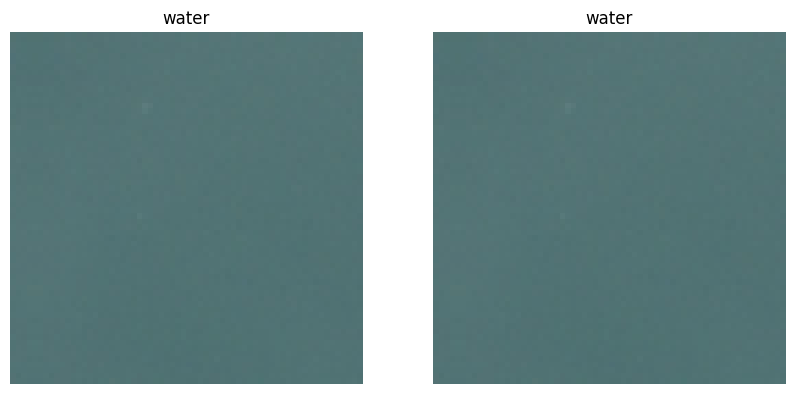

Test image 18 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


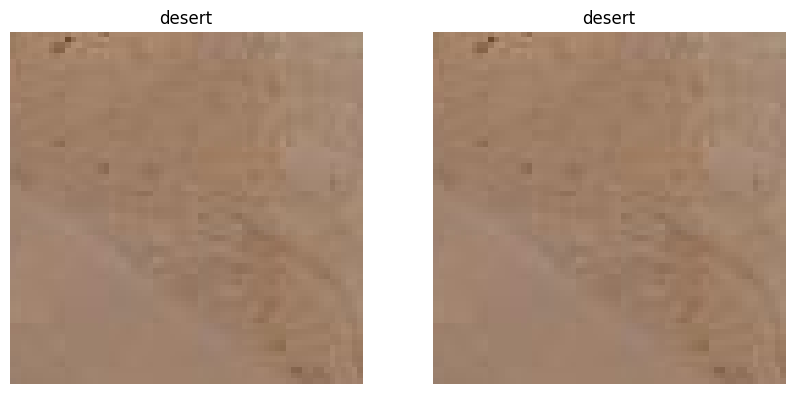

Test image 19 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


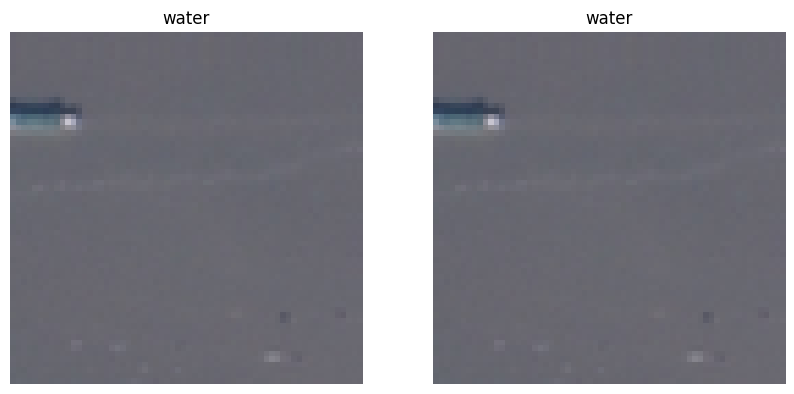

Test image 20 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


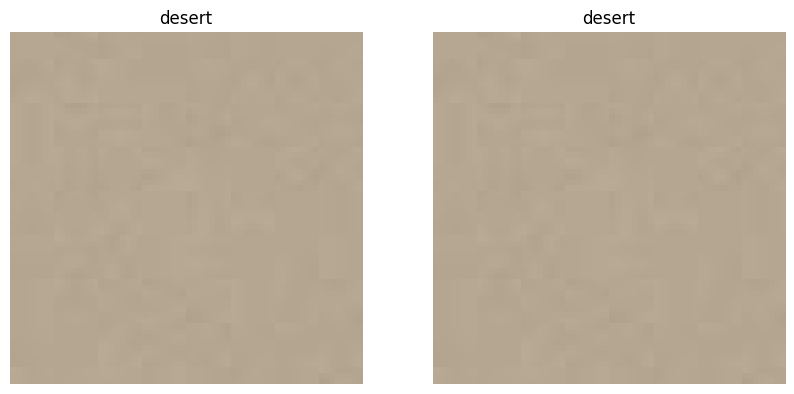

Test image 21 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


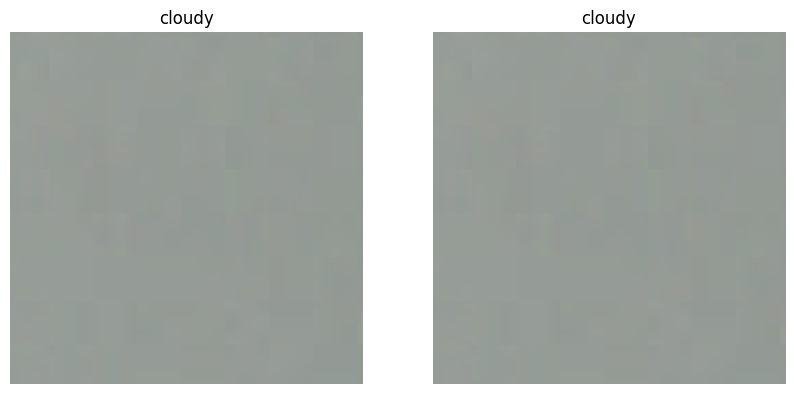

Test image 22 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


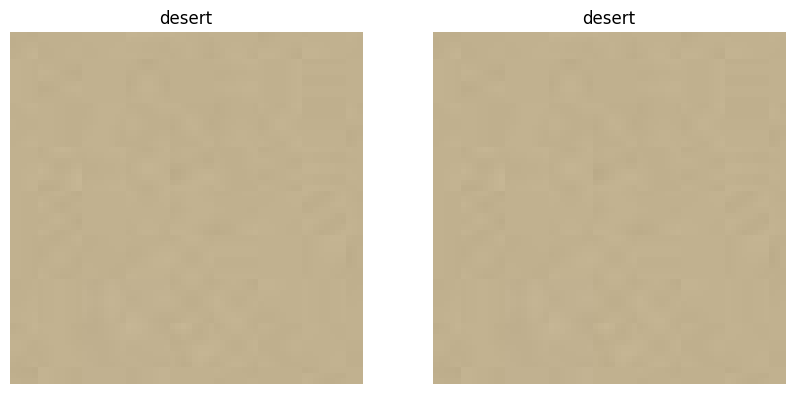

Test image 23 , Result: Wrong Predicted: cloudy , Real Class: desert
Predicted Class Image vs Real Class Image:


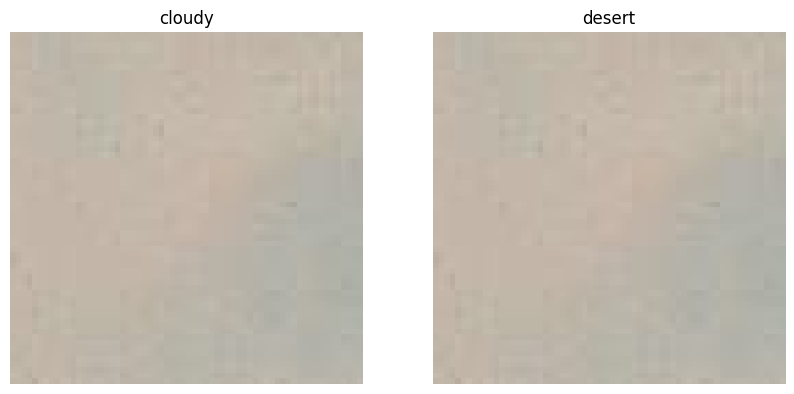

Test image 24 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


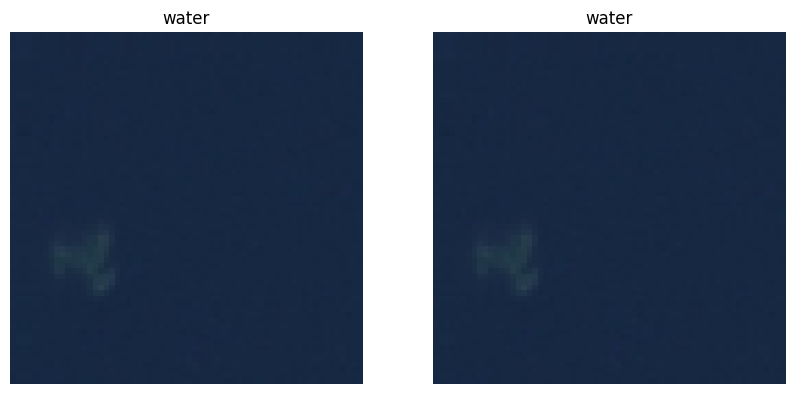

Test image 25 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


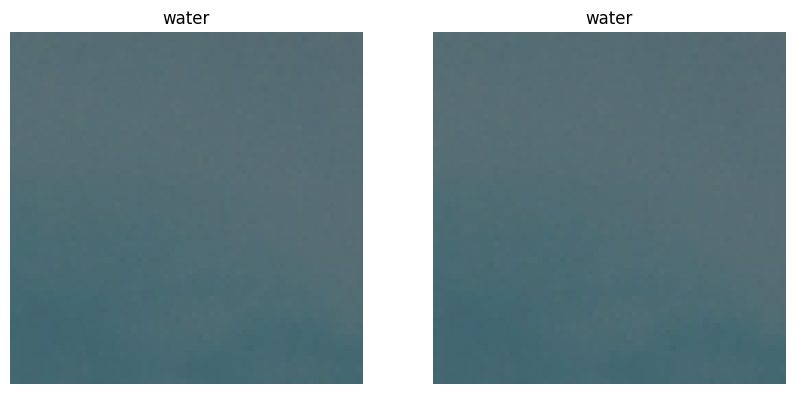

Test image 26 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


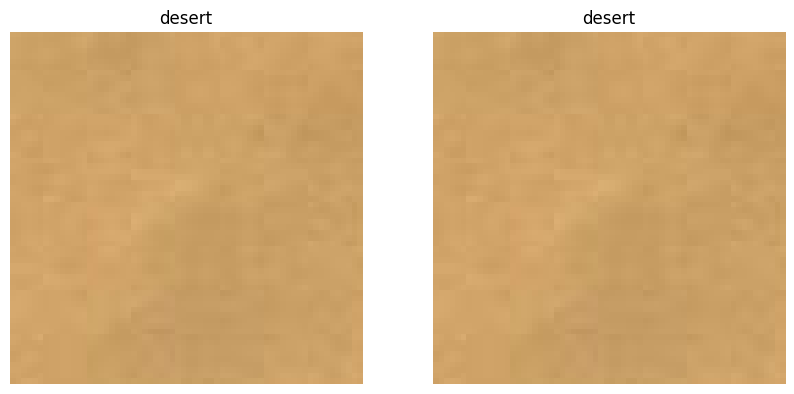

Test image 27 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


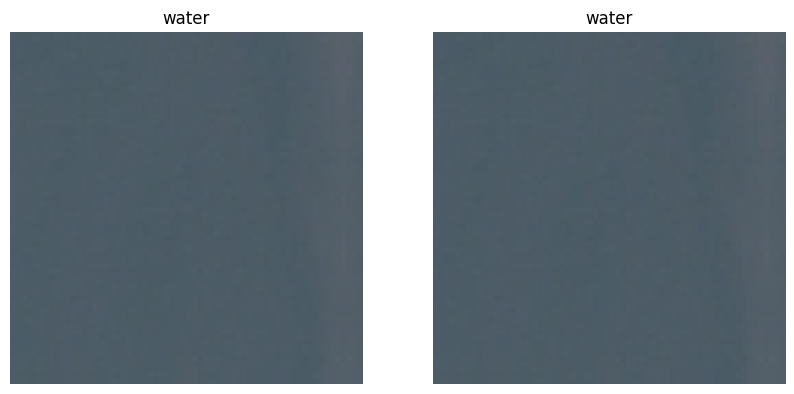

Test image 28 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


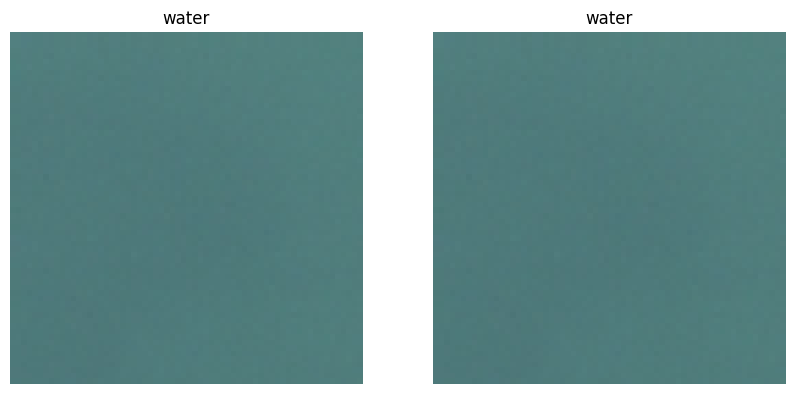

Test image 29 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


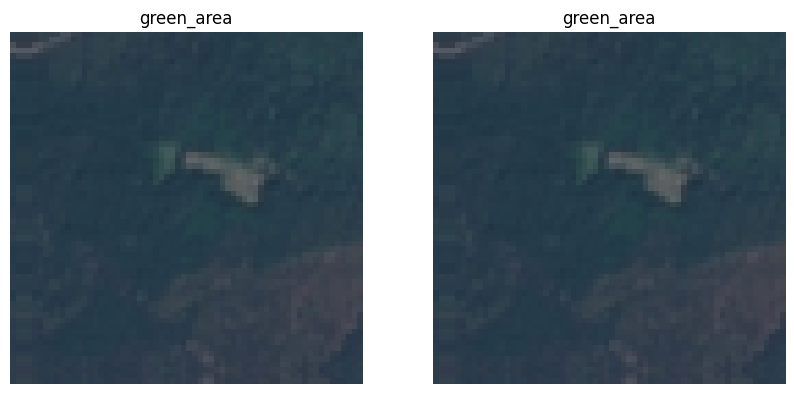

Test image 30 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


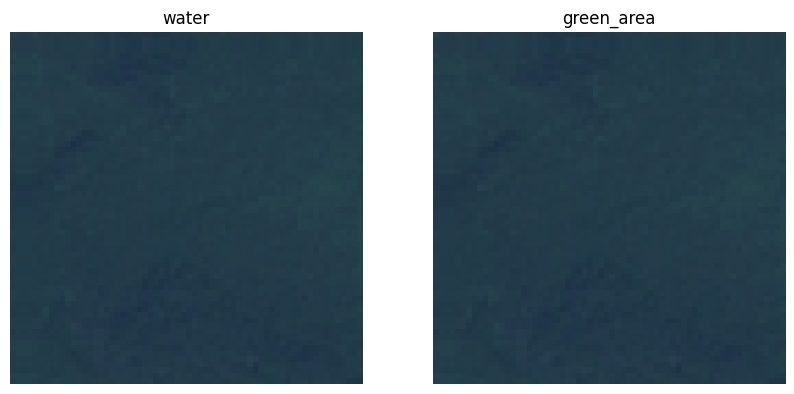

Test image 31 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


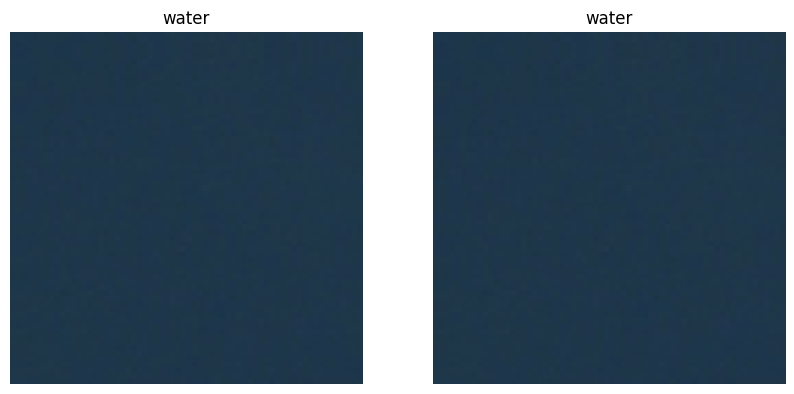

Test image 32 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


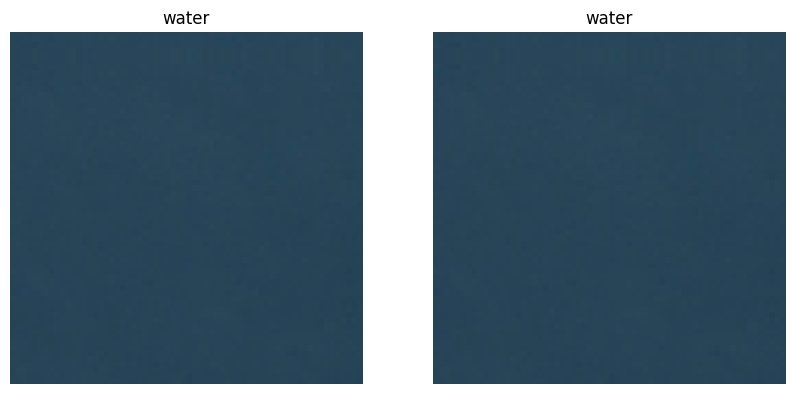

Test image 33 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


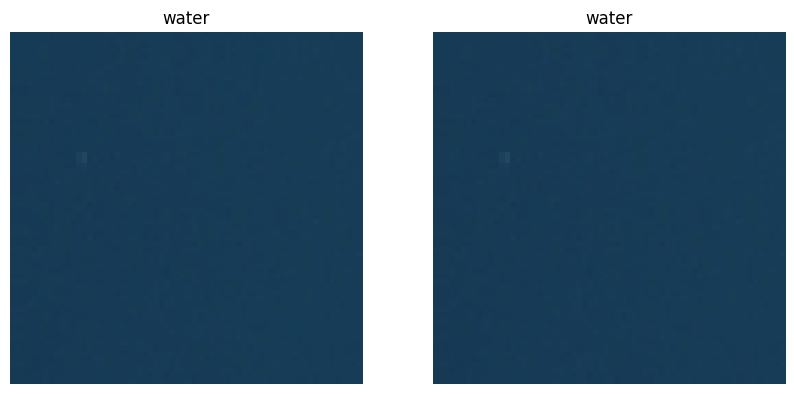

Test image 34 , Result: Wrong Predicted: green_area , Real Class: cloudy
Predicted Class Image vs Real Class Image:


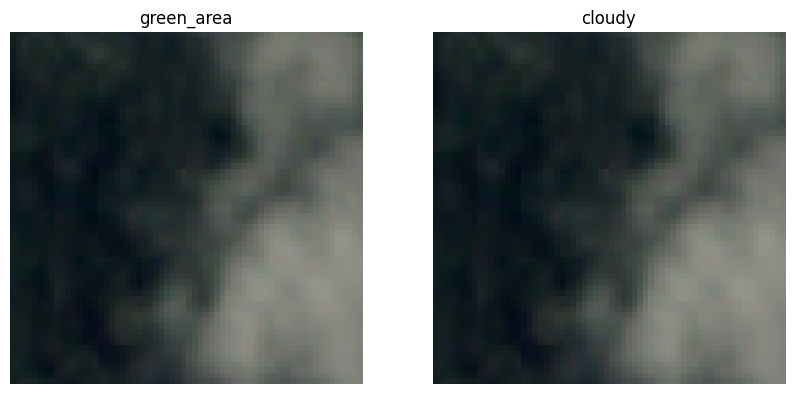

Test image 35 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


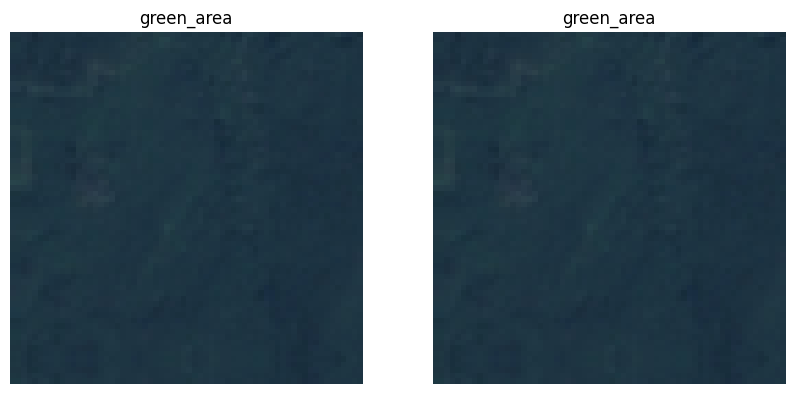

Test image 36 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


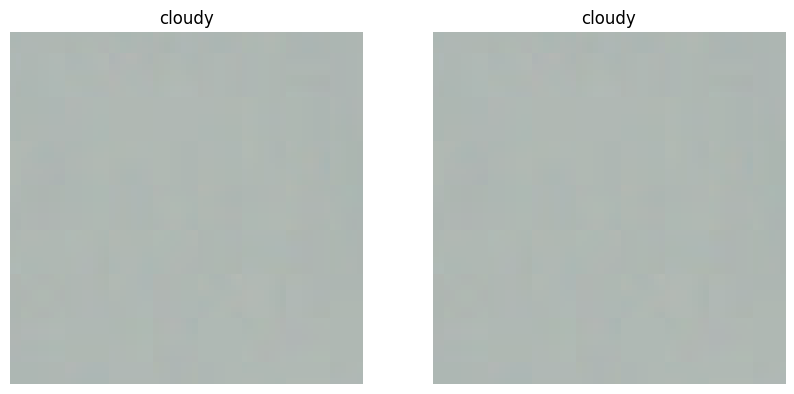

Test image 37 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


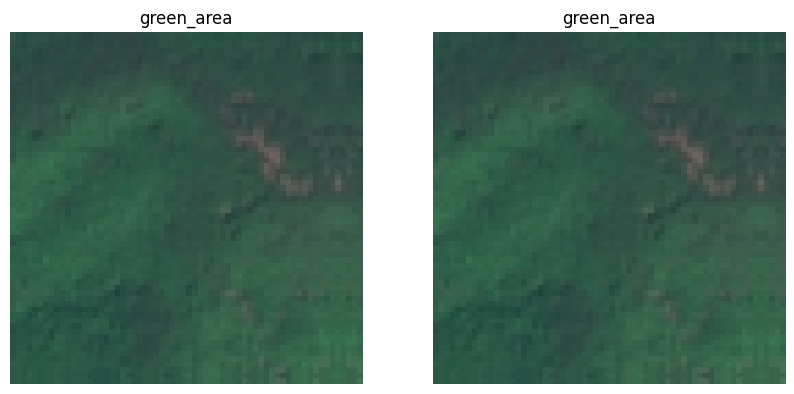

Test image 38 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


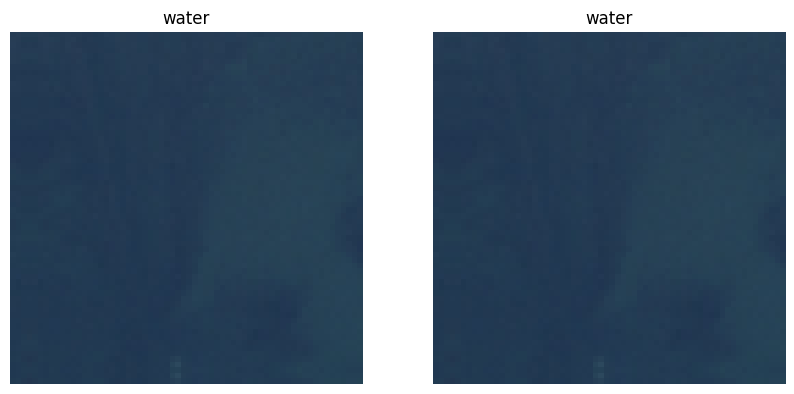

Test image 39 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


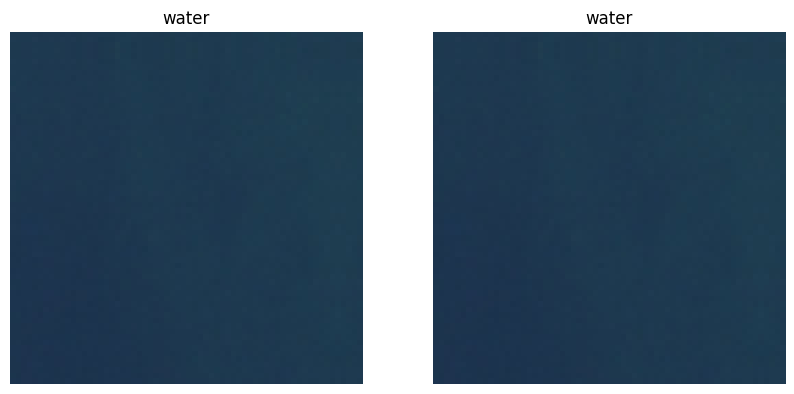

Test image 40 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


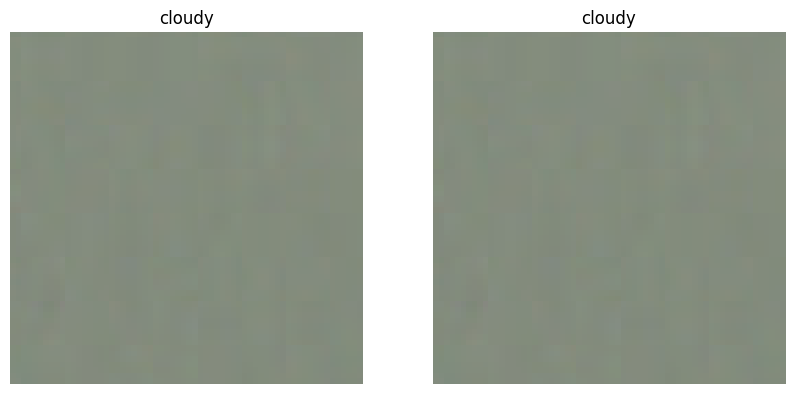

Test image 41 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


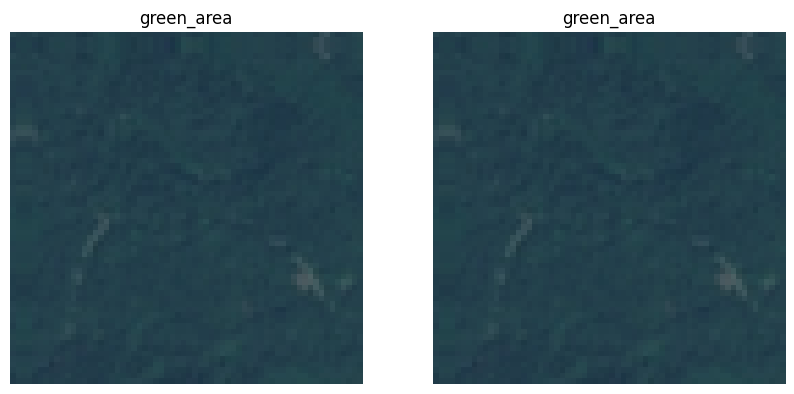

Test image 42 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


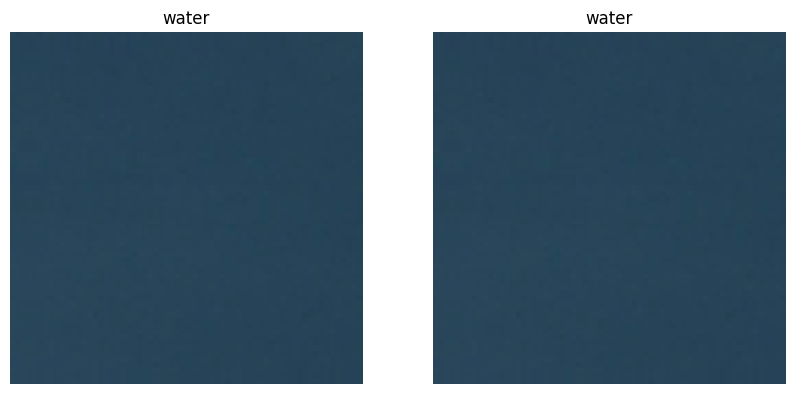

Test image 43 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


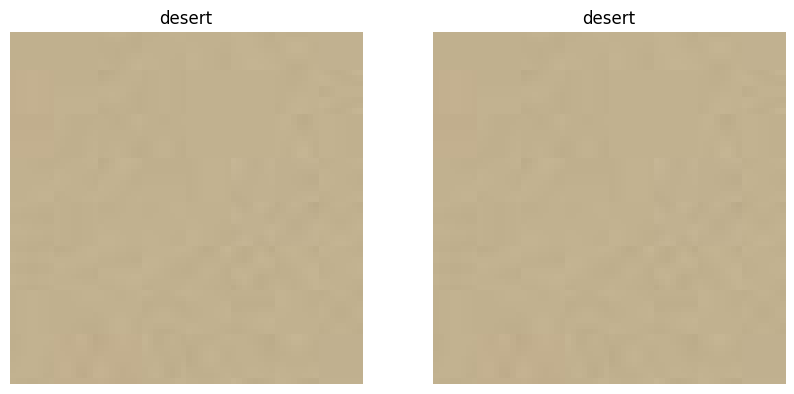

Test image 44 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


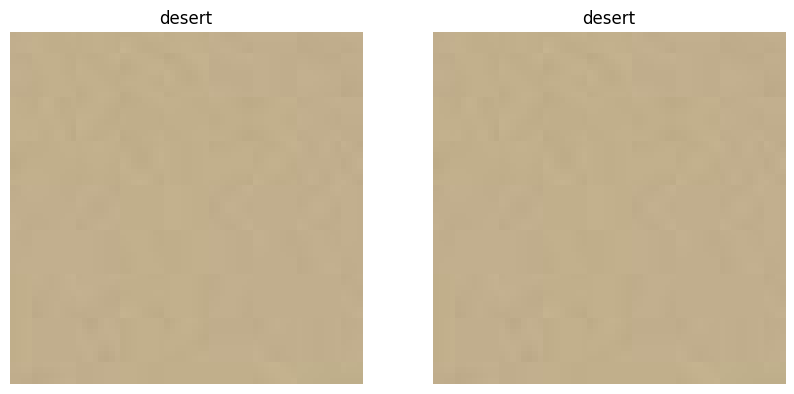

Test image 45 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


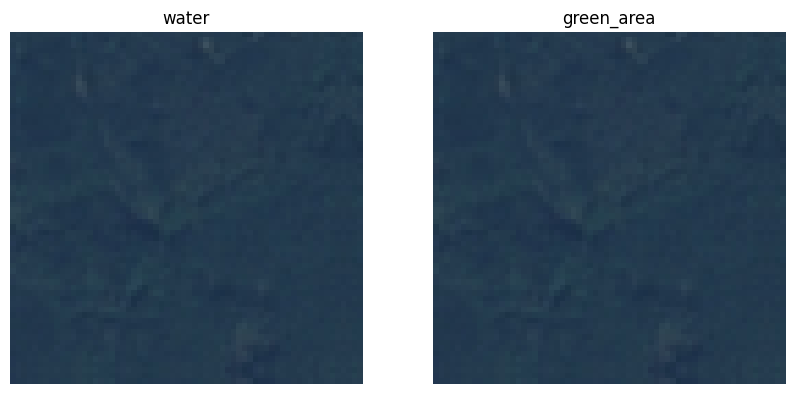

Test image 46 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


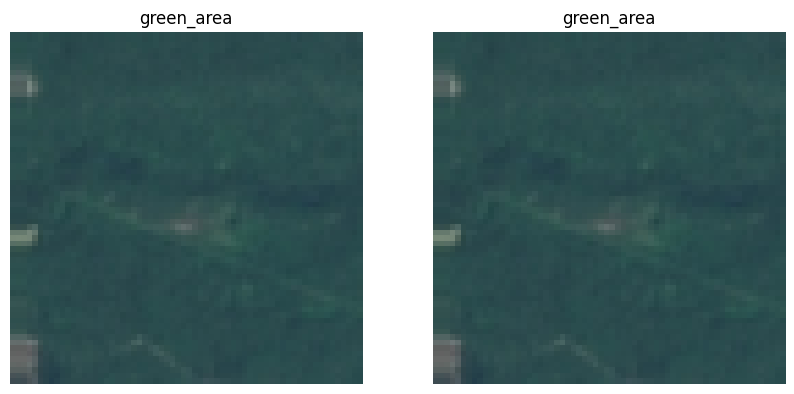

Test image 47 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


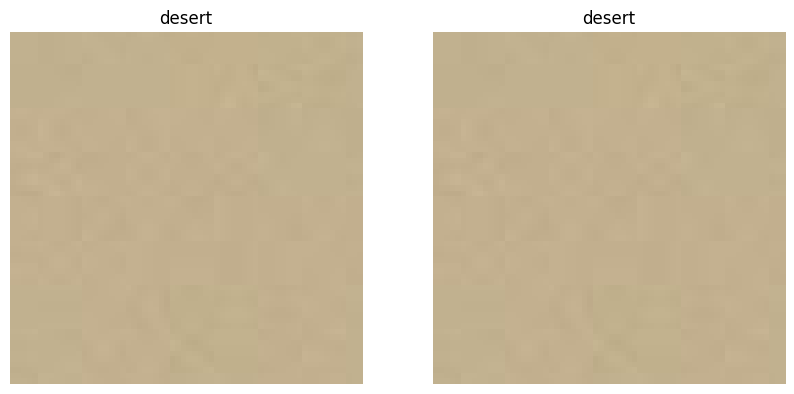

Test image 48 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


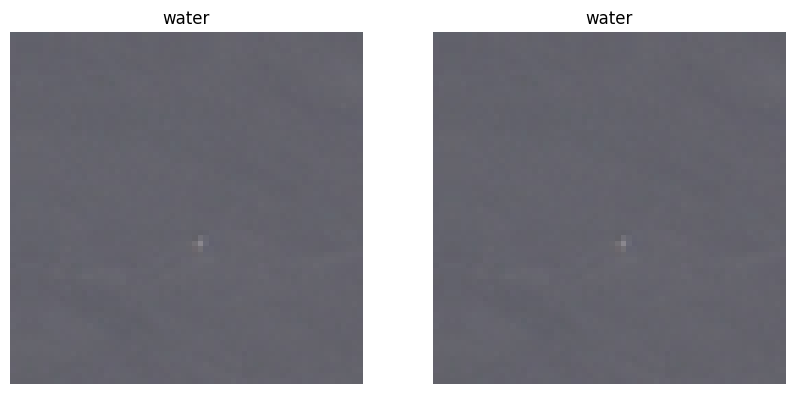

Test image 49 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


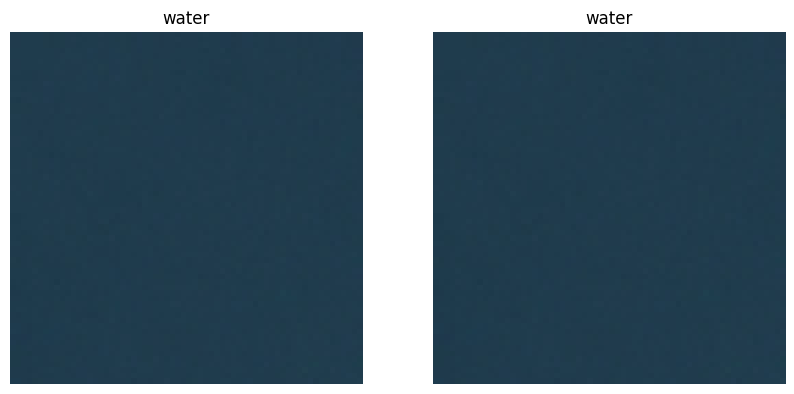

Test image 50 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


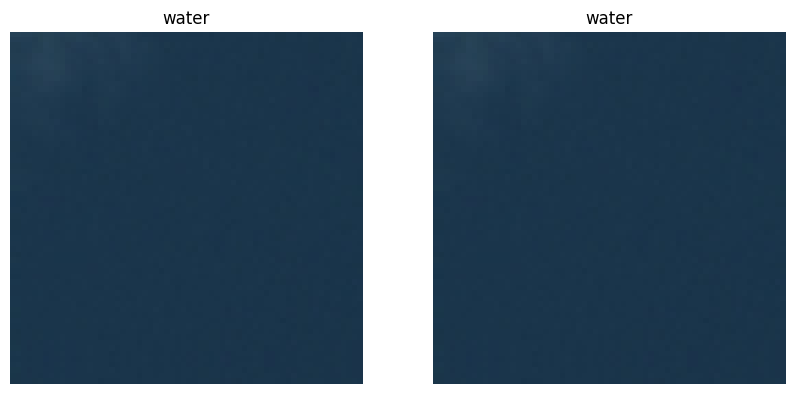

Test image 51 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


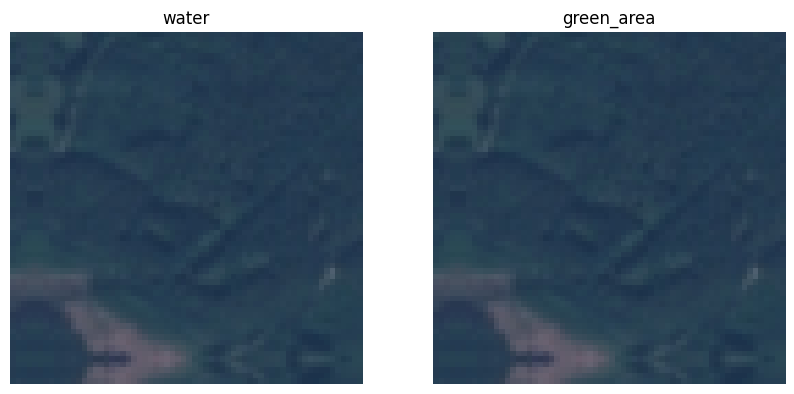

Test image 52 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


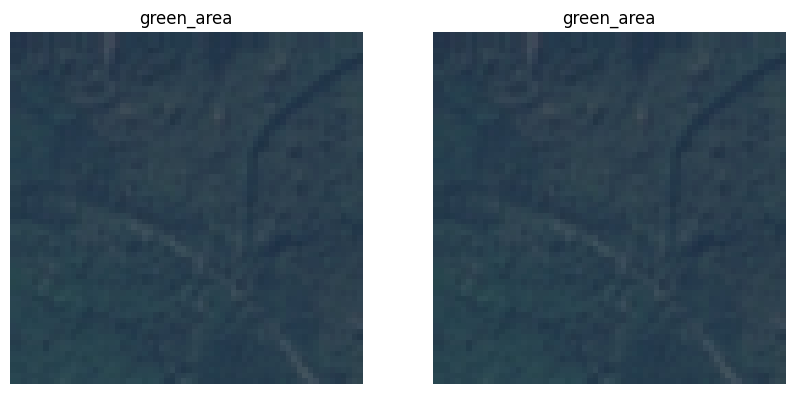

Test image 53 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


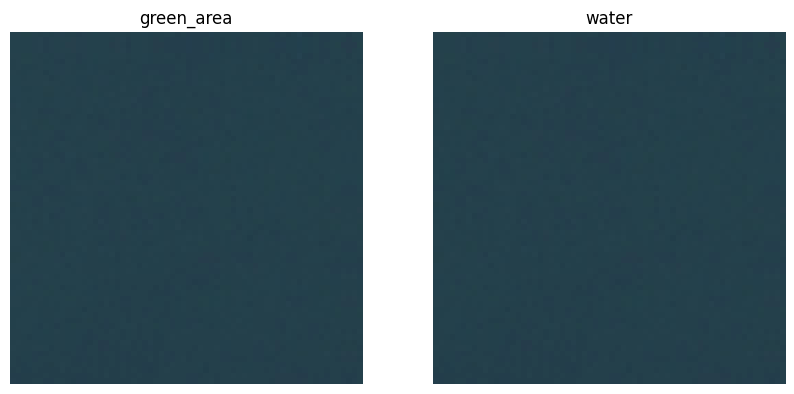

Test image 54 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


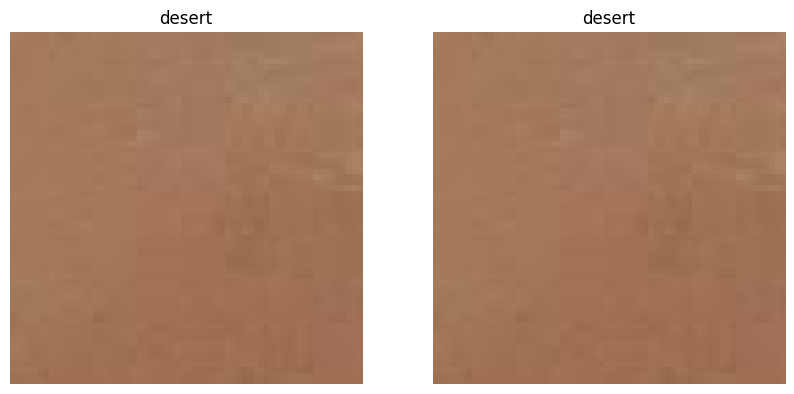

Test image 55 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


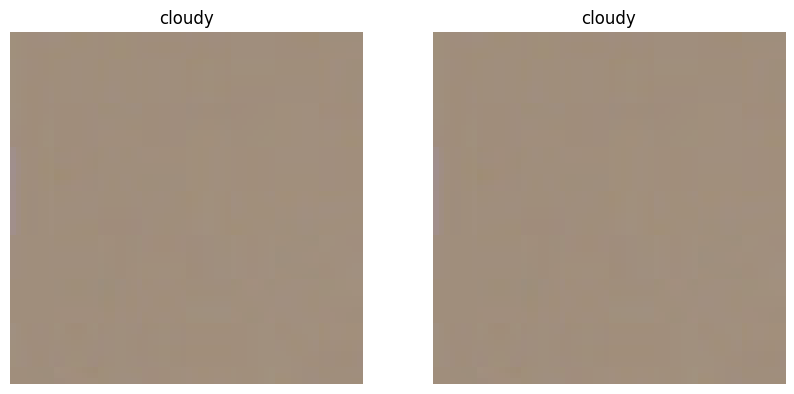

Test image 56 , Result: Wrong Predicted: water , Real Class: cloudy
Predicted Class Image vs Real Class Image:


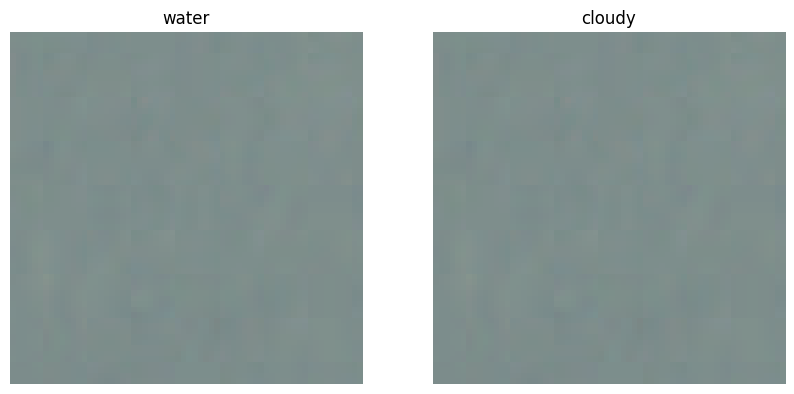

Test image 57 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


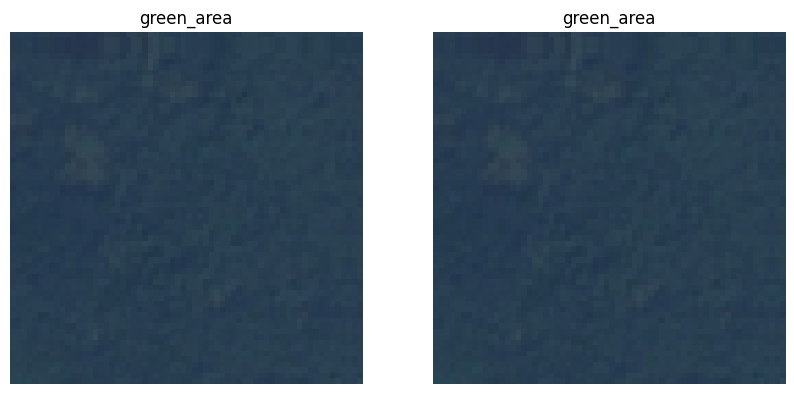

Test image 58 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


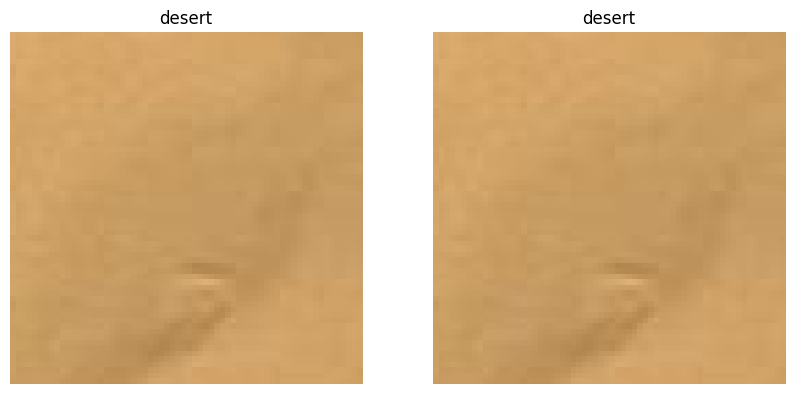

Test image 59 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


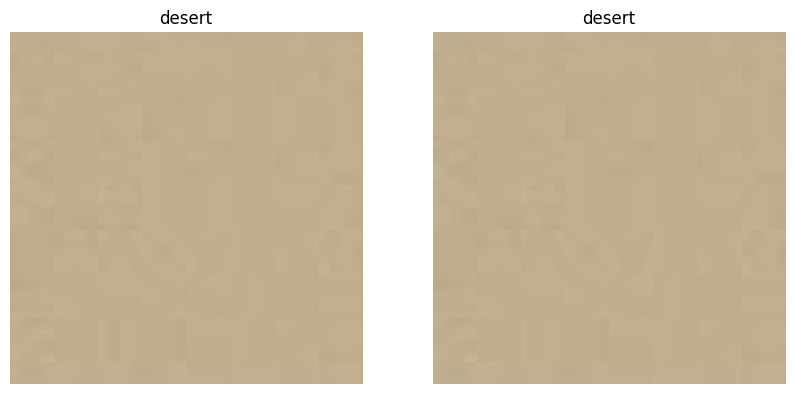

Test image 60 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


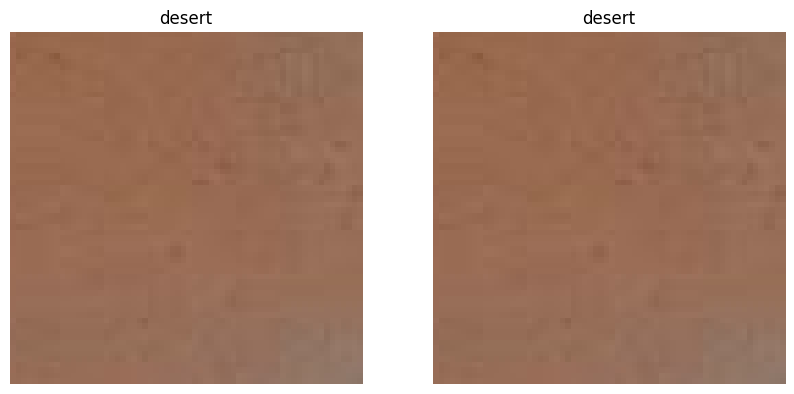

Test image 61 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


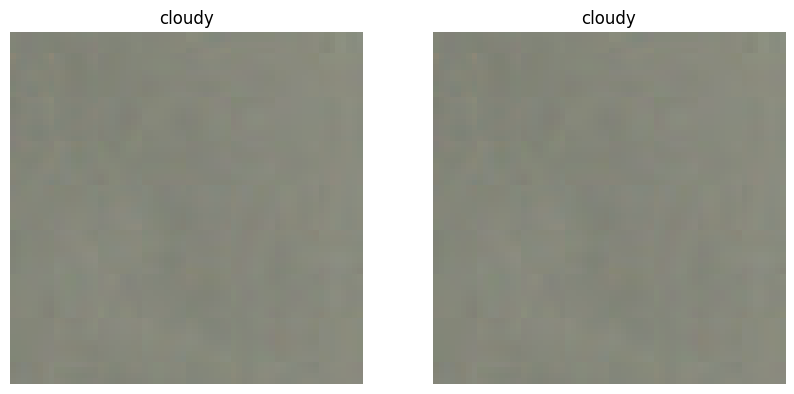

Test image 62 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


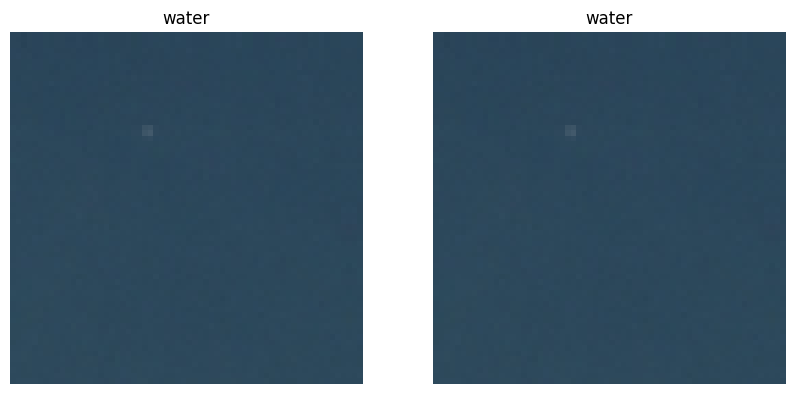

Test image 63 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


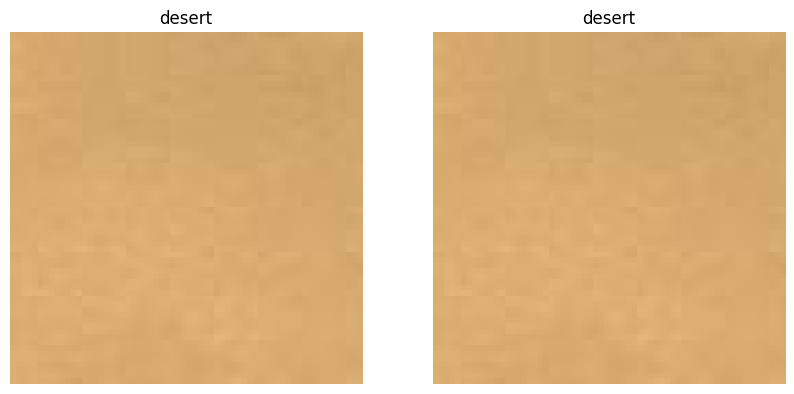

Test image 64 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


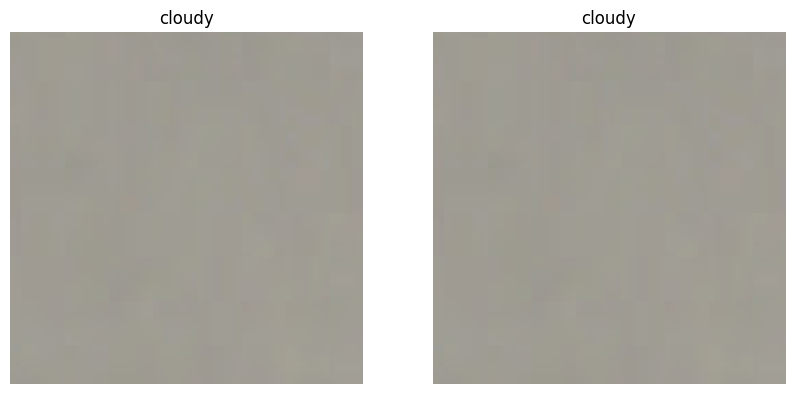

Test image 65 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


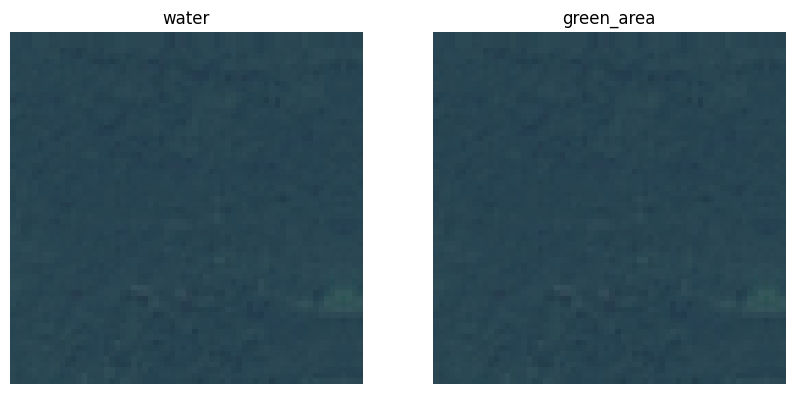

Test image 66 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


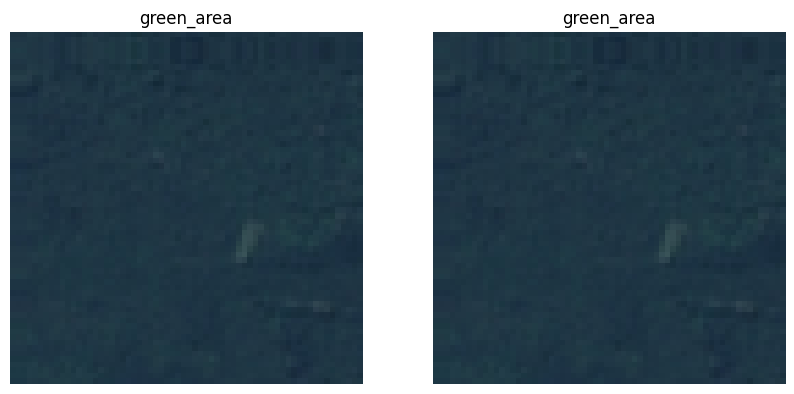

Test image 67 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


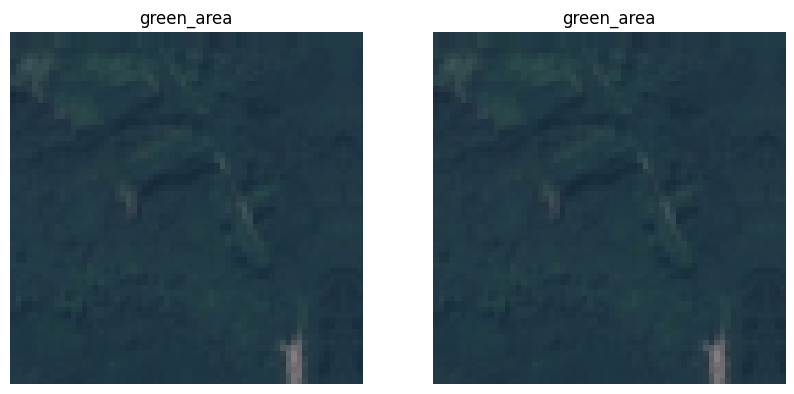

Test image 68 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


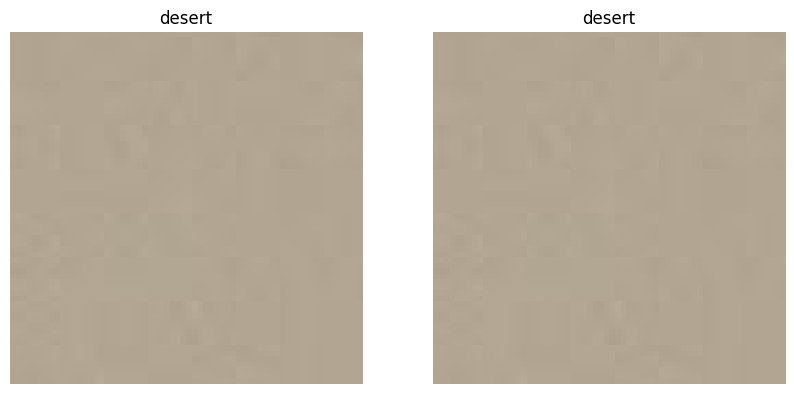

Test image 69 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


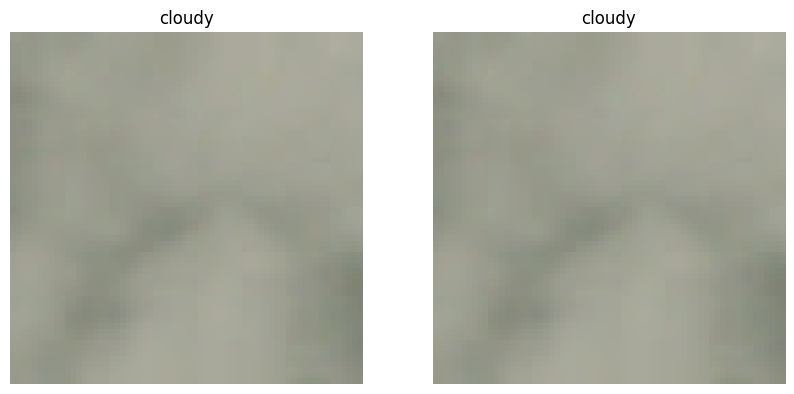

Test image 70 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


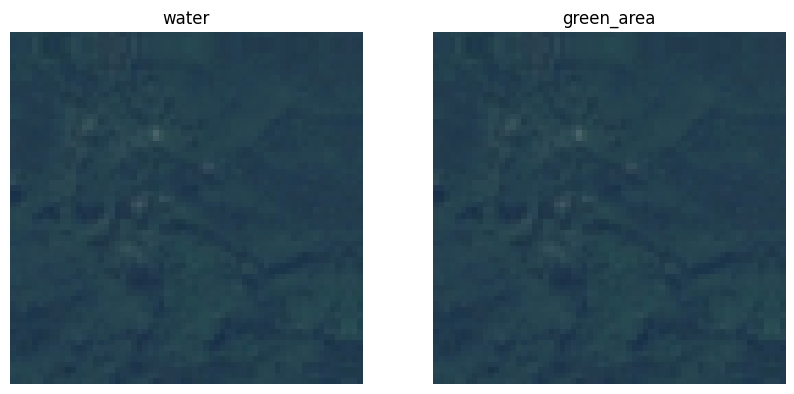

Test image 71 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


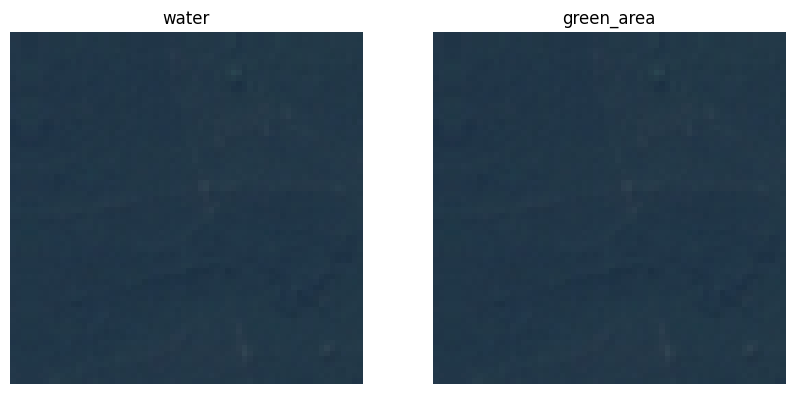

Test image 72 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


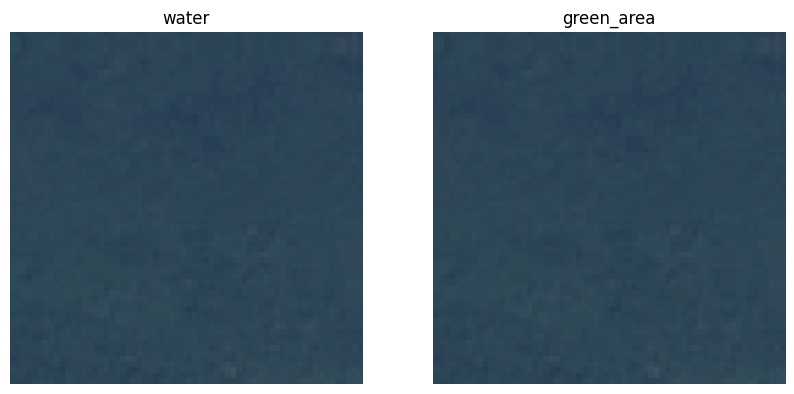

Test image 73 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


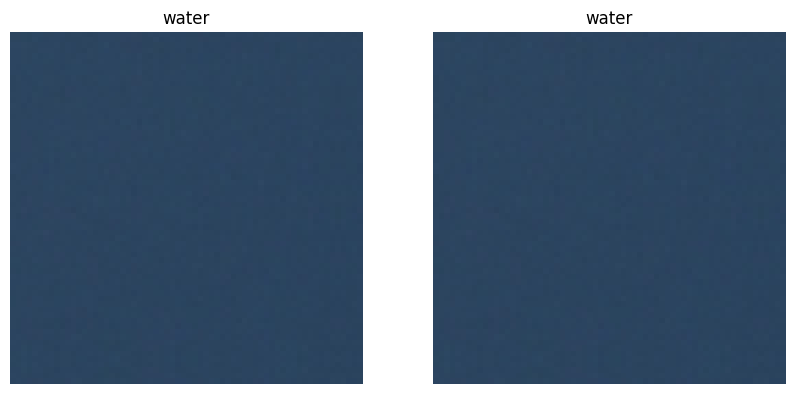

Test image 74 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


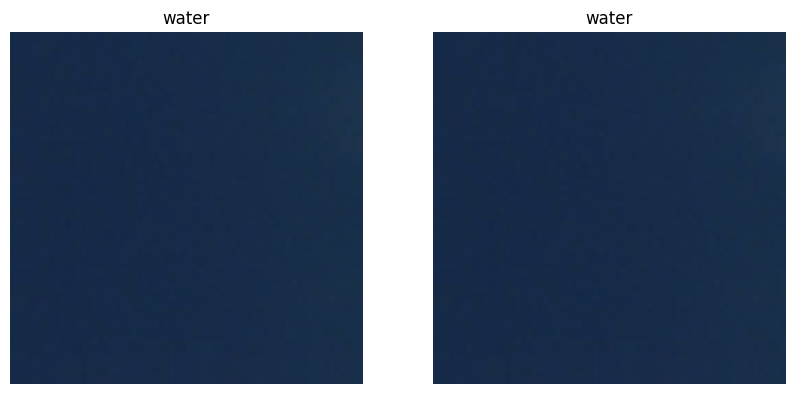

Test image 75 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


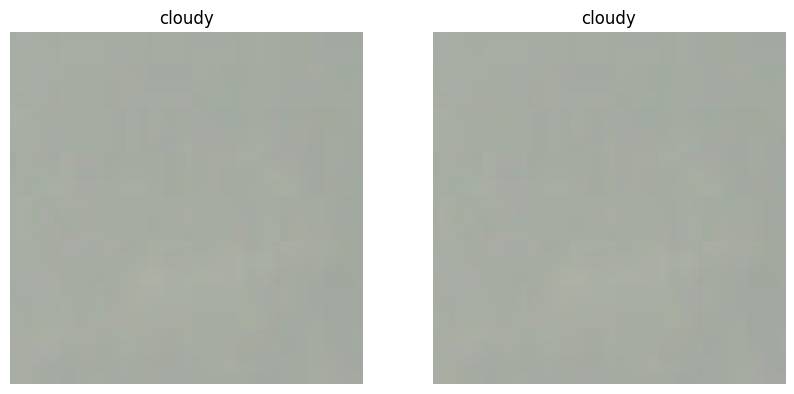

Test image 76 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


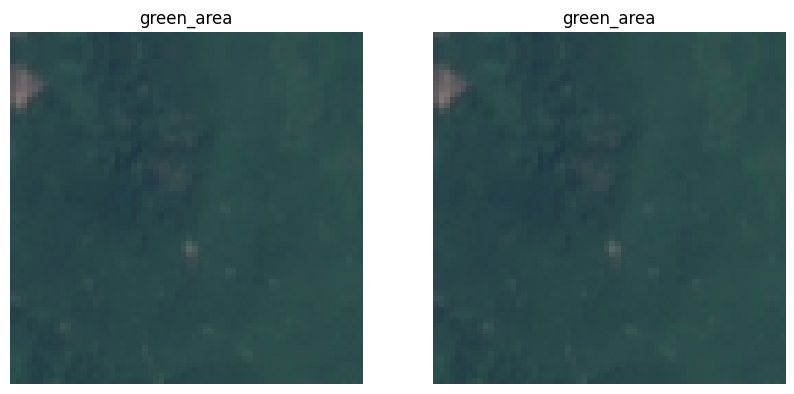

Test image 77 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


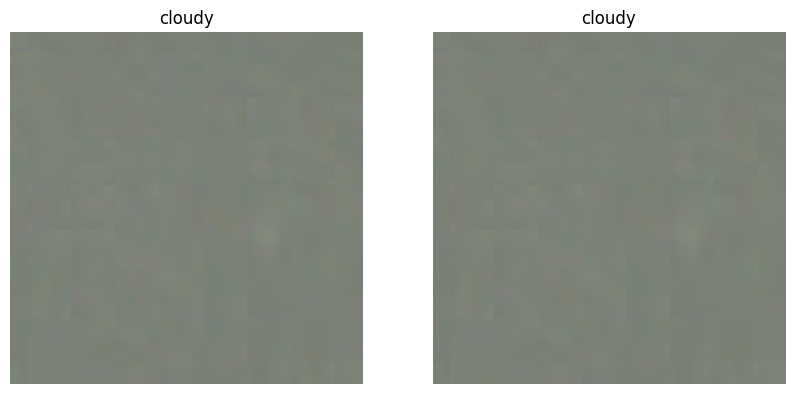

Test image 78 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


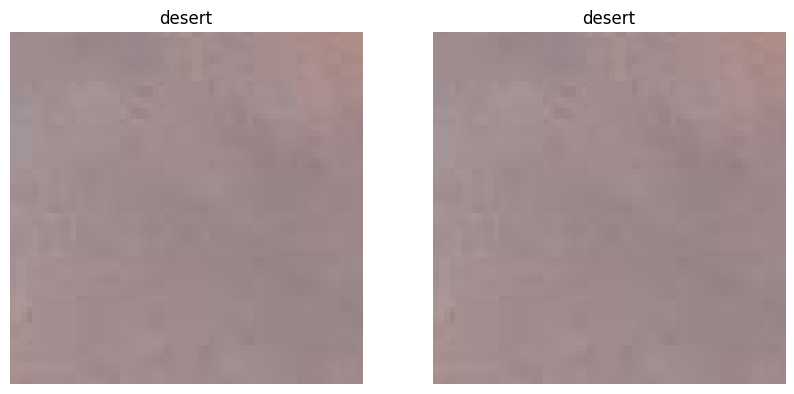

Test image 79 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


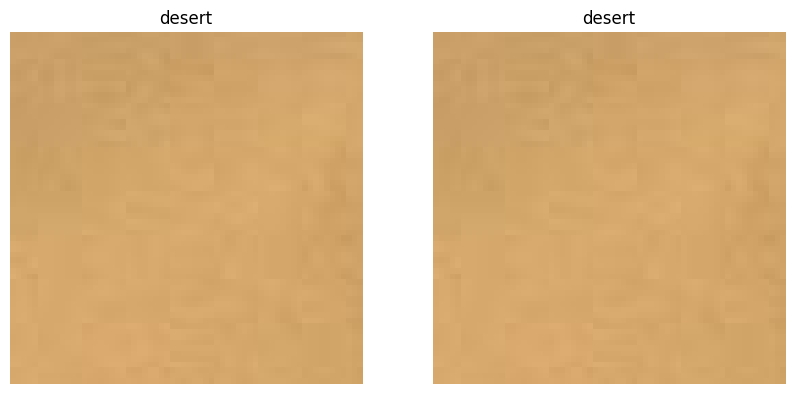

Test image 80 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


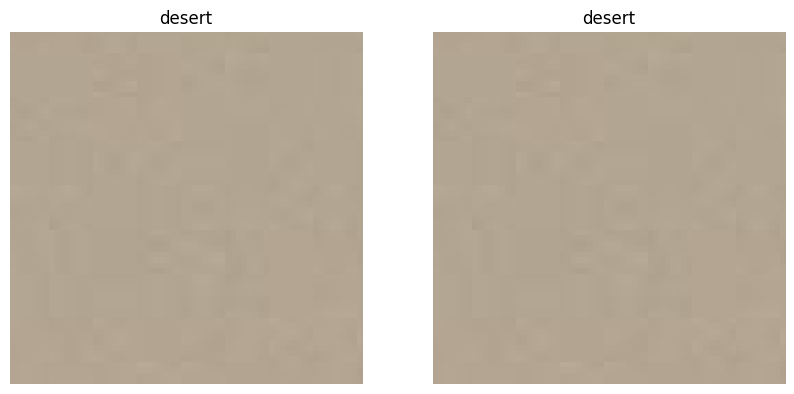

Test image 81 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


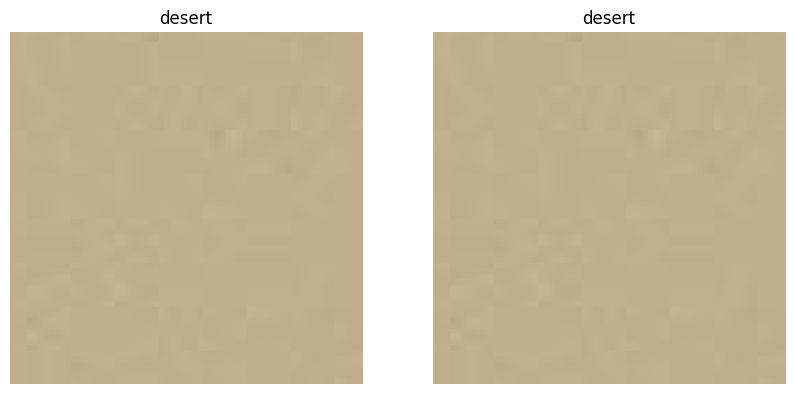

Test image 82 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


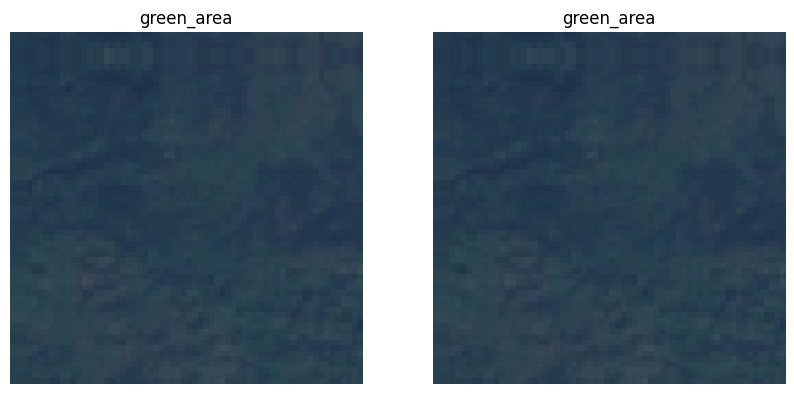

Test image 83 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


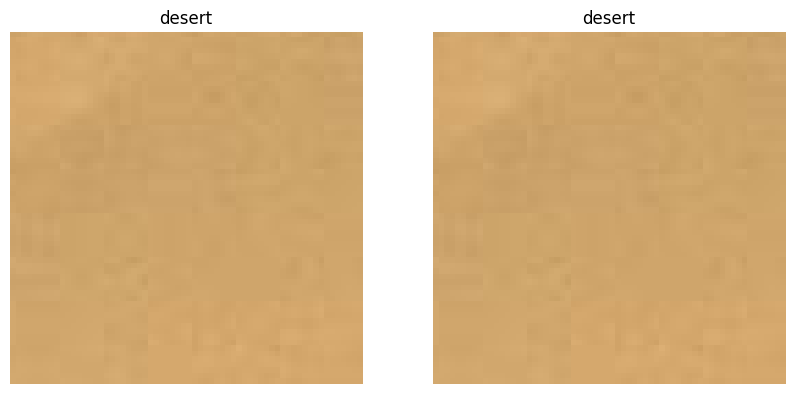

Test image 84 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


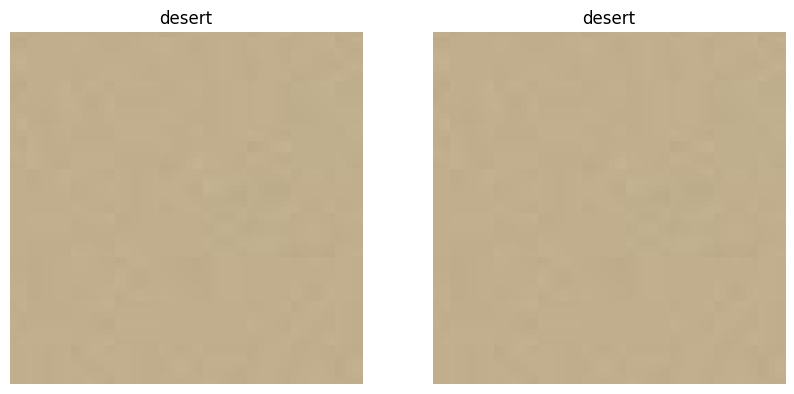

Test image 85 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


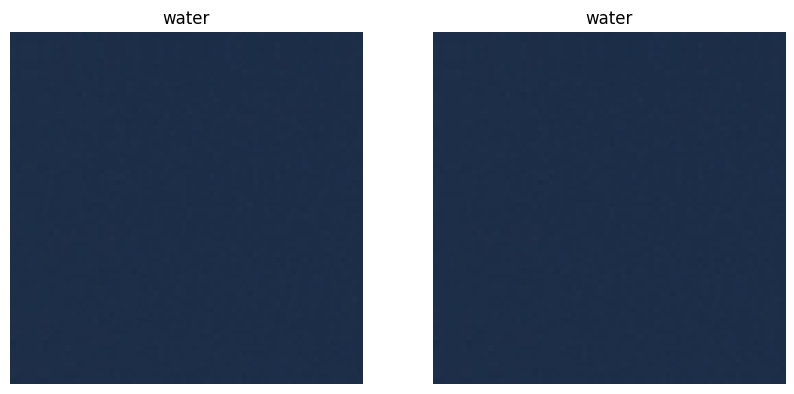

Test image 86 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


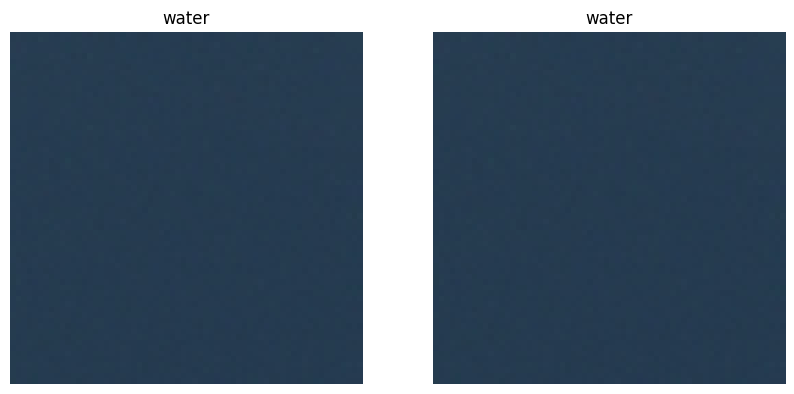

Test image 87 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


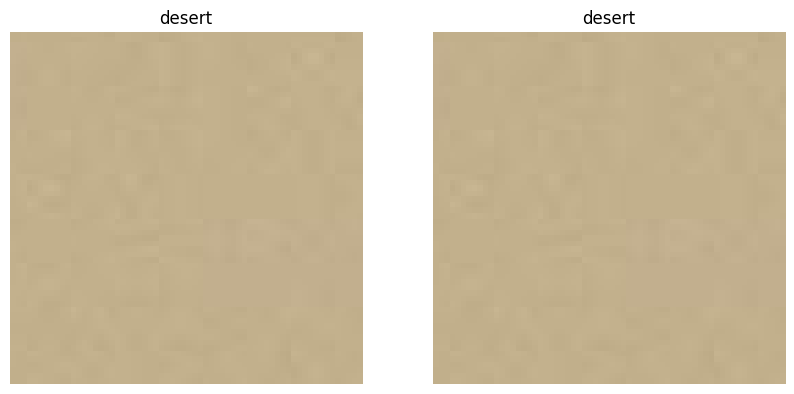

Test image 88 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


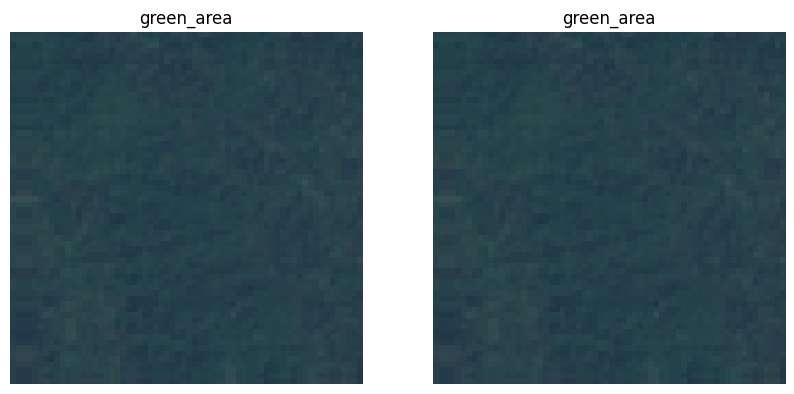

Test image 89 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


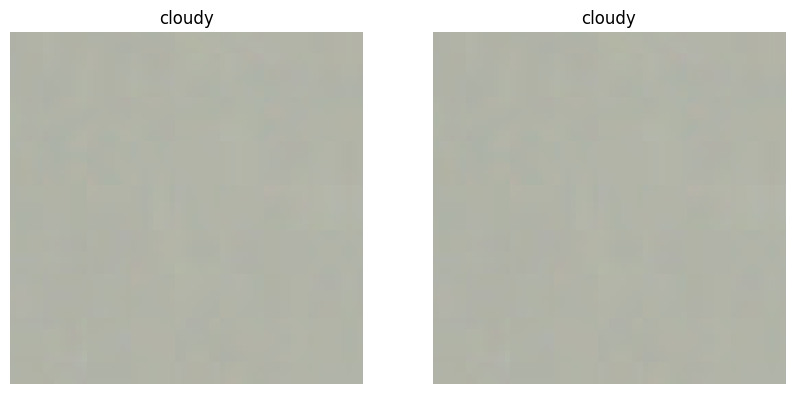

Test image 90 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


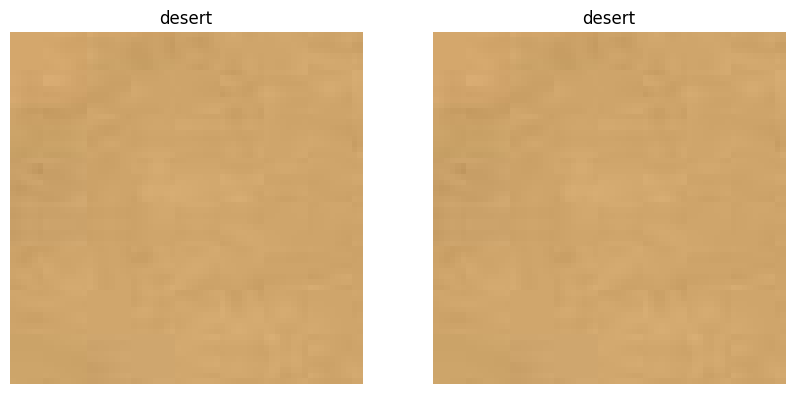

Test image 91 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


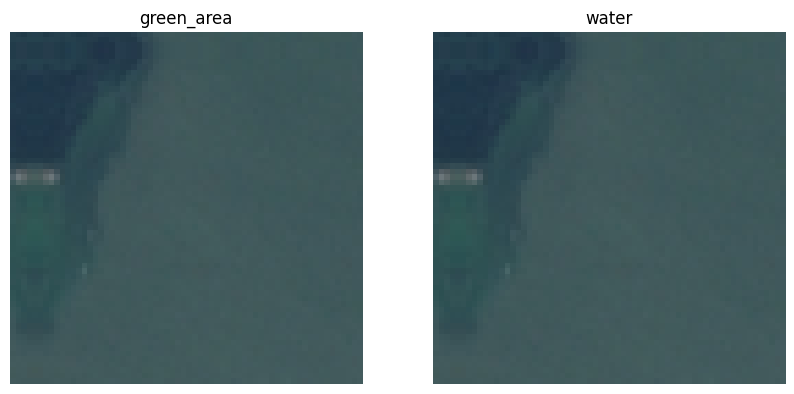

Test image 92 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


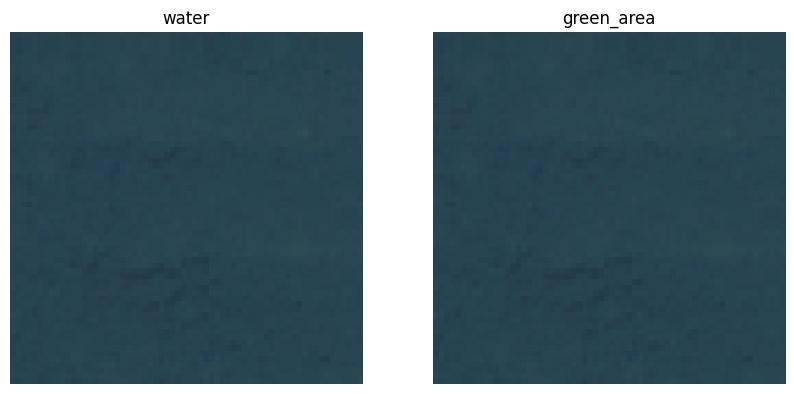

Test image 93 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


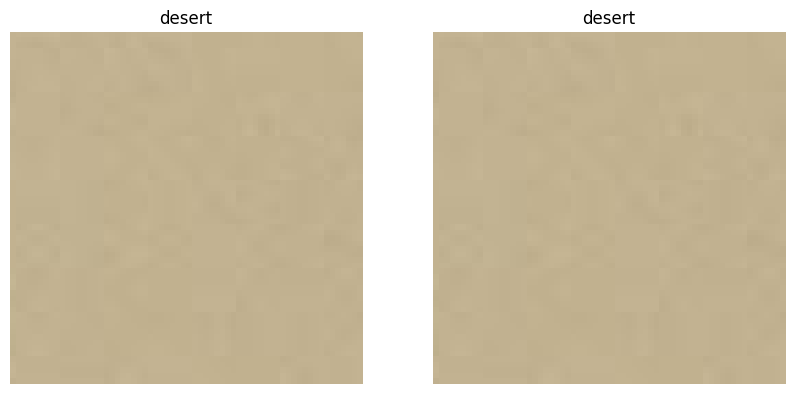

Test image 94 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


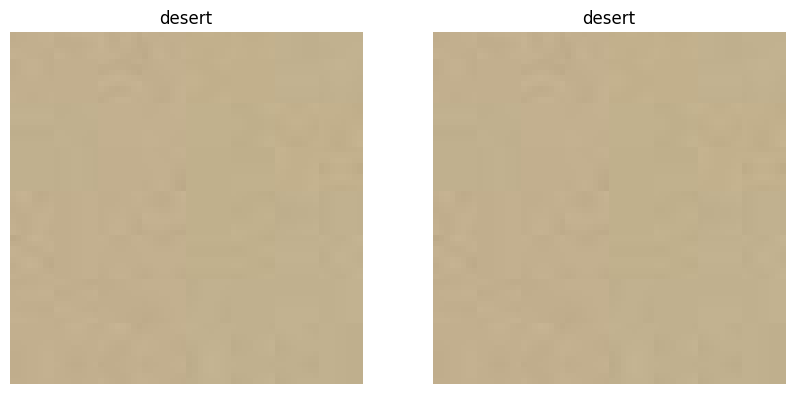

Test image 95 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


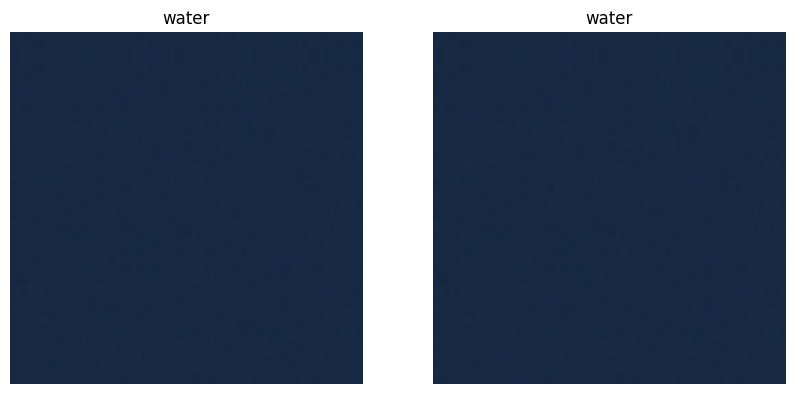

Test image 96 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


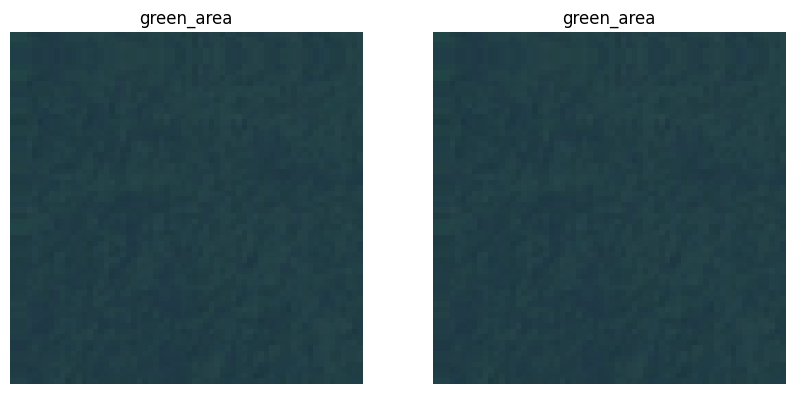

Test image 97 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


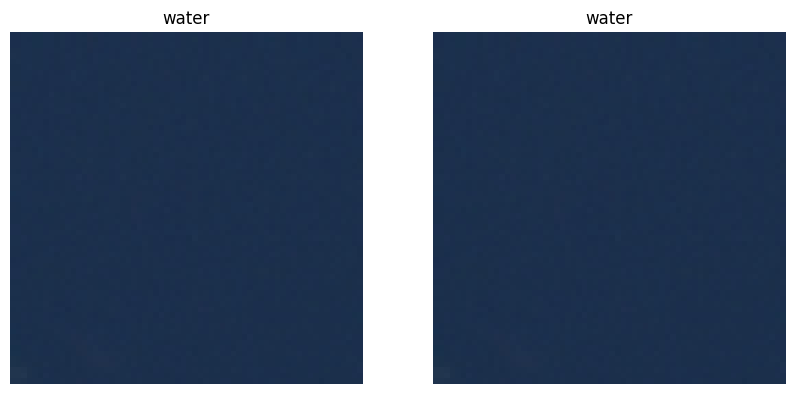

Test image 98 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


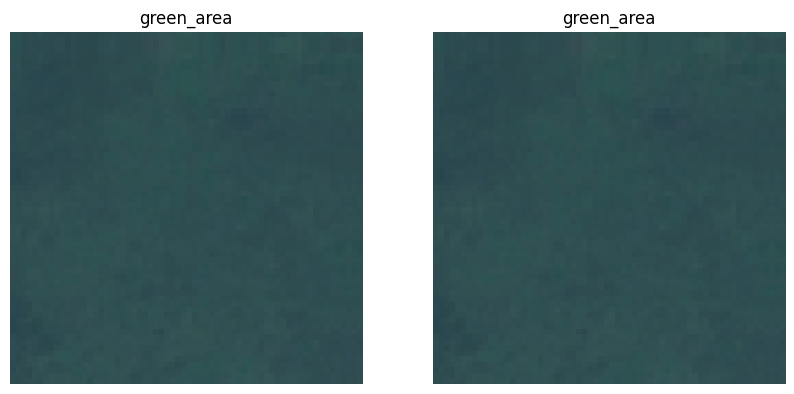

Test image 99 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


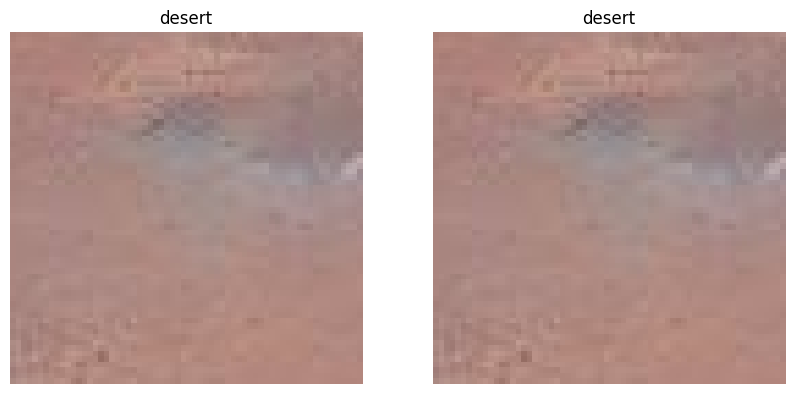

Test image 100 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


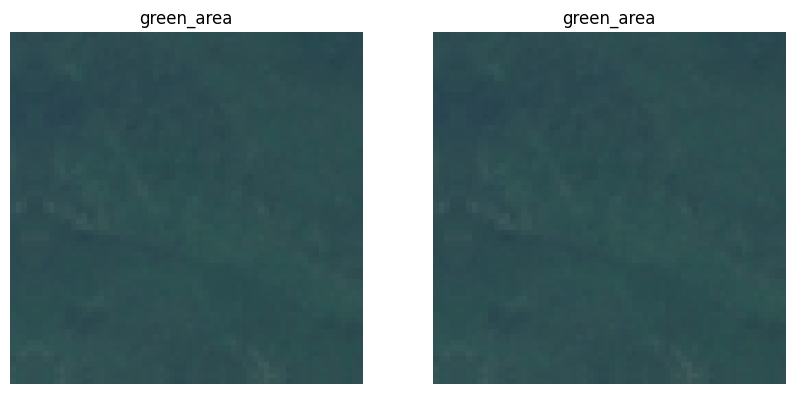

Test image 101 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


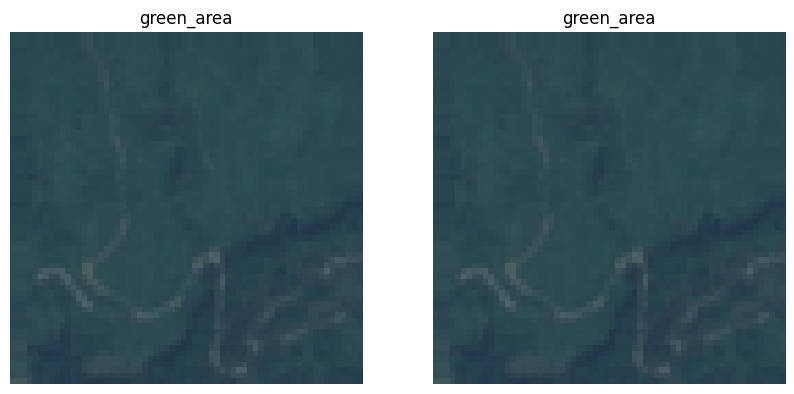

Test image 102 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


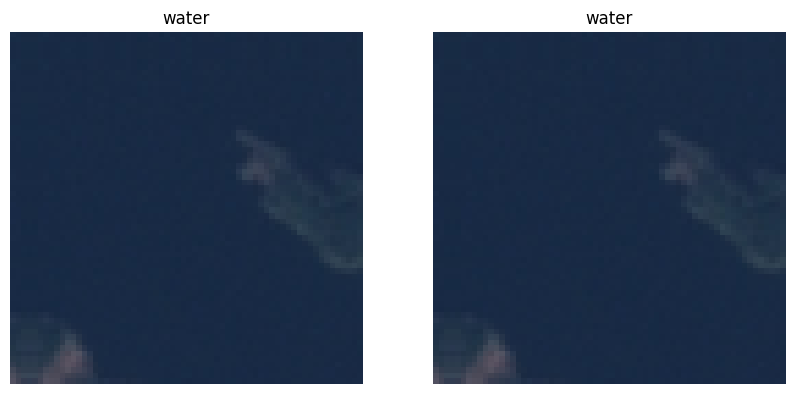

Test image 103 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


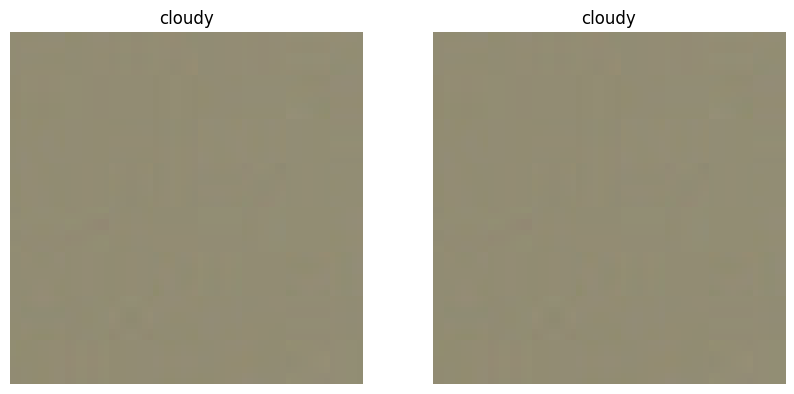

Test image 104 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


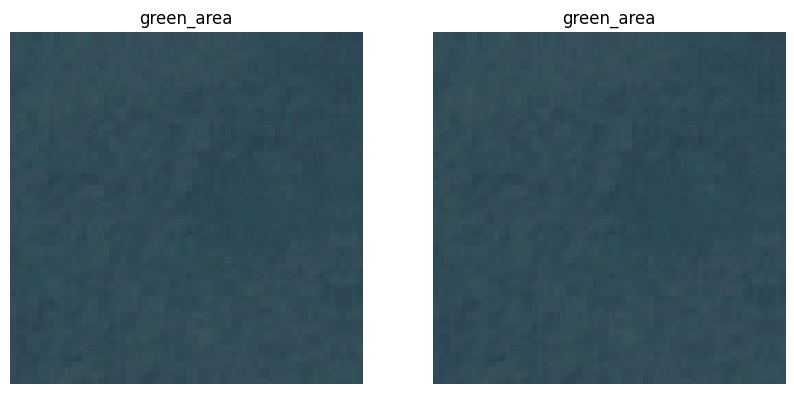

Test image 105 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


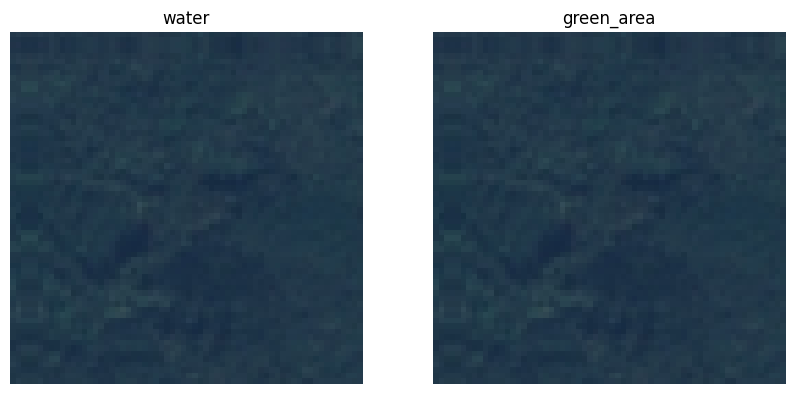

Test image 106 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


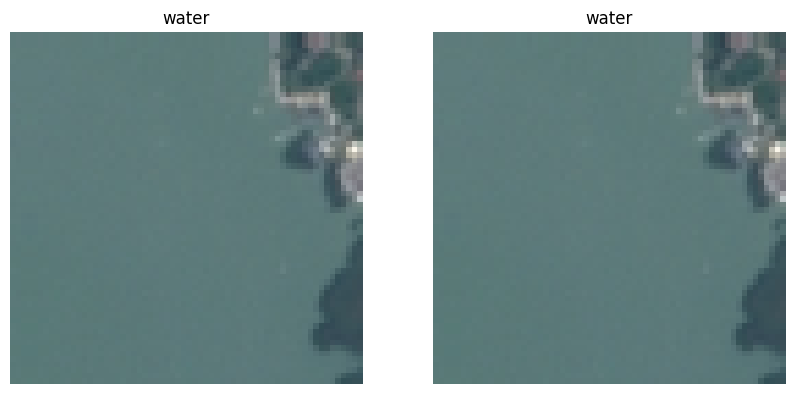

Test image 107 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


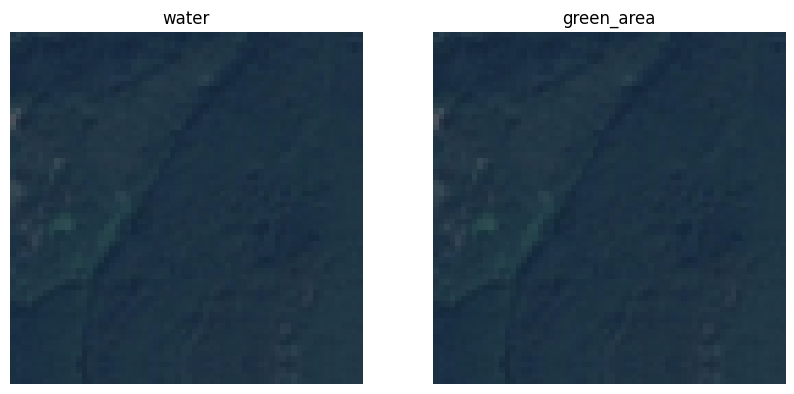

Test image 108 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


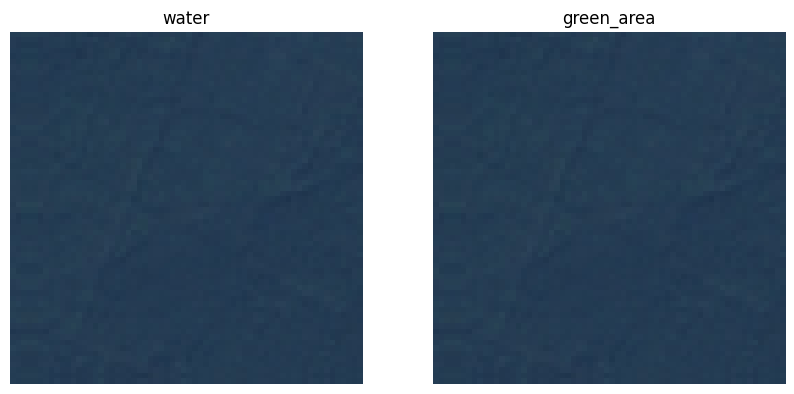

Test image 109 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


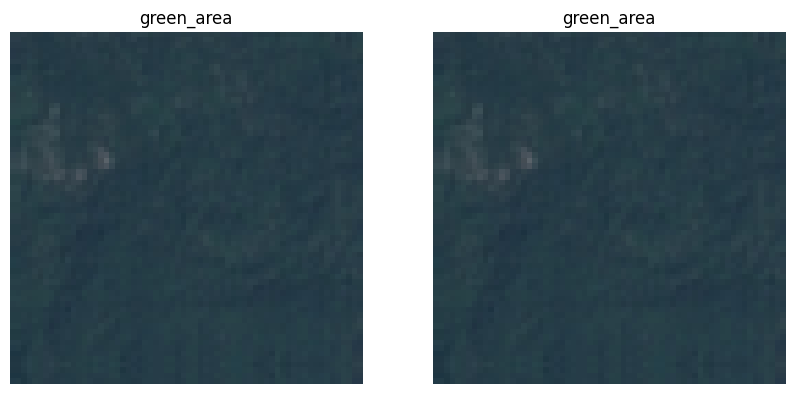

Test image 110 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


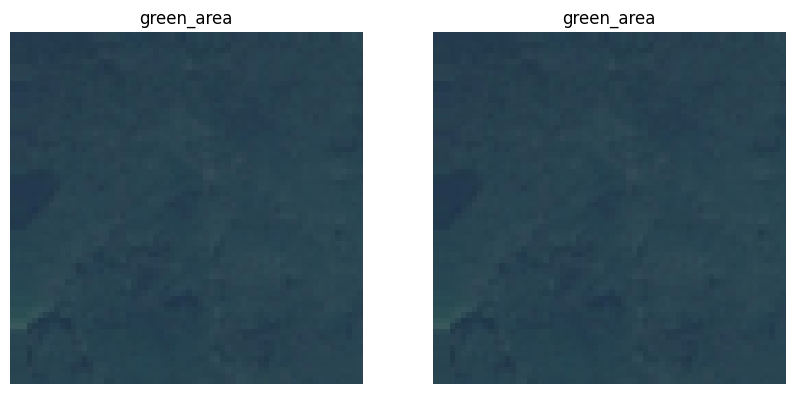

Test image 111 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


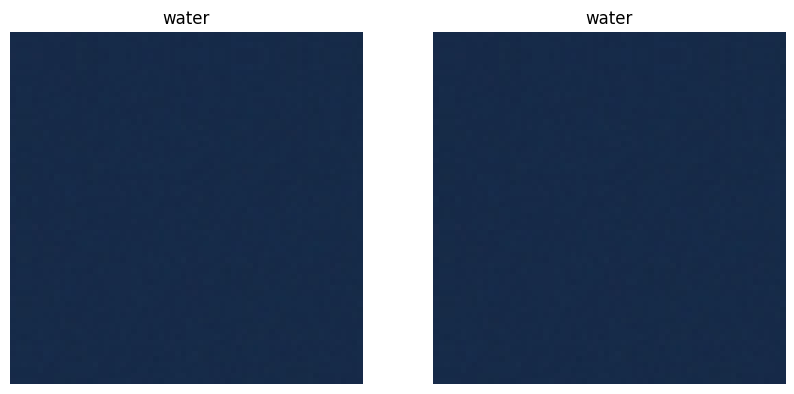

Test image 112 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


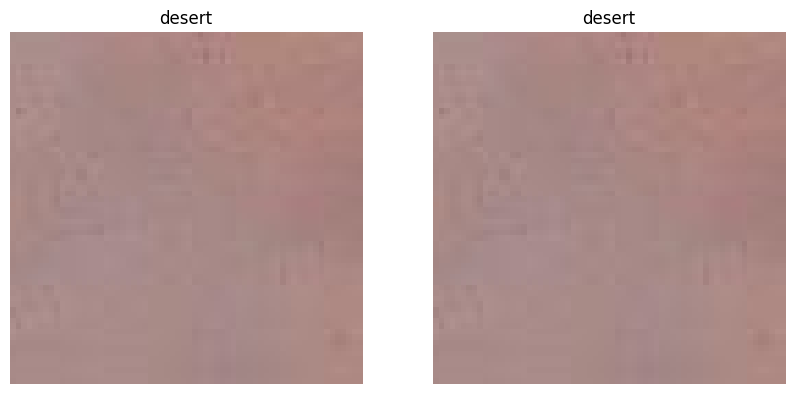

Test image 113 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


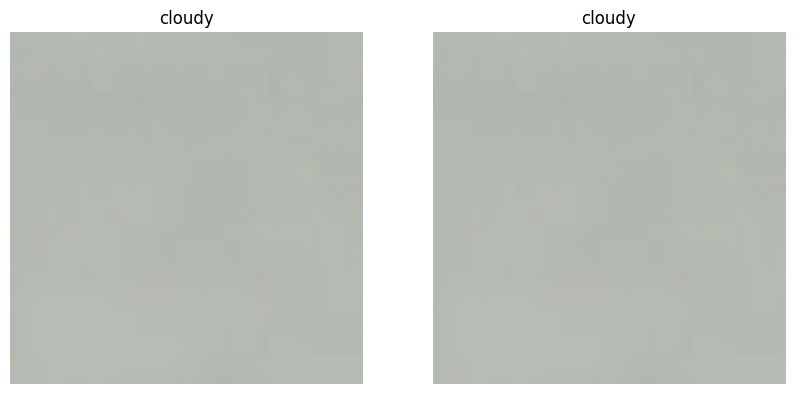

Test image 114 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


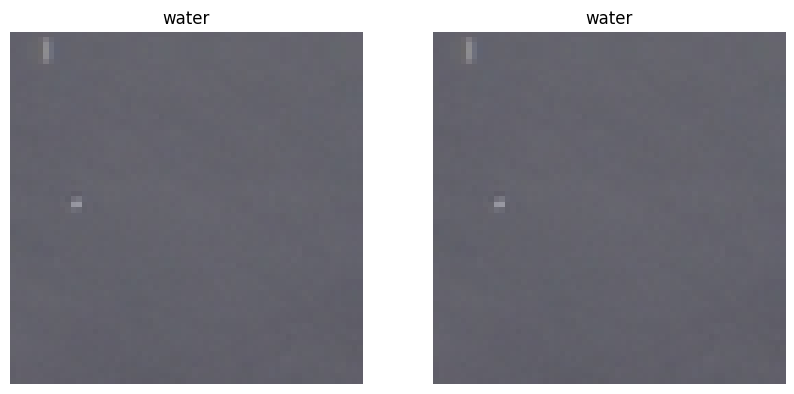

Test image 115 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


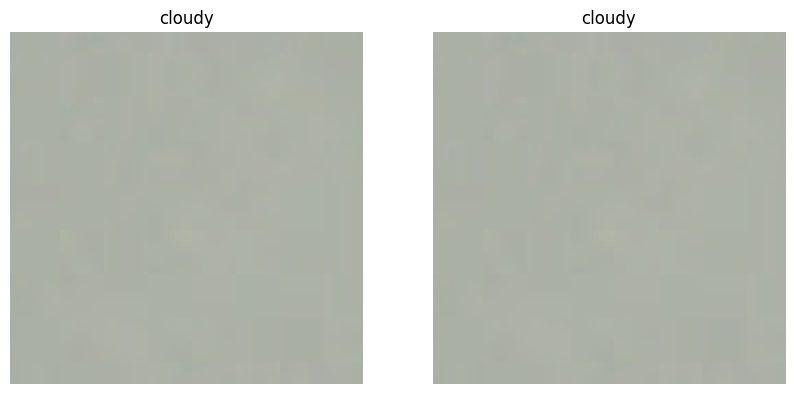

Test image 116 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


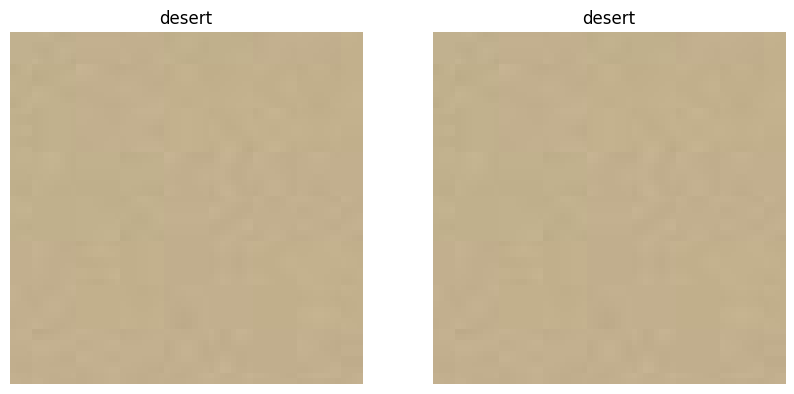

Test image 117 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


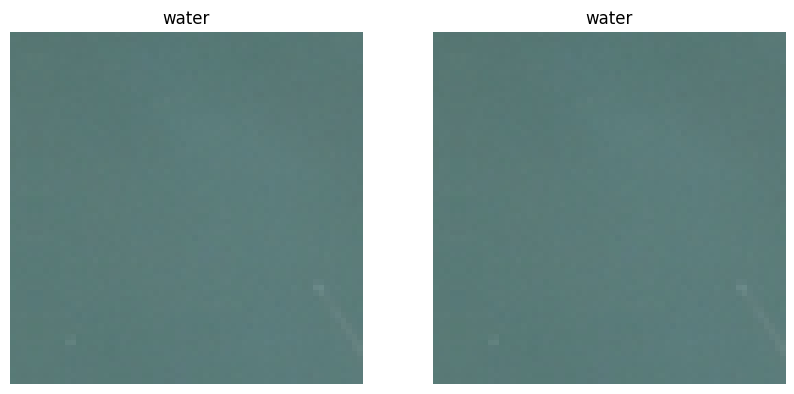

Test image 118 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


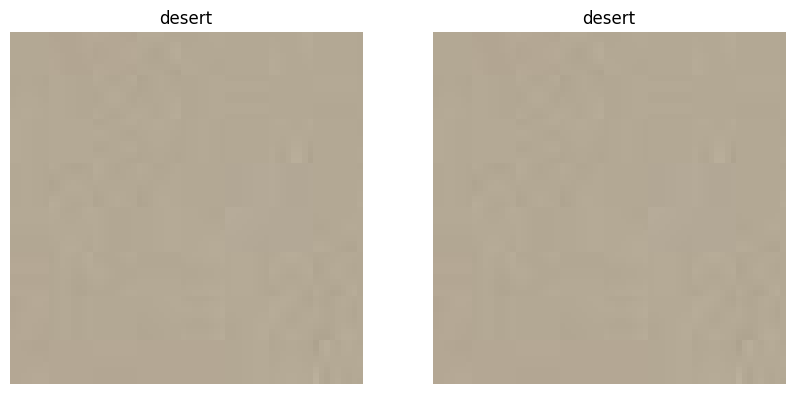

Test image 119 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


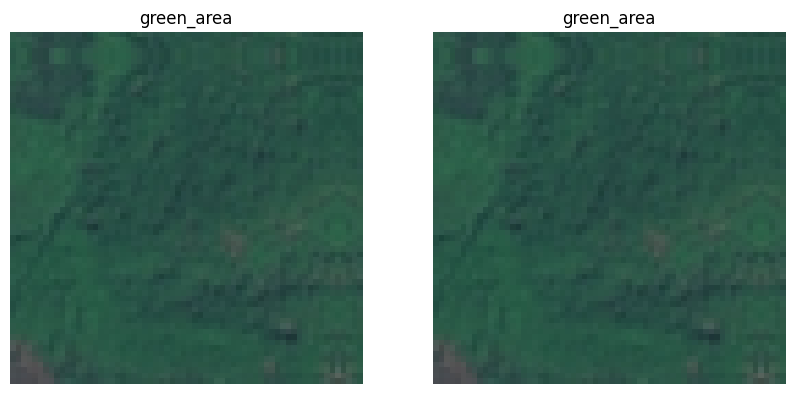

Test image 120 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


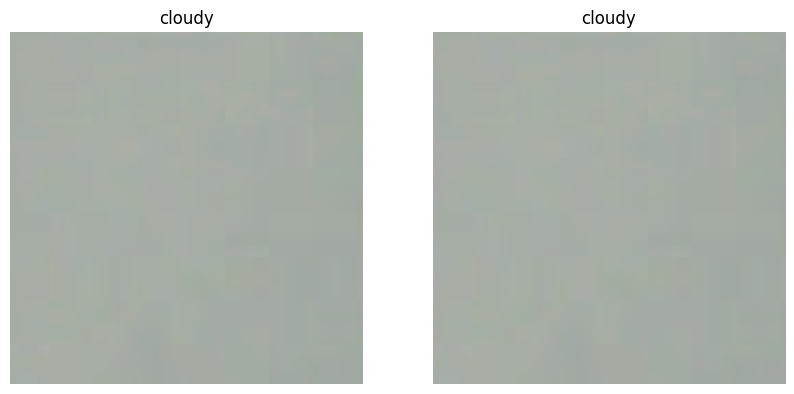

Test image 121 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


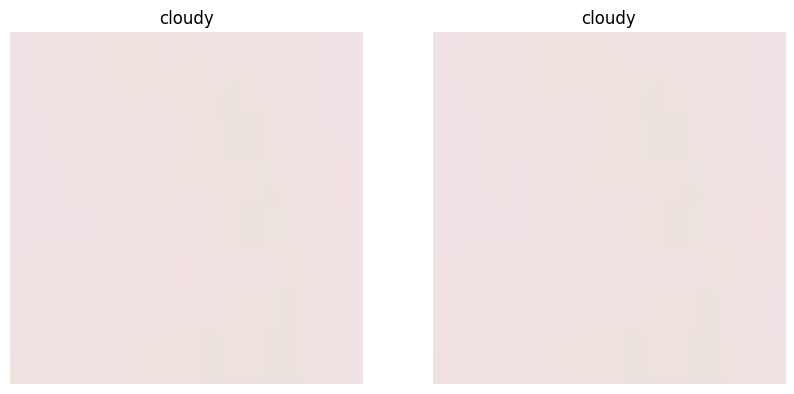

Test image 122 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


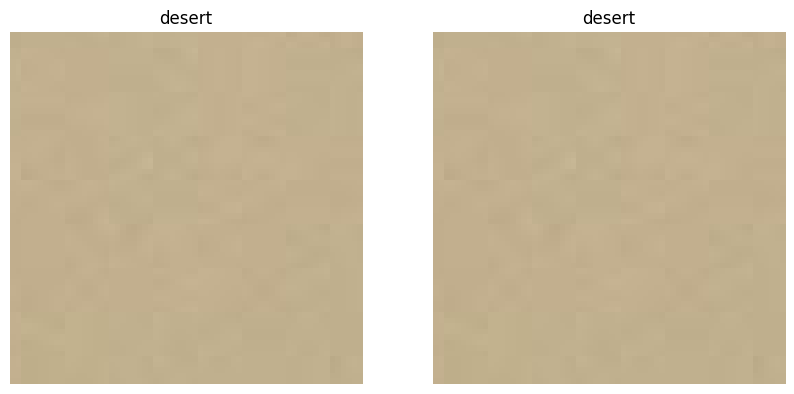

Test image 123 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


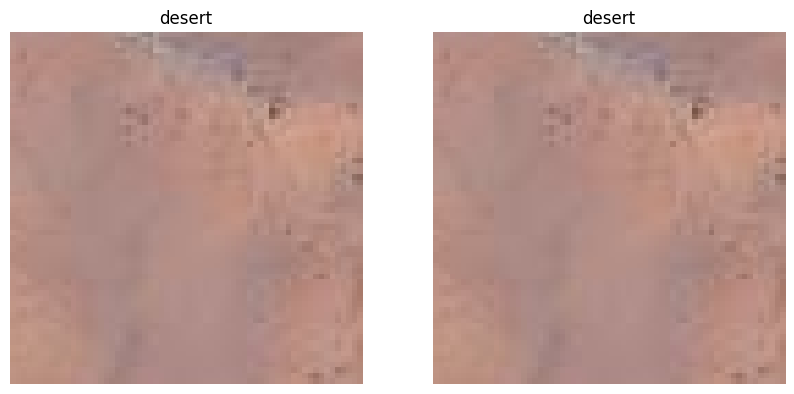

Test image 124 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


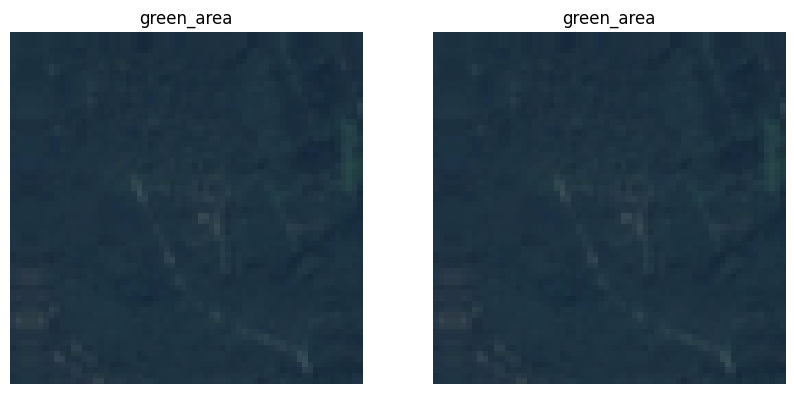

Test image 125 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


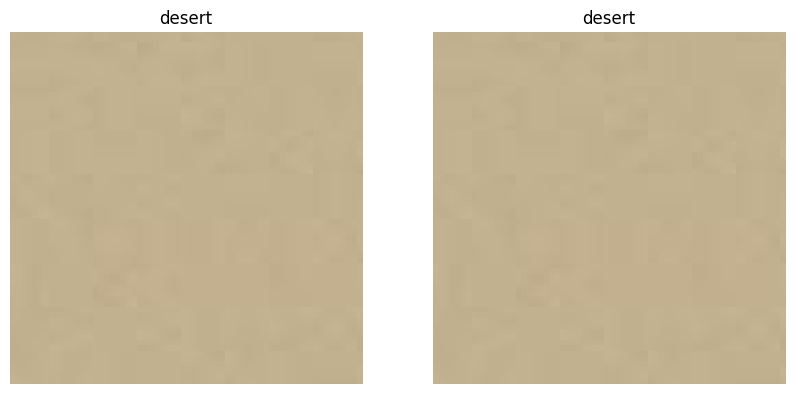

Test image 126 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


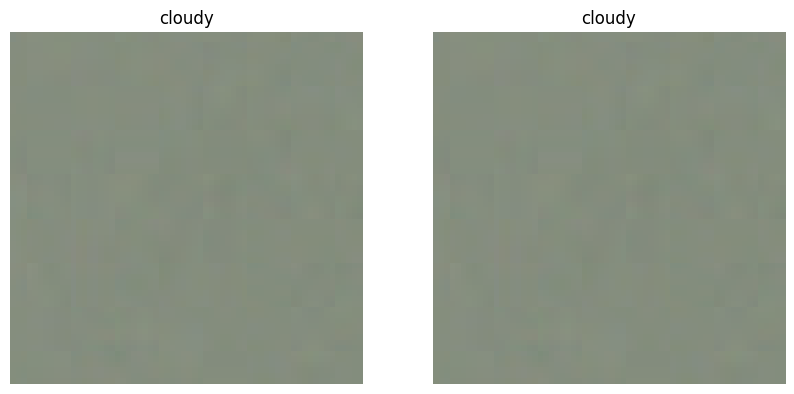

Test image 127 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


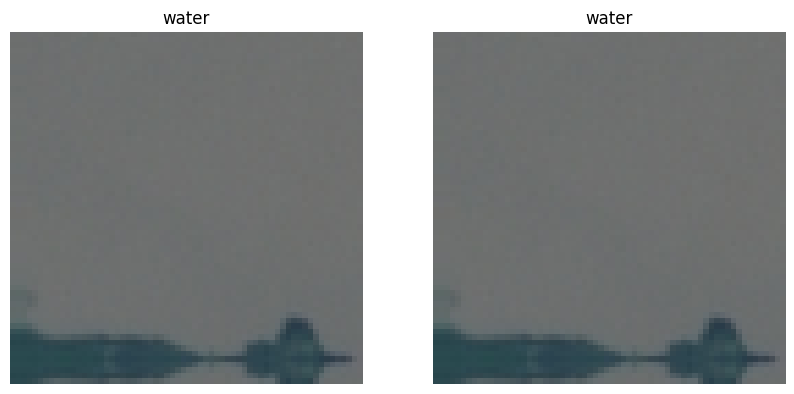

Test image 128 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


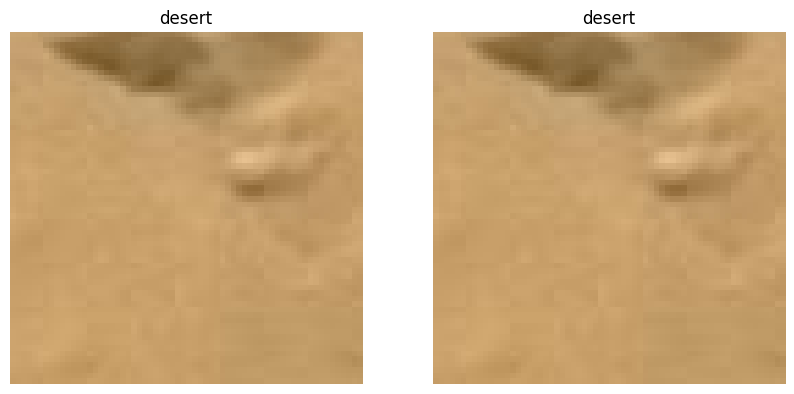

Test image 129 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


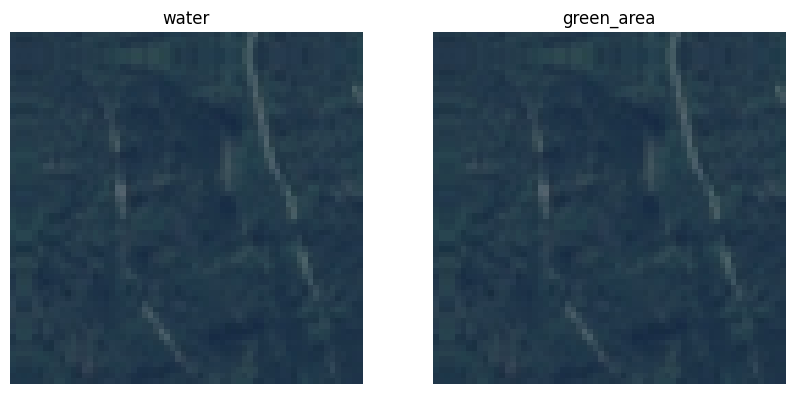

Test image 130 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


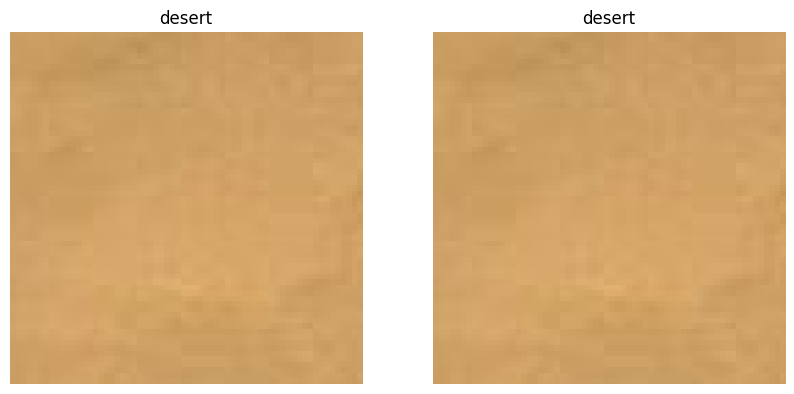

Test image 131 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


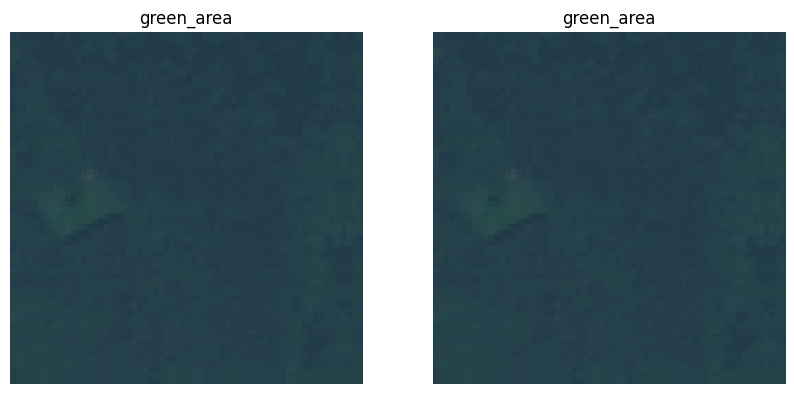

Test image 132 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


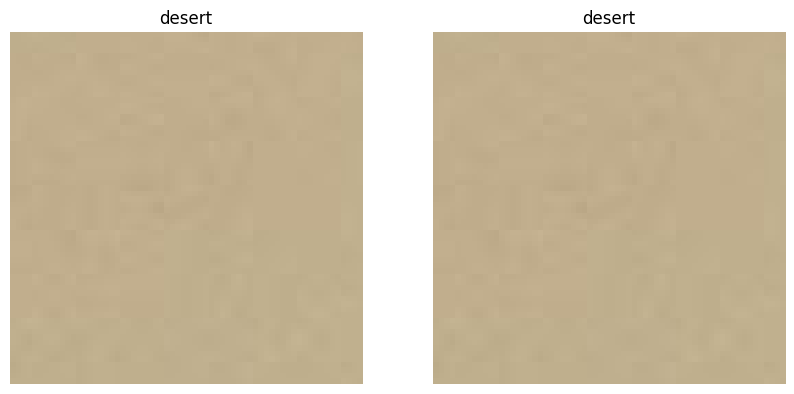

Test image 133 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


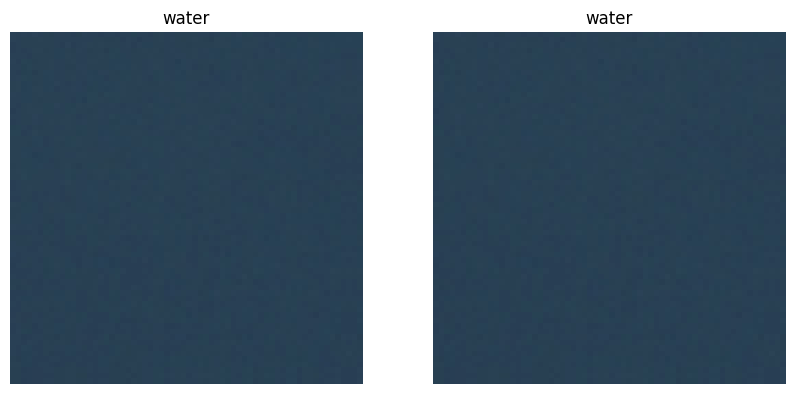

Test image 134 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


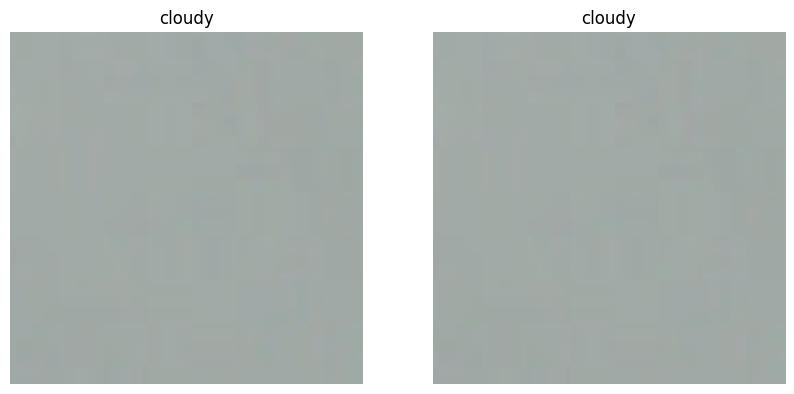

Test image 135 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


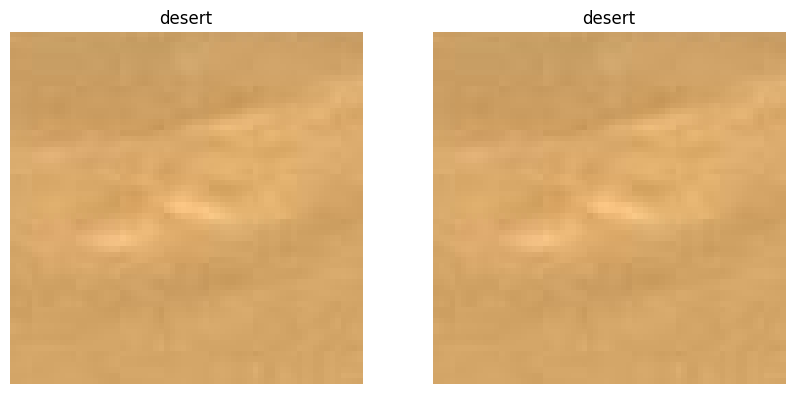

Test image 136 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


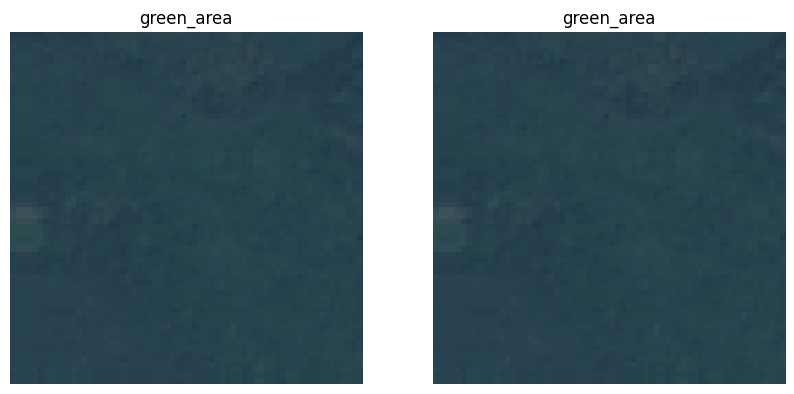

Test image 137 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


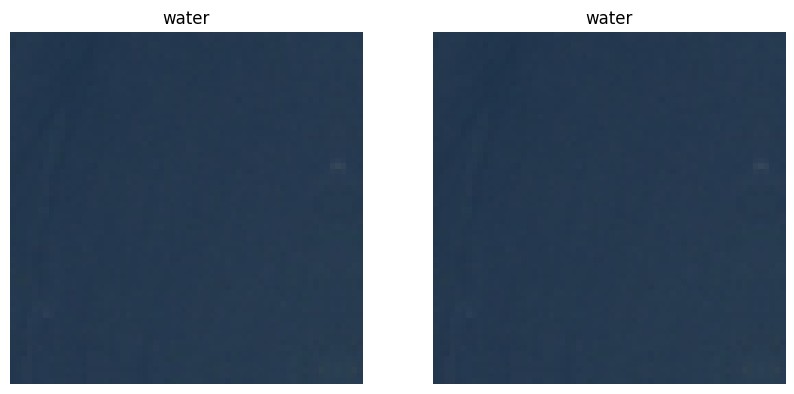

Test image 138 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


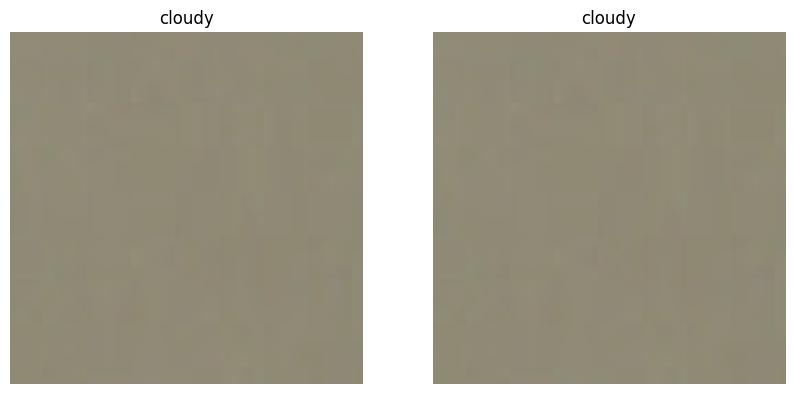

Test image 139 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


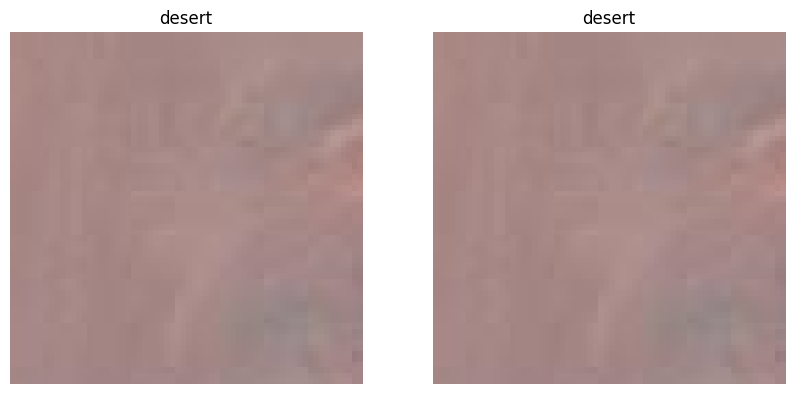

Test image 140 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


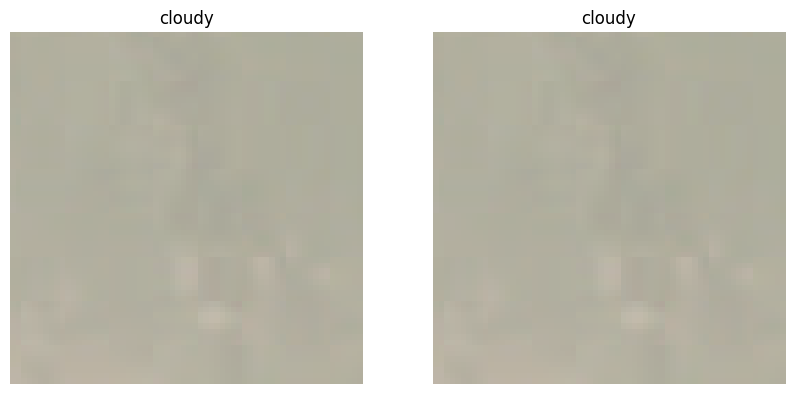

Test image 141 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


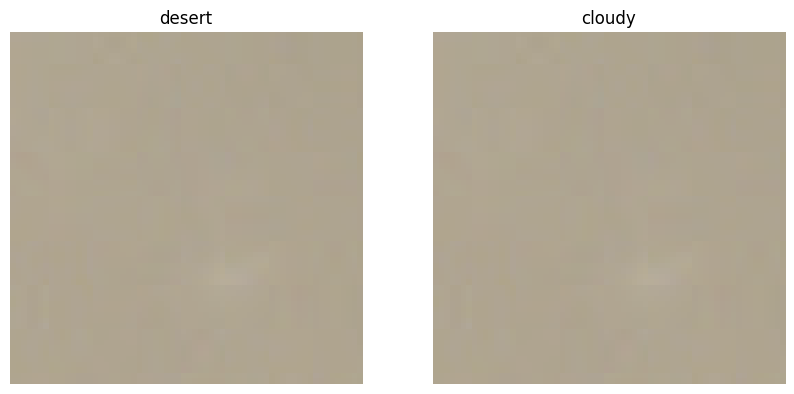

Test image 142 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


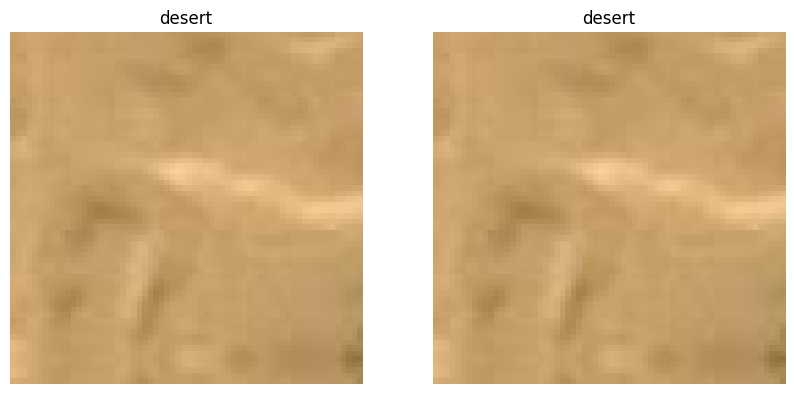

Test image 143 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


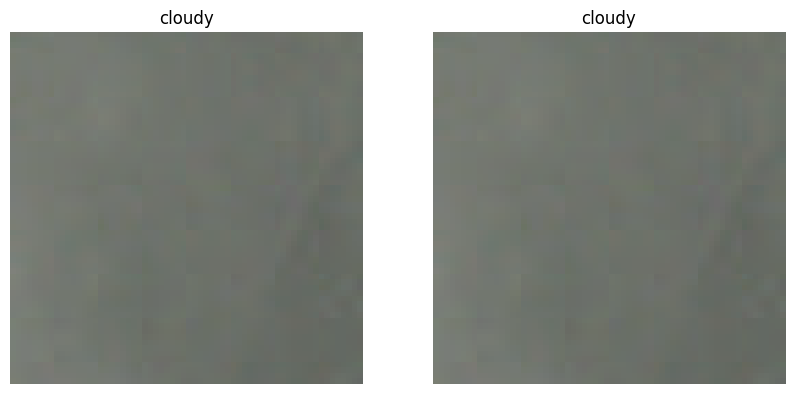

Test image 144 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


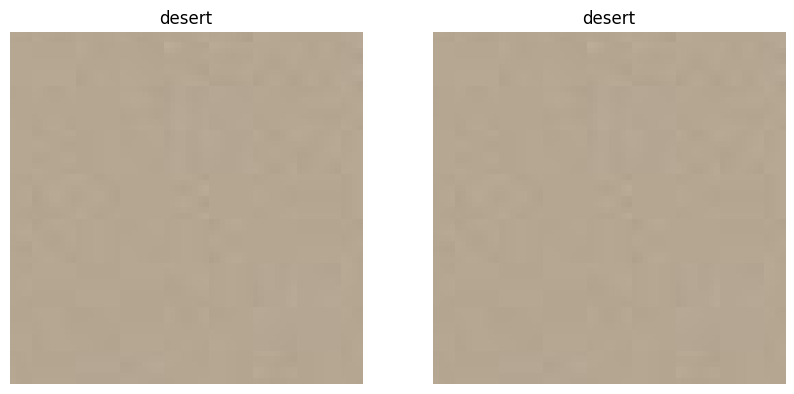

Test image 145 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


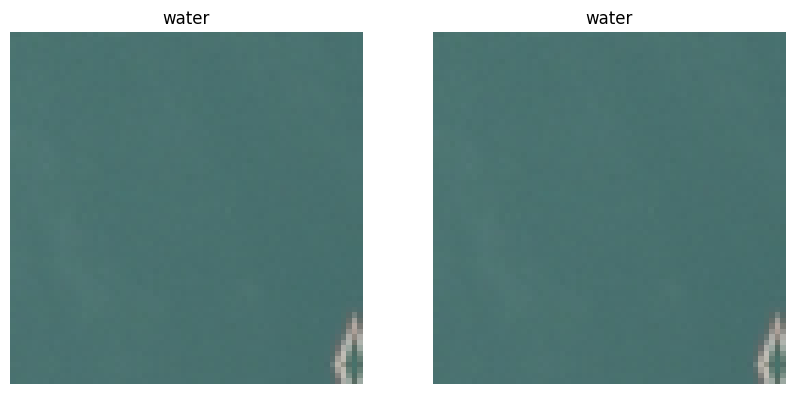

Test image 146 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


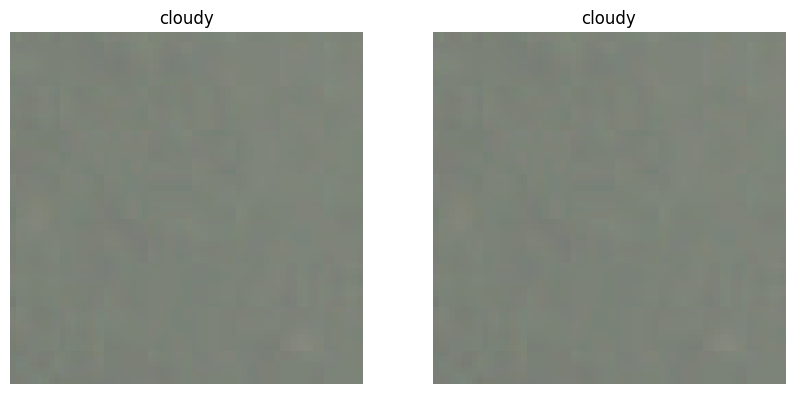

Test image 147 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


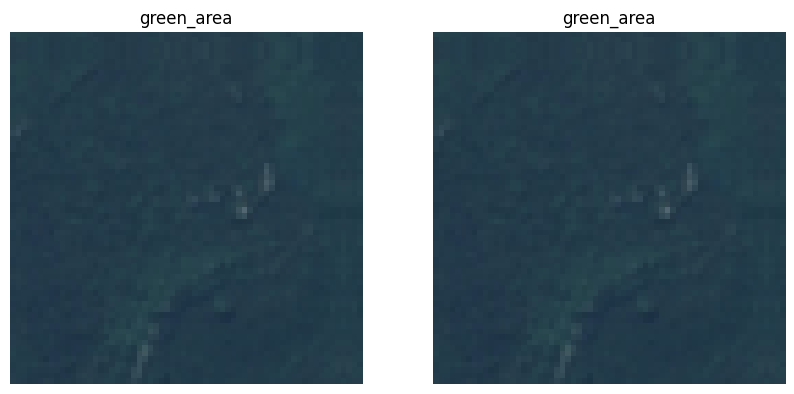

Test image 148 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


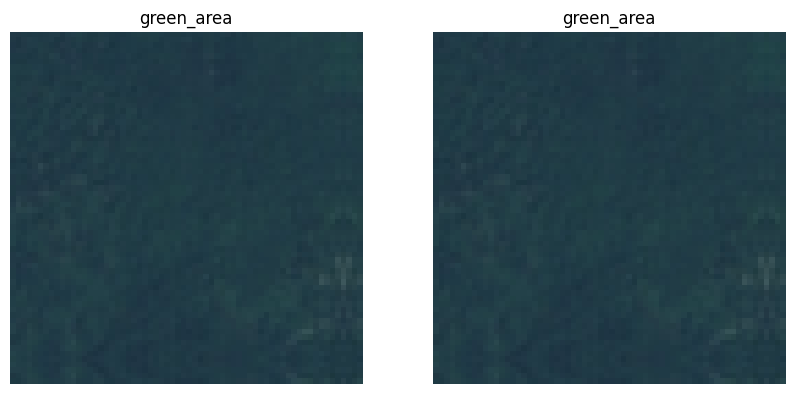

Test image 149 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


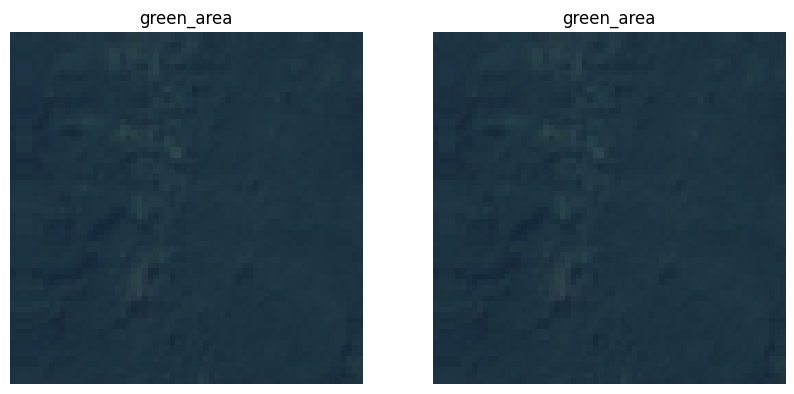

Test image 150 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


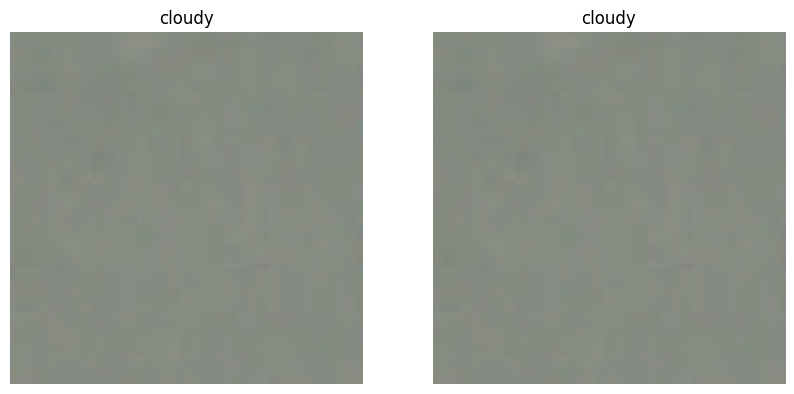

Test image 151 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


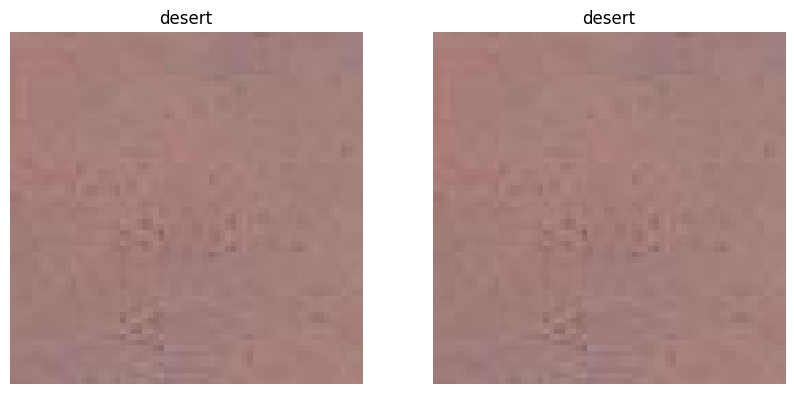

Test image 152 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


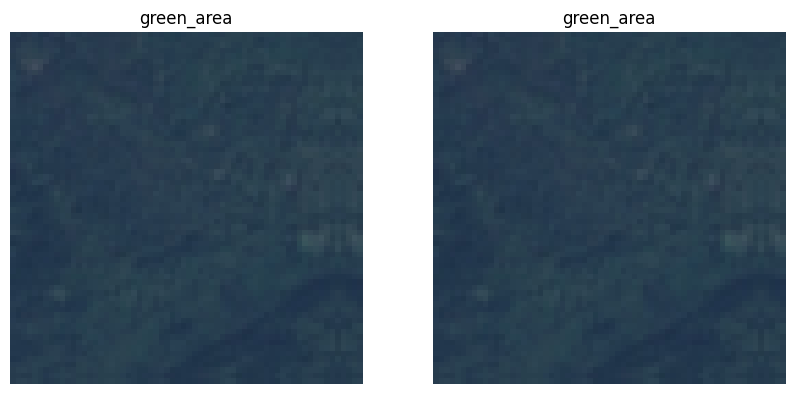

Test image 153 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


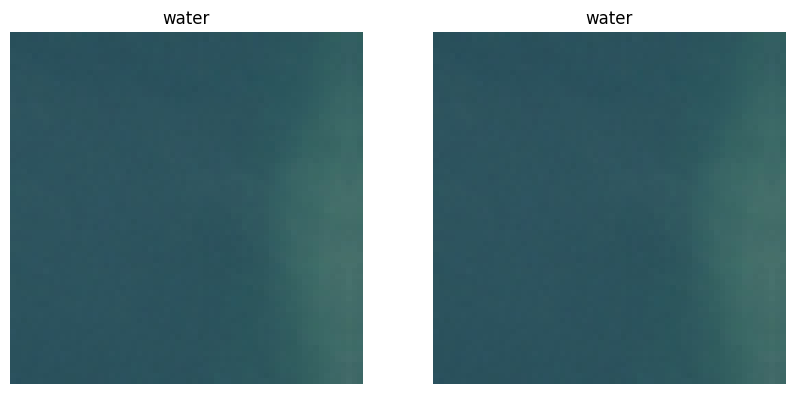

Test image 154 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


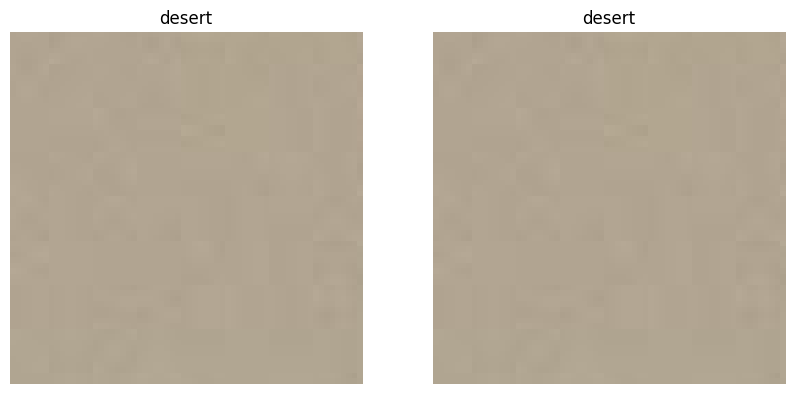

Test image 155 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


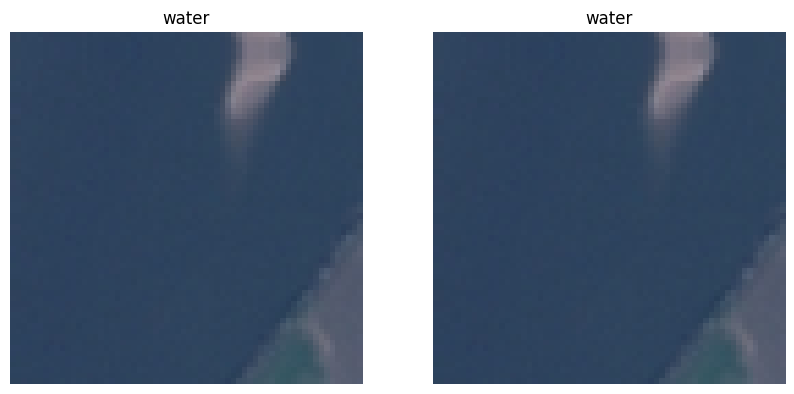

Test image 156 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


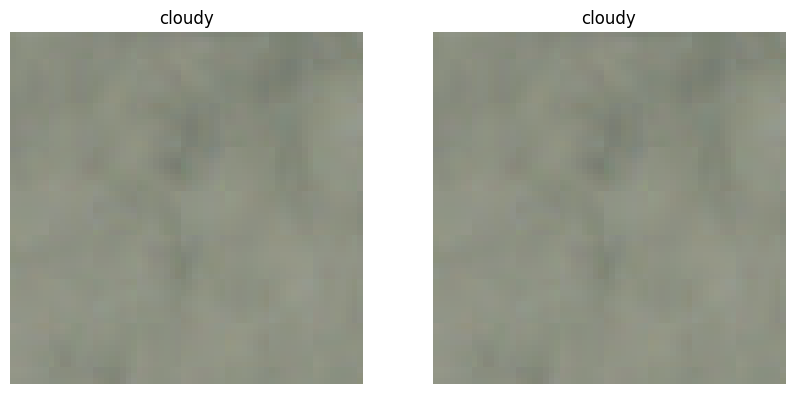

Test image 157 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


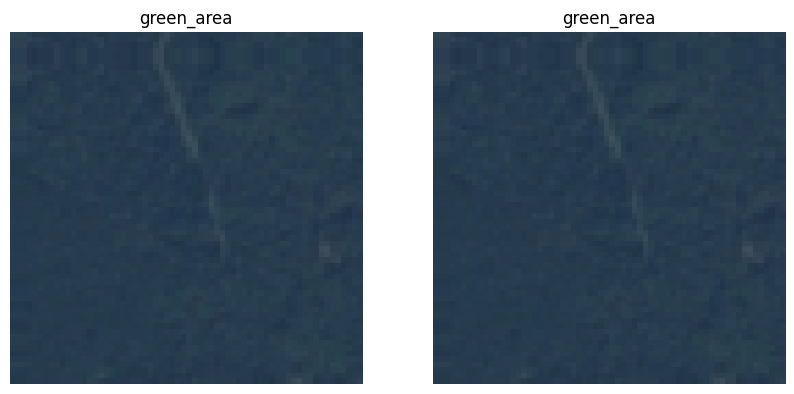

Test image 158 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


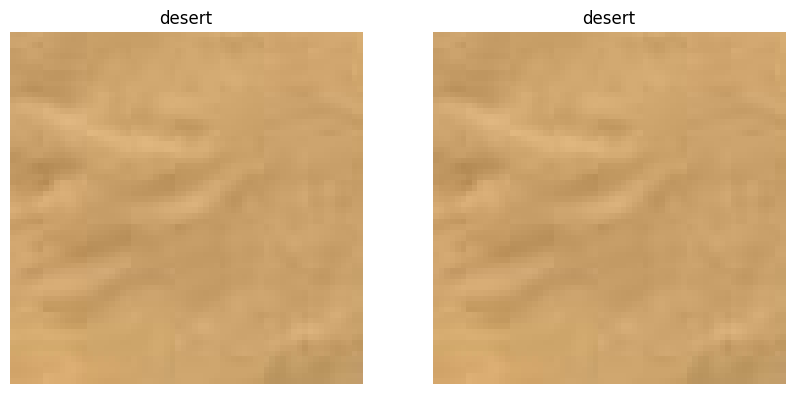

Test image 159 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


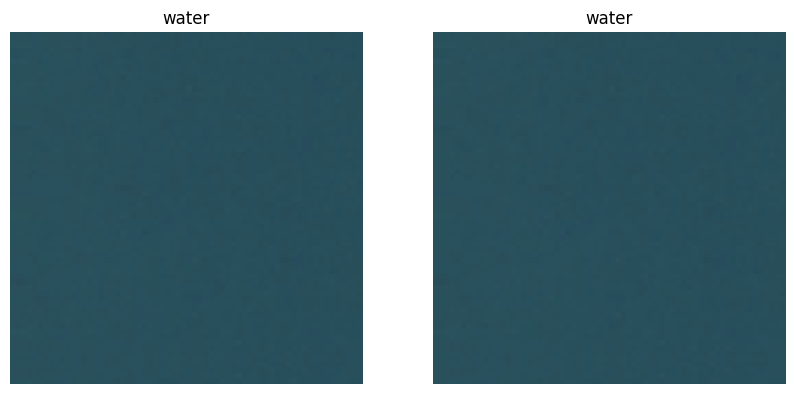

Test image 160 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


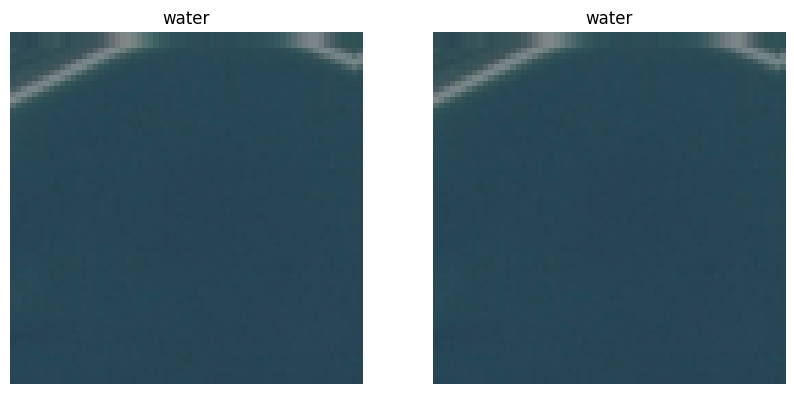

Test image 161 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


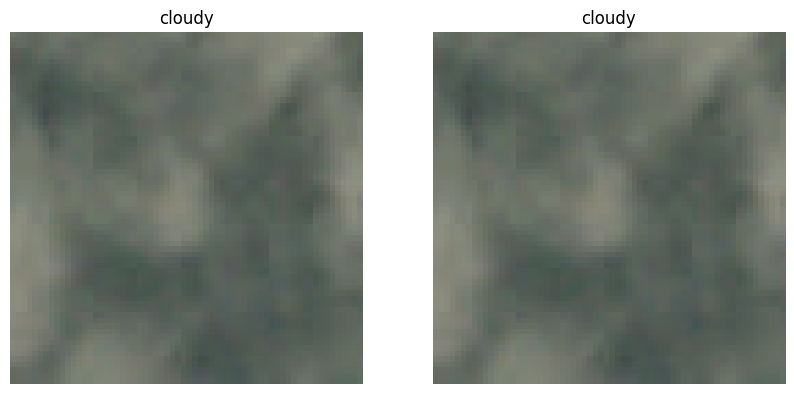

Test image 162 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


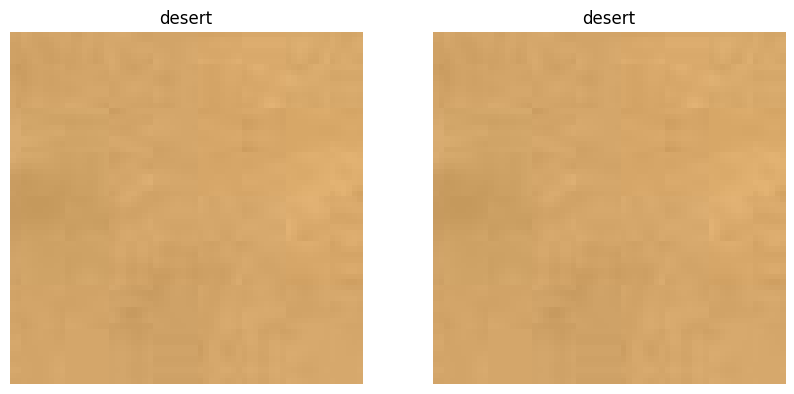

Test image 163 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


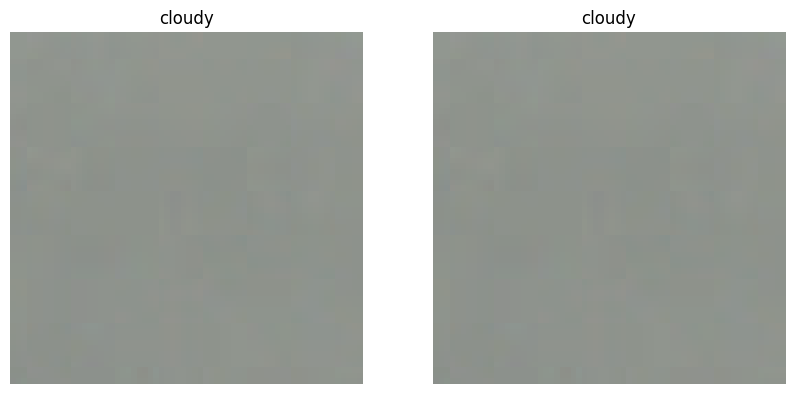

Test image 164 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


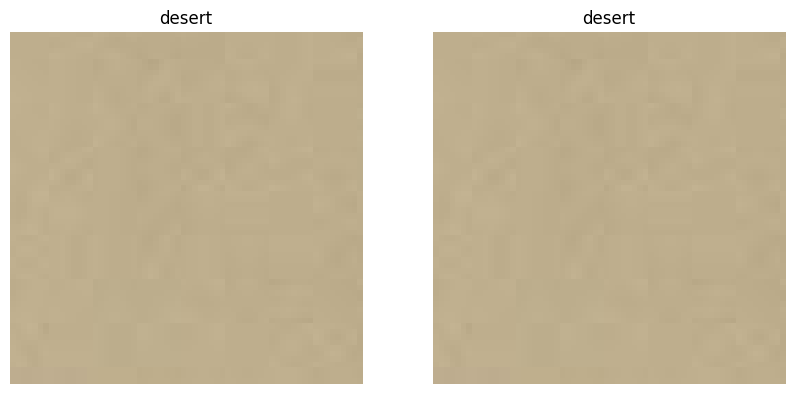

Test image 165 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


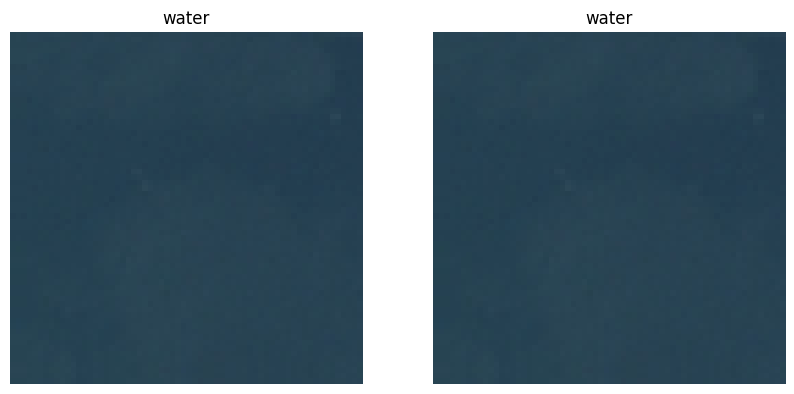

Test image 166 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


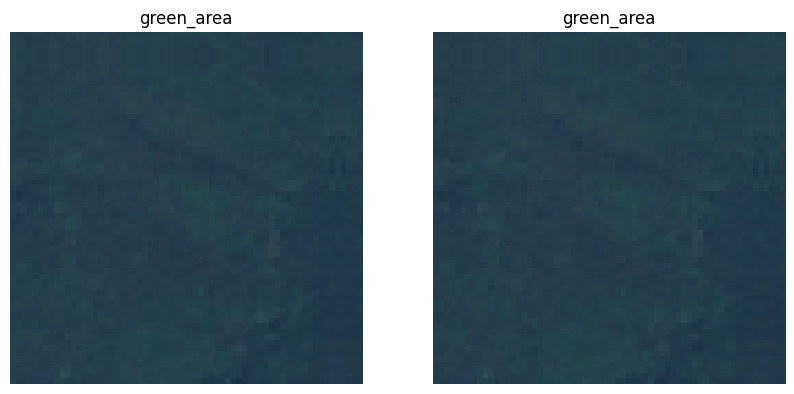

Test image 167 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


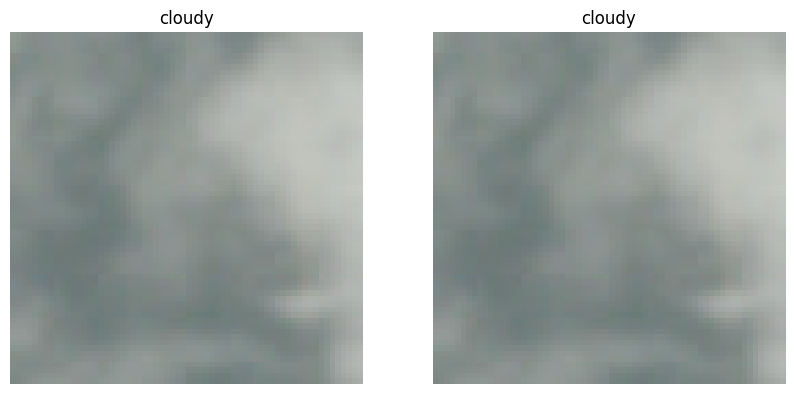

Test image 168 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


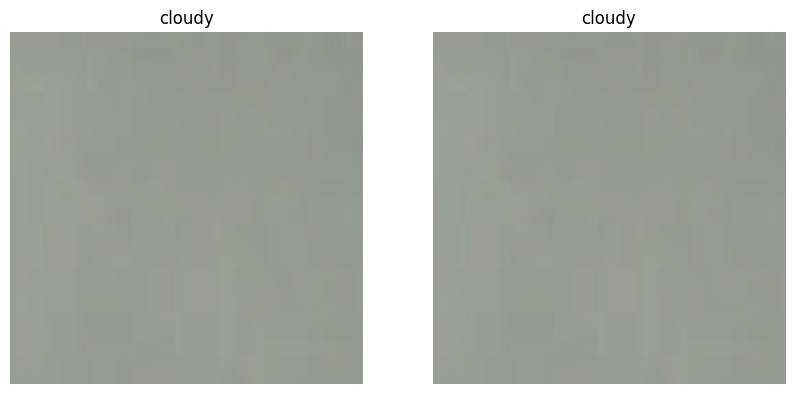

Test image 169 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


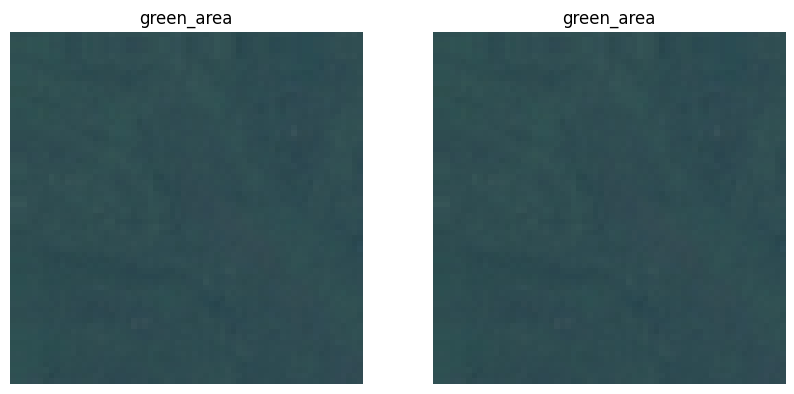

Test image 170 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


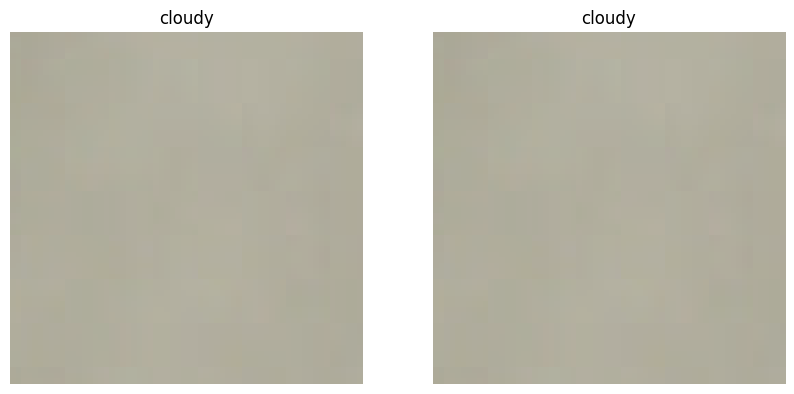

Test image 171 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


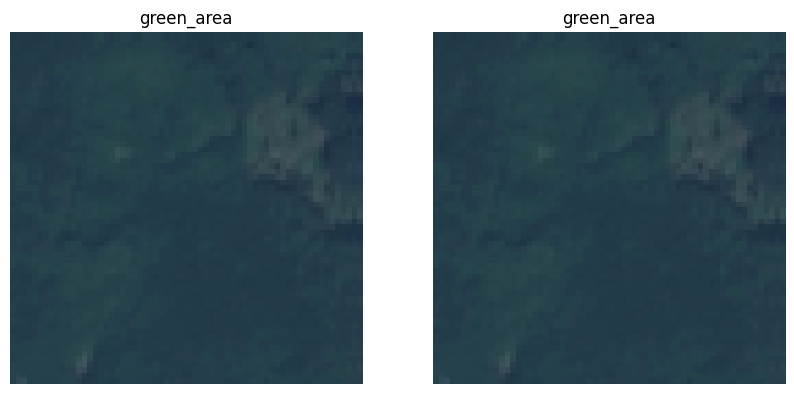

Test image 172 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


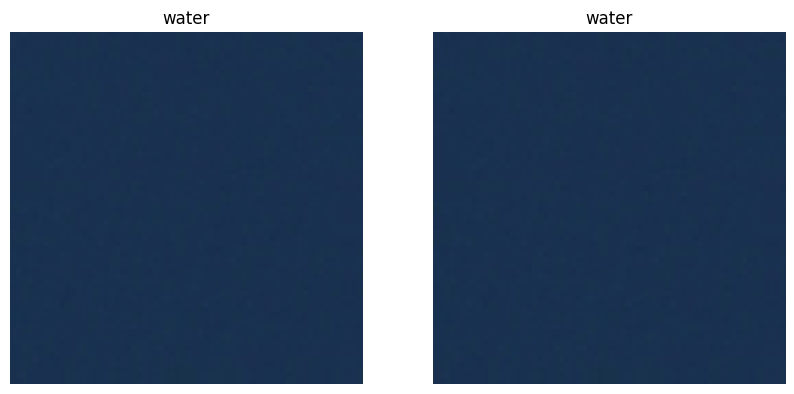

Test image 173 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


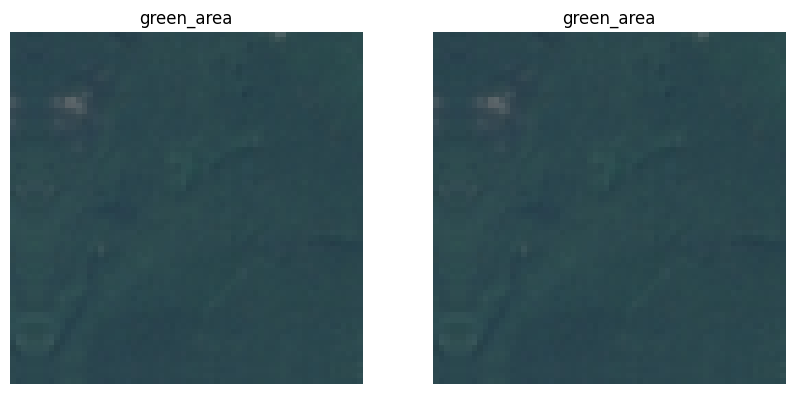

Test image 174 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


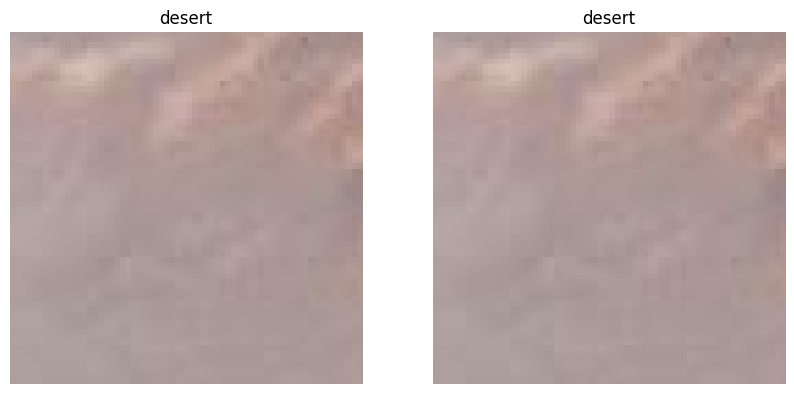

Test image 175 , Result: Wrong Predicted: cloudy , Real Class: desert
Predicted Class Image vs Real Class Image:


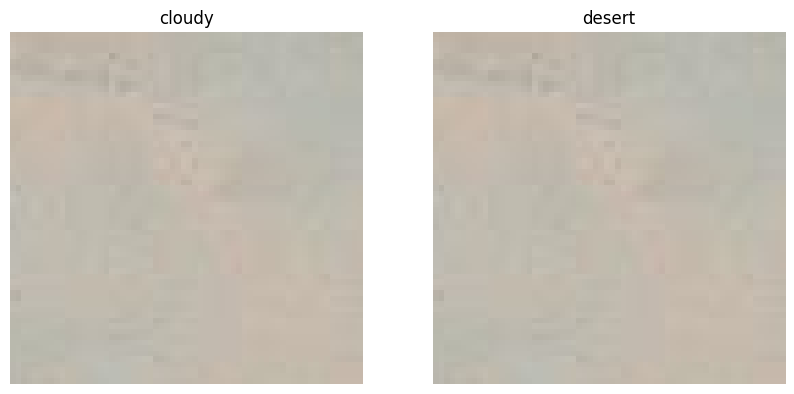

Test image 176 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


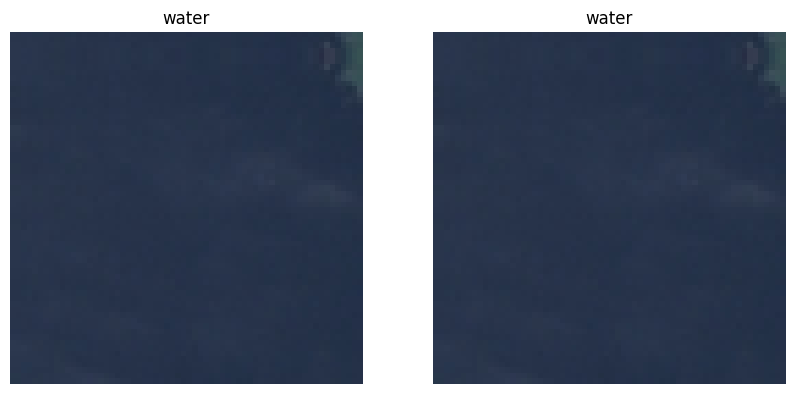

Test image 177 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


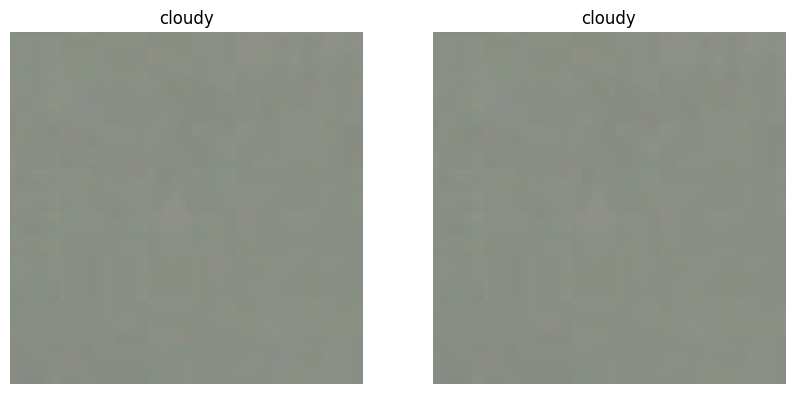

Test image 178 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


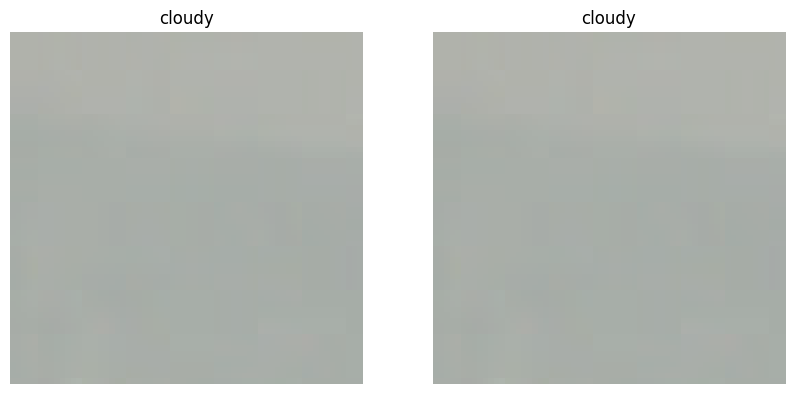

Test image 179 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


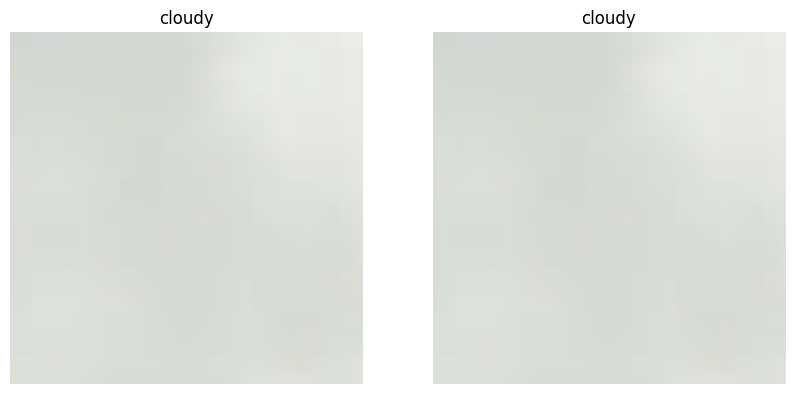

Test image 180 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


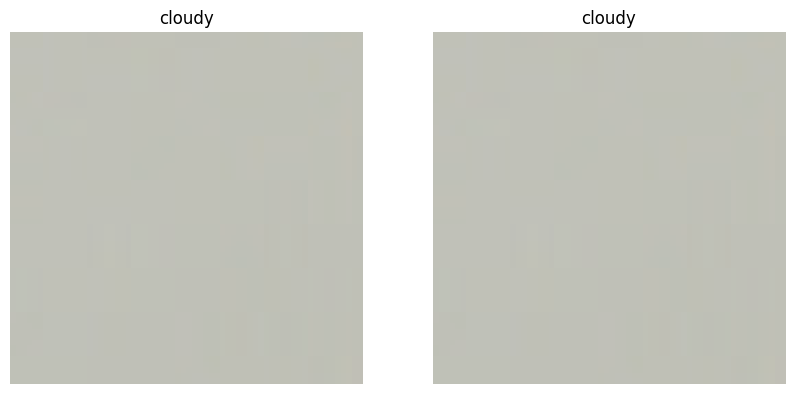

Test image 181 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


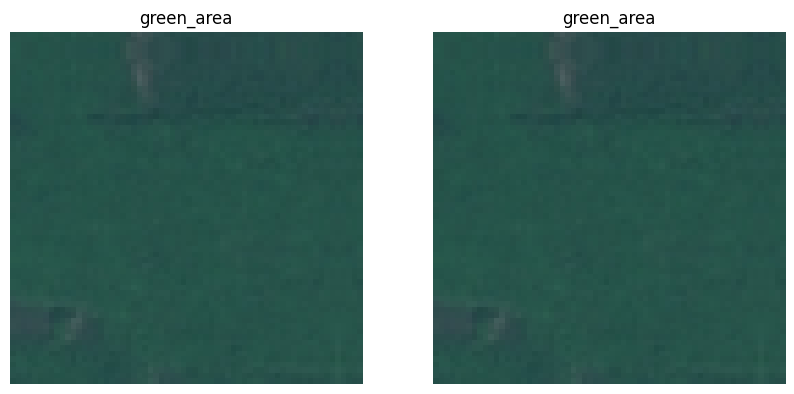

Test image 182 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


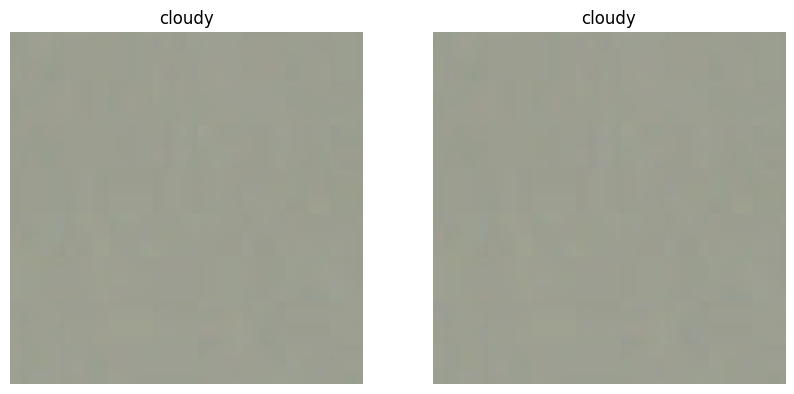

Test image 183 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


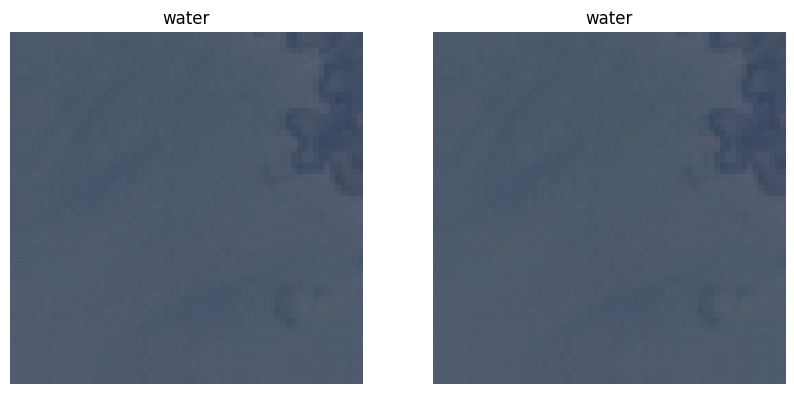

Test image 184 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


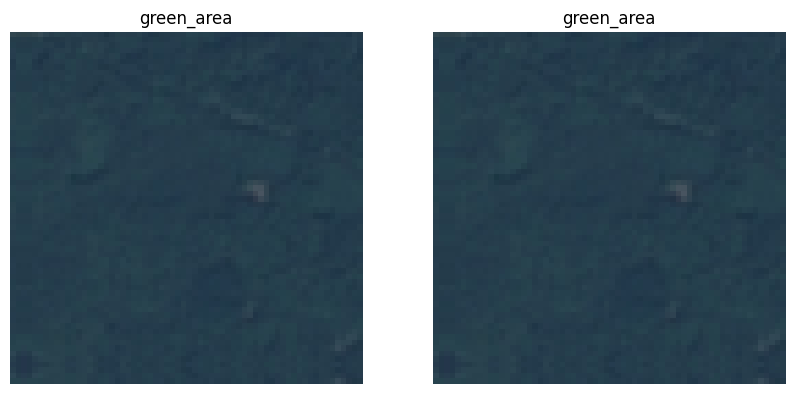

Test image 185 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


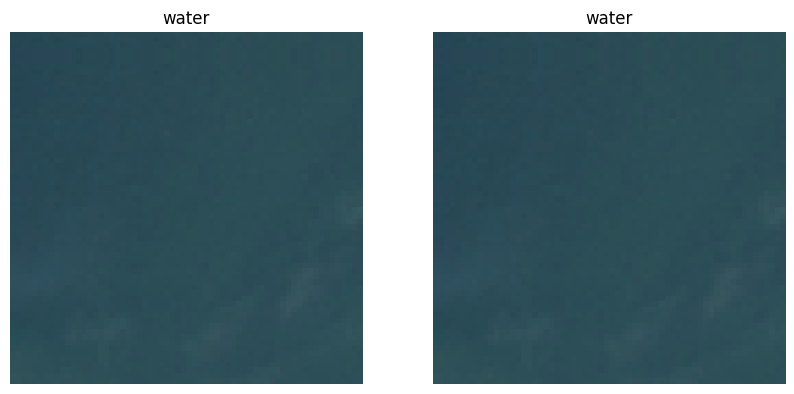

Test image 186 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


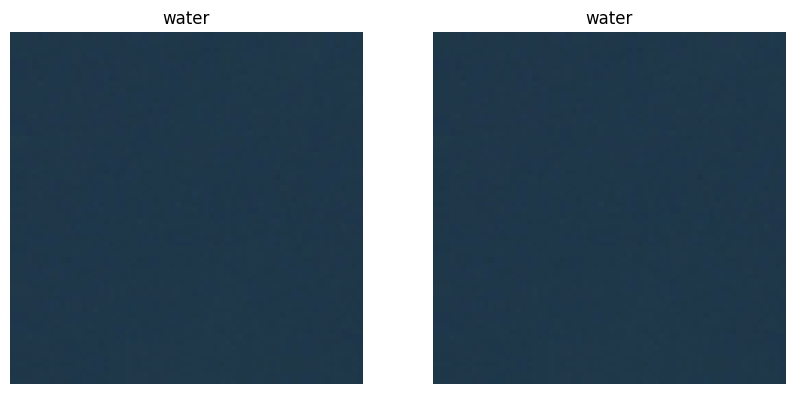

Test image 187 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


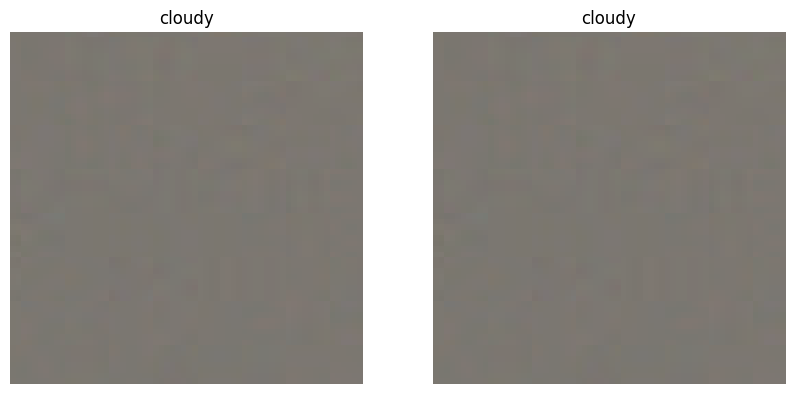

Test image 188 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


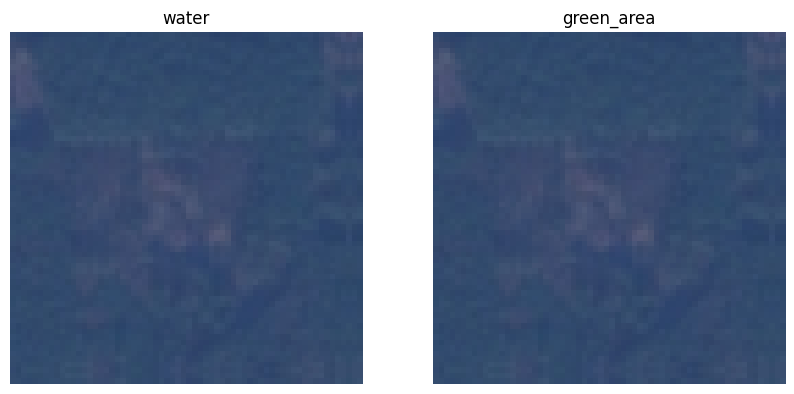

Test image 189 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


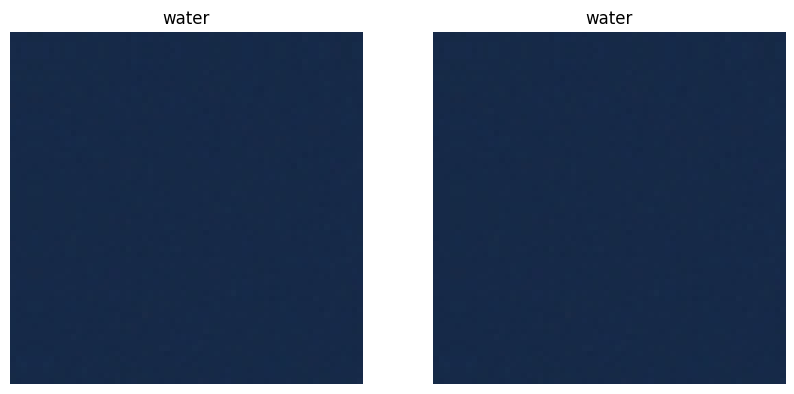

Test image 190 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


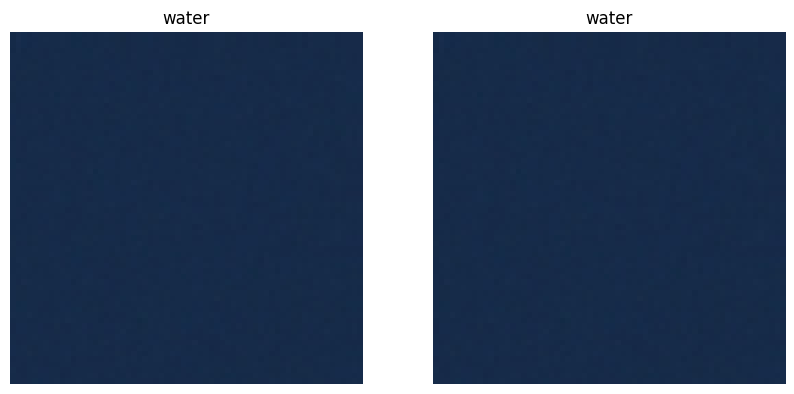

Test image 191 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


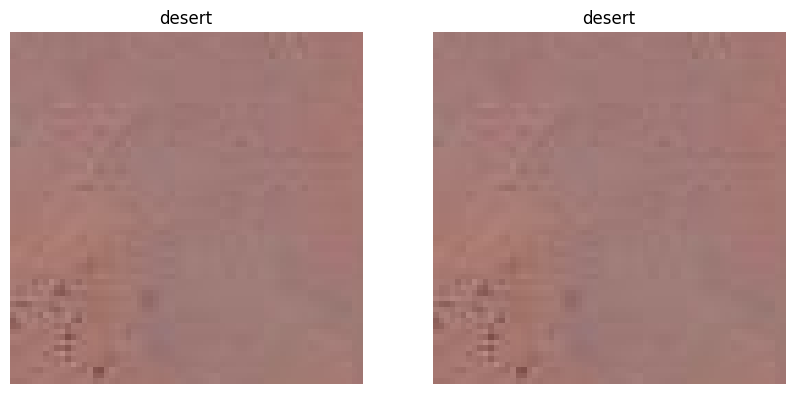

Test image 192 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


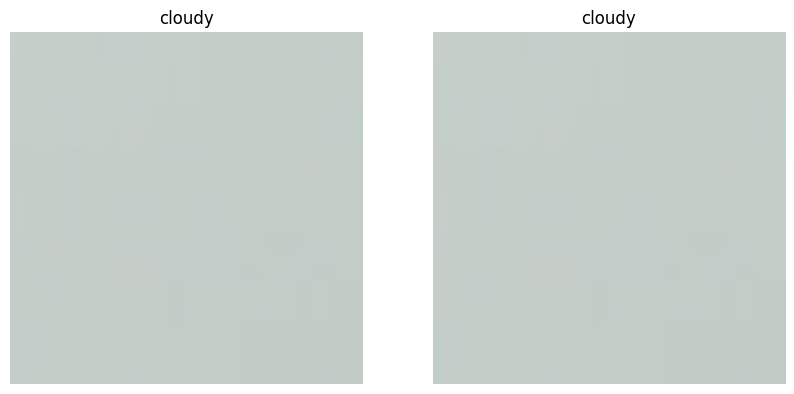

Test image 193 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


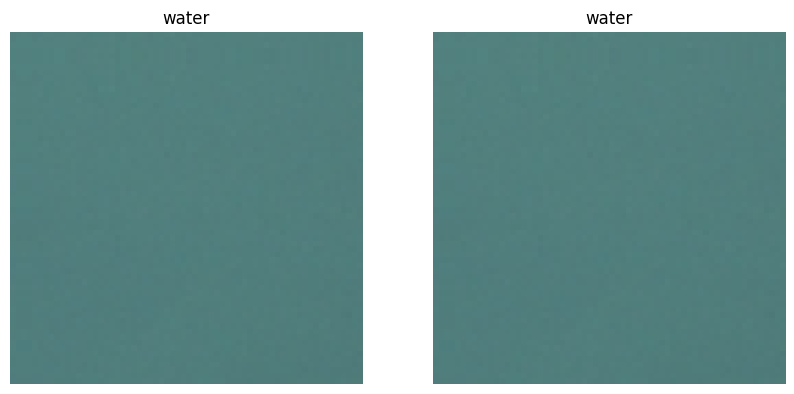

Test image 194 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


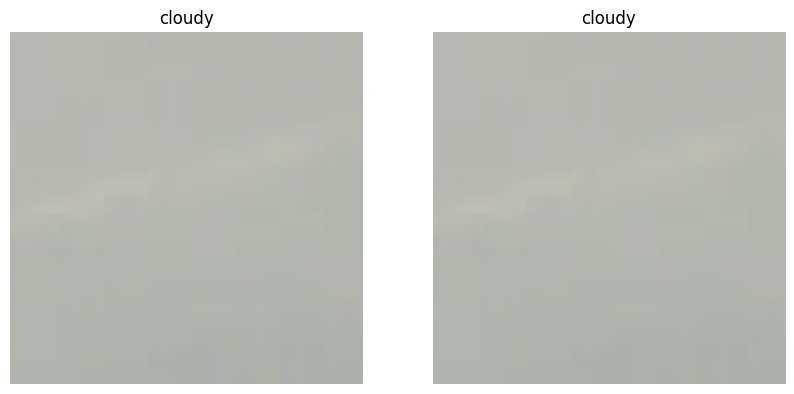

Test image 195 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


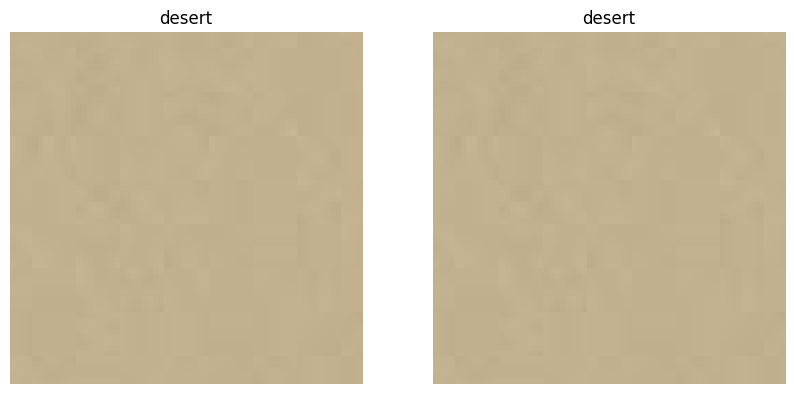

Test image 196 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


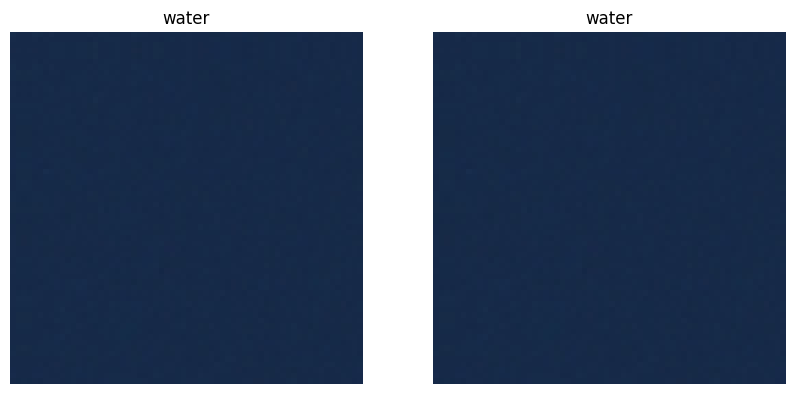

Test image 197 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


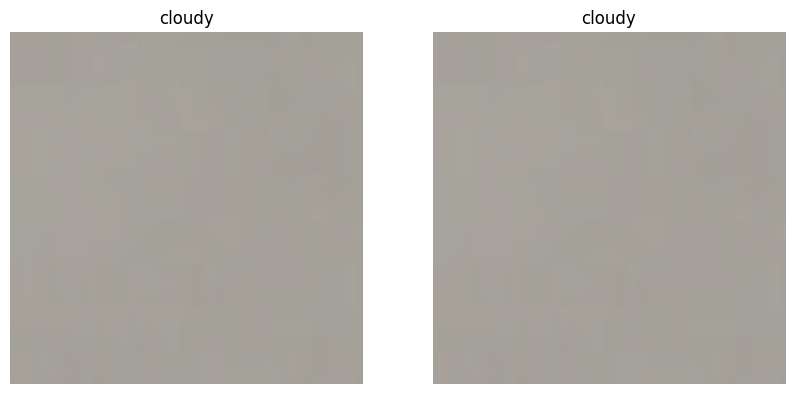

Test image 198 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


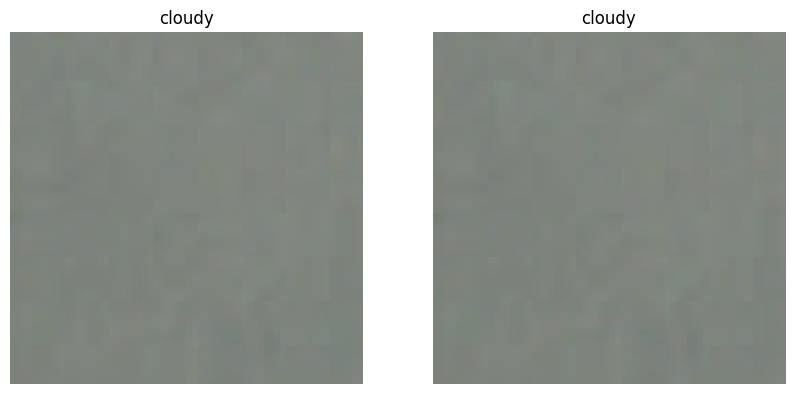

Test image 199 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


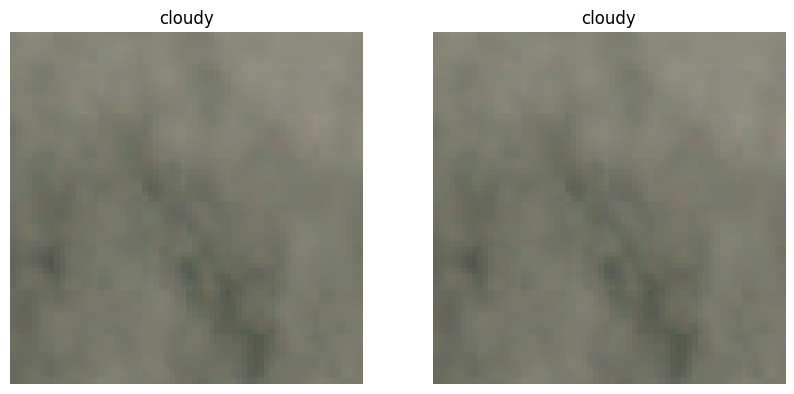

Test image 200 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


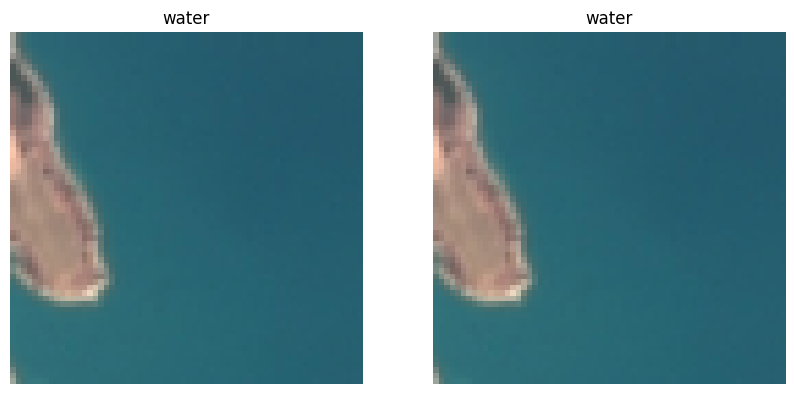

Test image 201 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


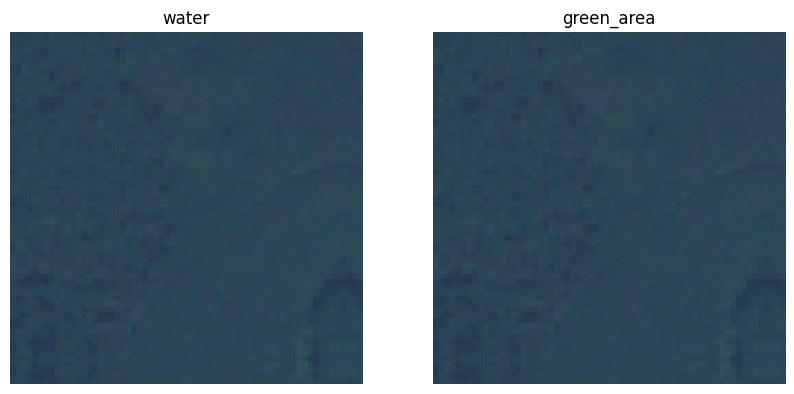

Test image 202 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


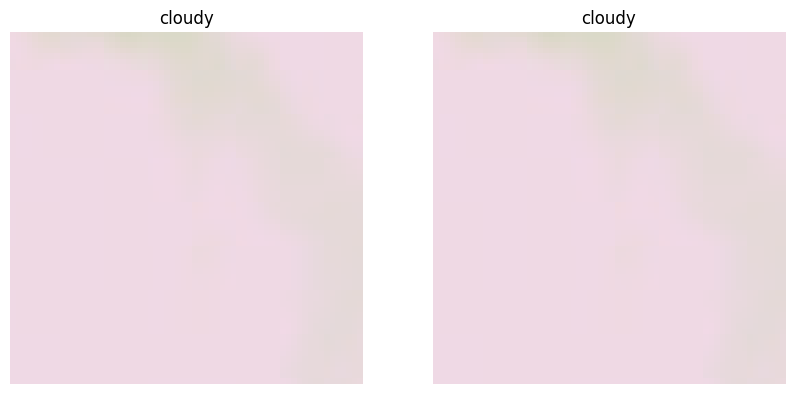

Test image 203 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


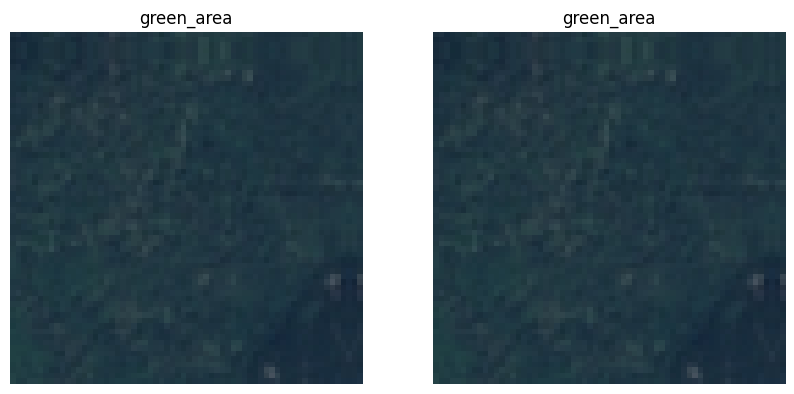

Test image 204 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


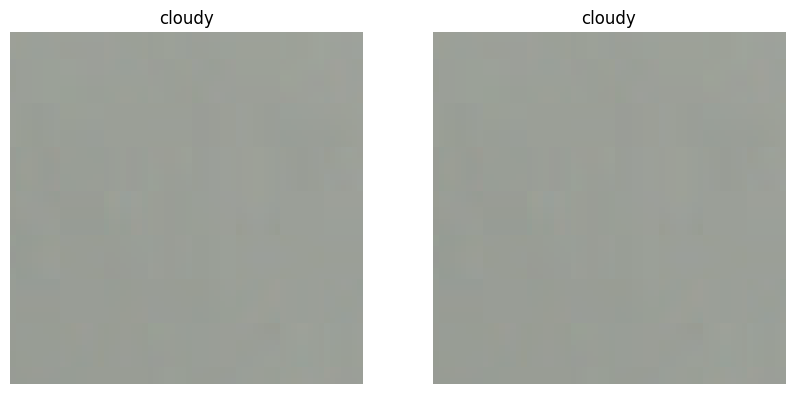

Test image 205 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


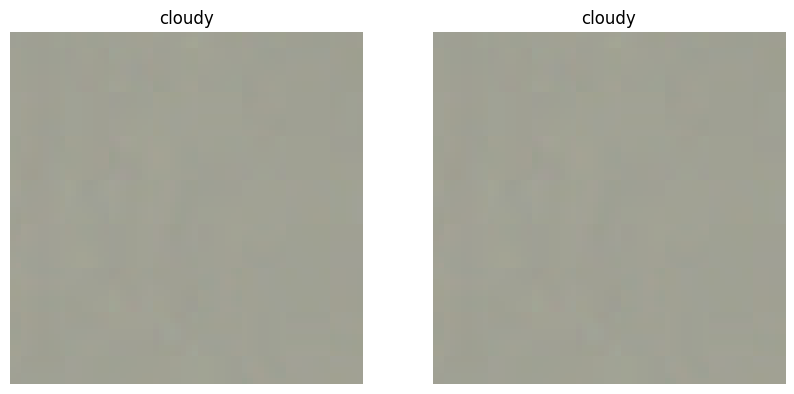

Test image 206 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


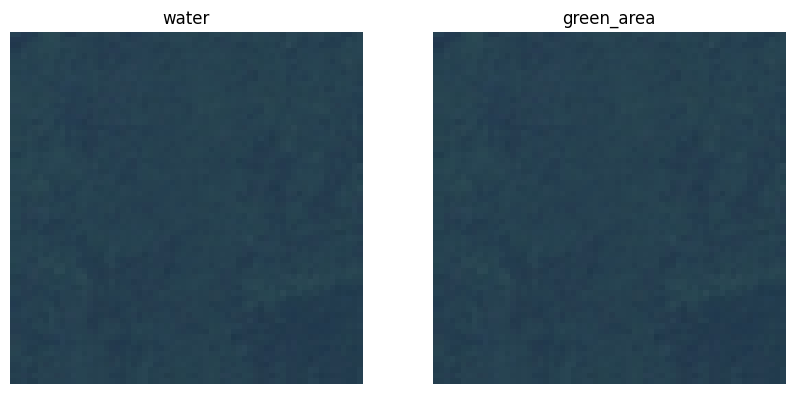

Test image 207 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


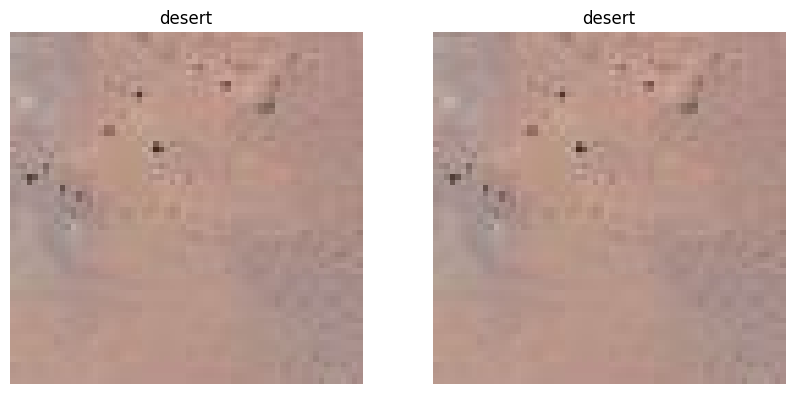

Test image 208 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


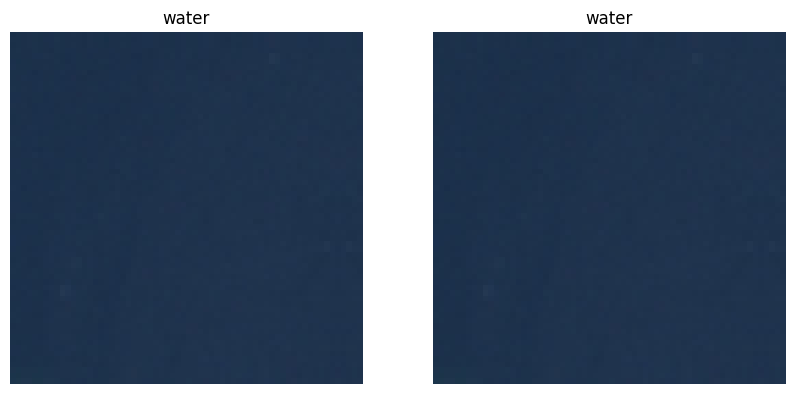

Test image 209 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


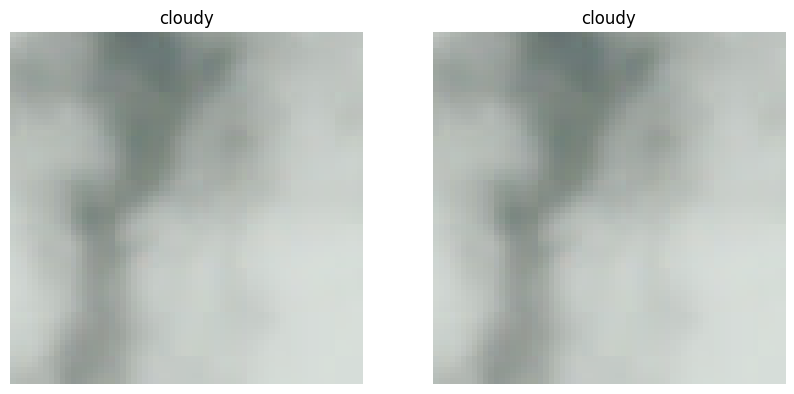

Test image 210 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


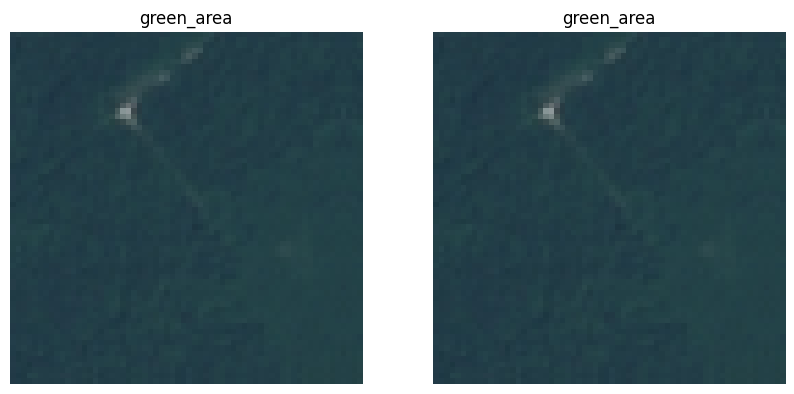

Test image 211 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


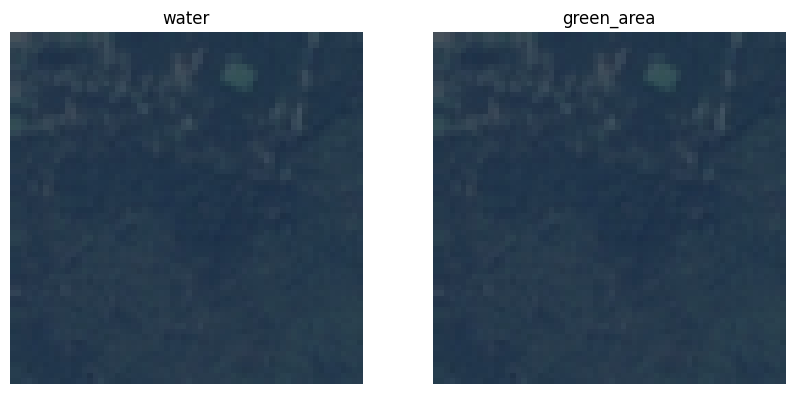

Test image 212 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


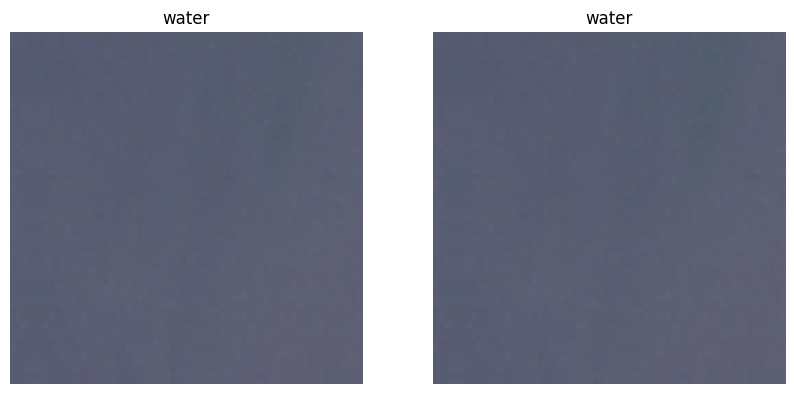

Test image 213 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


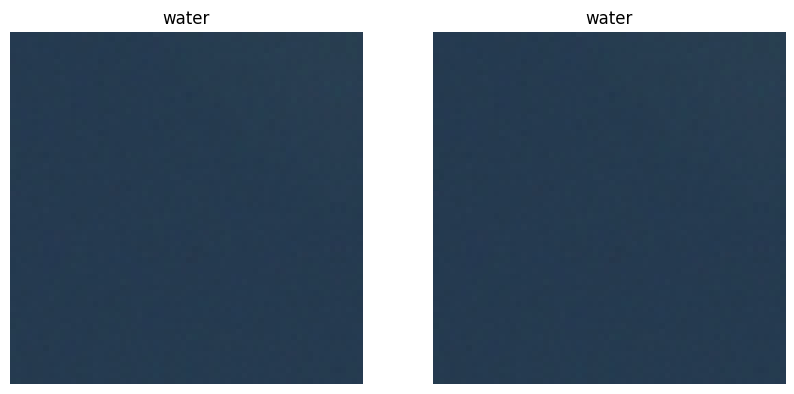

Test image 214 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


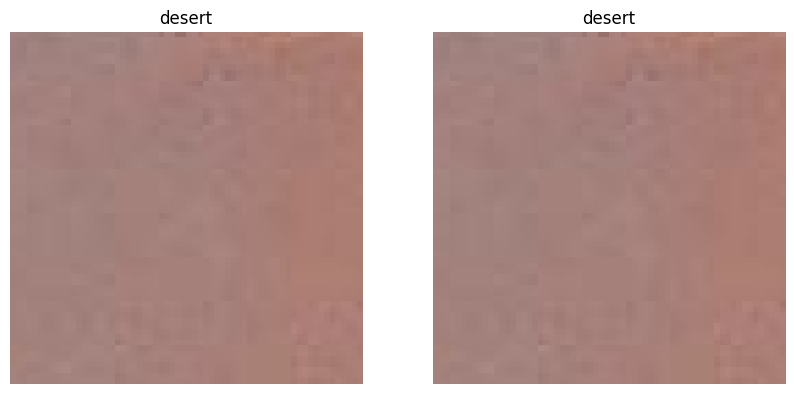

Test image 215 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


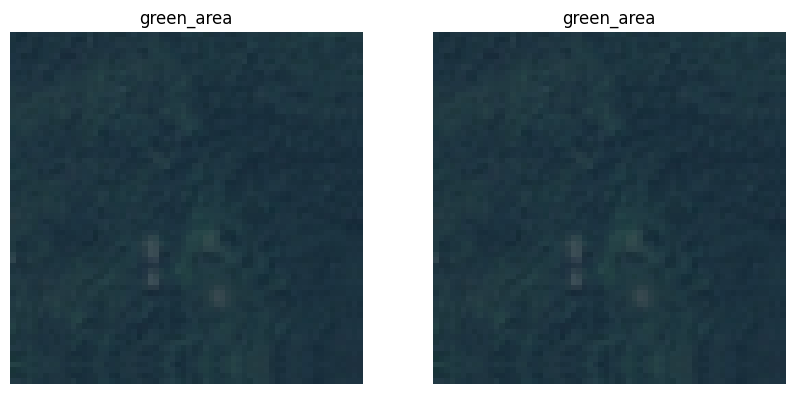

Test image 216 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


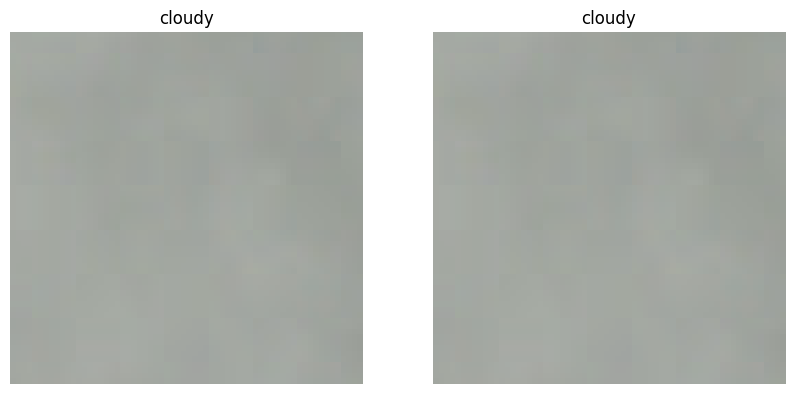

Test image 217 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


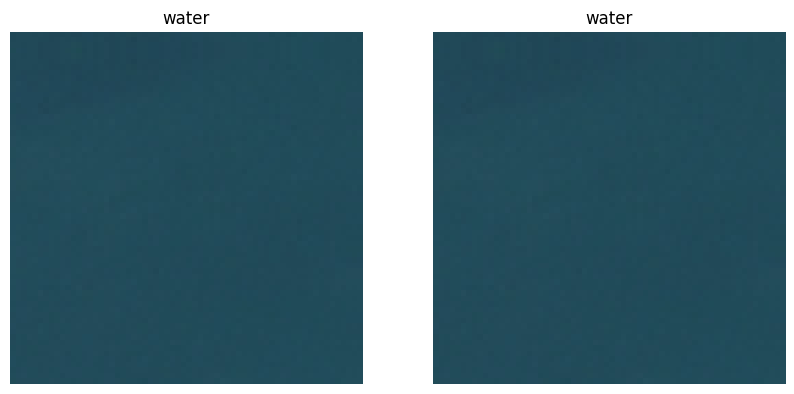

Test image 218 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


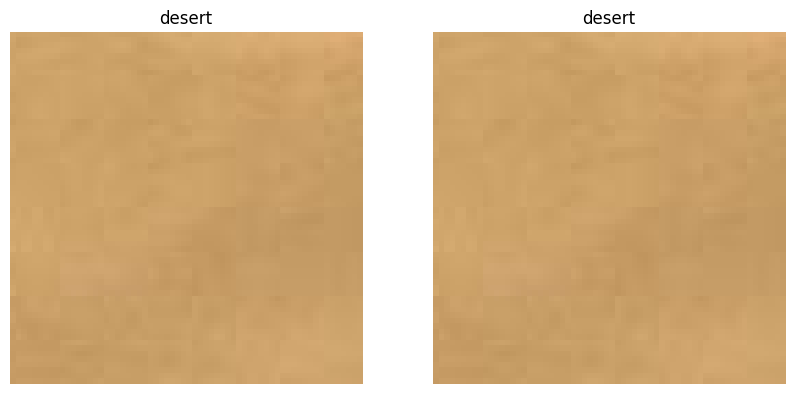

Test image 219 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


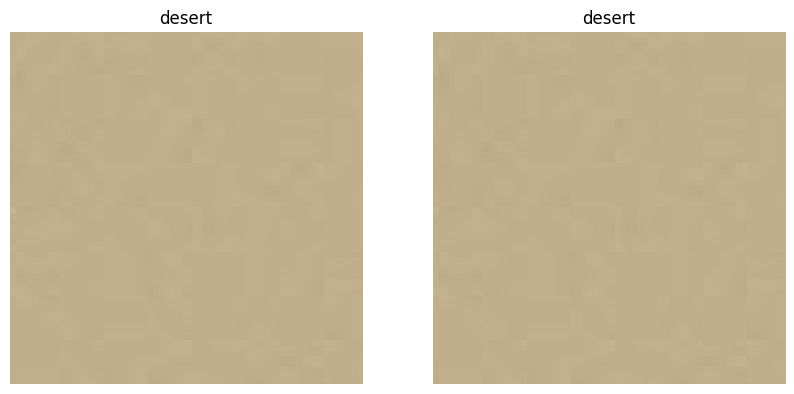

Test image 220 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


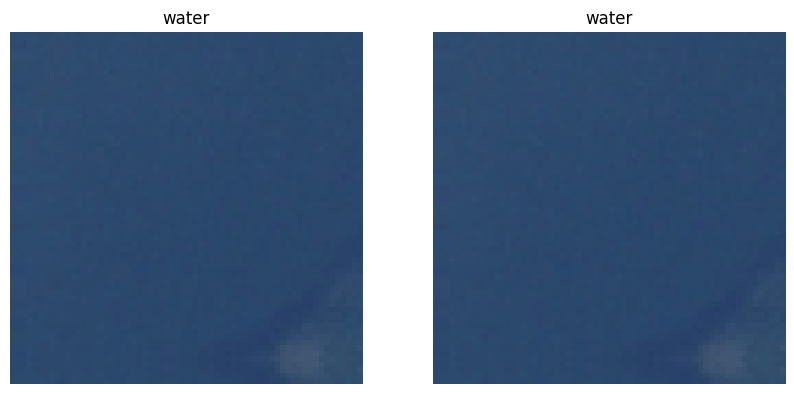

Test image 221 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


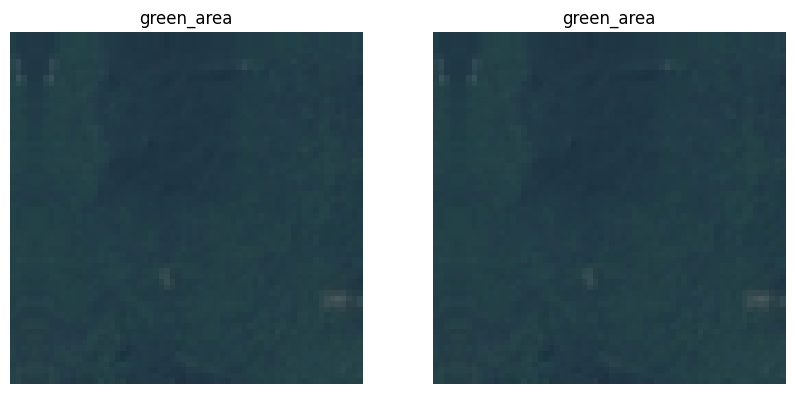

Test image 222 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


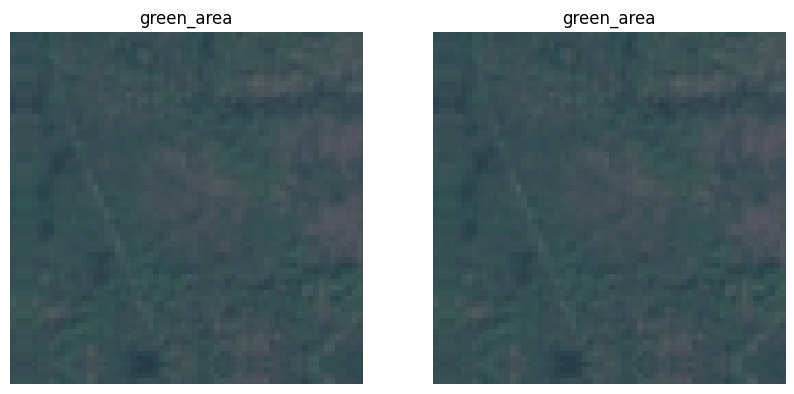

Test image 223 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


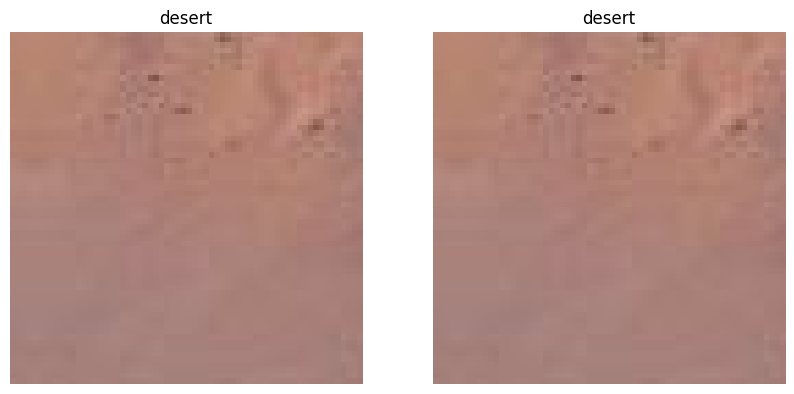

Test image 224 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


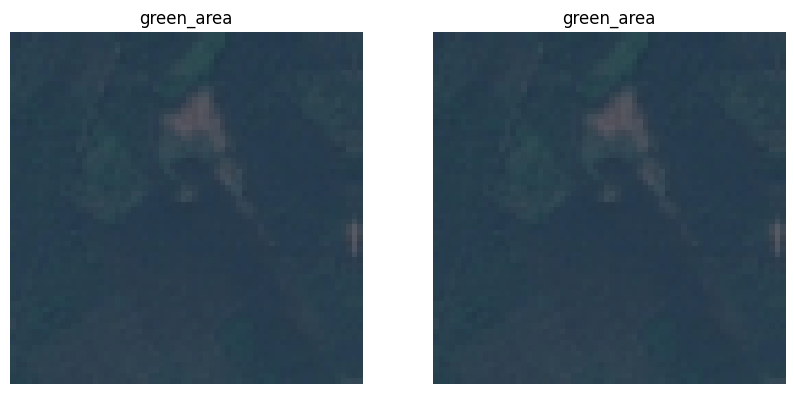

Test image 225 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


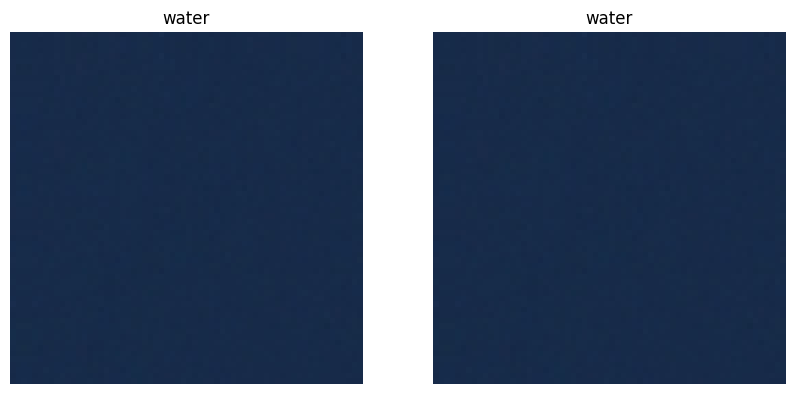

Test image 226 , Result: Wrong Predicted: cloudy , Real Class: desert
Predicted Class Image vs Real Class Image:


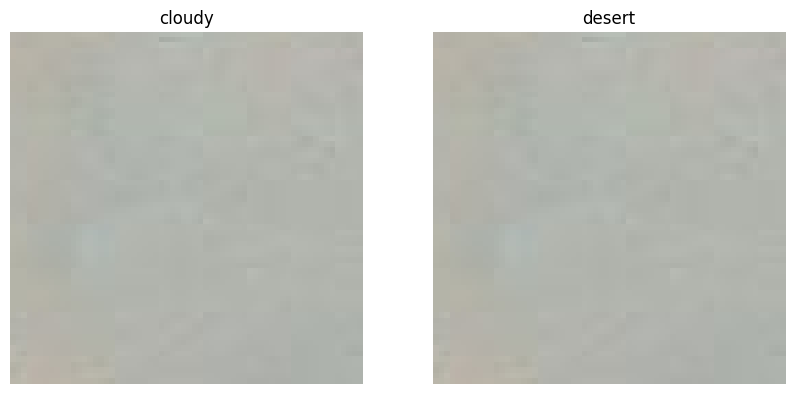

Test image 227 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


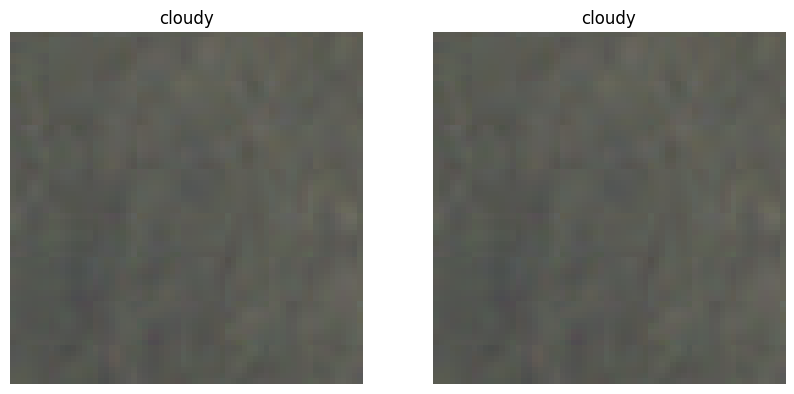

Test image 228 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


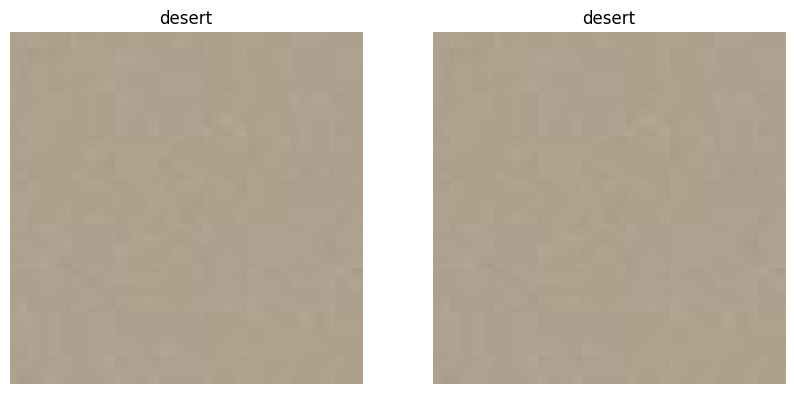

Test image 229 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


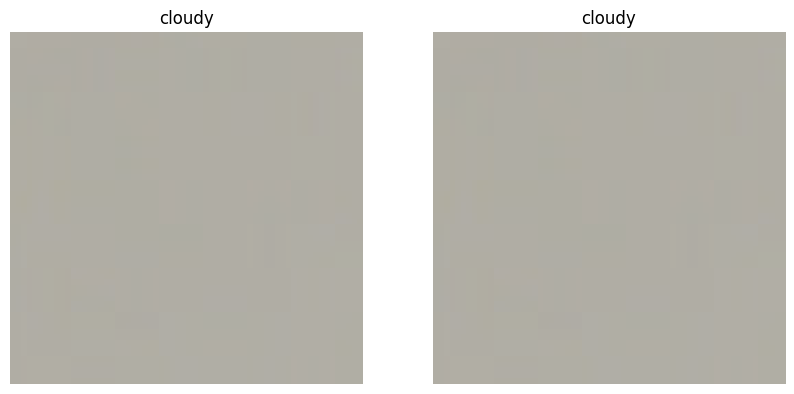

Test image 230 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


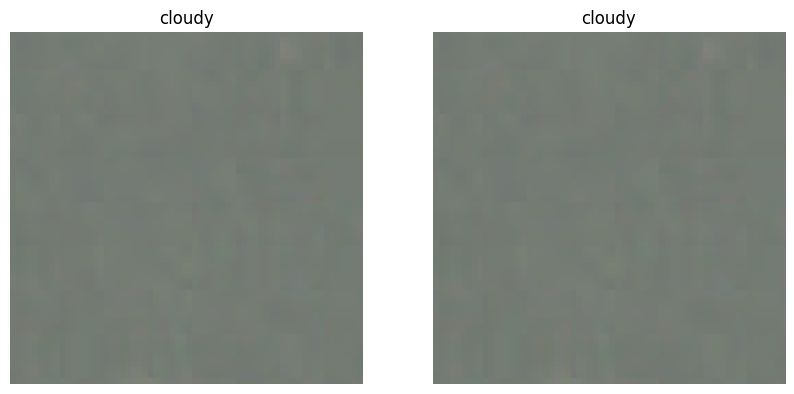

Test image 231 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


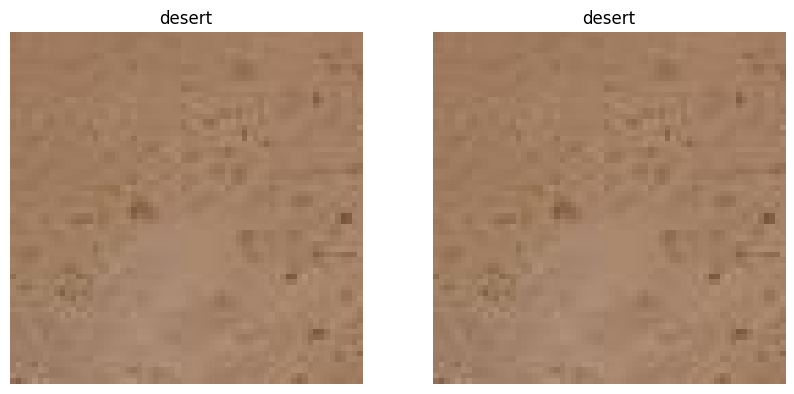

Test image 232 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


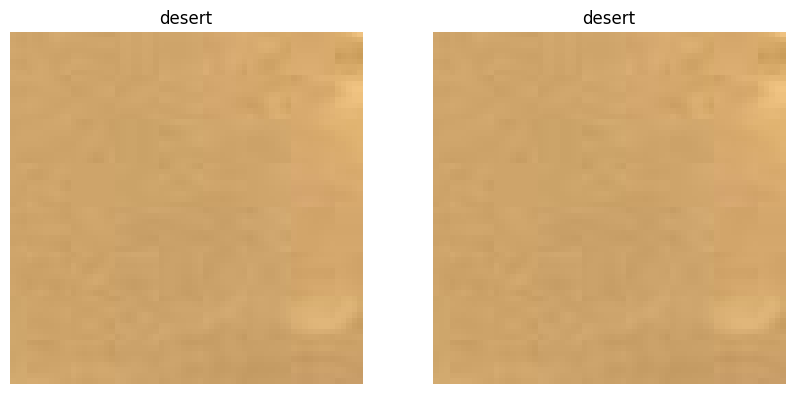

Test image 233 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


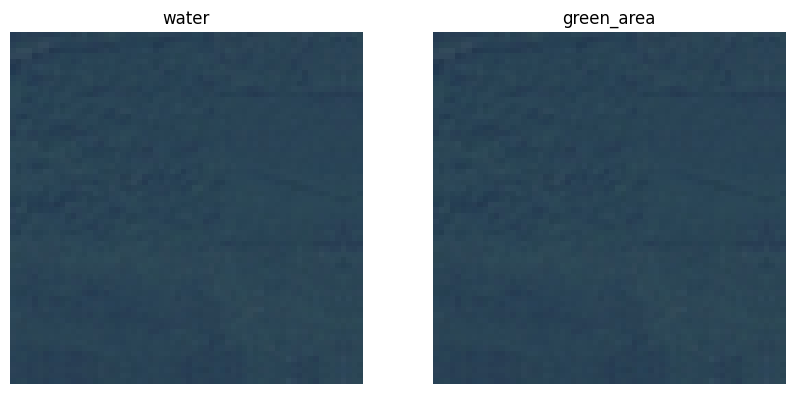

Test image 234 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


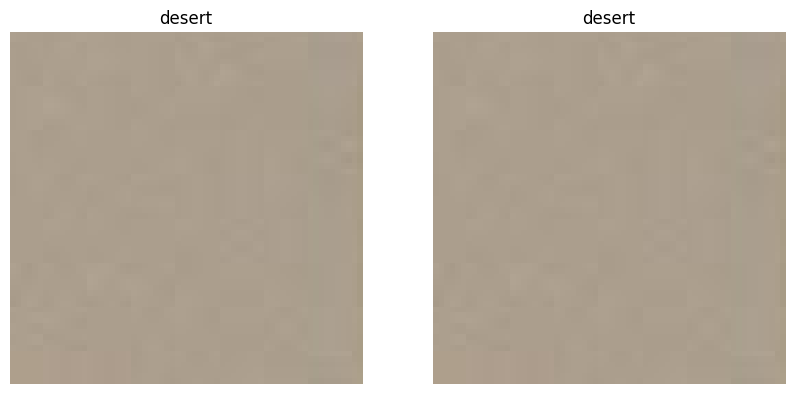

Test image 235 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


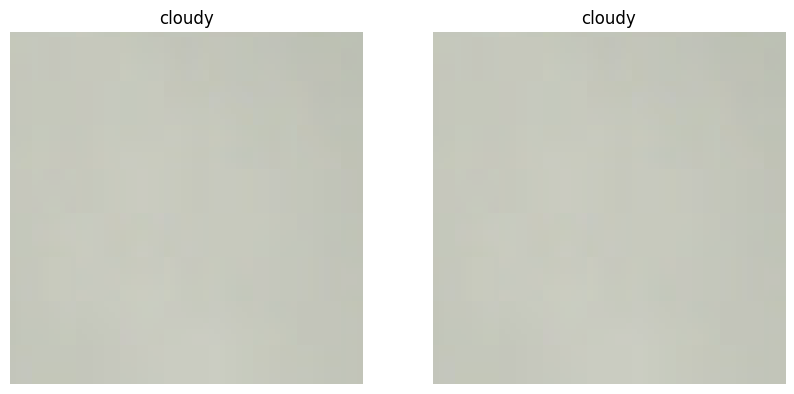

Test image 236 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


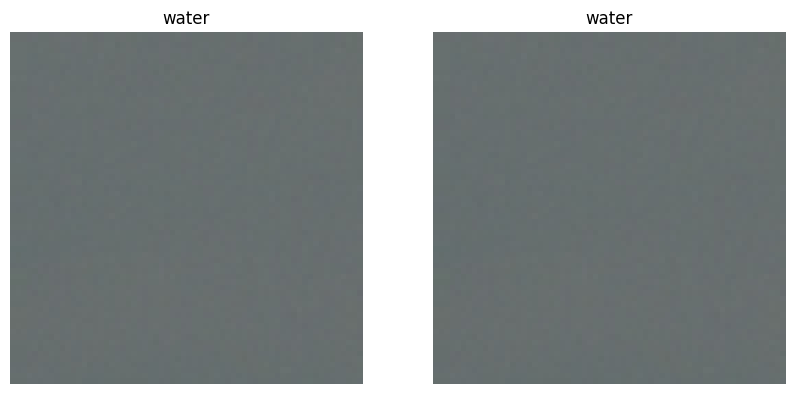

Test image 237 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


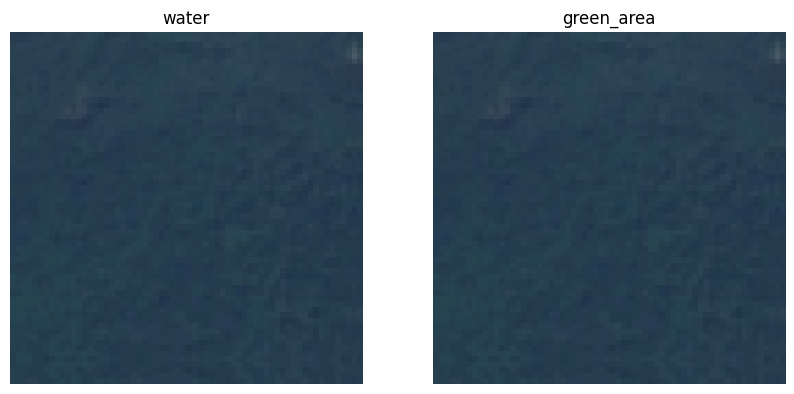

Test image 238 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


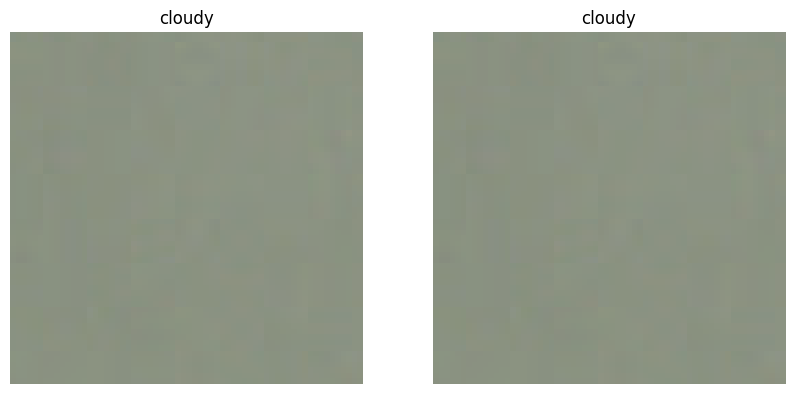

Test image 239 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


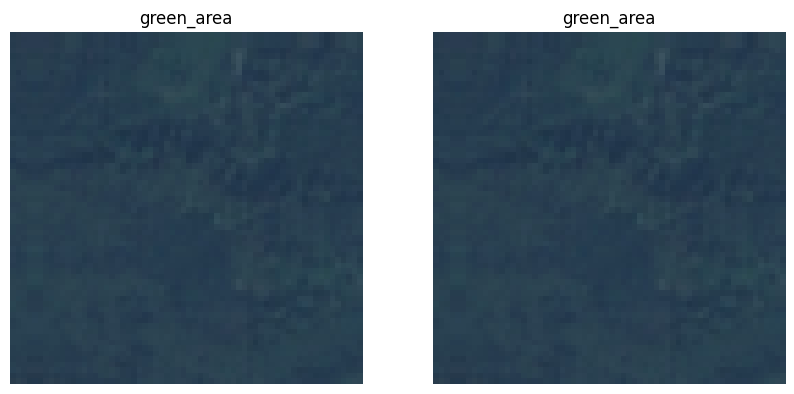

Test image 240 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


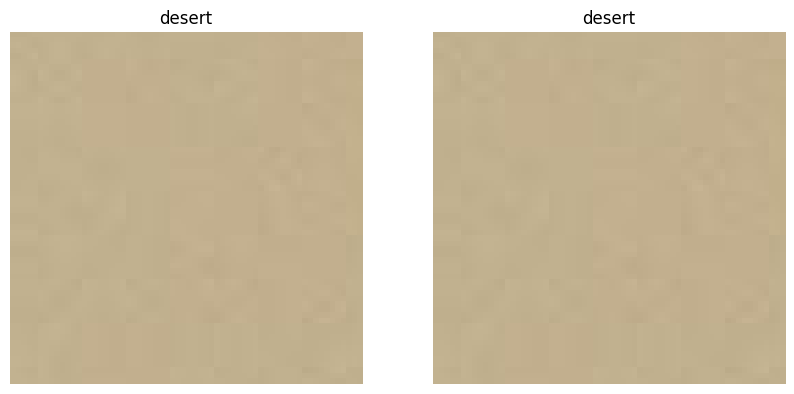

Test image 241 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


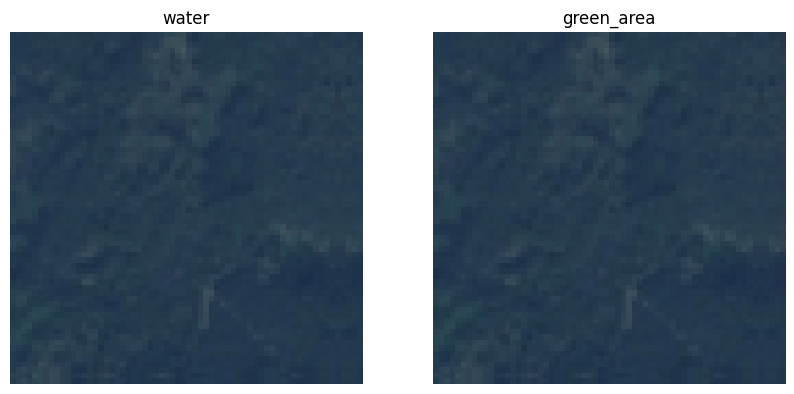

Test image 242 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


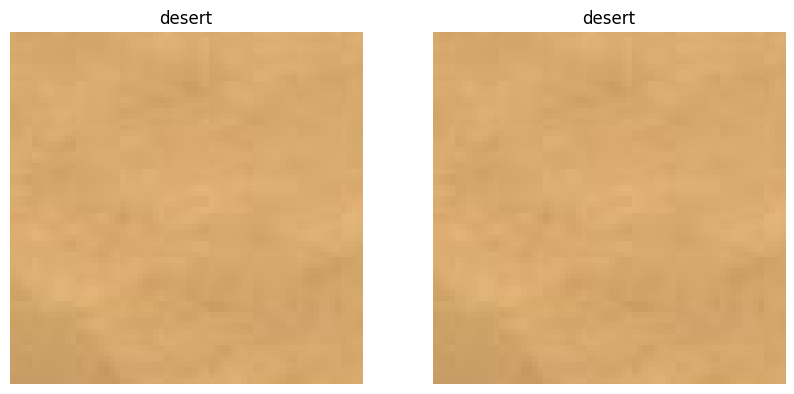

Test image 243 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


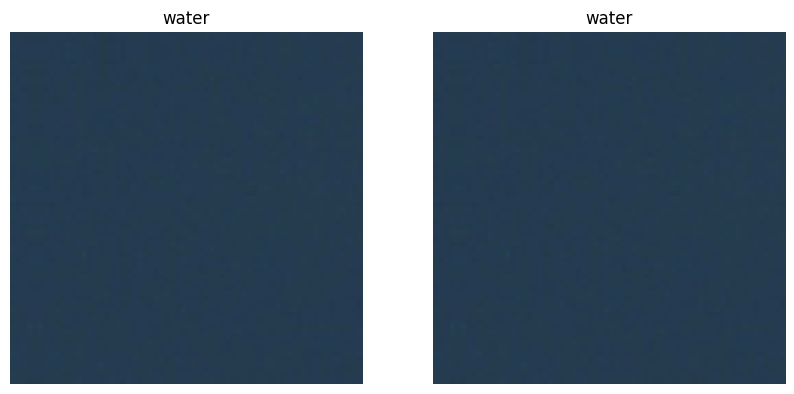

Test image 244 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


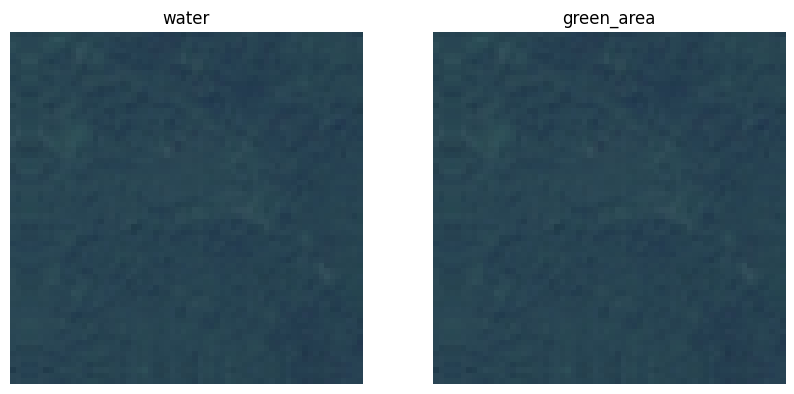

Test image 245 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


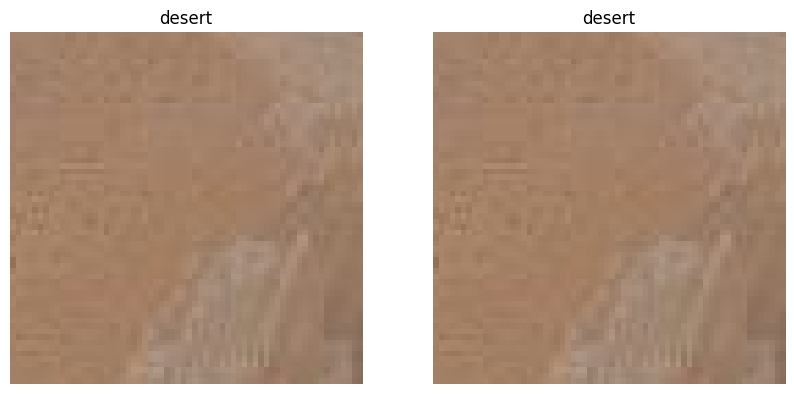

Test image 246 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


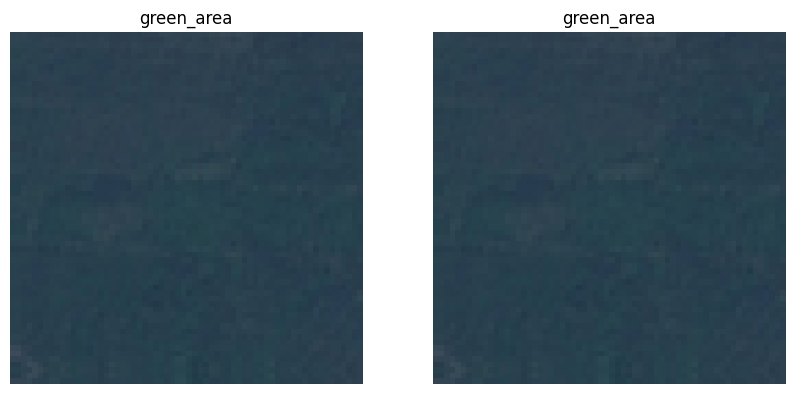

Test image 247 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


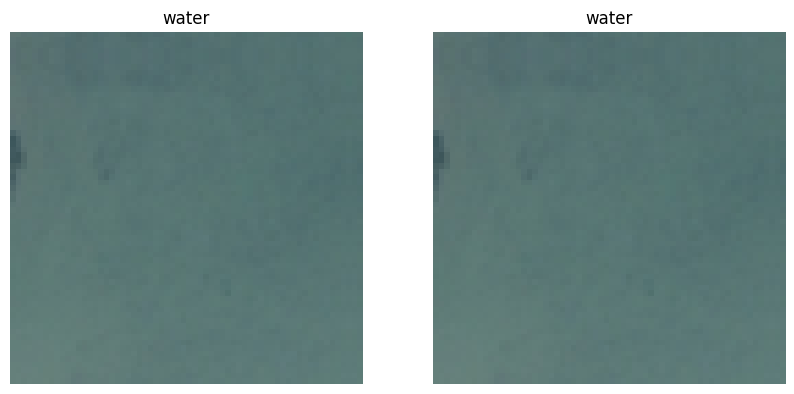

Test image 248 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


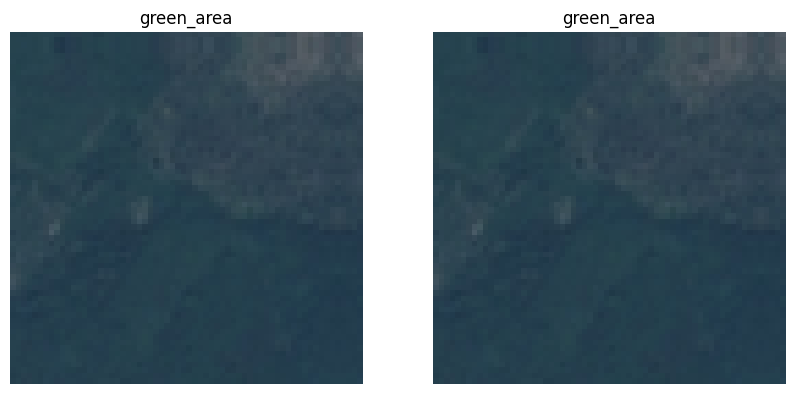

Test image 249 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


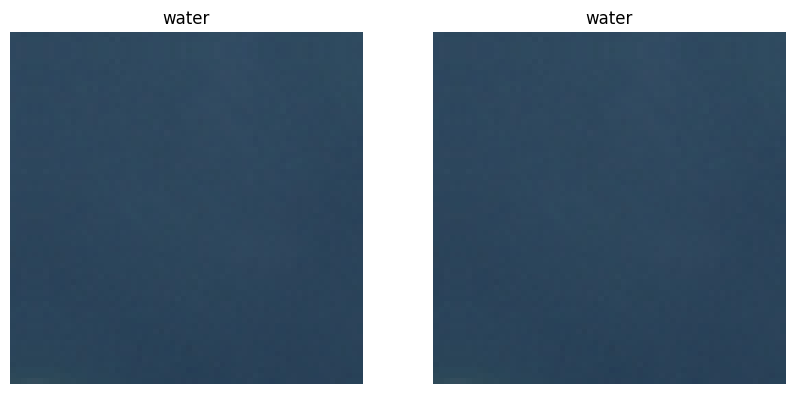

Test image 250 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


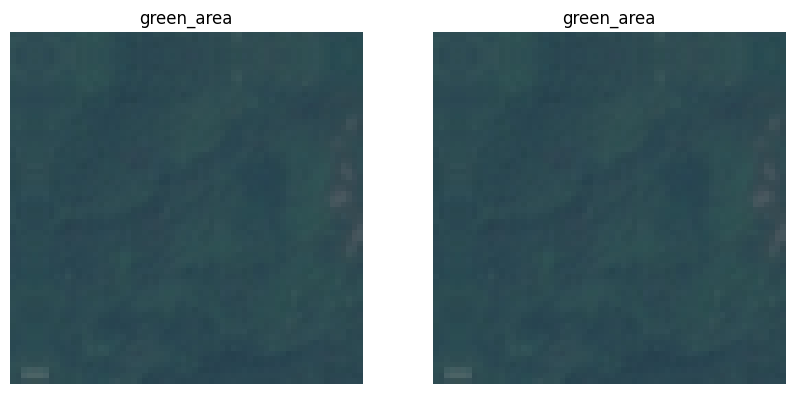

Test image 251 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


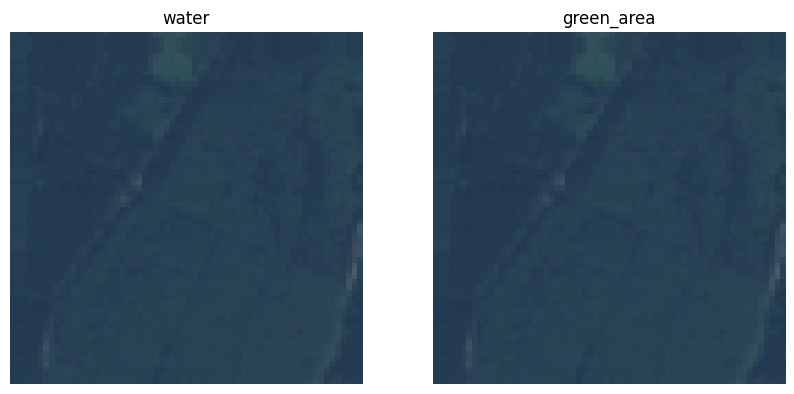

Test image 252 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


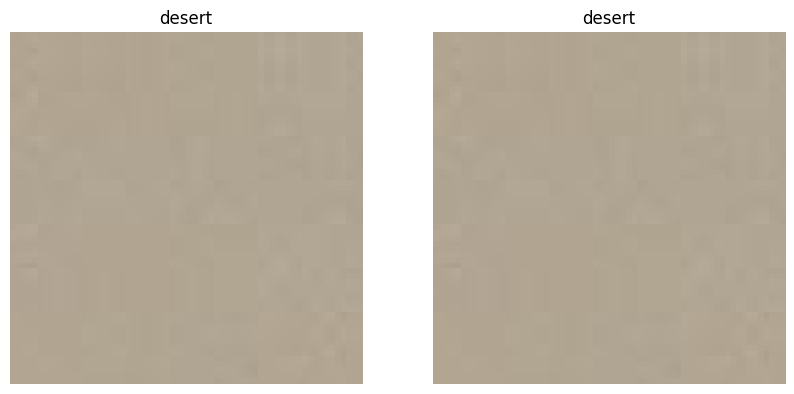

Test image 253 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


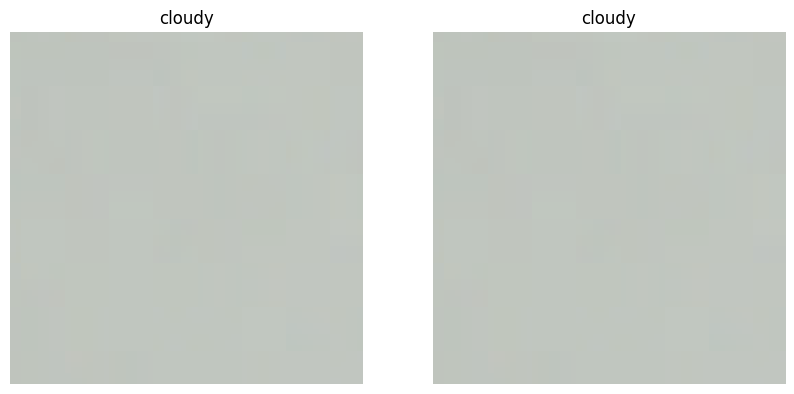

Test image 254 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


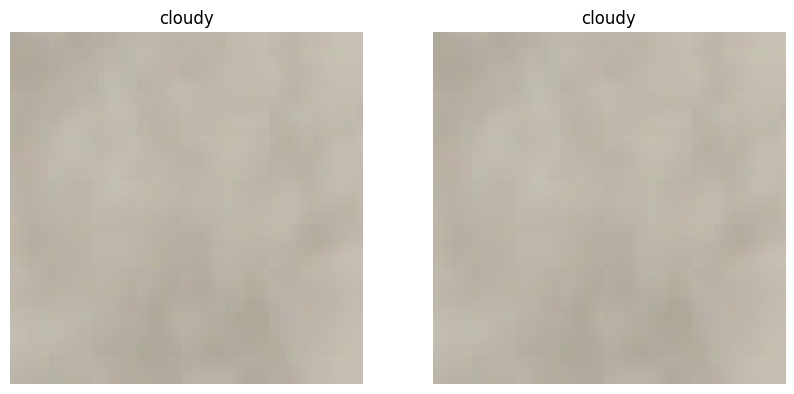

Test image 255 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


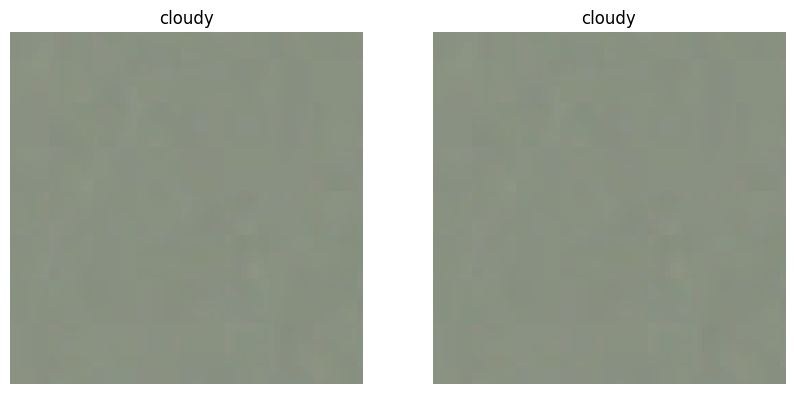

Test image 256 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


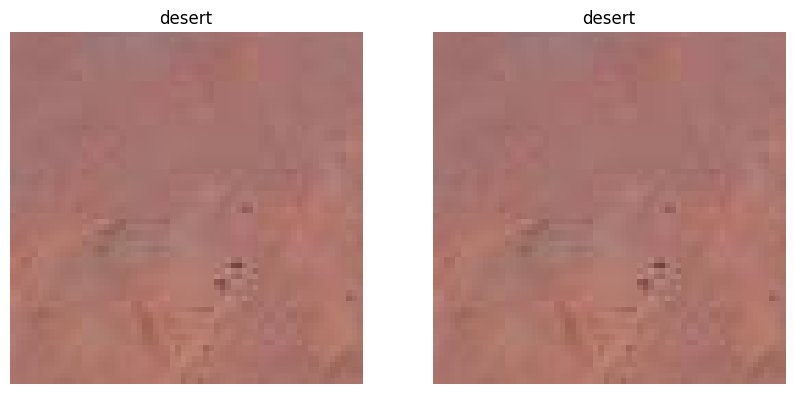

Test image 257 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


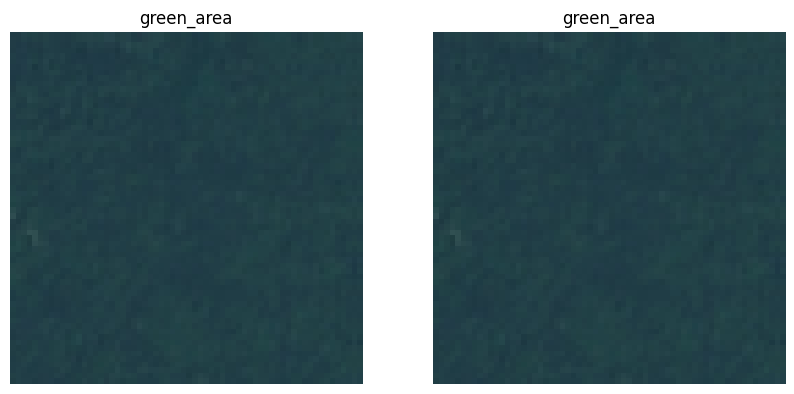

Test image 258 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


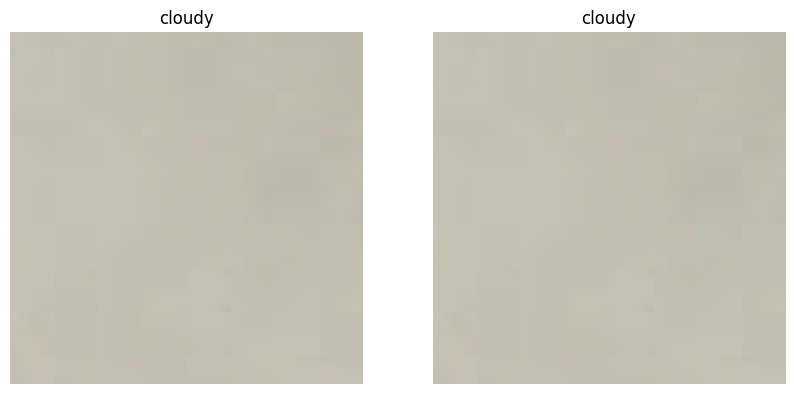

Test image 259 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


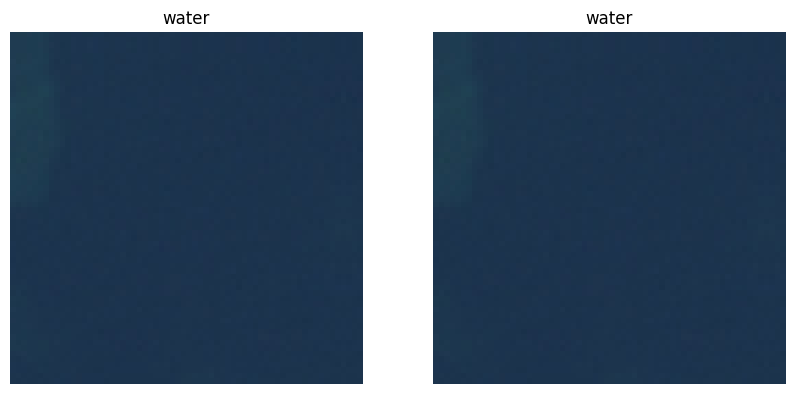

Test image 260 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


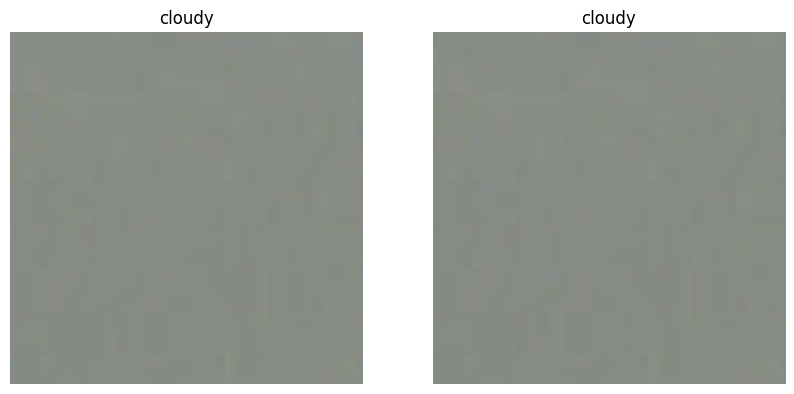

Test image 261 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


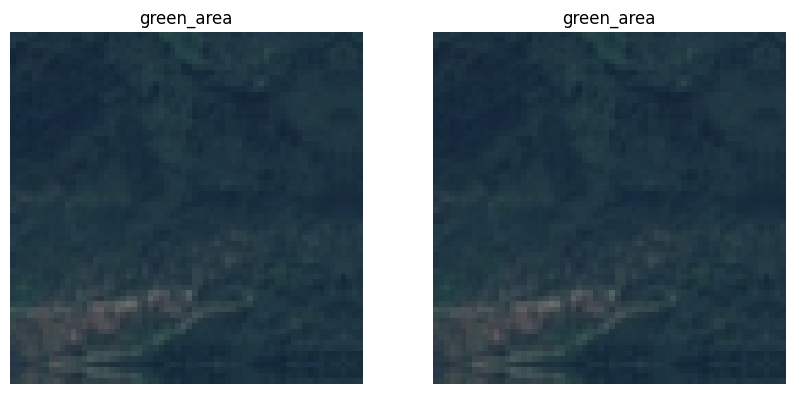

Test image 262 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


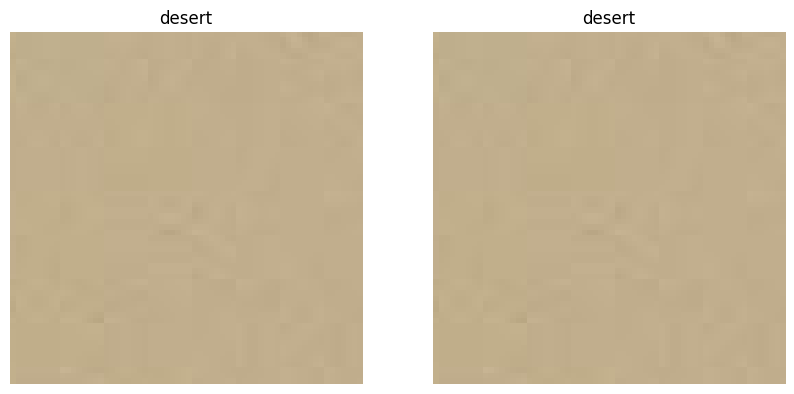

Test image 263 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


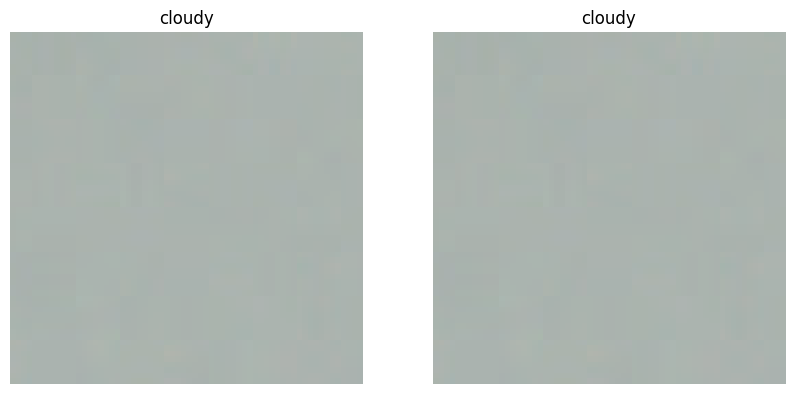

Test image 264 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


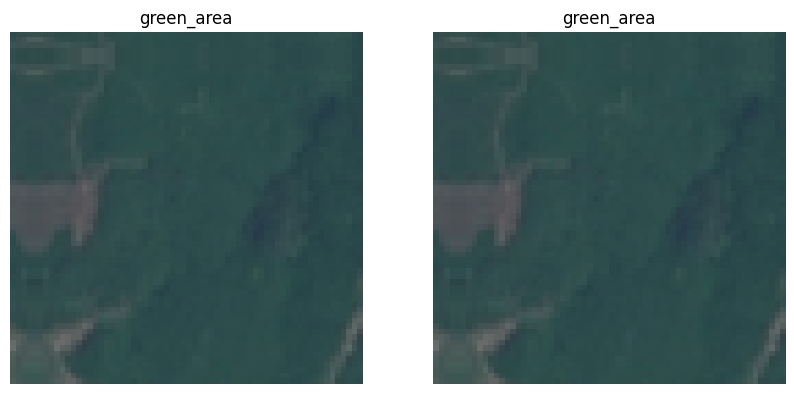

Test image 265 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


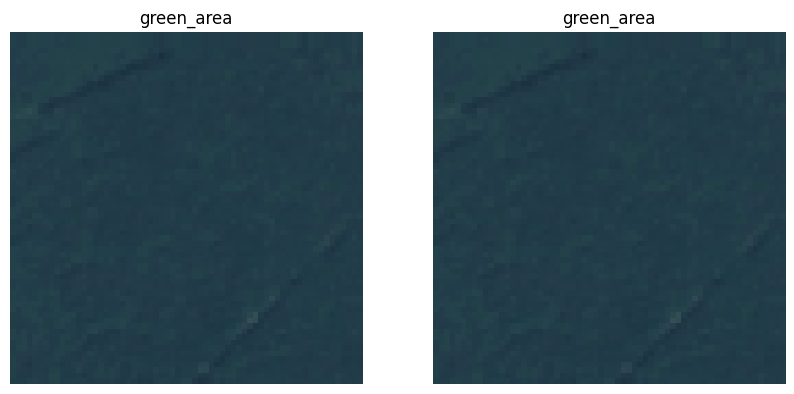

Test image 266 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


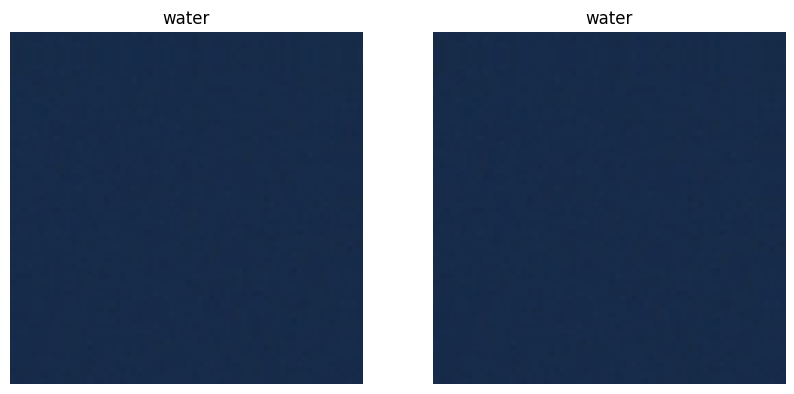

Test image 267 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


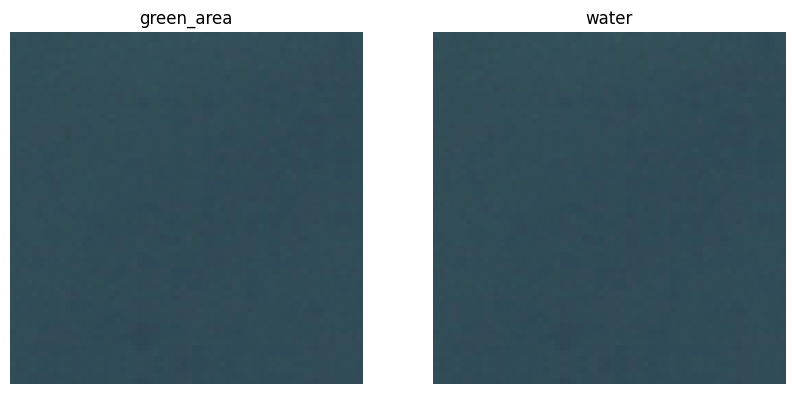

Test image 268 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


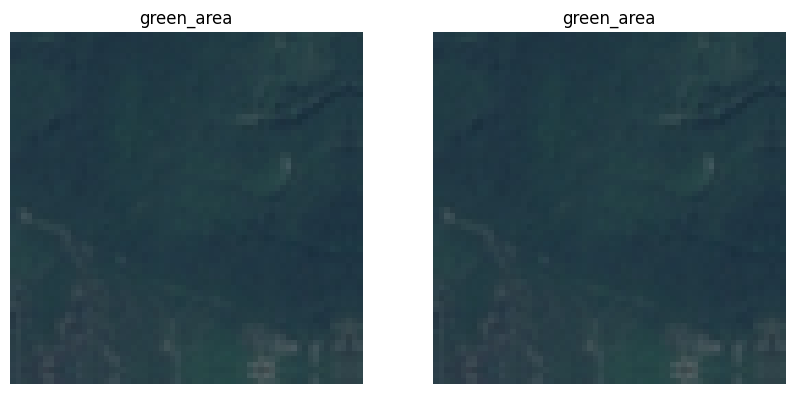

Test image 269 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


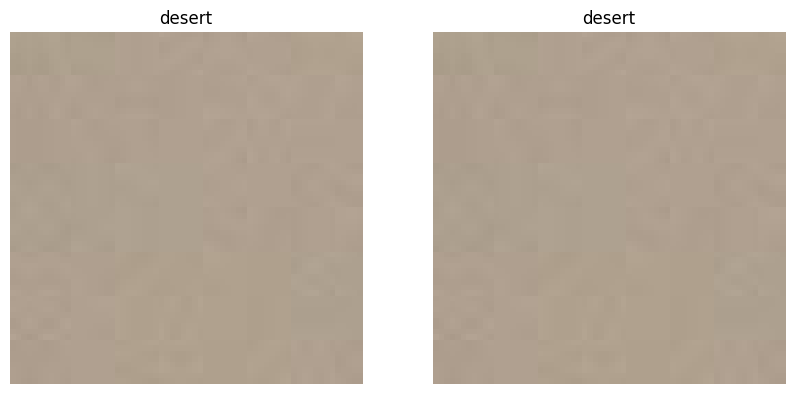

Test image 270 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


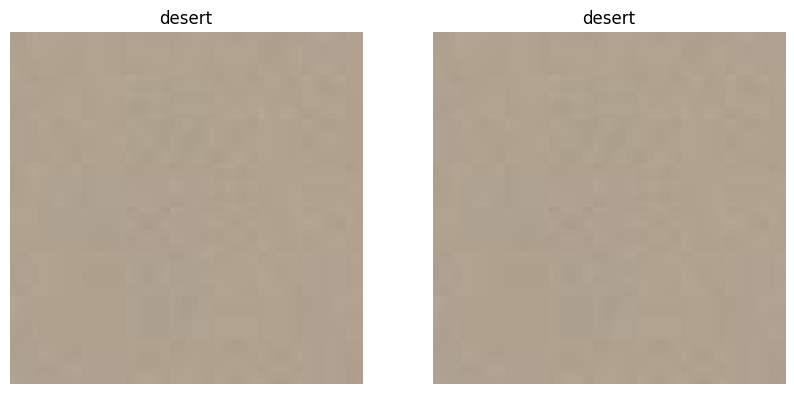

Test image 271 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


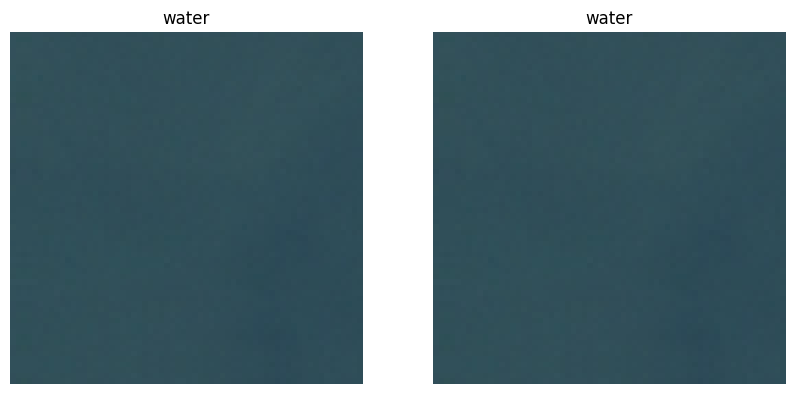

Test image 272 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


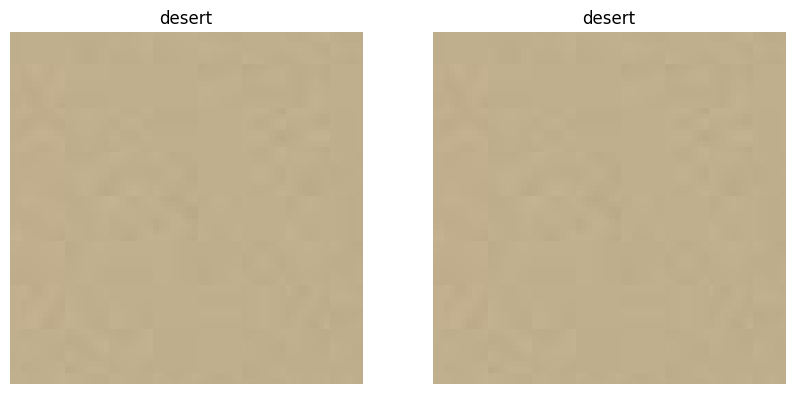

Test image 273 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


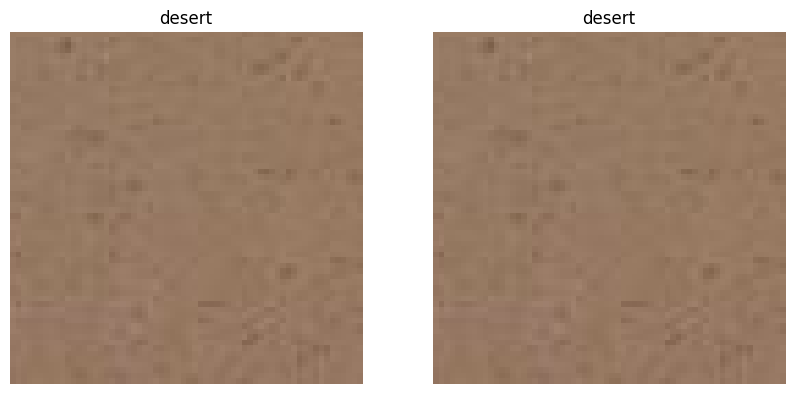

Test image 274 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


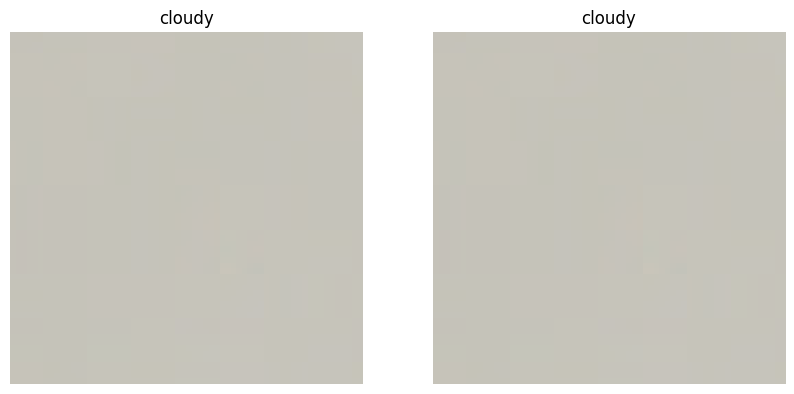

Test image 275 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


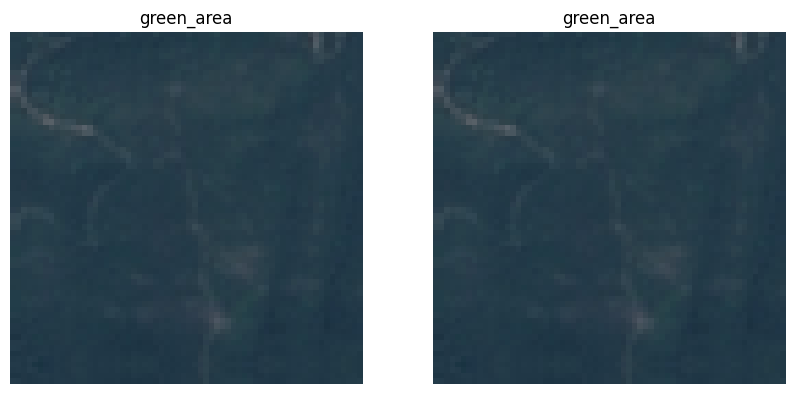

Test image 276 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


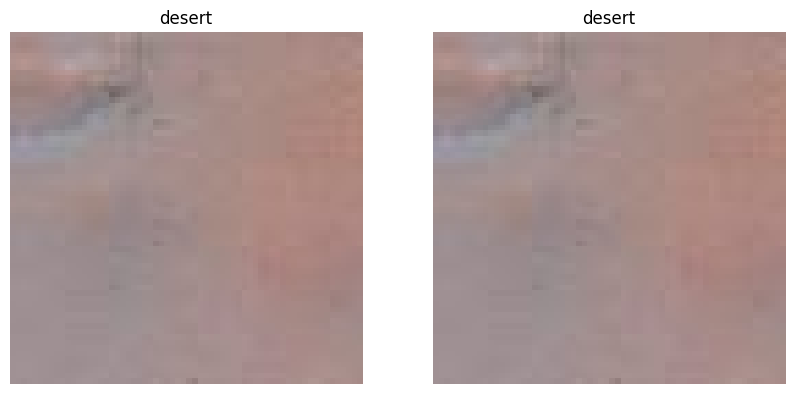

Test image 277 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


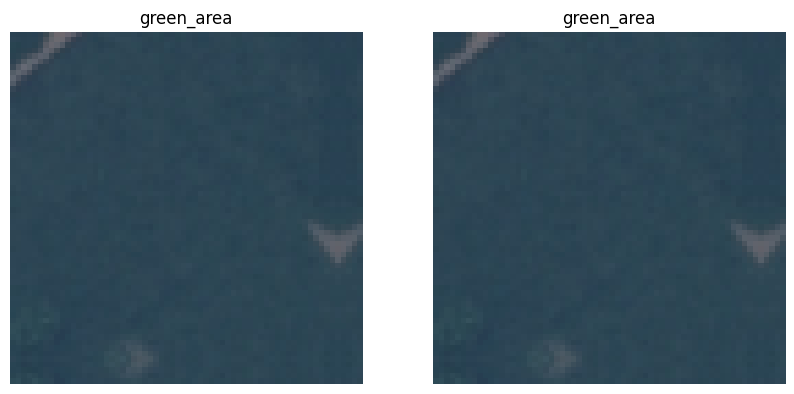

Test image 278 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


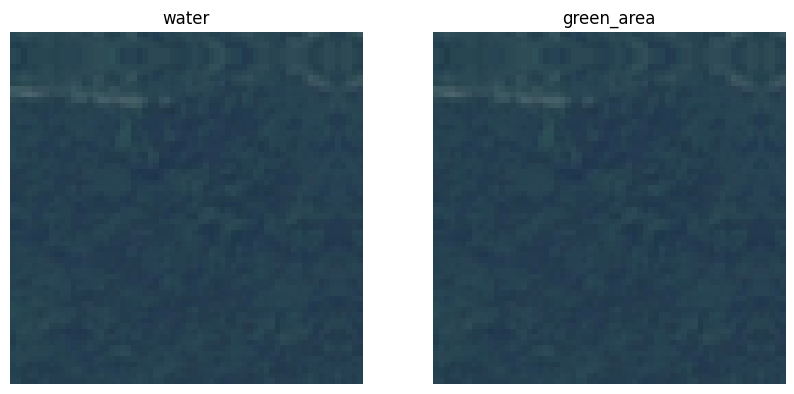

Test image 279 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


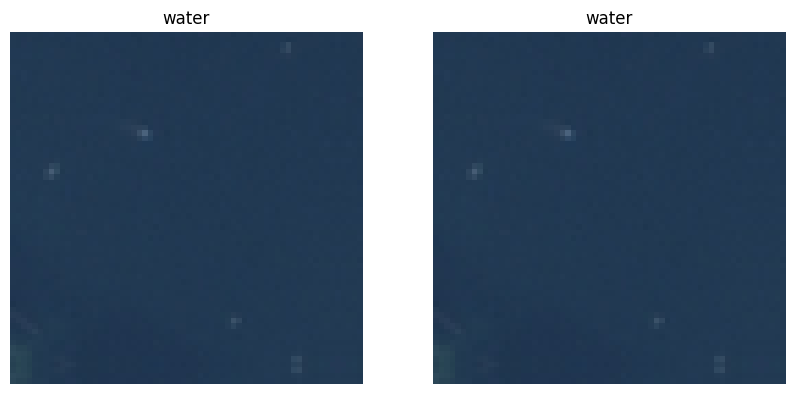

Test image 280 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


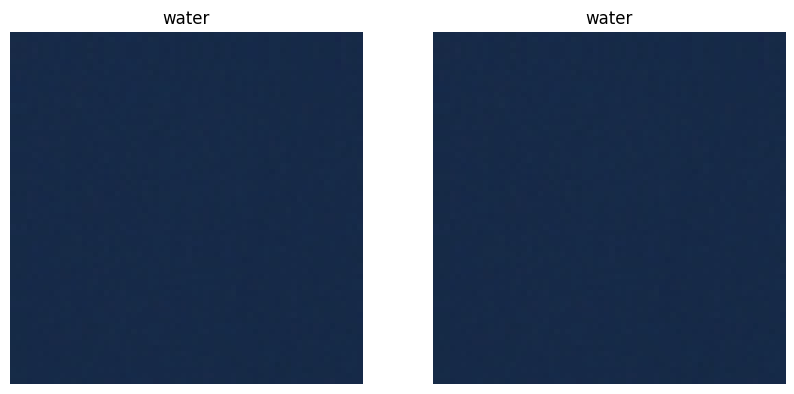

Test image 281 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


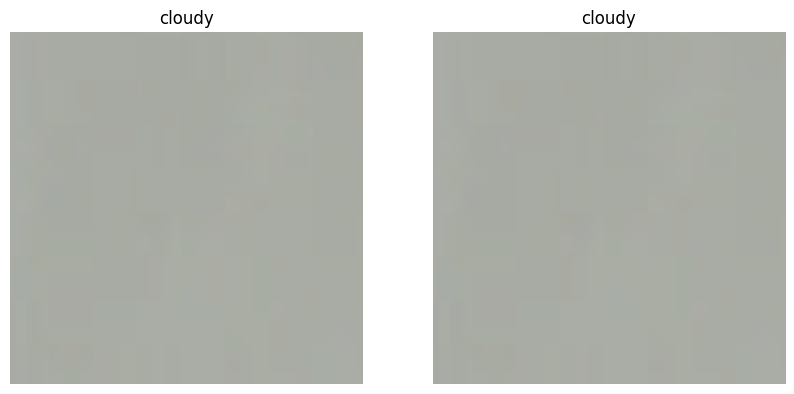

Test image 282 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


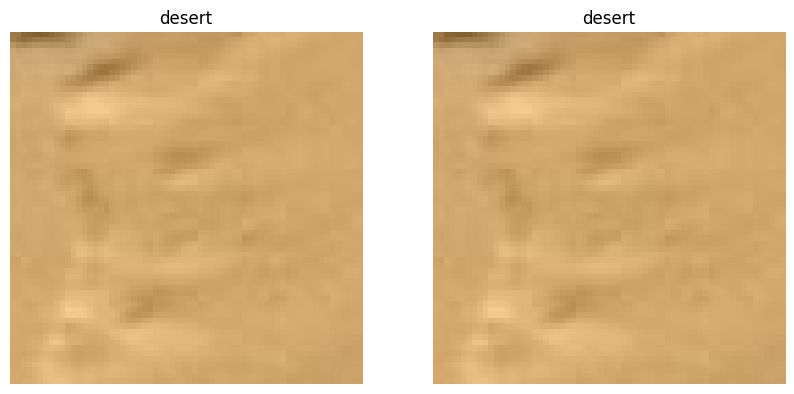

Test image 283 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


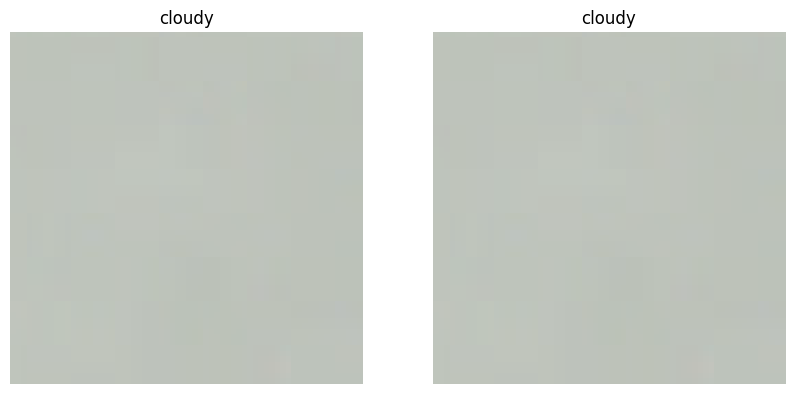

Test image 284 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


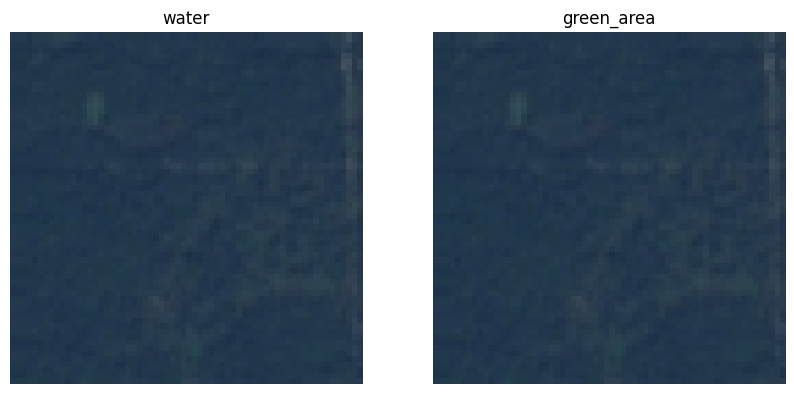

Test image 285 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


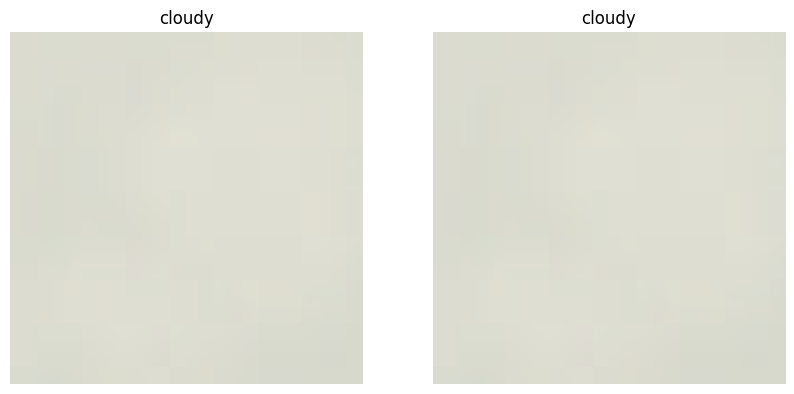

Test image 286 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


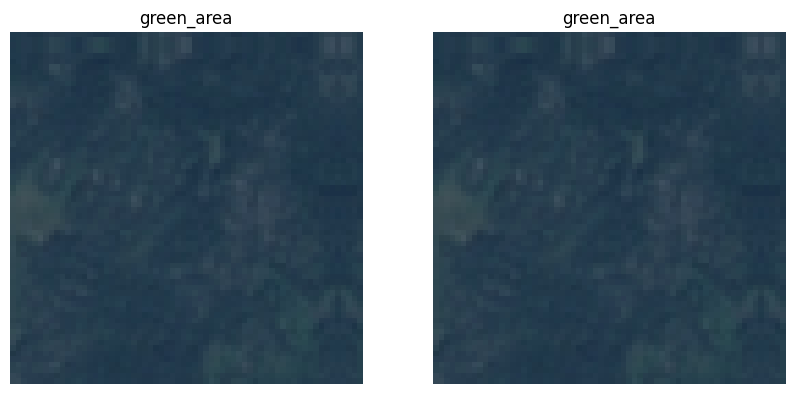

Test image 287 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


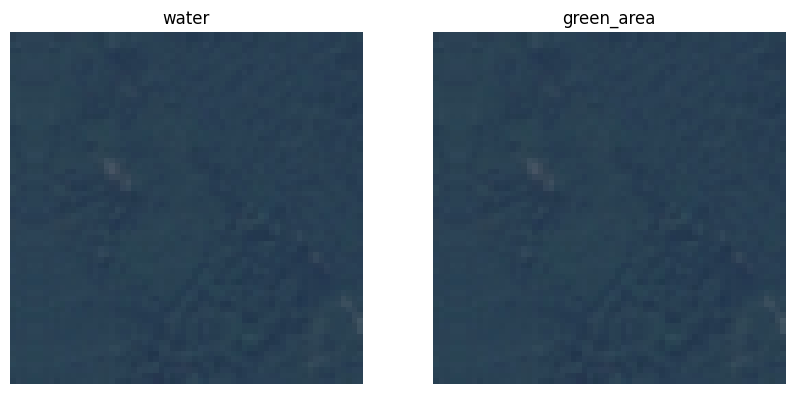

Test image 288 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


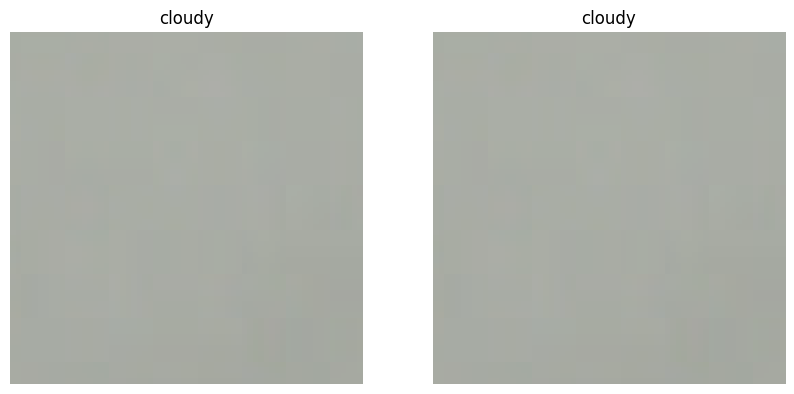

Test image 289 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


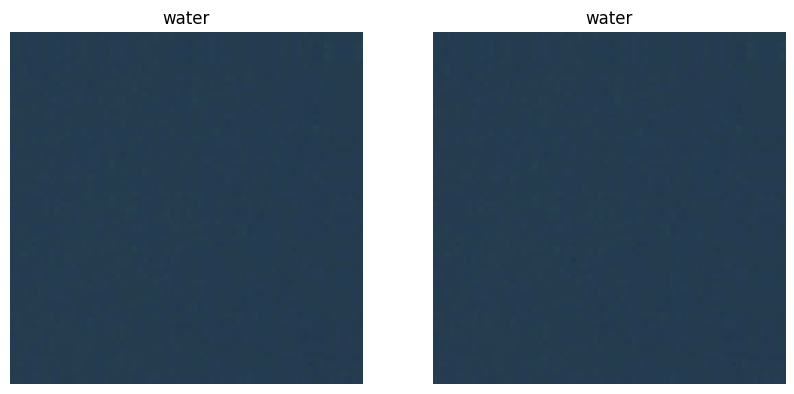

Test image 290 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


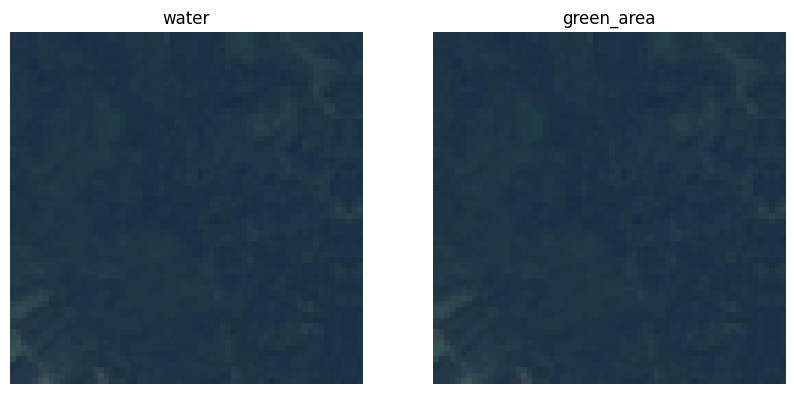

Test image 291 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


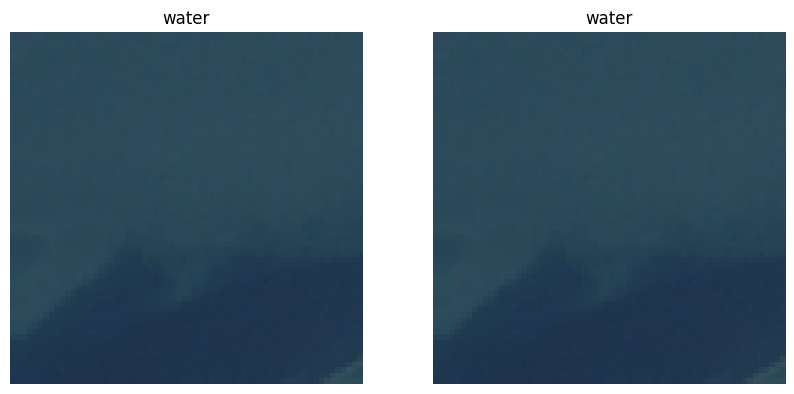

Test image 292 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


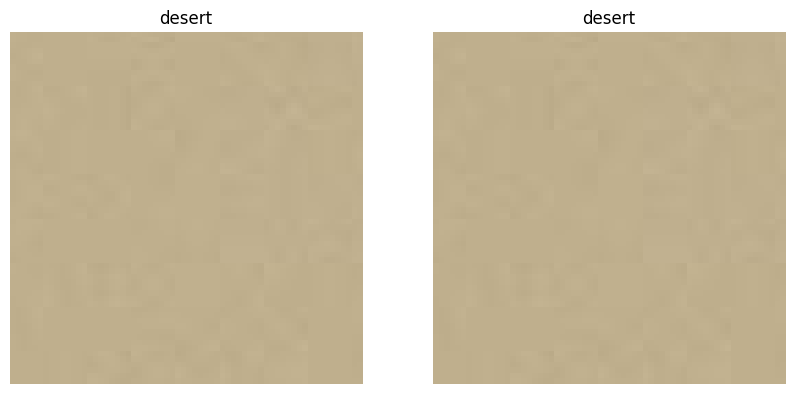

Test image 293 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


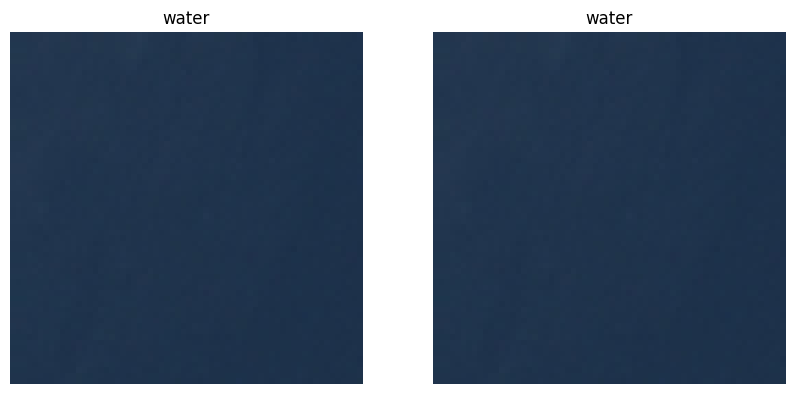

Test image 294 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


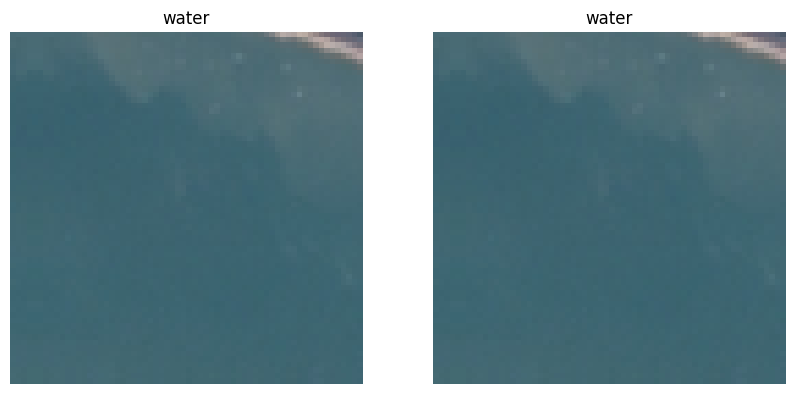

Test image 295 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


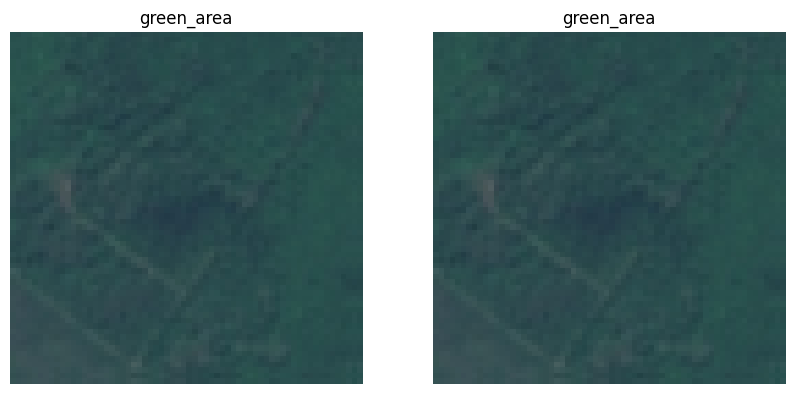

Test image 296 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


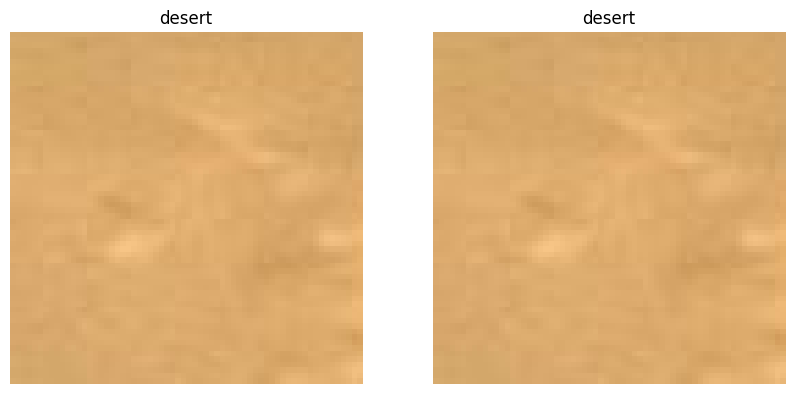

Test image 297 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


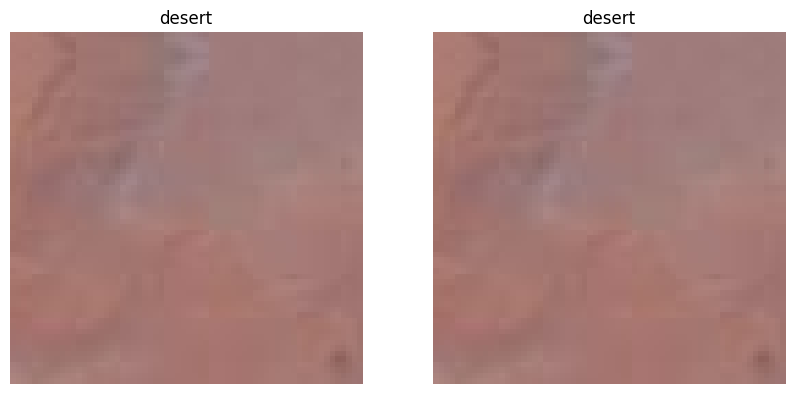

Test image 298 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


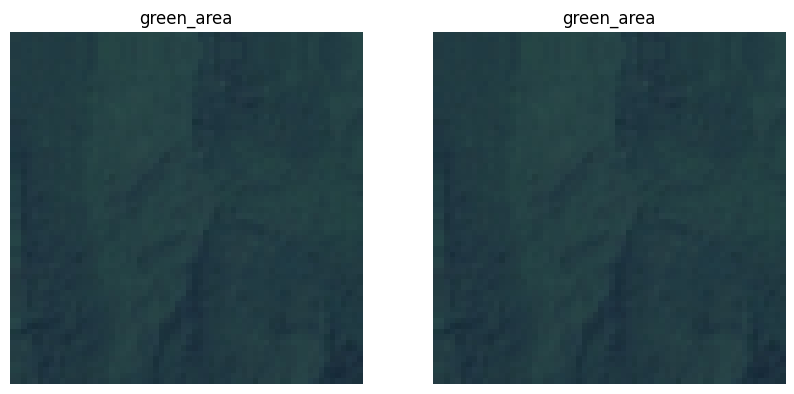

Test image 299 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


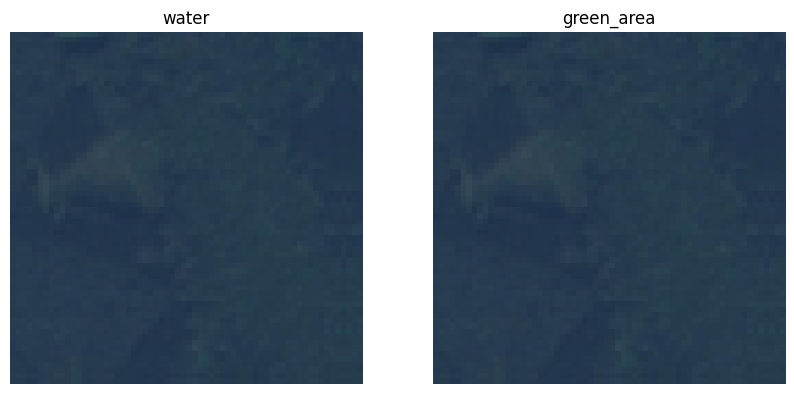

Test image 300 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


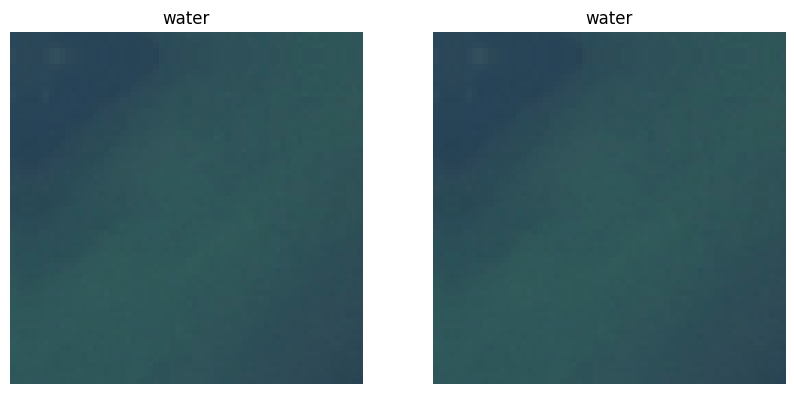

Test image 301 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


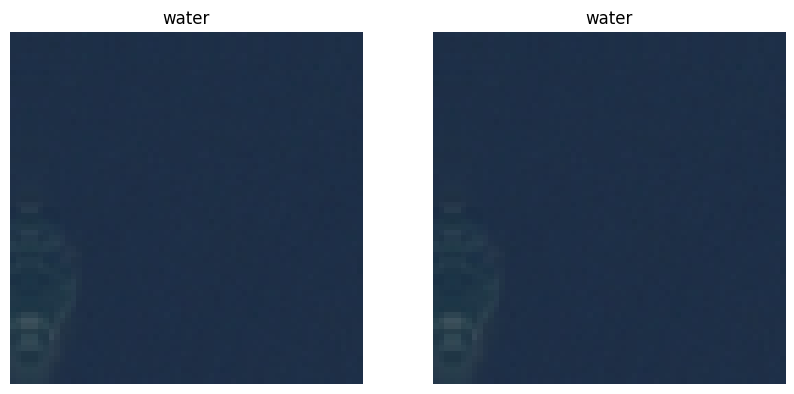

Test image 302 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


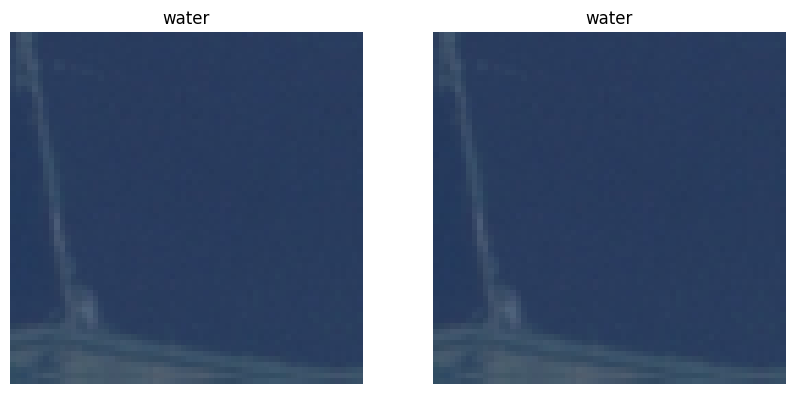

Test image 303 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


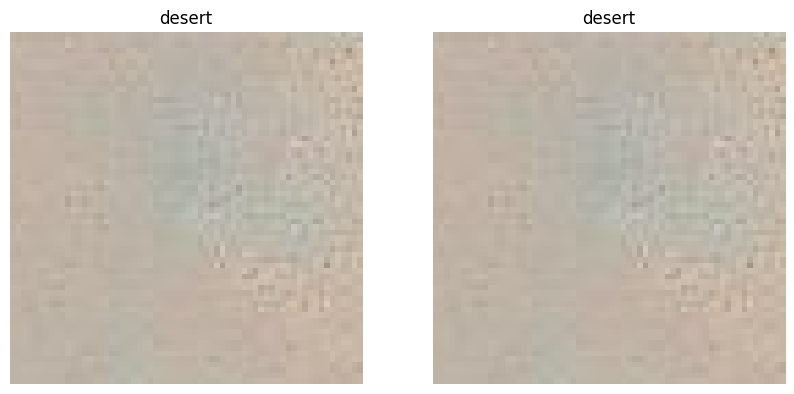

Test image 304 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


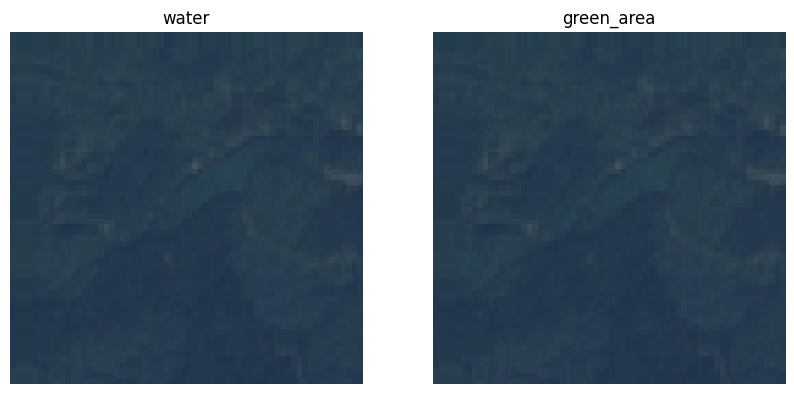

Test image 305 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


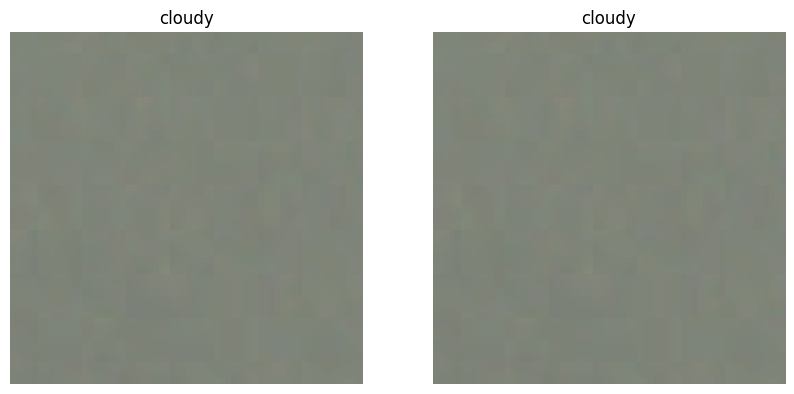

Test image 306 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


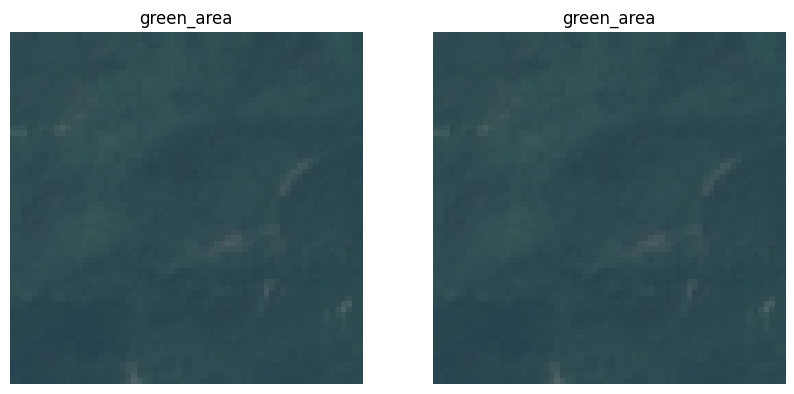

Test image 307 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


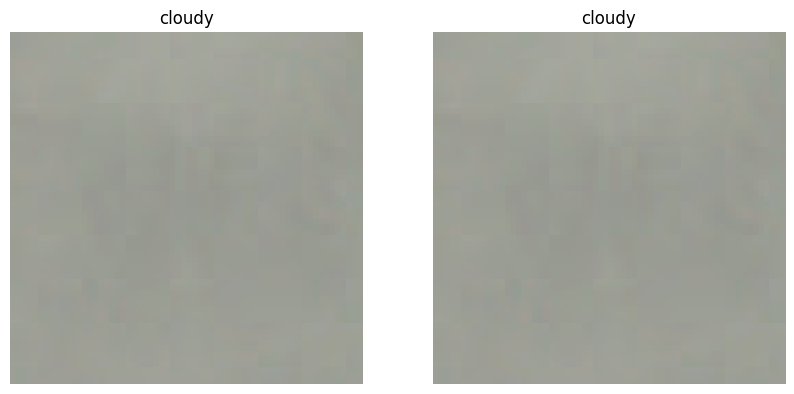

Test image 308 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


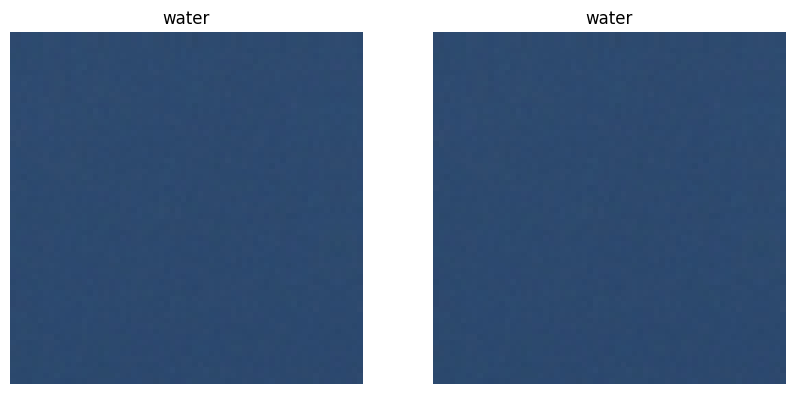

Test image 309 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


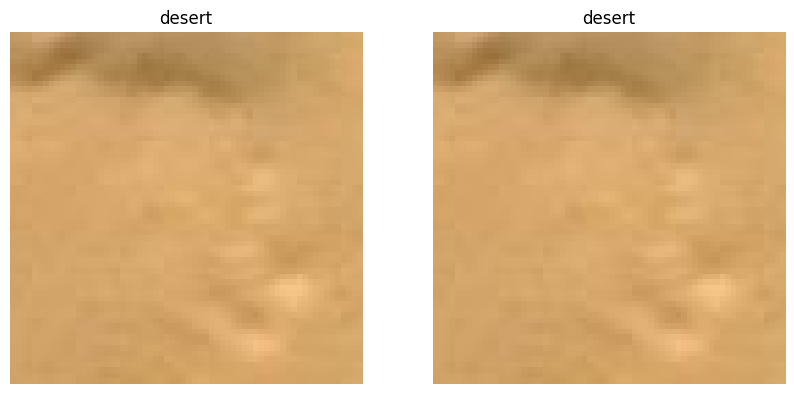

Test image 310 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


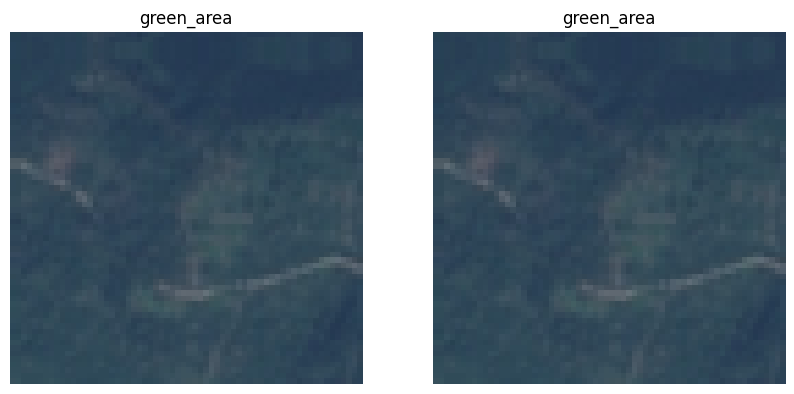

Test image 311 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


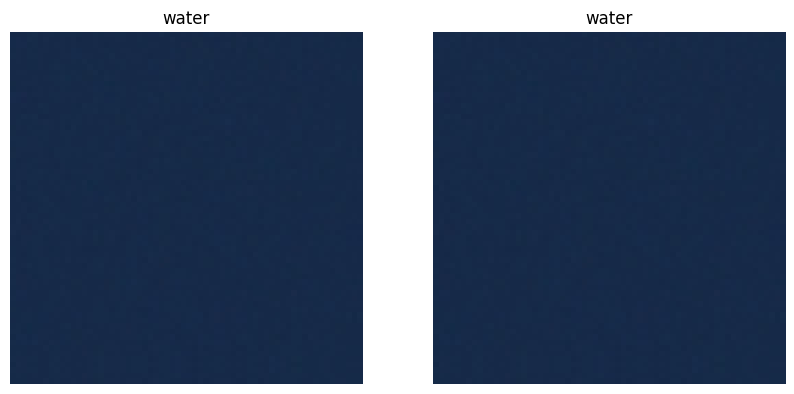

Test image 312 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


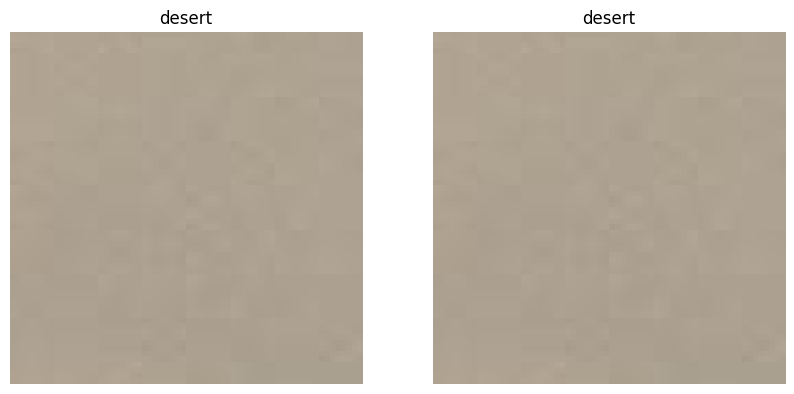

Test image 313 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


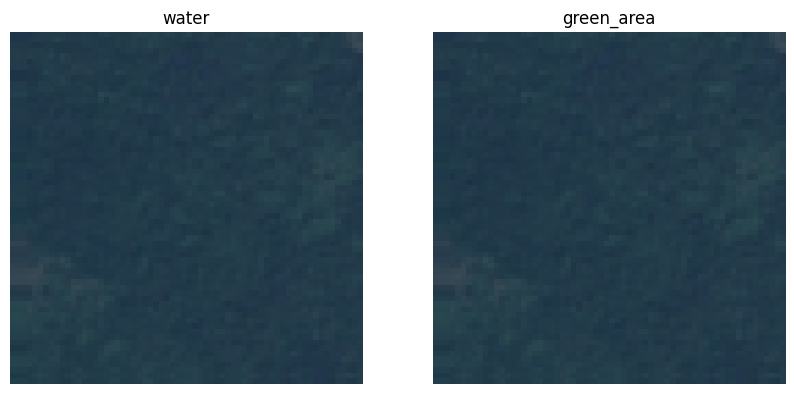

Test image 314 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


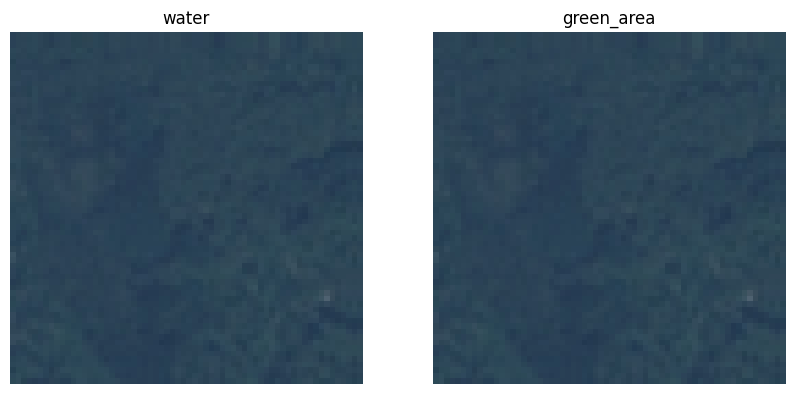

Test image 315 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


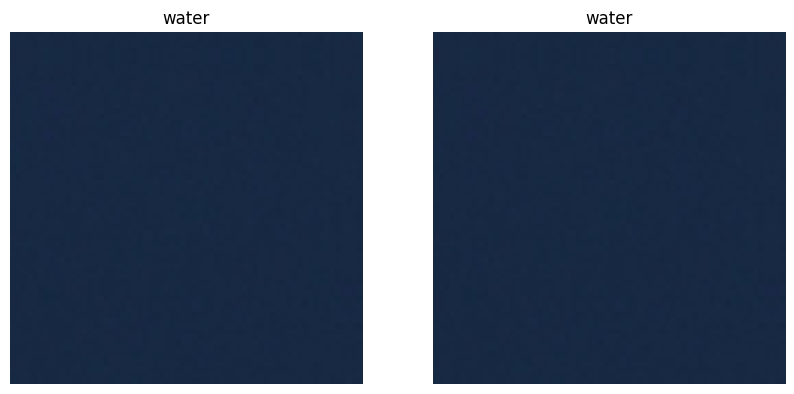

Test image 316 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


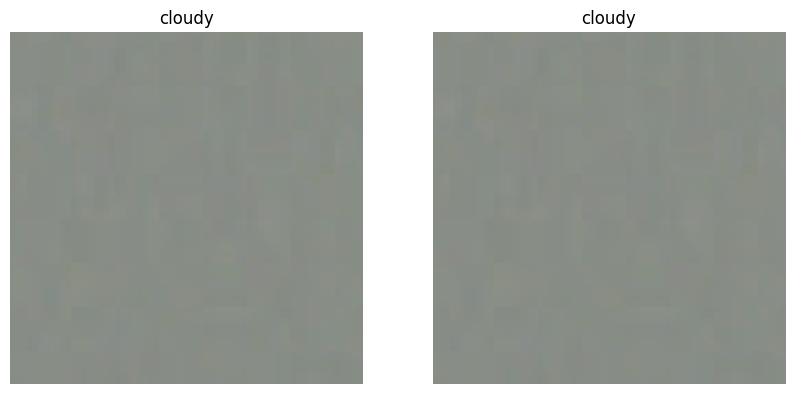

Test image 317 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


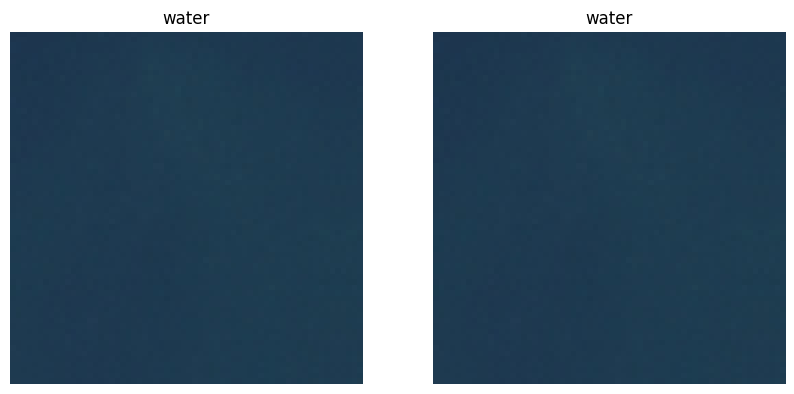

Test image 318 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


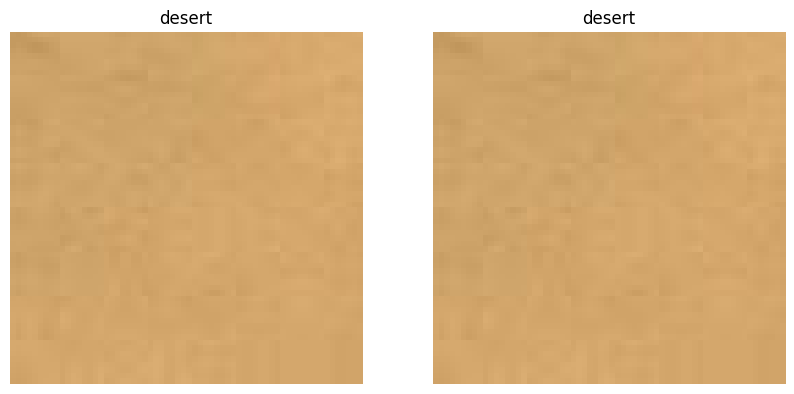

Test image 319 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


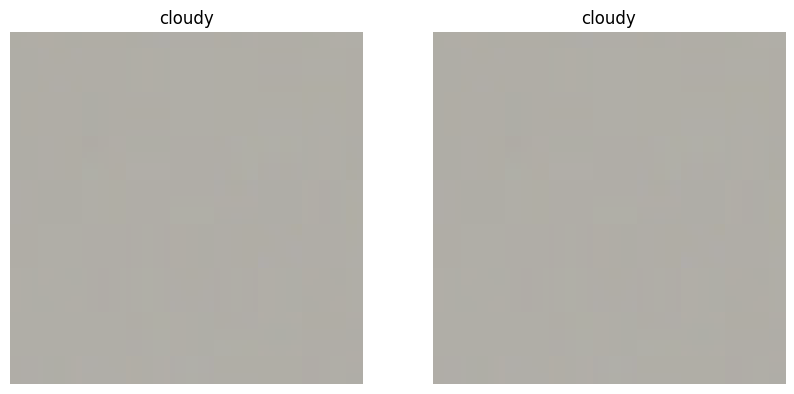

Test image 320 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


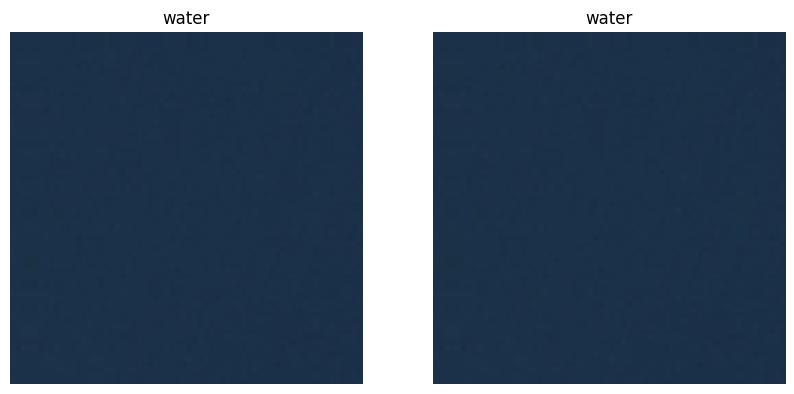

Test image 321 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


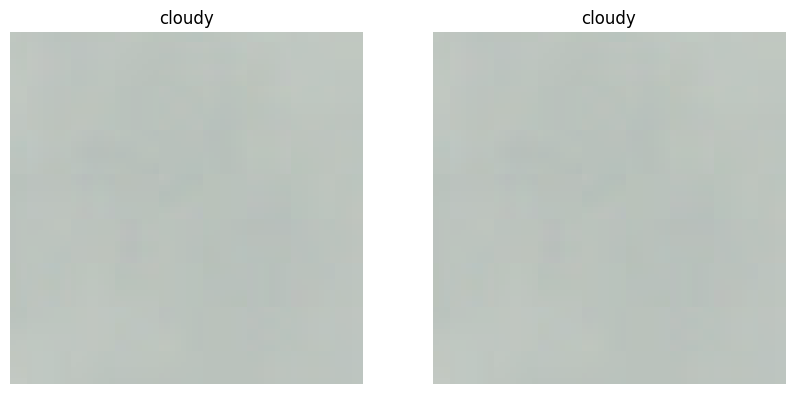

Test image 322 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


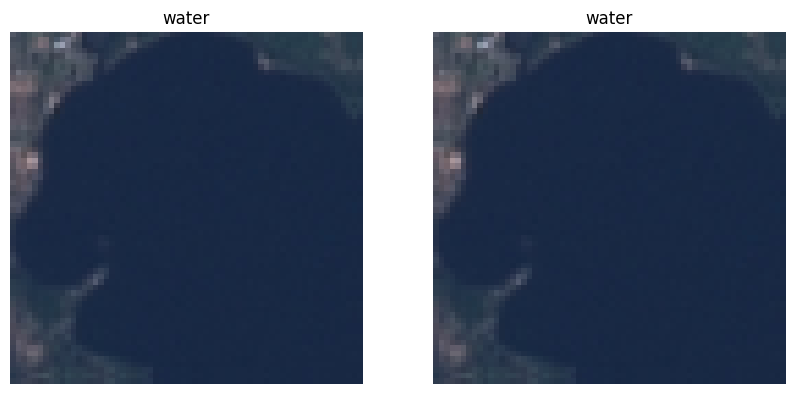

Test image 323 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


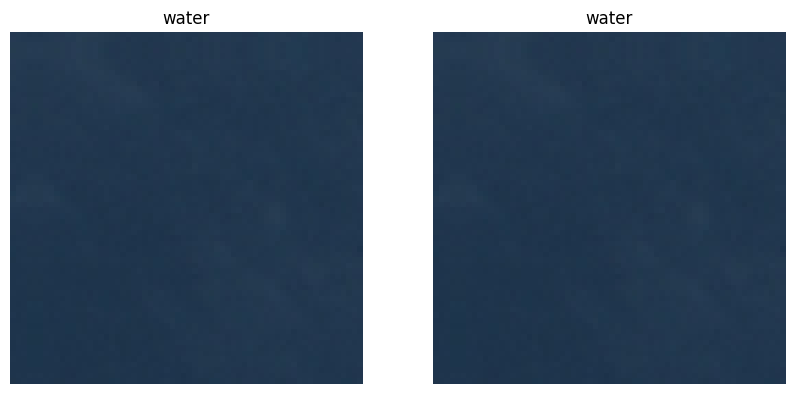

Test image 324 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


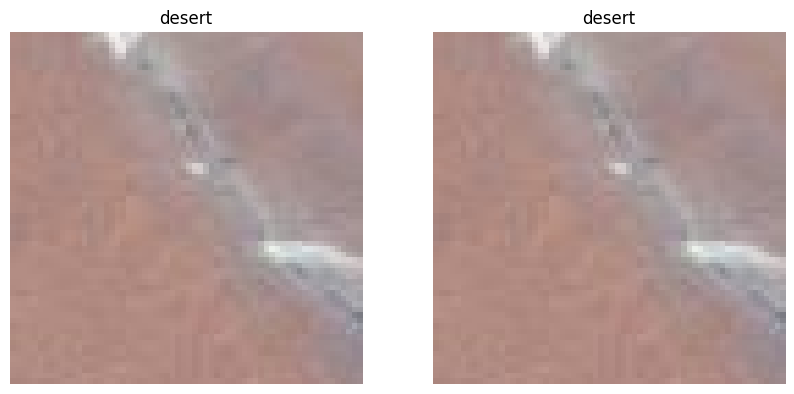

Test image 325 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


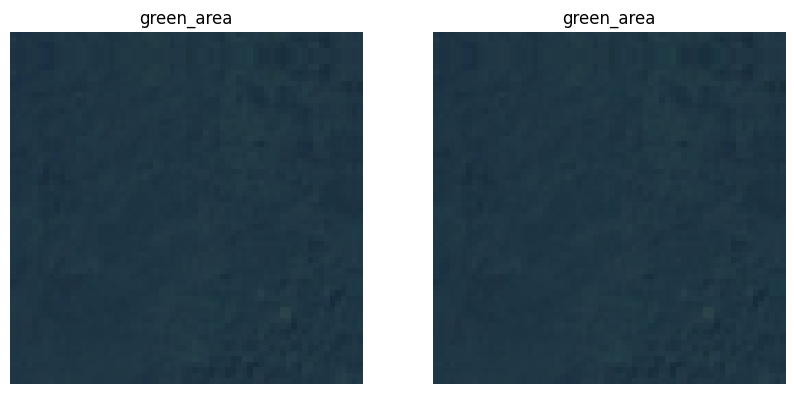

Test image 326 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


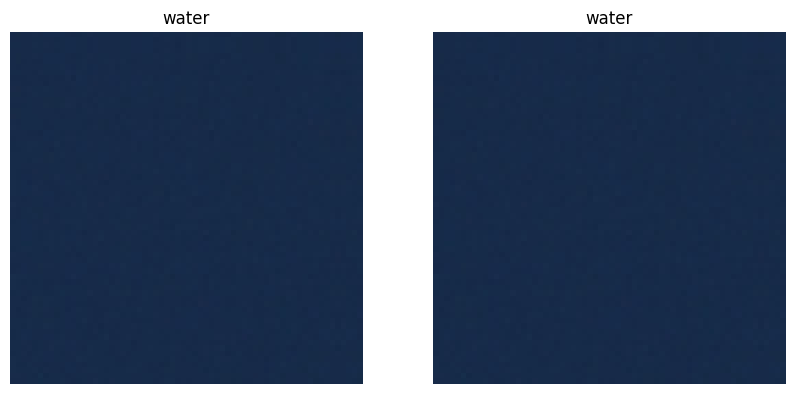

Test image 327 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


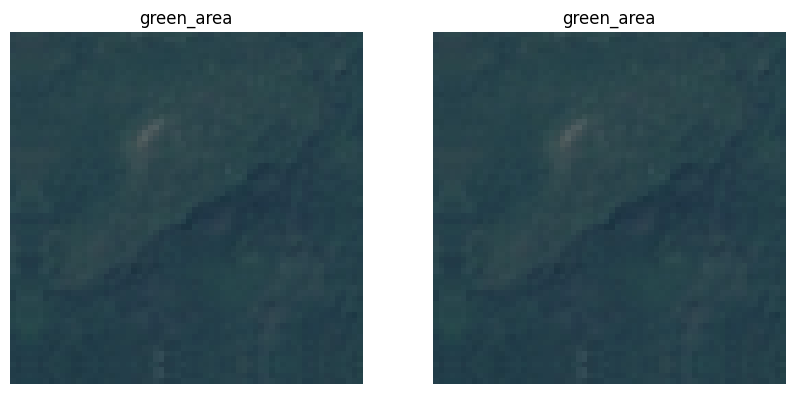

Test image 328 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


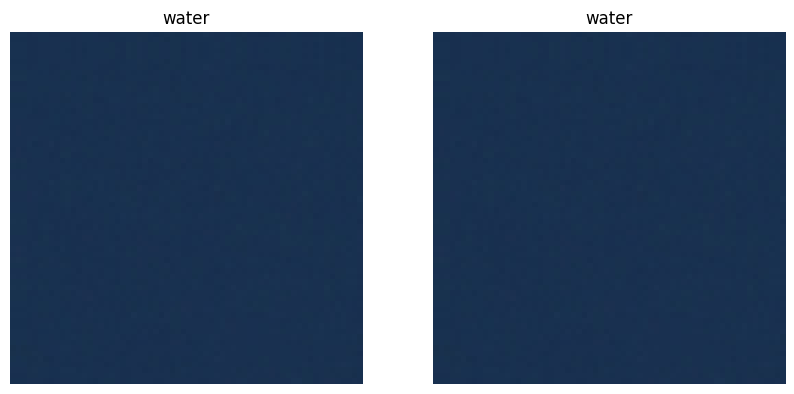

Test image 329 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


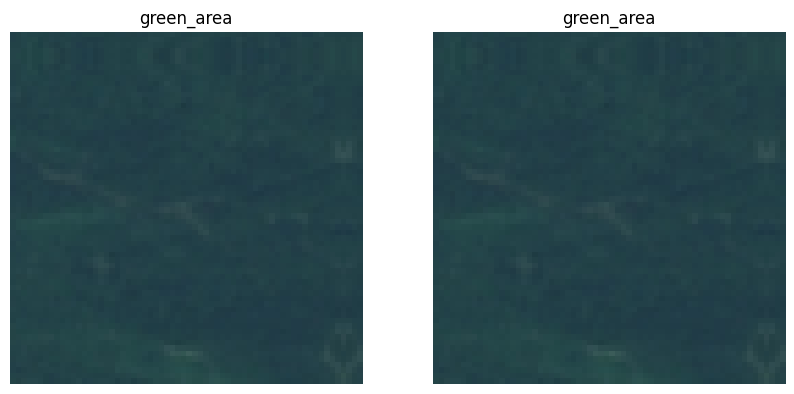

Test image 330 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


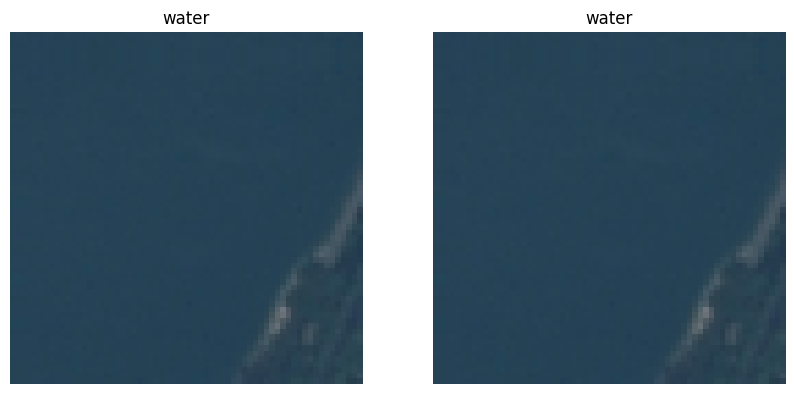

Test image 331 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


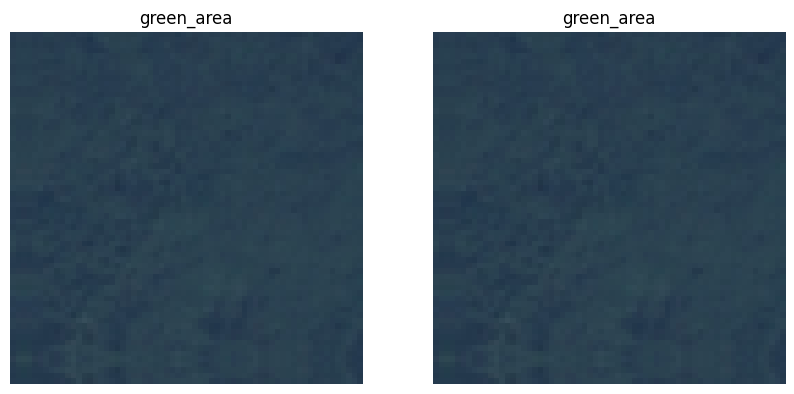

Test image 332 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


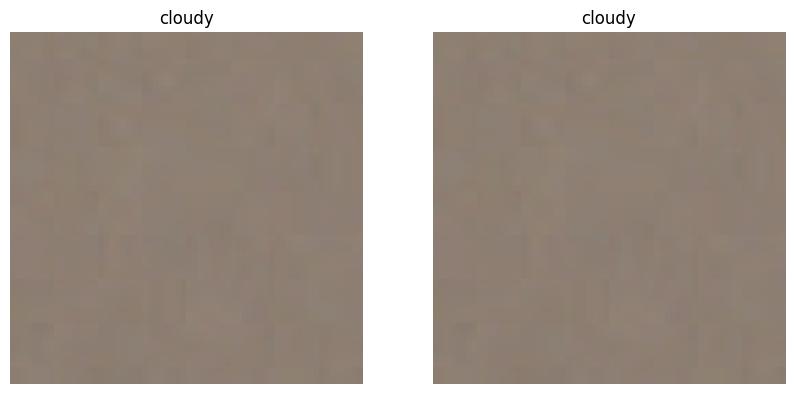

Test image 333 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


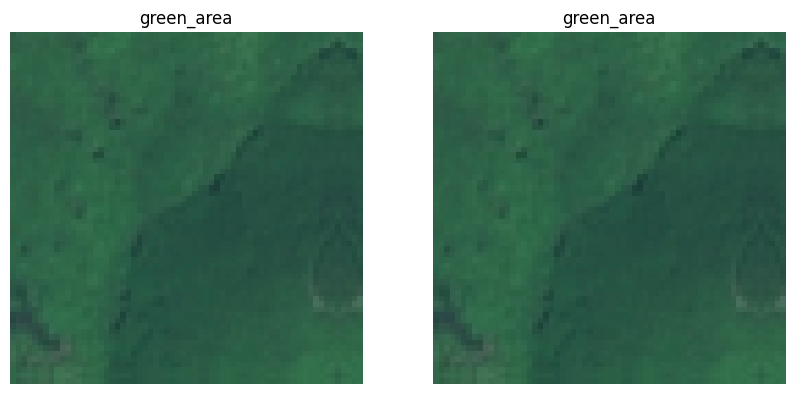

Test image 334 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


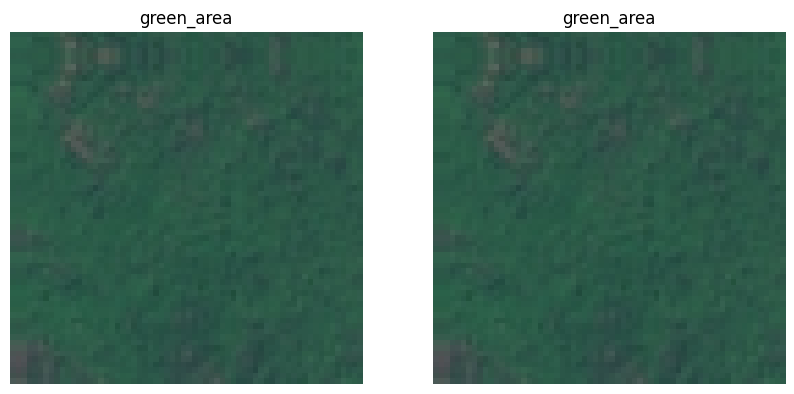

Test image 335 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


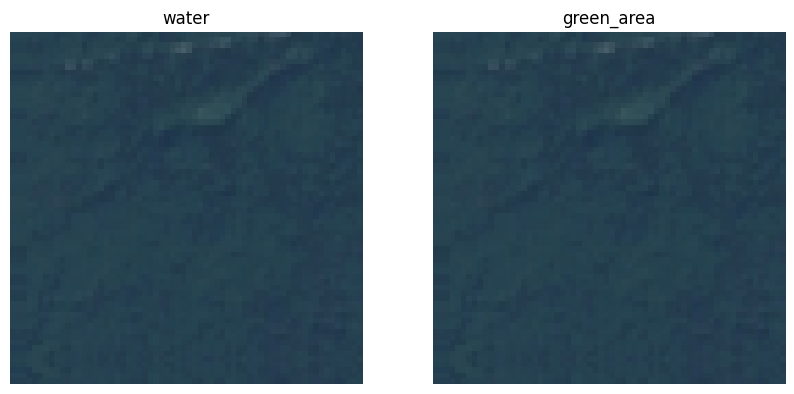

Test image 336 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


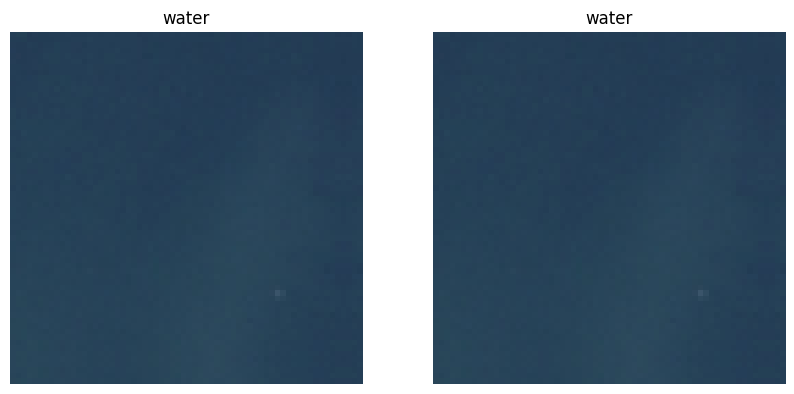

Test image 337 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


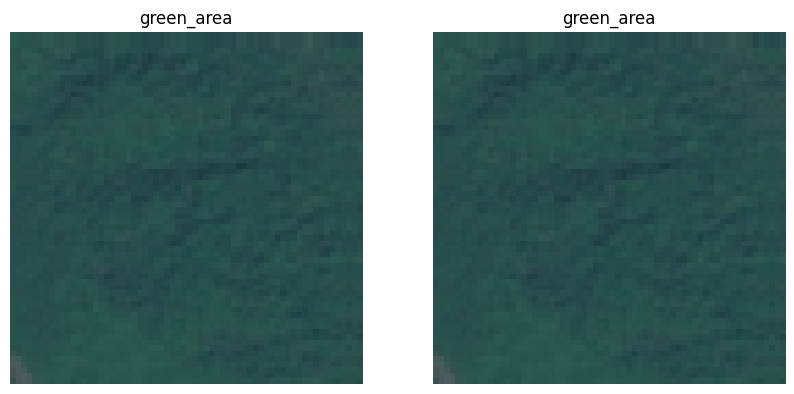

Test image 338 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


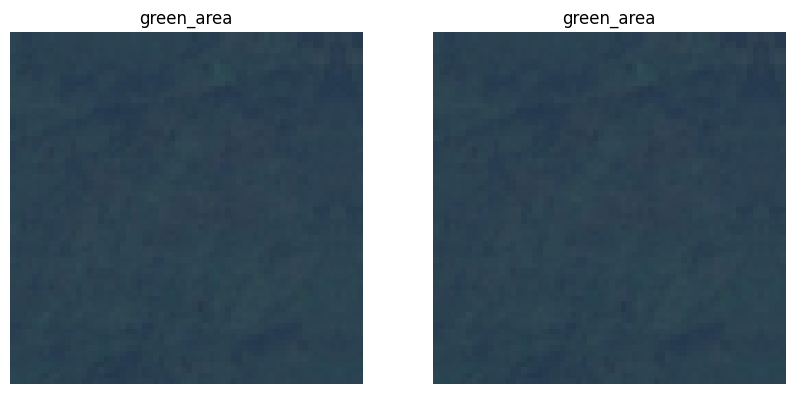

Test image 339 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


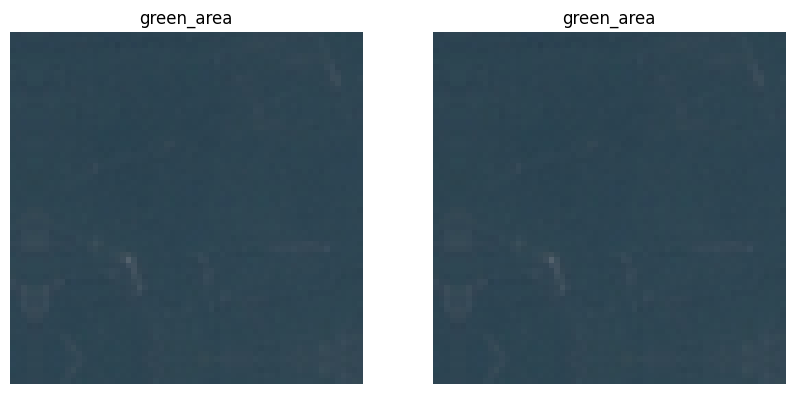

Test image 340 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


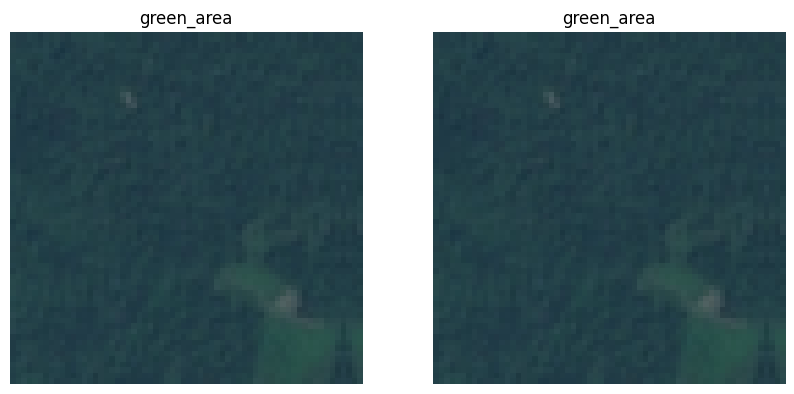

Test image 341 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


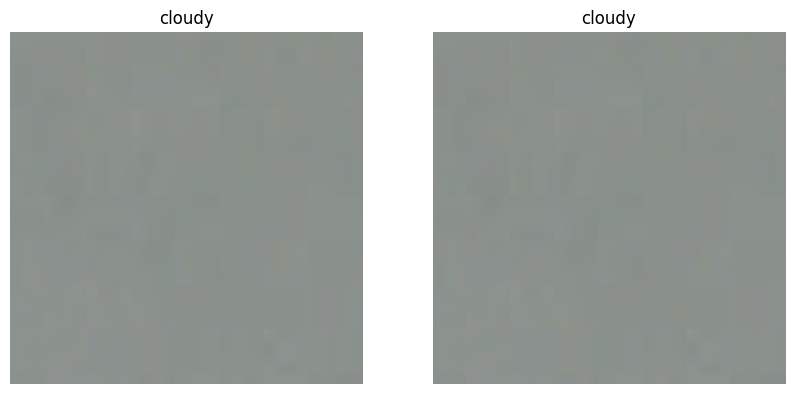

Test image 342 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


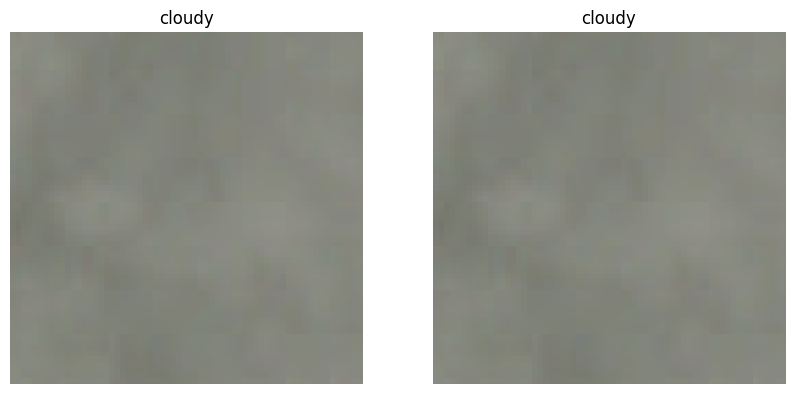

Test image 343 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


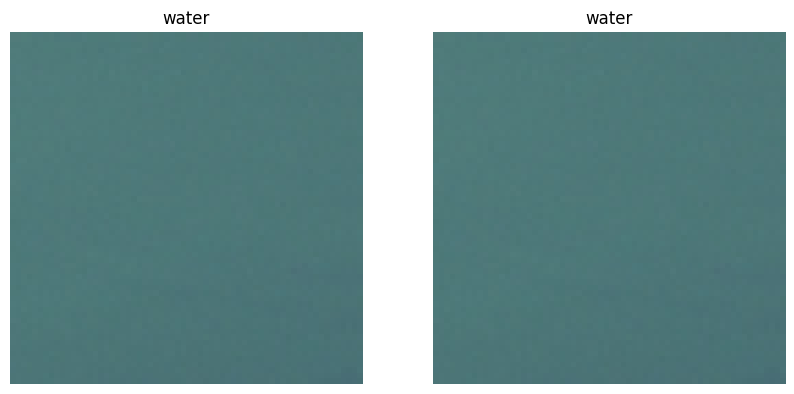

Test image 344 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


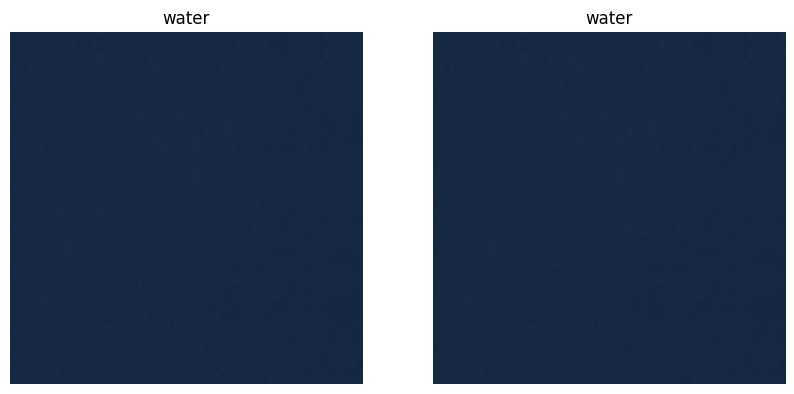

Test image 345 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


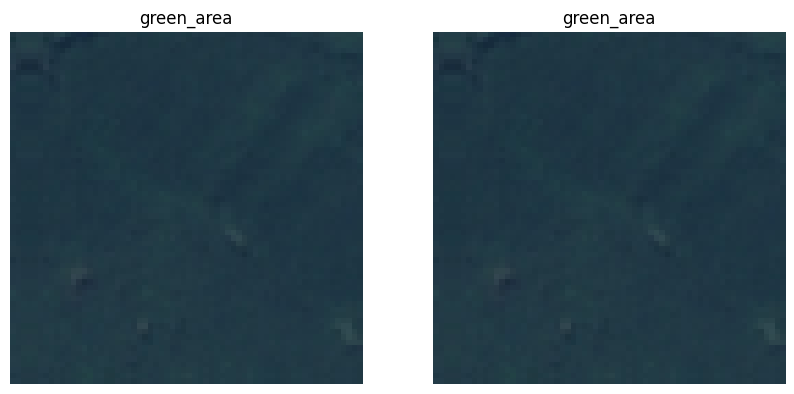

Test image 346 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


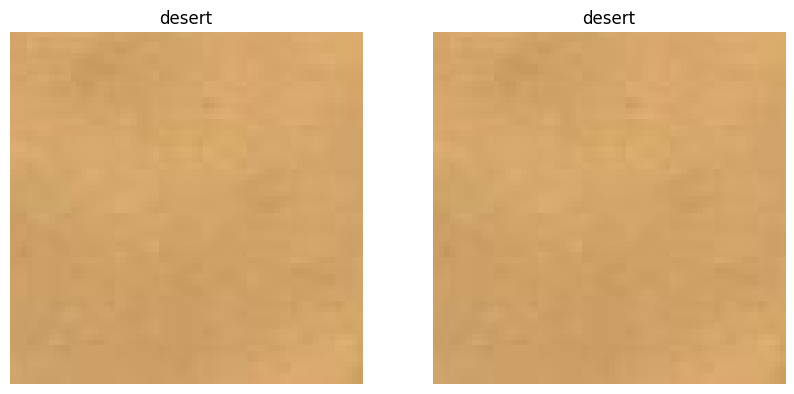

Test image 347 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


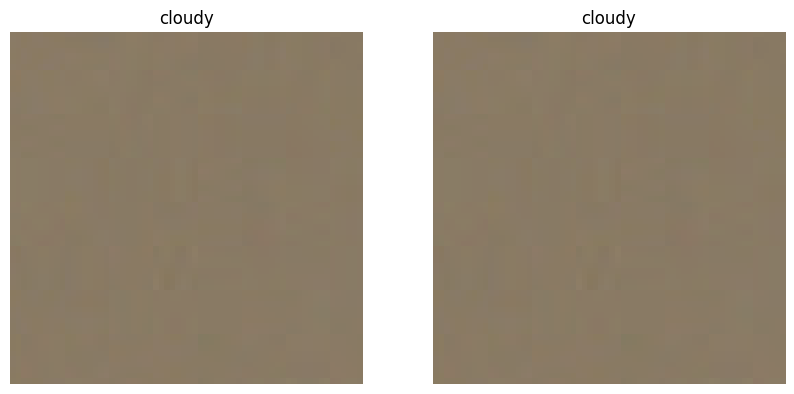

Test image 348 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


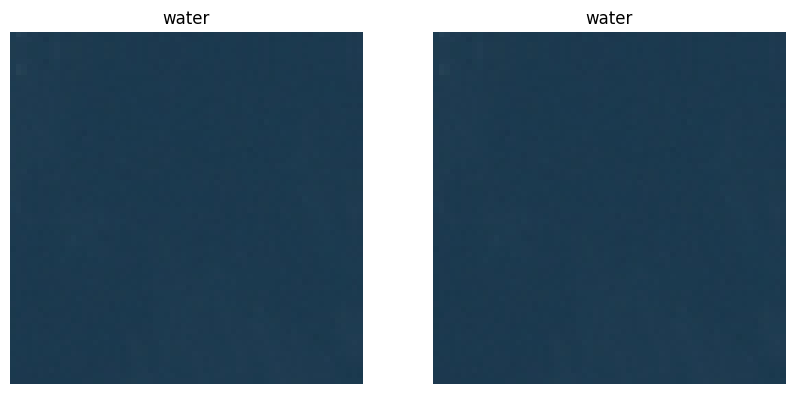

Test image 349 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


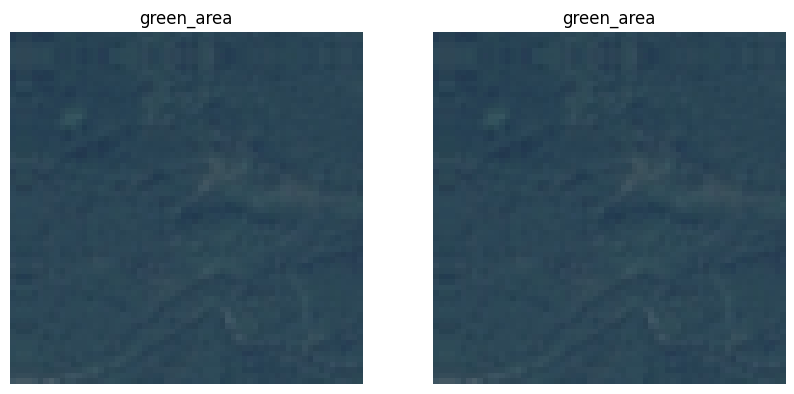

Test image 350 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


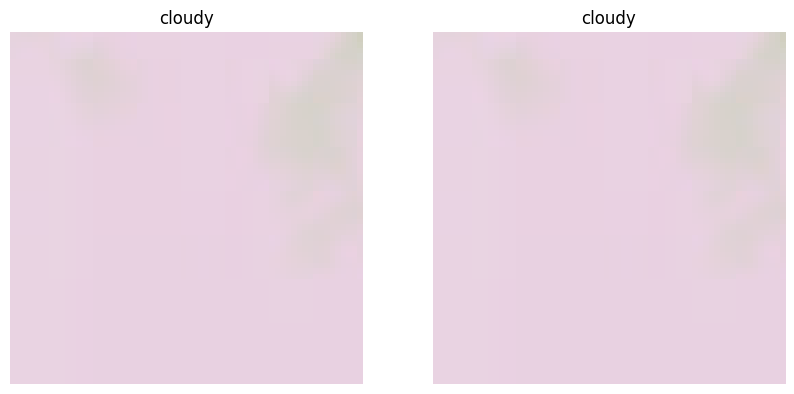

Test image 351 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


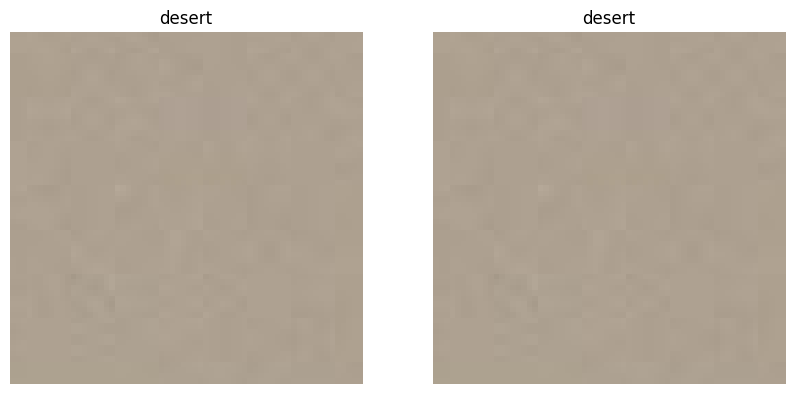

Test image 352 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


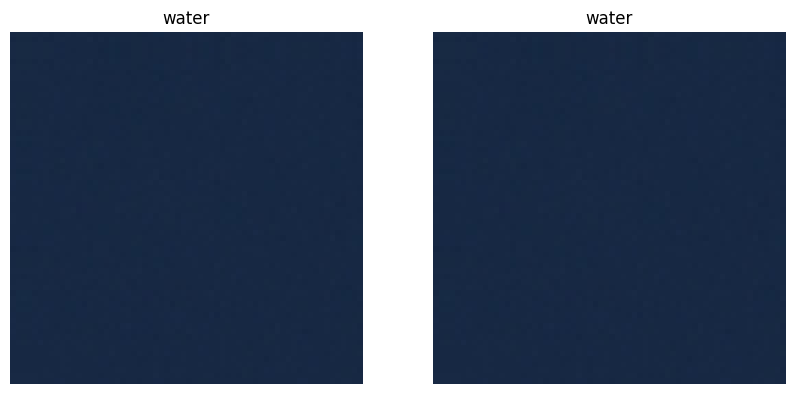

Test image 353 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


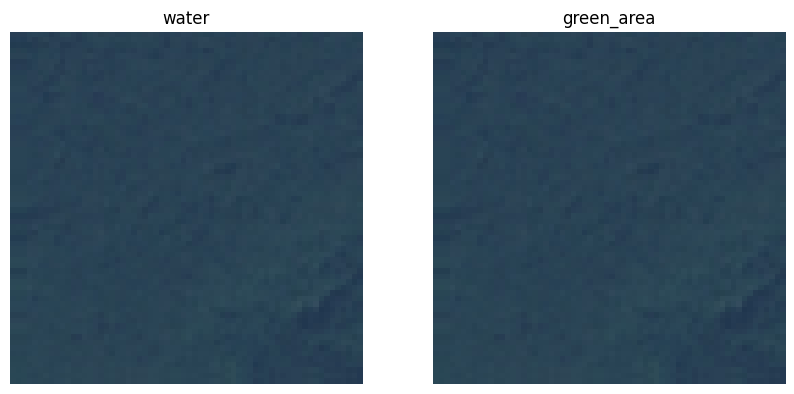

Test image 354 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


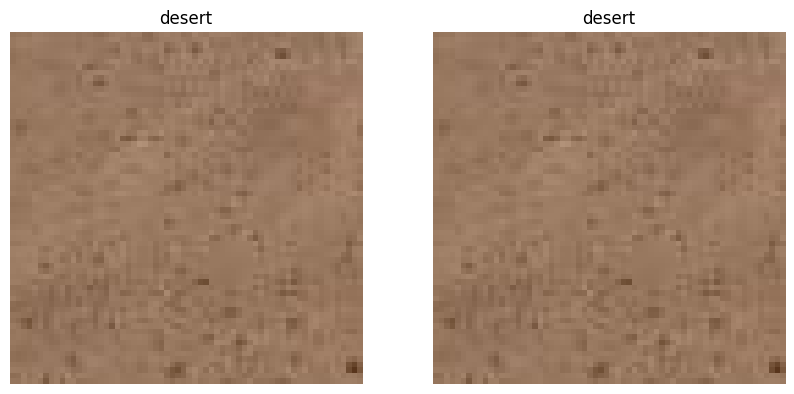

Test image 355 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


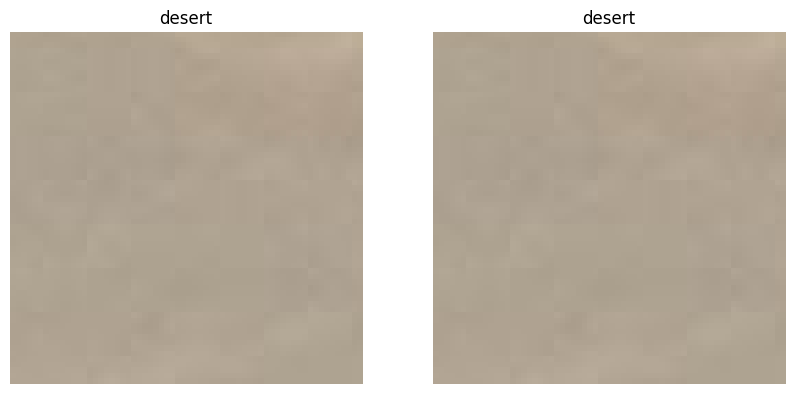

Test image 356 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


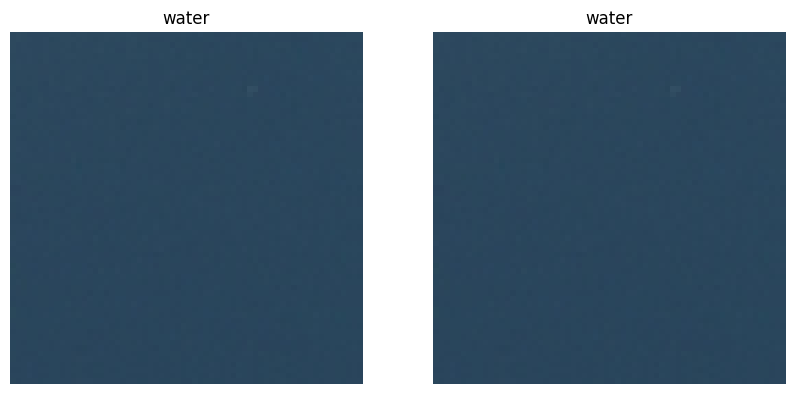

Test image 357 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


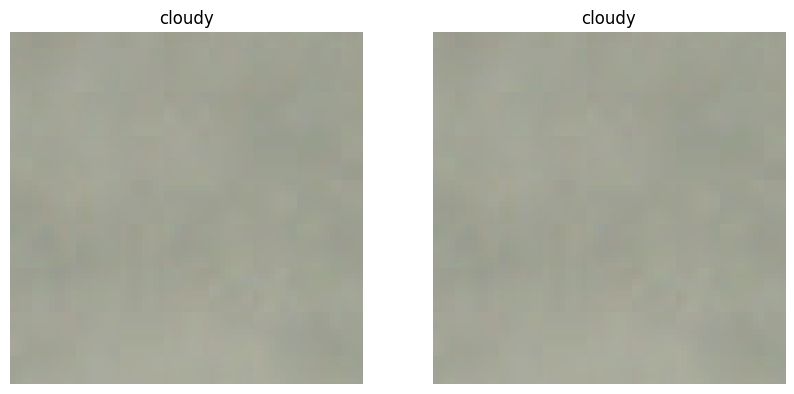

Test image 358 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


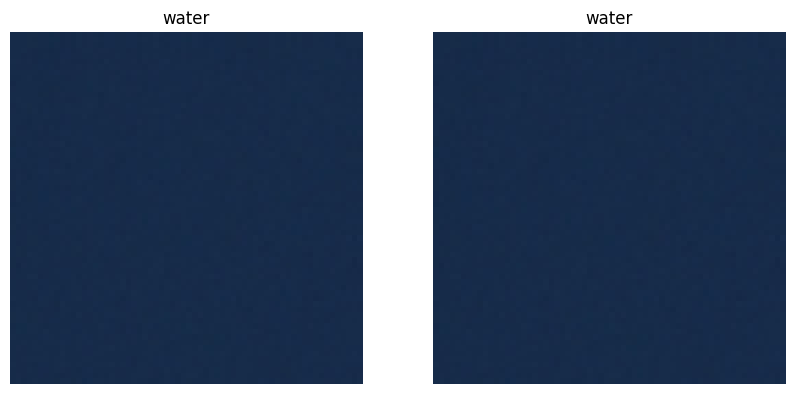

Test image 359 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


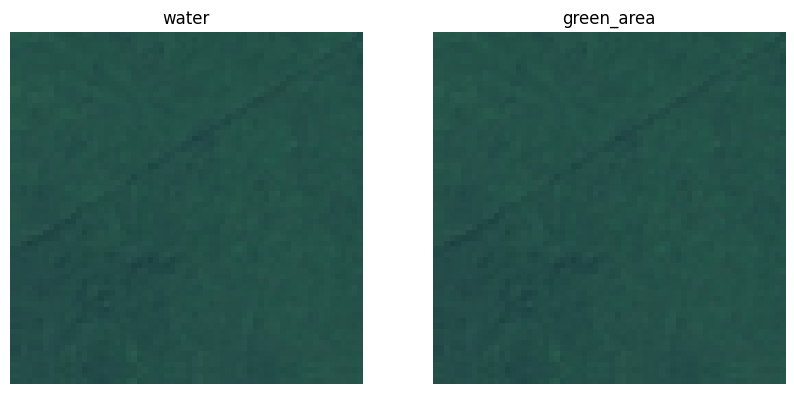

Test image 360 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


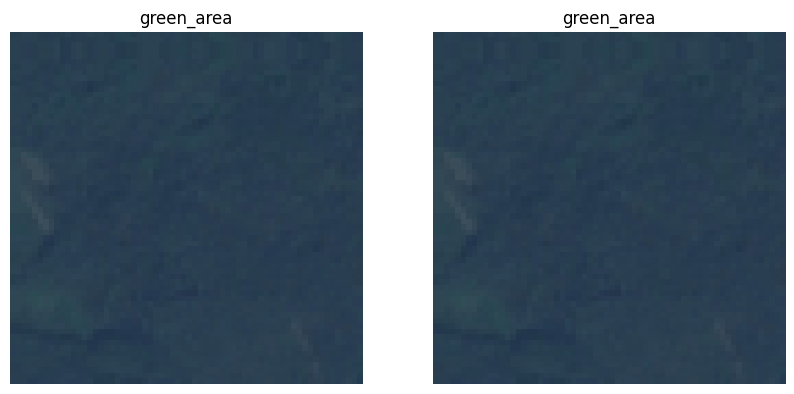

Test image 361 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


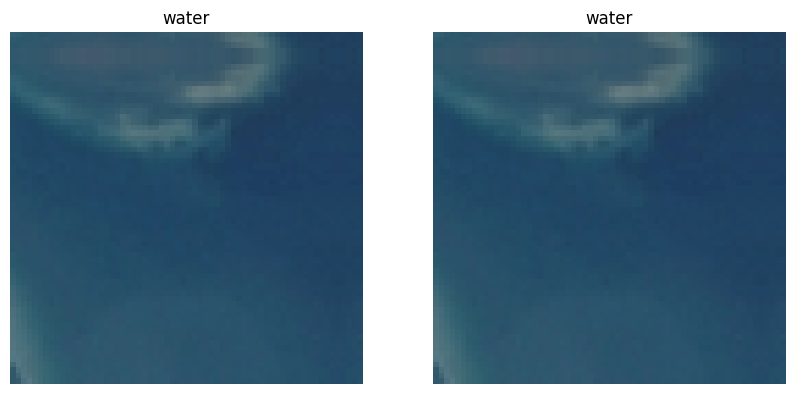

Test image 362 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


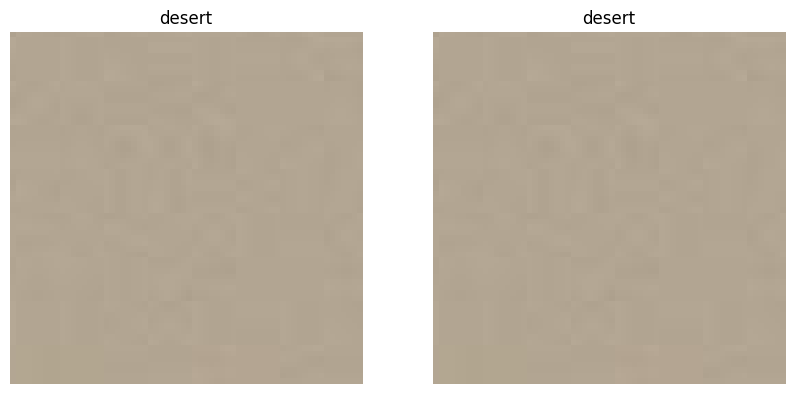

Test image 363 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


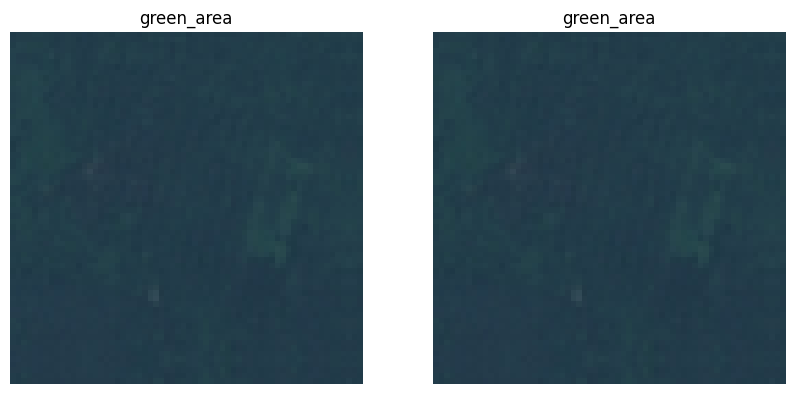

Test image 364 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


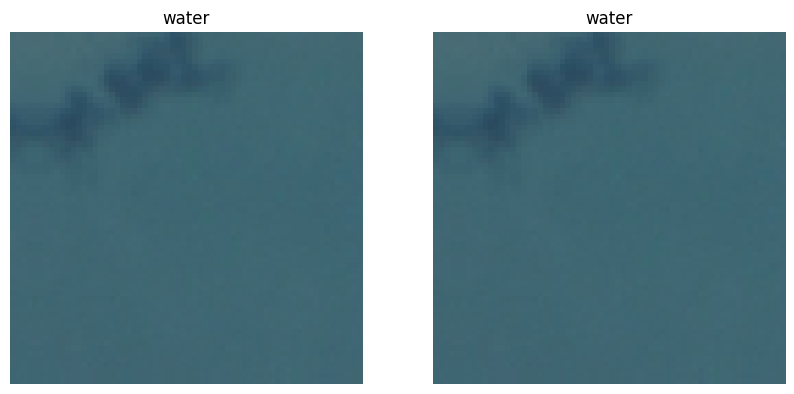

Test image 365 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


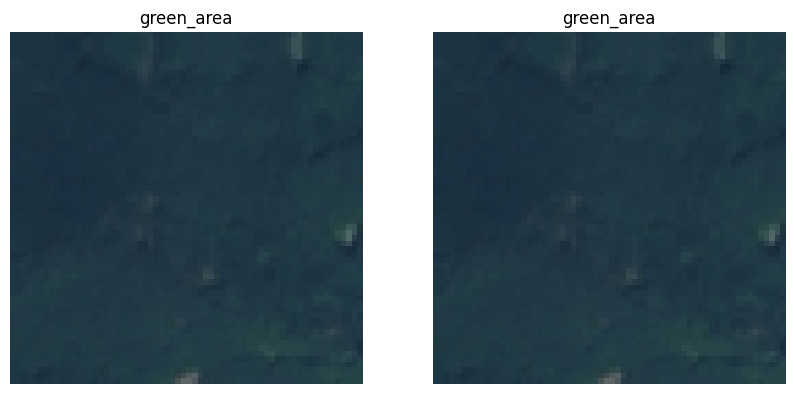

Test image 366 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


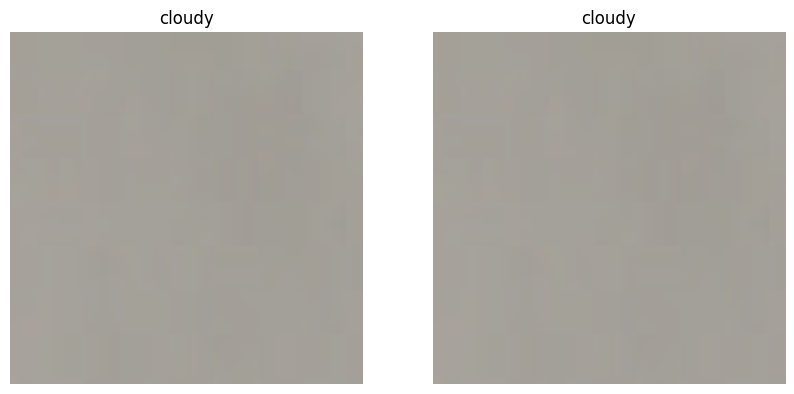

Test image 367 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


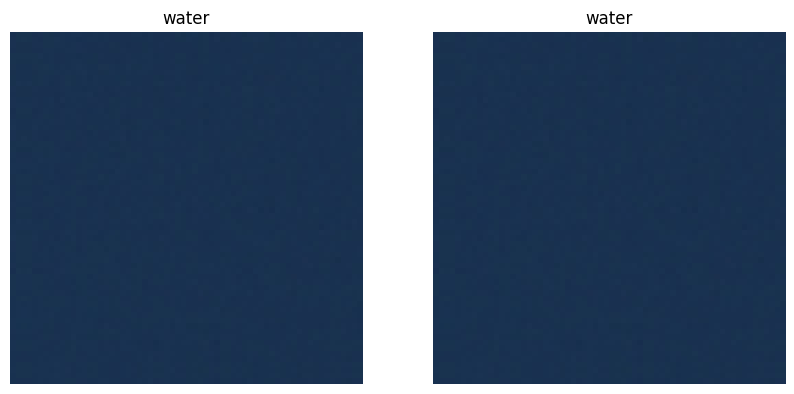

Test image 368 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


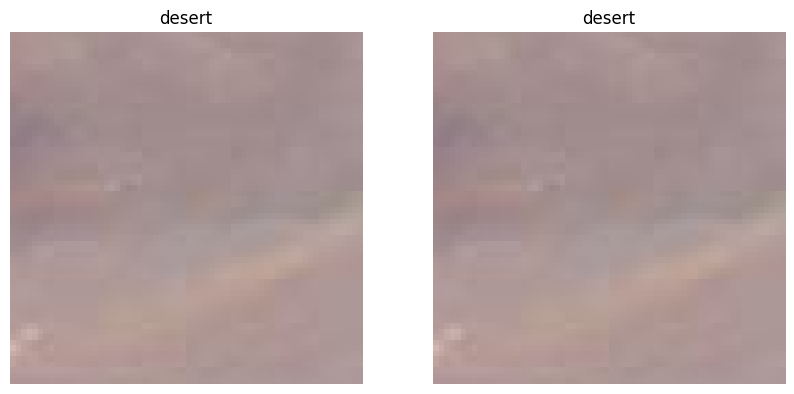

Test image 369 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


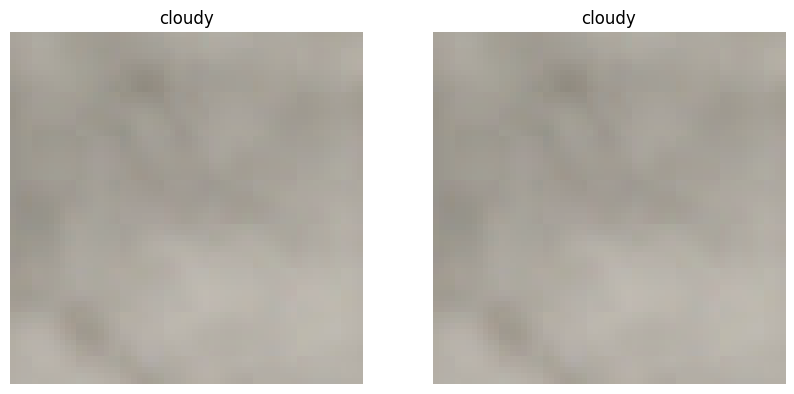

Test image 370 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


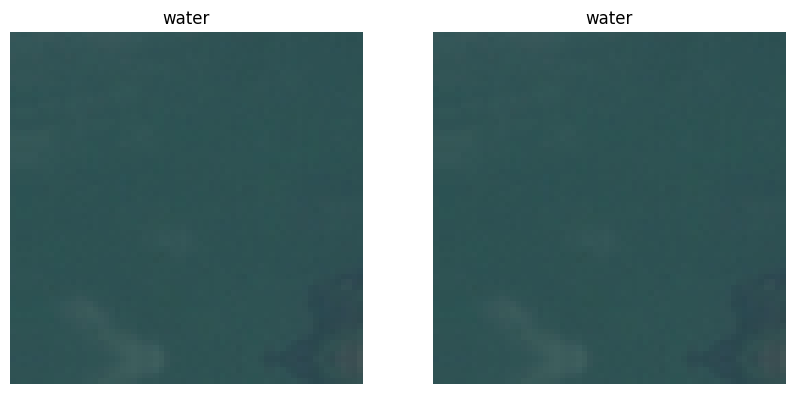

Test image 371 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


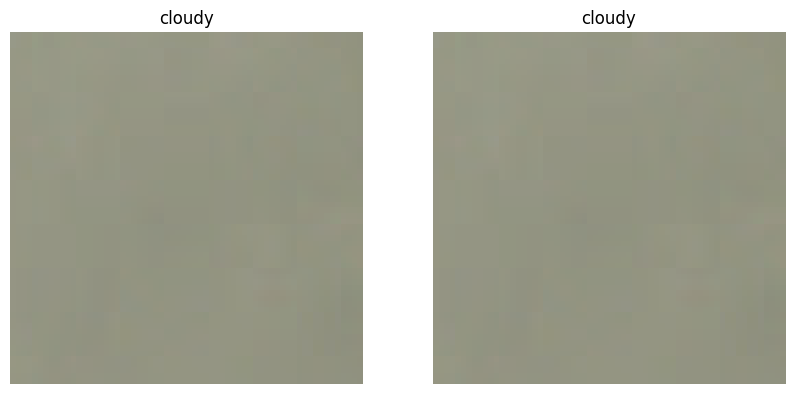

Test image 372 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


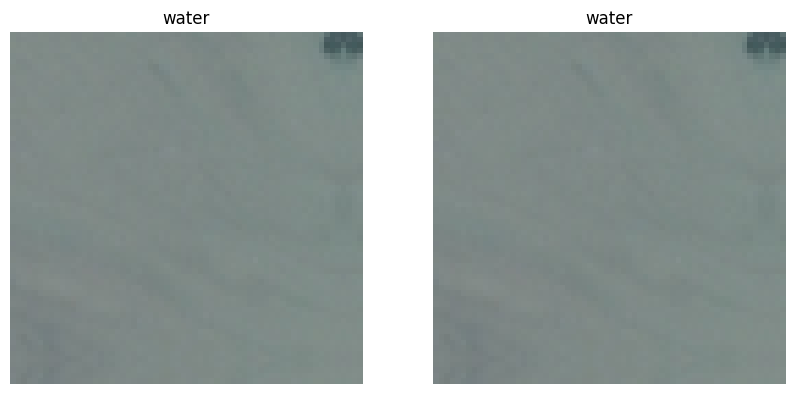

Test image 373 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


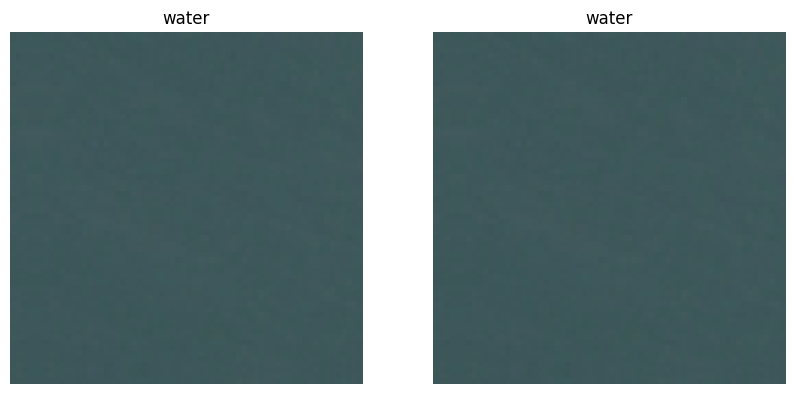

Test image 374 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


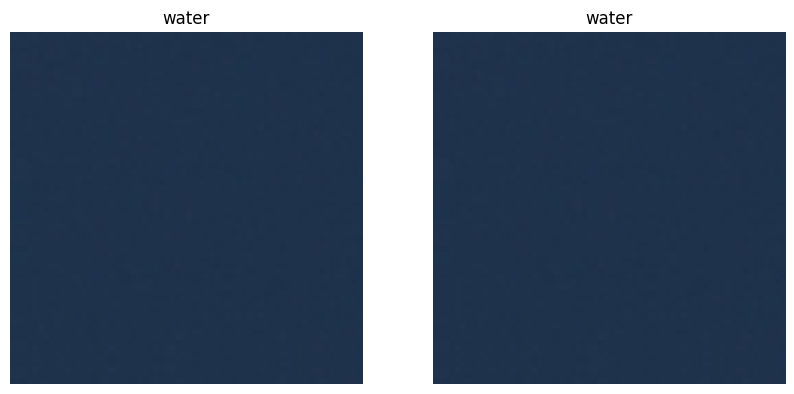

Test image 375 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


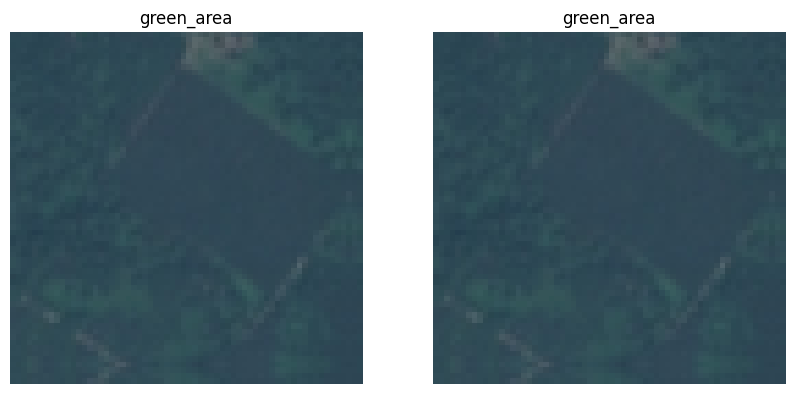

Test image 376 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


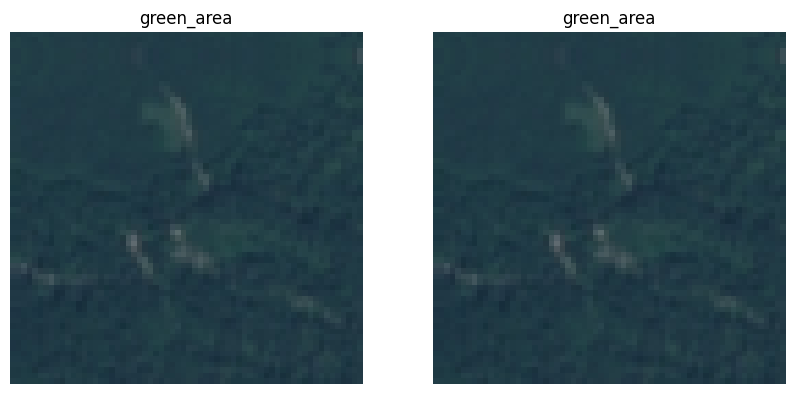

Test image 377 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


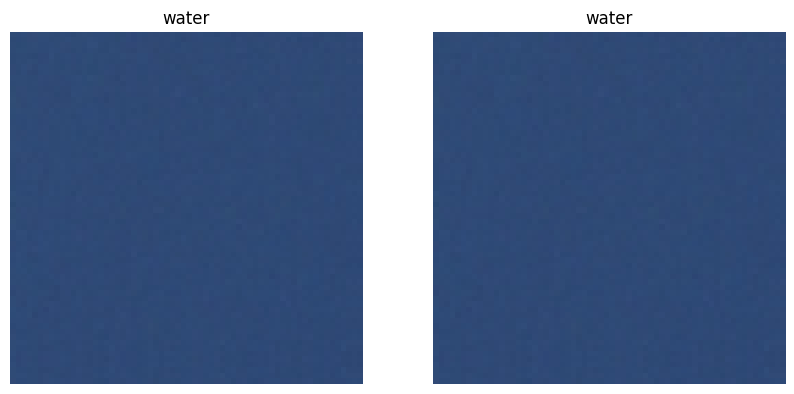

Test image 378 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


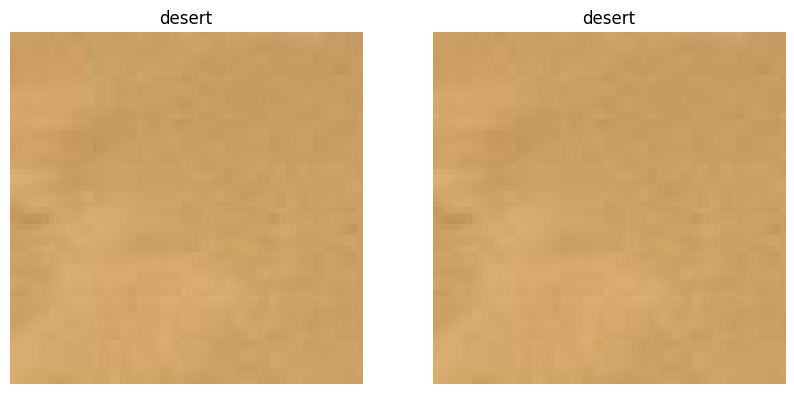

Test image 379 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


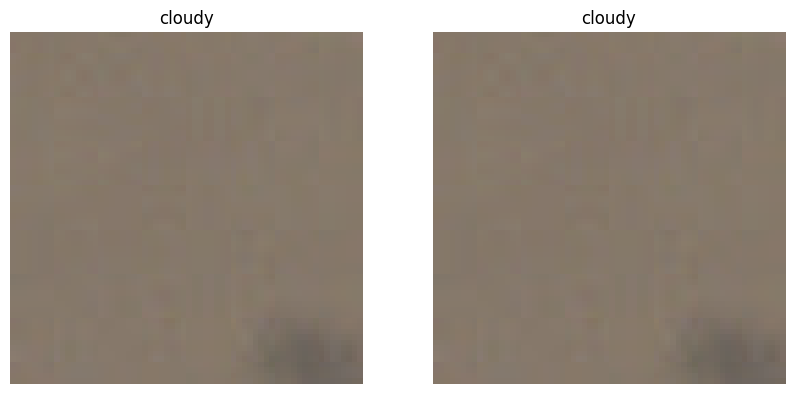

Test image 380 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


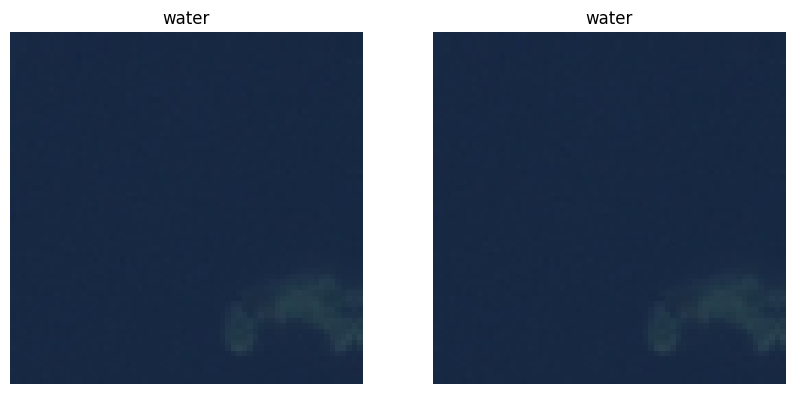

Test image 381 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


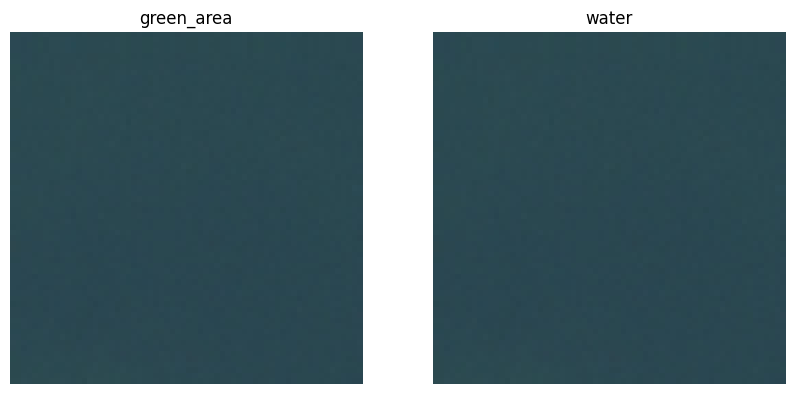

Test image 382 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


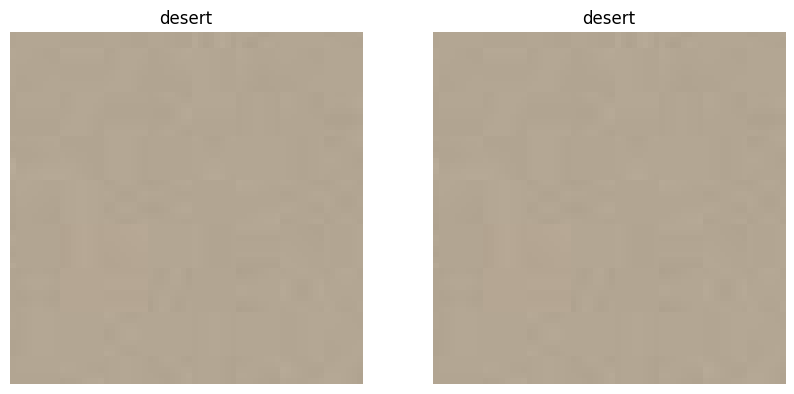

Test image 383 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


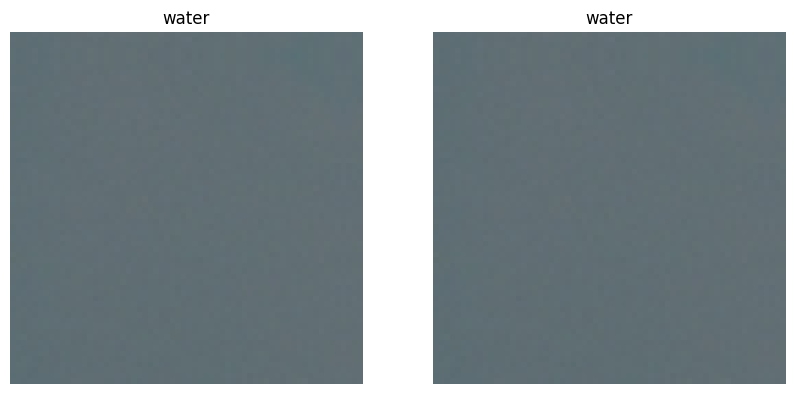

Test image 384 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


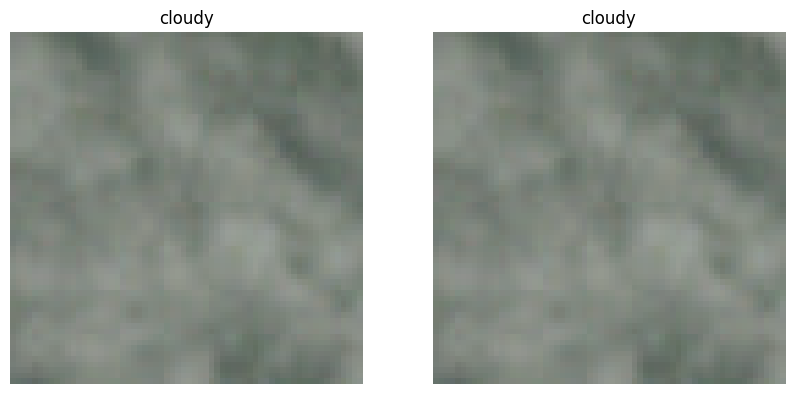

Test image 385 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


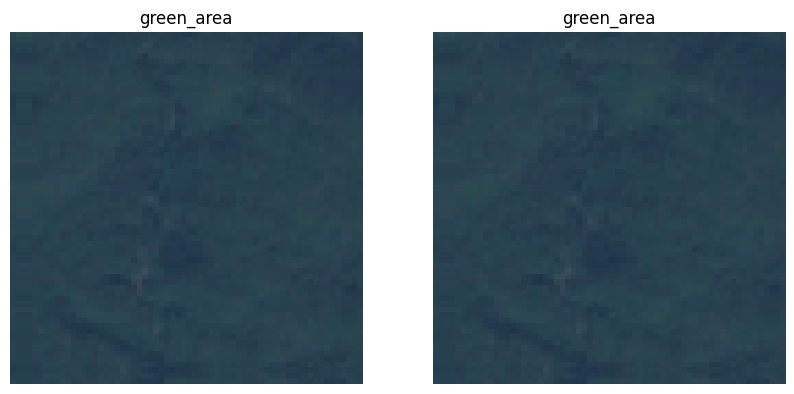

Test image 386 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


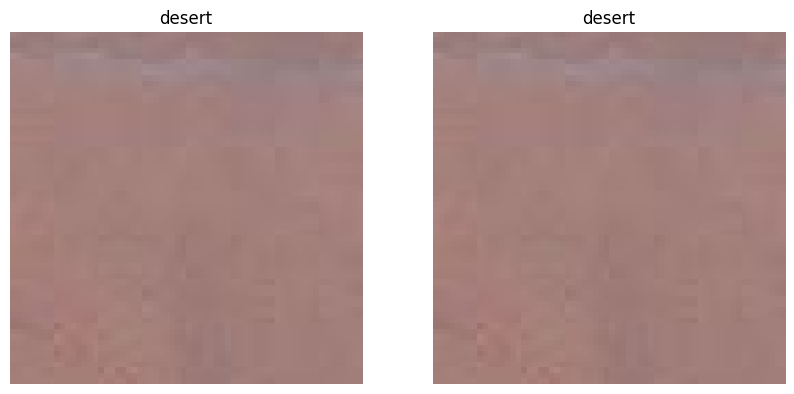

Test image 387 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


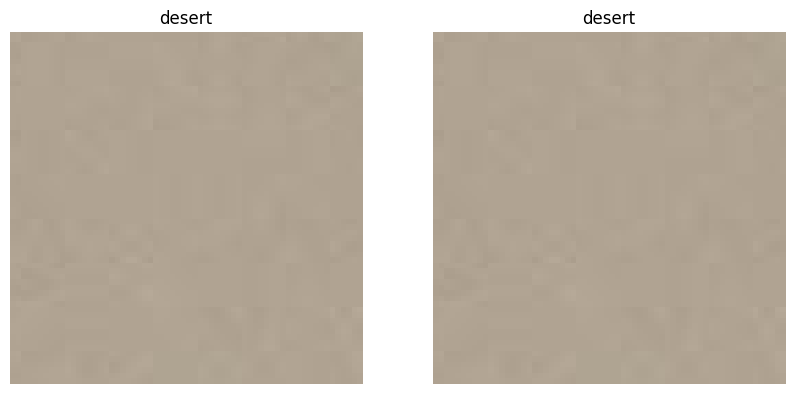

Test image 388 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


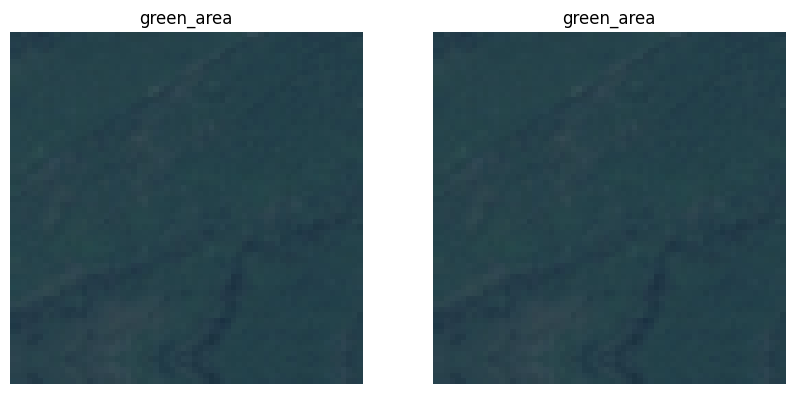

Test image 389 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


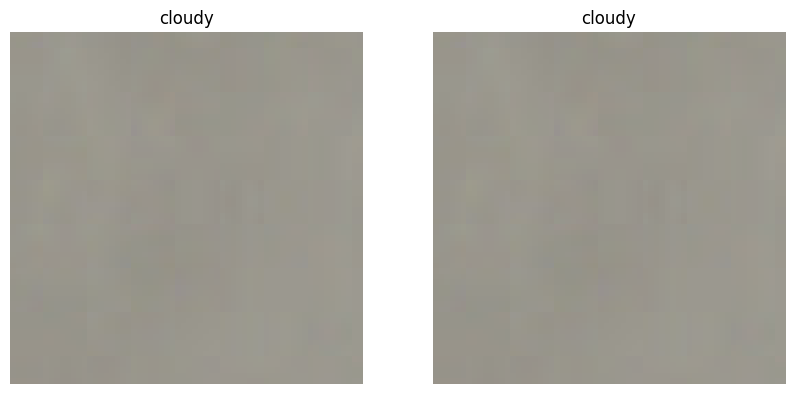

Test image 390 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


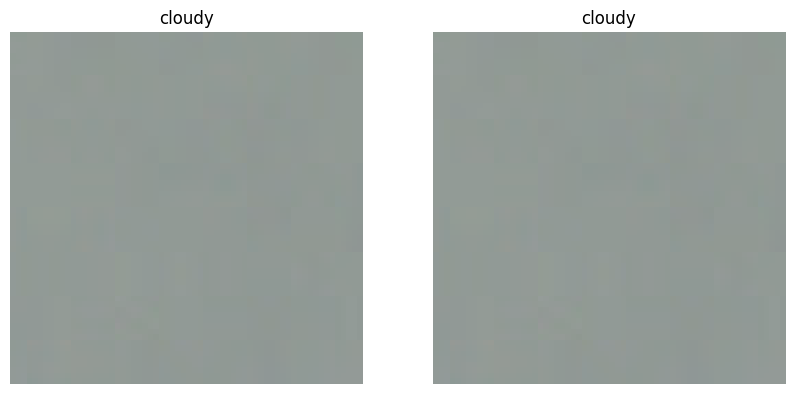

Test image 391 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


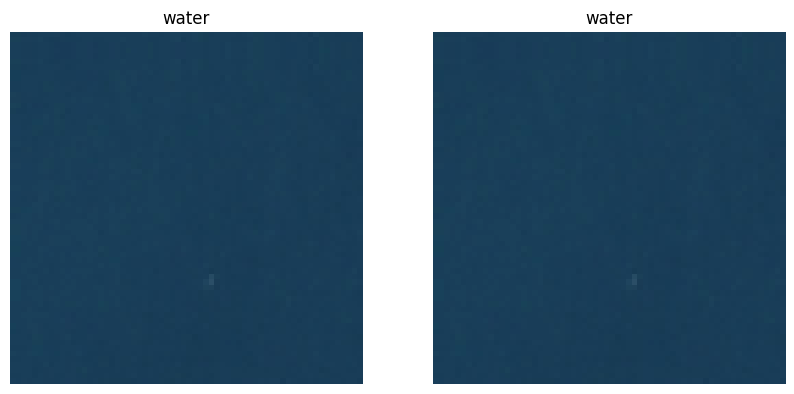

Test image 392 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


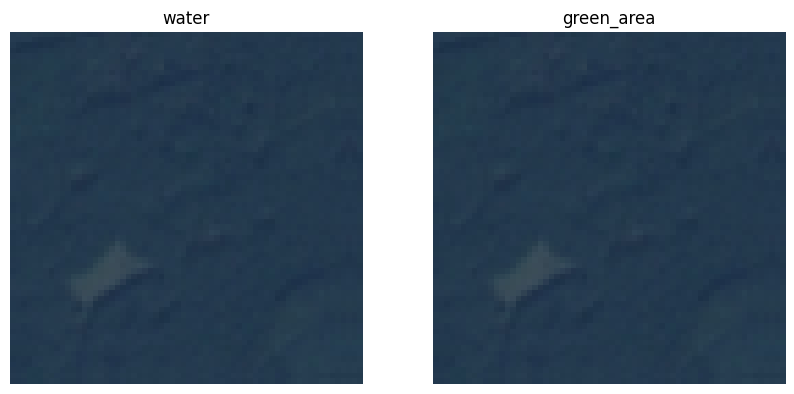

Test image 393 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


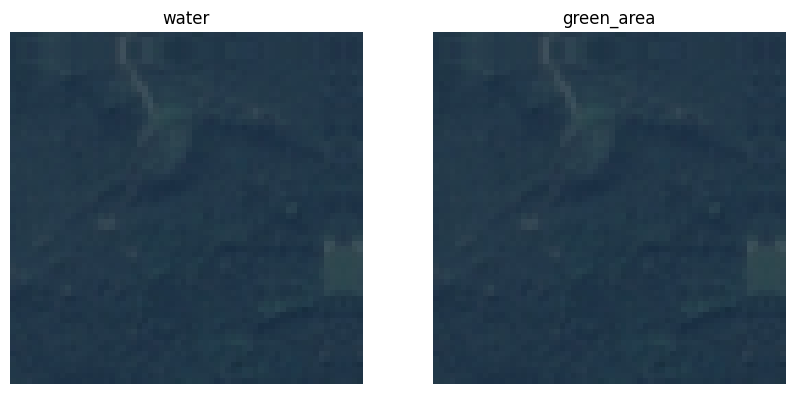

Test image 394 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


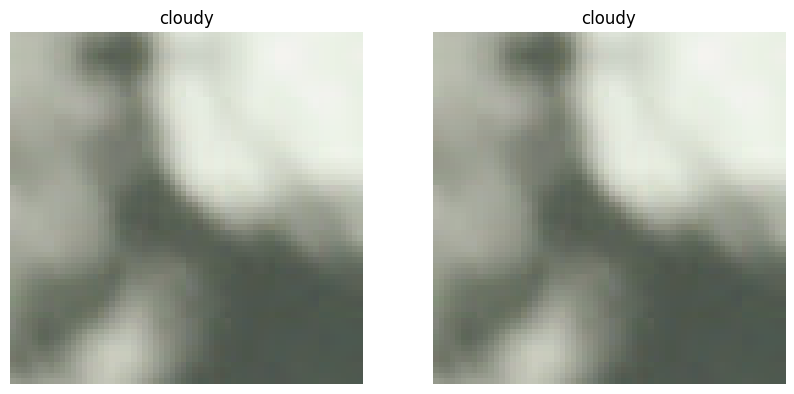

Test image 395 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


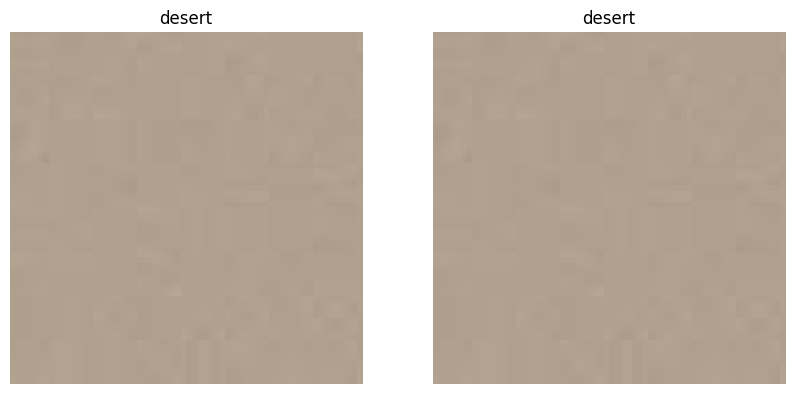

Test image 396 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


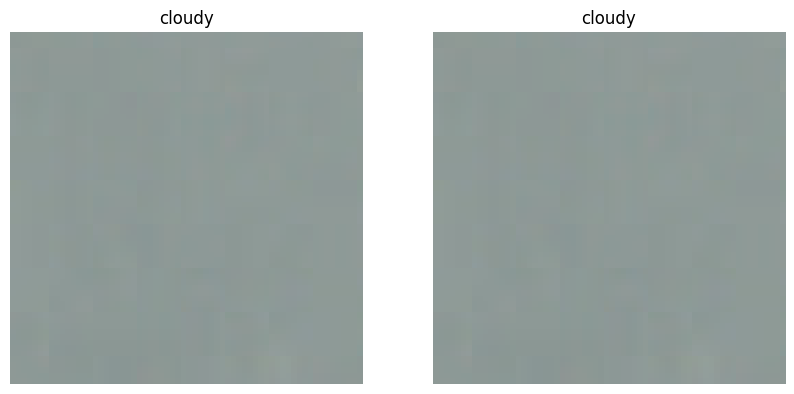

Test image 397 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


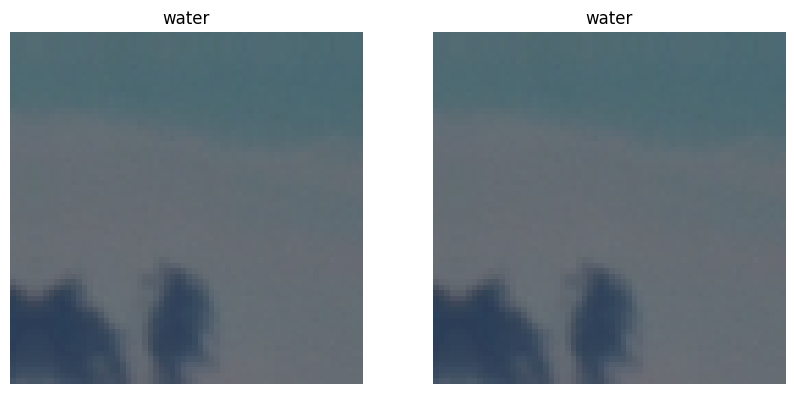

Test image 398 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


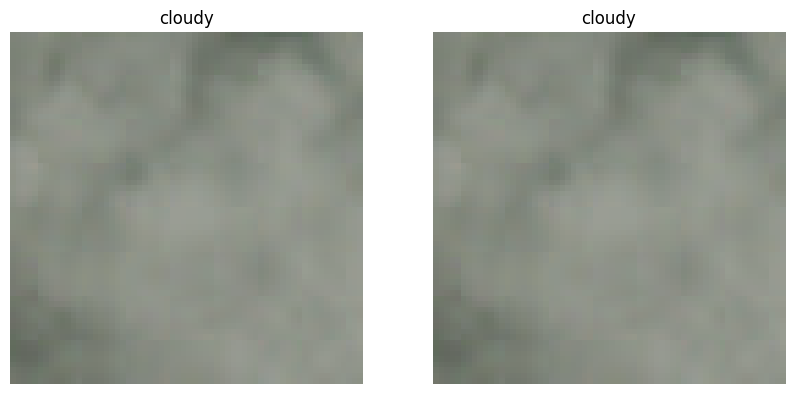

Test image 399 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


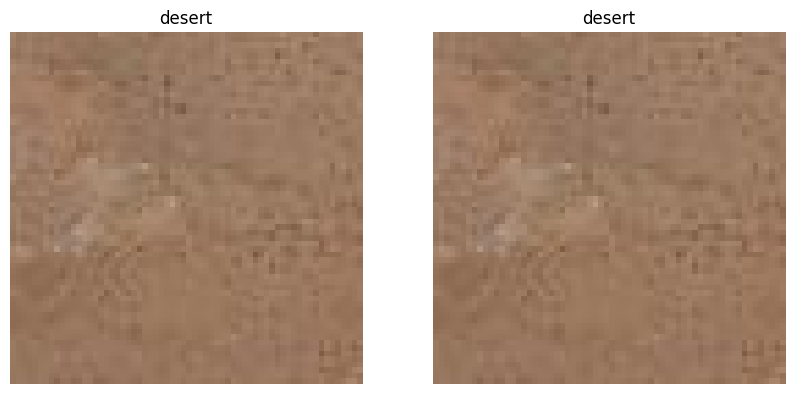

Test image 400 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


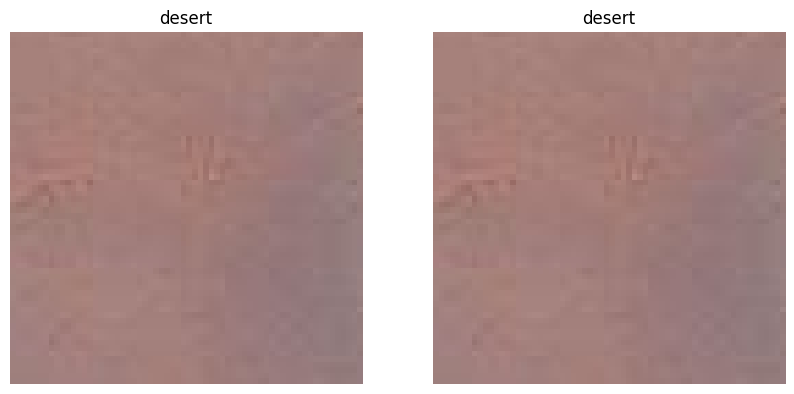

Test image 401 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


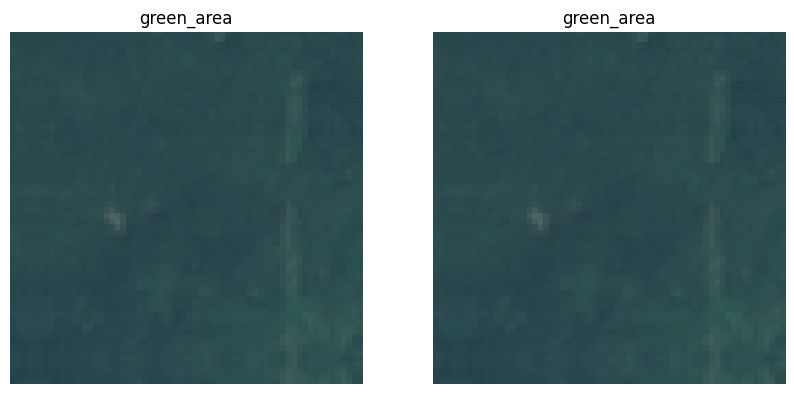

Test image 402 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


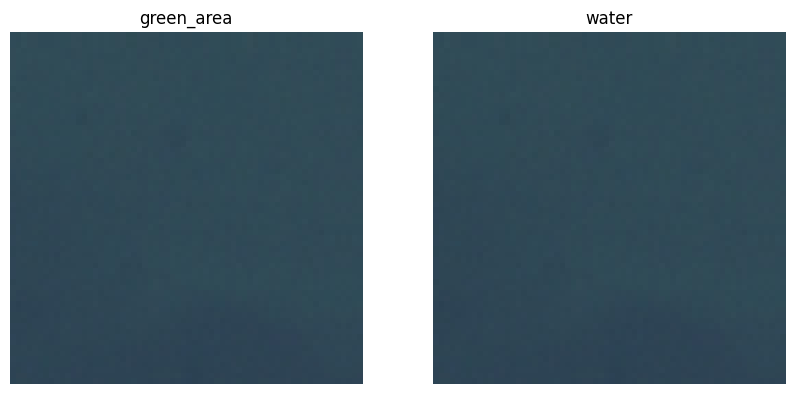

Test image 403 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


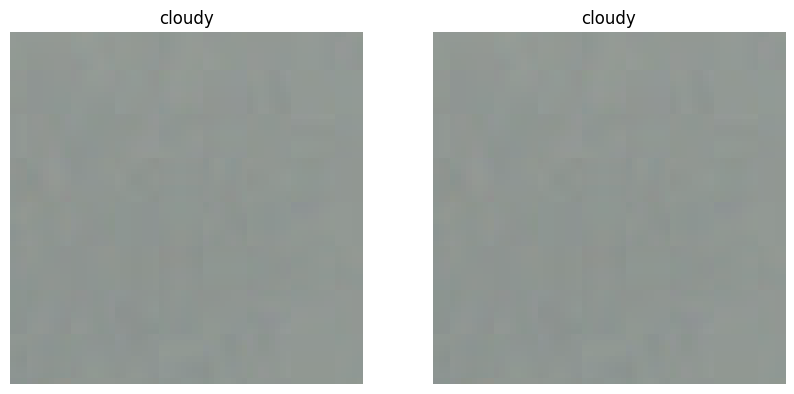

Test image 404 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


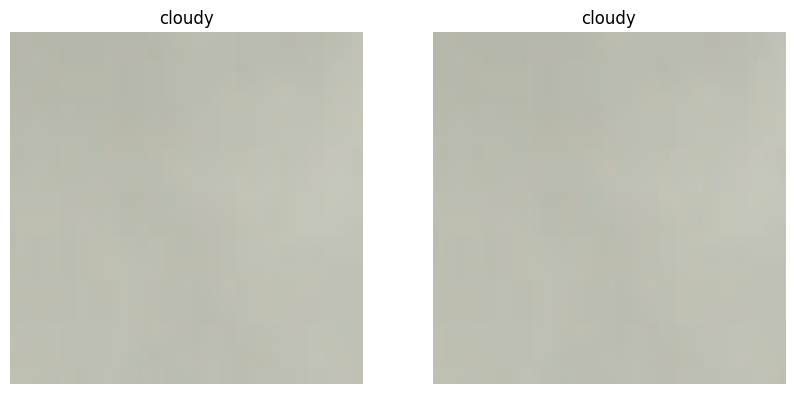

Test image 405 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


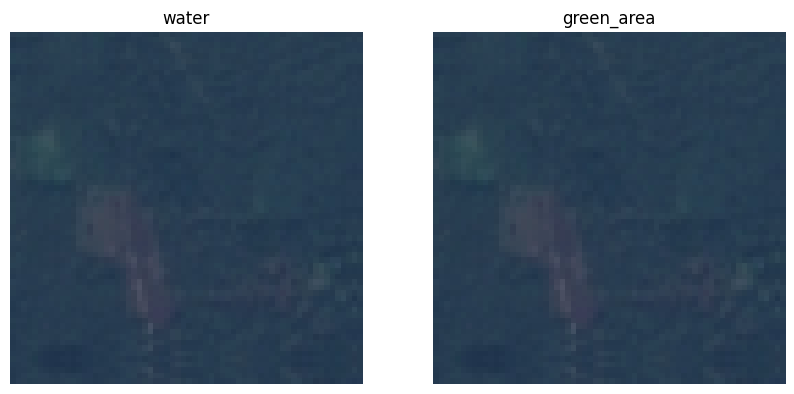

Test image 406 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


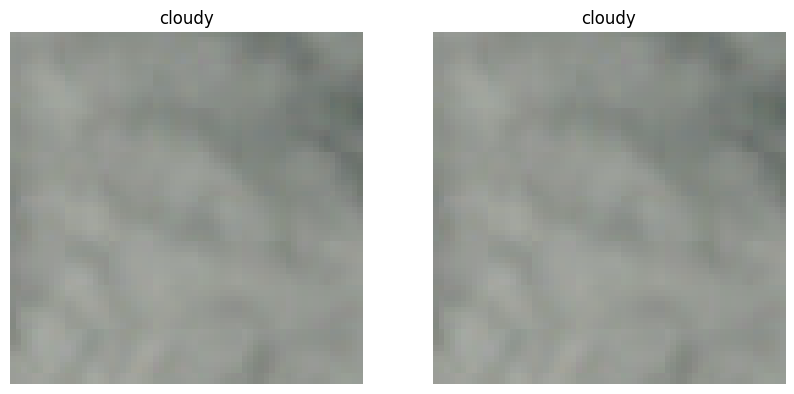

Test image 407 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


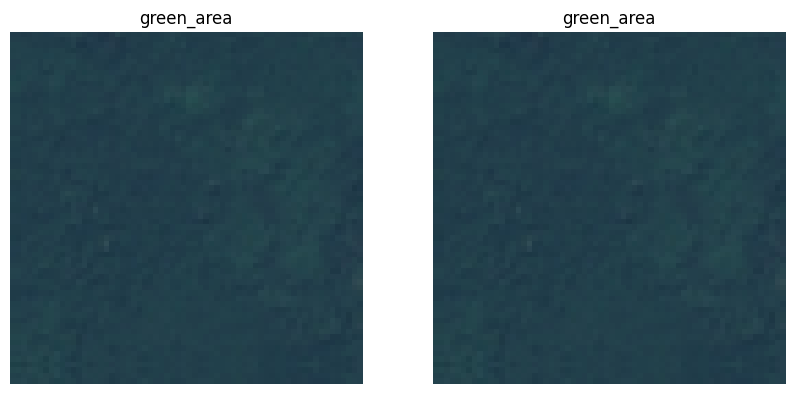

Test image 408 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


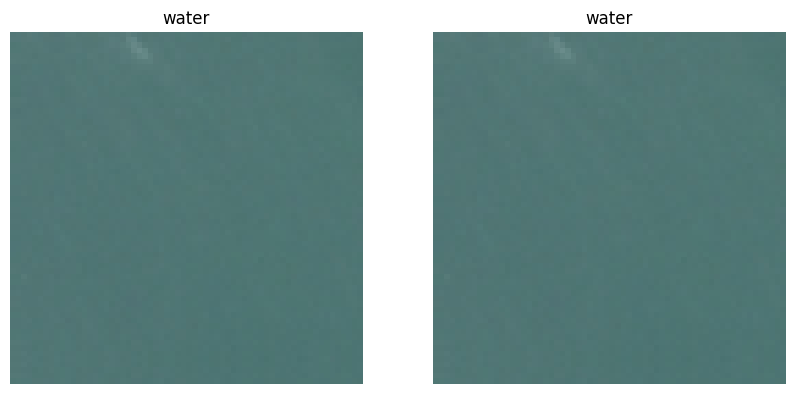

Test image 409 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


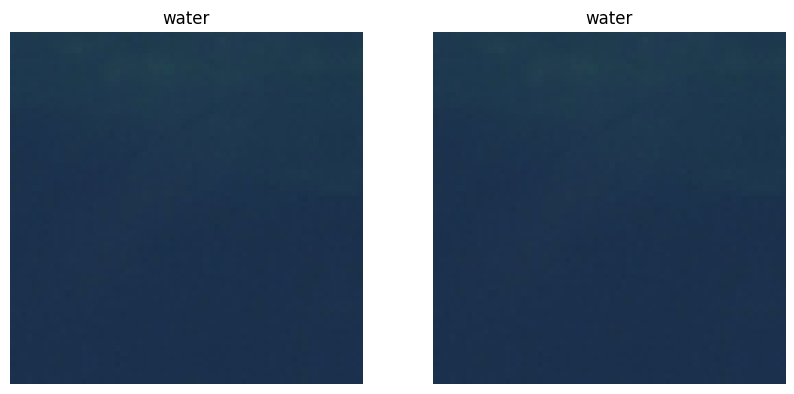

Test image 410 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


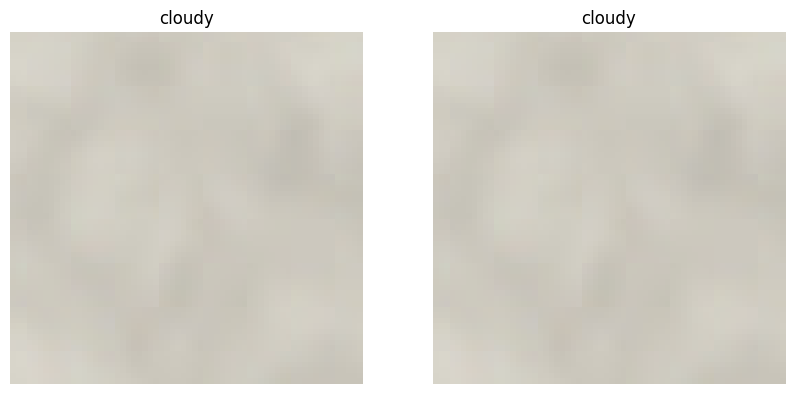

Test image 411 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


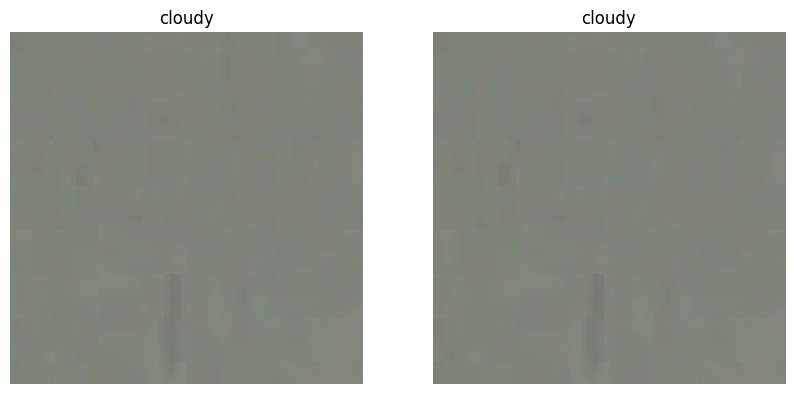

Test image 412 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


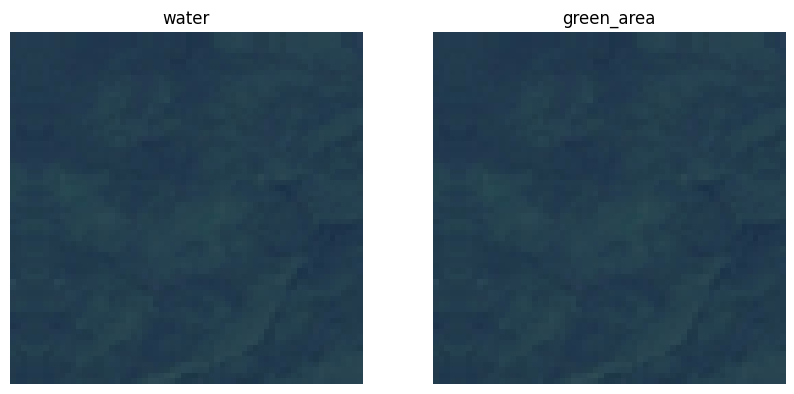

Test image 413 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


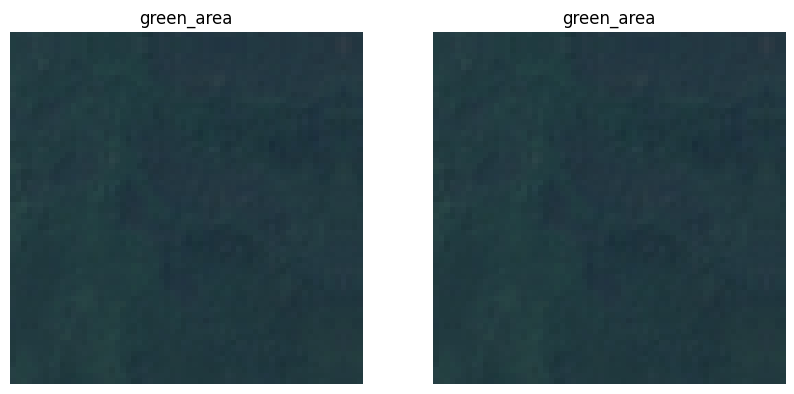

Test image 414 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


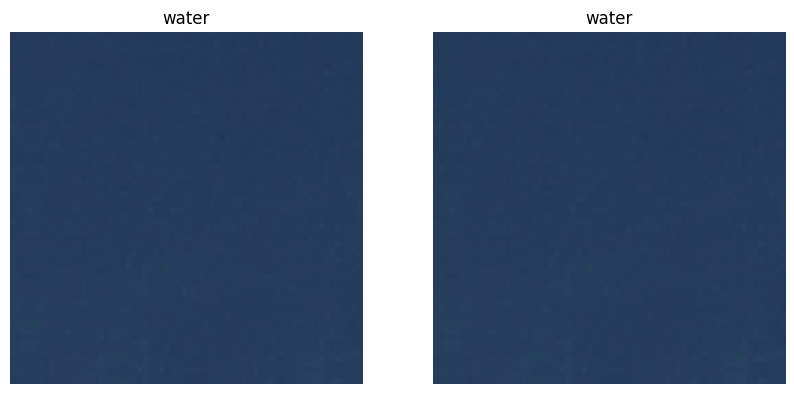

Test image 415 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


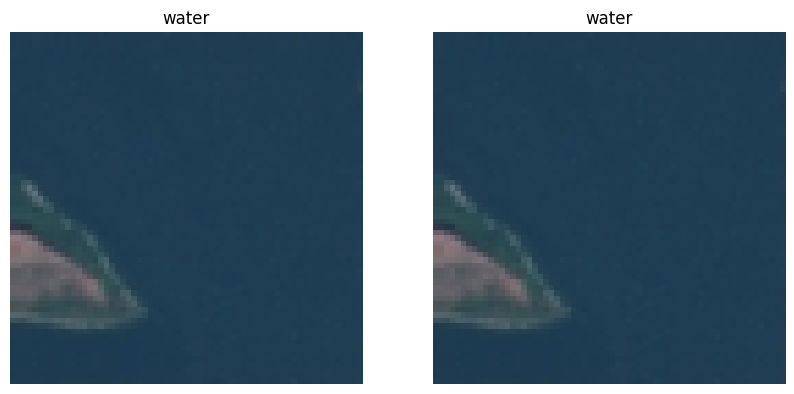

Test image 416 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


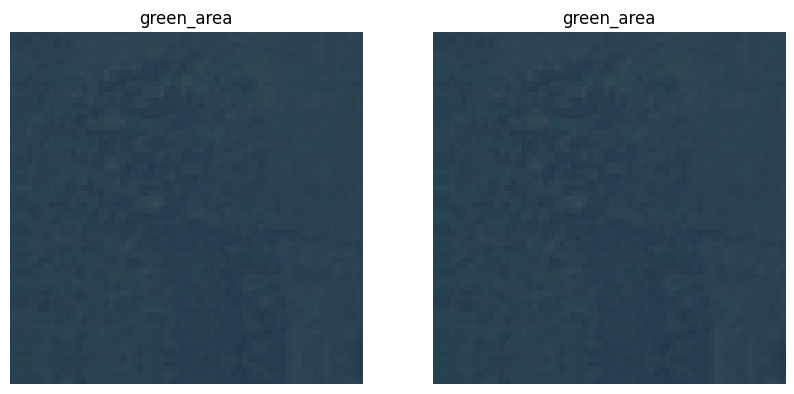

Test image 417 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


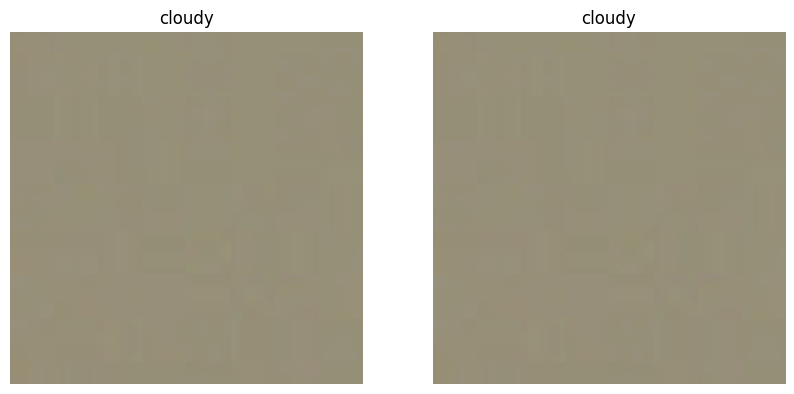

Test image 418 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


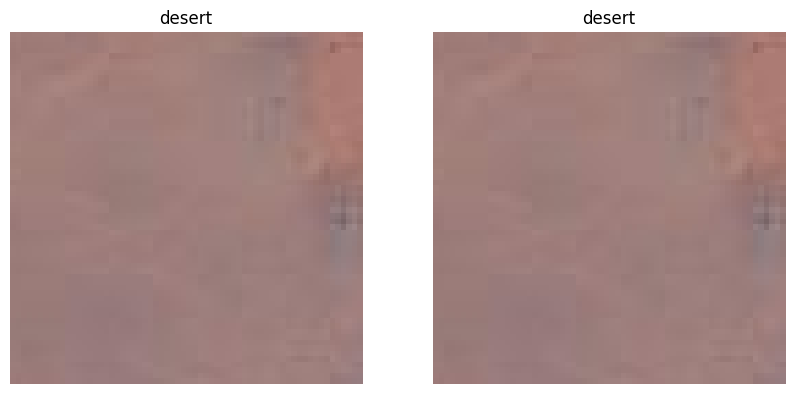

Test image 419 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


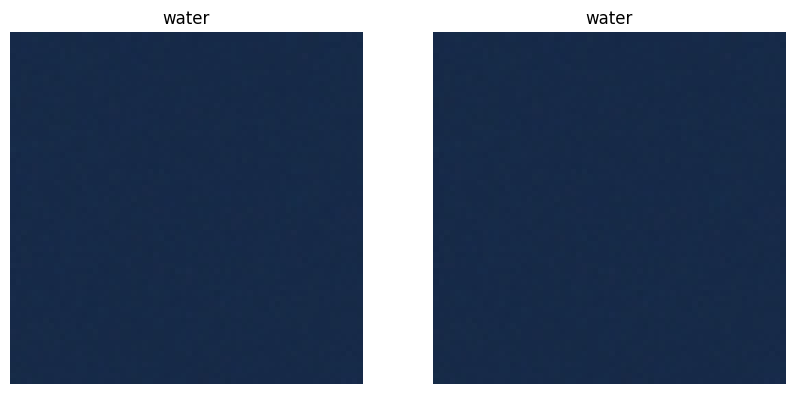

Test image 420 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


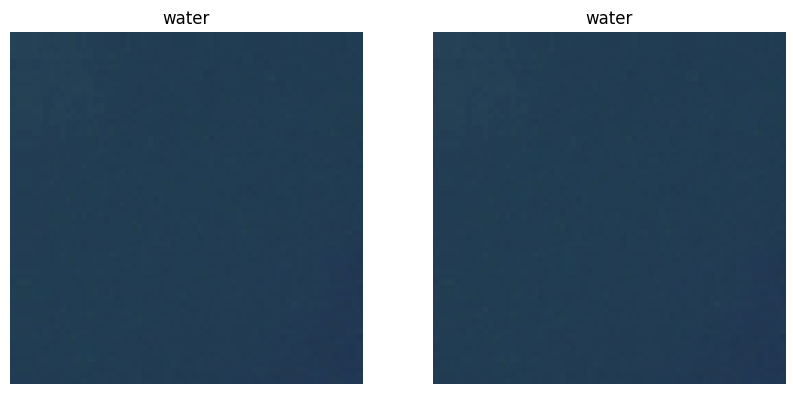

Test image 421 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


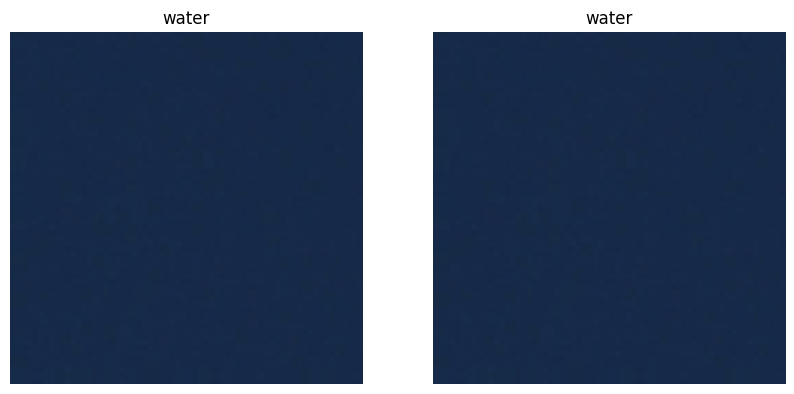

Test image 422 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


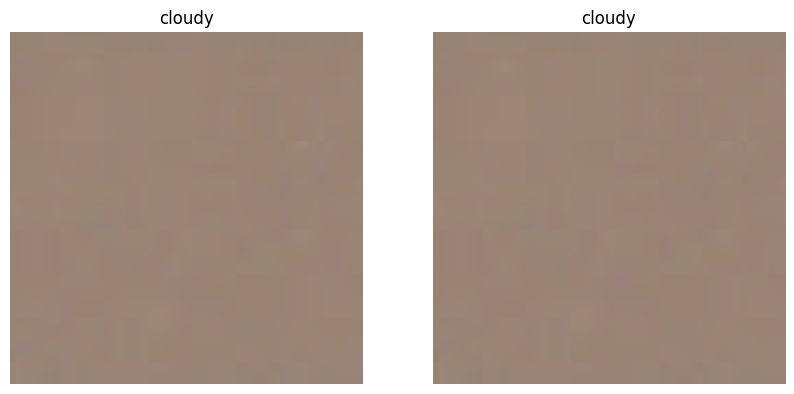

Test image 423 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


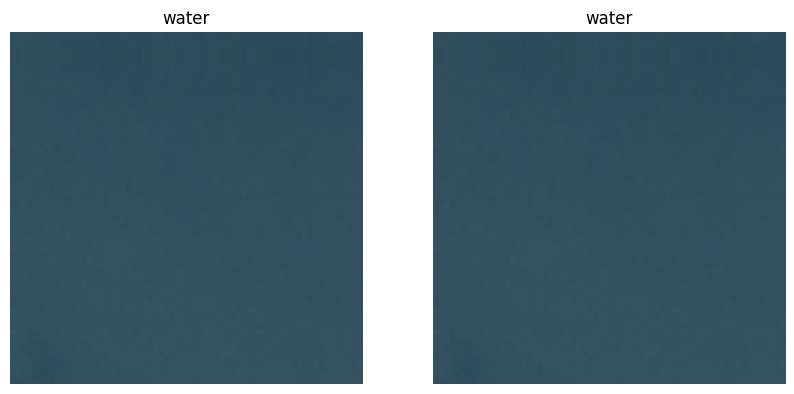

Test image 424 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


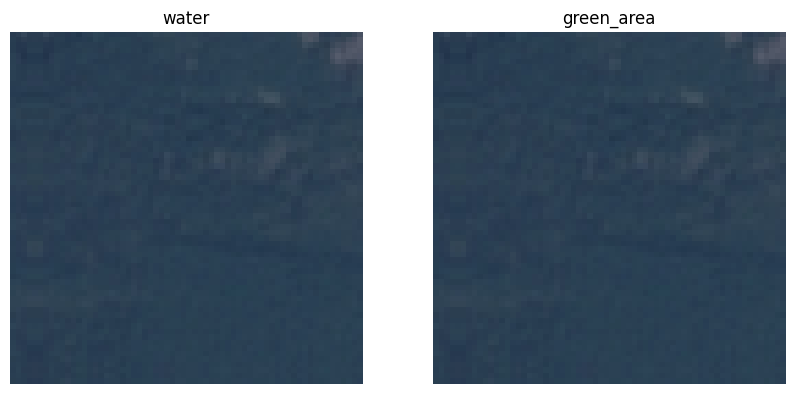

Test image 425 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


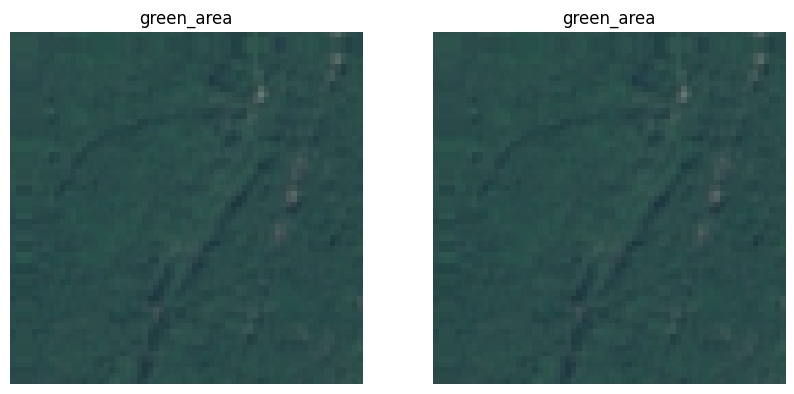

Test image 426 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


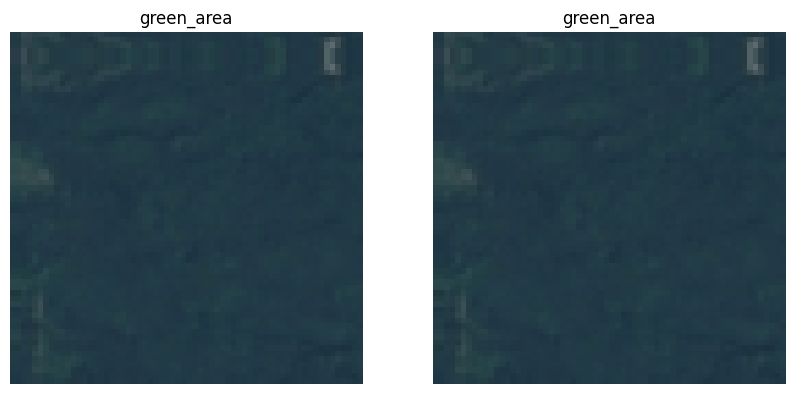

Test image 427 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


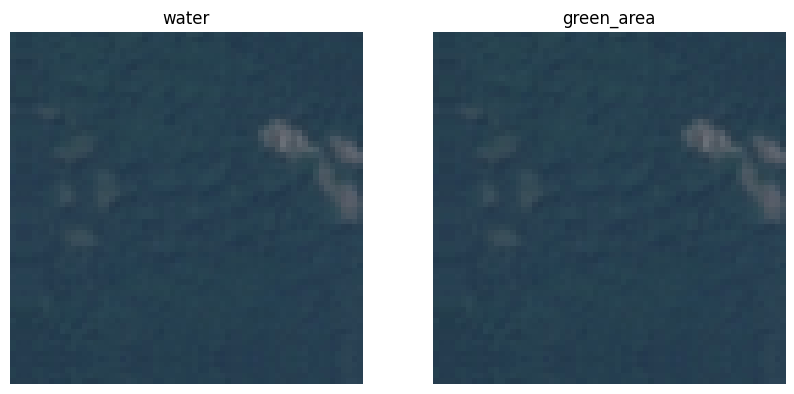

Test image 428 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


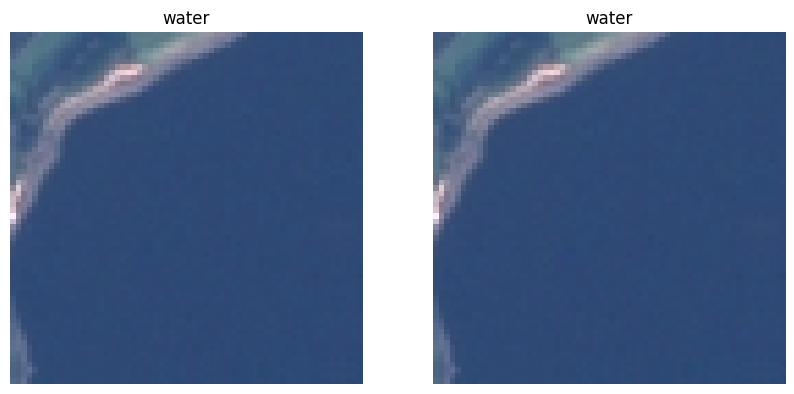

Test image 429 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


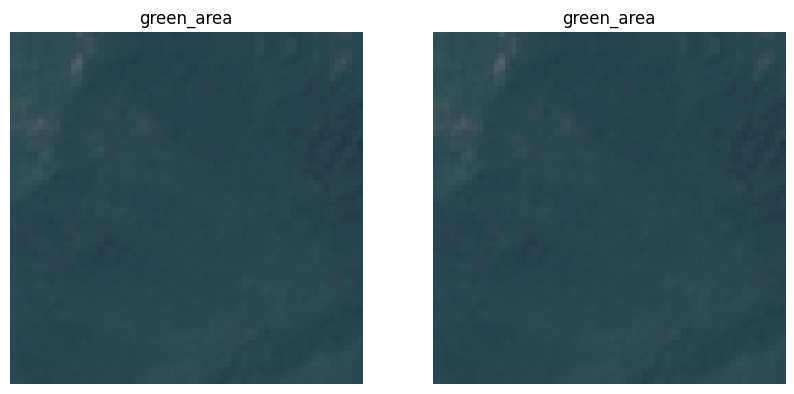

Test image 430 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


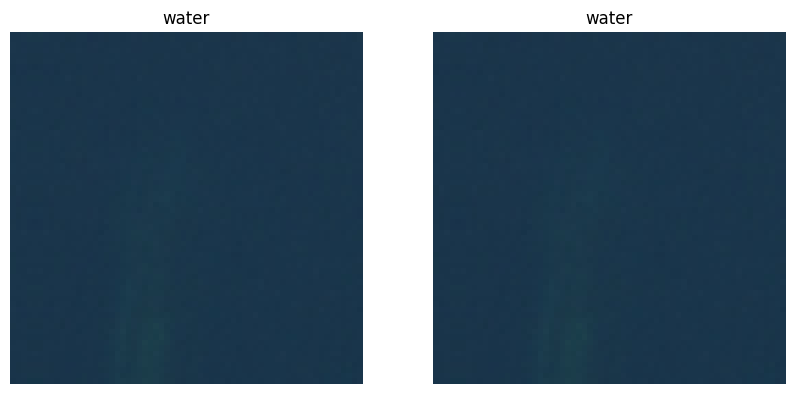

Test image 431 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


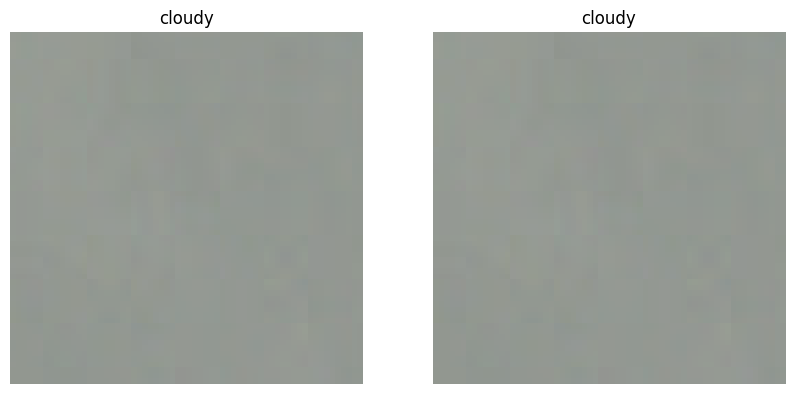

Test image 432 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


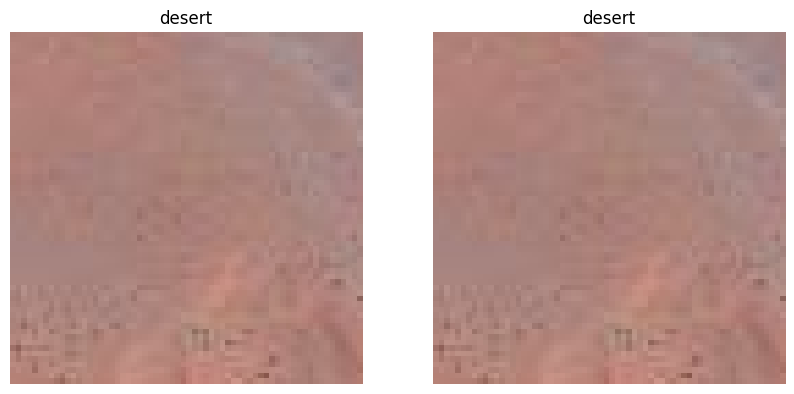

Test image 433 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


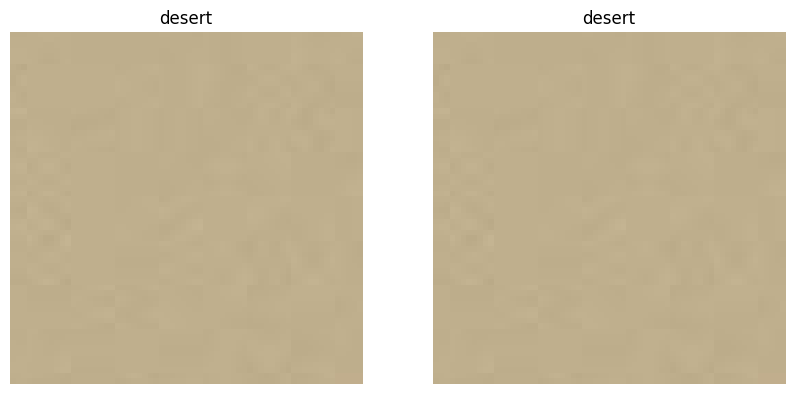

Test image 434 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


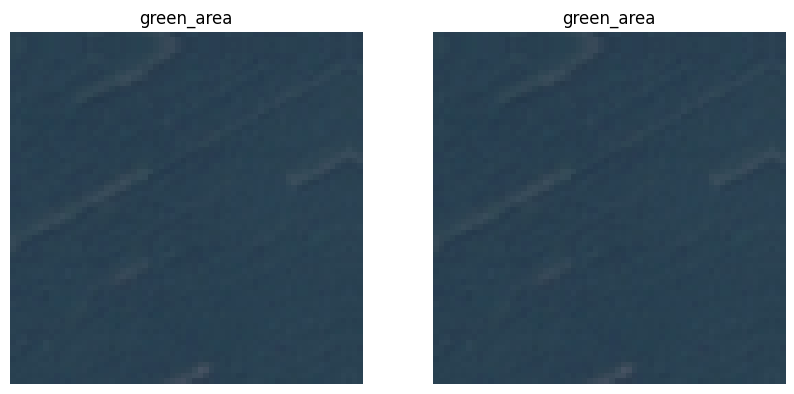

Test image 435 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


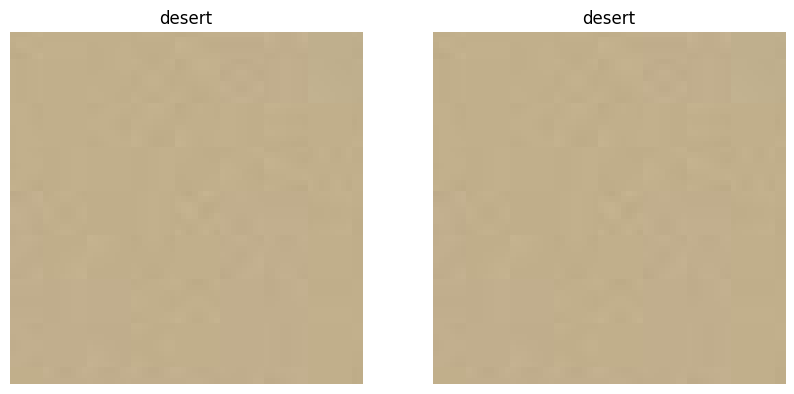

Test image 436 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


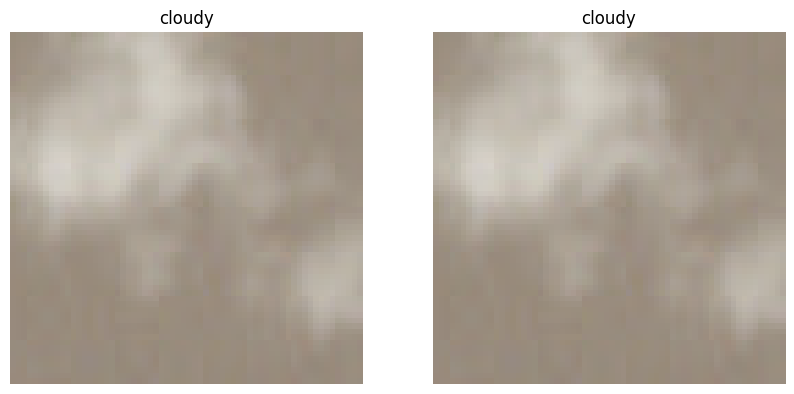

Test image 437 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


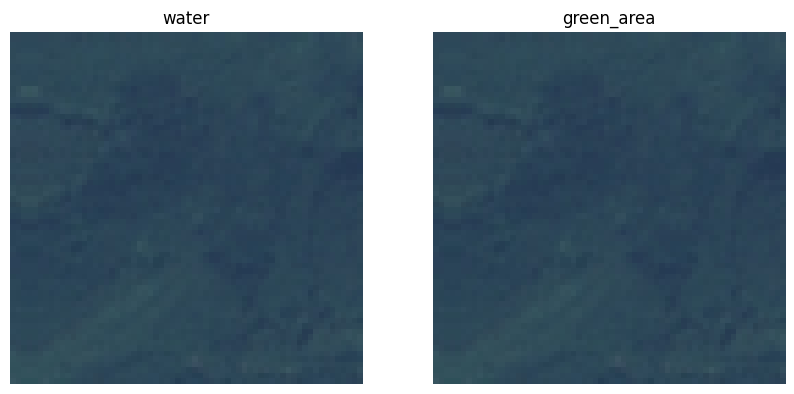

Test image 438 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


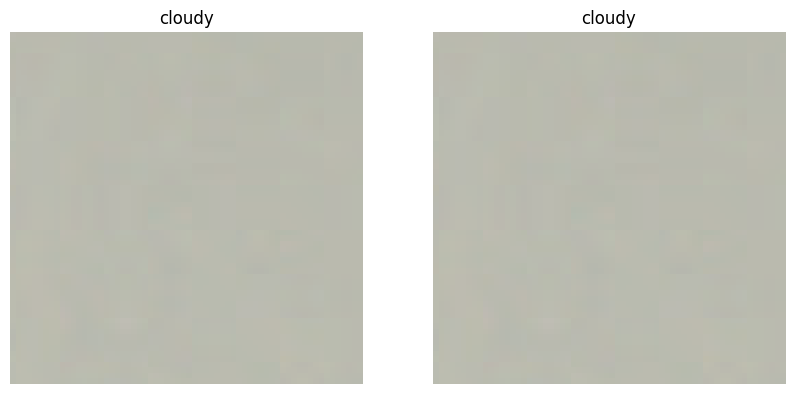

Test image 439 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


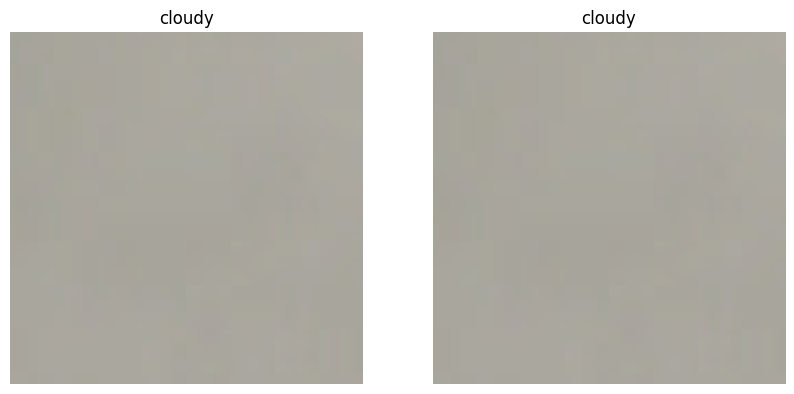

Test image 440 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


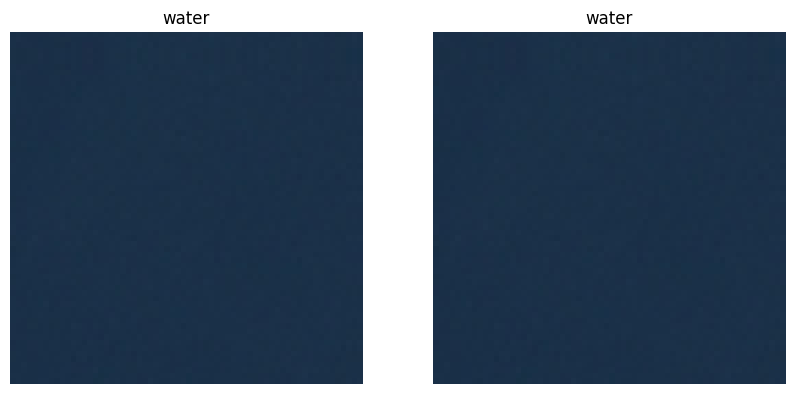

Test image 441 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


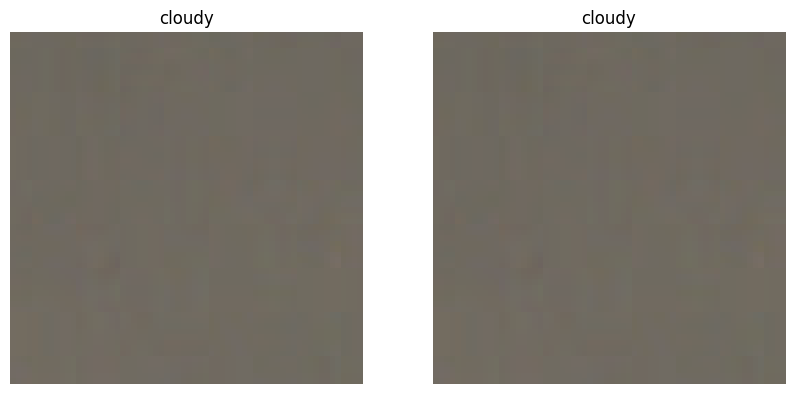

Test image 442 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


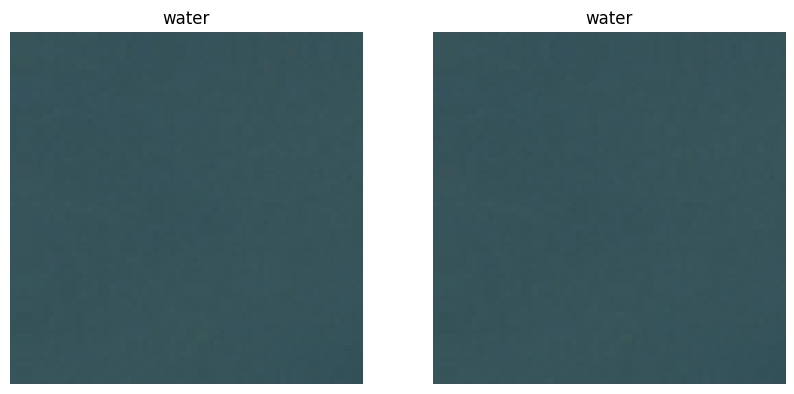

Test image 443 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


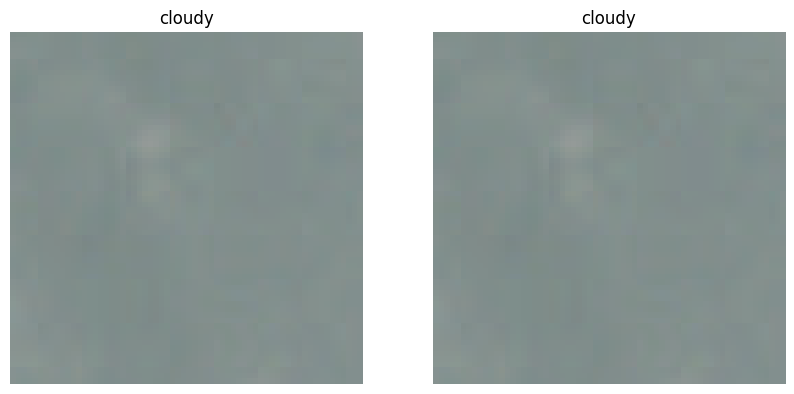

Test image 444 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


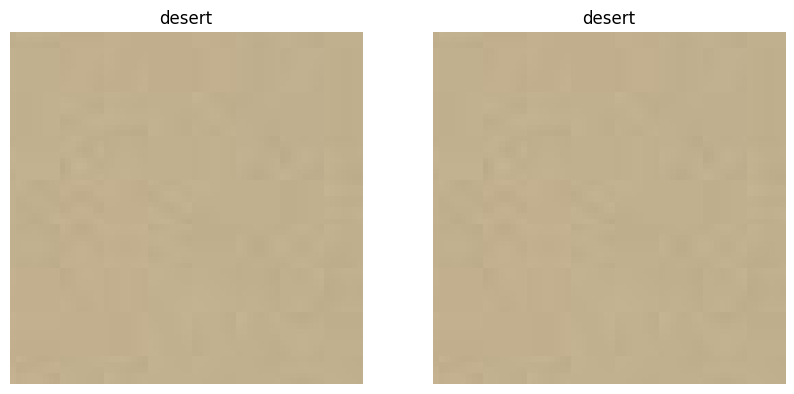

Test image 445 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


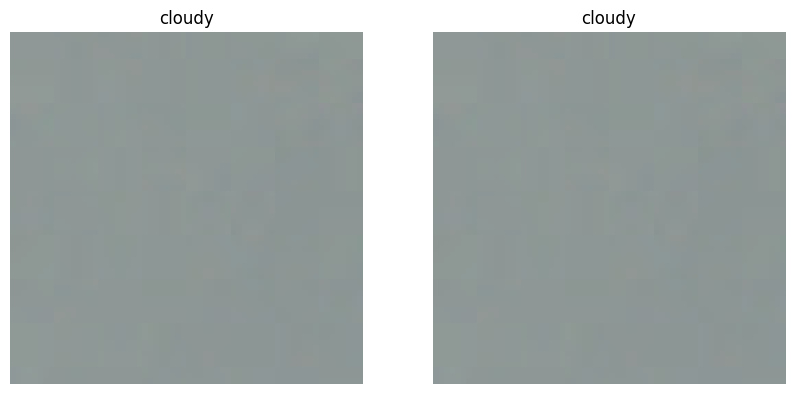

Test image 446 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


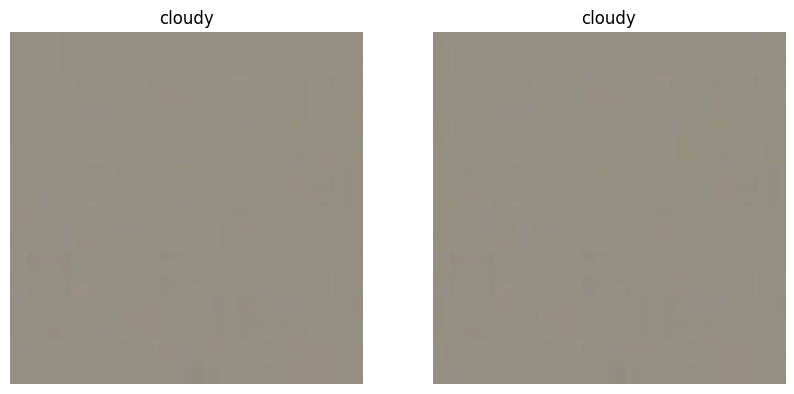

Test image 447 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


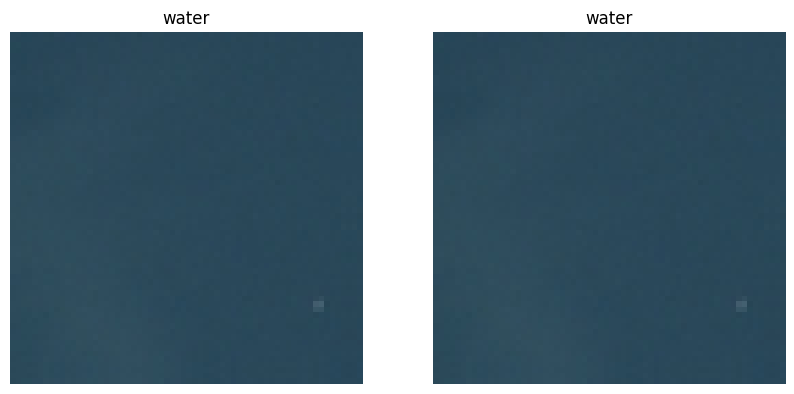

Test image 448 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


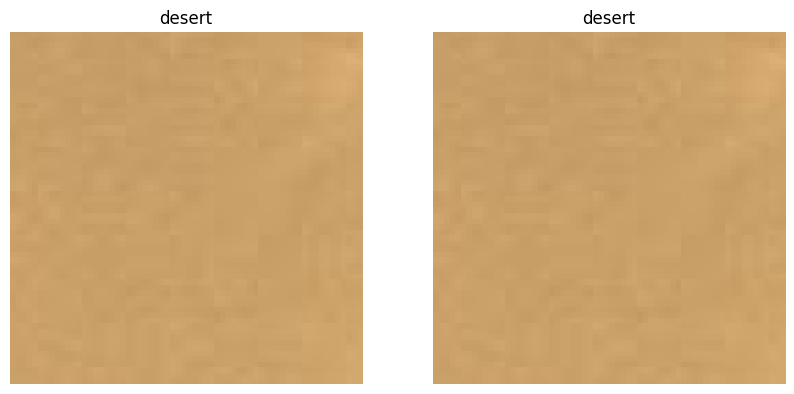

Test image 449 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


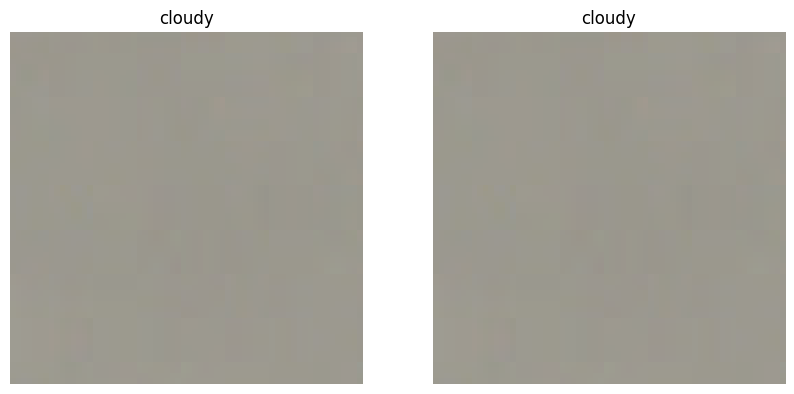

Test image 450 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


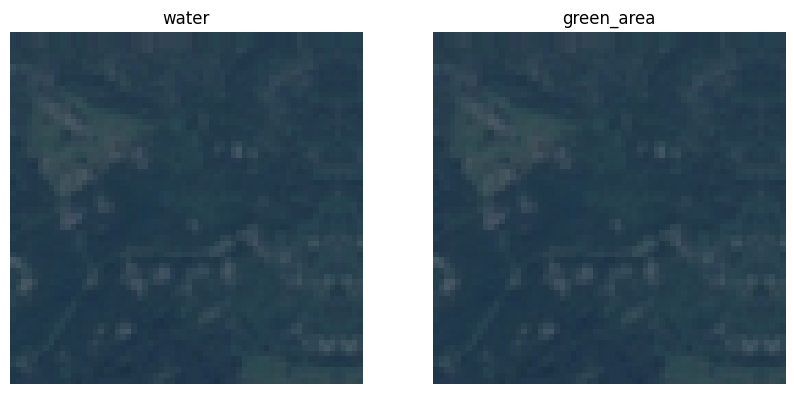

Test image 451 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


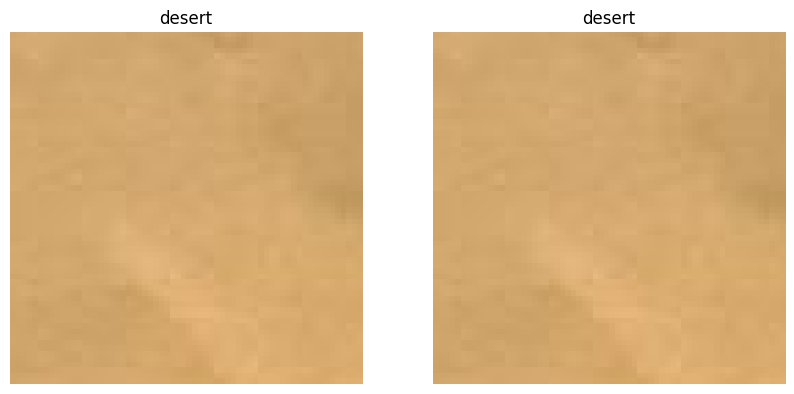

Test image 452 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


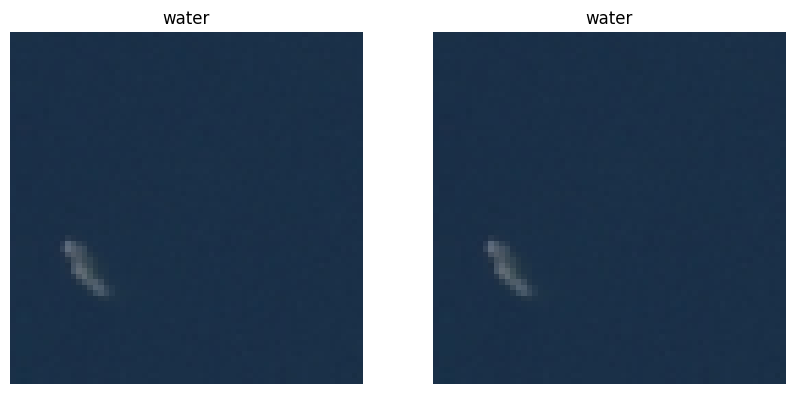

Test image 453 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


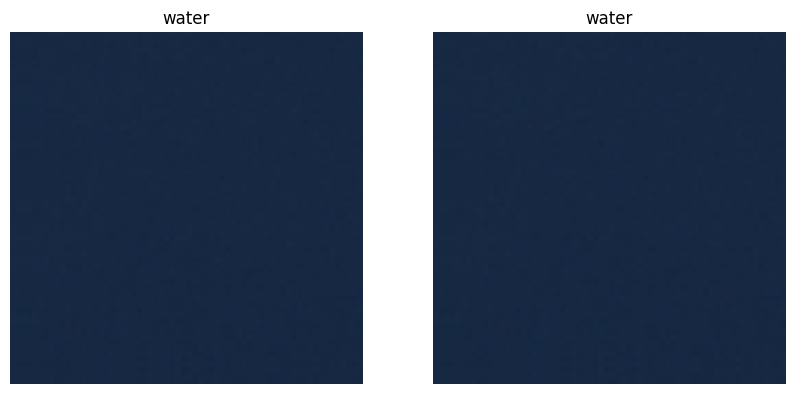

Test image 454 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


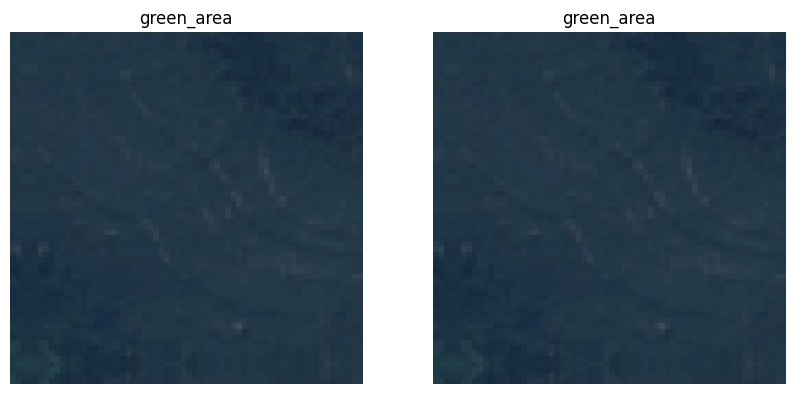

Test image 455 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


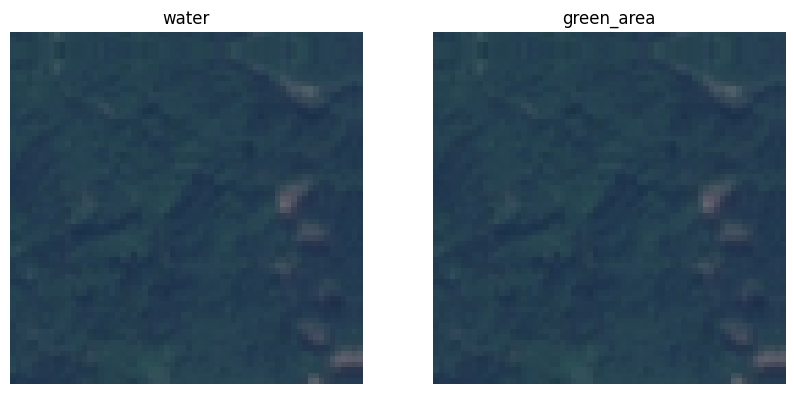

Test image 456 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


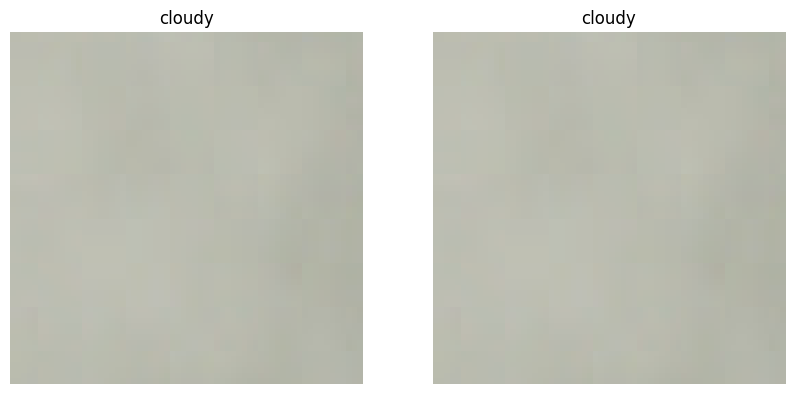

Test image 457 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


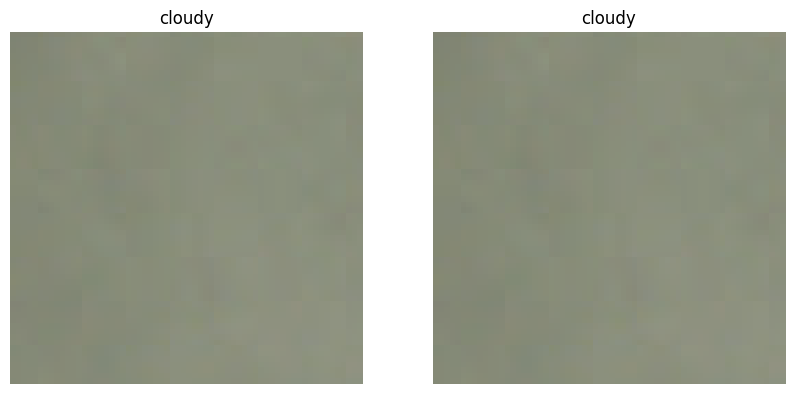

Test image 458 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


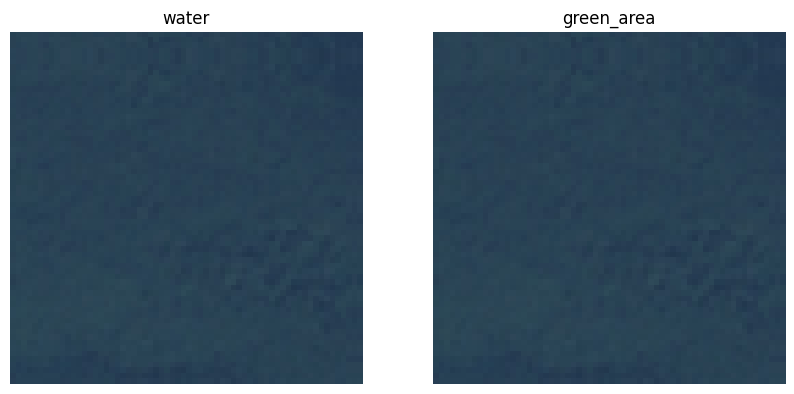

Test image 459 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


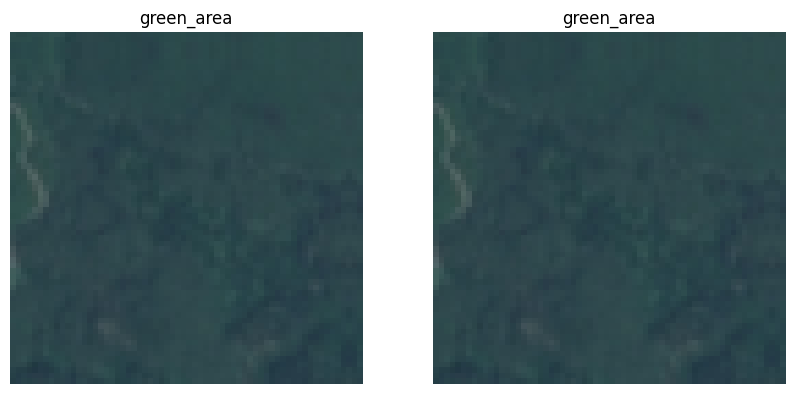

Test image 460 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


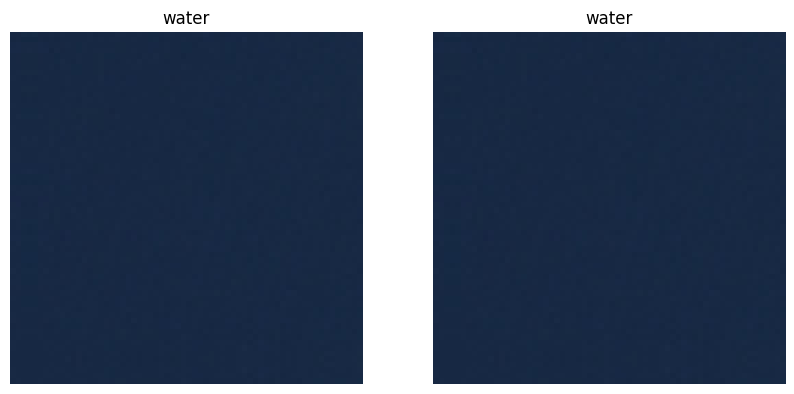

Test image 461 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


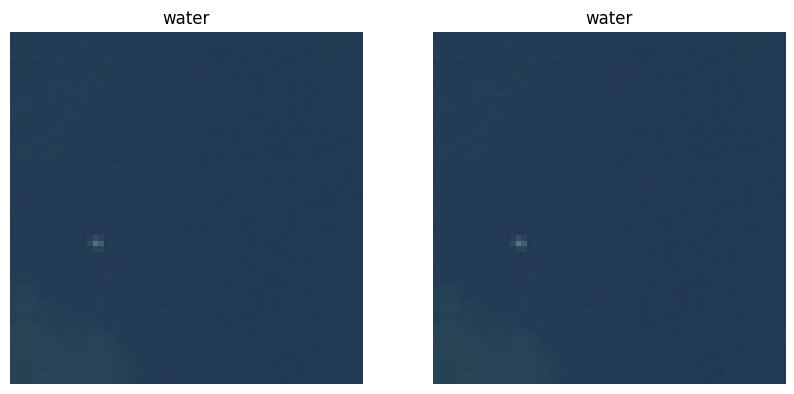

Test image 462 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


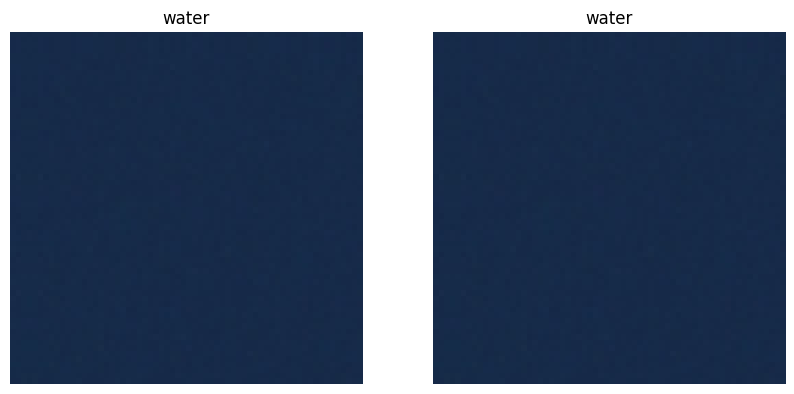

Test image 463 , Result: Wrong Predicted: cloudy , Real Class: desert
Predicted Class Image vs Real Class Image:


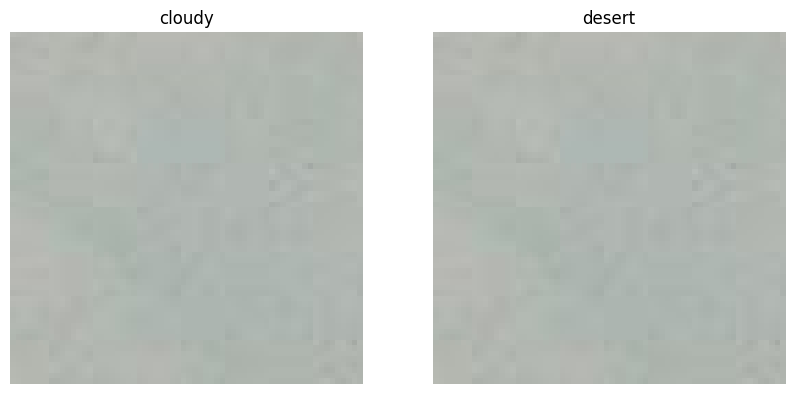

Test image 464 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


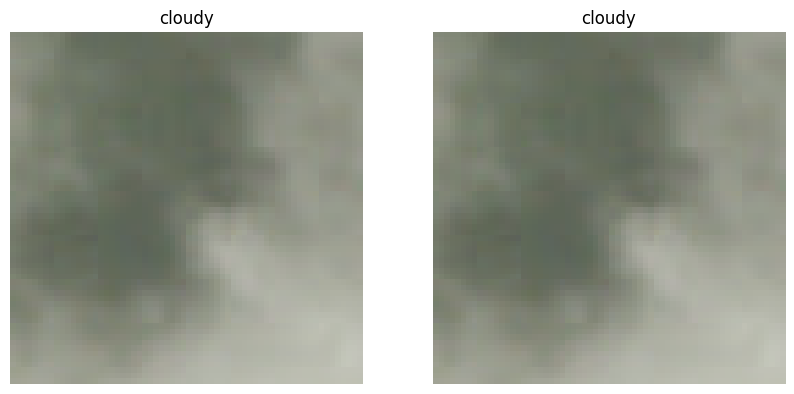

Test image 465 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


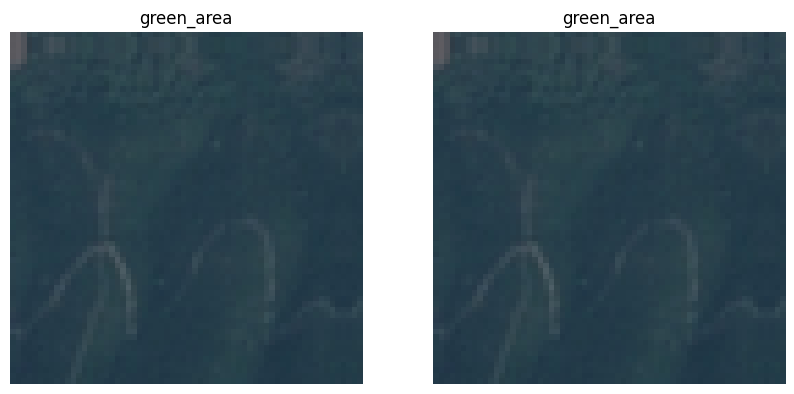

Test image 466 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


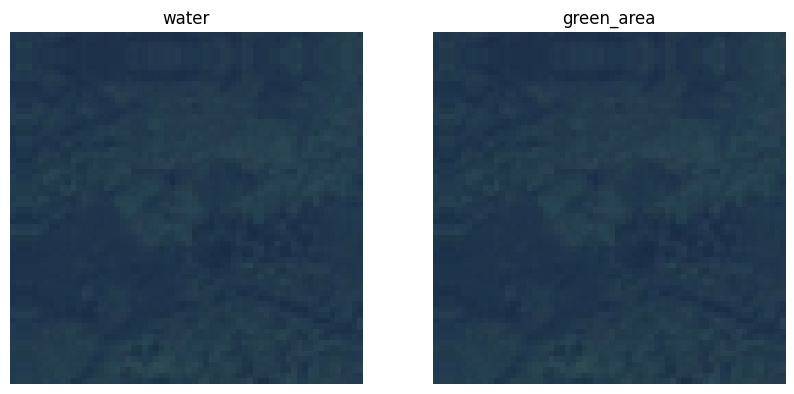

Test image 467 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


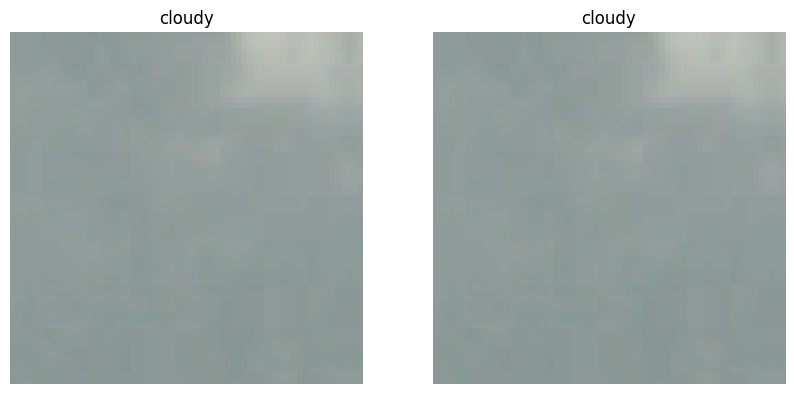

Test image 468 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


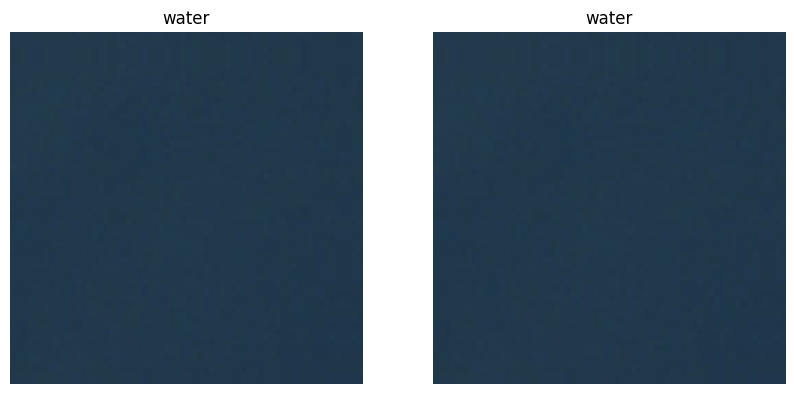

Test image 469 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


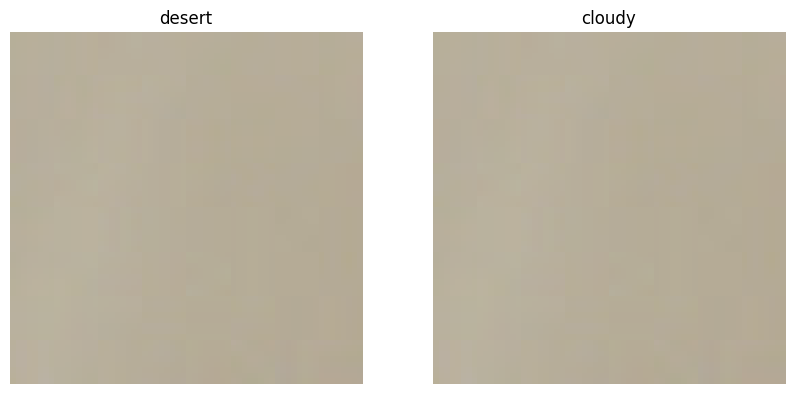

Test image 470 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


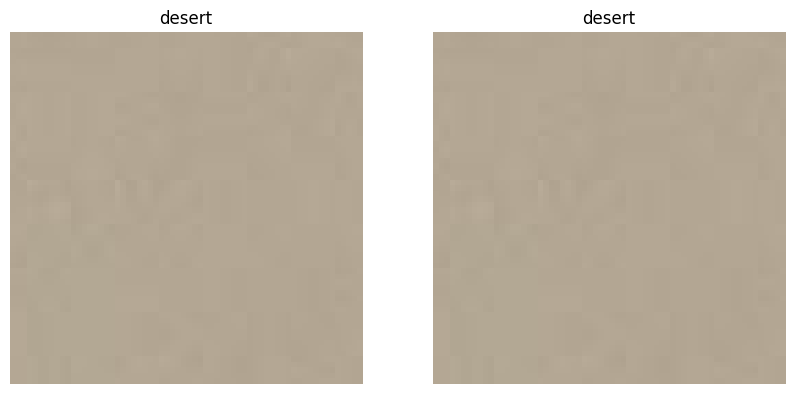

Test image 471 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


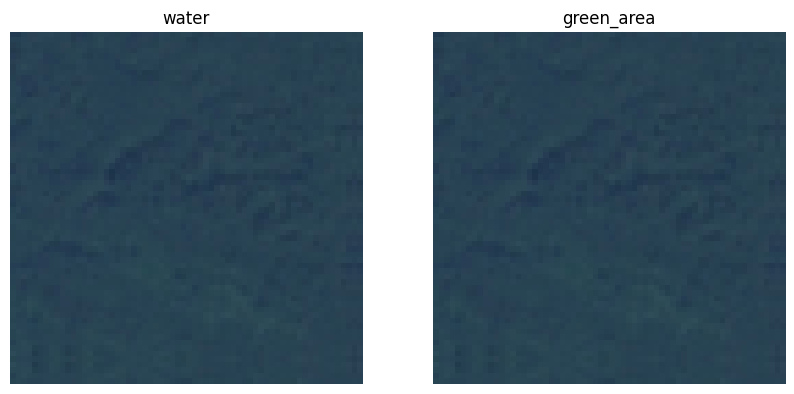

Test image 472 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


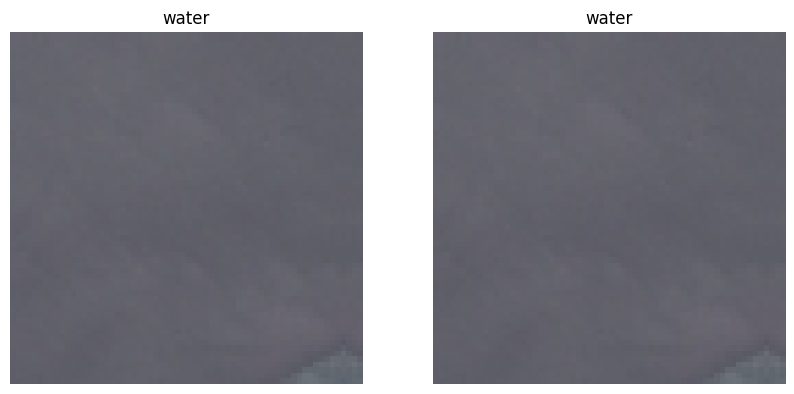

Test image 473 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


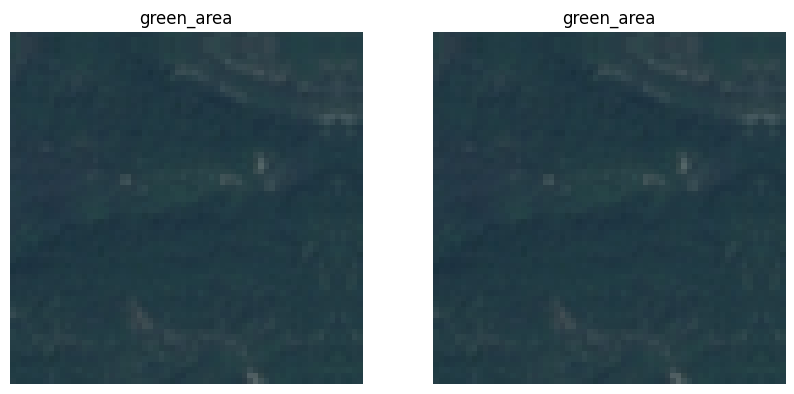

Test image 474 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


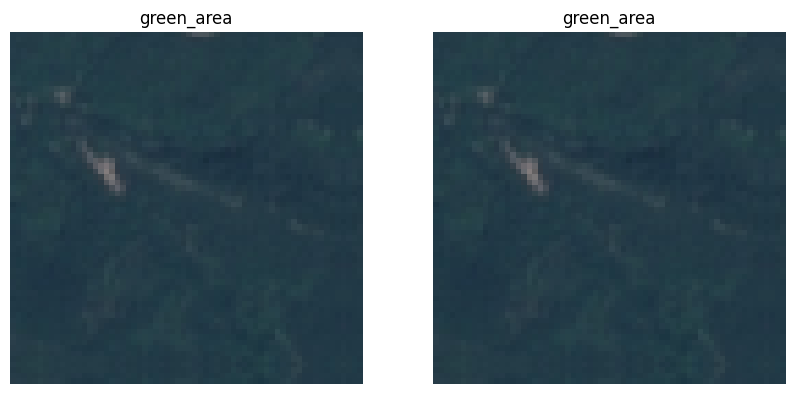

Test image 475 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


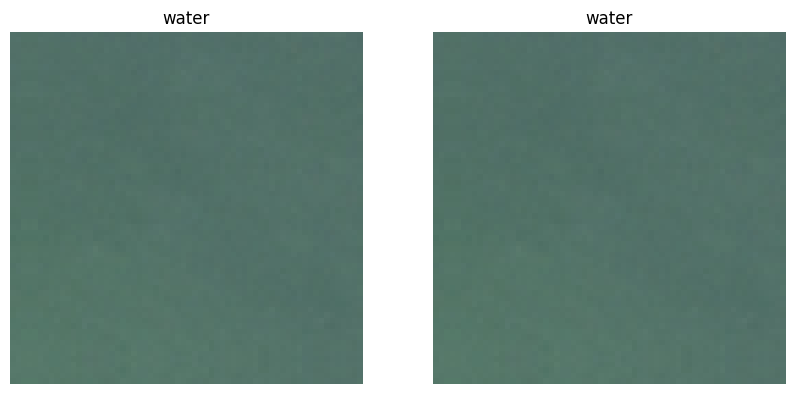

Test image 476 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


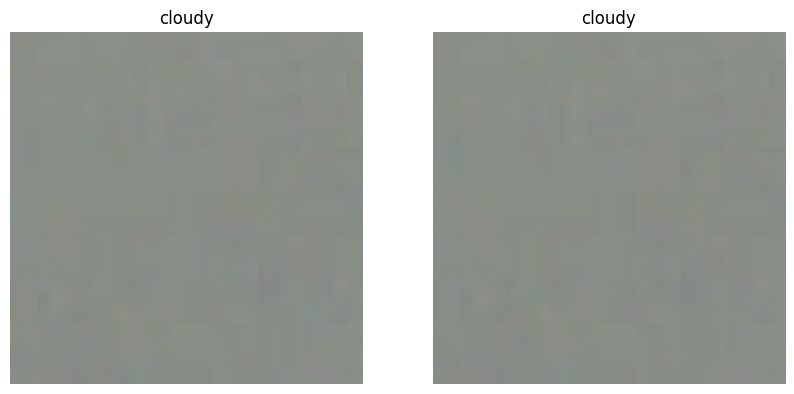

Test image 477 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


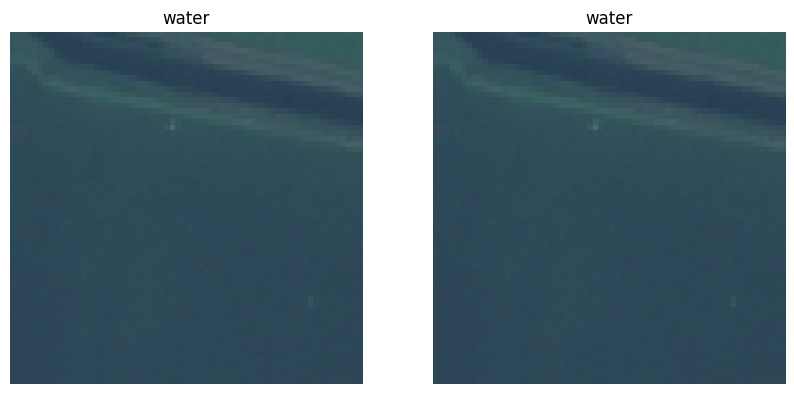

Test image 478 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


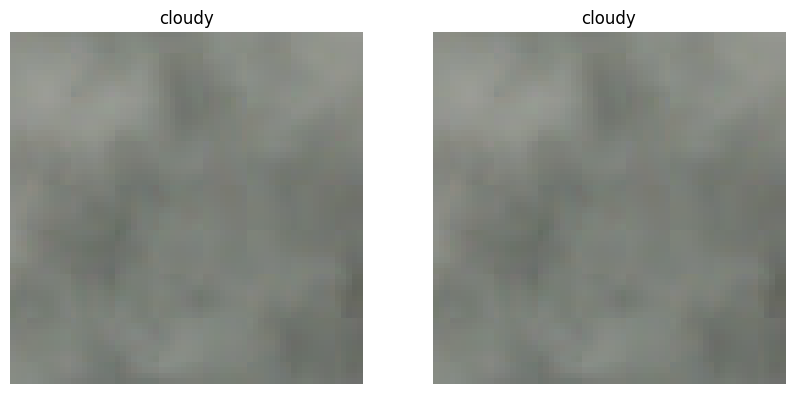

Test image 479 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


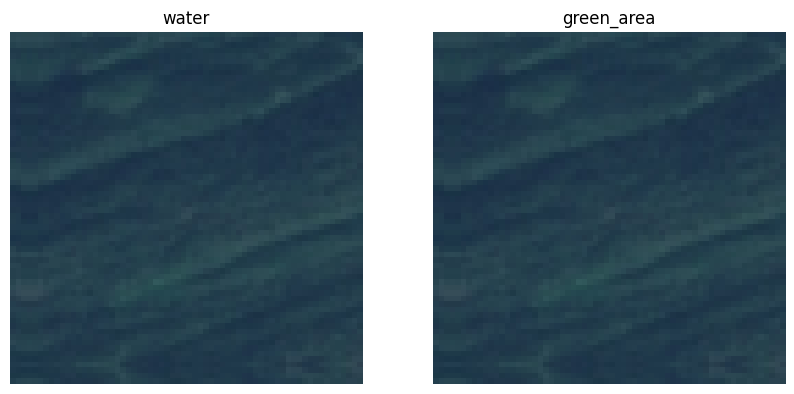

Test image 480 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


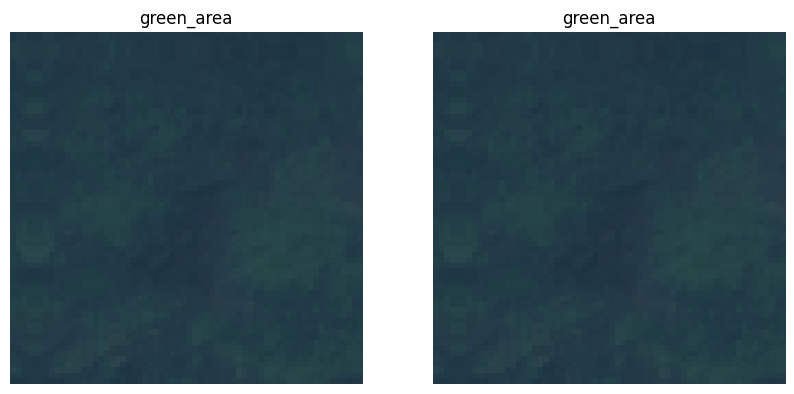

Test image 481 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


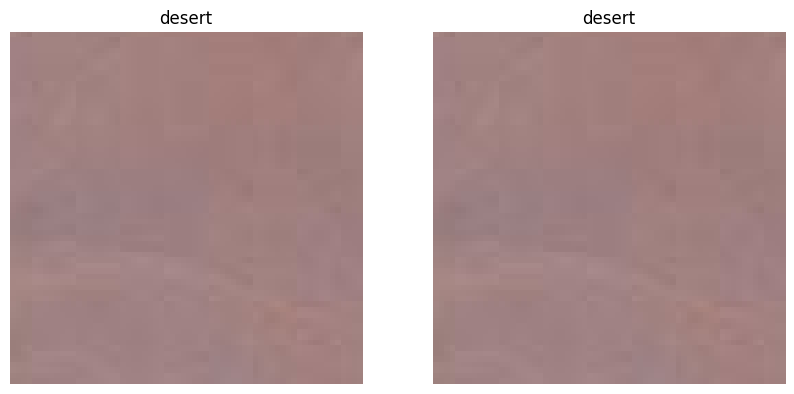

Test image 482 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


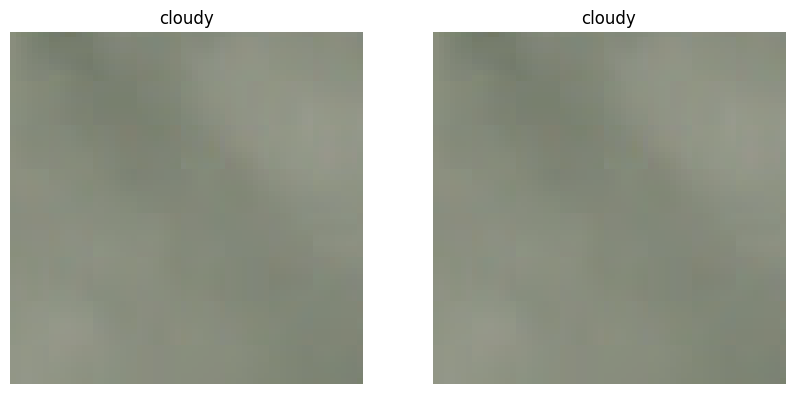

Test image 483 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


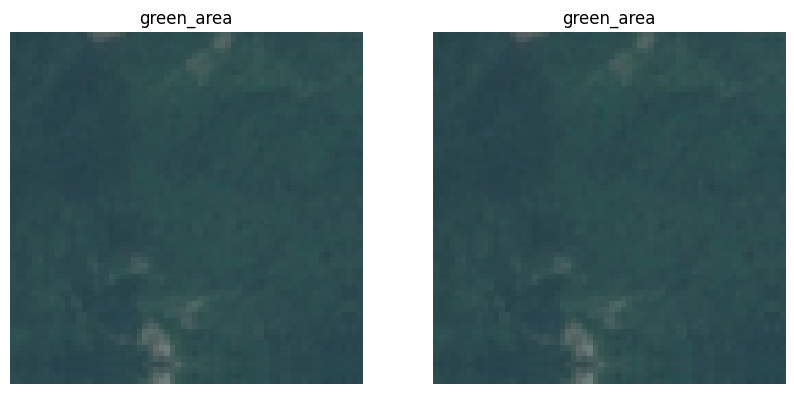

Test image 484 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


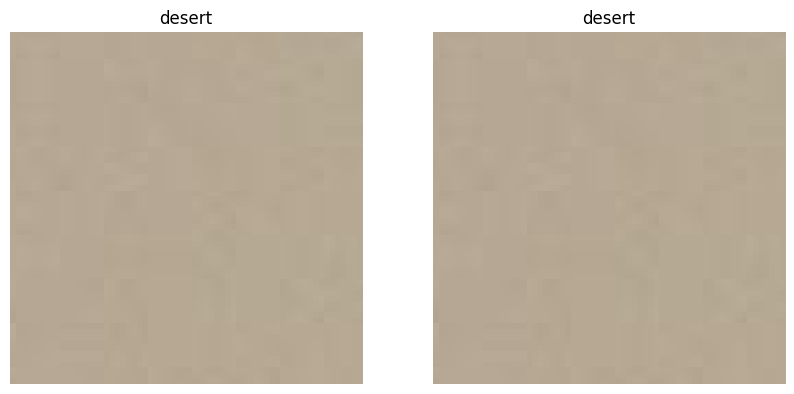

Test image 485 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


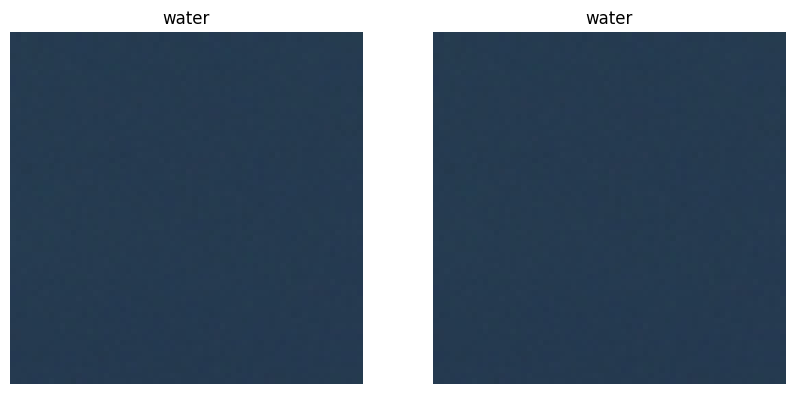

Test image 486 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


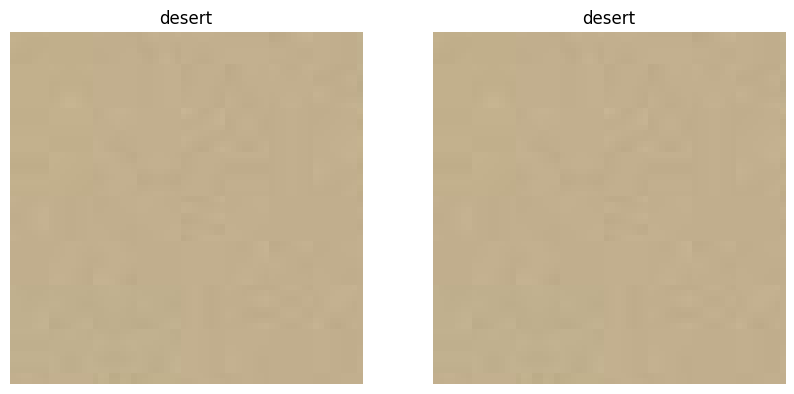

Test image 487 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


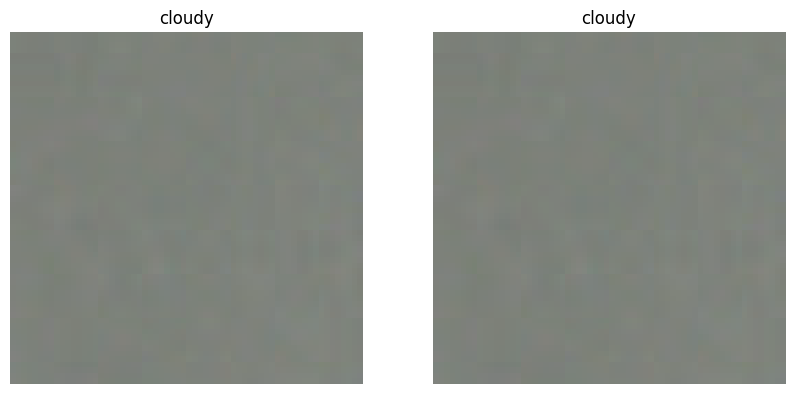

Test image 488 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


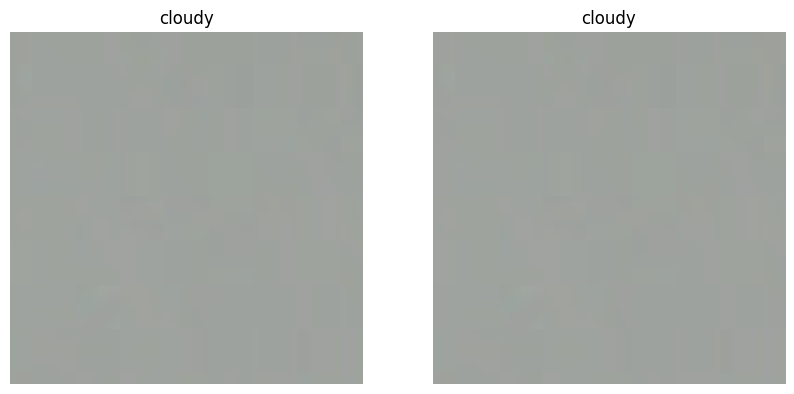

Test image 489 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


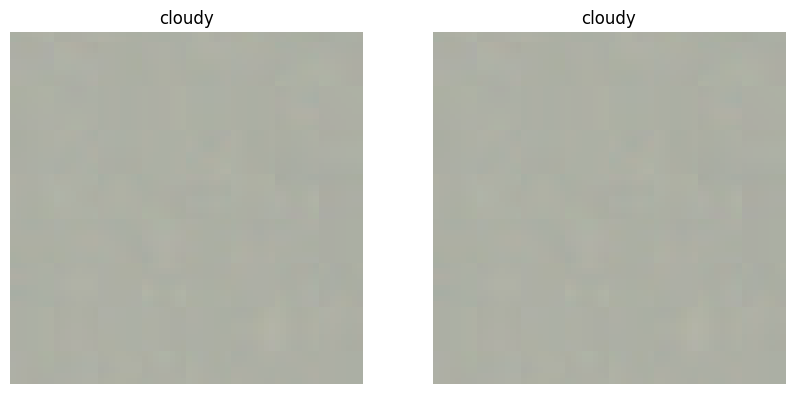

Test image 490 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


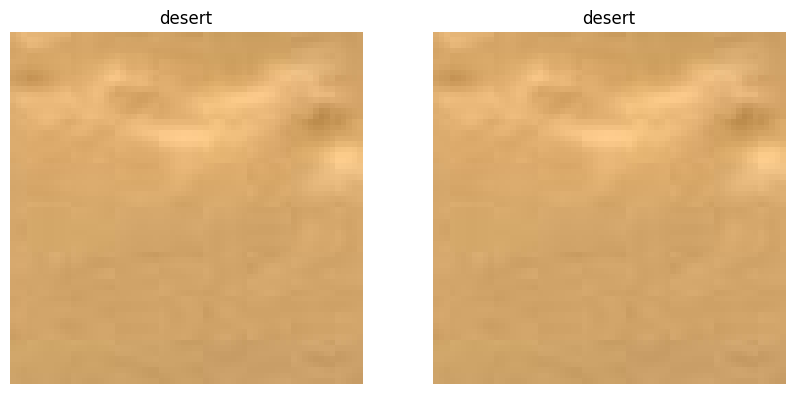

Test image 491 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


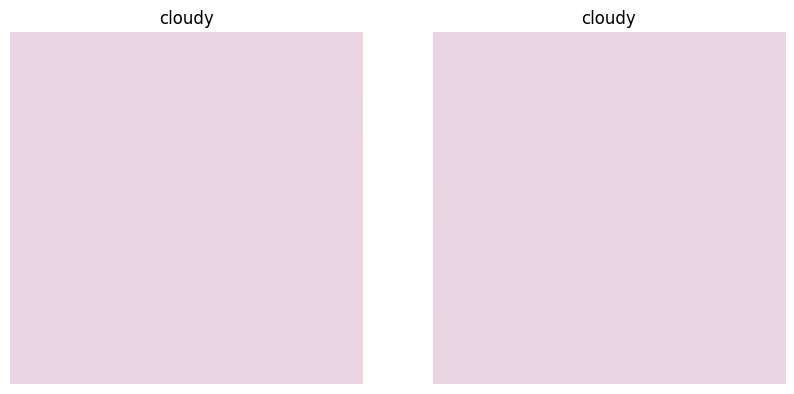

Test image 492 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


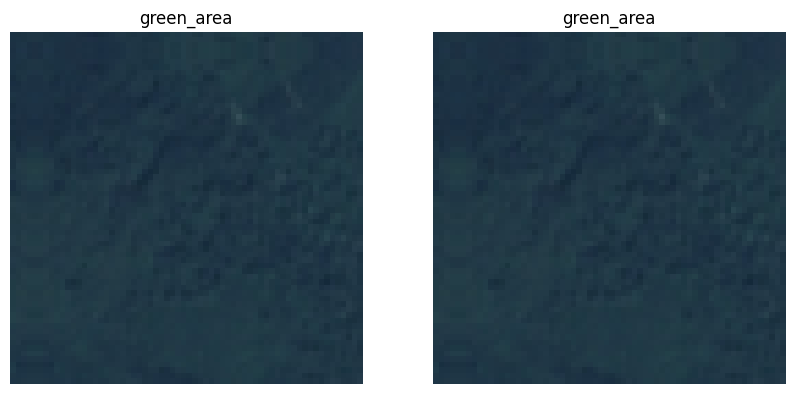

Test image 493 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


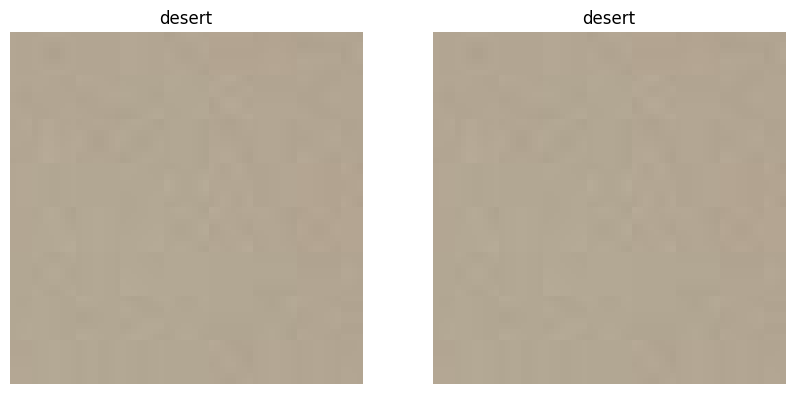

Test image 494 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


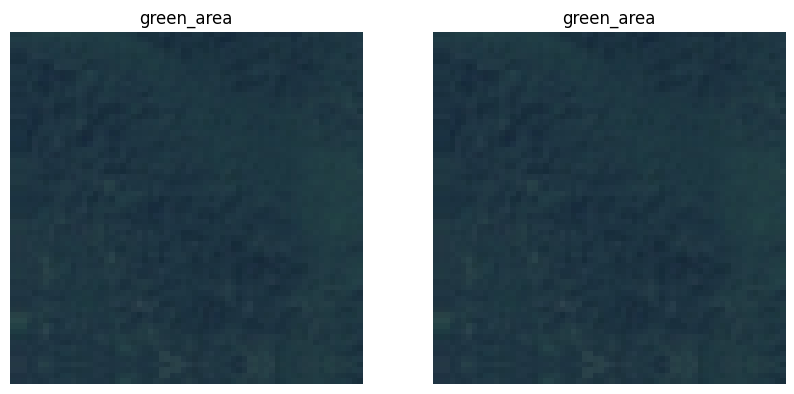

Test image 495 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


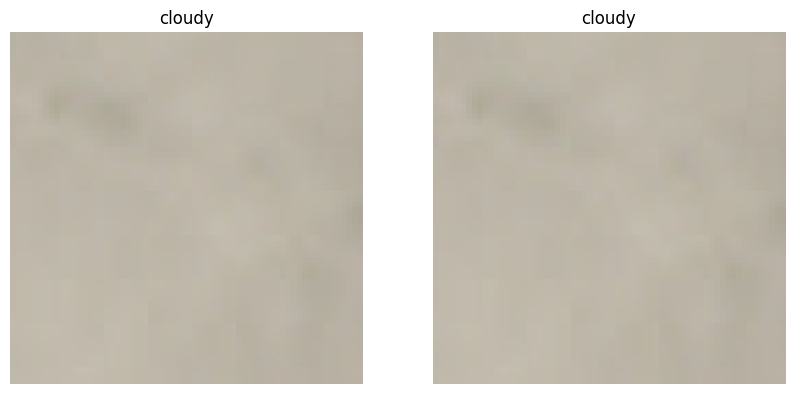

Test image 496 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


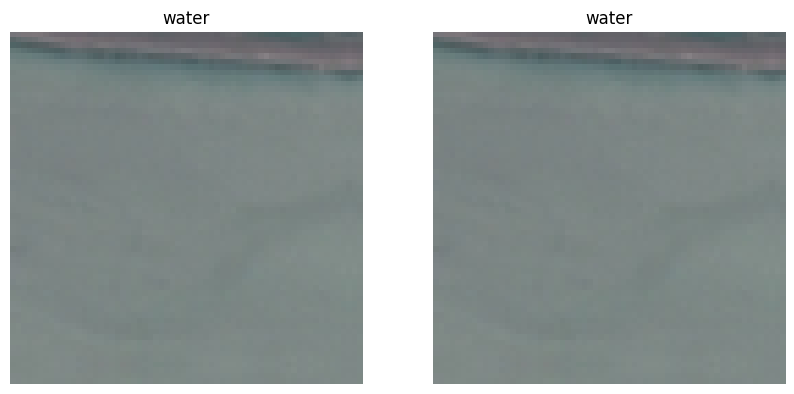

Test image 497 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


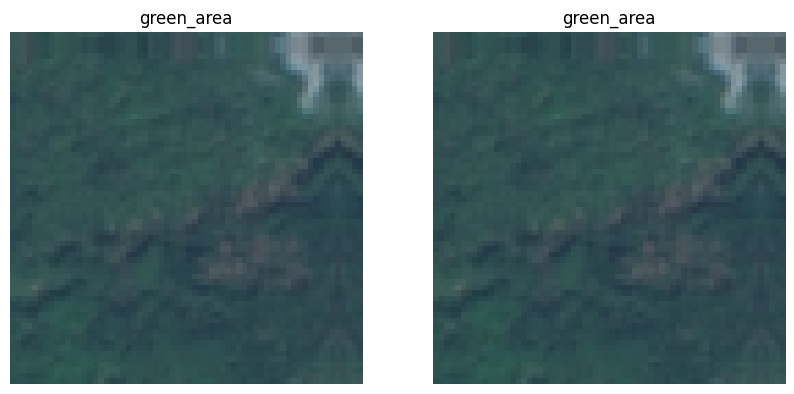

Test image 498 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


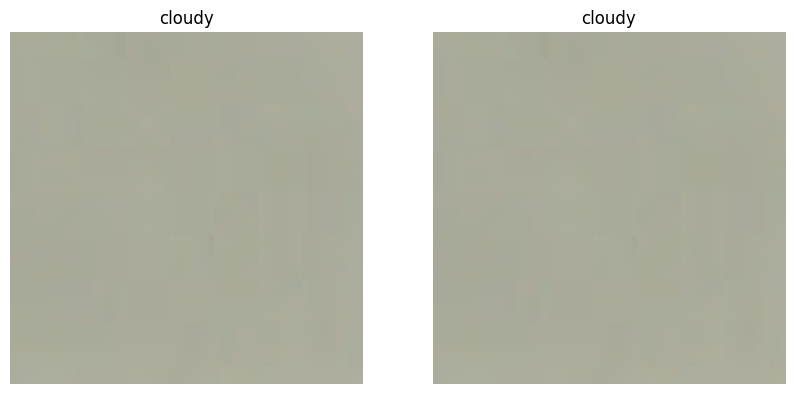

Test image 499 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


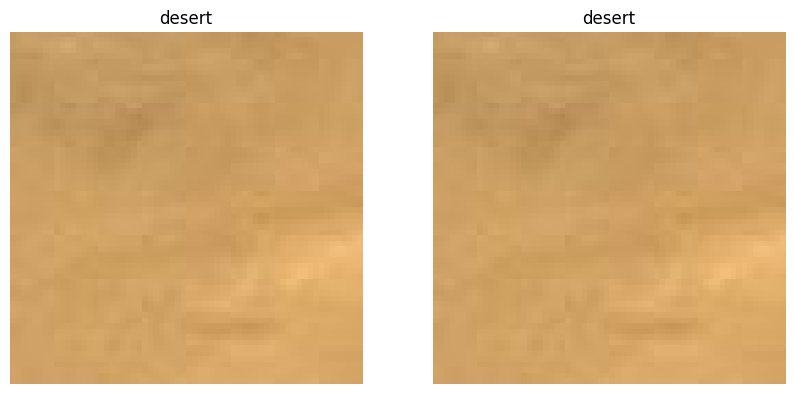

Test image 500 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


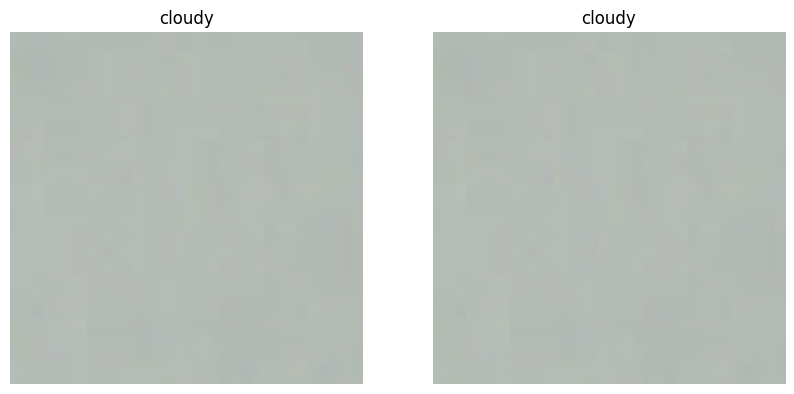

Test image 501 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


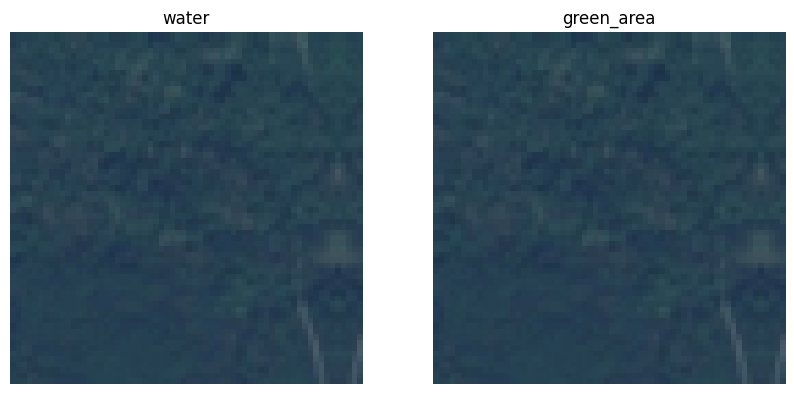

Test image 502 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


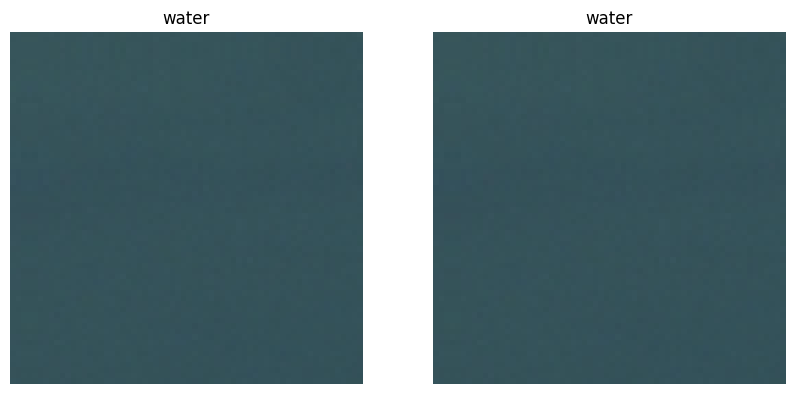

Test image 503 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


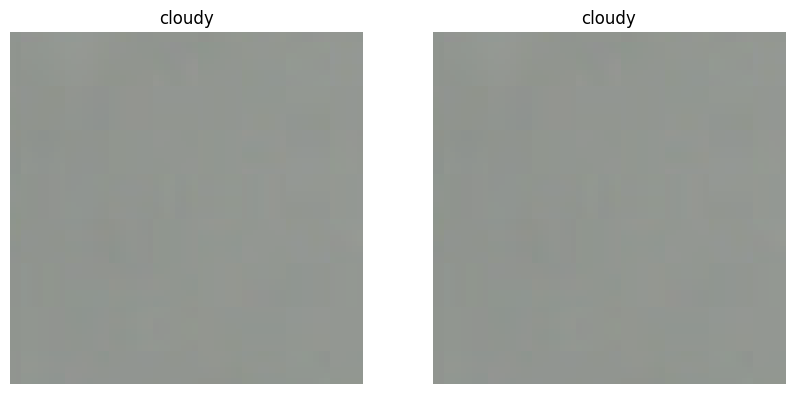

Test image 504 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


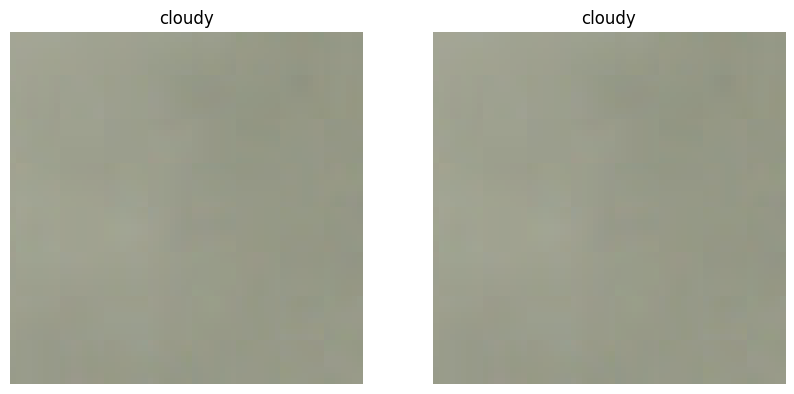

Test image 505 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


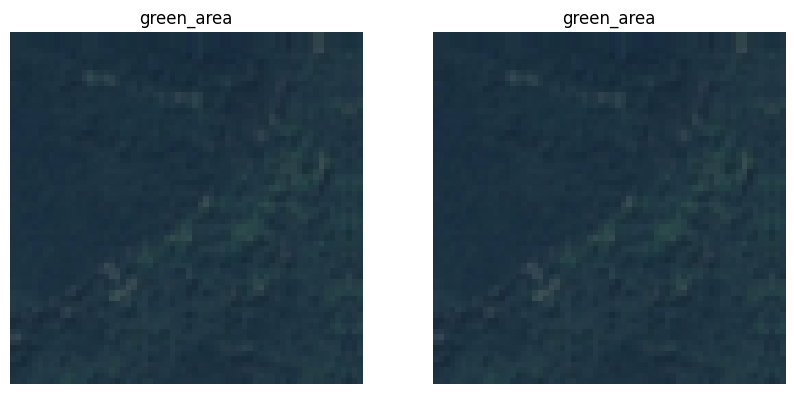

Test image 506 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


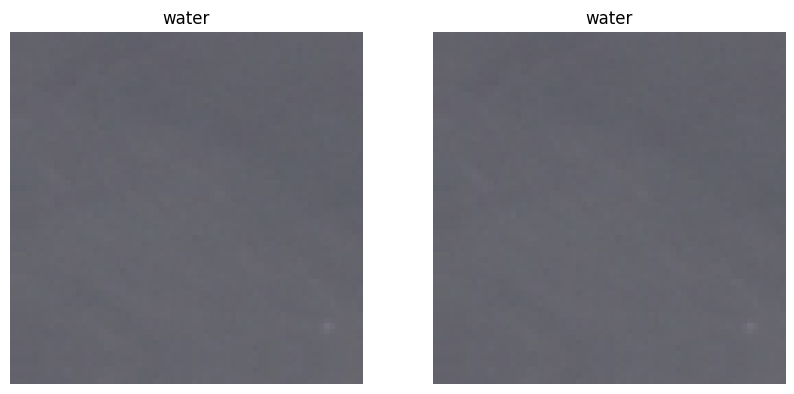

Test image 507 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


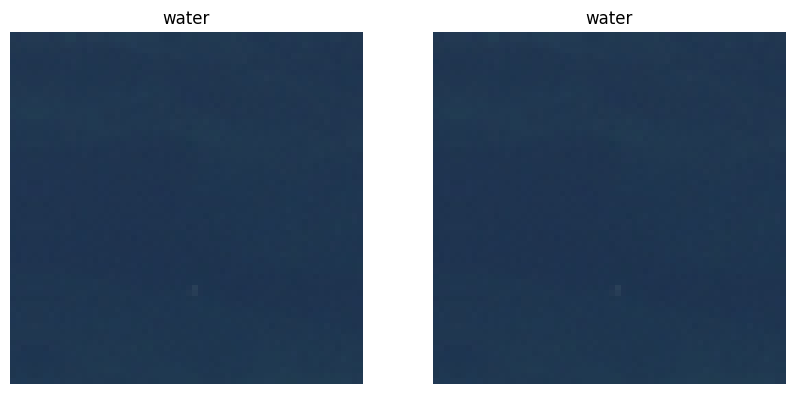

Test image 508 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


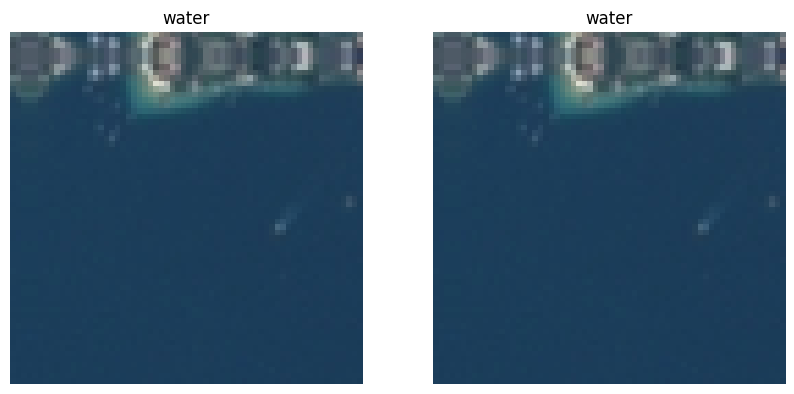

Test image 509 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


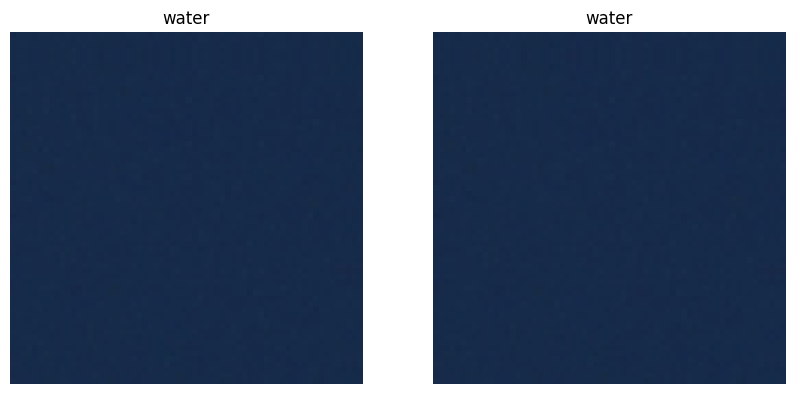

Test image 510 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


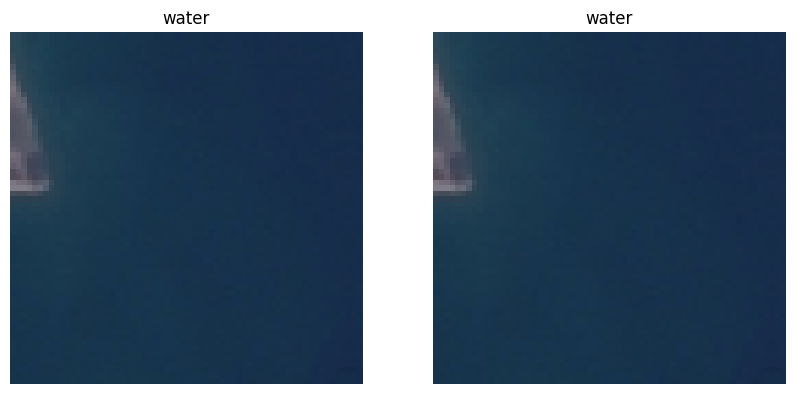

Test image 511 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


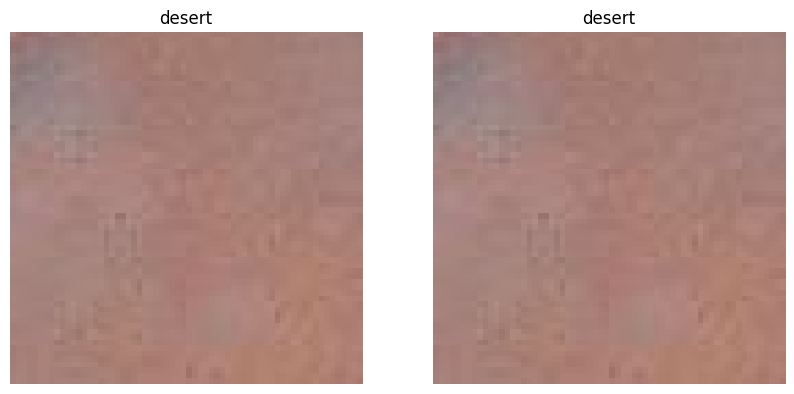

Test image 512 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


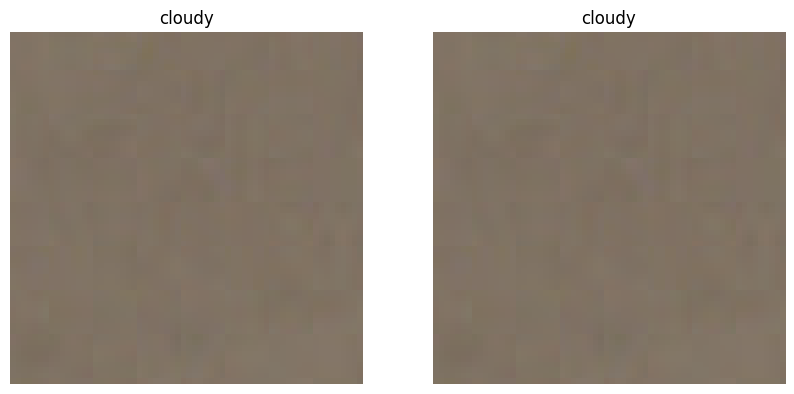

Test image 513 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


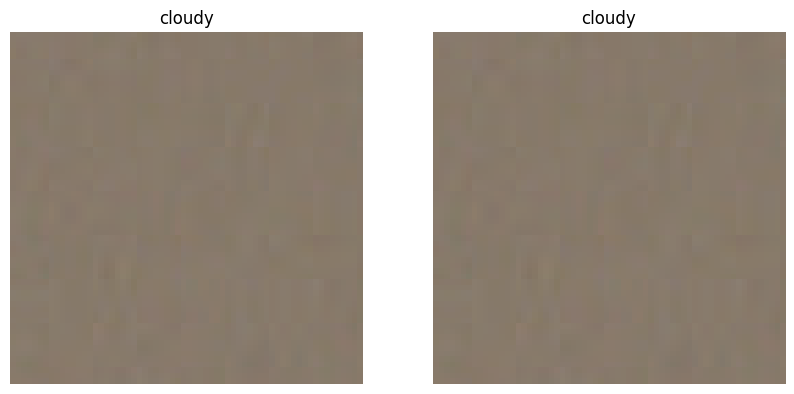

Test image 514 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


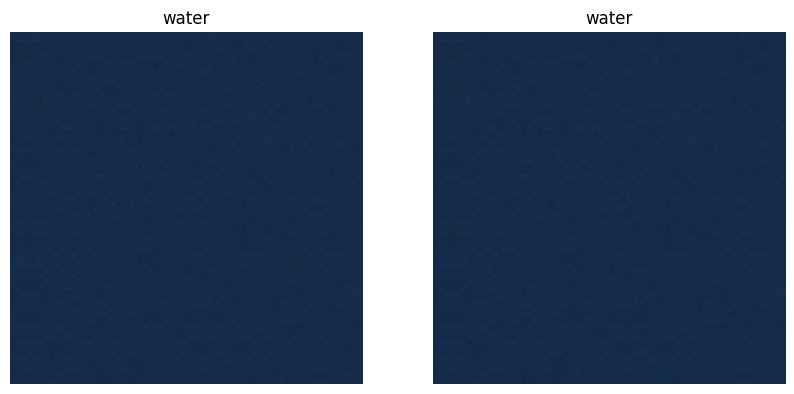

Test image 515 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


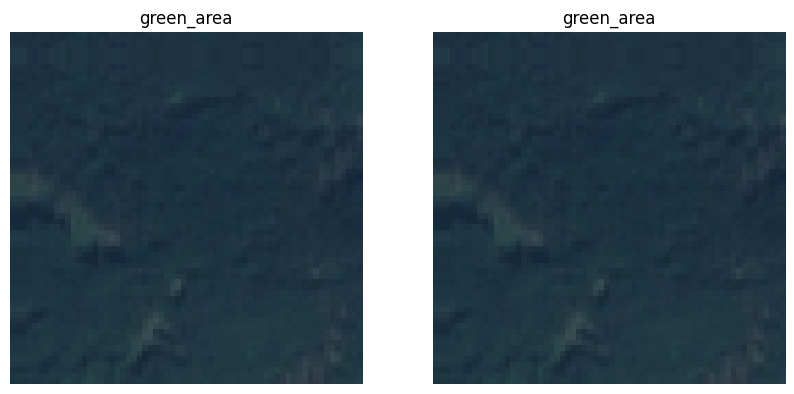

Test image 516 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


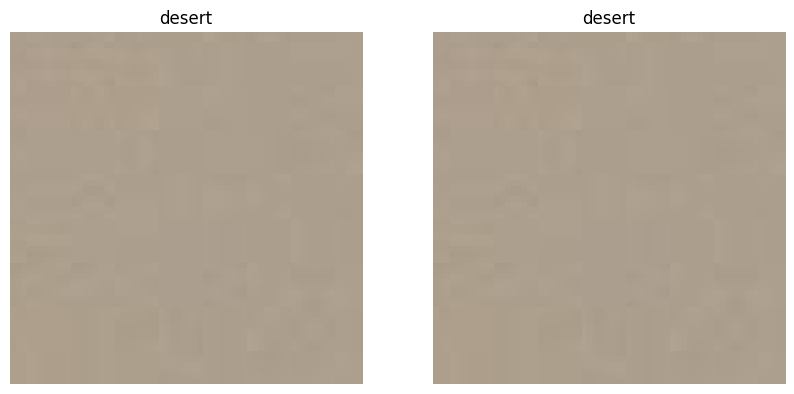

Test image 517 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


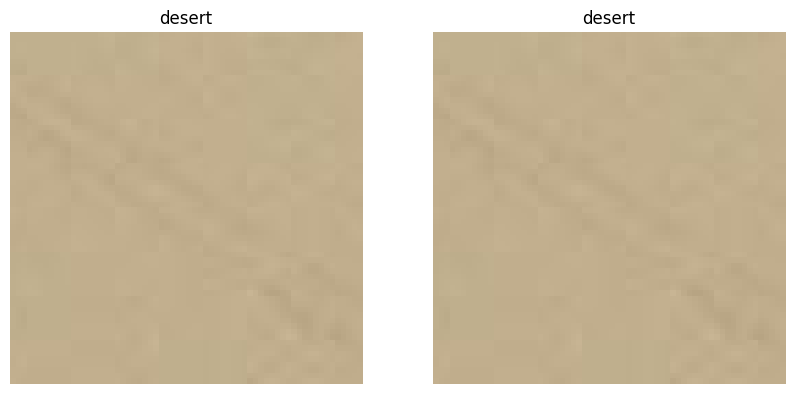

Test image 518 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


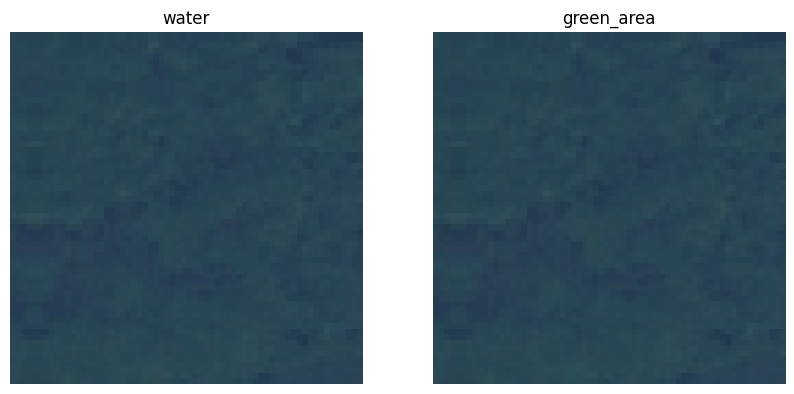

Test image 519 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


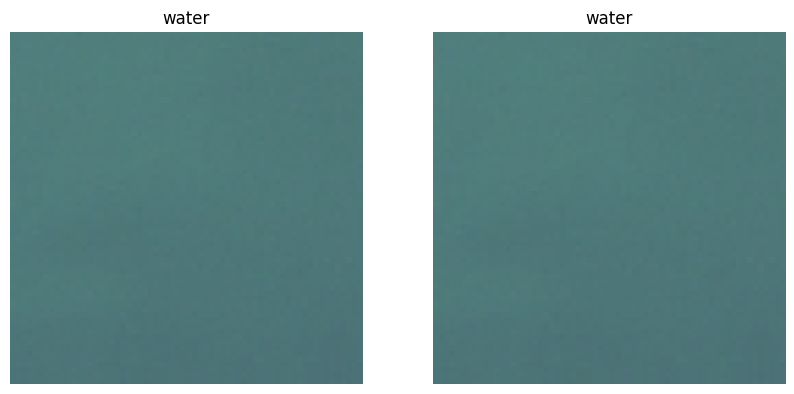

Test image 520 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


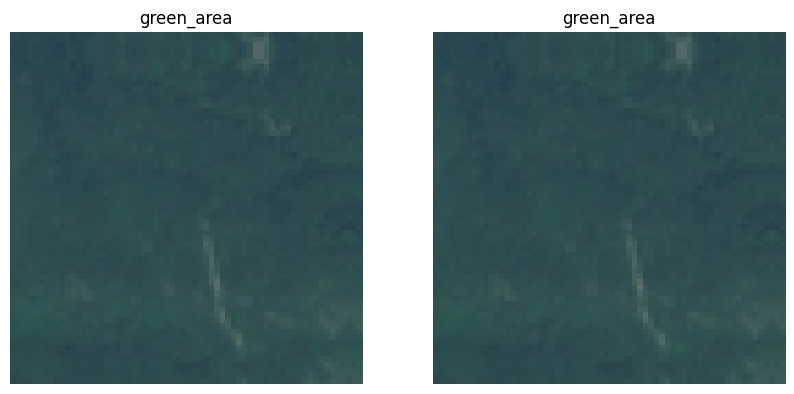

Test image 521 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


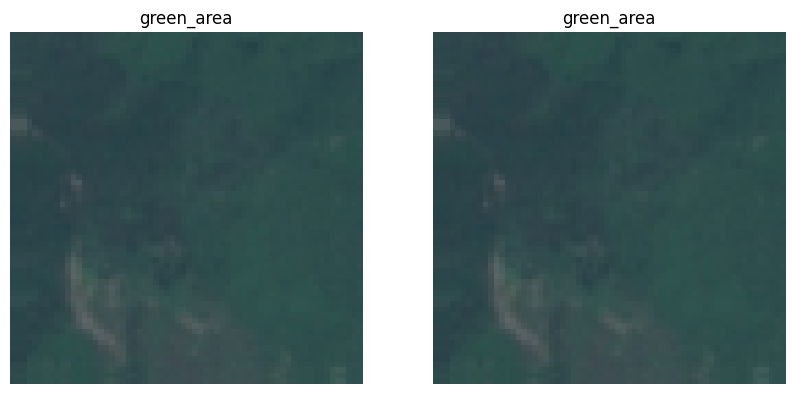

Test image 522 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


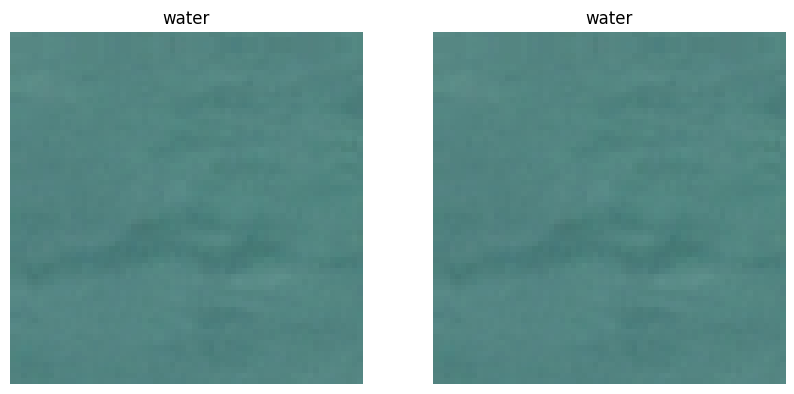

Test image 523 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


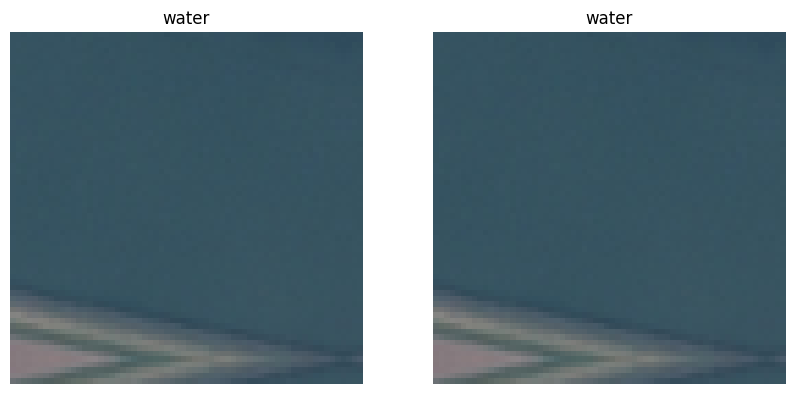

Test image 524 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


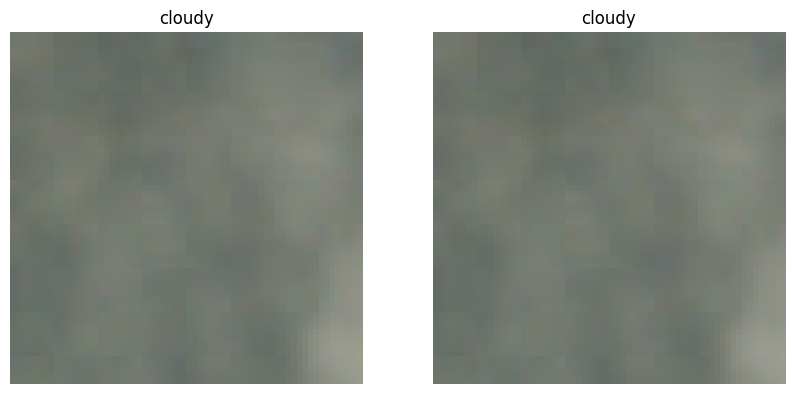

Test image 525 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


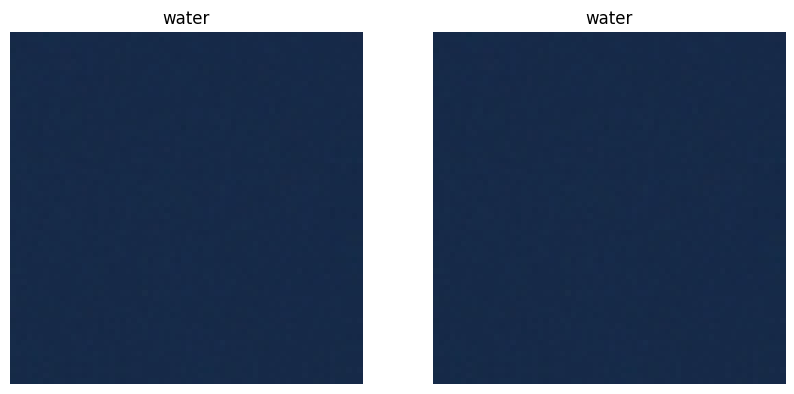

Test image 526 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


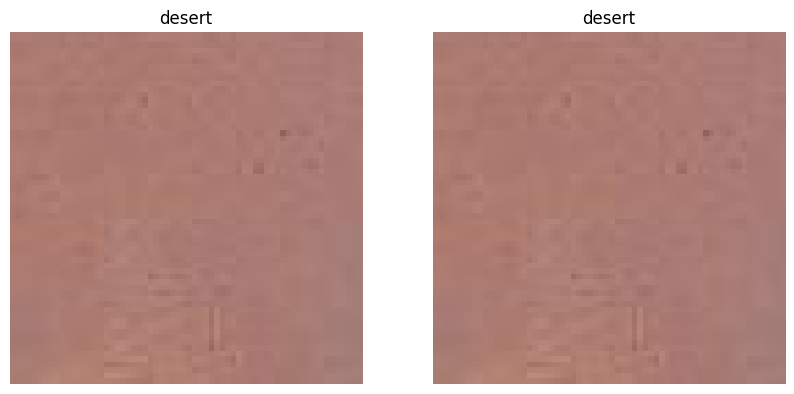

Test image 527 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


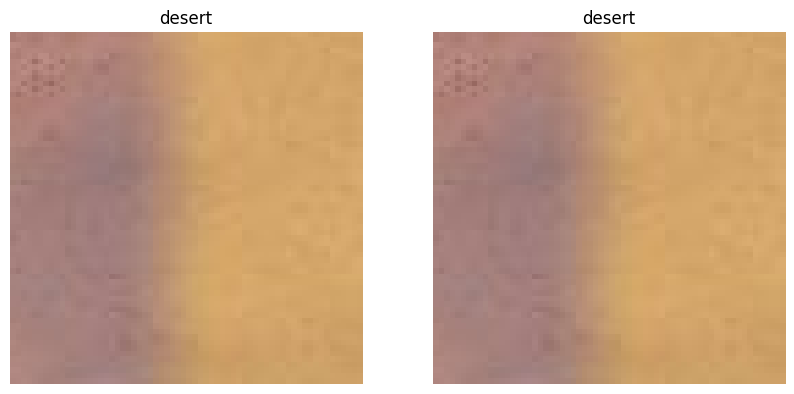

Test image 528 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


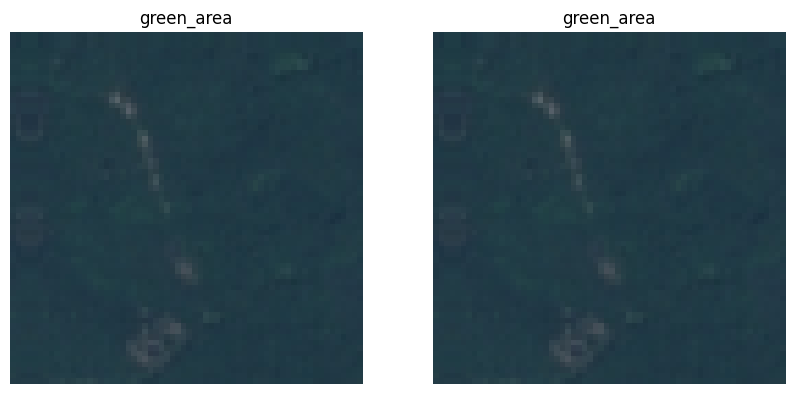

Test image 529 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


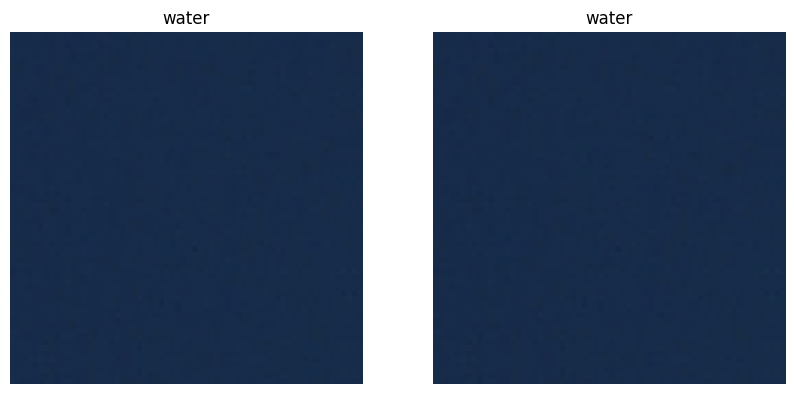

Test image 530 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


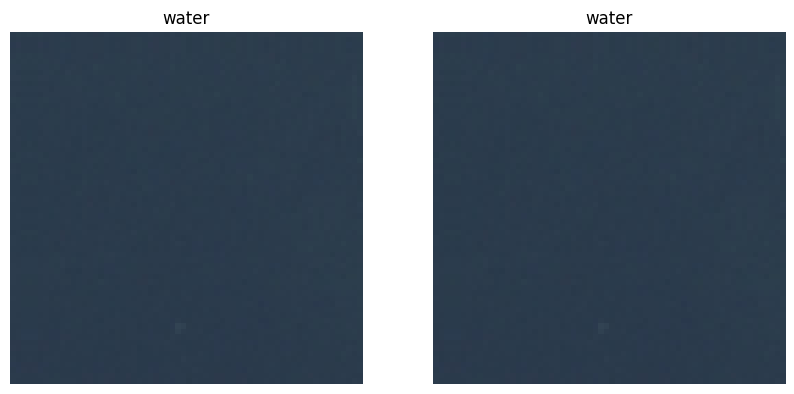

Test image 531 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


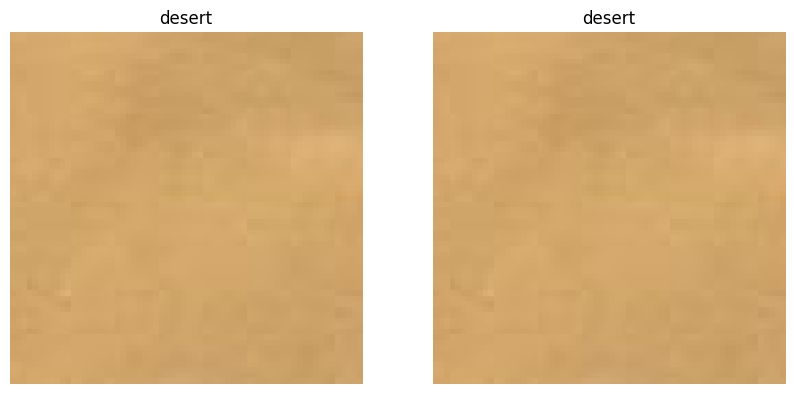

Test image 532 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


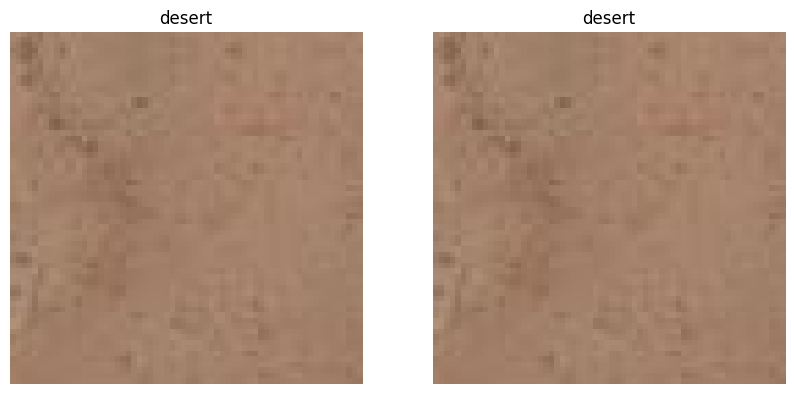

Test image 533 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


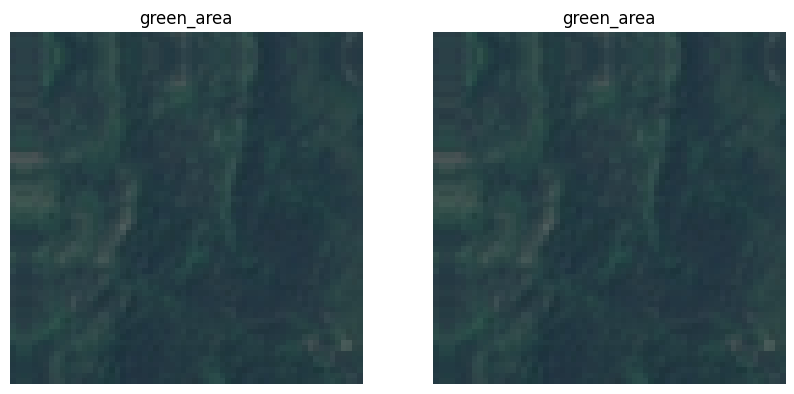

Test image 534 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


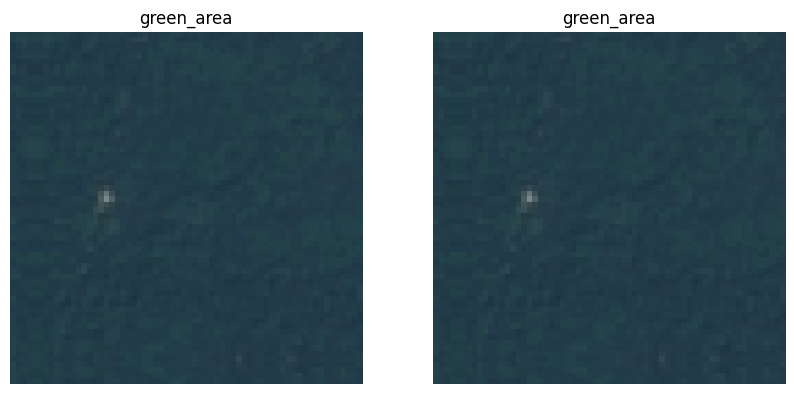

Test image 535 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


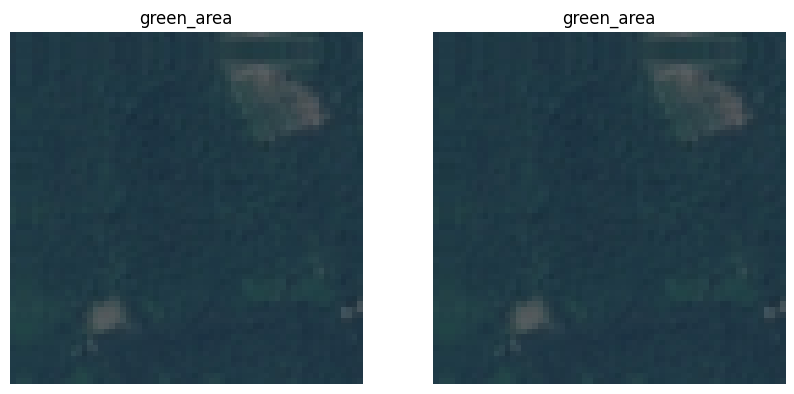

Test image 536 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


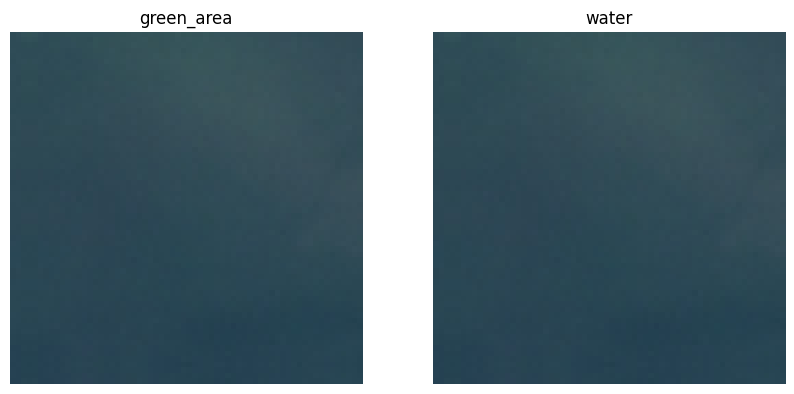

Test image 537 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


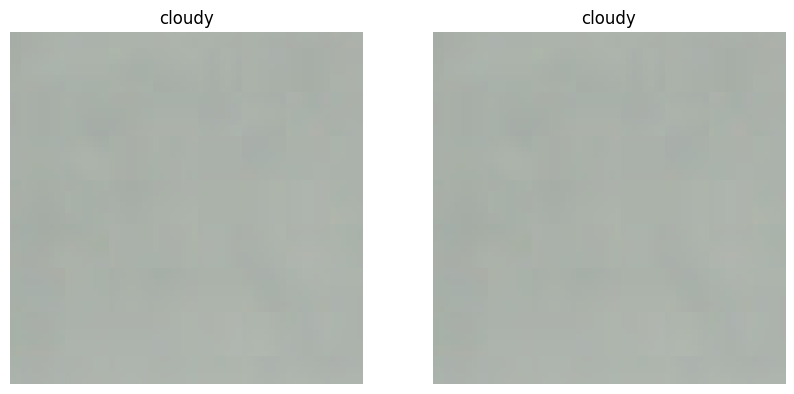

Test image 538 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


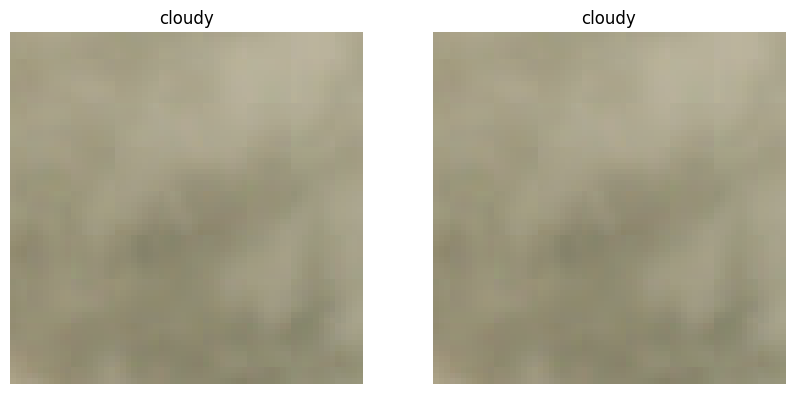

Test image 539 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


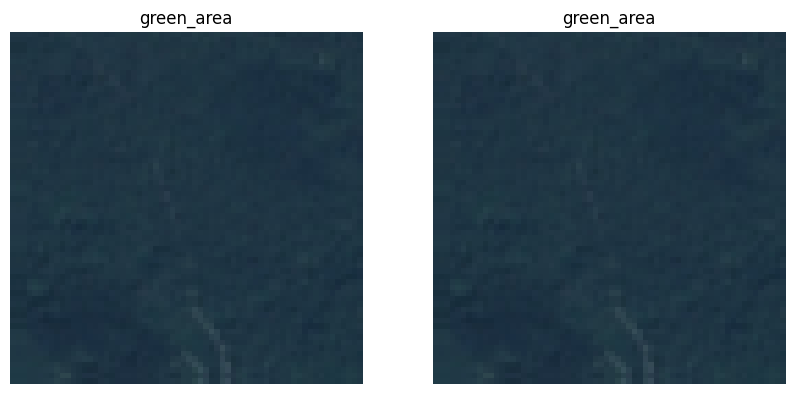

Test image 540 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


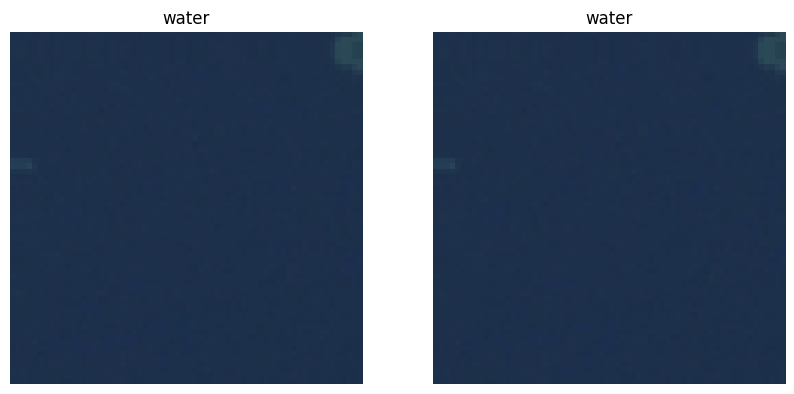

Test image 541 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


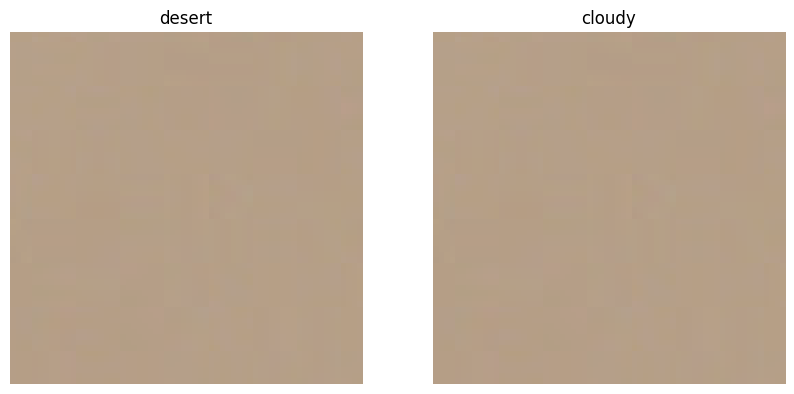

Test image 542 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


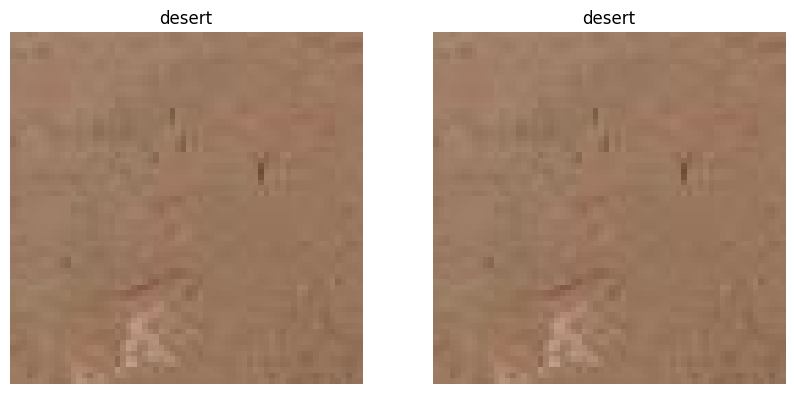

Test image 543 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


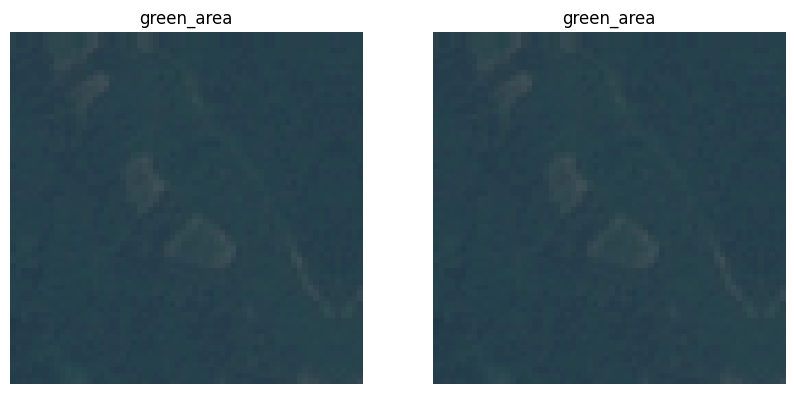

Test image 544 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


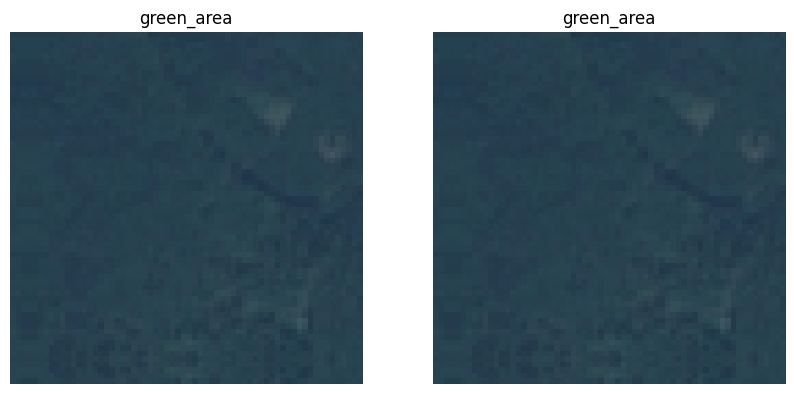

Test image 545 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


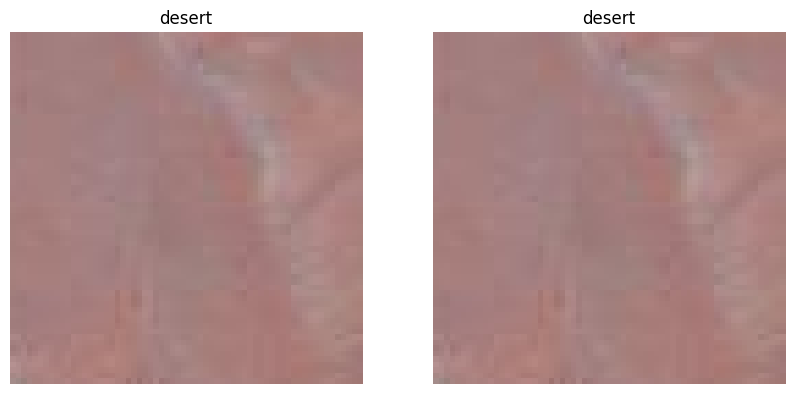

Test image 546 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


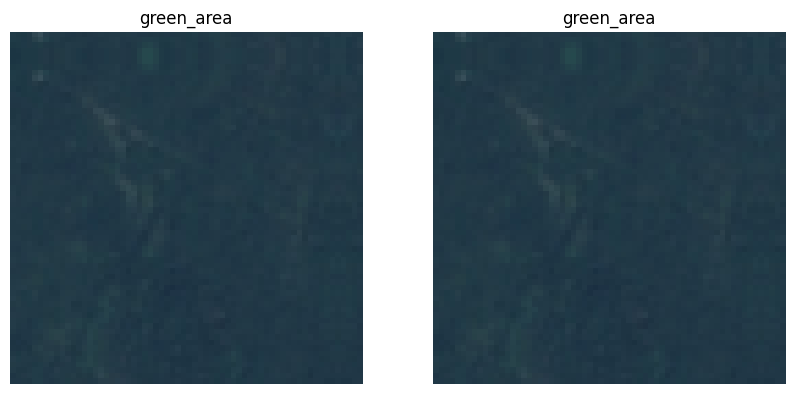

Test image 547 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


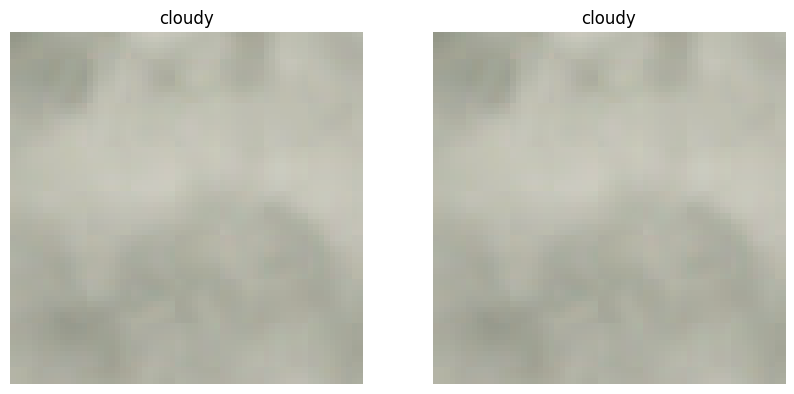

Test image 548 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


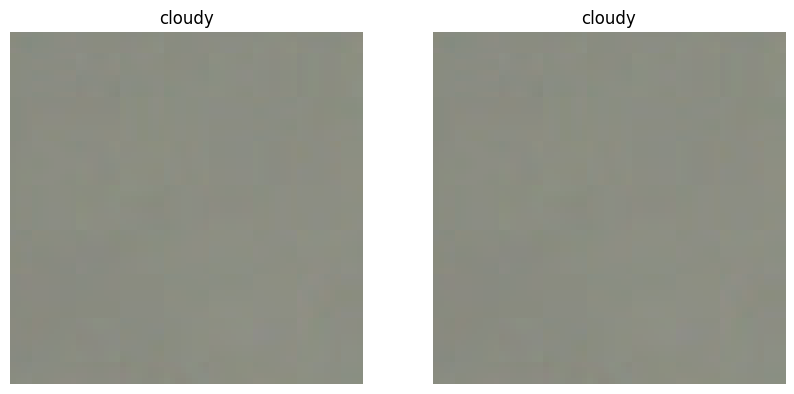

Test image 549 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


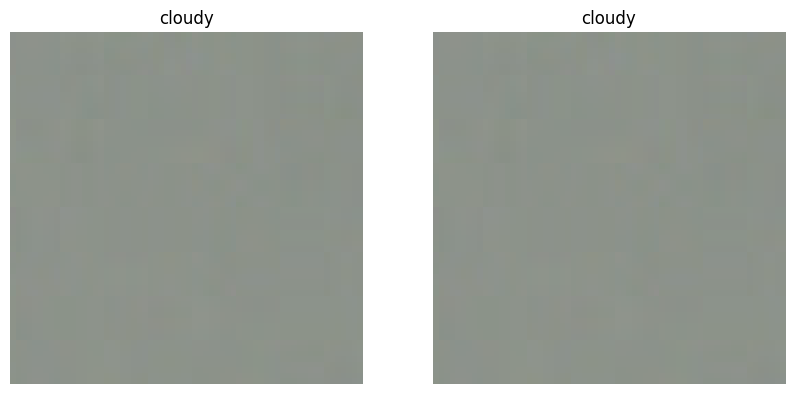

Test image 550 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


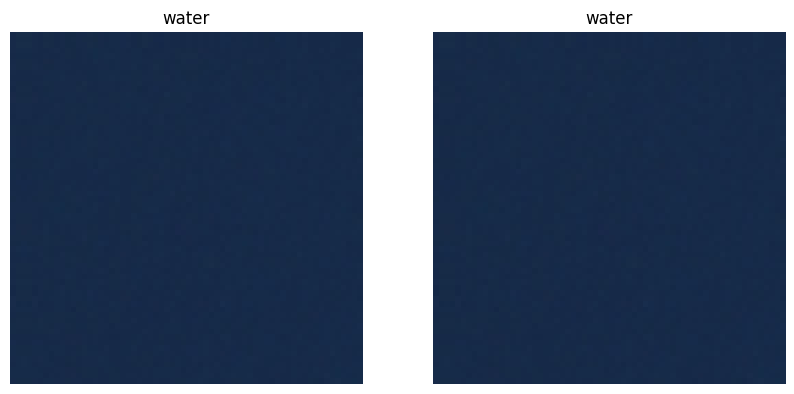

Test image 551 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


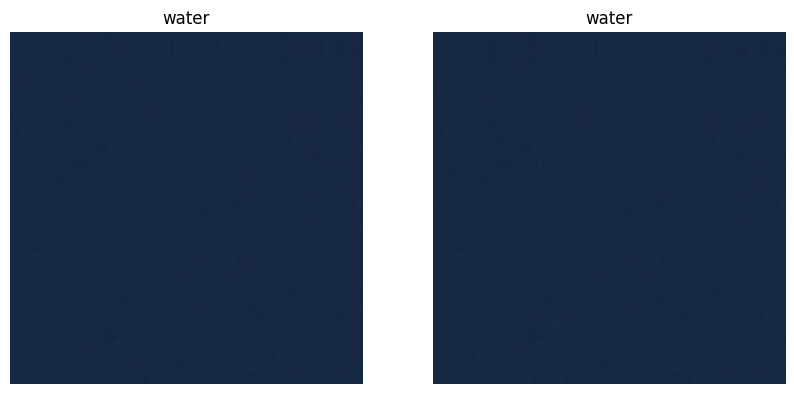

Test image 552 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


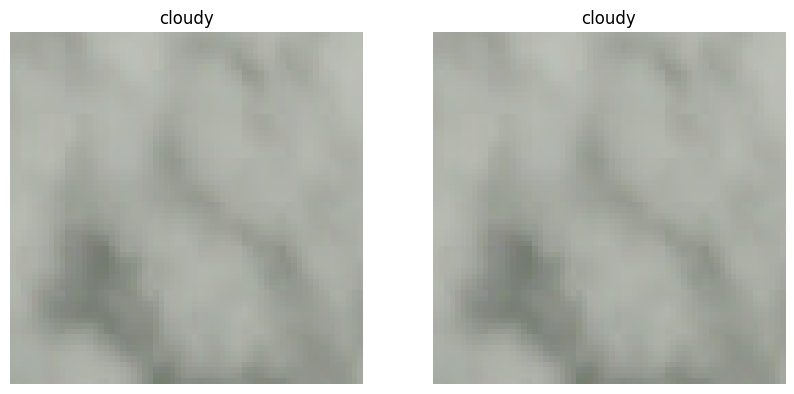

Test image 553 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


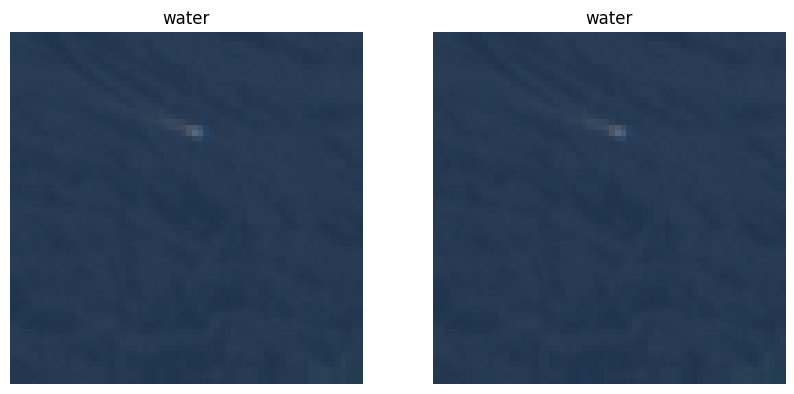

Test image 554 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


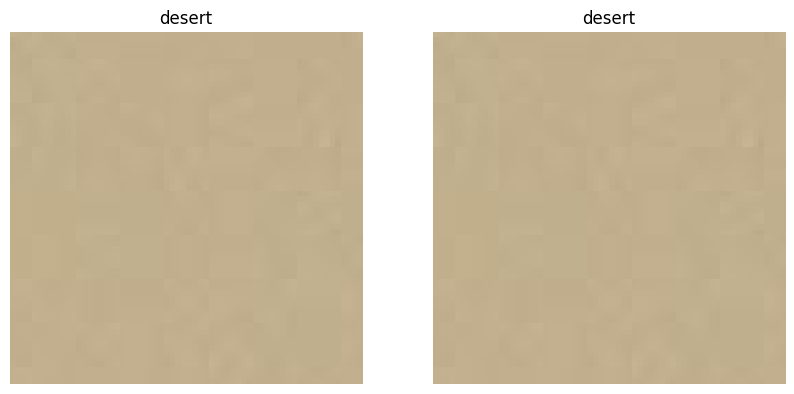

Test image 555 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


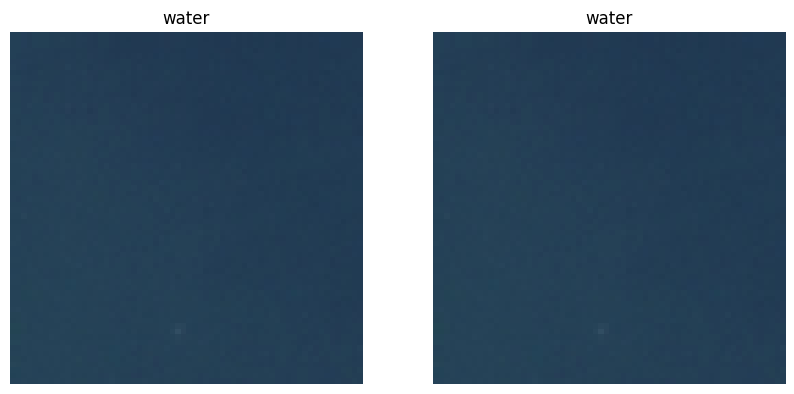

Test image 556 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


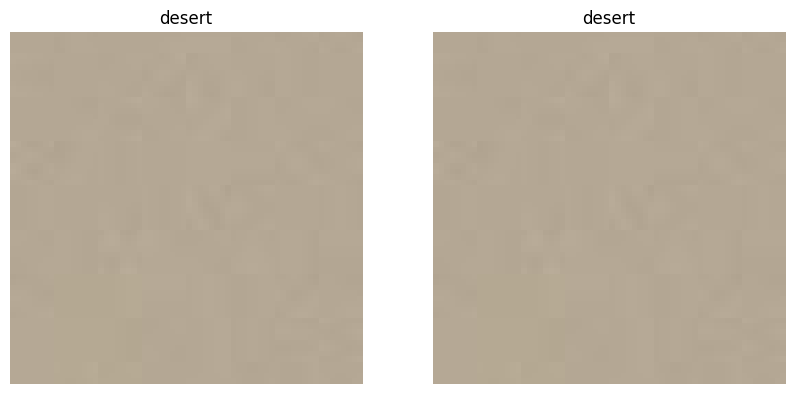

Test image 557 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


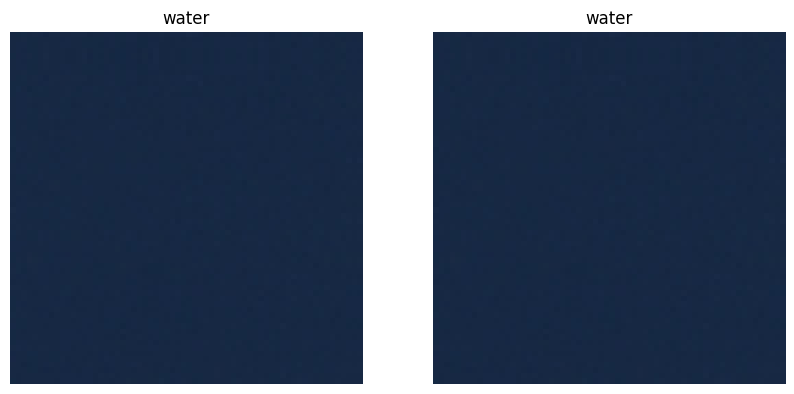

Test image 558 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


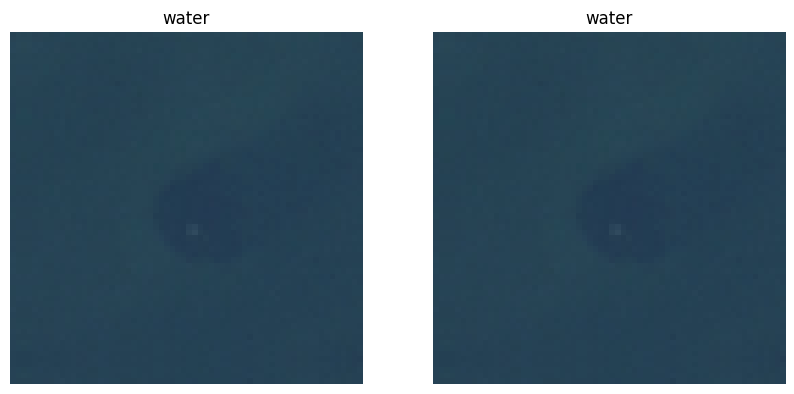

Test image 559 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


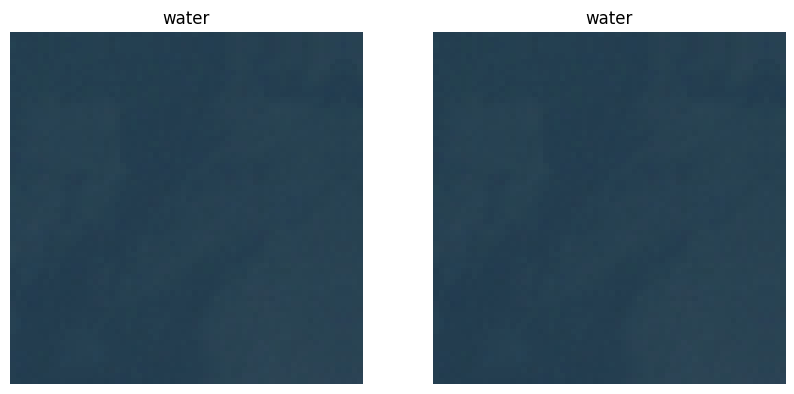

Test image 560 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


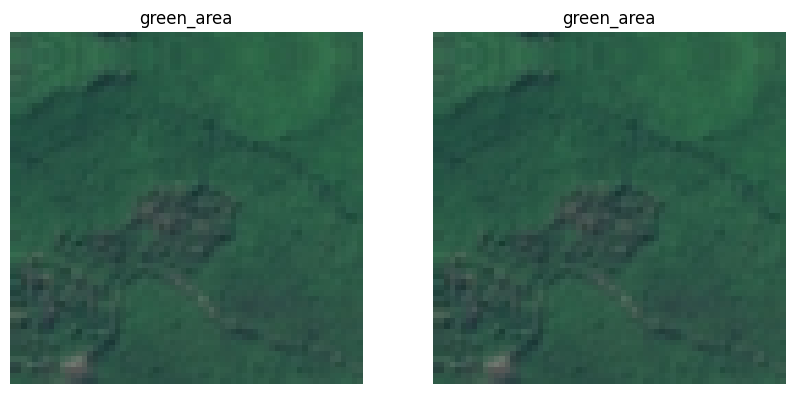

Test image 561 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


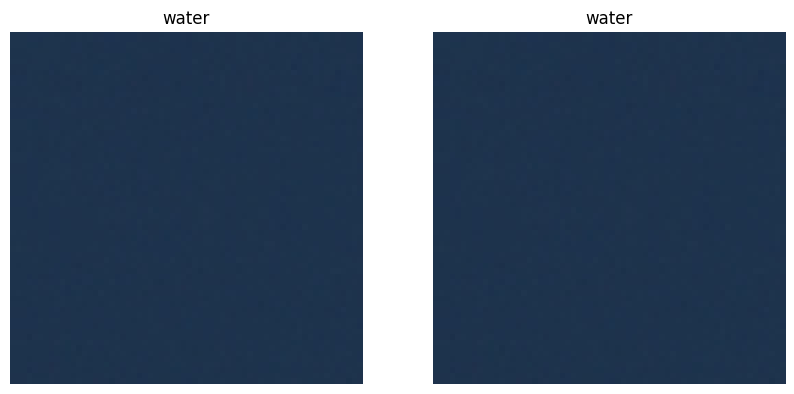

Test image 562 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


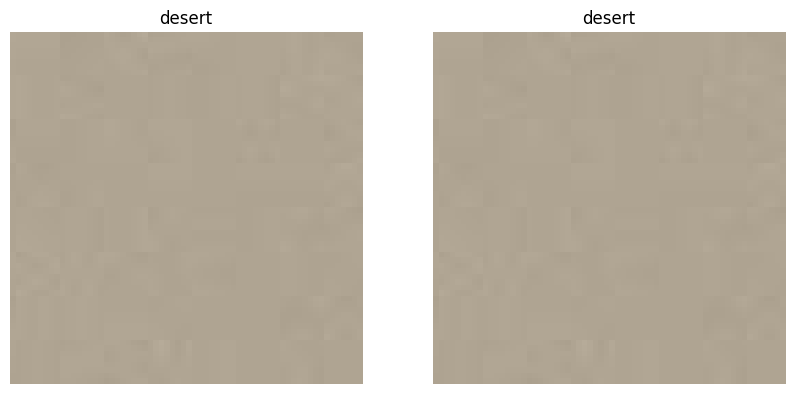

Test image 563 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


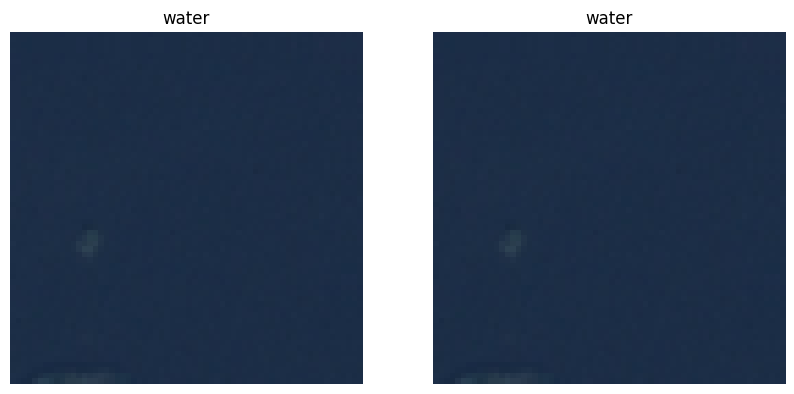

Test image 564 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


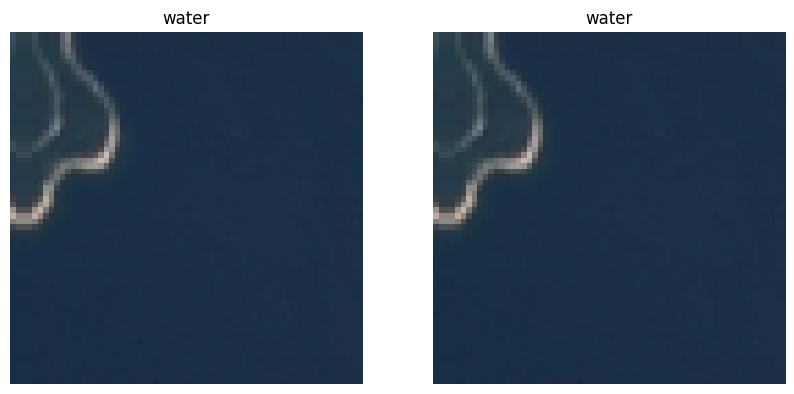

Test image 565 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


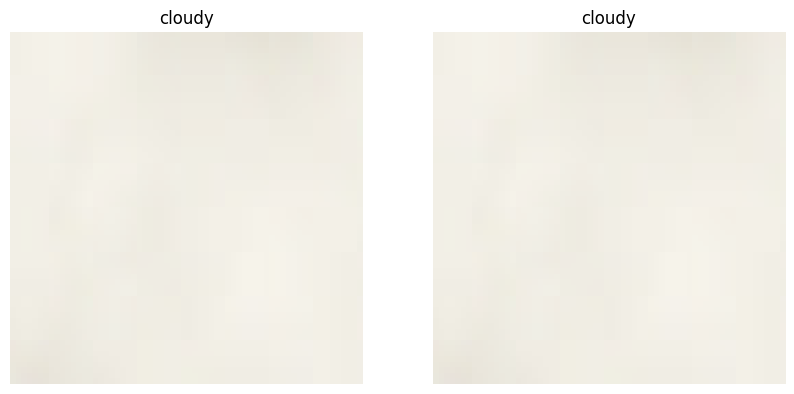

Test image 566 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


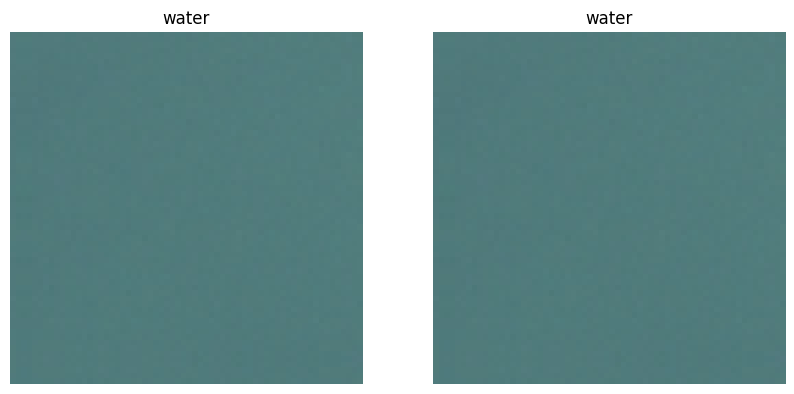

Test image 567 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


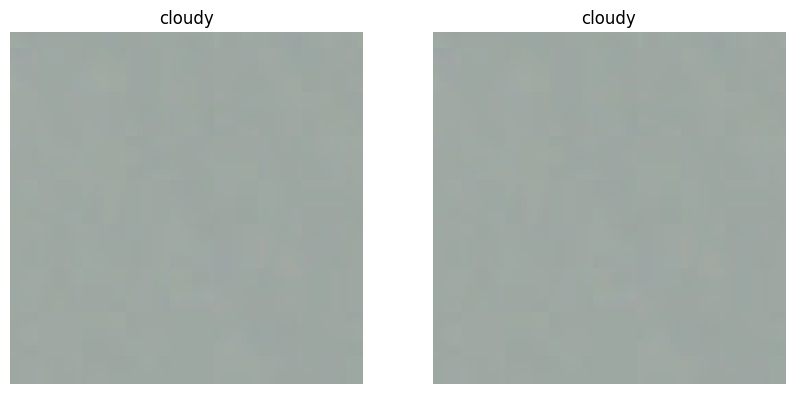

Test image 568 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


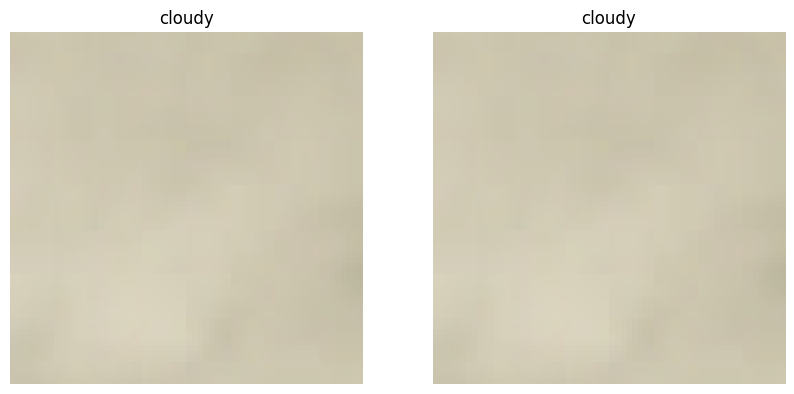

Test image 569 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


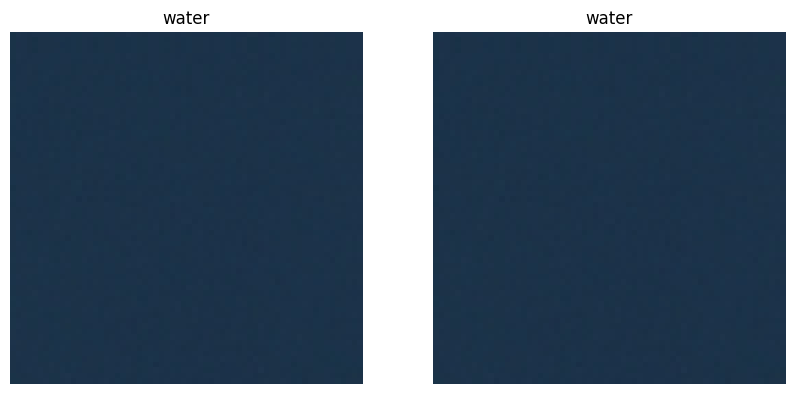

Test image 570 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


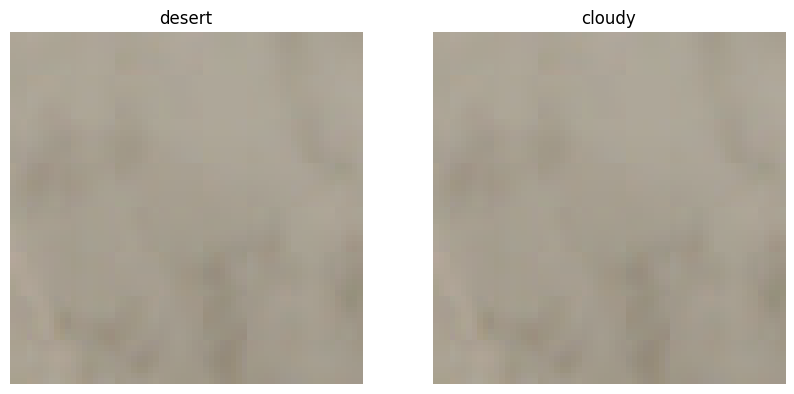

Test image 571 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


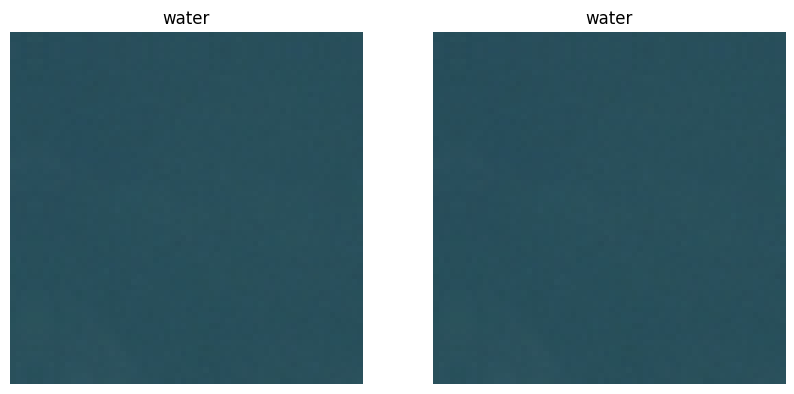

Test image 572 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


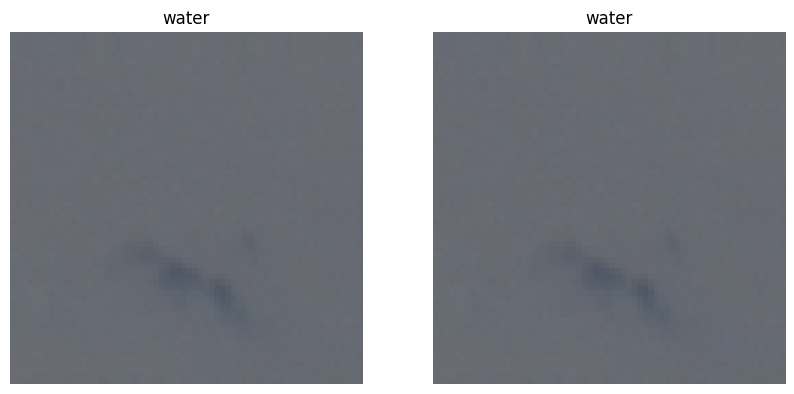

Test image 573 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


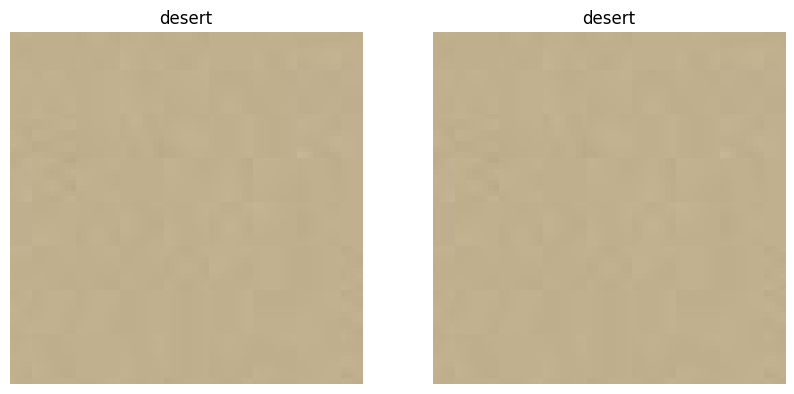

Test image 574 , Result: Wrong Predicted: water , Real Class: cloudy
Predicted Class Image vs Real Class Image:


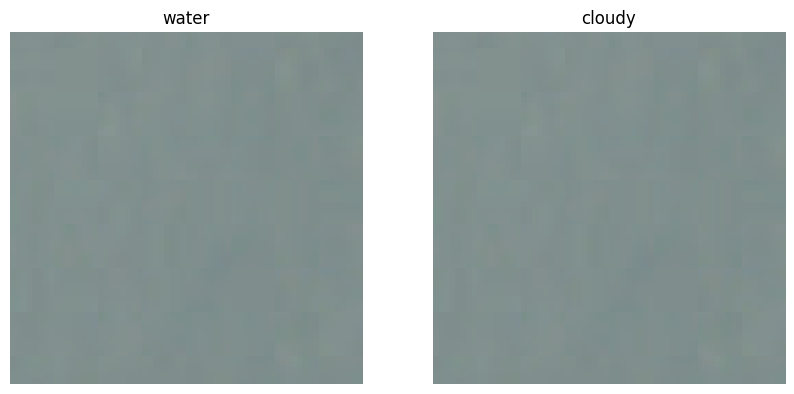

Test image 575 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


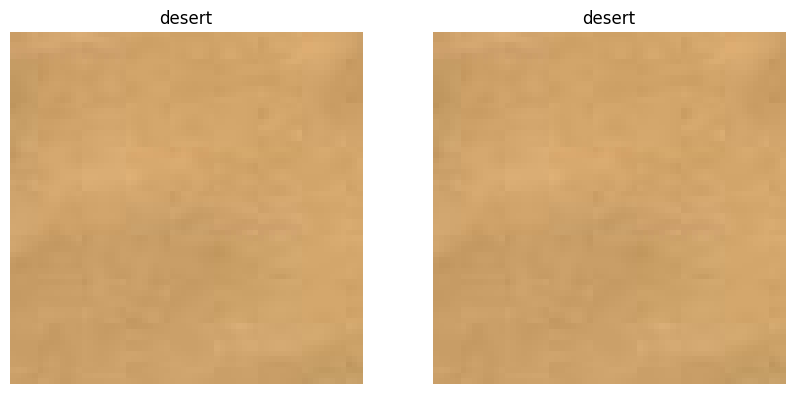

Test image 576 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


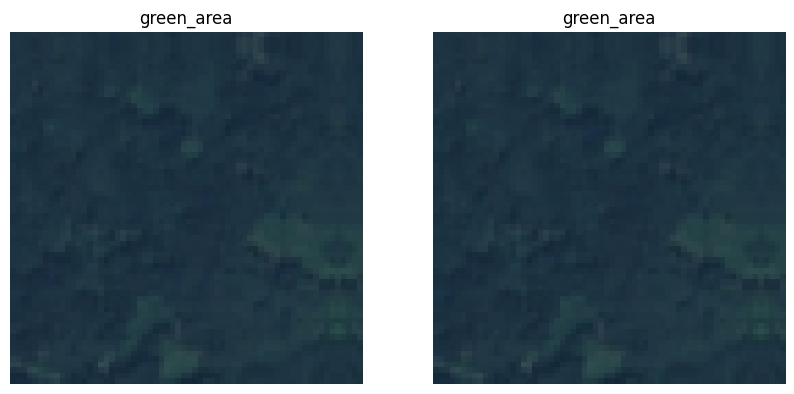

Test image 577 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


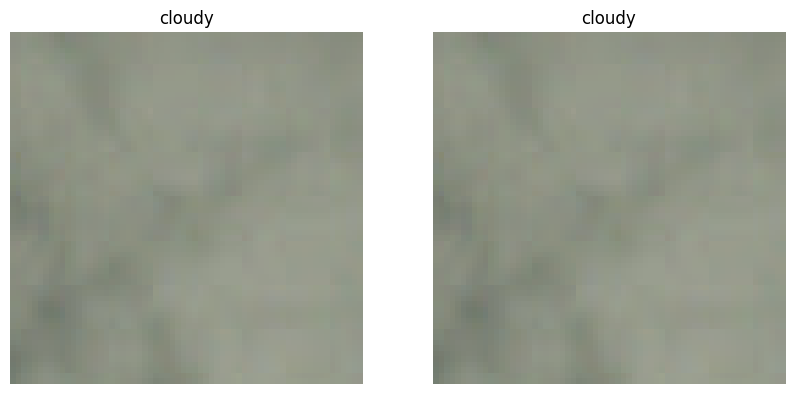

Test image 578 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


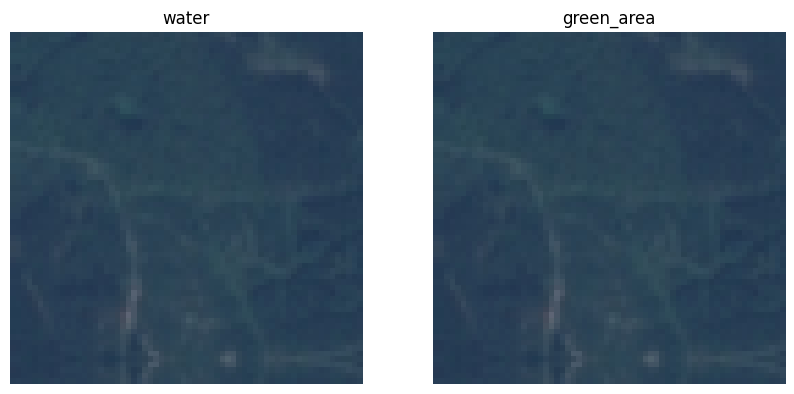

Test image 579 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


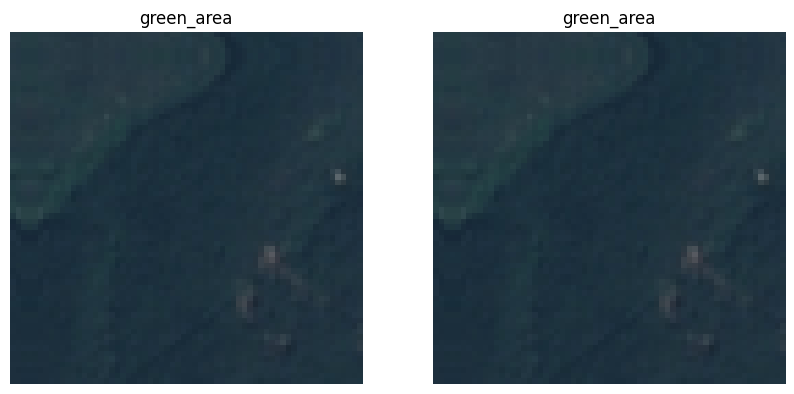

Test image 580 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


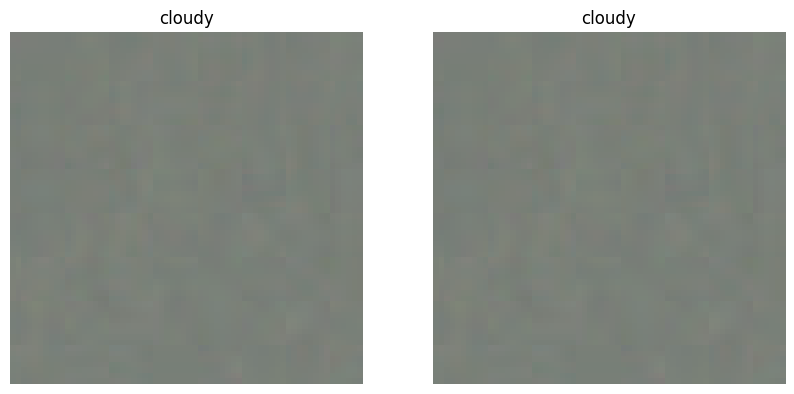

Test image 581 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


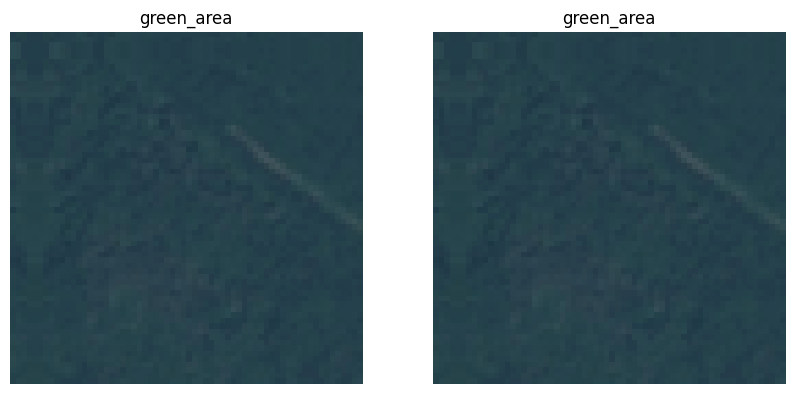

Test image 582 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


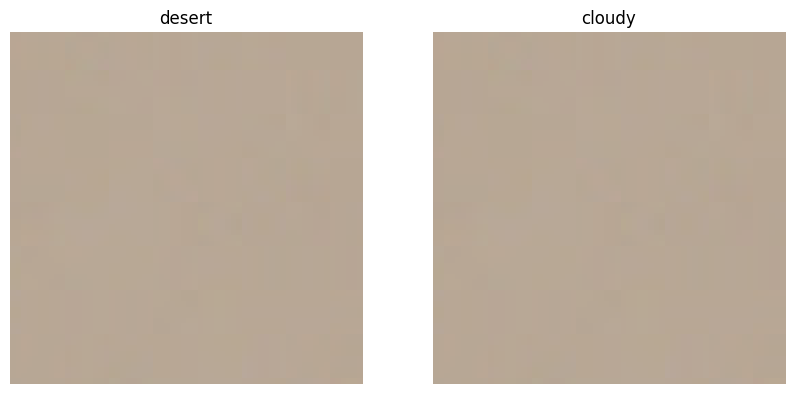

Test image 583 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


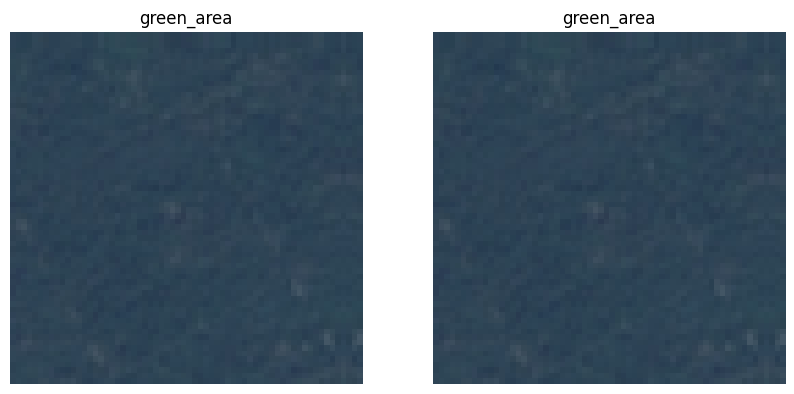

Test image 584 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


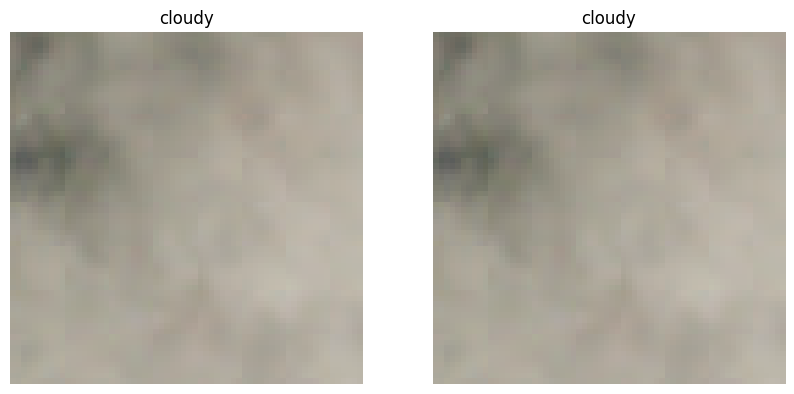

Test image 585 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


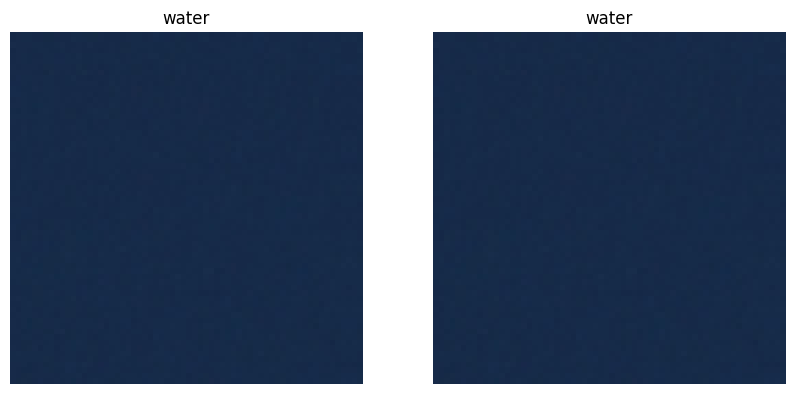

Test image 586 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


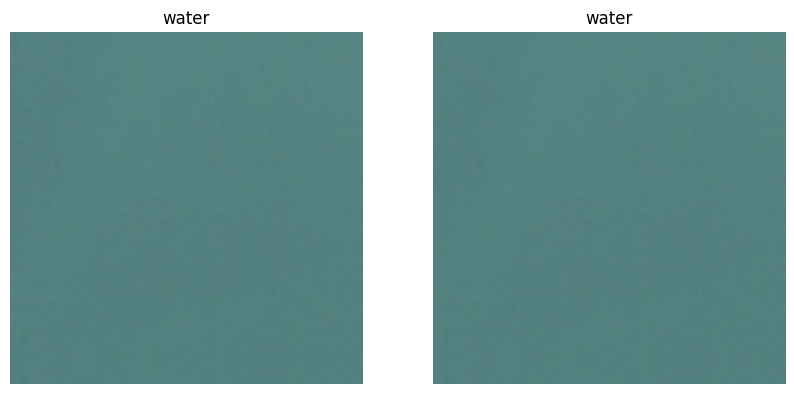

Test image 587 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


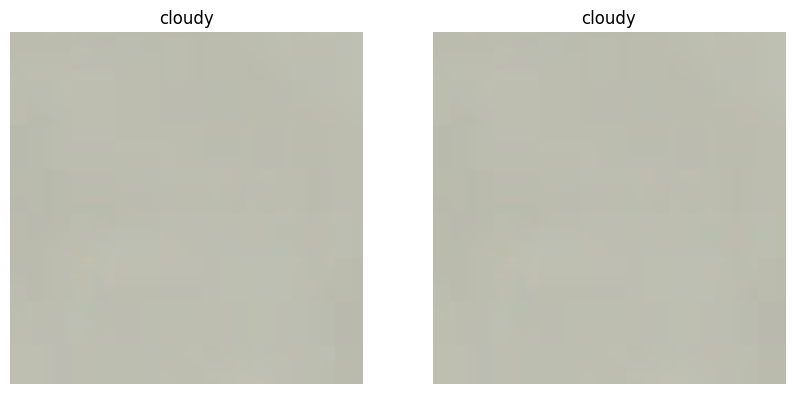

Test image 588 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


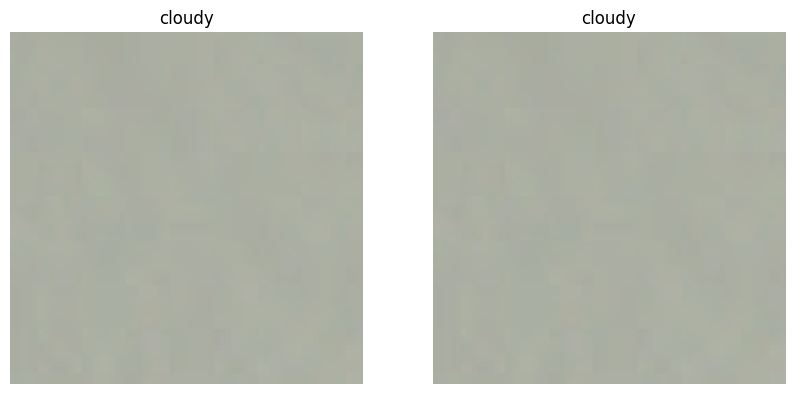

Test image 589 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


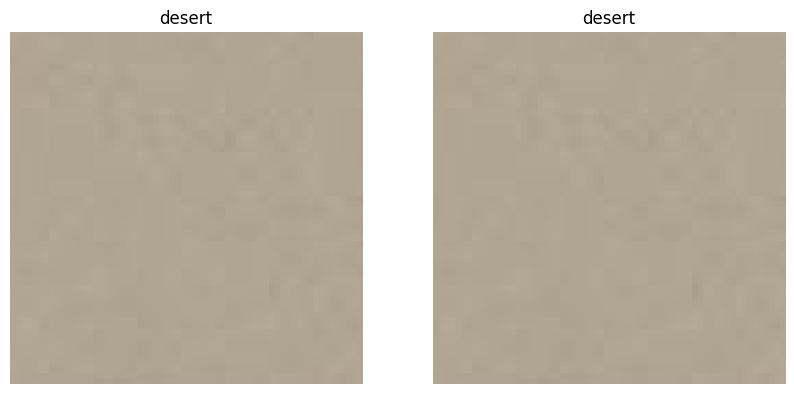

Test image 590 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


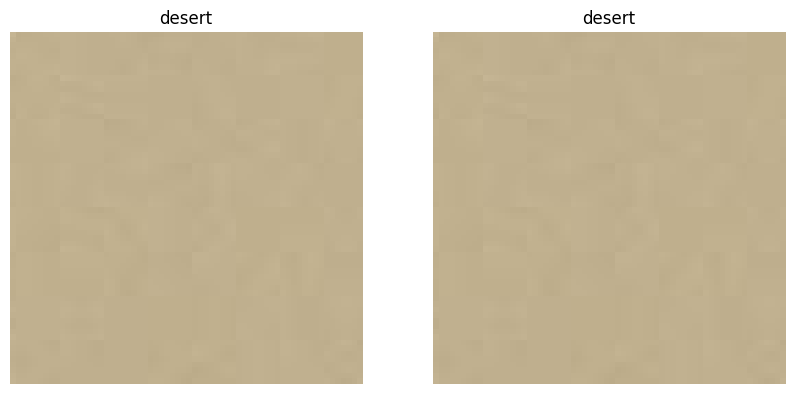

Test image 591 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


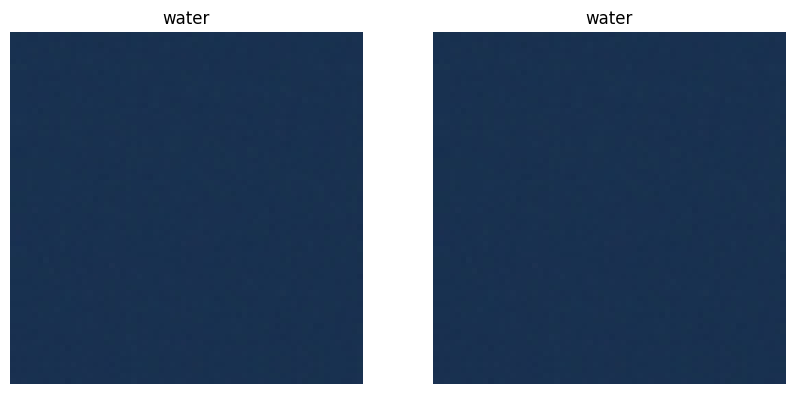

Test image 592 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


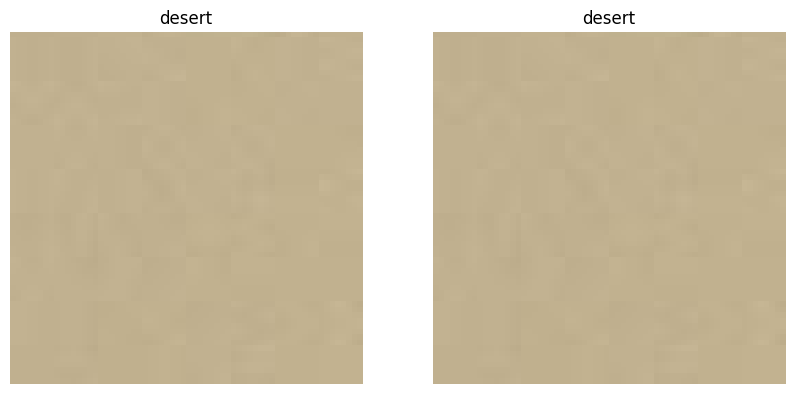

Test image 593 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


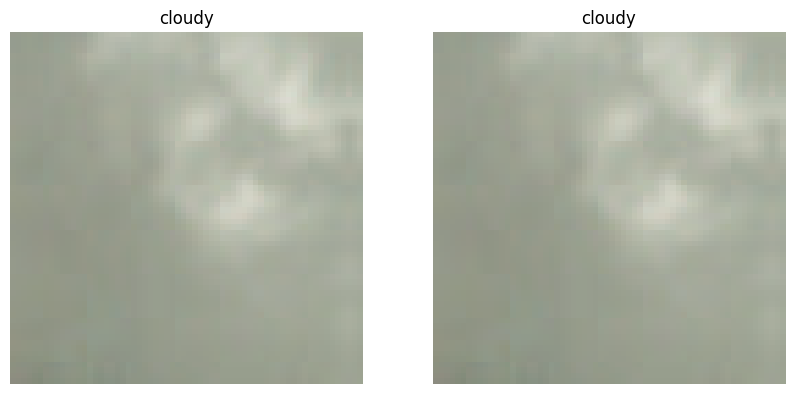

Test image 594 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


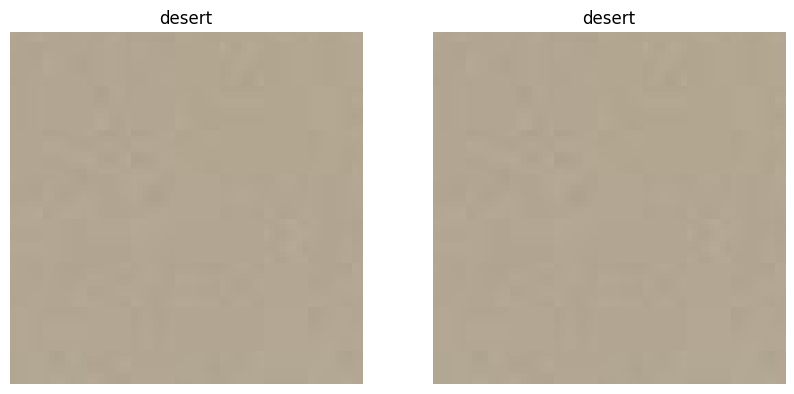

Test image 595 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


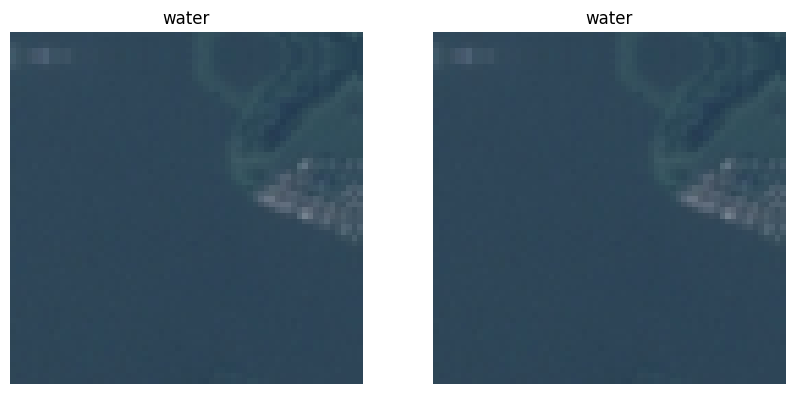

Test image 596 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


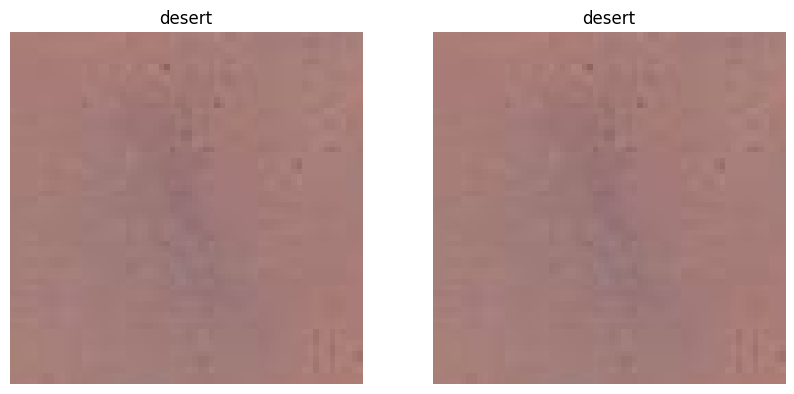

Test image 597 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


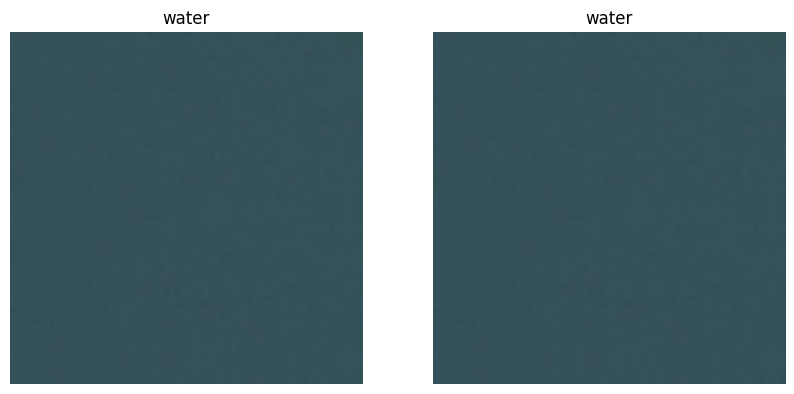

Test image 598 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


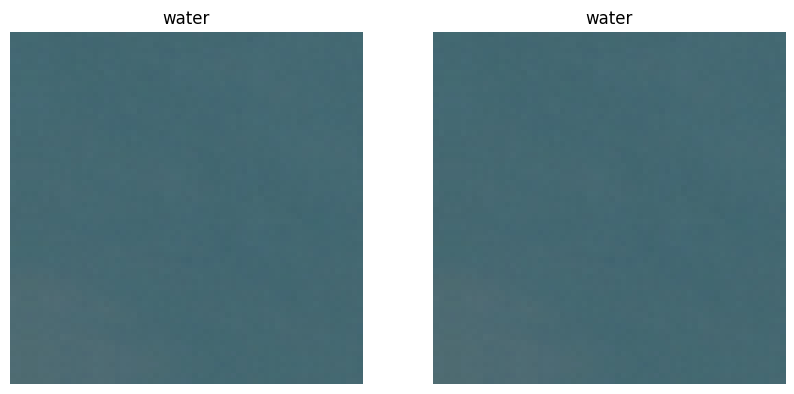

Test image 599 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


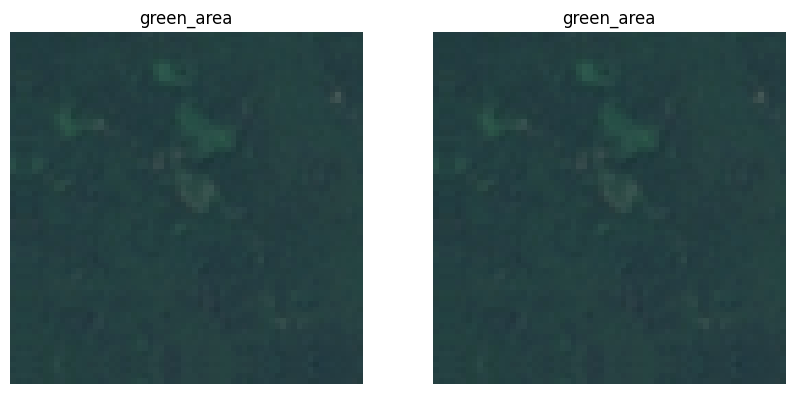

Test image 600 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


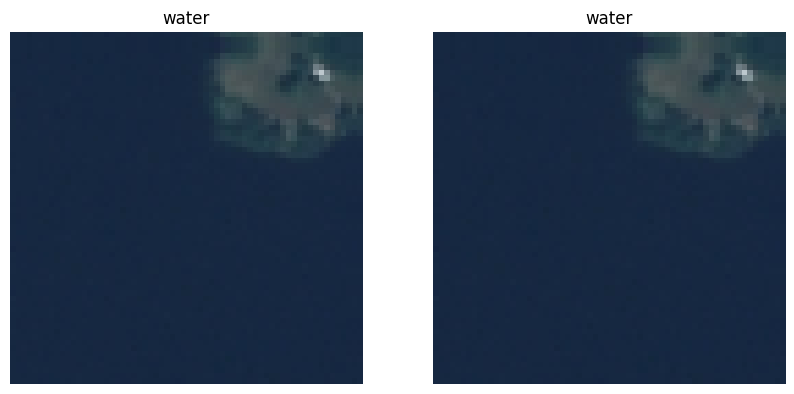

Test image 601 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


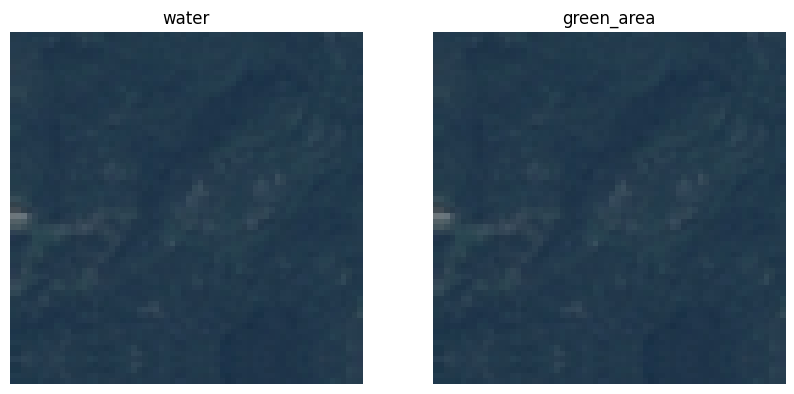

Test image 602 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


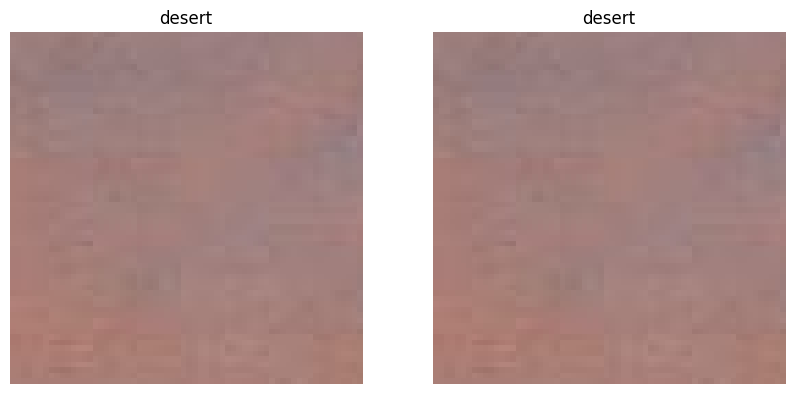

Test image 603 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


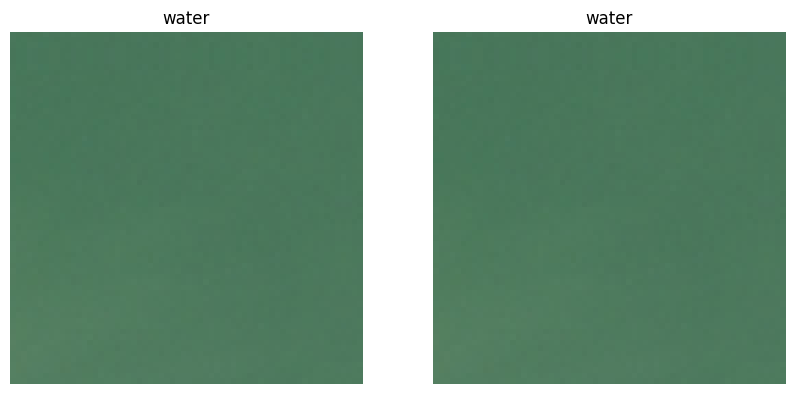

Test image 604 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


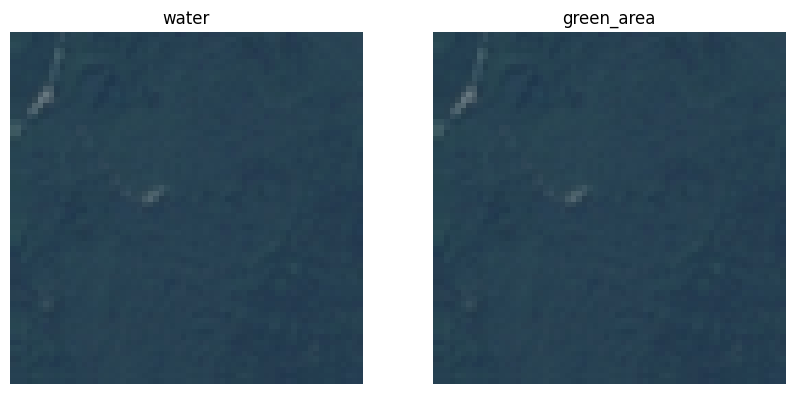

Test image 605 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


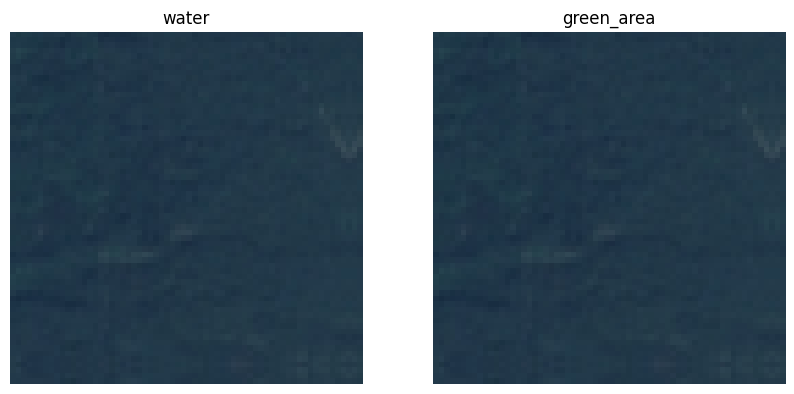

Test image 606 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


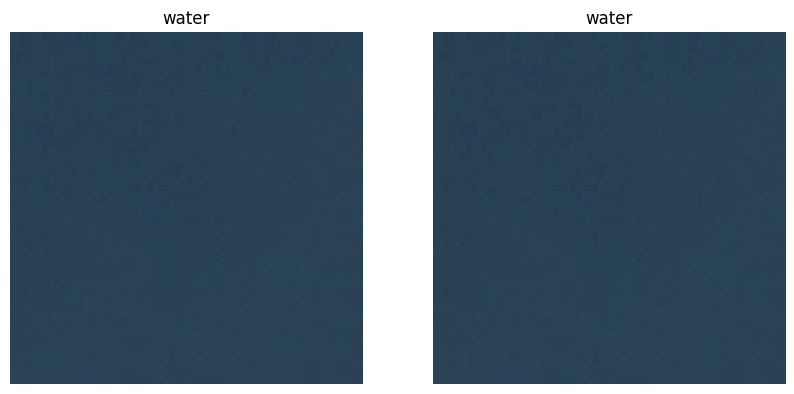

Test image 607 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


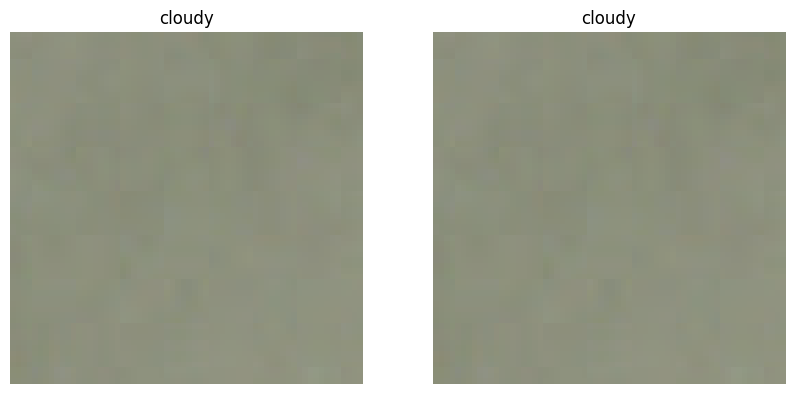

Test image 608 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


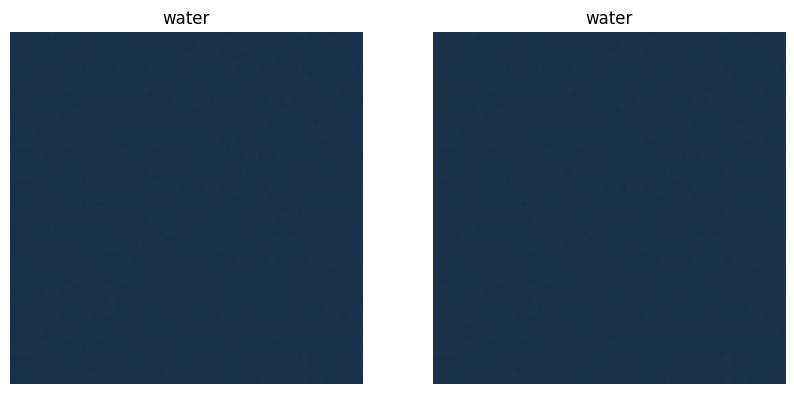

Test image 609 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


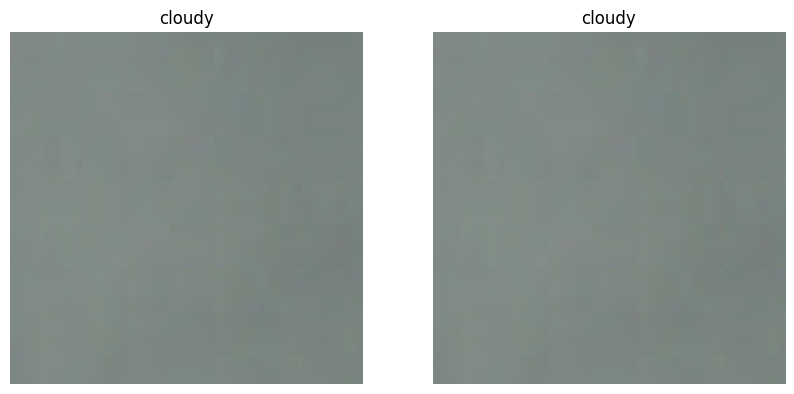

Test image 610 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


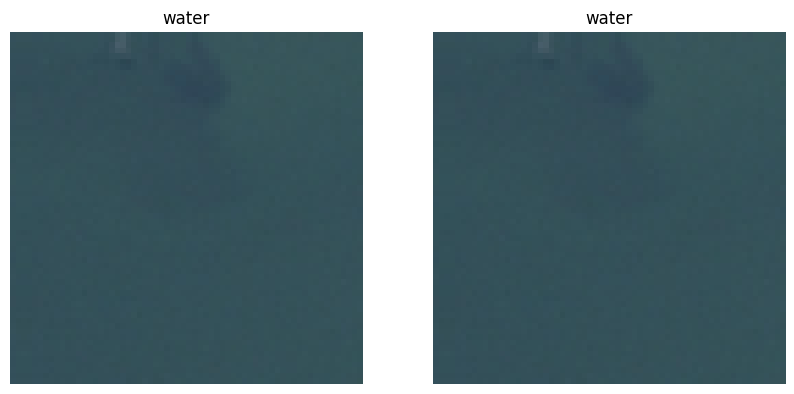

Test image 611 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


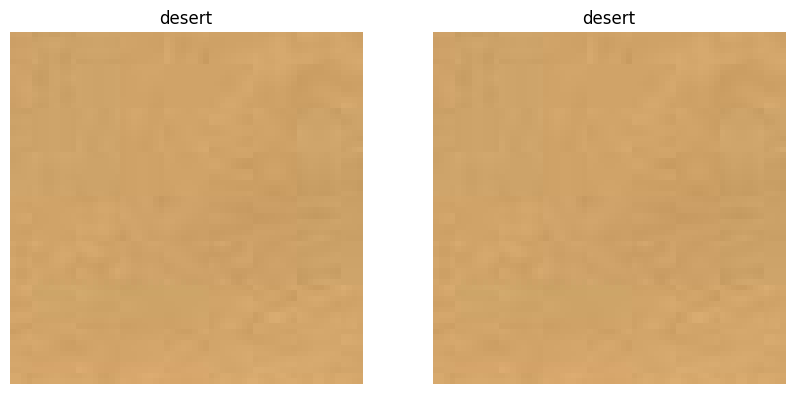

Test image 612 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


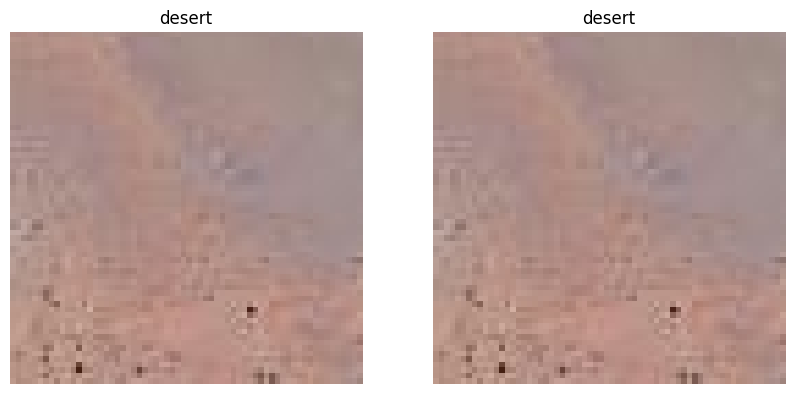

Test image 613 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


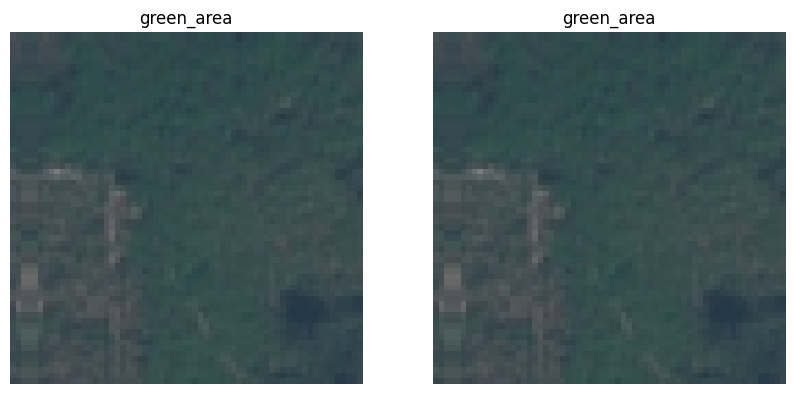

Test image 614 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


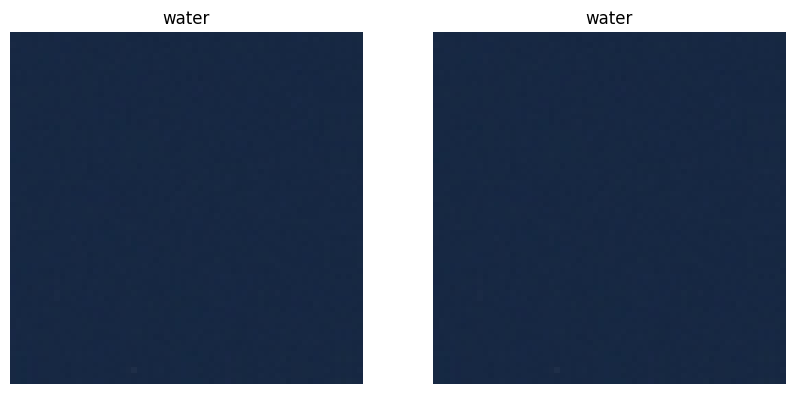

Test image 615 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


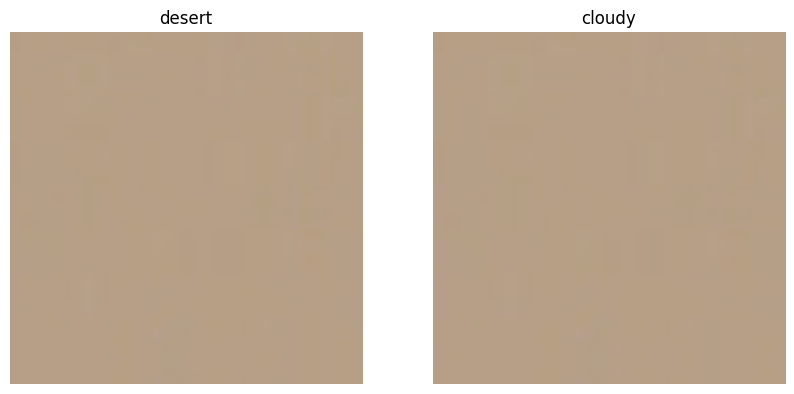

Test image 616 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


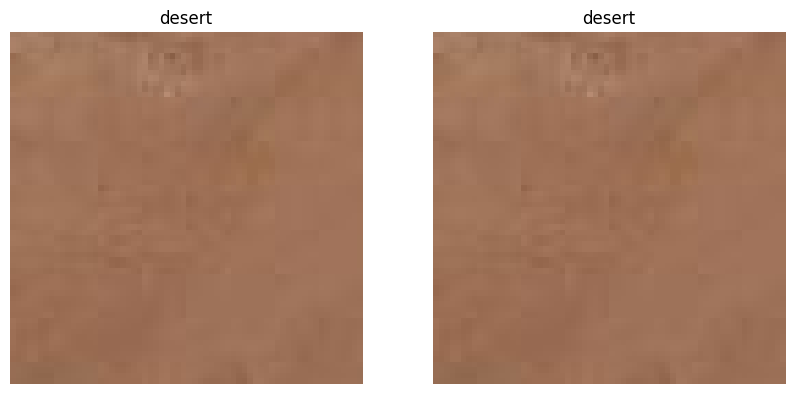

Test image 617 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


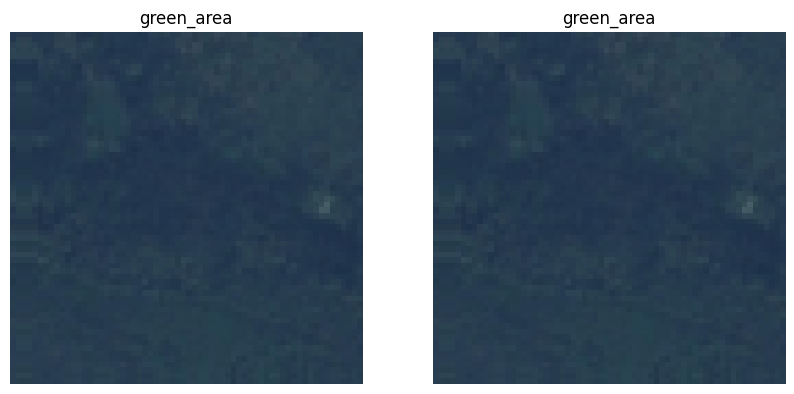

Test image 618 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


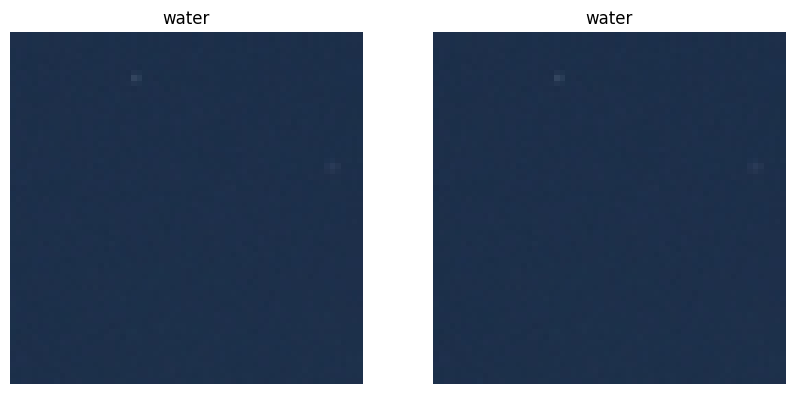

Test image 619 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


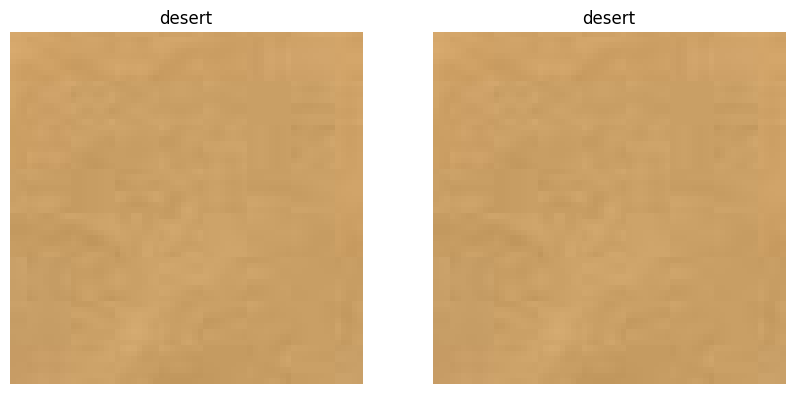

Test image 620 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


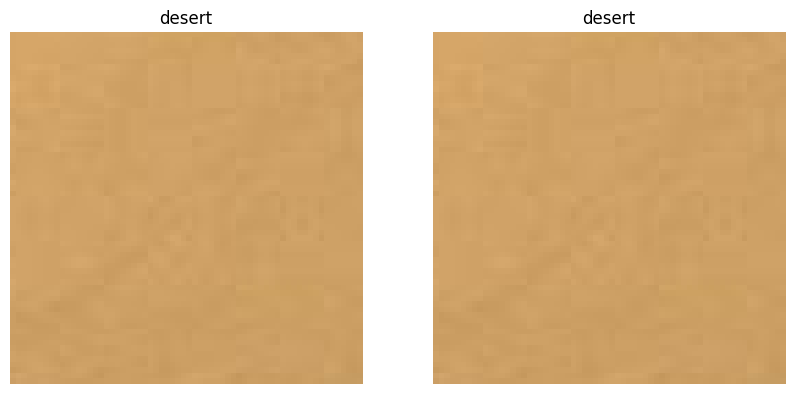

Test image 621 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


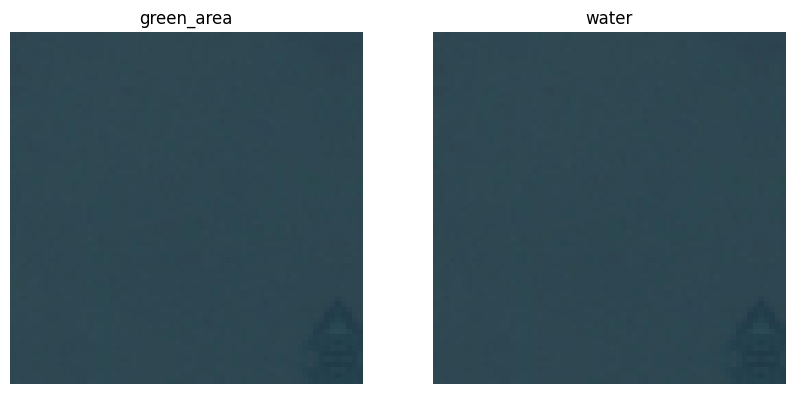

Test image 622 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


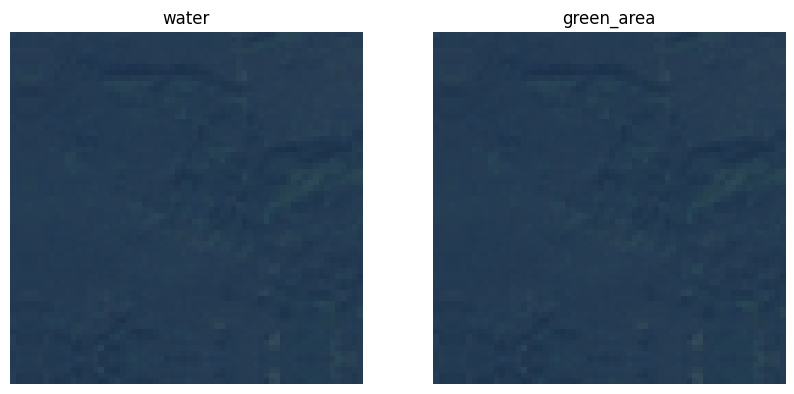

Test image 623 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


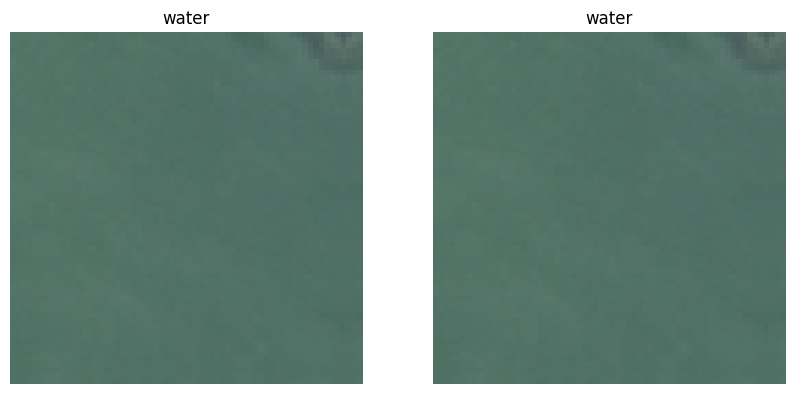

Test image 624 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


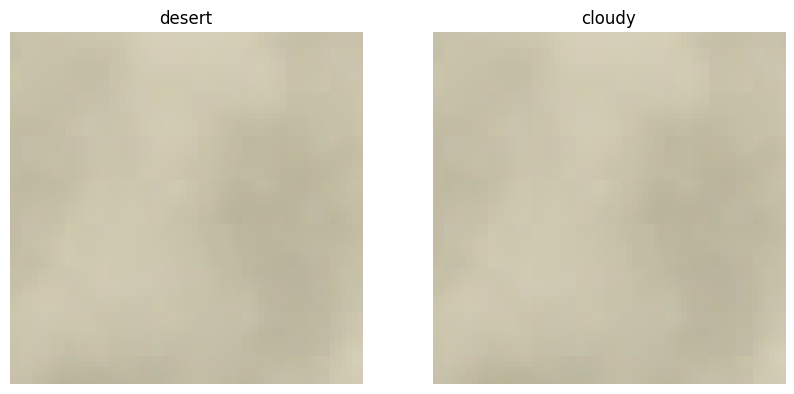

Test image 625 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


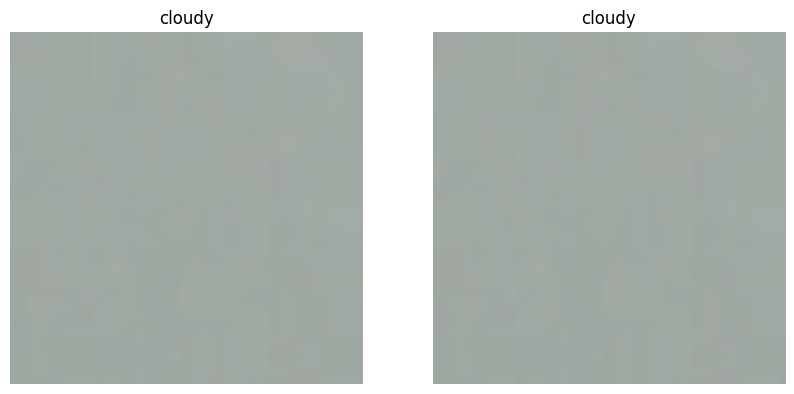

Test image 626 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


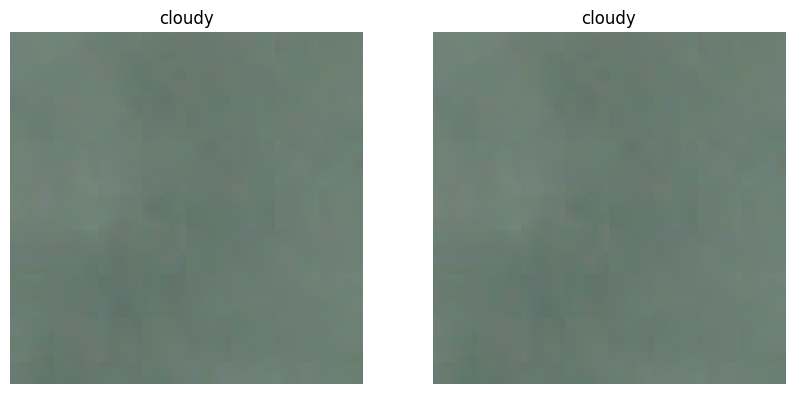

Test image 627 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


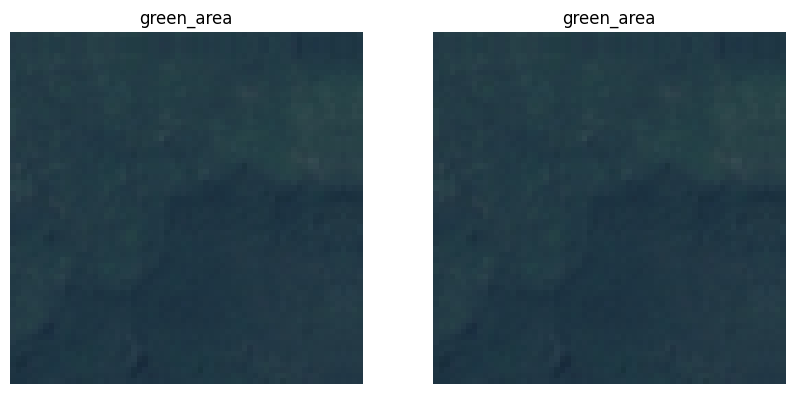

Test image 628 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


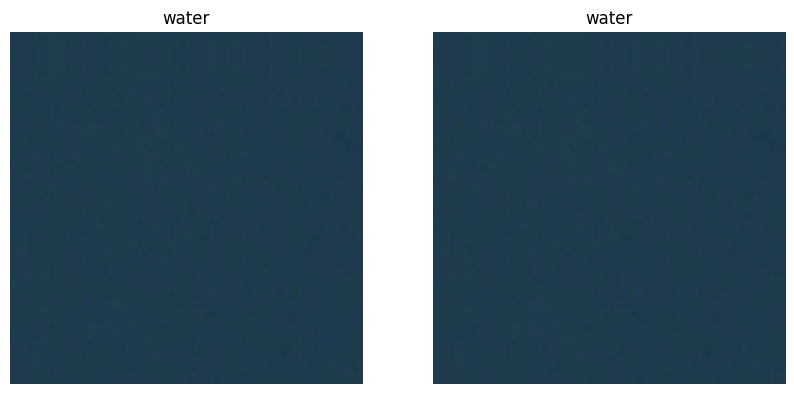

Test image 629 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


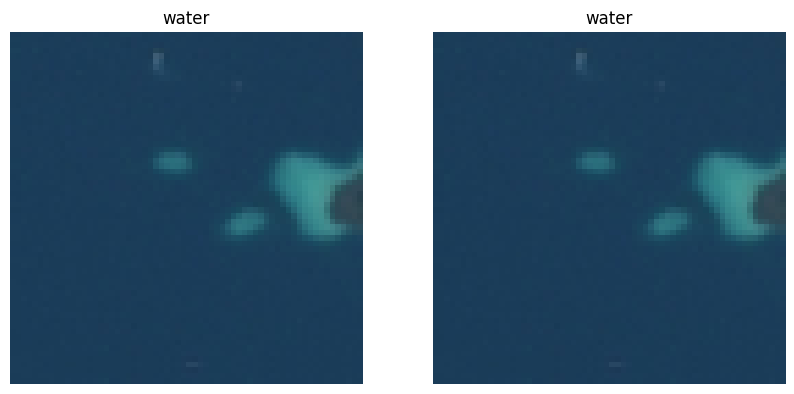

Test image 630 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


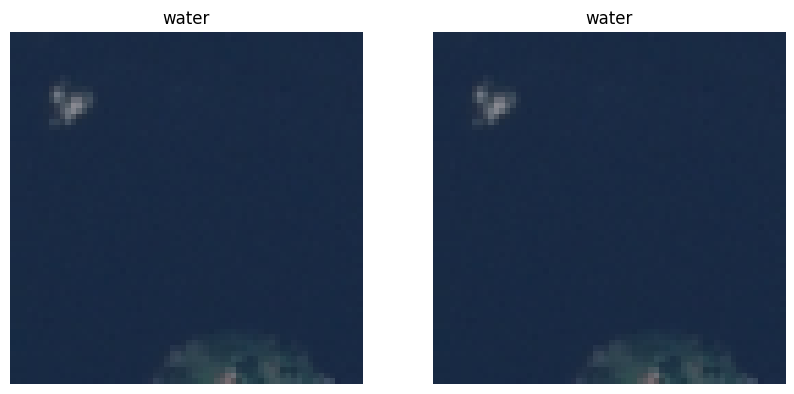

Test image 631 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


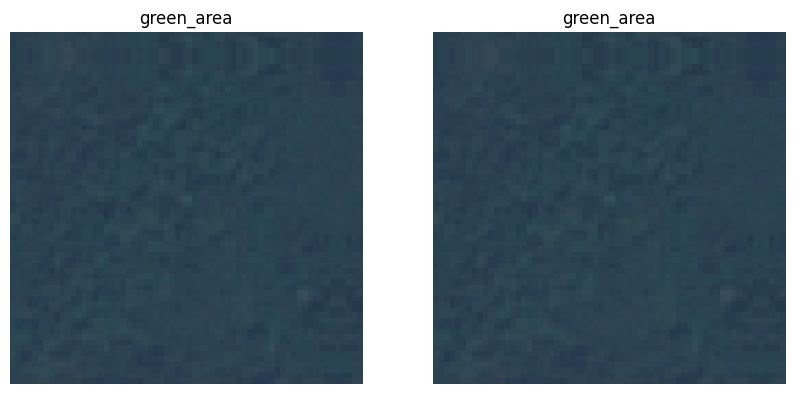

Test image 632 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


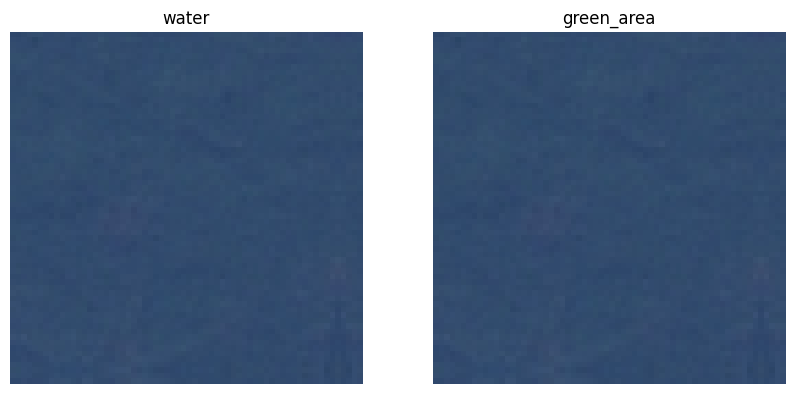

Test image 633 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


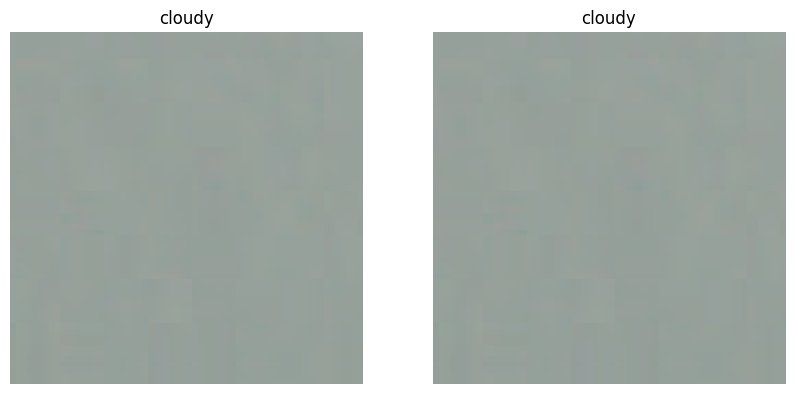

Test image 634 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


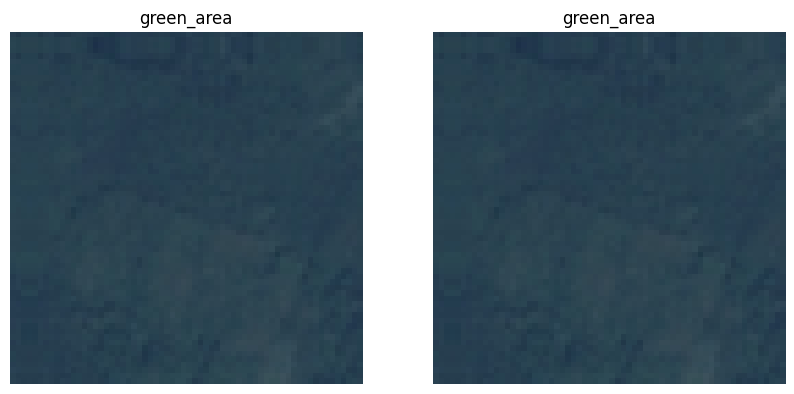

Test image 635 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


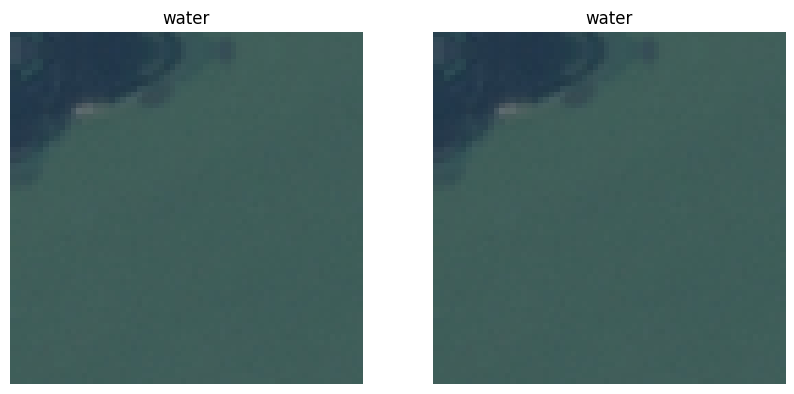

Test image 636 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


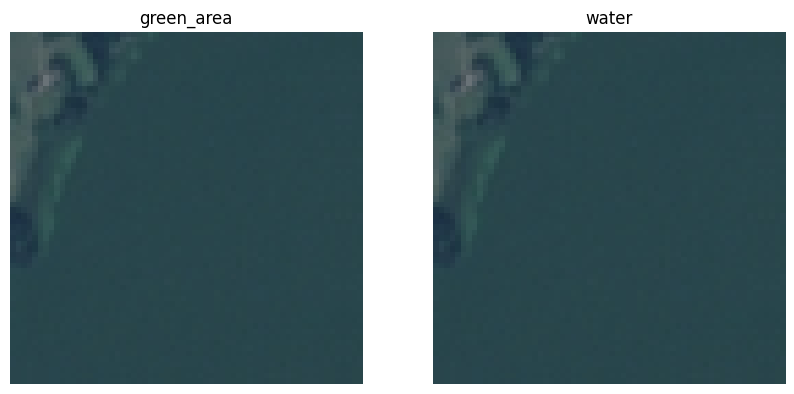

Test image 637 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


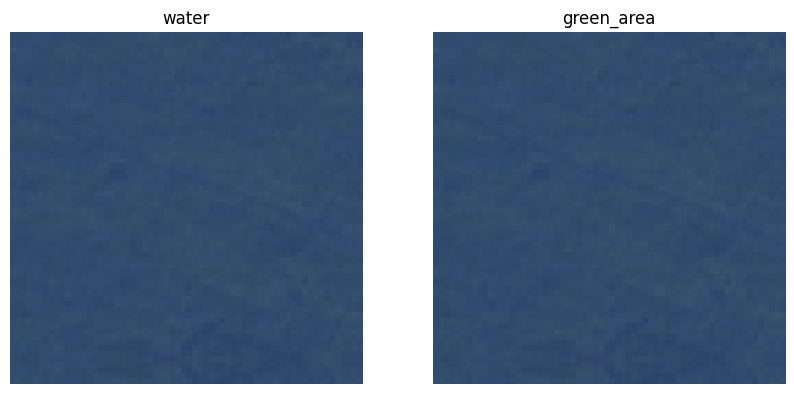

Test image 638 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


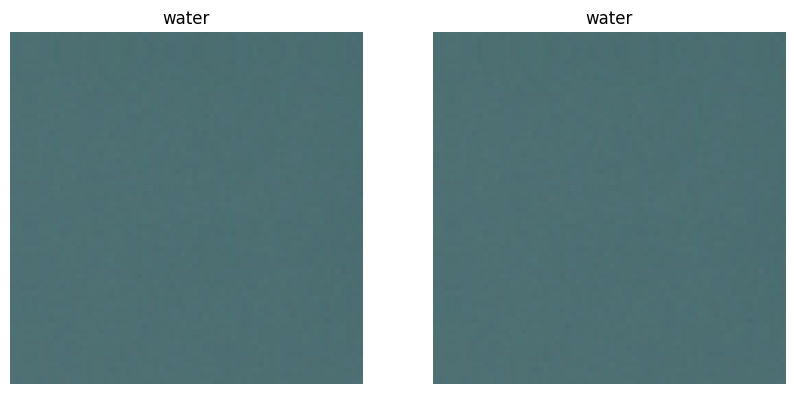

Test image 639 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


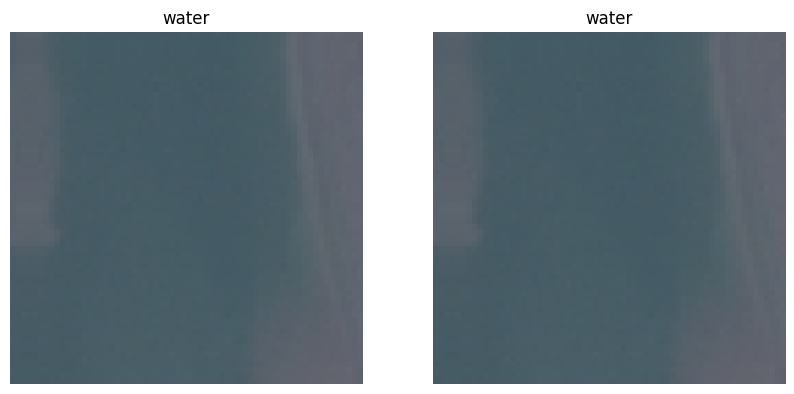

Test image 640 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


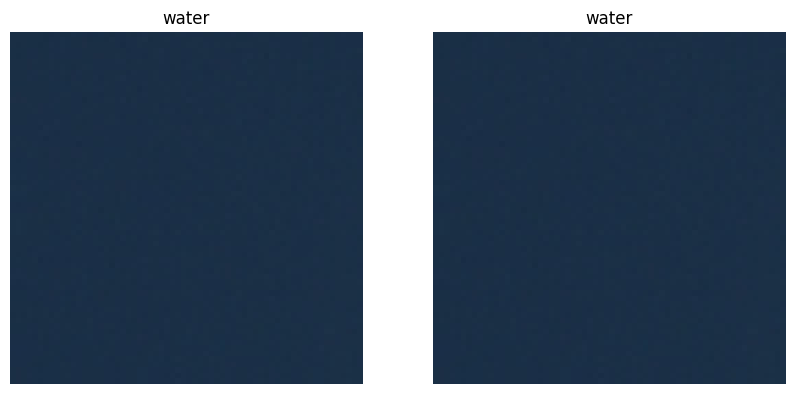

Test image 641 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


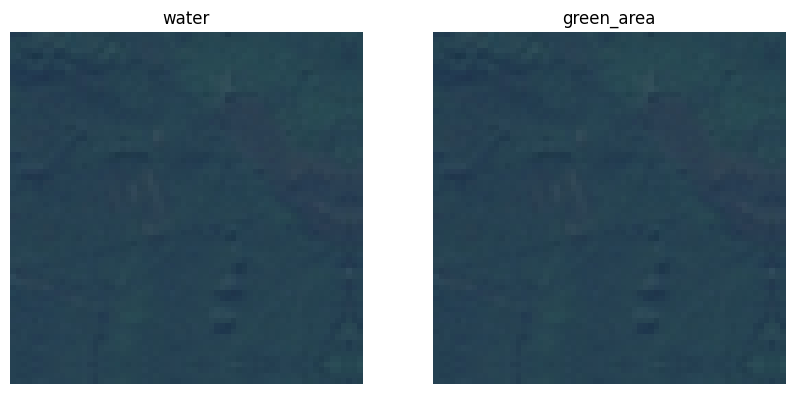

Test image 642 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


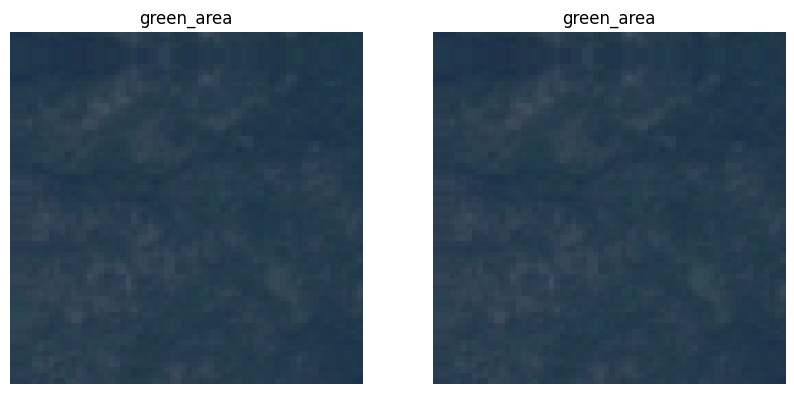

Test image 643 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


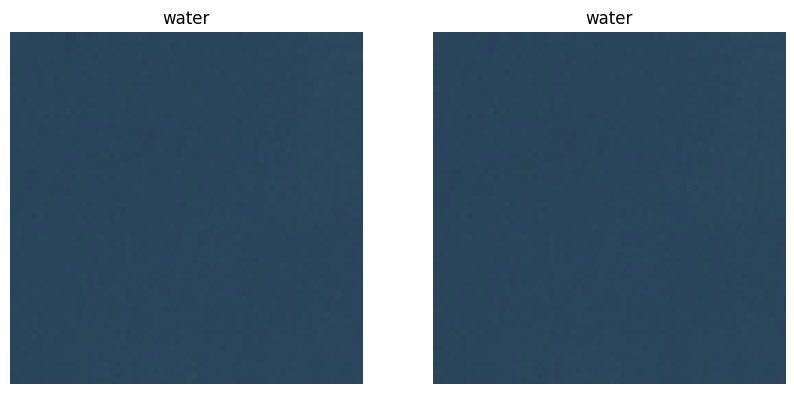

Test image 644 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


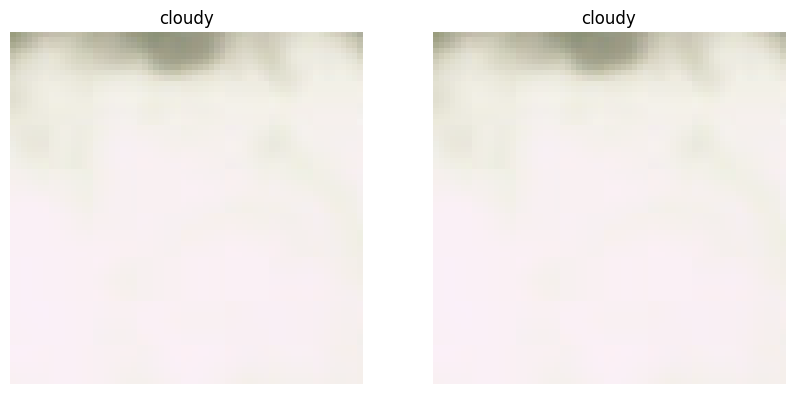

Test image 645 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


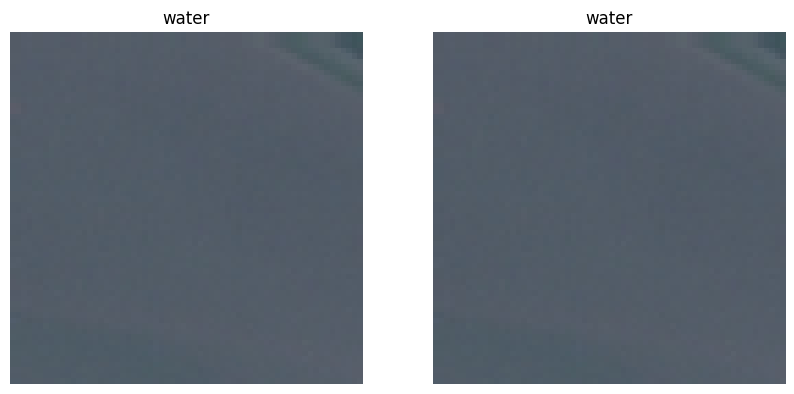

Test image 646 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


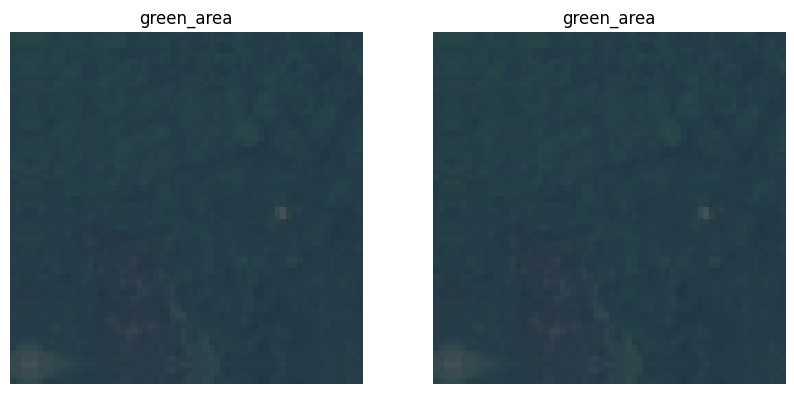

Test image 647 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


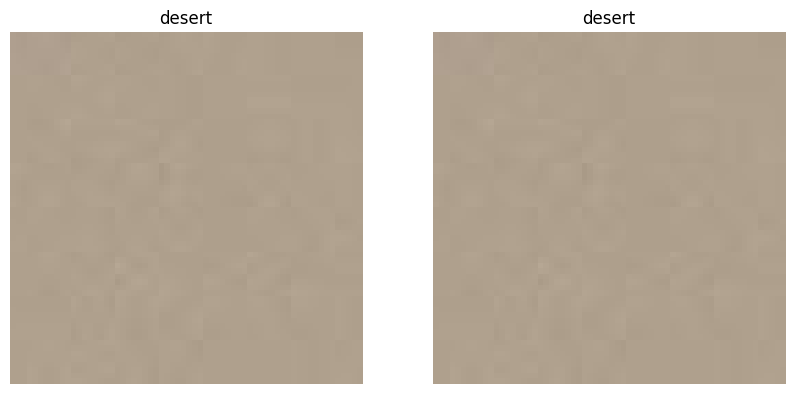

Test image 648 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


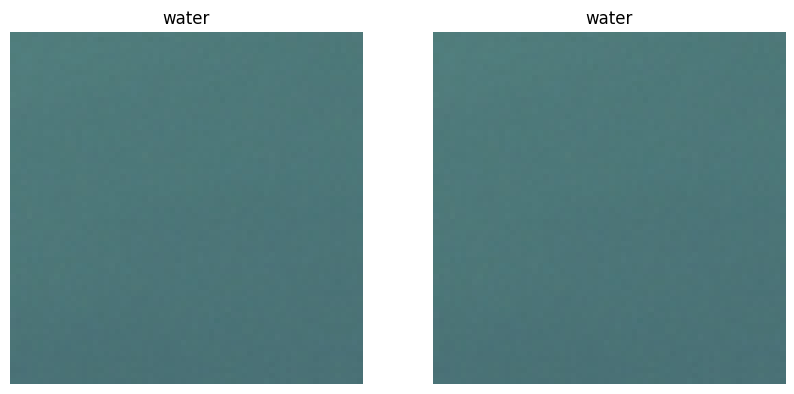

Test image 649 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


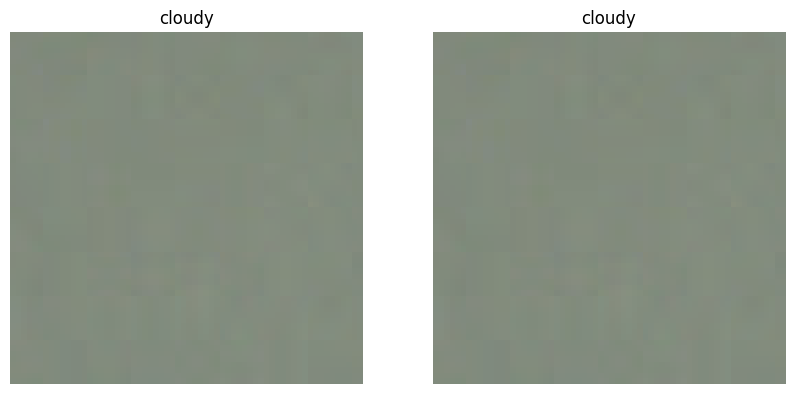

Test image 650 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


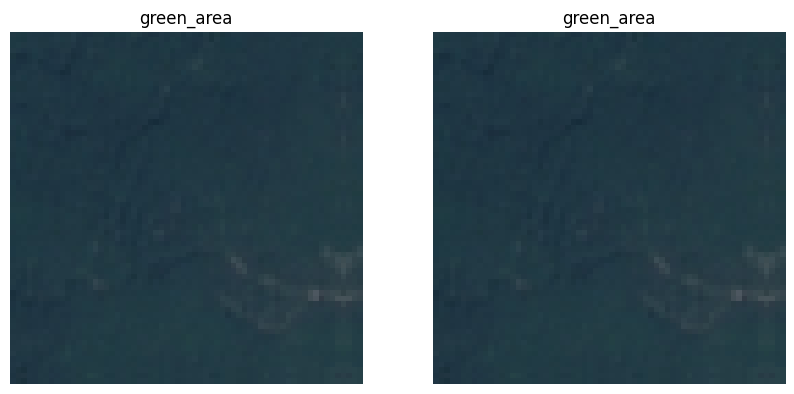

Test image 651 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


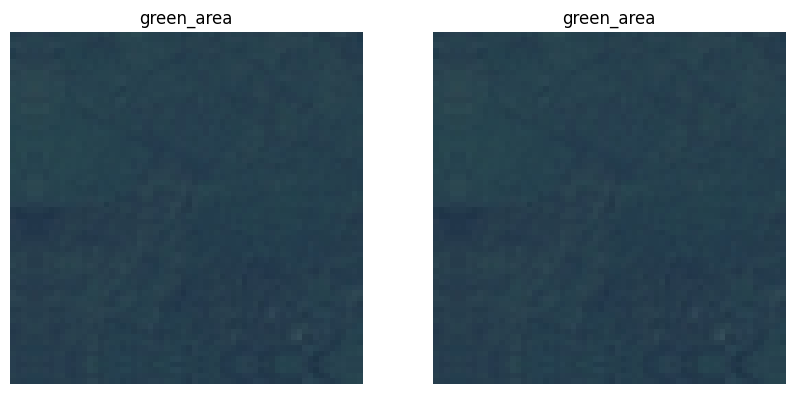

Test image 652 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


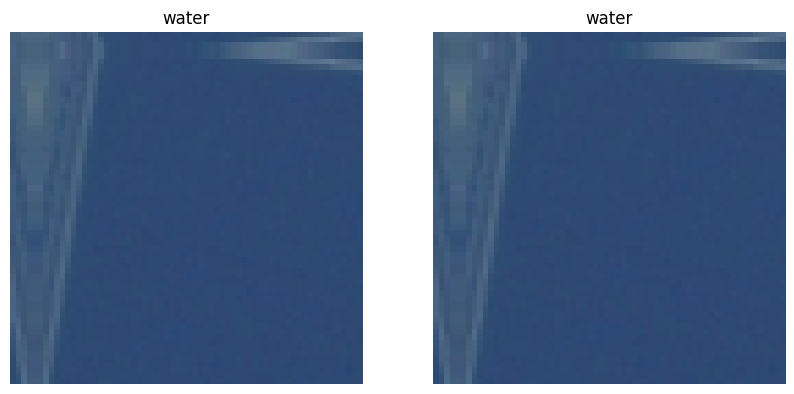

Test image 653 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


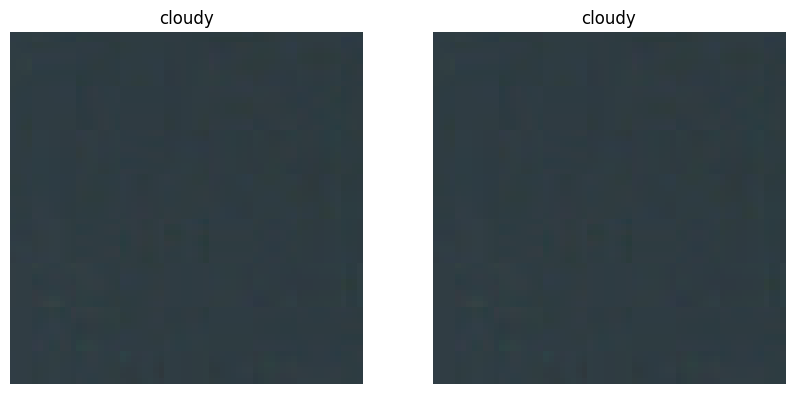

Test image 654 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


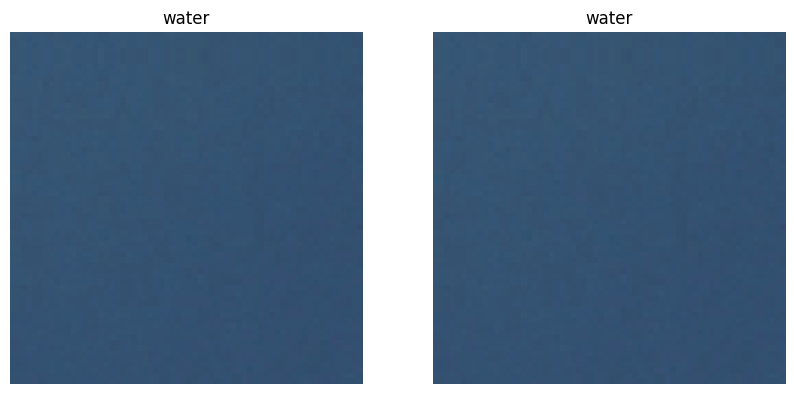

Test image 655 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


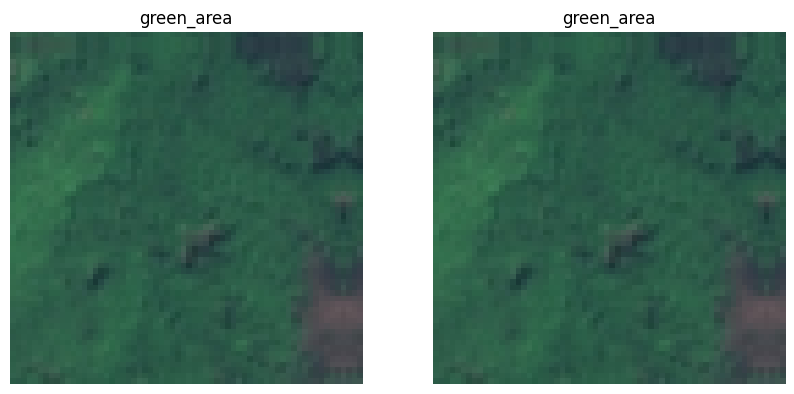

Test image 656 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


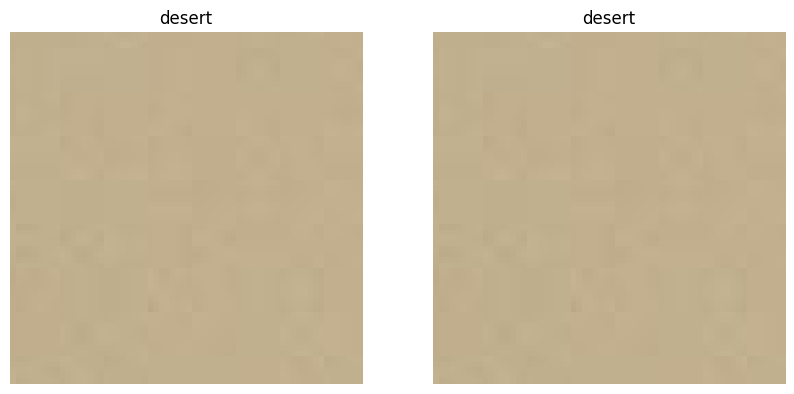

Test image 657 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


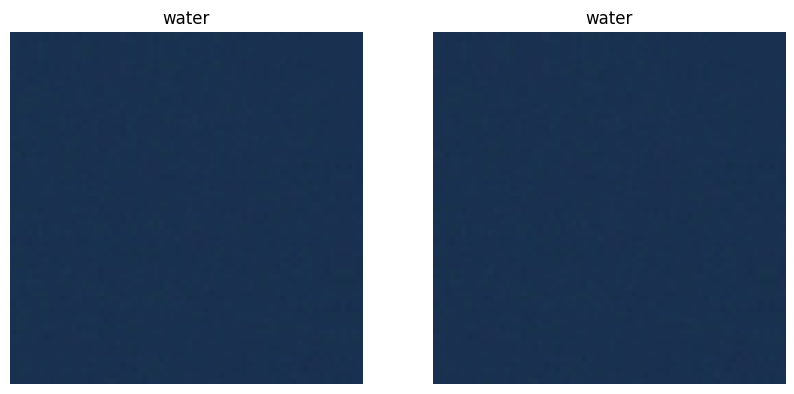

Test image 658 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


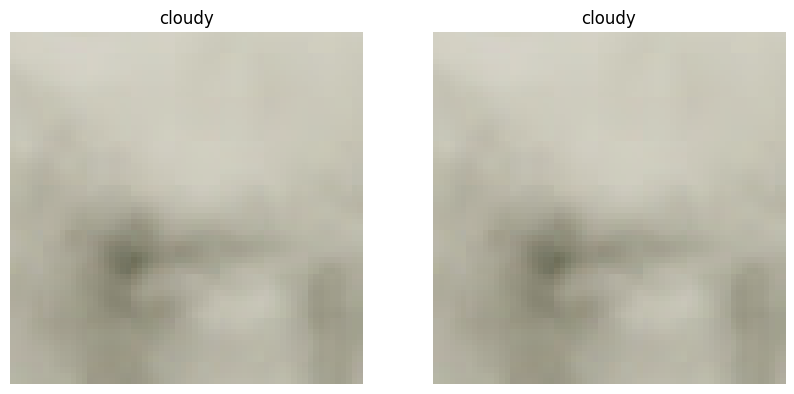

Test image 659 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


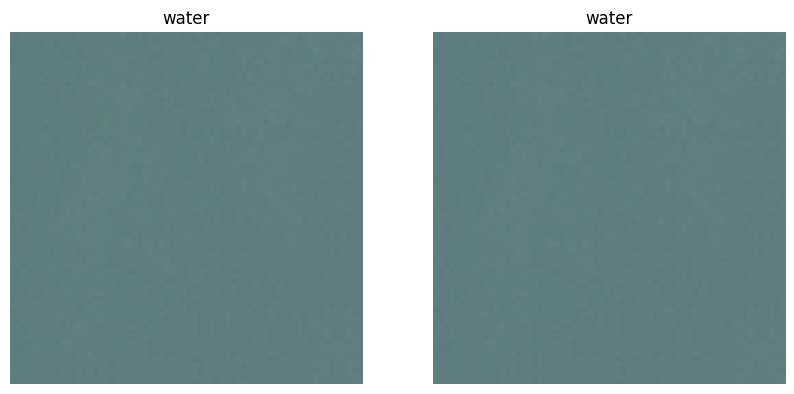

Test image 660 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


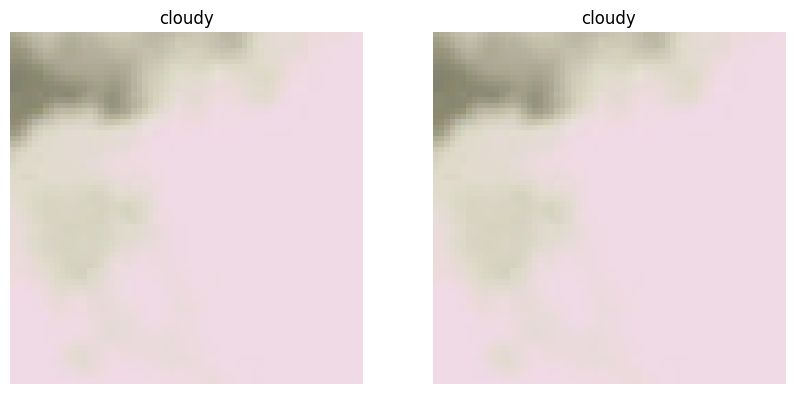

Test image 661 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


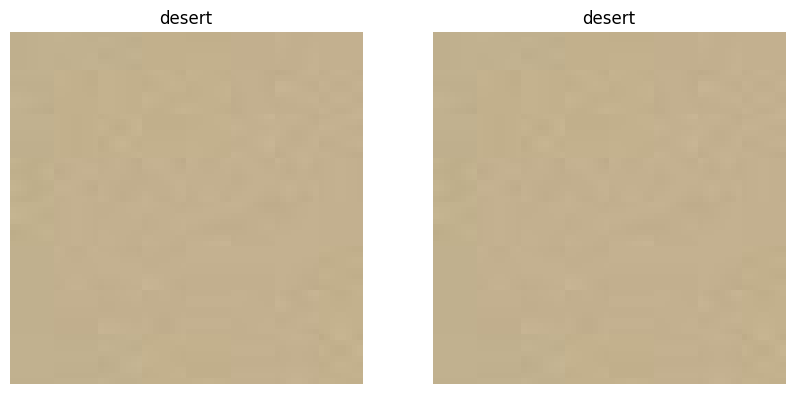

Test image 662 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


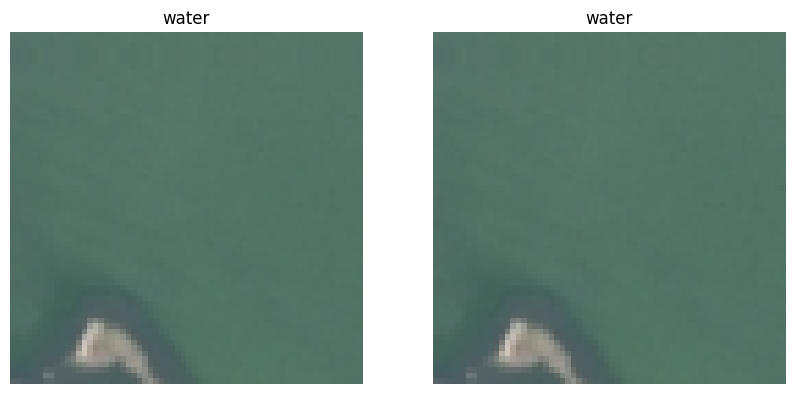

Test image 663 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


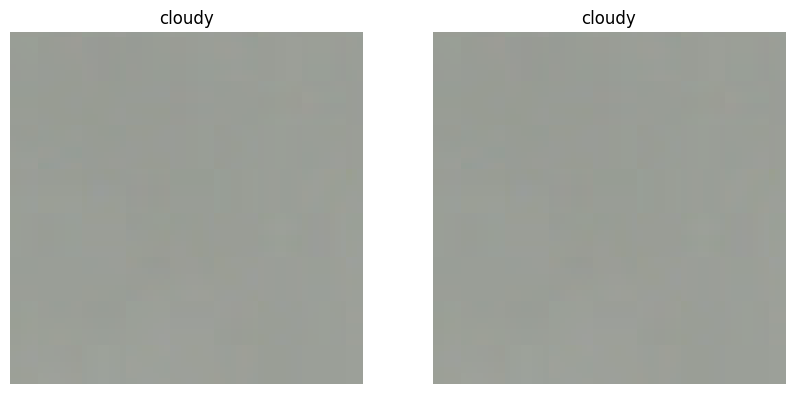

Test image 664 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


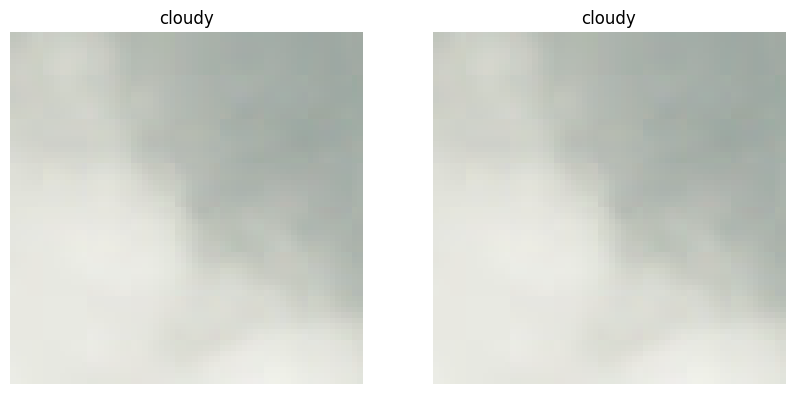

Test image 665 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


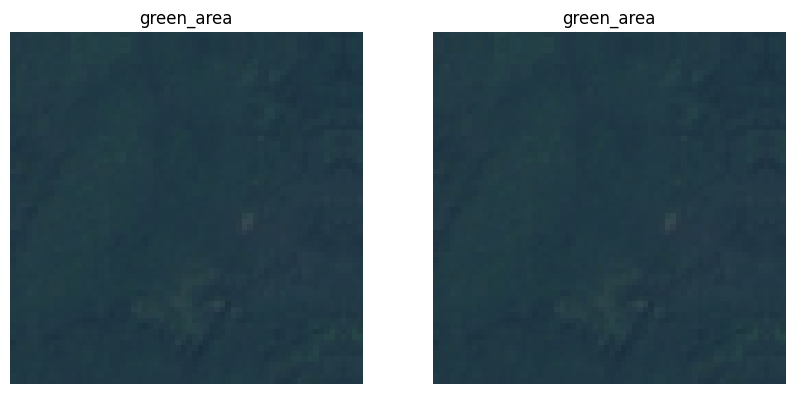

Test image 666 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


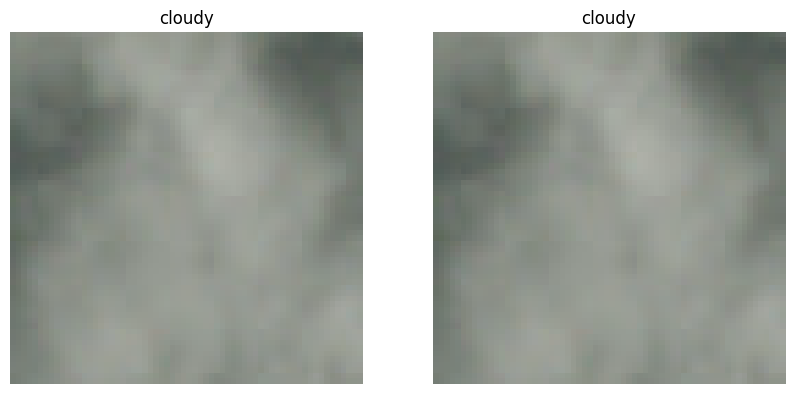

Test image 667 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


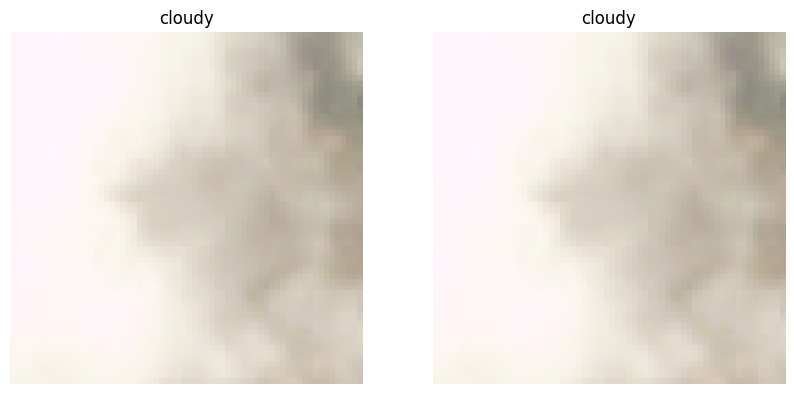

Test image 668 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


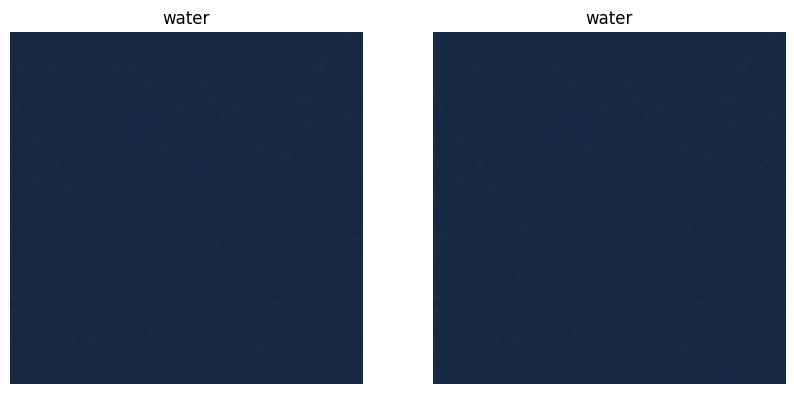

Test image 669 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


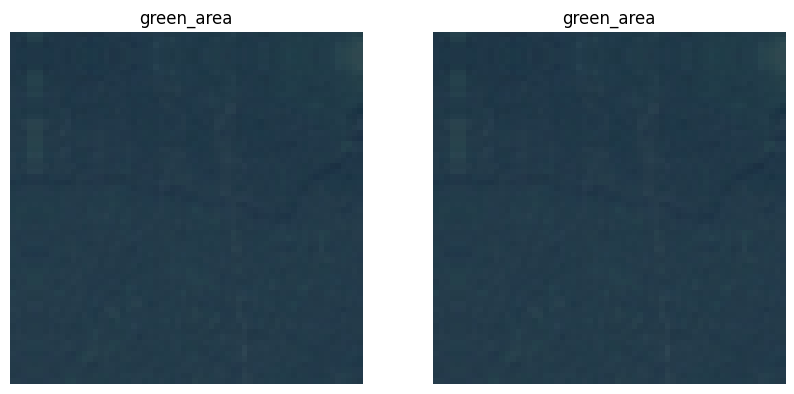

Test image 670 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


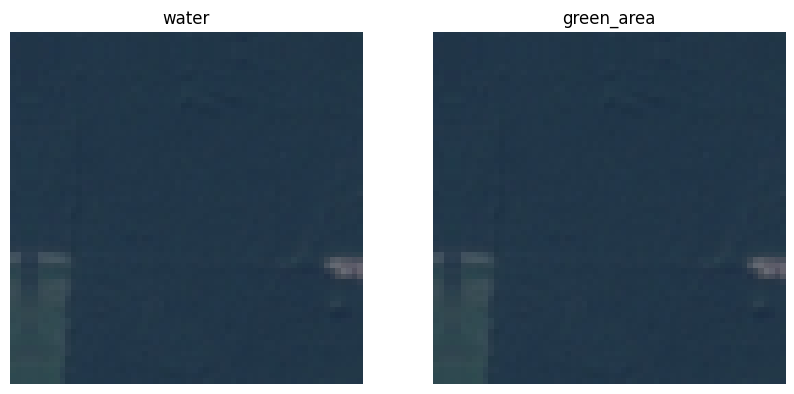

Test image 671 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


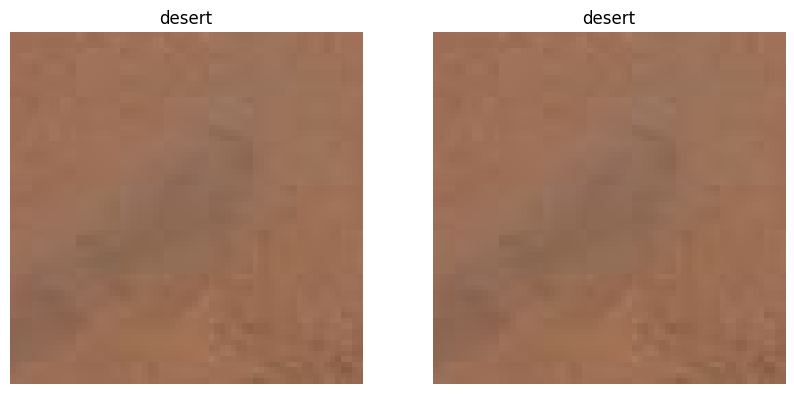

Test image 672 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


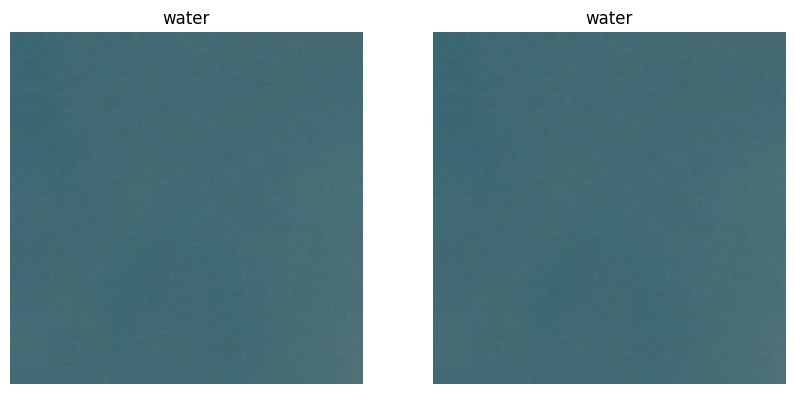

Test image 673 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


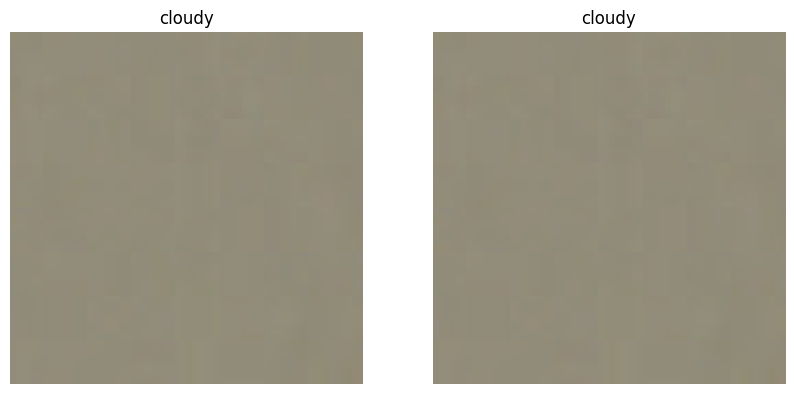

Test image 674 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


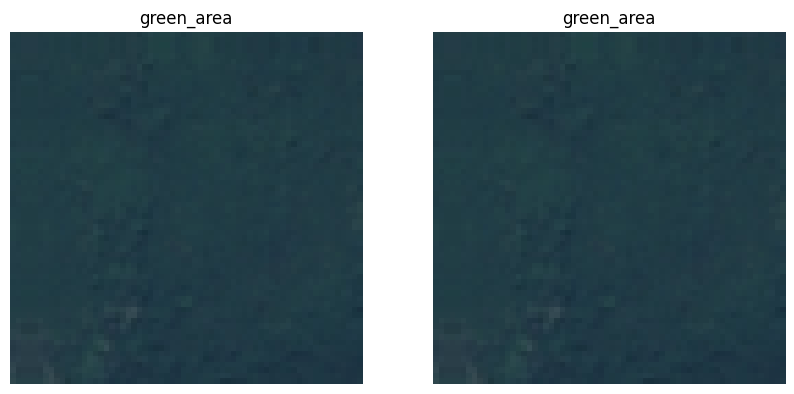

Test image 675 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


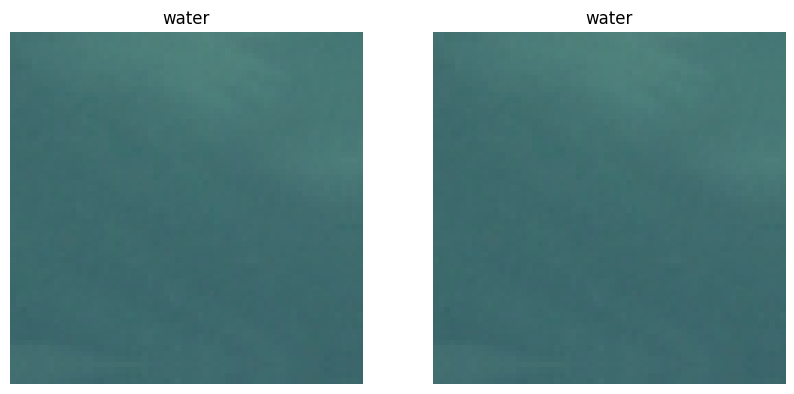

Test image 676 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


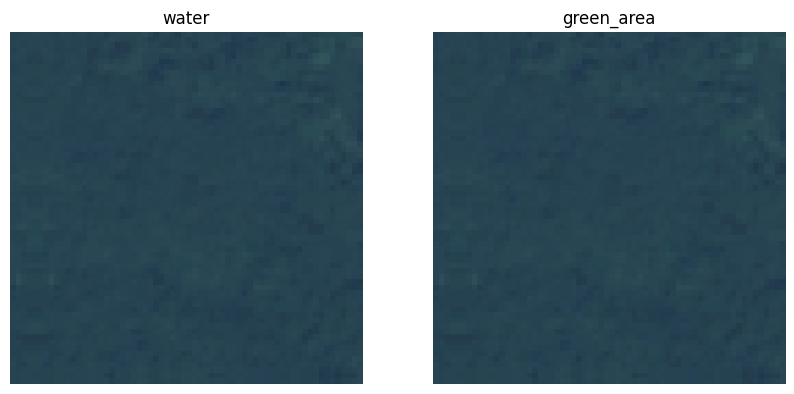

Test image 677 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


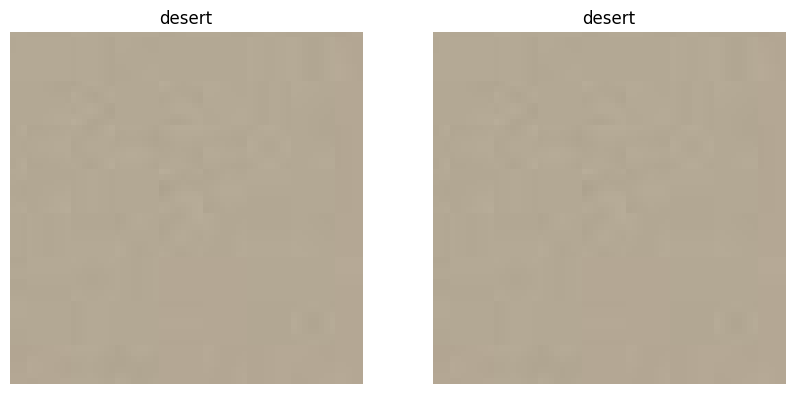

Test image 678 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


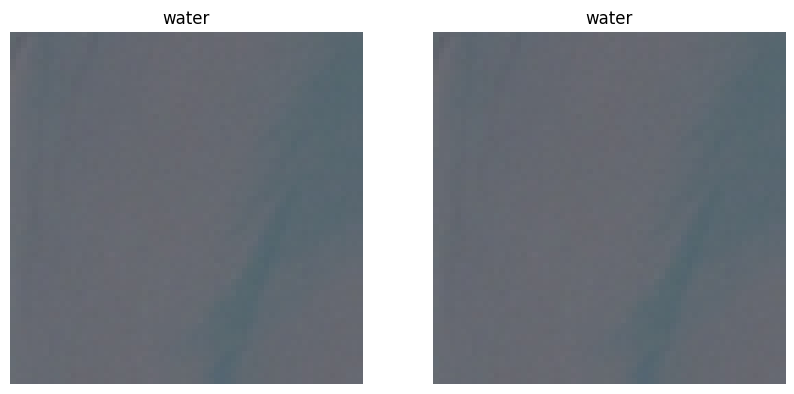

Test image 679 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


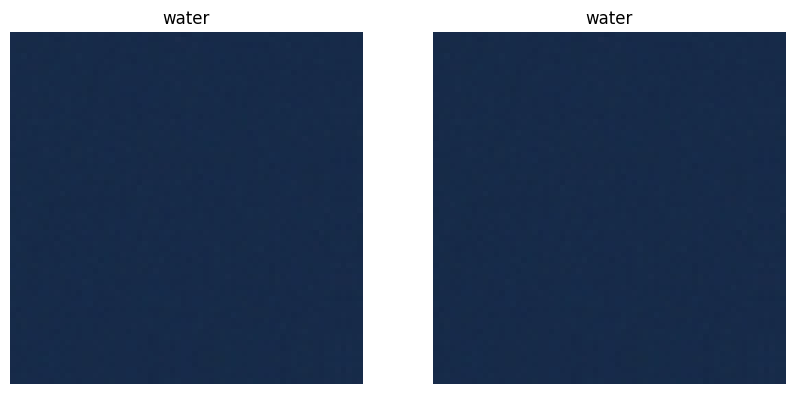

Test image 680 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


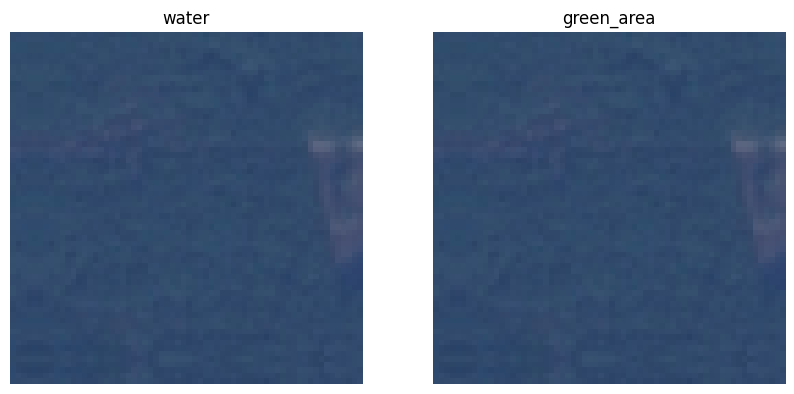

Test image 681 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


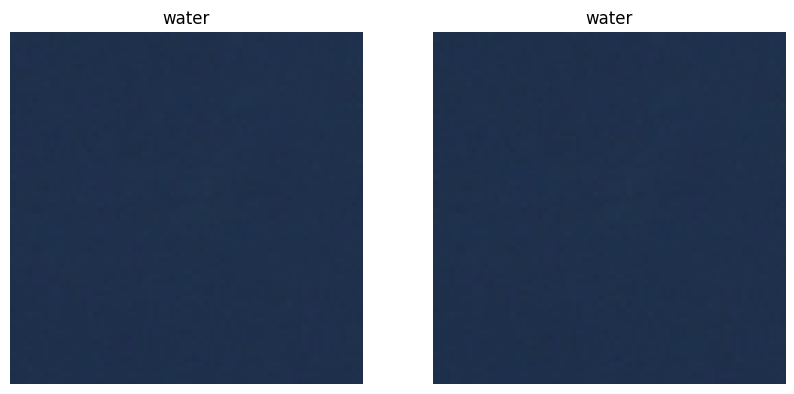

Test image 682 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


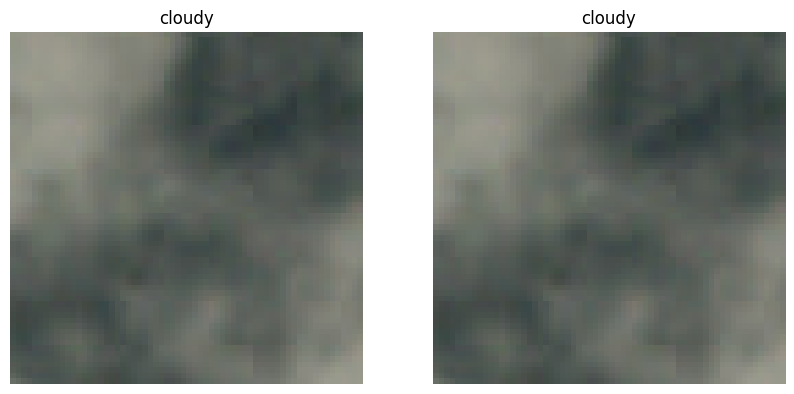

Test image 683 , Result: Wrong Predicted: cloudy , Real Class: desert
Predicted Class Image vs Real Class Image:


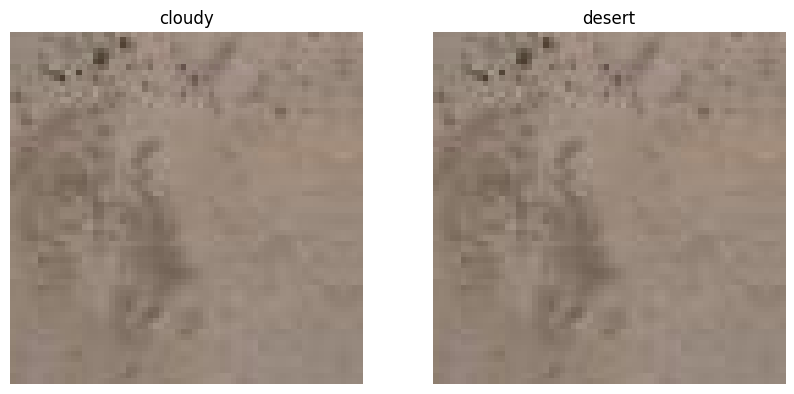

Test image 684 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


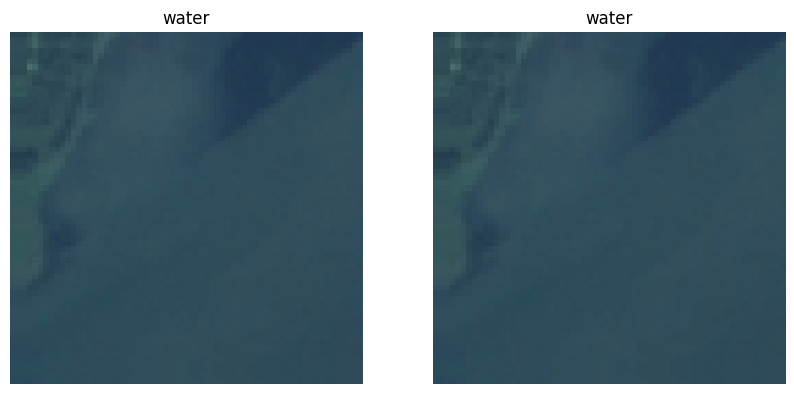

Test image 685 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


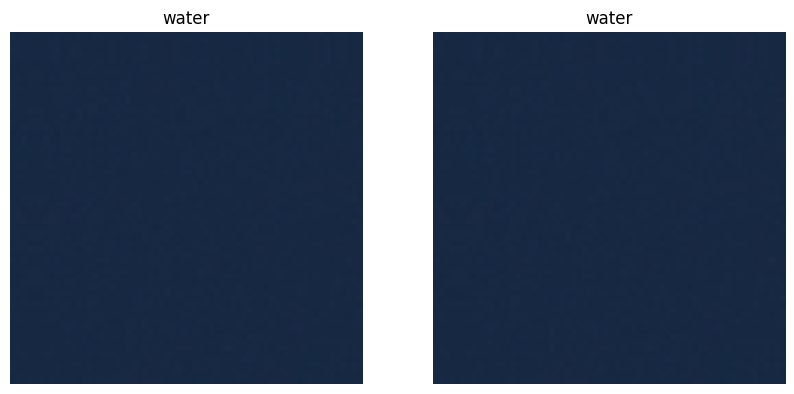

Test image 686 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


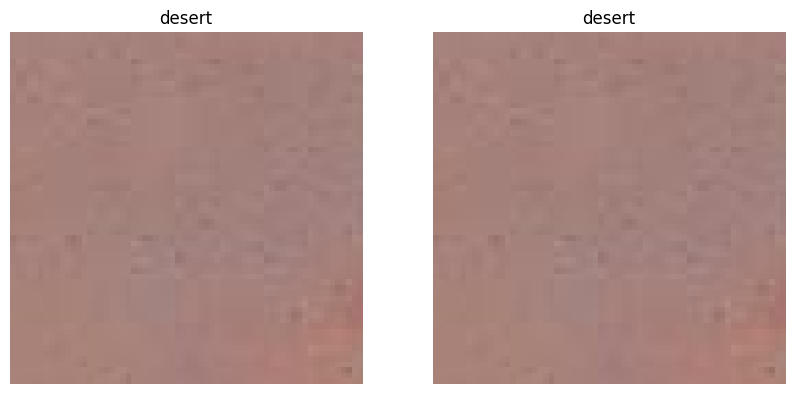

Test image 687 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


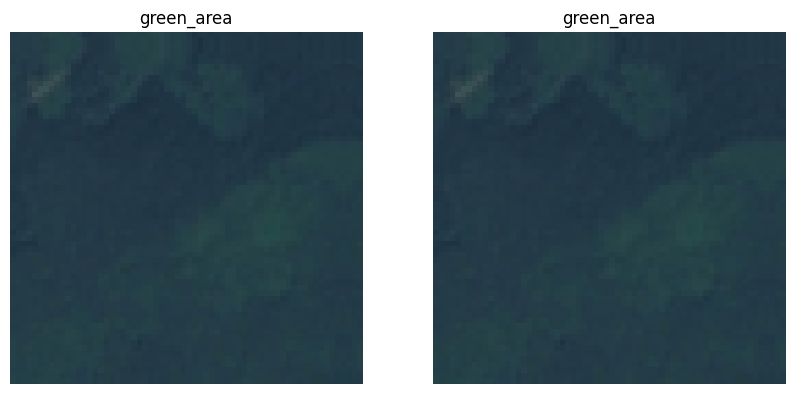

Test image 688 , Result: Wrong Predicted: water , Real Class: cloudy
Predicted Class Image vs Real Class Image:


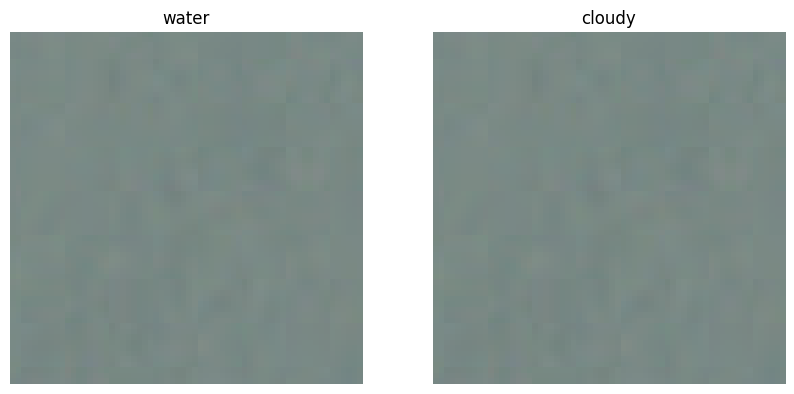

Test image 689 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


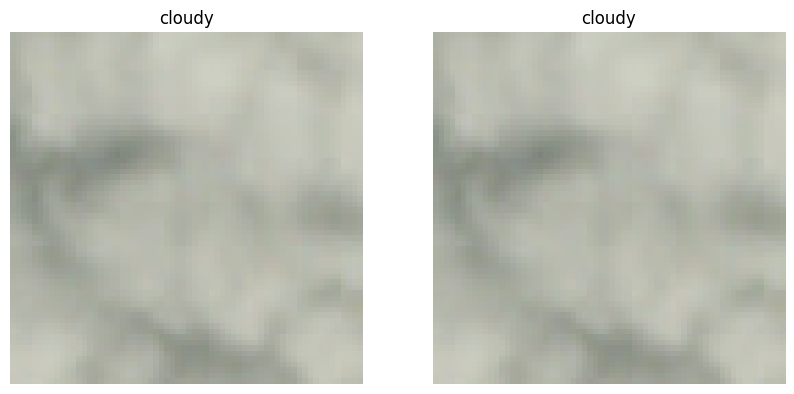

Test image 690 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


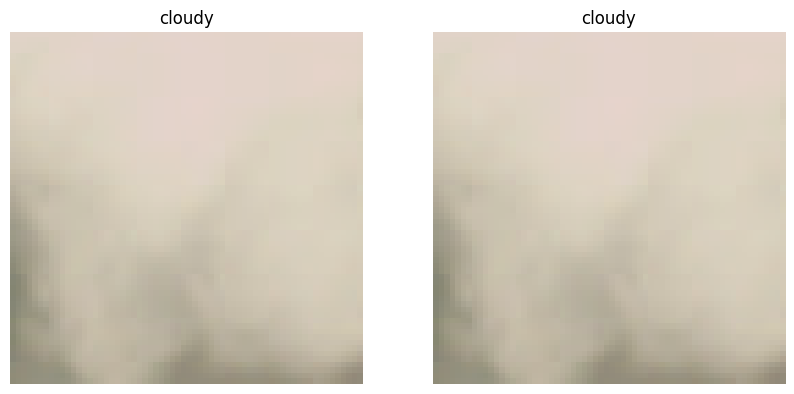

Test image 691 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


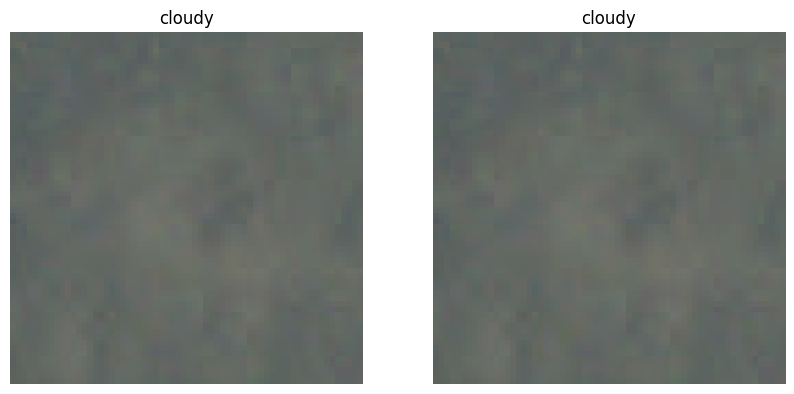

Test image 692 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


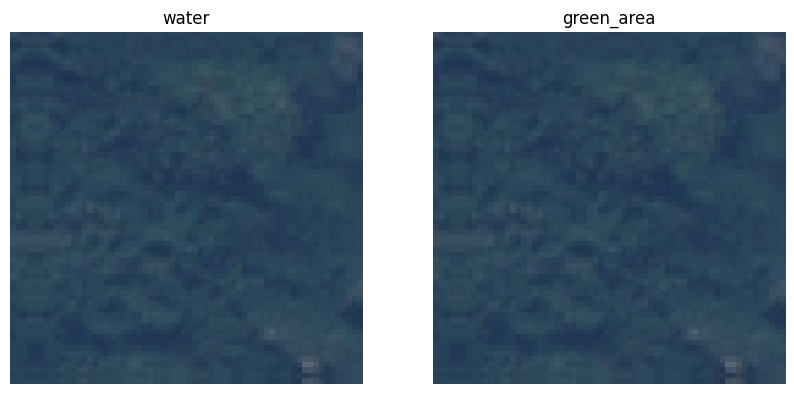

Test image 693 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


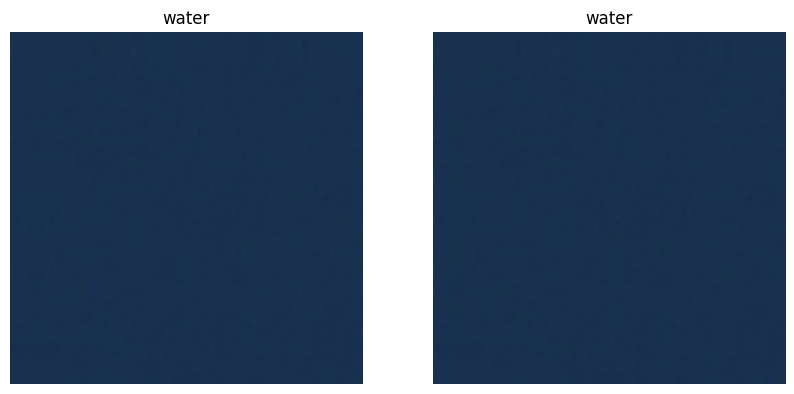

Test image 694 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


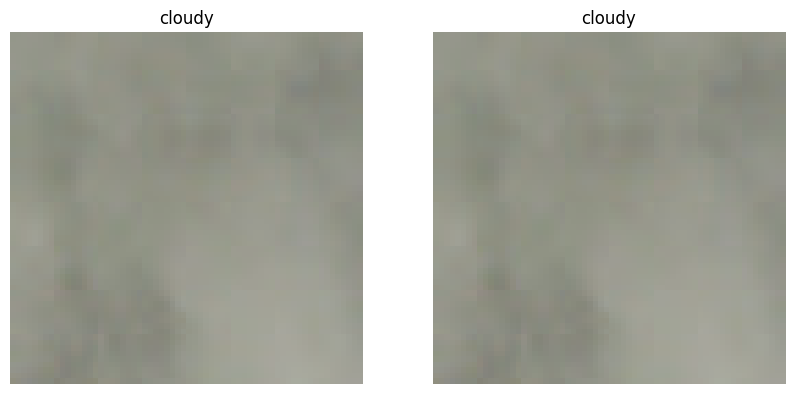

Test image 695 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


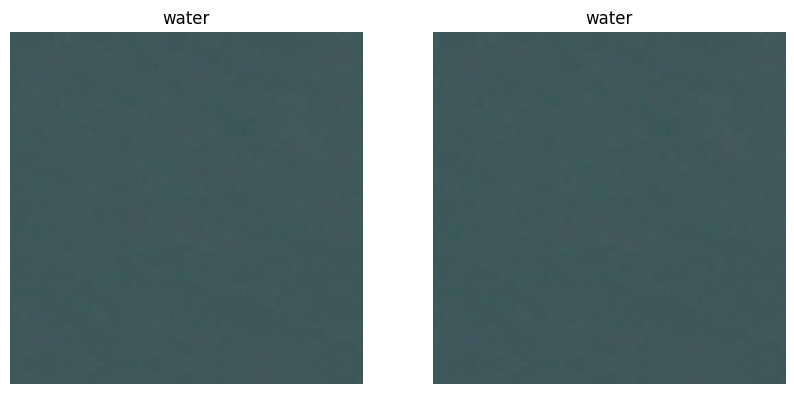

Test image 696 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


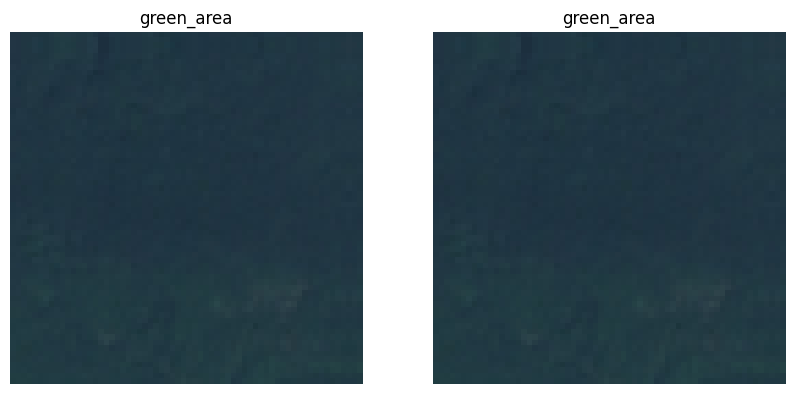

Test image 697 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


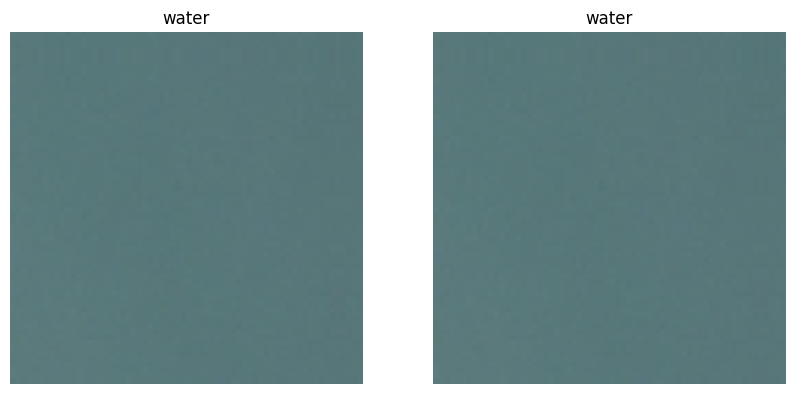

Test image 698 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


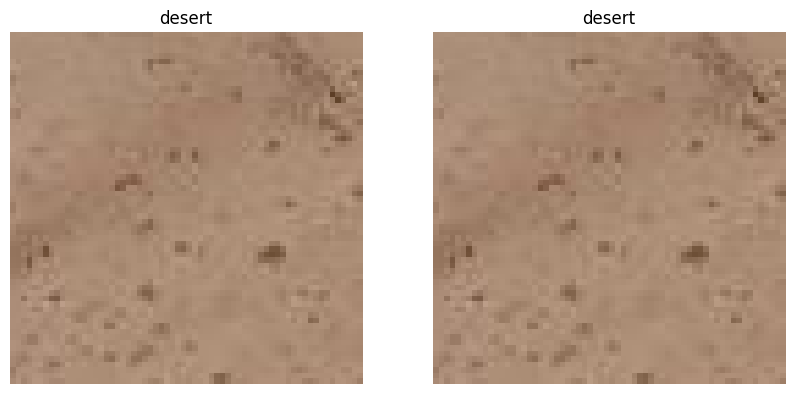

Test image 699 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


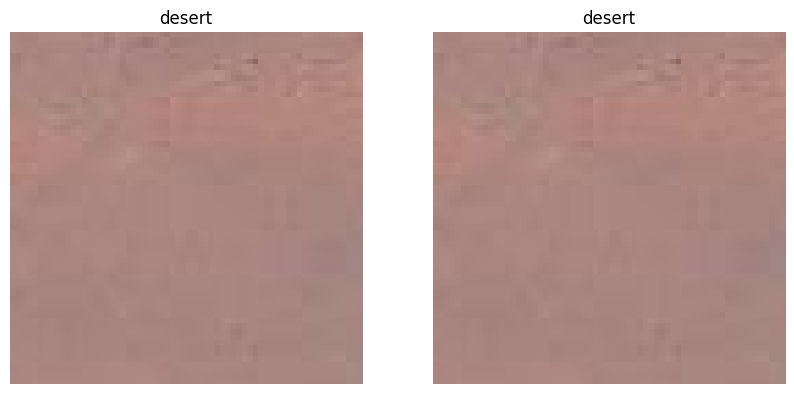

Test image 700 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


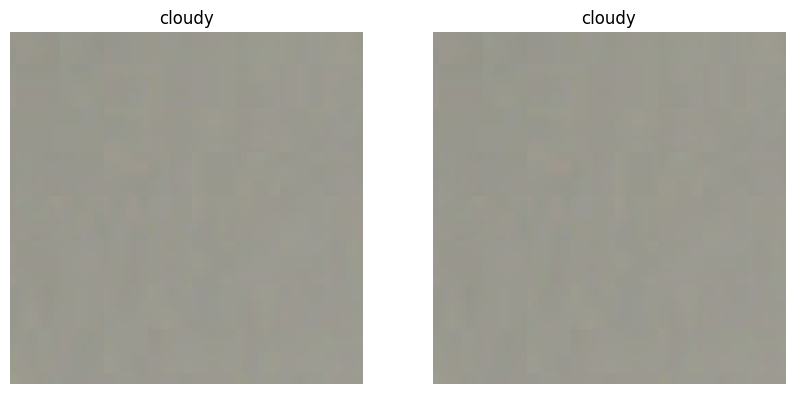

Test image 701 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


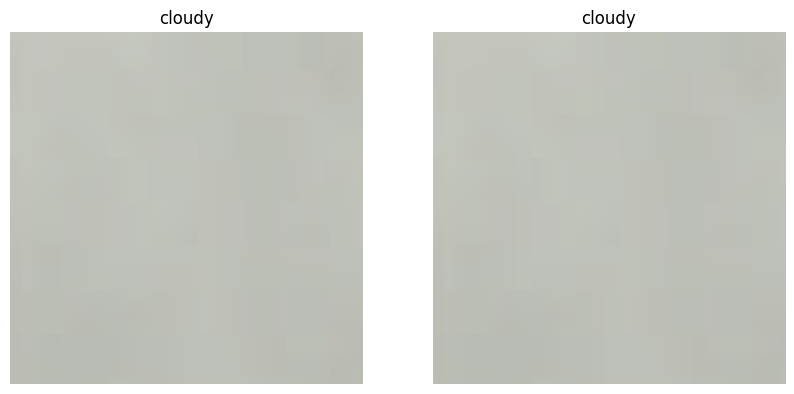

Test image 702 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


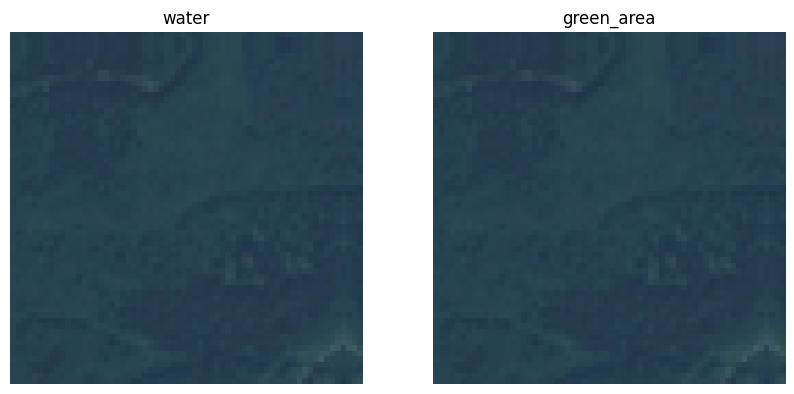

Test image 703 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


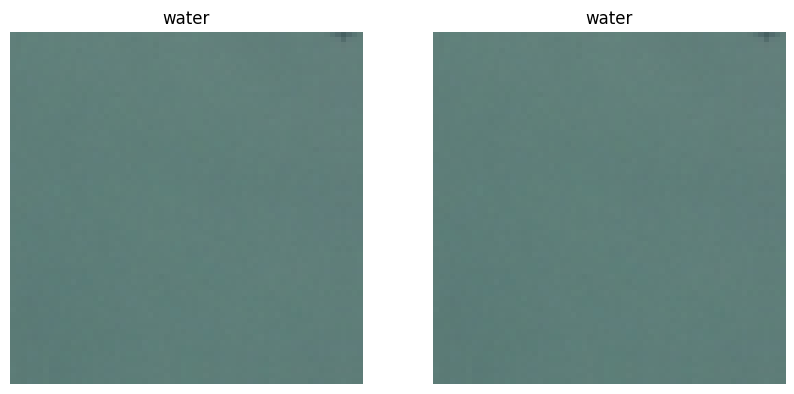

Test image 704 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


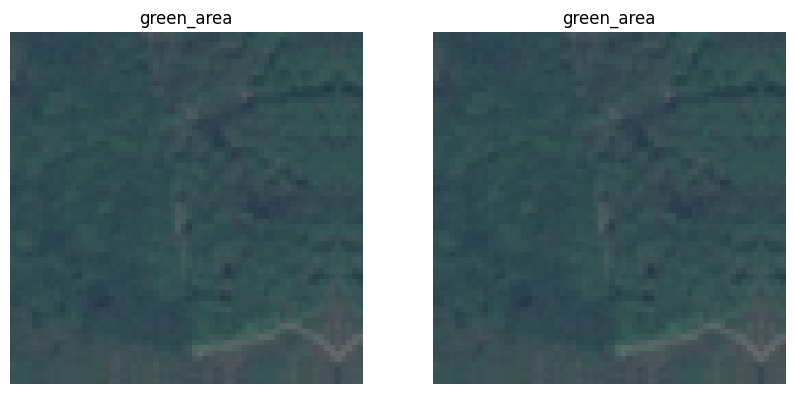

Test image 705 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


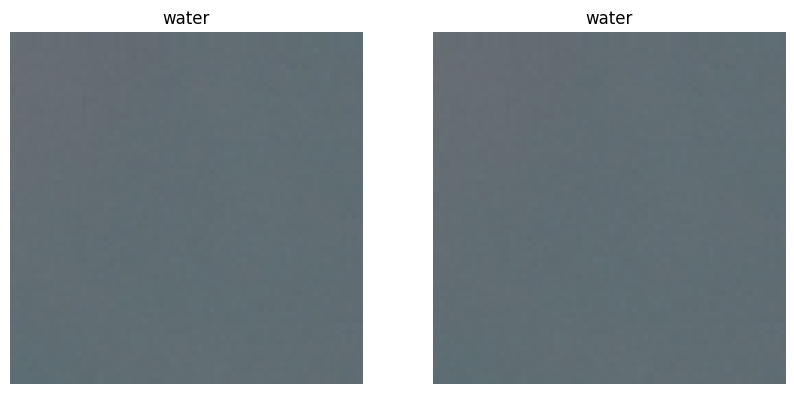

Test image 706 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


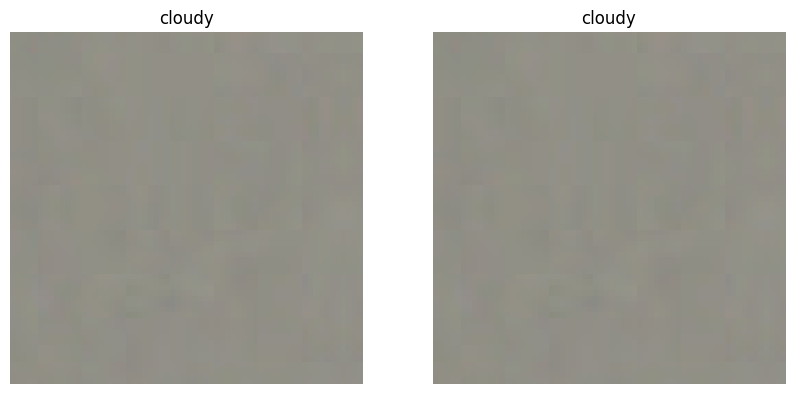

Test image 707 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


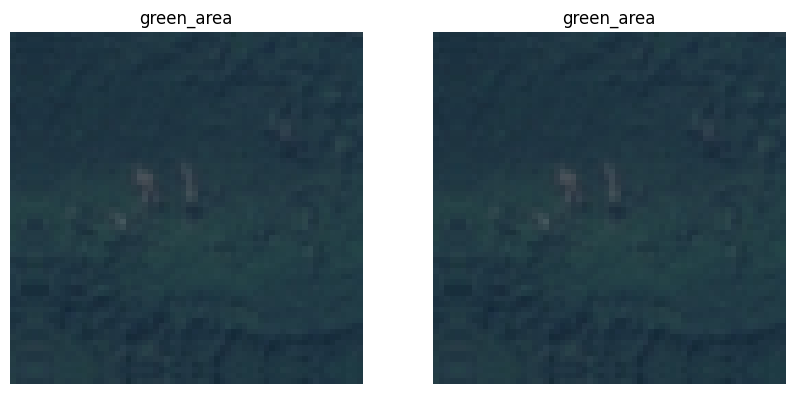

Test image 708 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


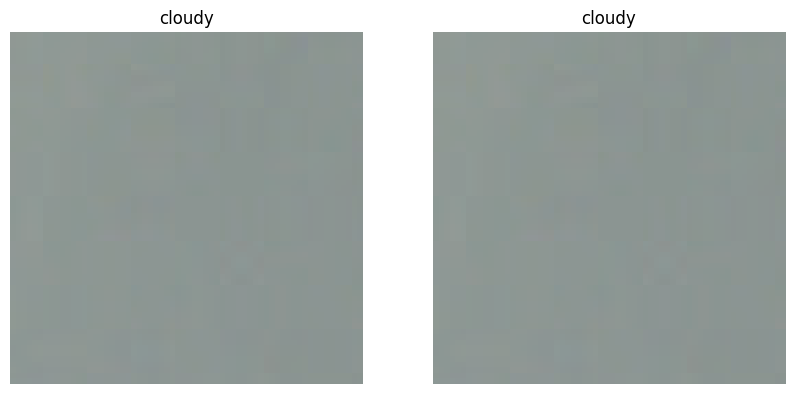

Test image 709 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


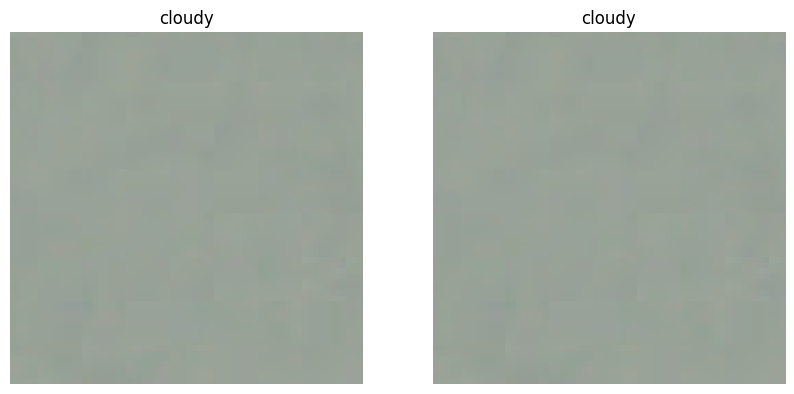

Test image 710 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


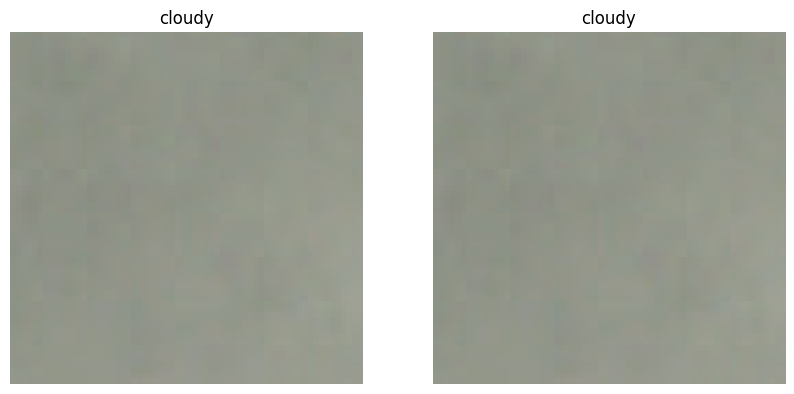

Test image 711 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


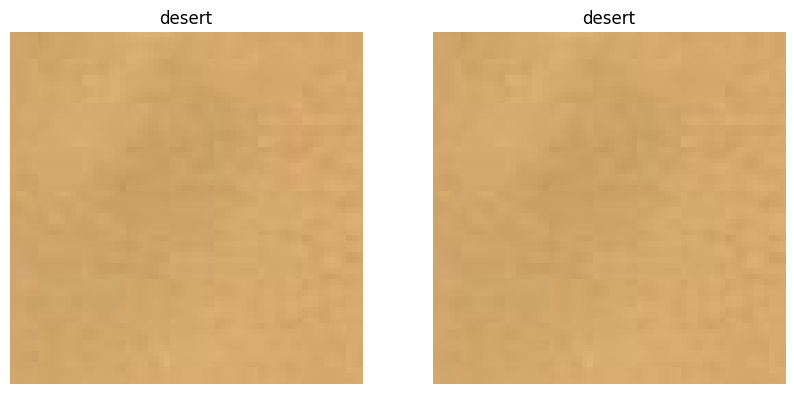

Test image 712 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


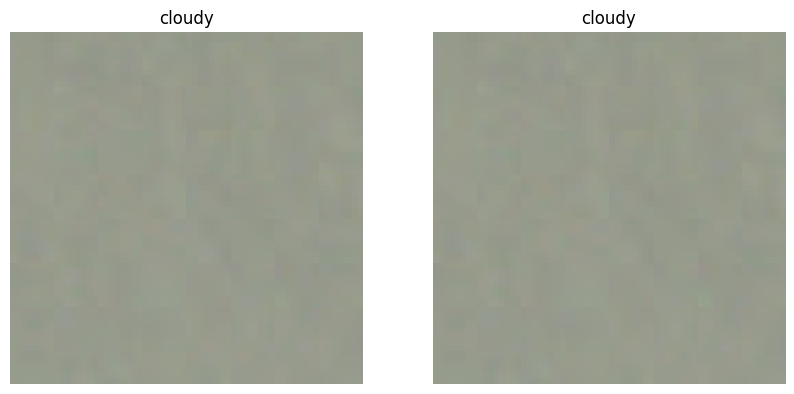

Test image 713 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


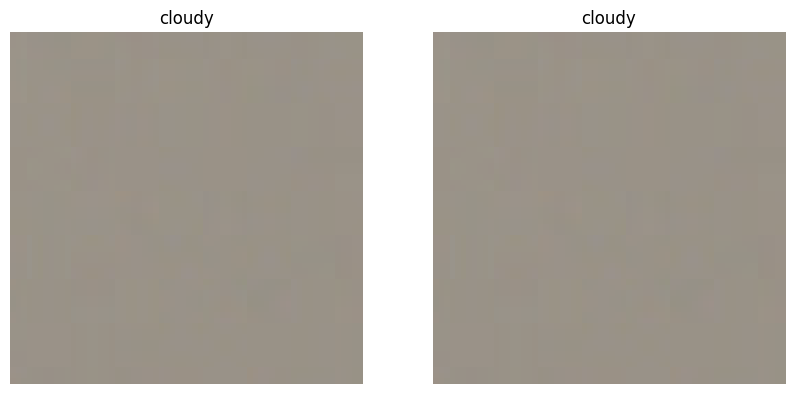

Test image 714 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


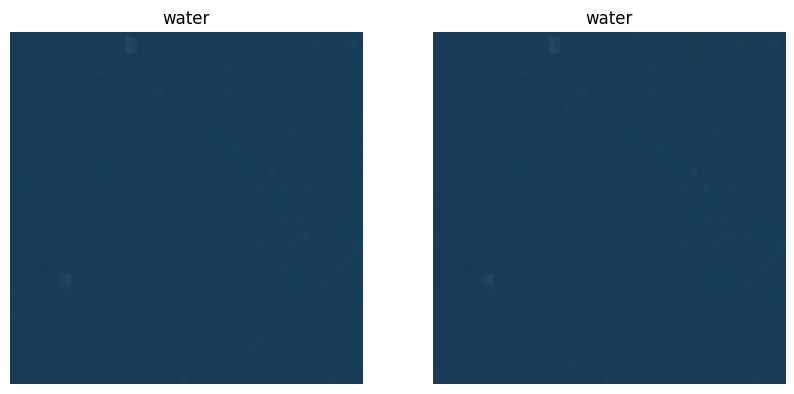

Test image 715 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


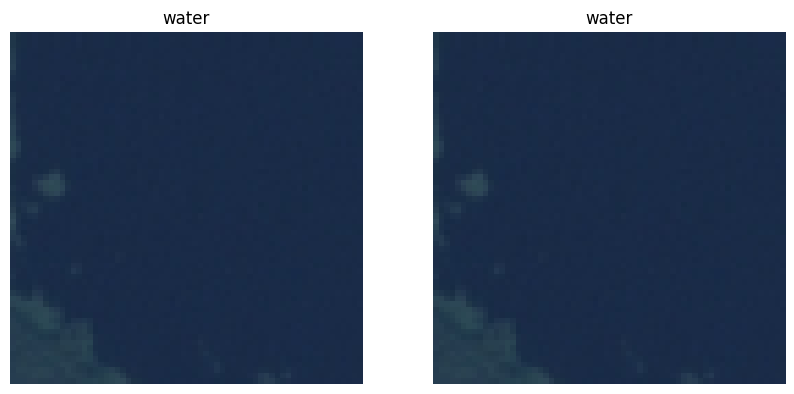

Test image 716 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


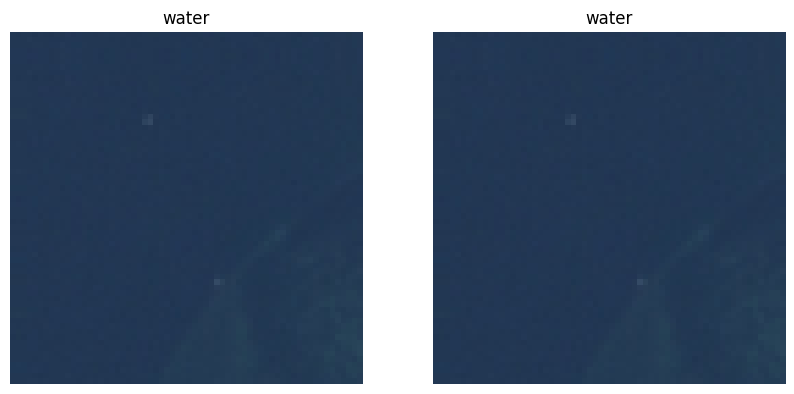

Test image 717 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


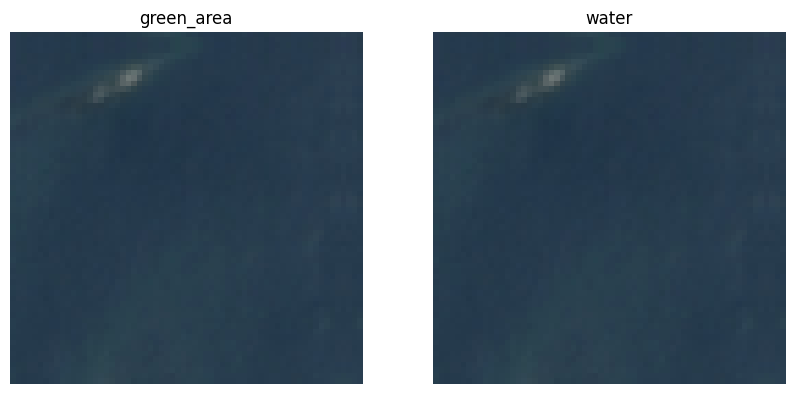

Test image 718 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


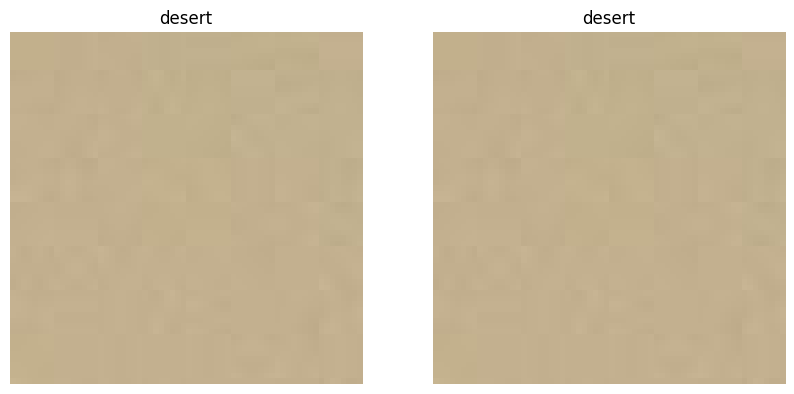

Test image 719 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


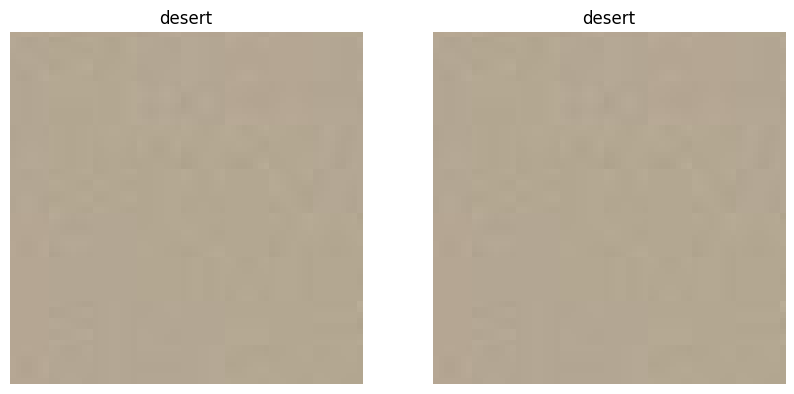

Test image 720 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


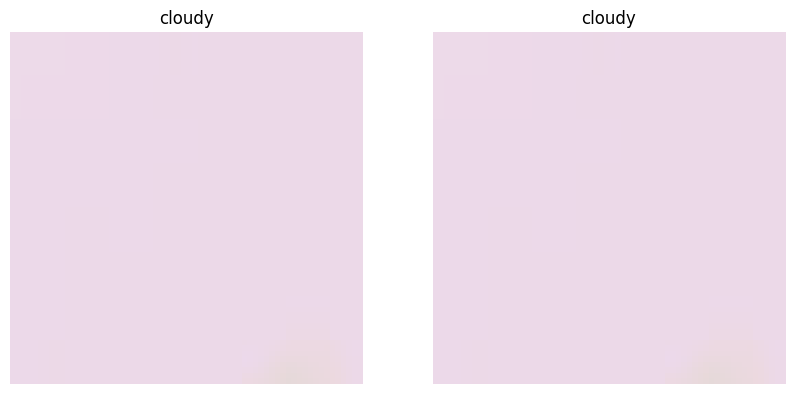

Test image 721 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


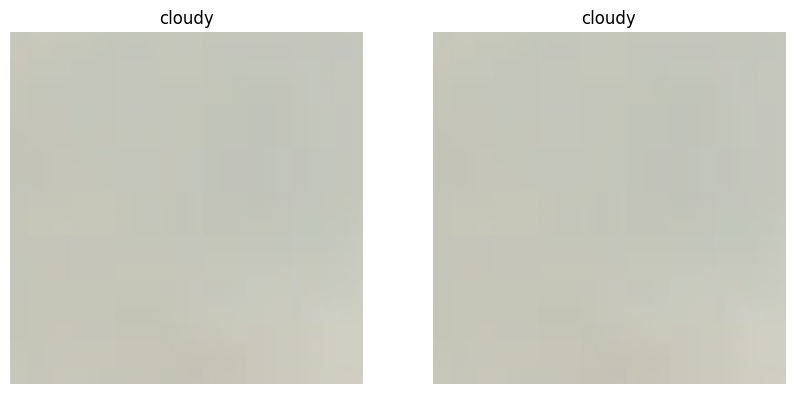

Test image 722 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


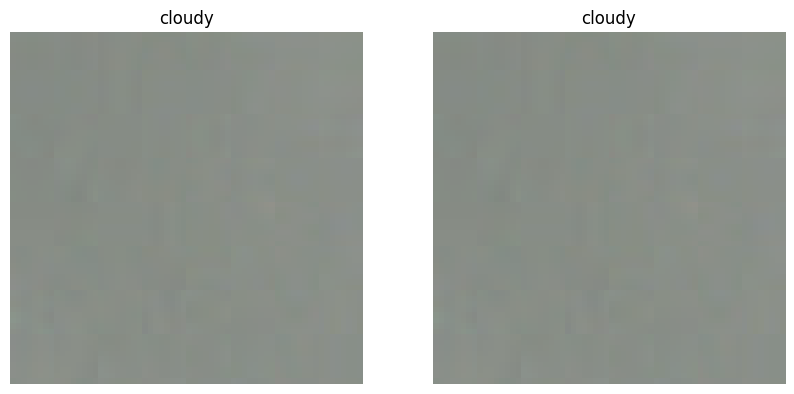

Test image 723 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


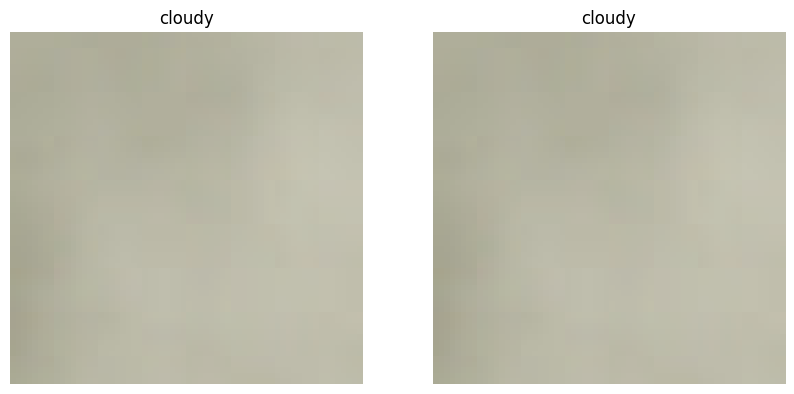

Test image 724 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


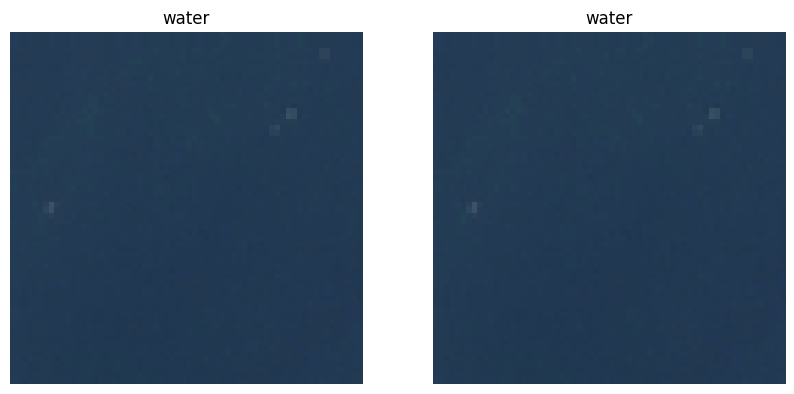

Test image 725 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


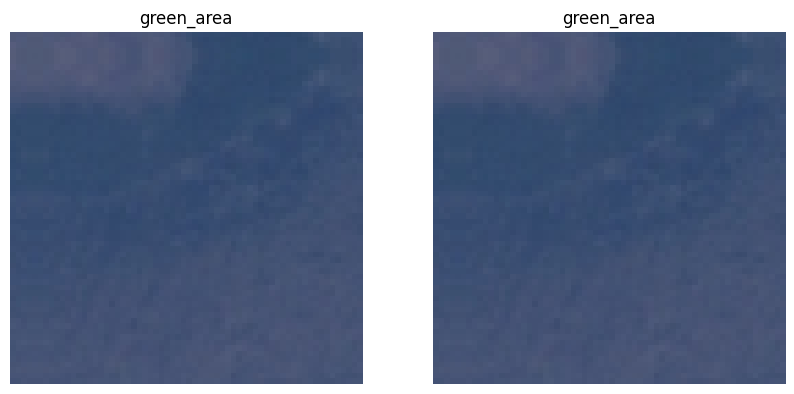

Test image 726 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


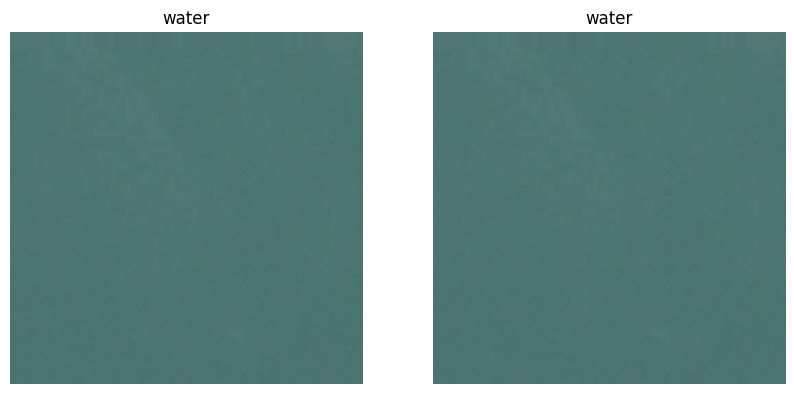

Test image 727 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


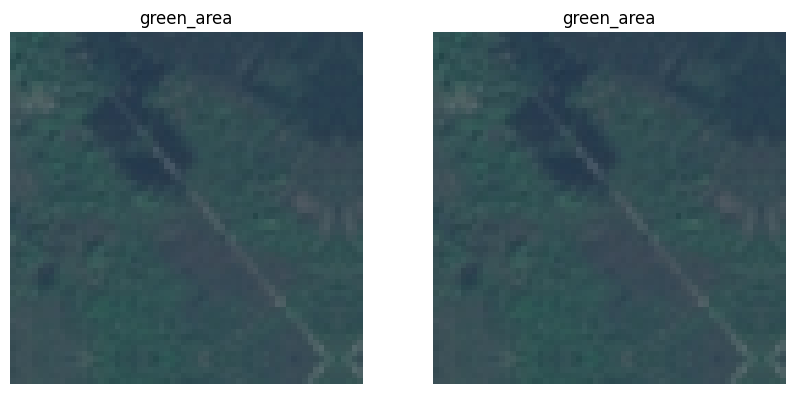

Test image 728 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


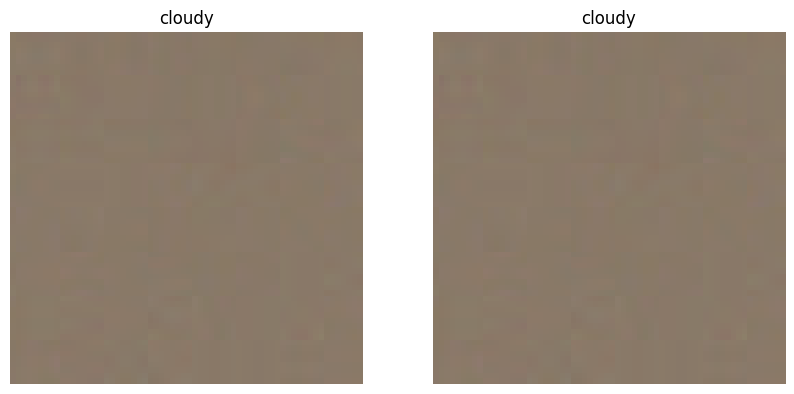

Test image 729 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


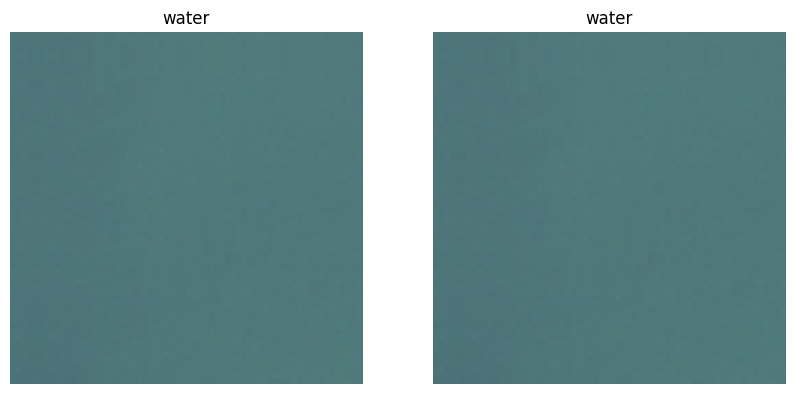

Test image 730 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


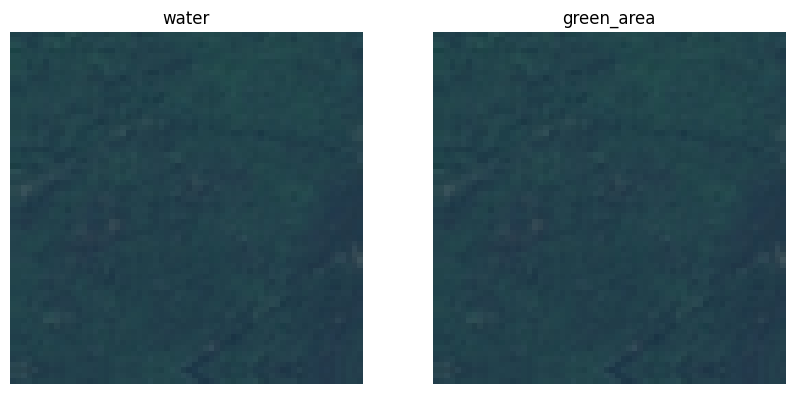

Test image 731 , Result: Wrong Predicted: cloudy , Real Class: desert
Predicted Class Image vs Real Class Image:


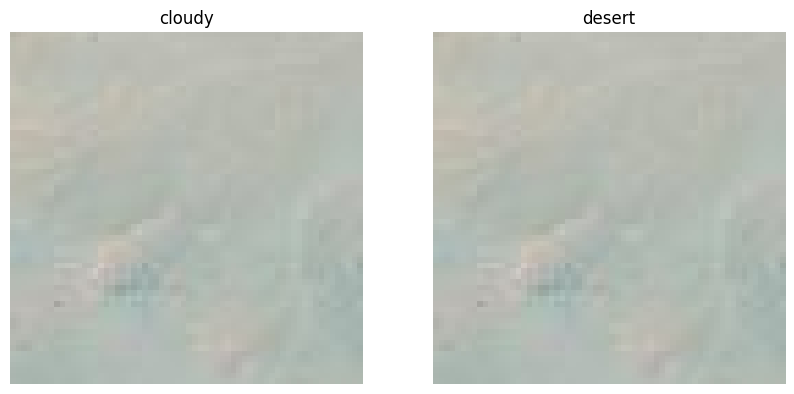

Test image 732 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


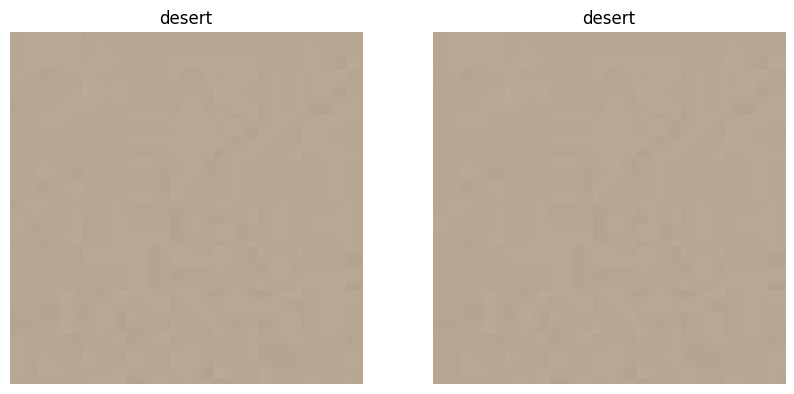

Test image 733 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


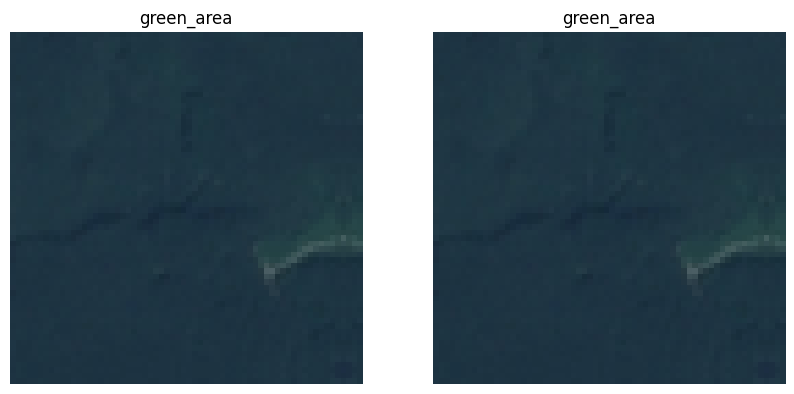

Test image 734 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


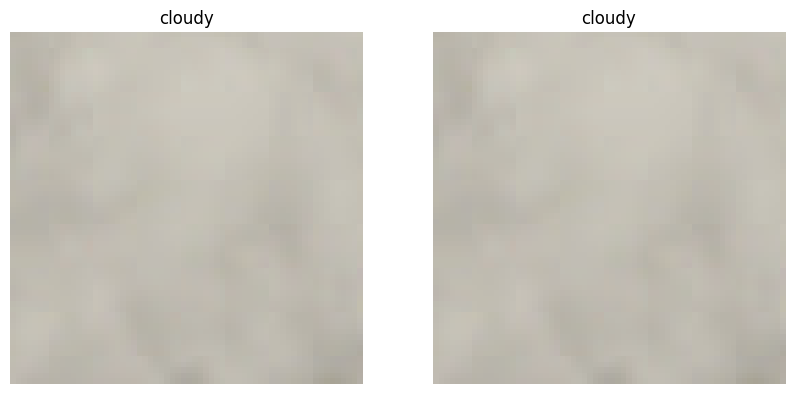

Test image 735 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


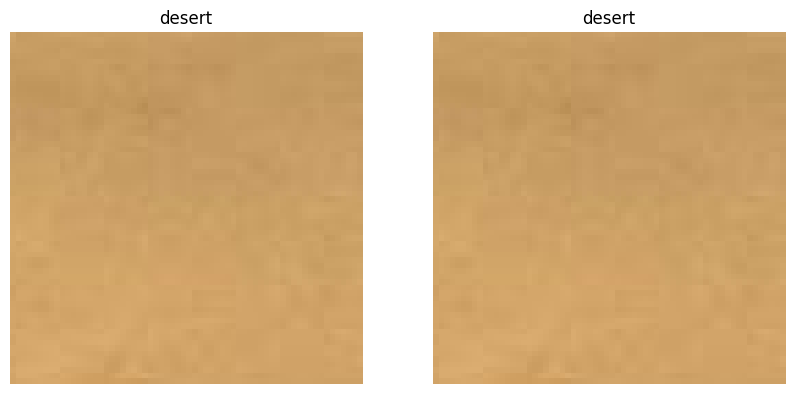

Test image 736 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


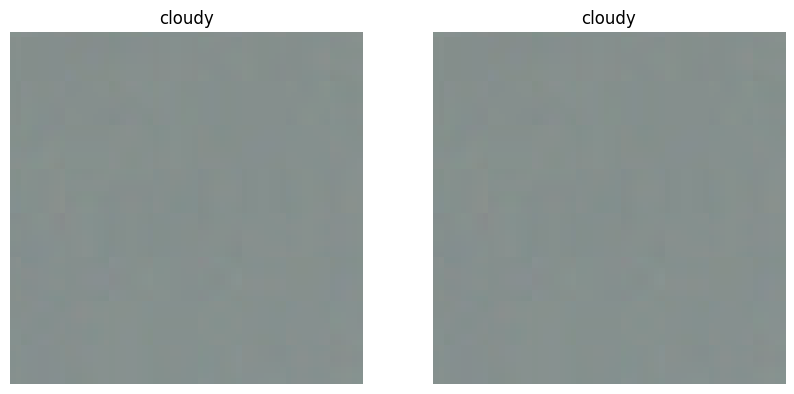

Test image 737 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


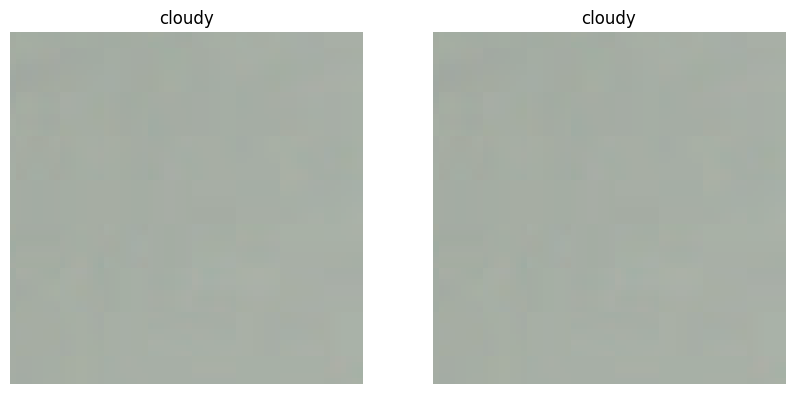

Test image 738 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


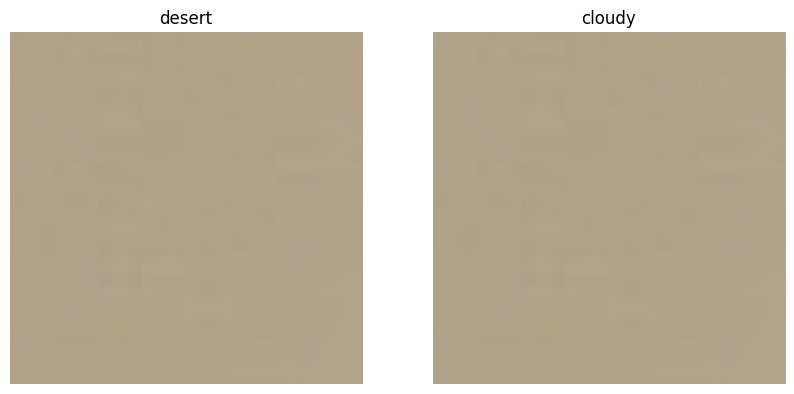

Test image 739 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


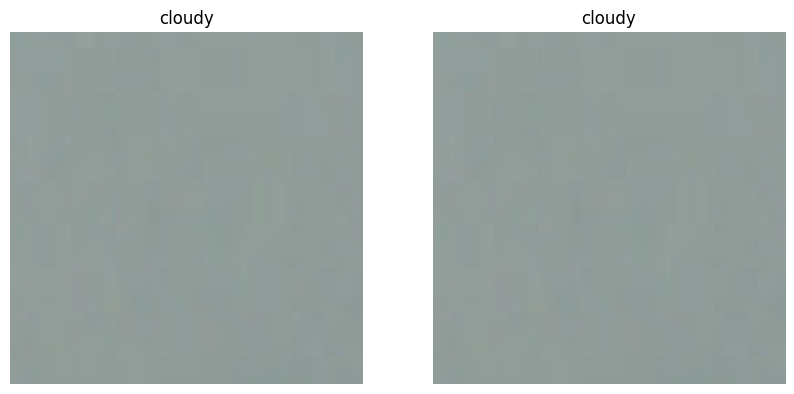

Test image 740 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


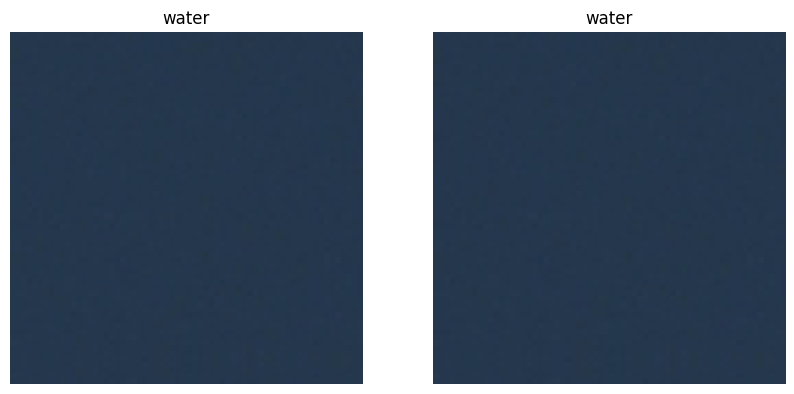

Test image 741 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


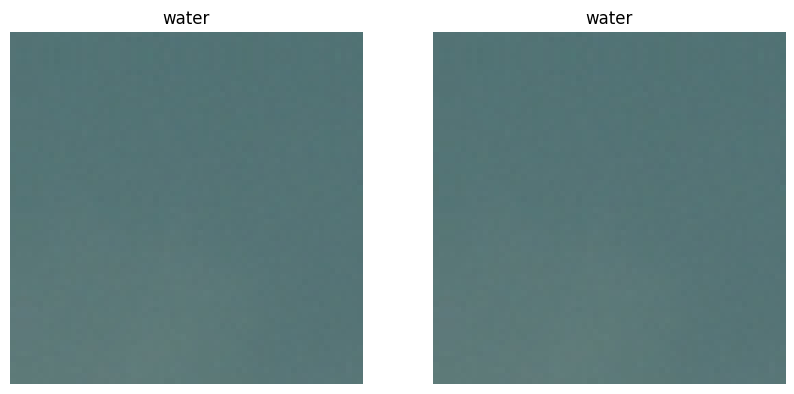

Test image 742 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


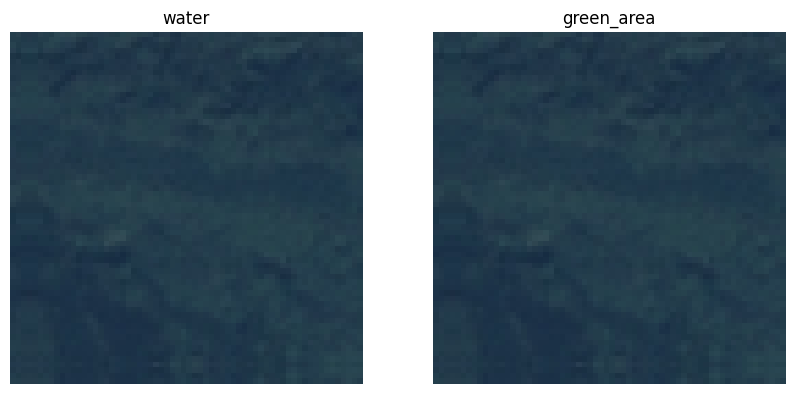

Test image 743 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


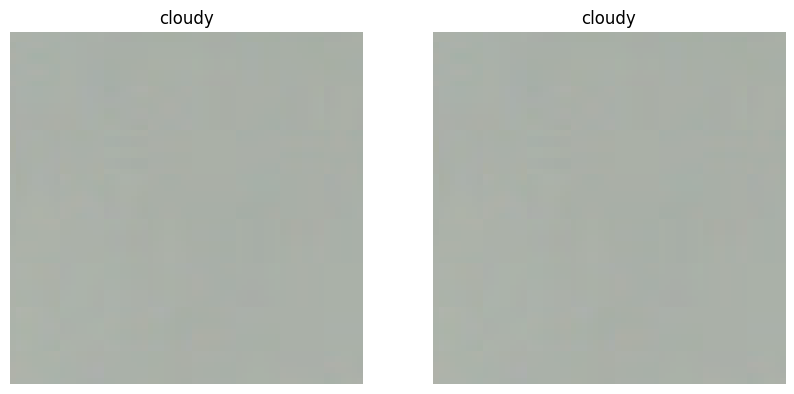

Test image 744 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


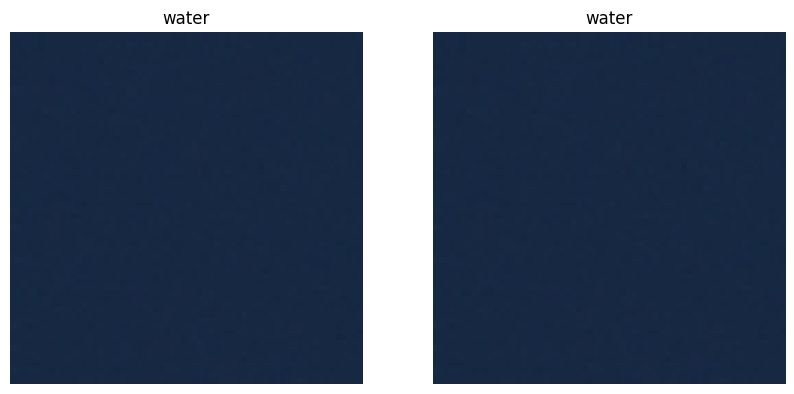

Test image 745 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


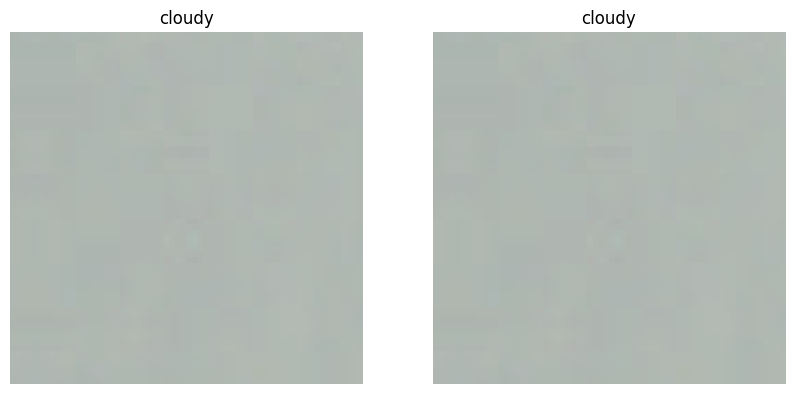

Test image 746 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


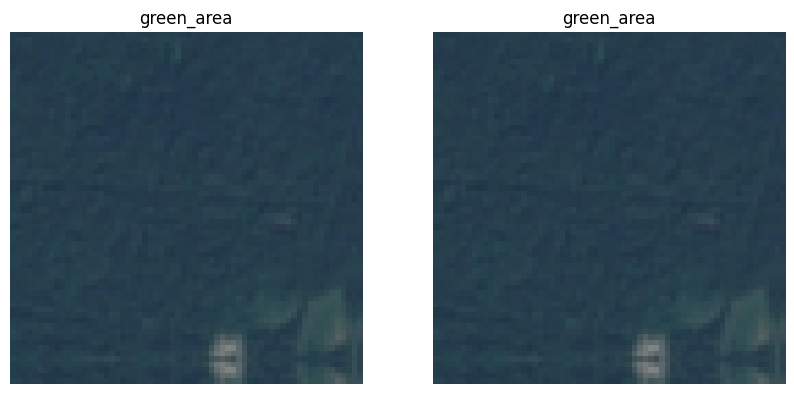

Test image 747 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


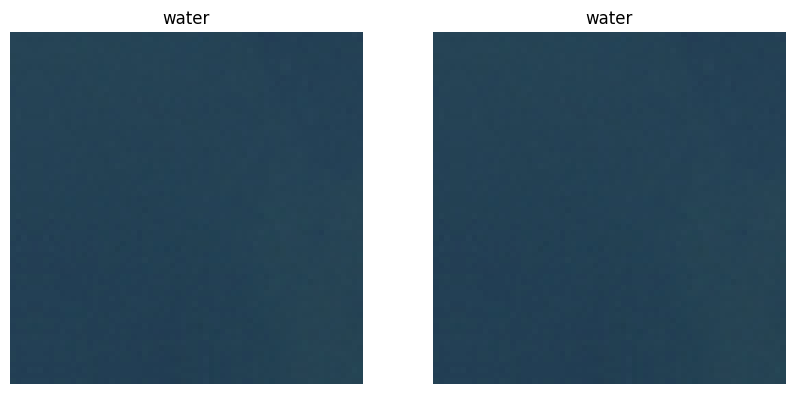

Test image 748 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


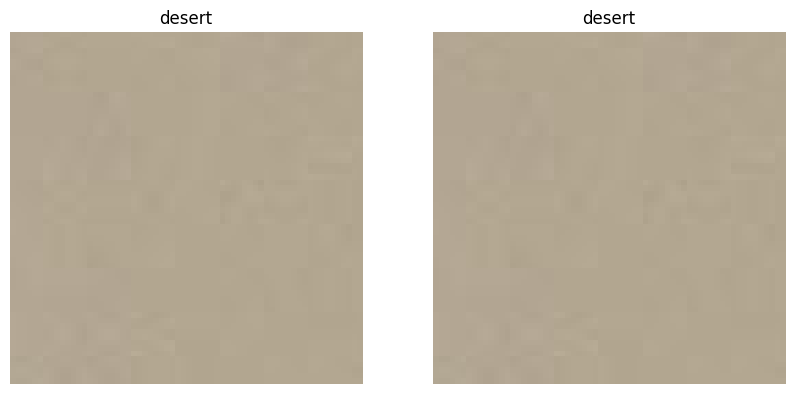

Test image 749 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


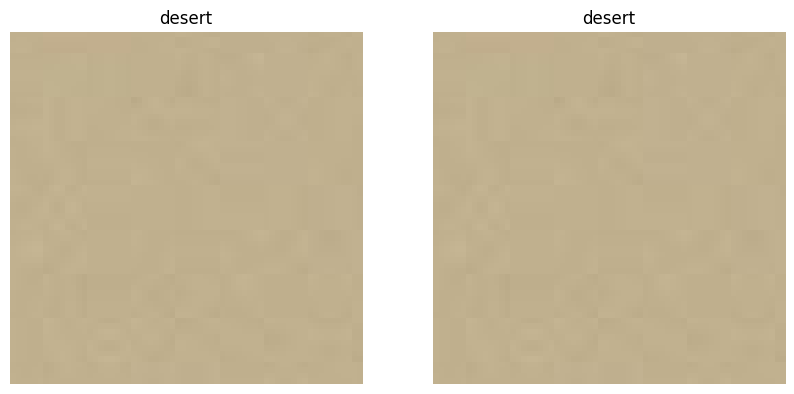

Test image 750 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


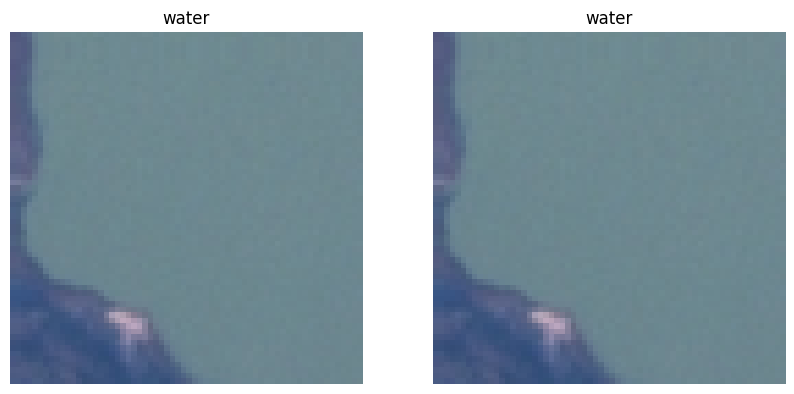

Test image 751 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


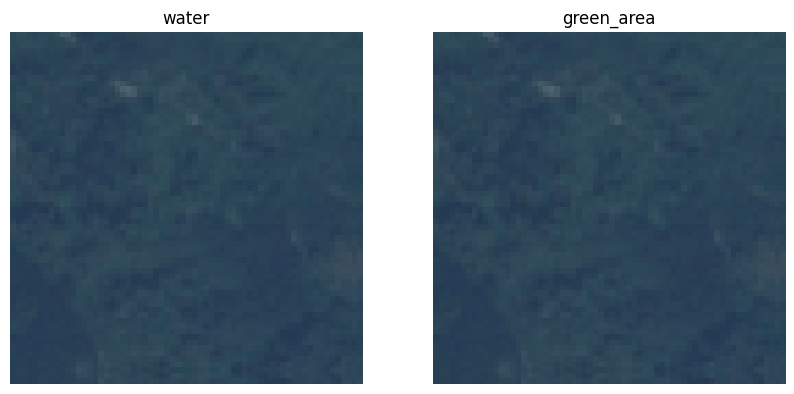

Test image 752 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


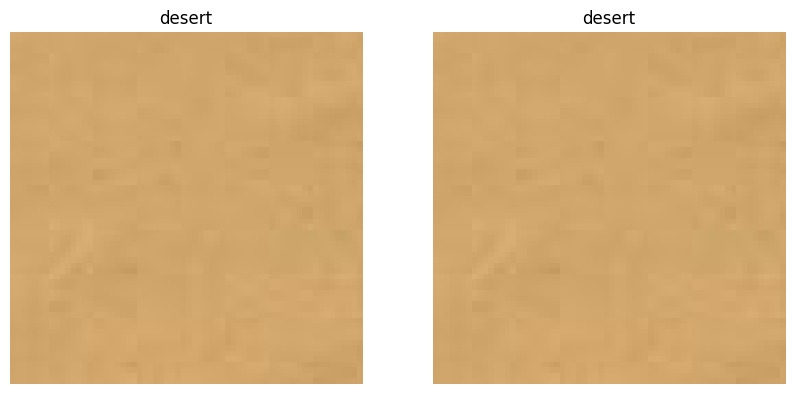

Test image 753 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


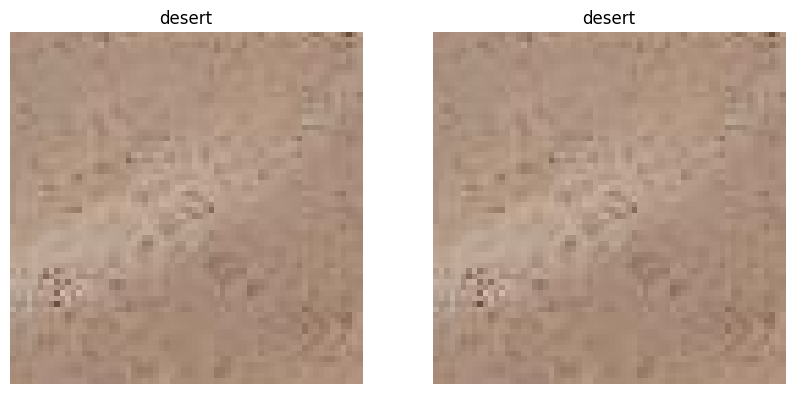

Test image 754 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


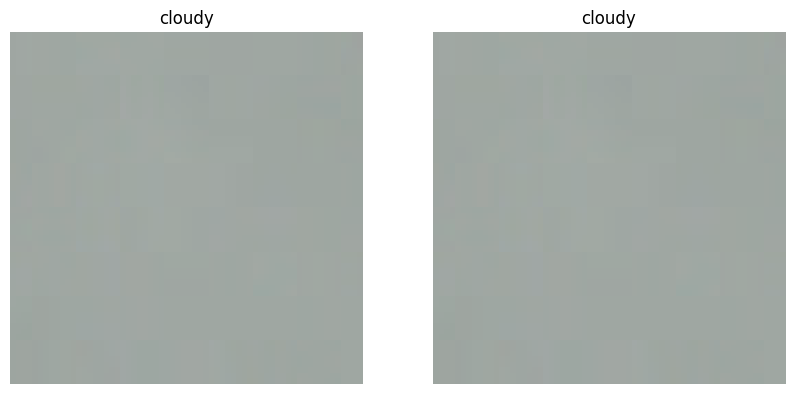

Test image 755 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


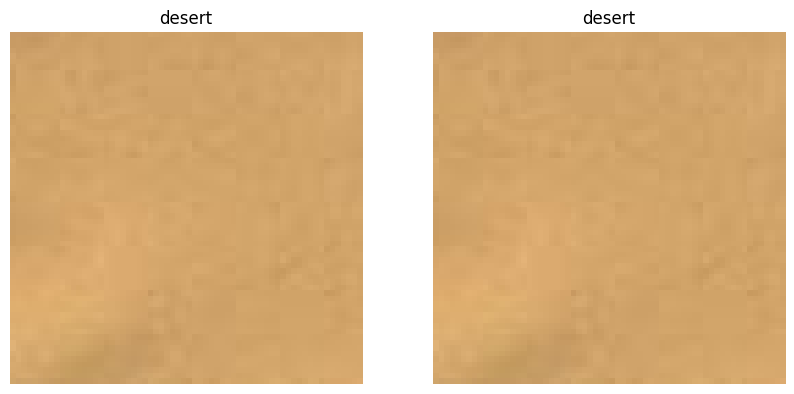

Test image 756 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


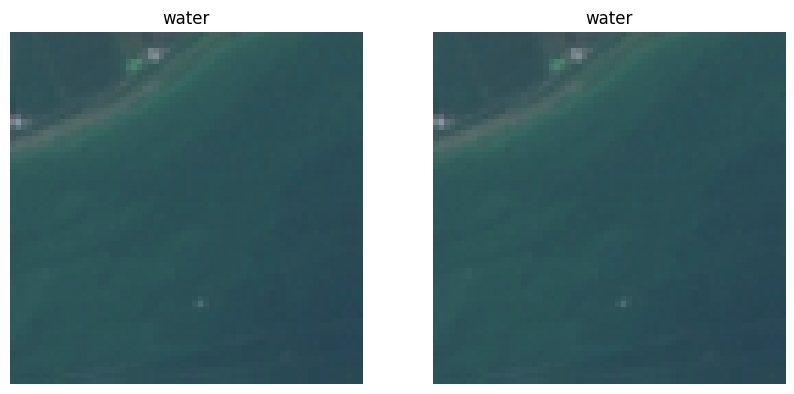

Test image 757 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


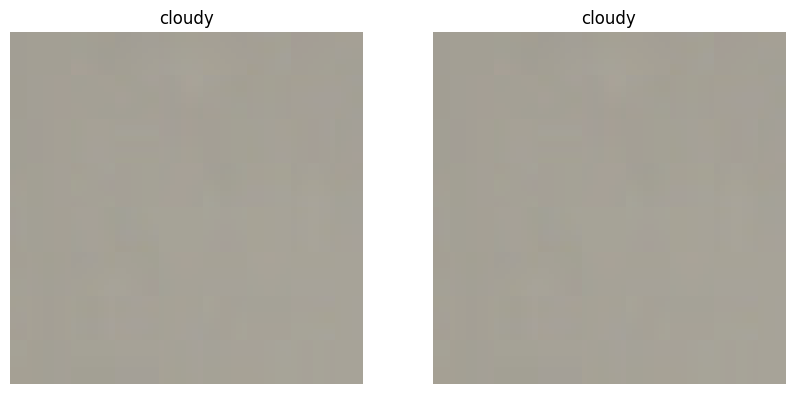

Test image 758 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


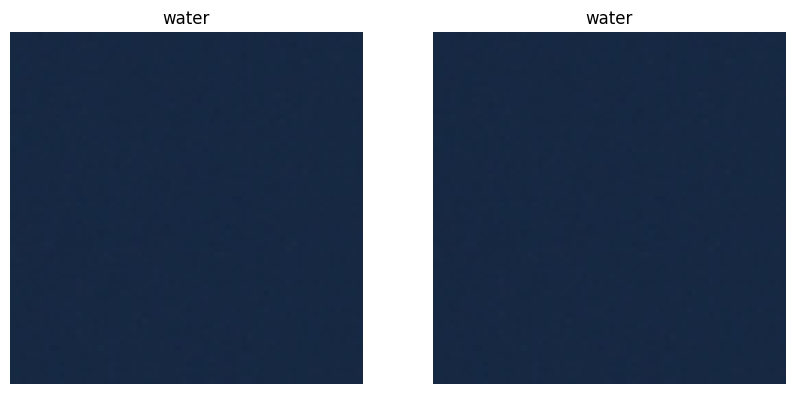

Test image 759 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


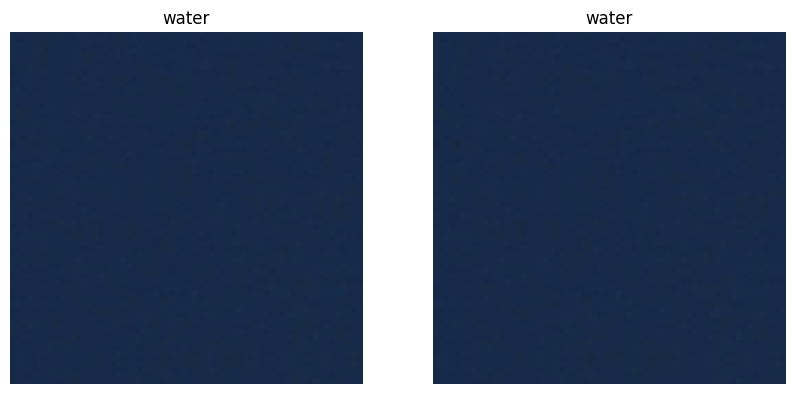

Test image 760 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


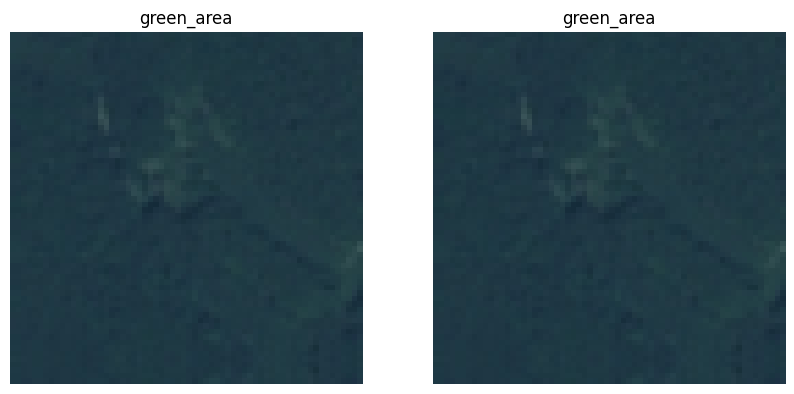

Test image 761 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


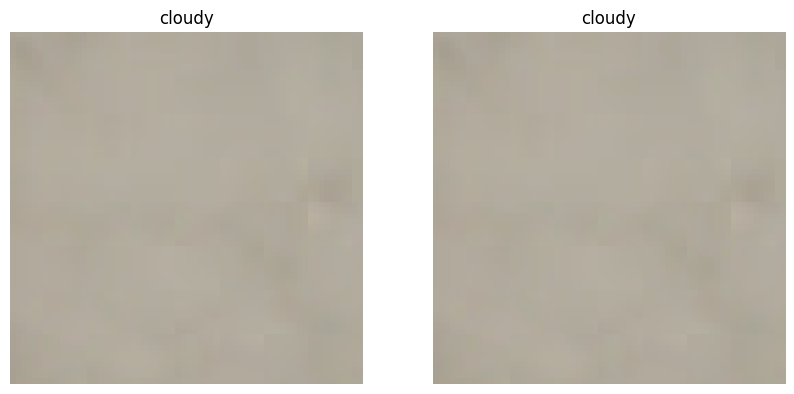

Test image 762 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


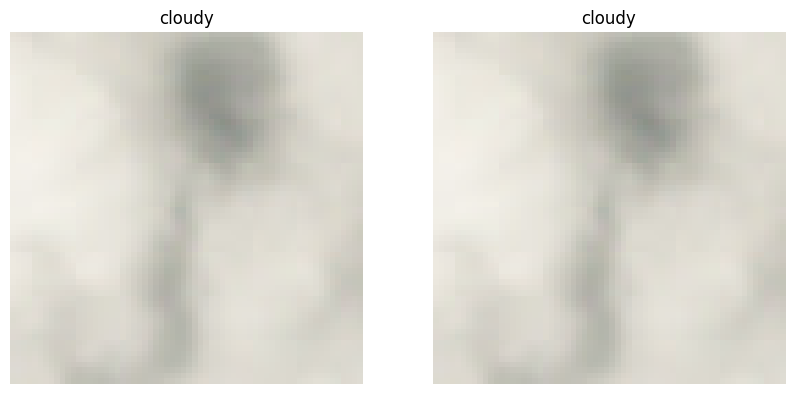

Test image 763 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


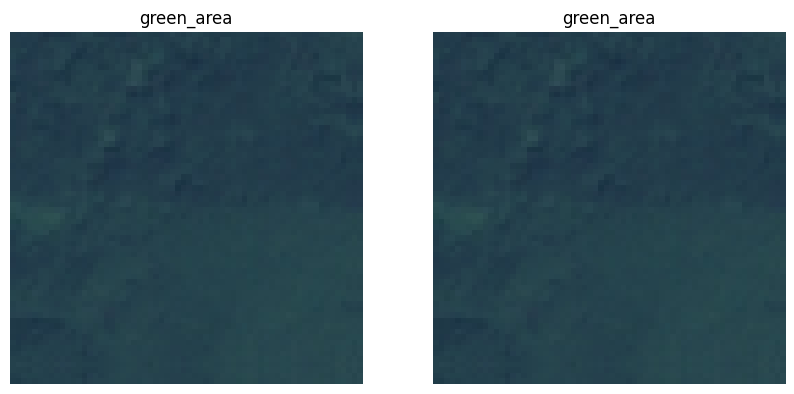

Test image 764 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


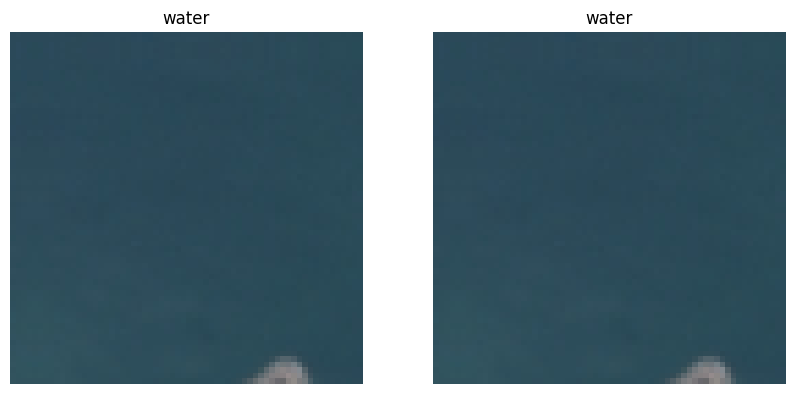

Test image 765 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


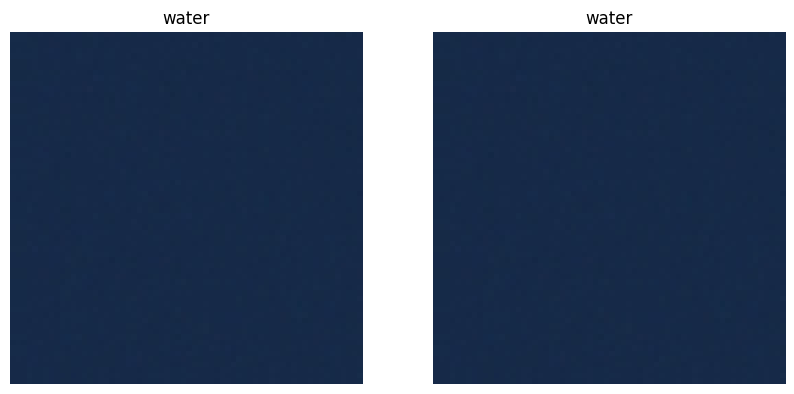

Test image 766 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


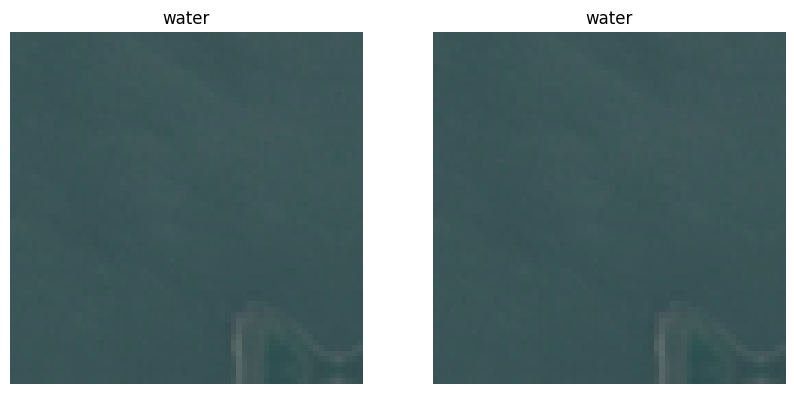

Test image 767 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


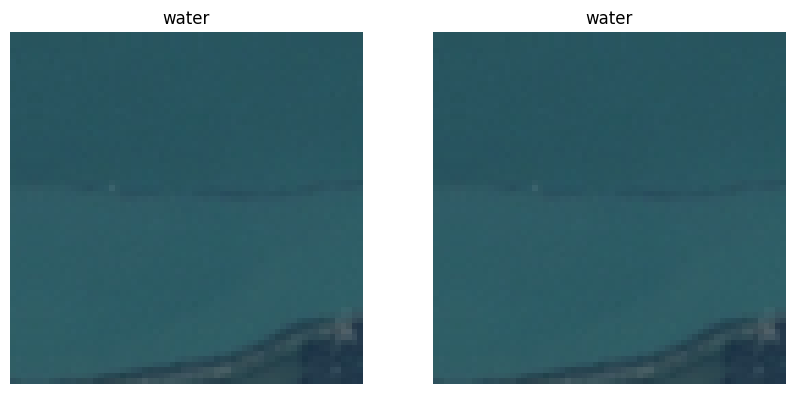

Test image 768 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


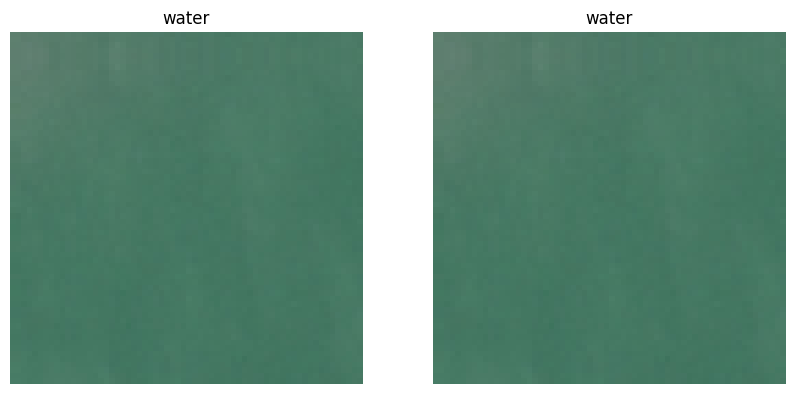

Test image 769 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


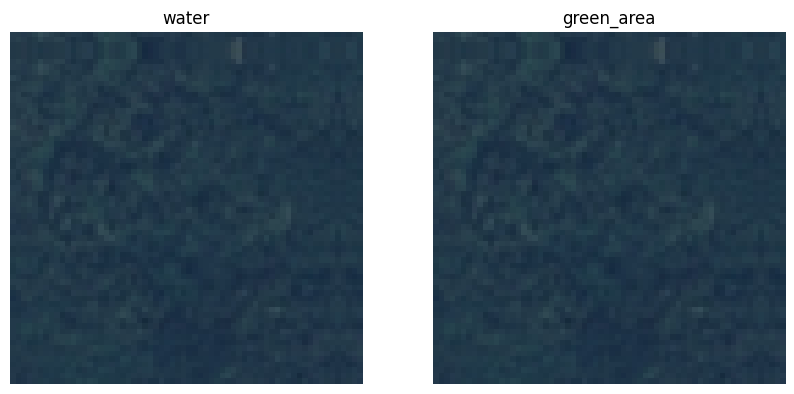

Test image 770 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


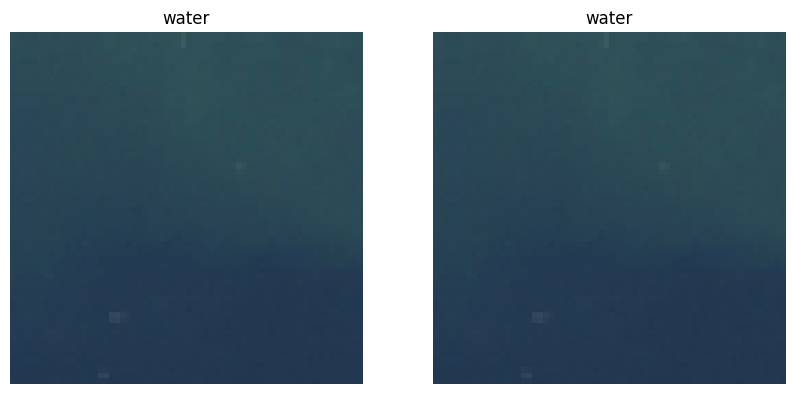

Test image 771 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


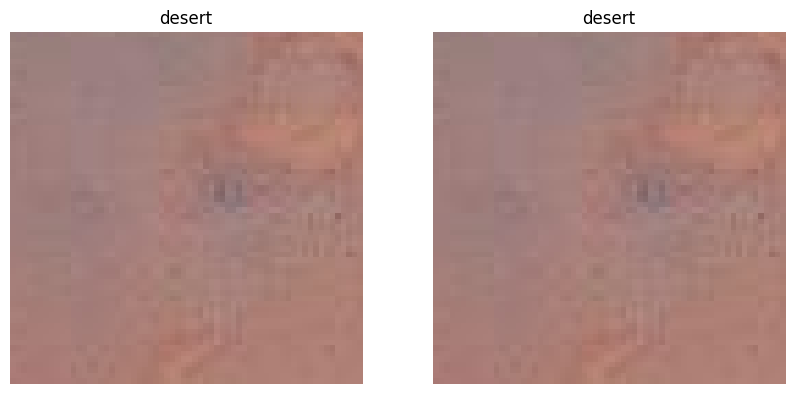

Test image 772 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


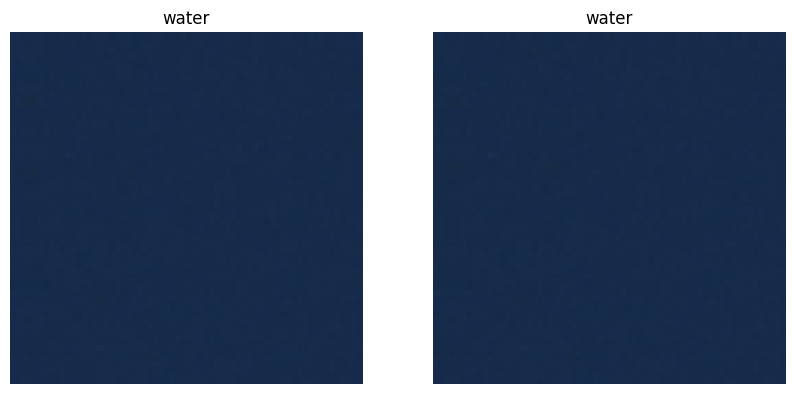

Test image 773 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


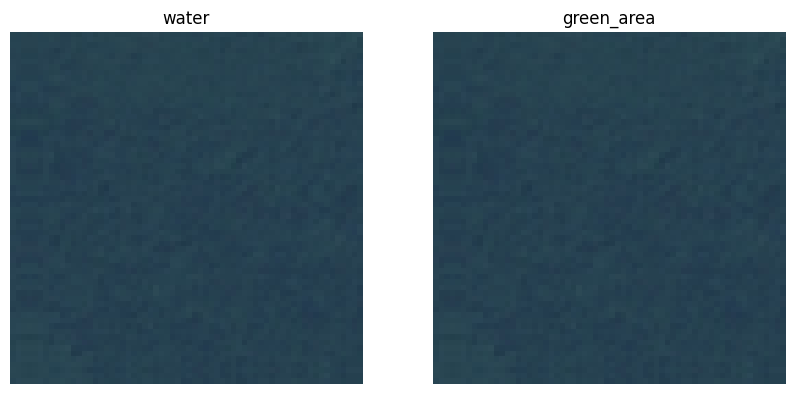

Test image 774 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


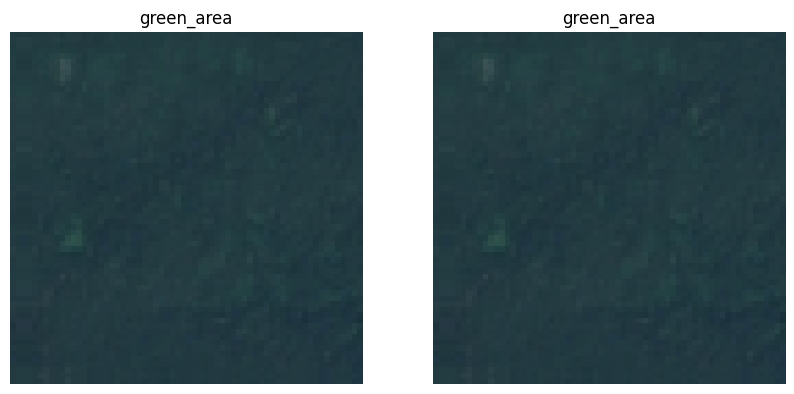

Test image 775 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


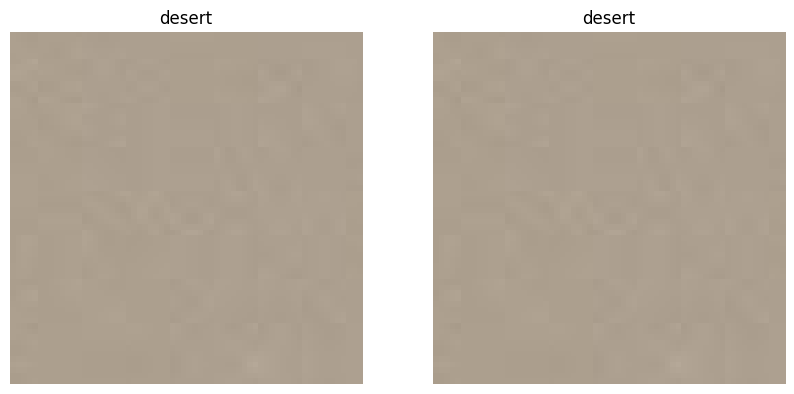

Test image 776 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


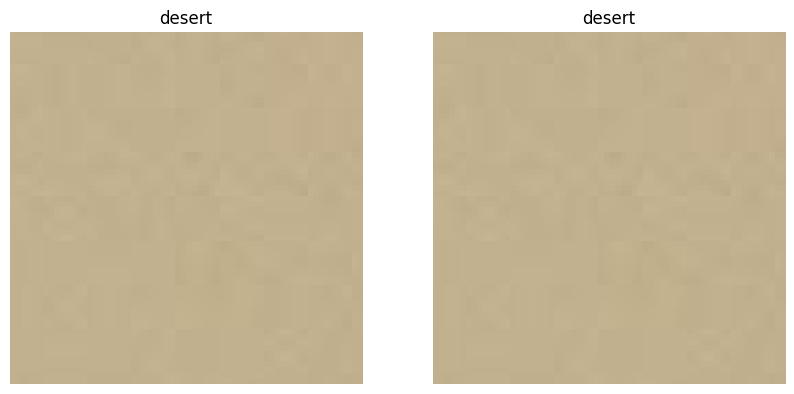

Test image 777 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


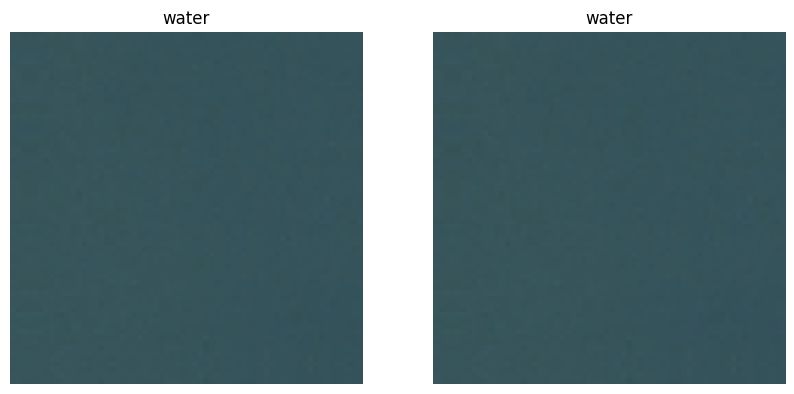

Test image 778 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


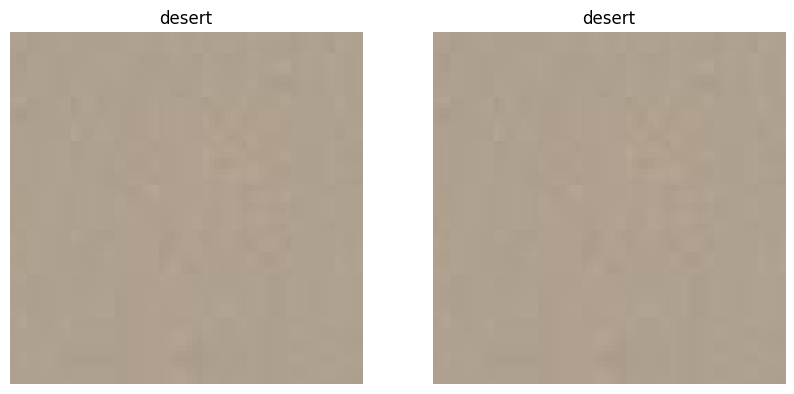

Test image 779 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


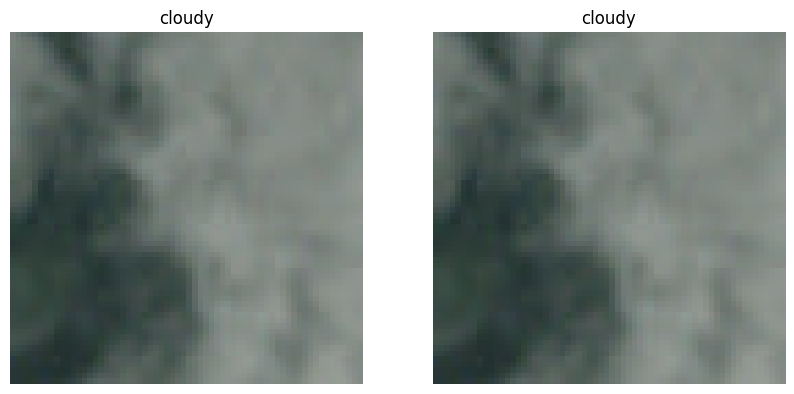

Test image 780 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


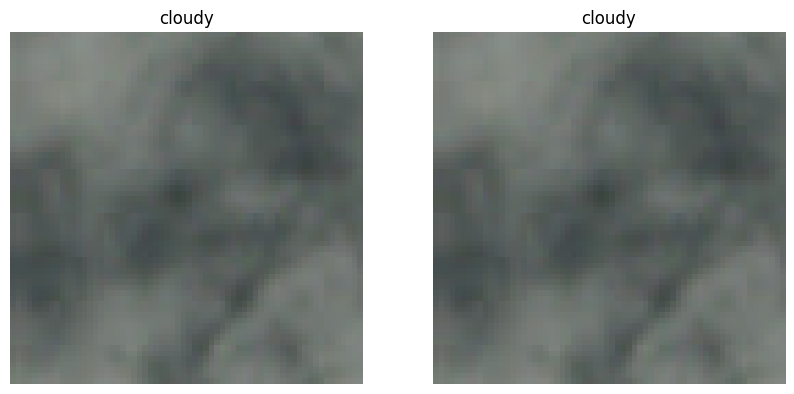

Test image 781 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


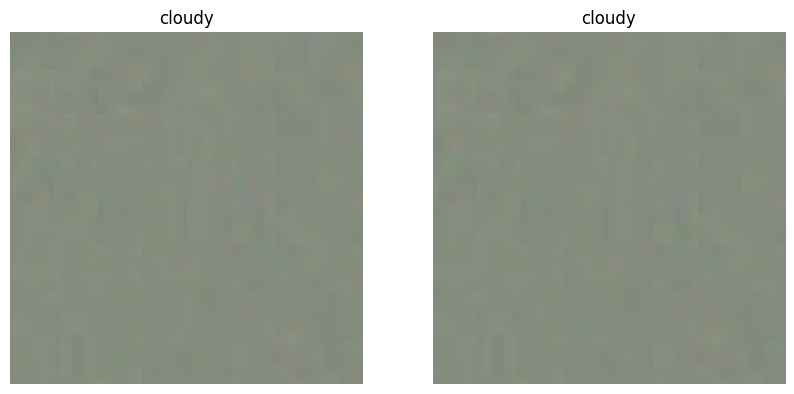

Test image 782 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


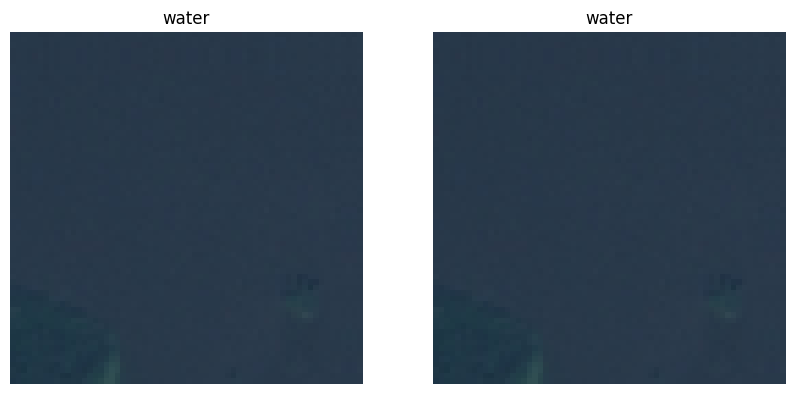

Test image 783 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


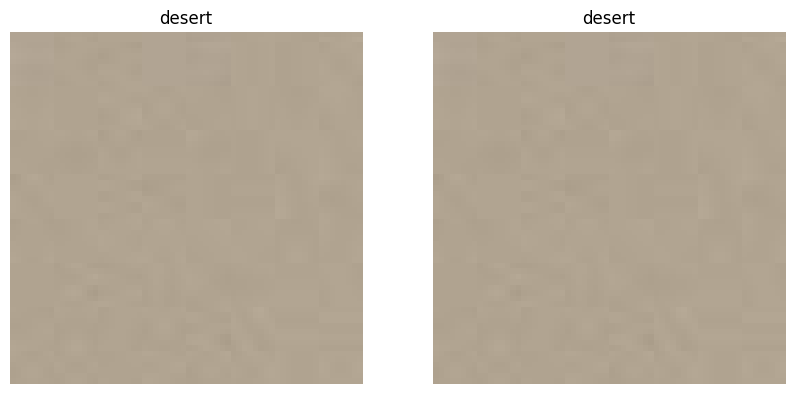

Test image 784 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


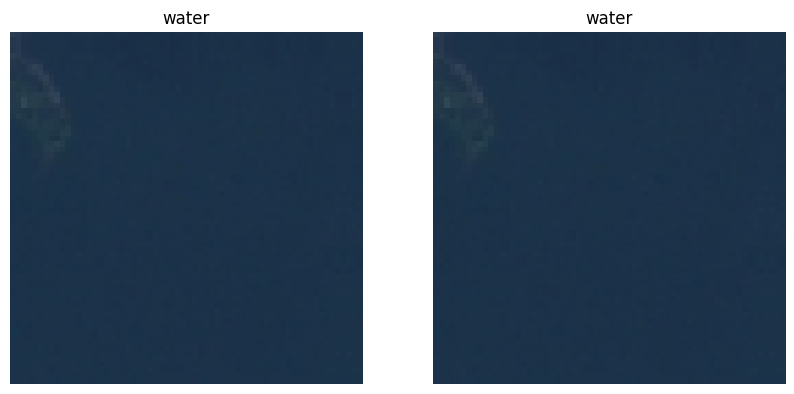

Test image 785 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


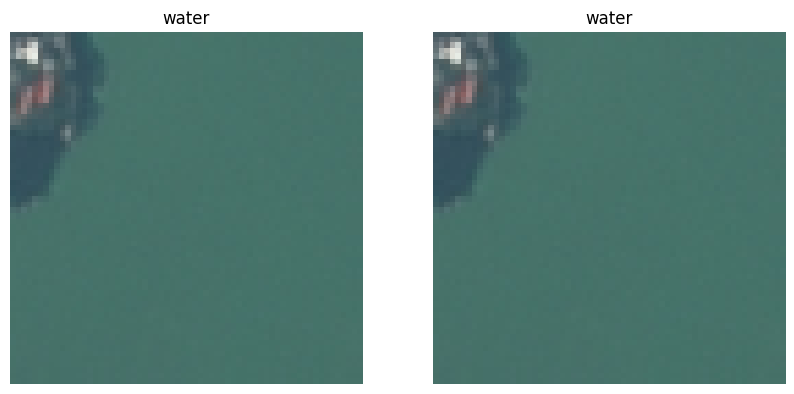

Test image 786 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


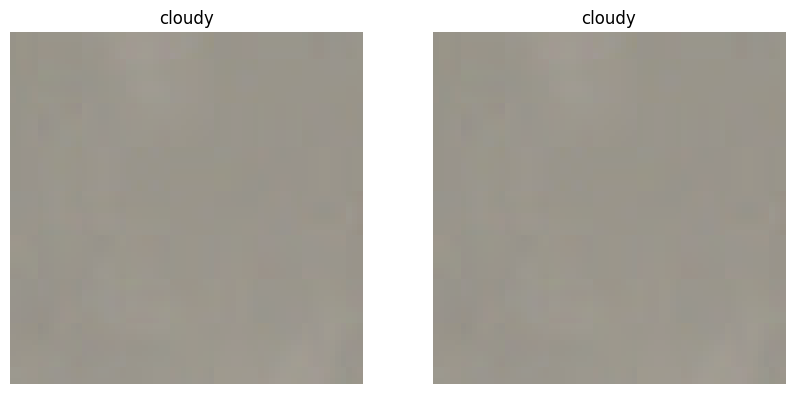

Test image 787 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


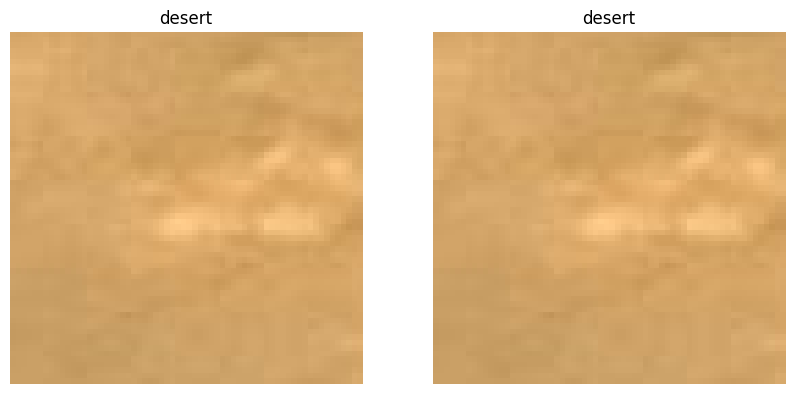

Test image 788 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


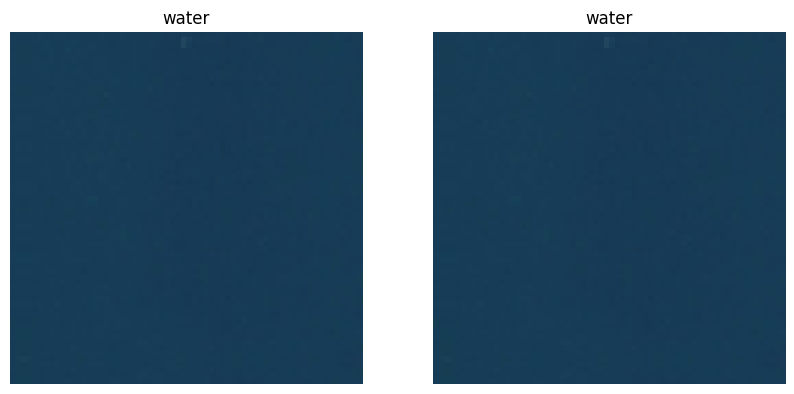

Test image 789 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


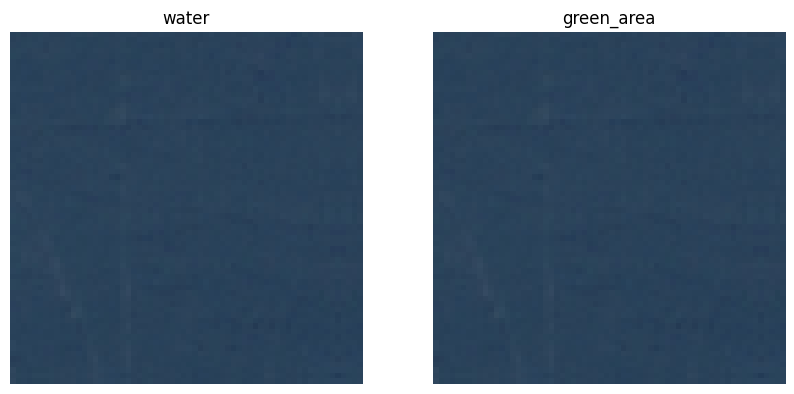

Test image 790 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


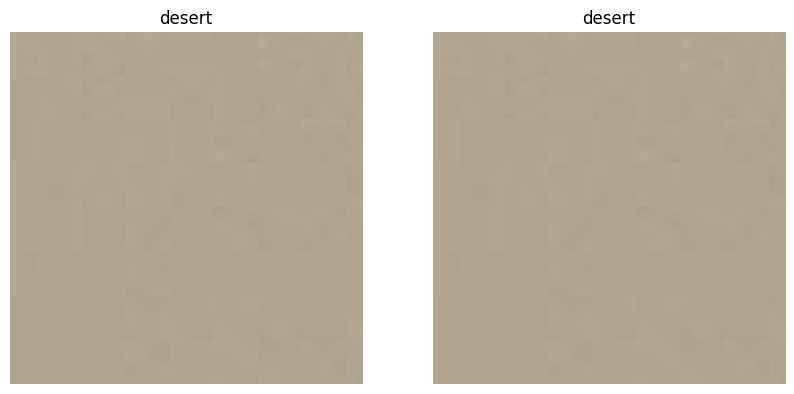

Test image 791 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


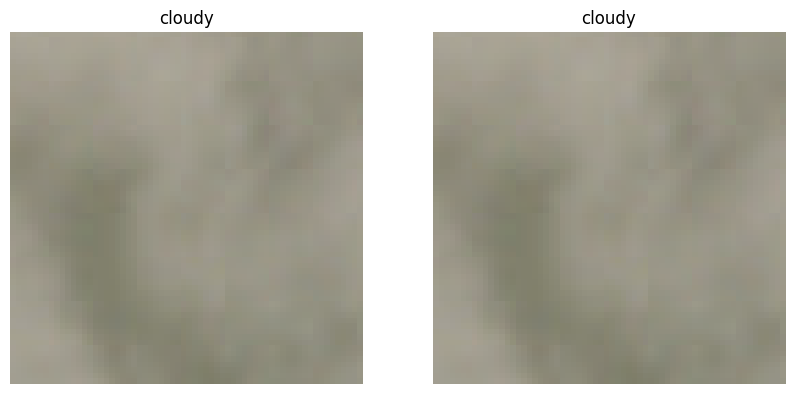

Test image 792 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


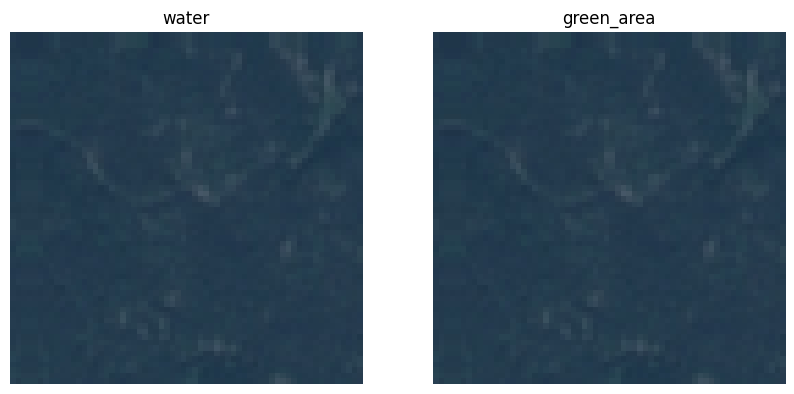

Test image 793 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


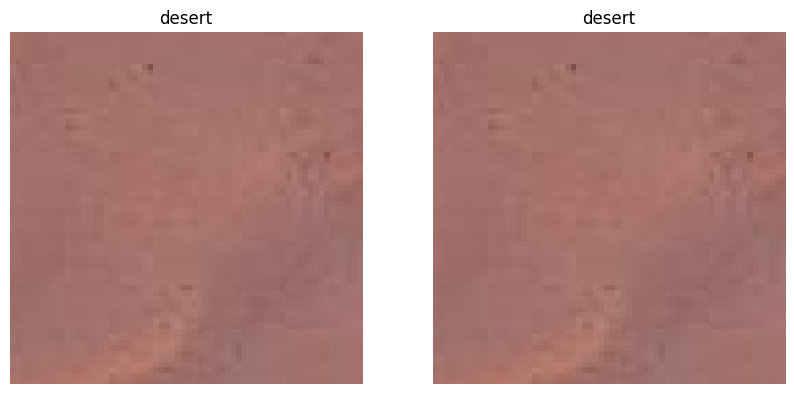

Test image 794 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


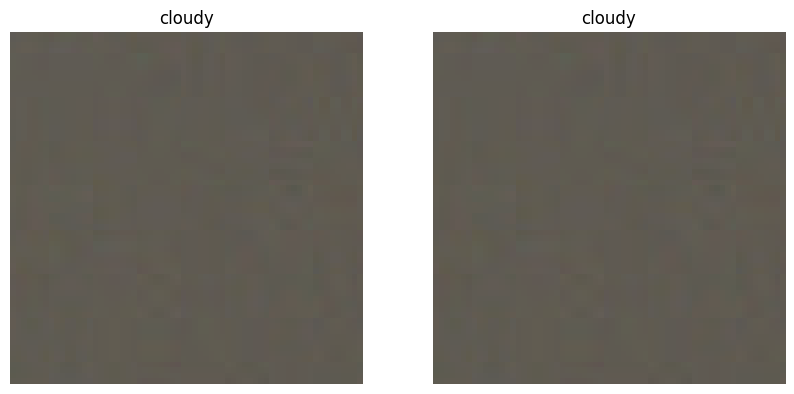

Test image 795 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


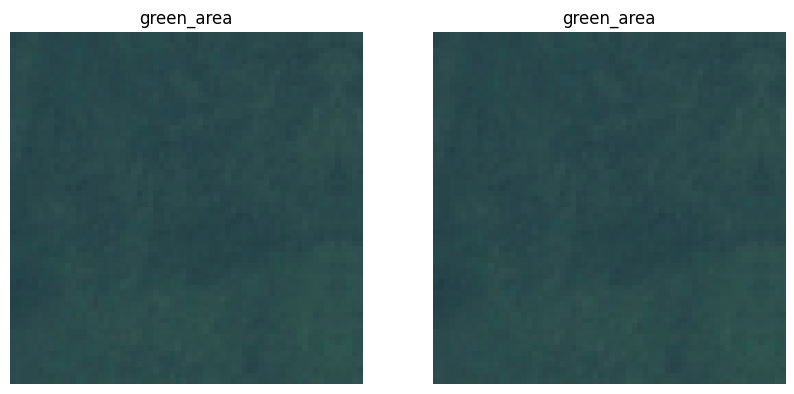

Test image 796 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


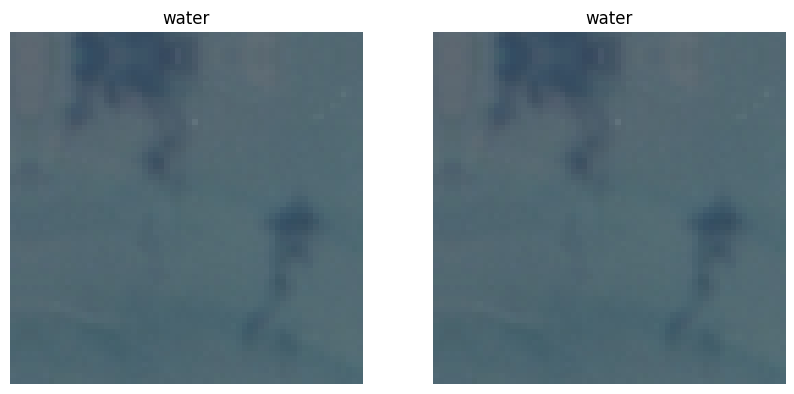

Test image 797 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


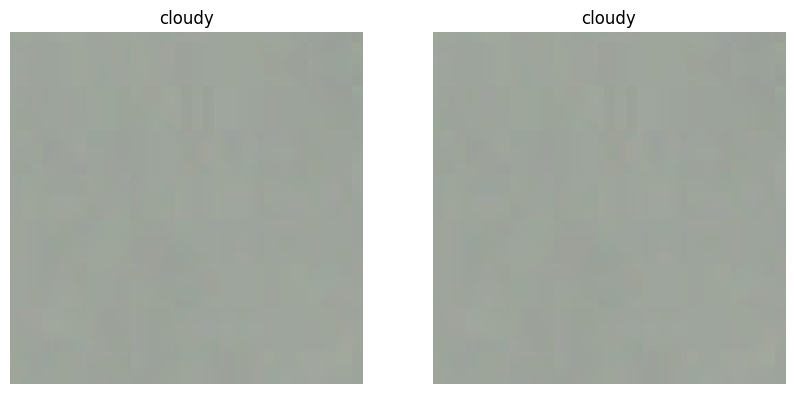

Test image 798 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


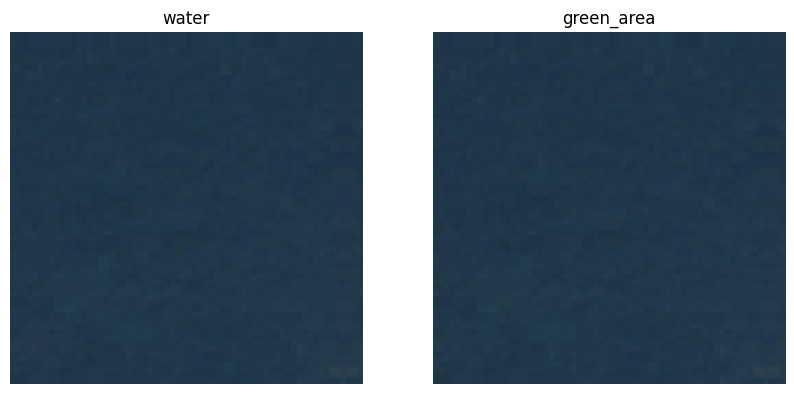

Test image 799 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


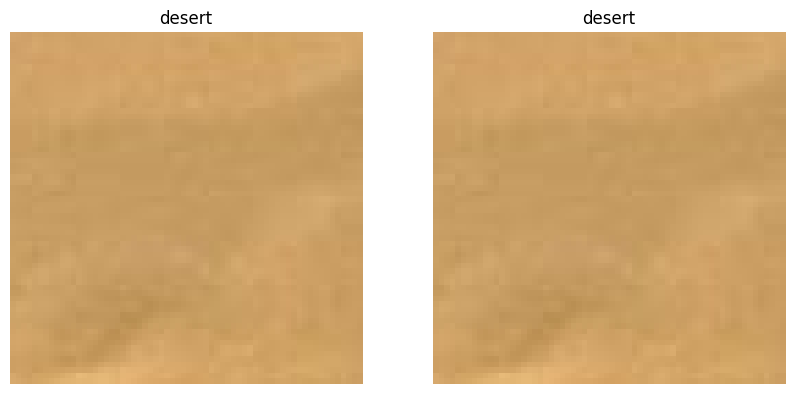

Test image 800 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


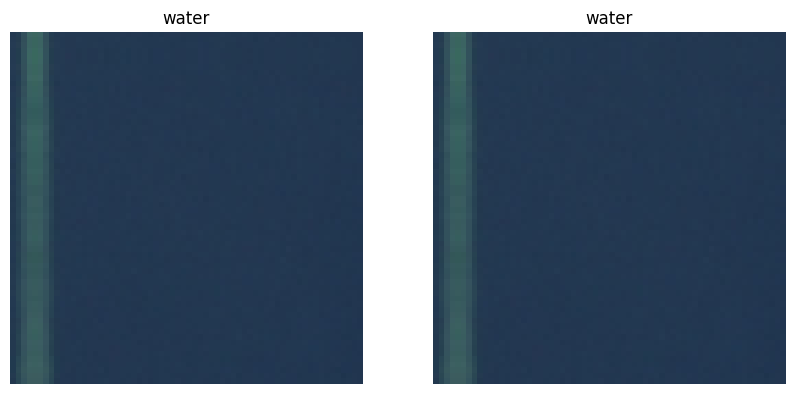

Test image 801 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


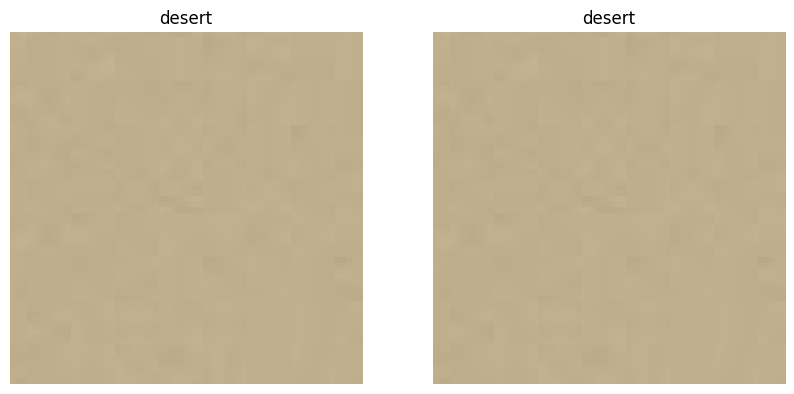

Test image 802 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


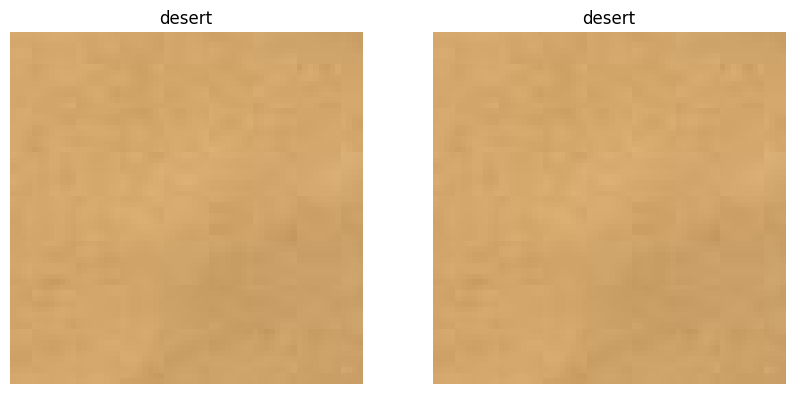

Test image 803 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


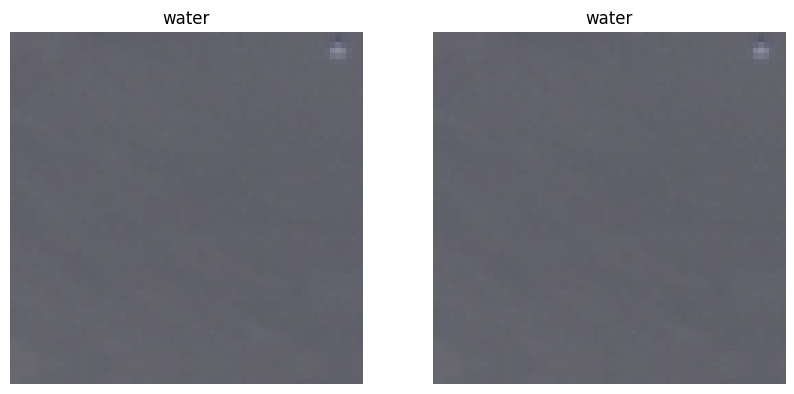

Test image 804 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


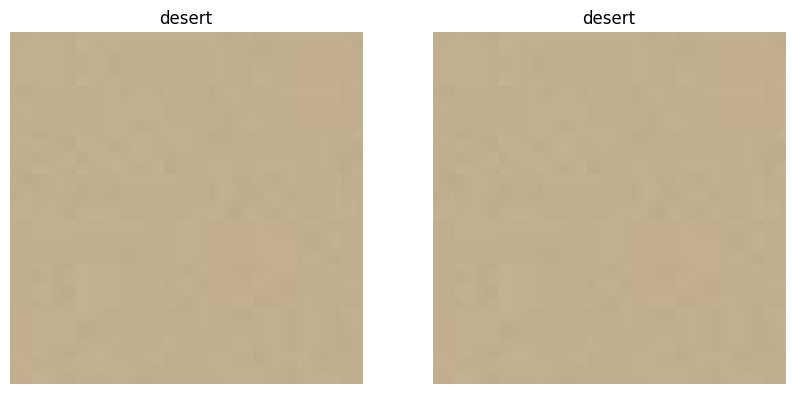

Test image 805 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


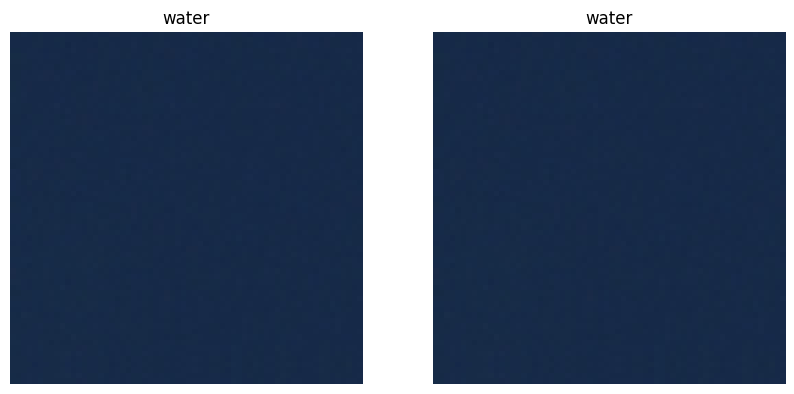

Test image 806 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


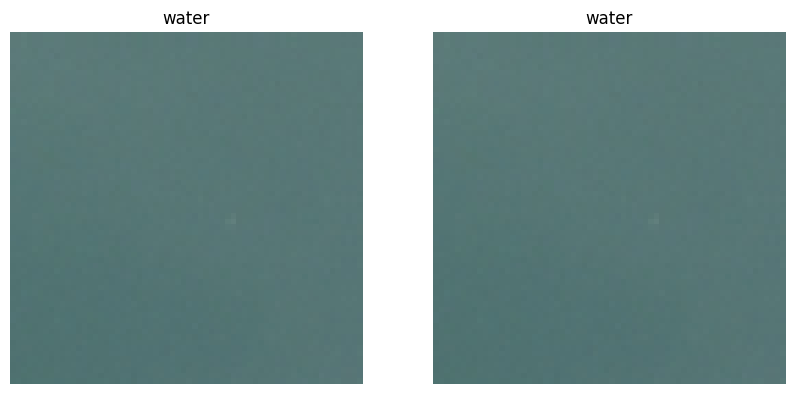

Test image 807 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


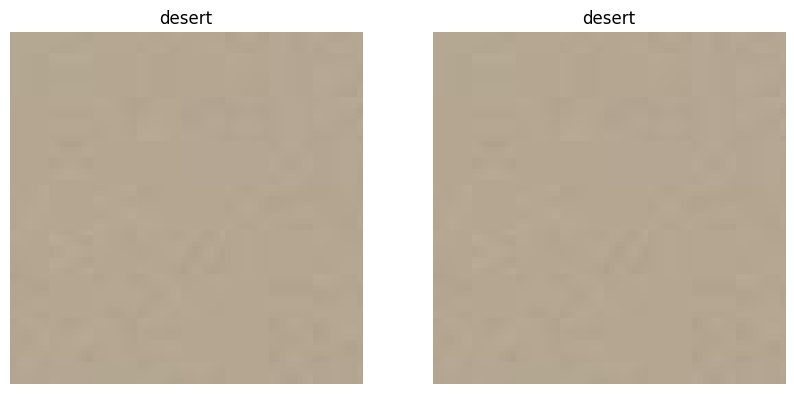

Test image 808 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


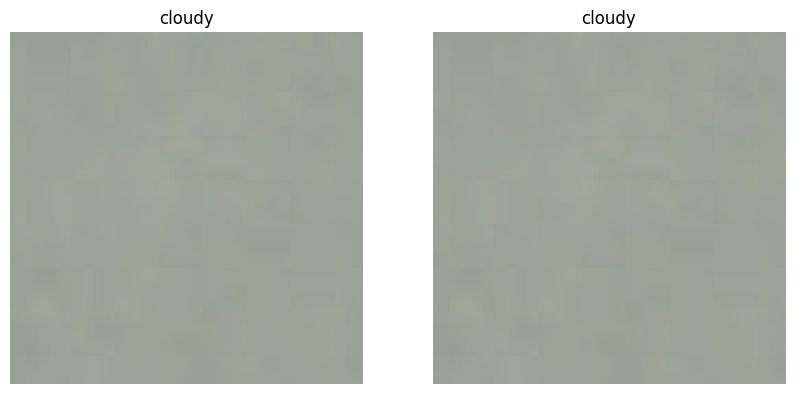

Test image 809 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


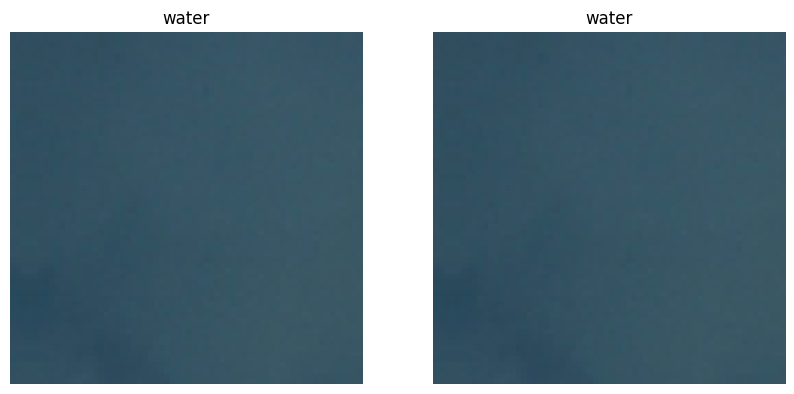

Test image 810 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


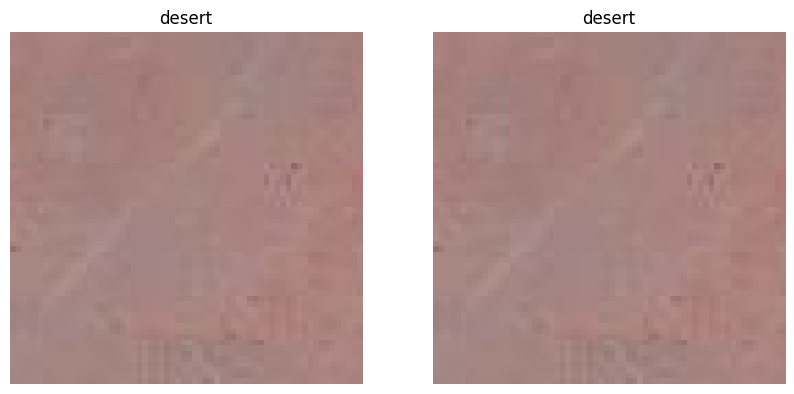

Test image 811 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


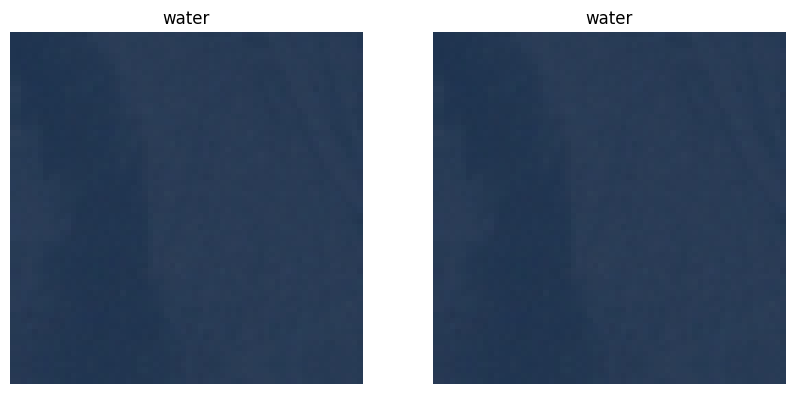

Test image 812 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


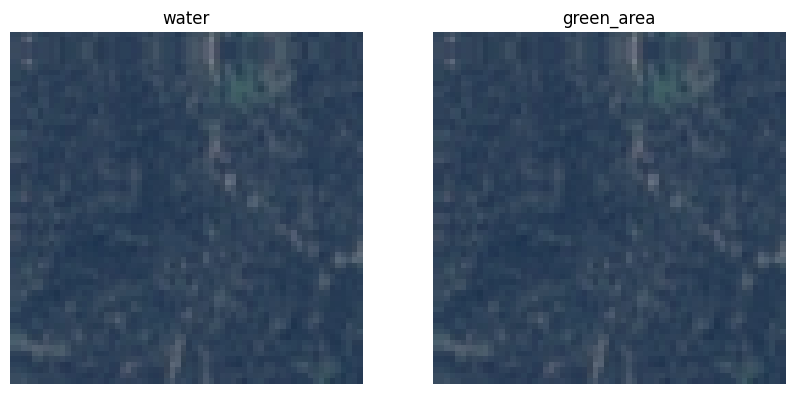

Test image 813 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


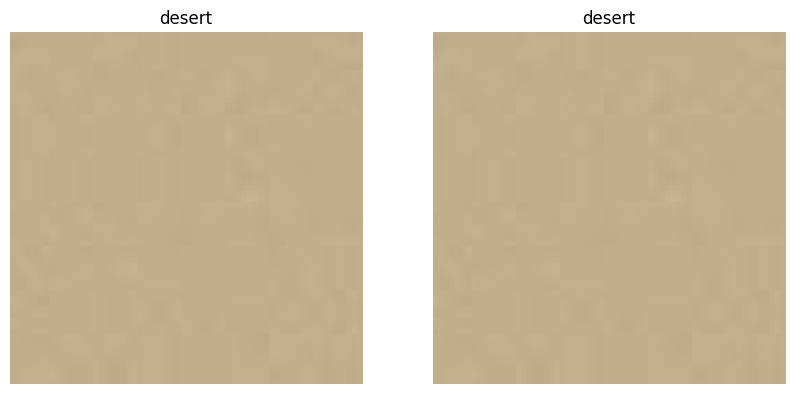

Test image 814 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


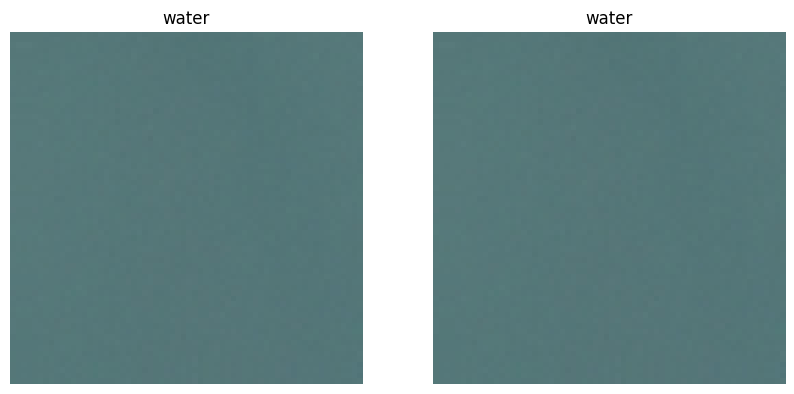

Test image 815 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


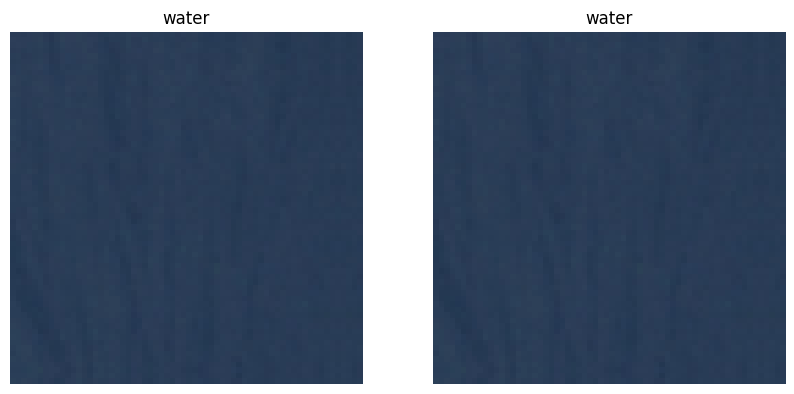

Test image 816 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


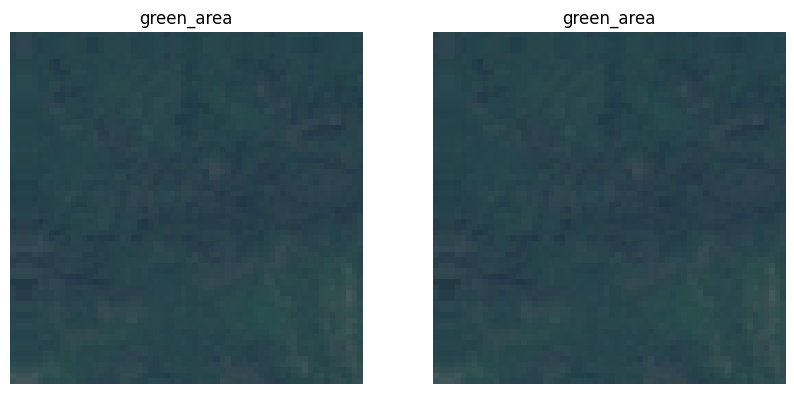

Test image 817 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


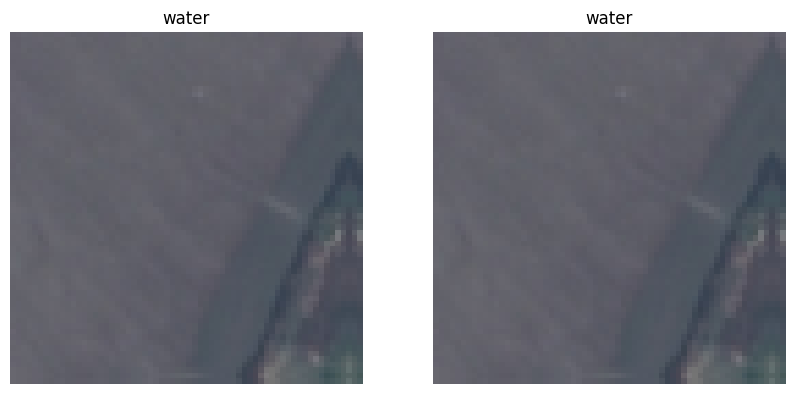

Test image 818 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


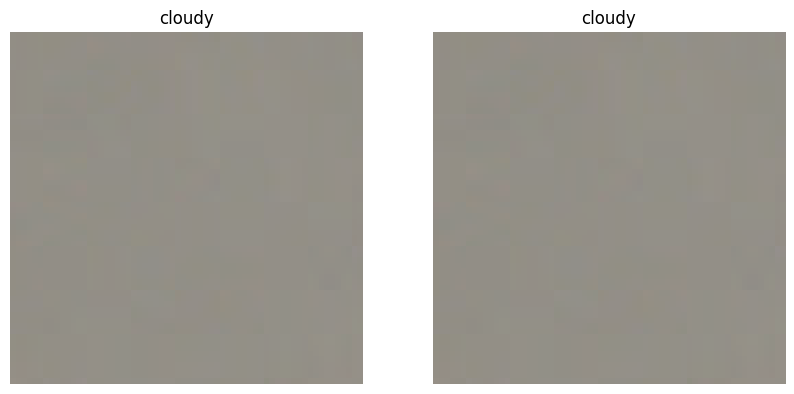

Test image 819 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


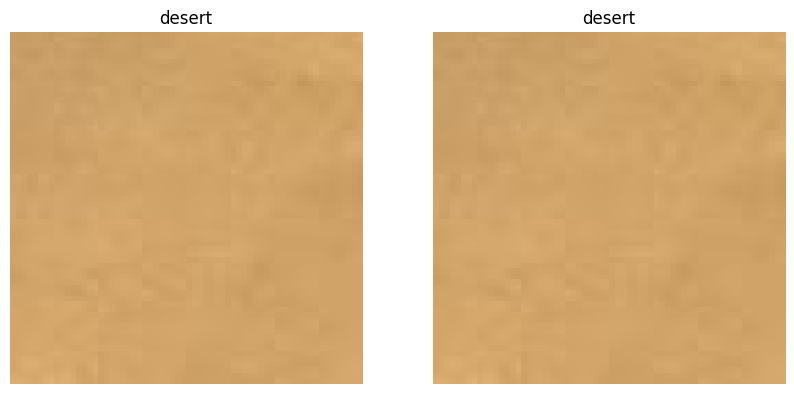

Test image 820 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


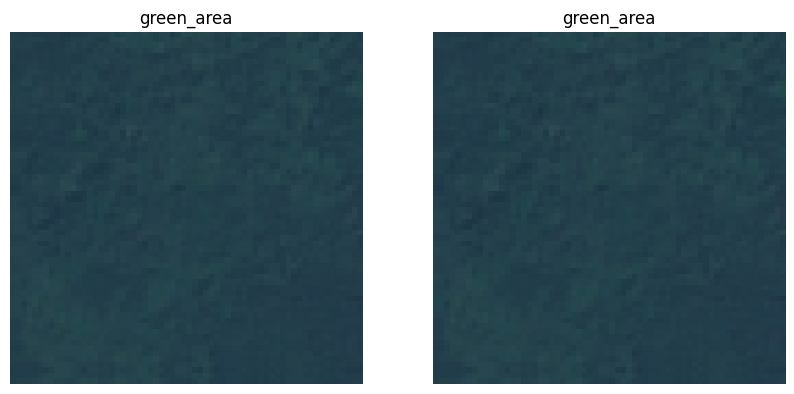

Test image 821 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


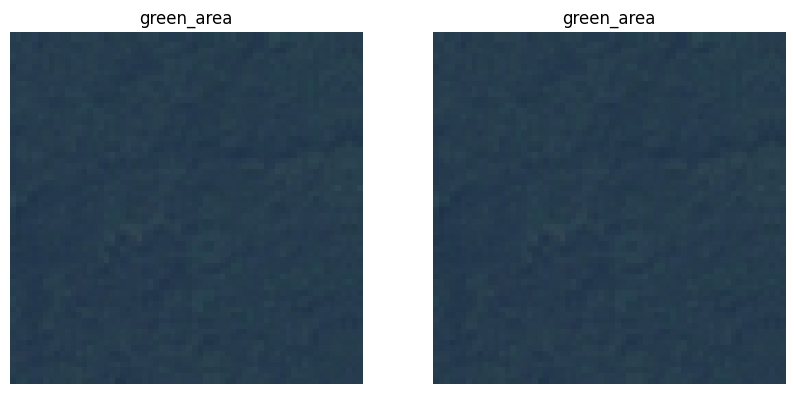

Test image 822 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


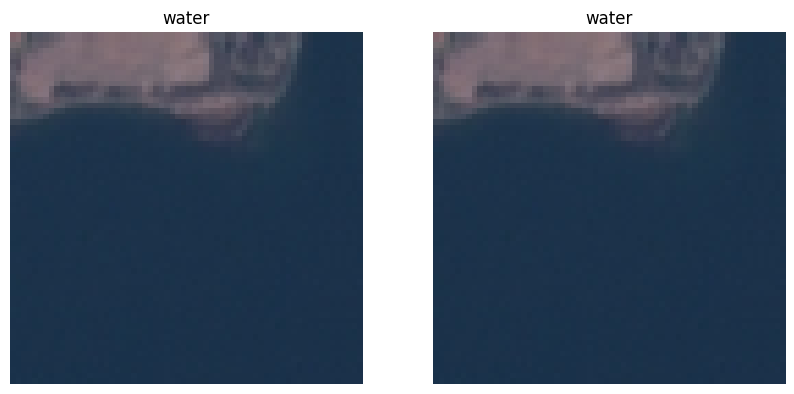

Test image 823 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


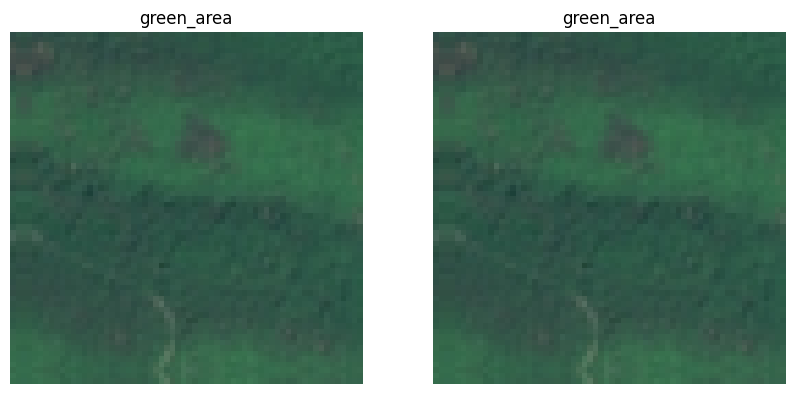

Test image 824 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


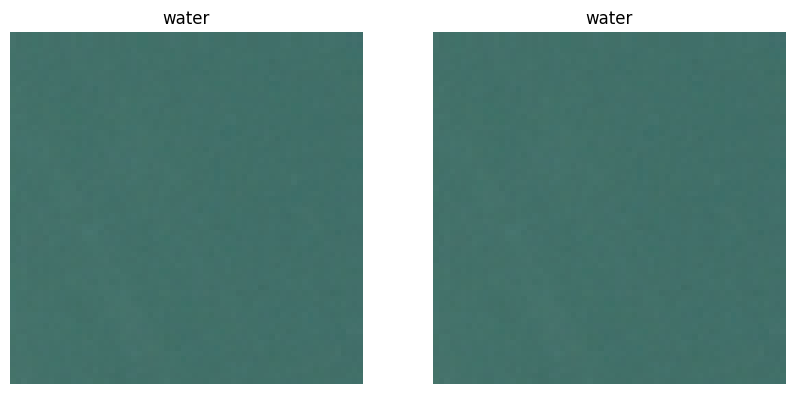

Test image 825 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


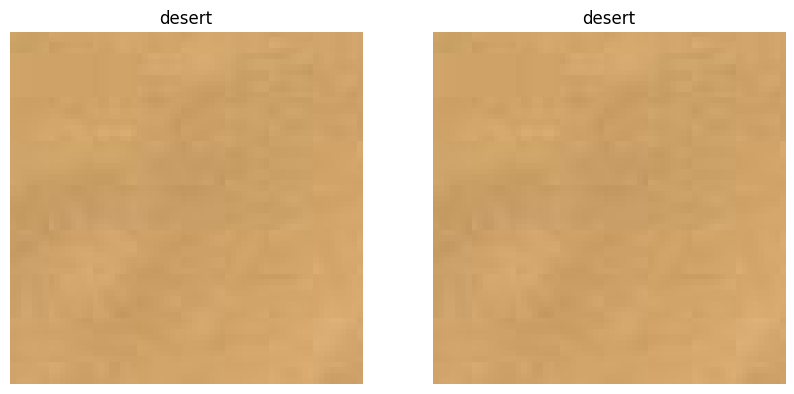

Test image 826 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


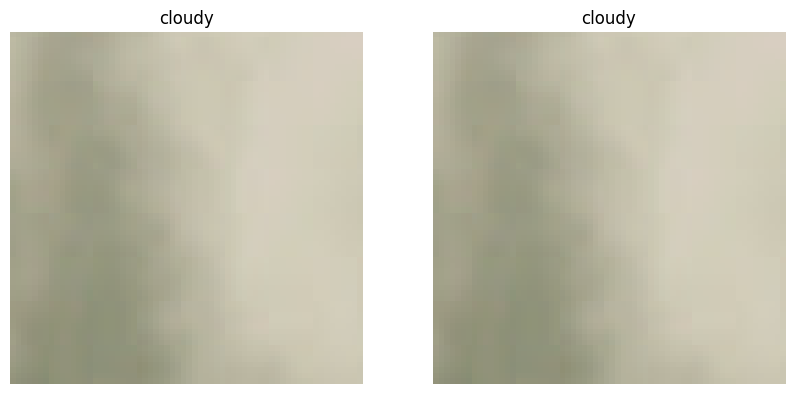

Test image 827 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


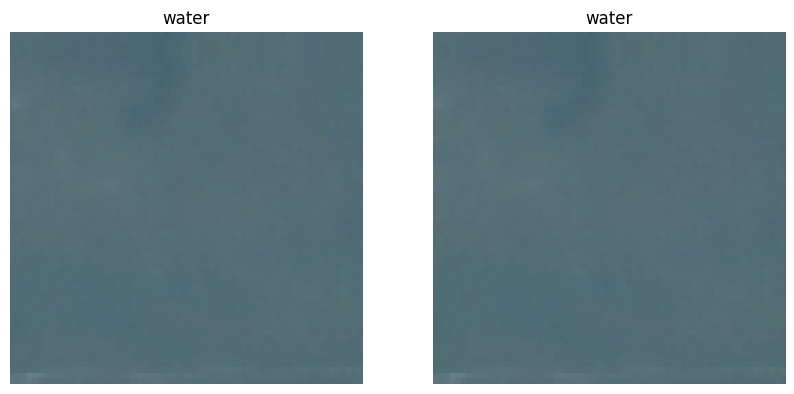

Test image 828 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


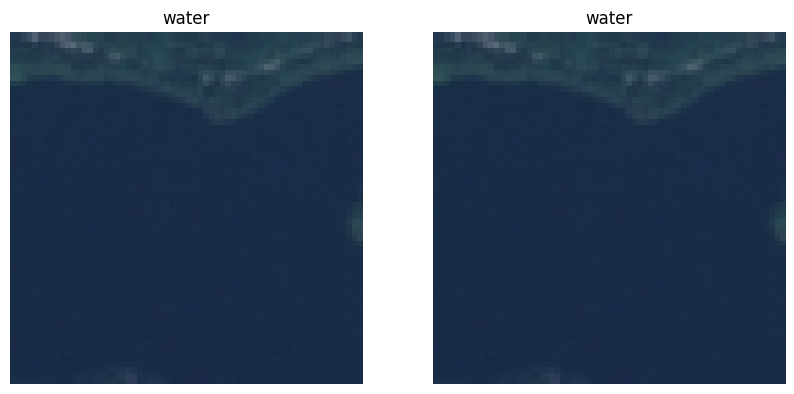

Test image 829 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


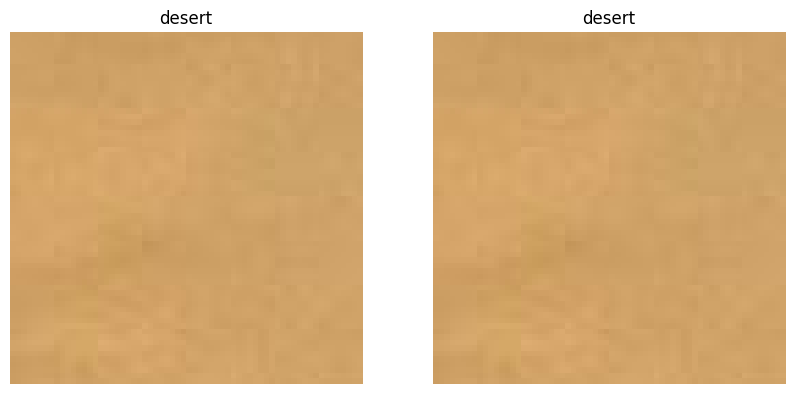

Test image 830 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


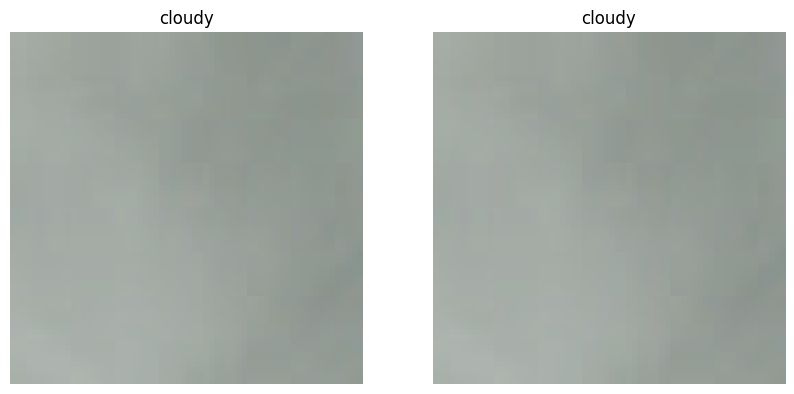

Test image 831 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


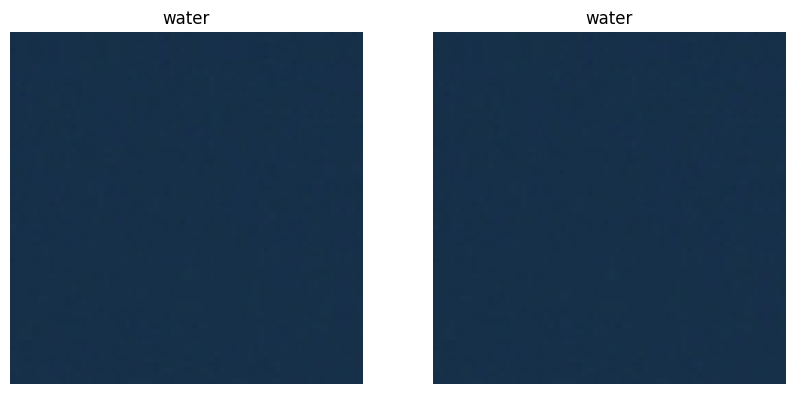

Test image 832 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


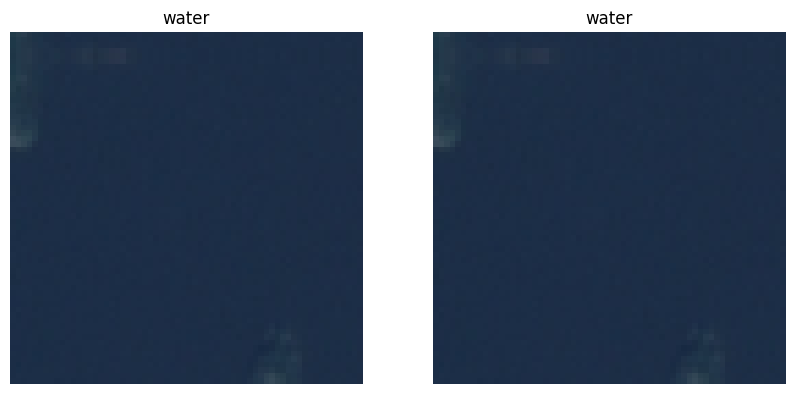

Test image 833 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


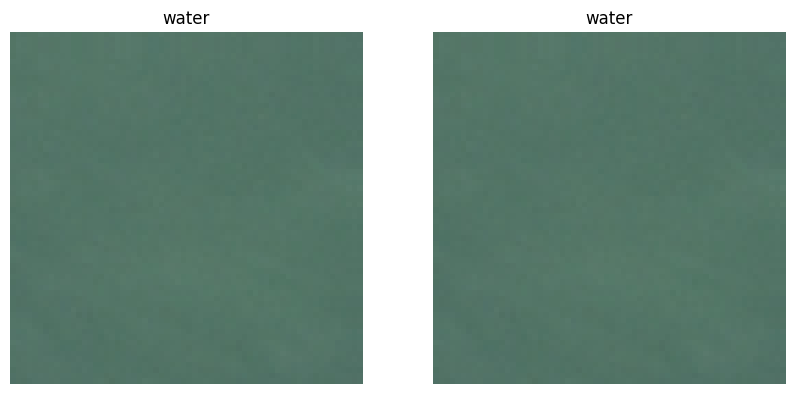

Test image 834 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


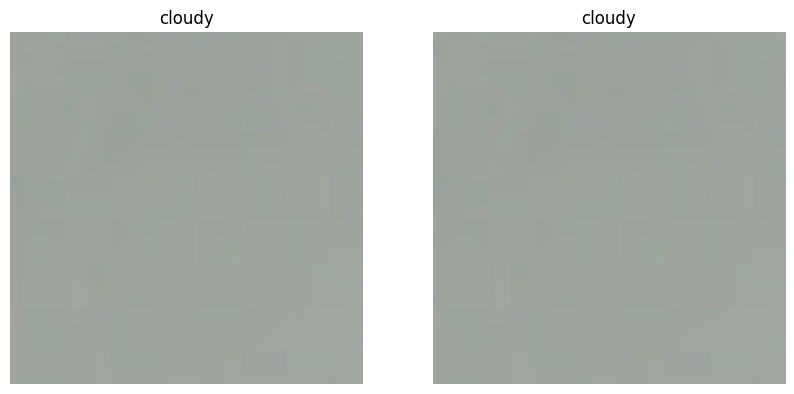

Test image 835 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


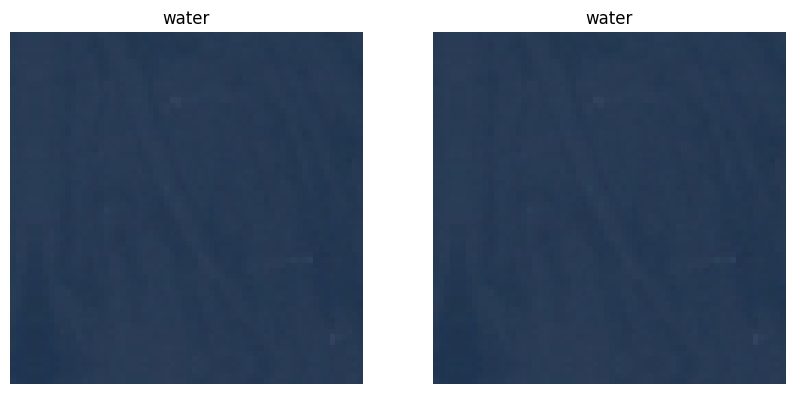

Test image 836 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


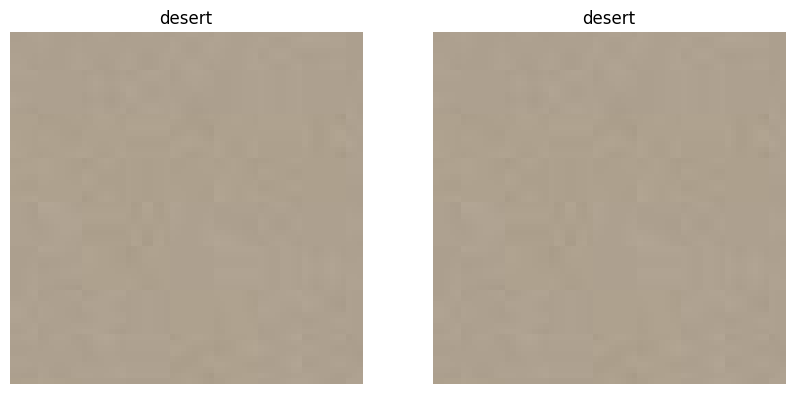

Test image 837 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


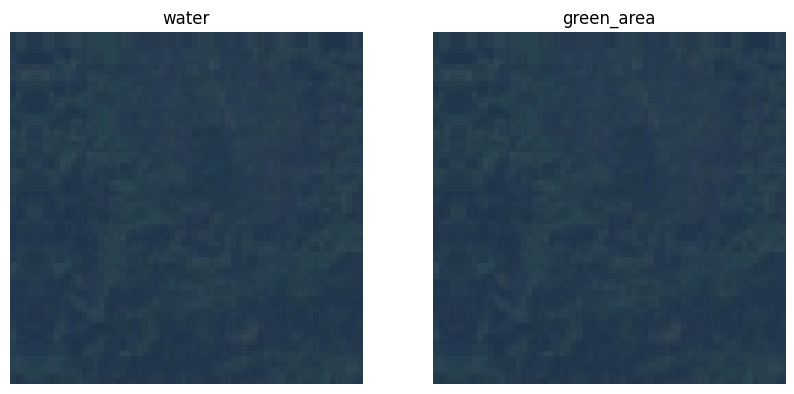

Test image 838 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


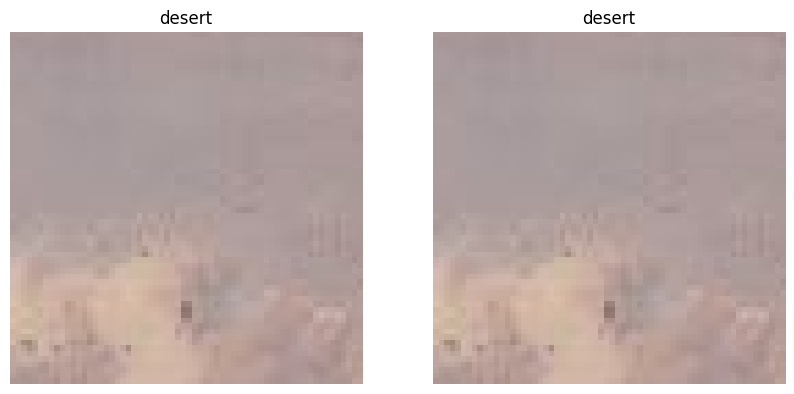

Test image 839 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


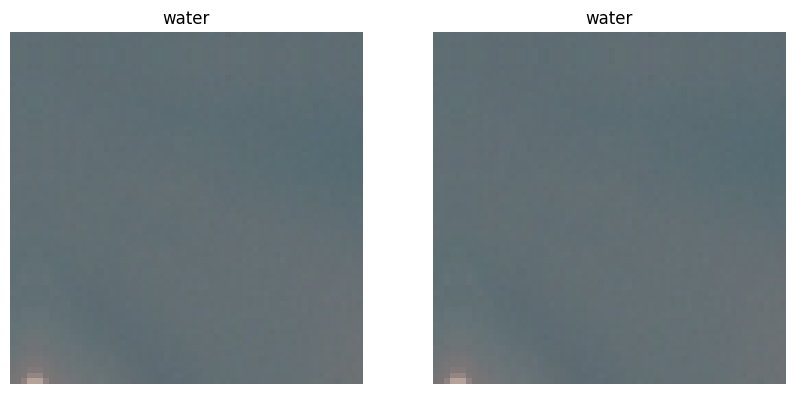

Test image 840 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


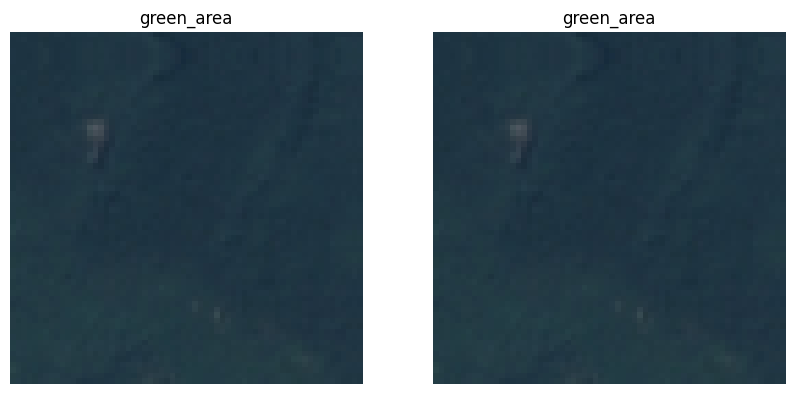

Test image 841 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


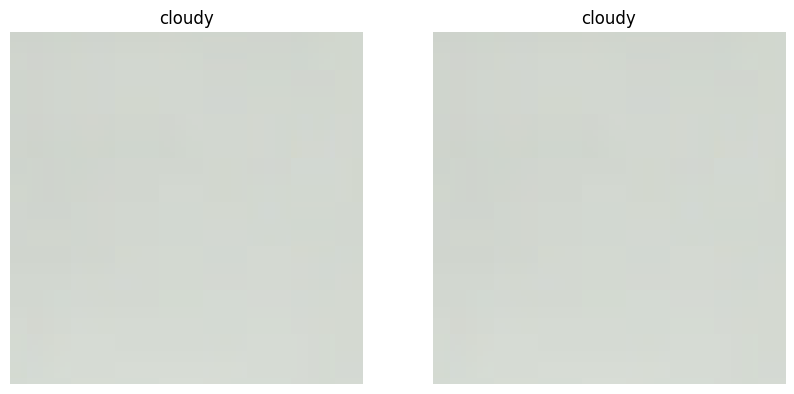

Test image 842 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


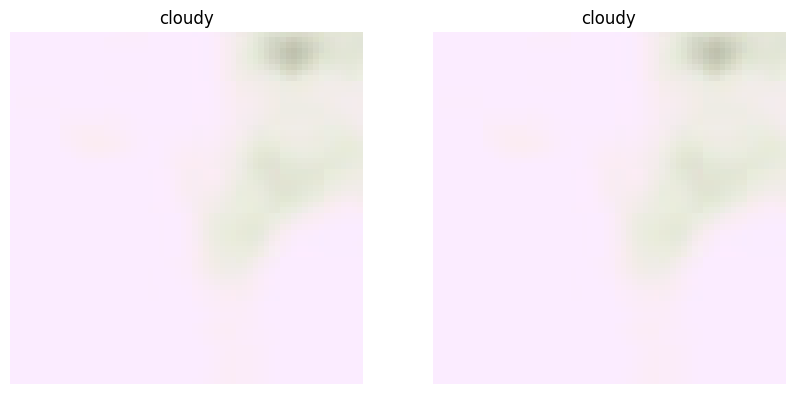

Test image 843 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


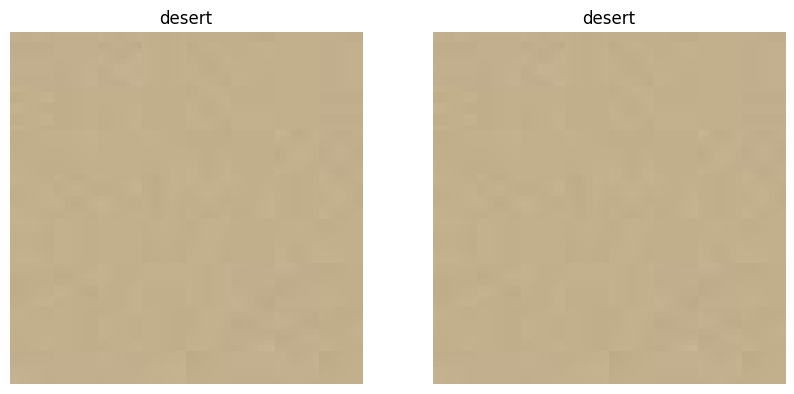

Test image 844 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


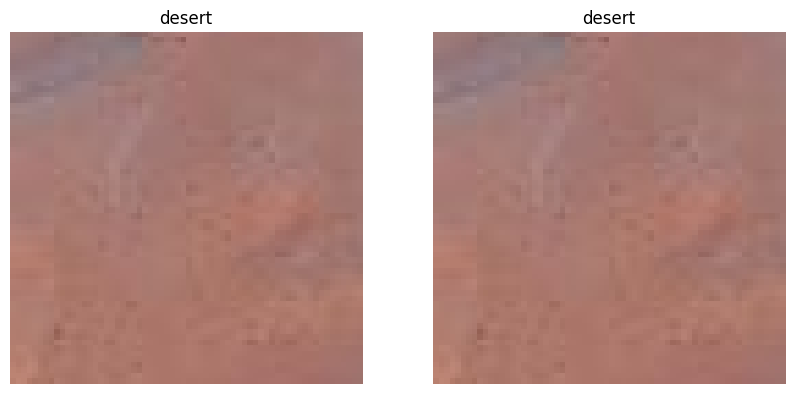

Test image 845 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


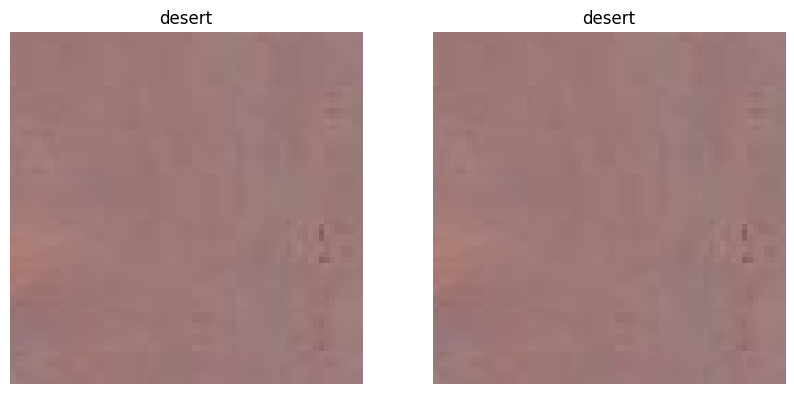

Test image 846 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


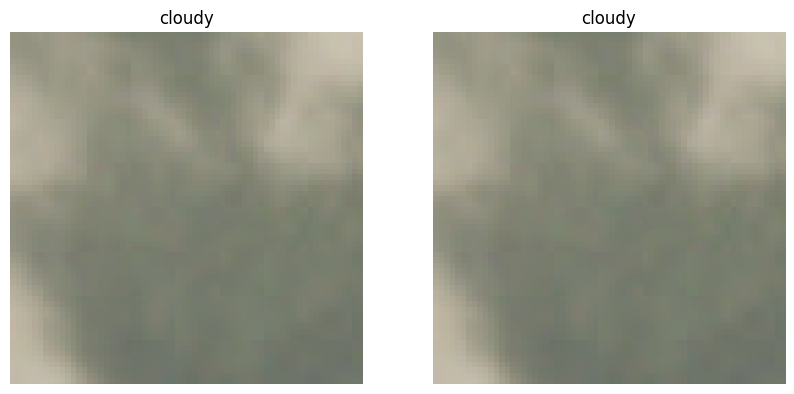

Test image 847 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


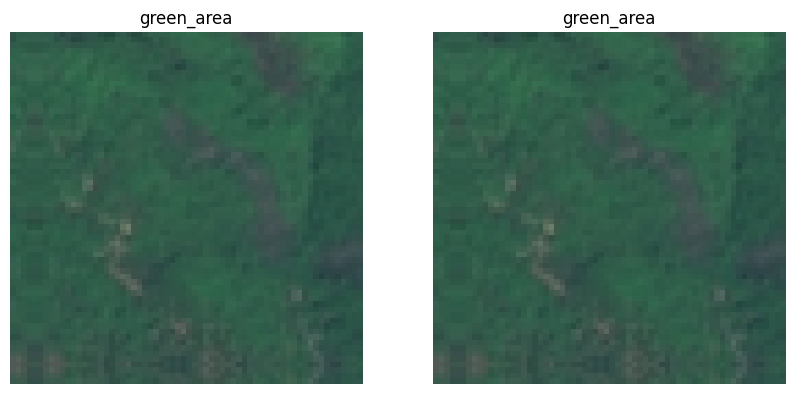

Test image 848 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


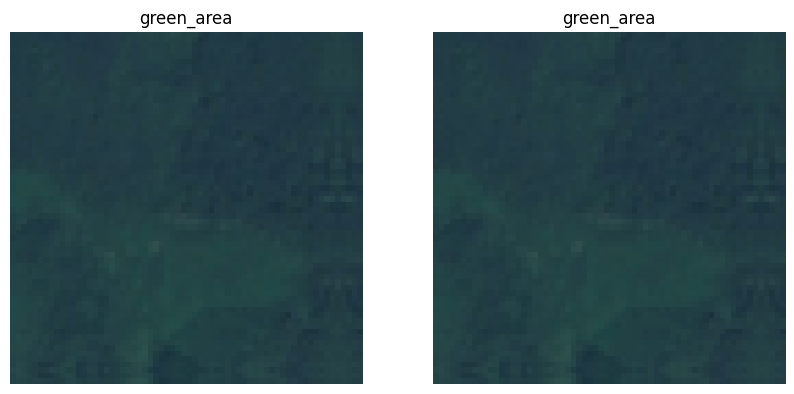

Test image 849 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


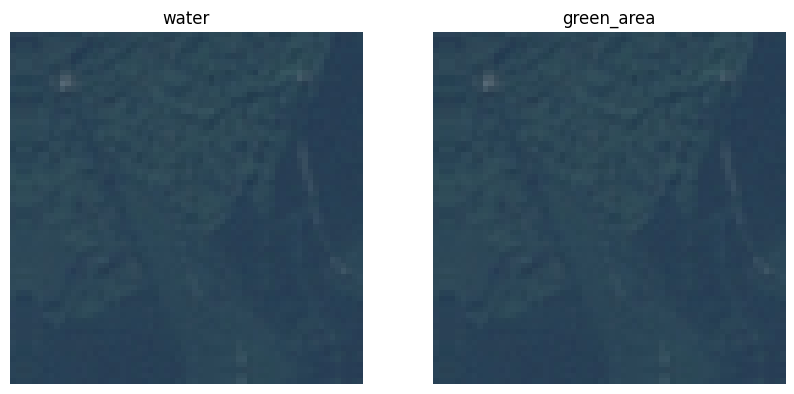

Test image 850 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


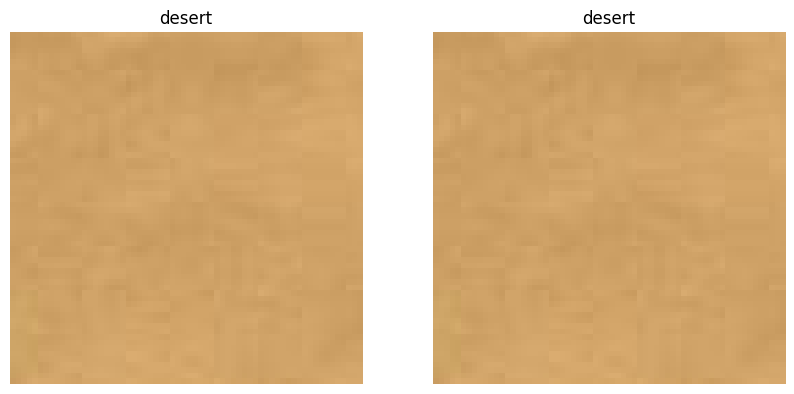

Test image 851 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


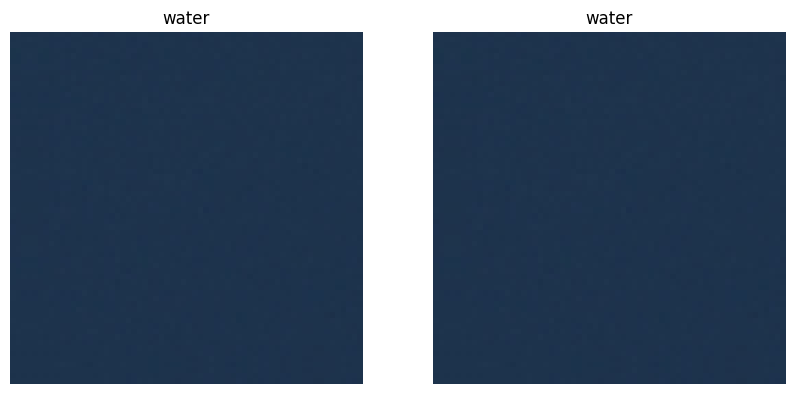

Test image 852 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


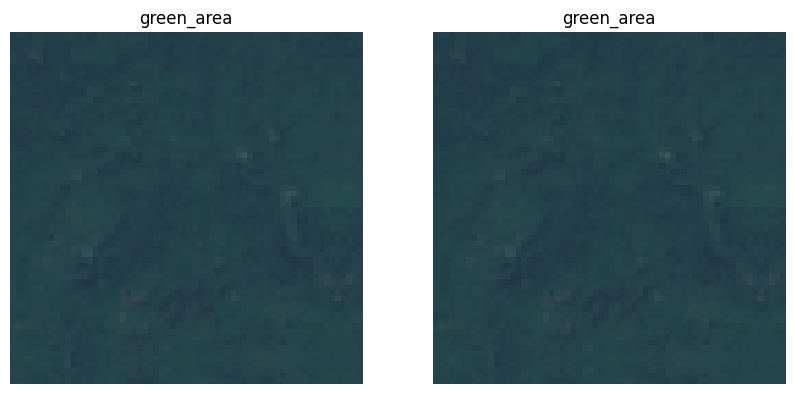

Test image 853 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


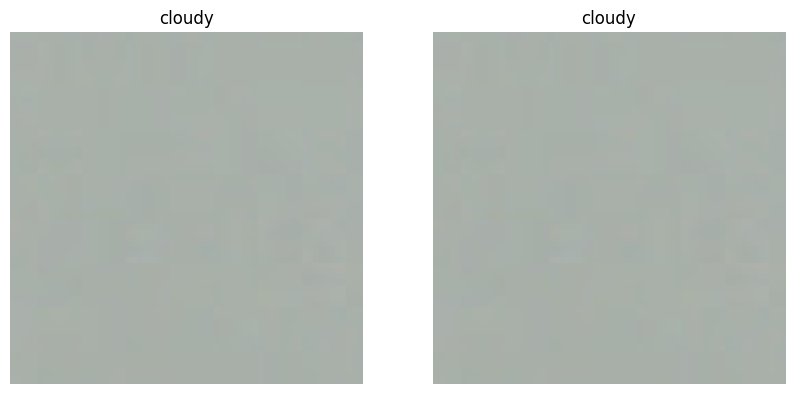

Test image 854 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


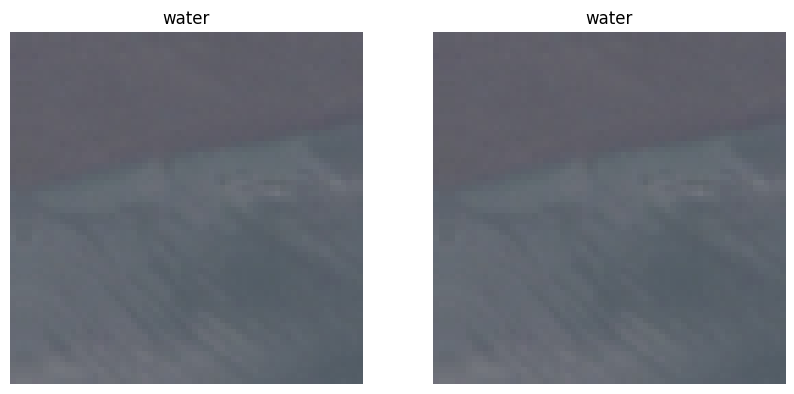

Test image 855 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


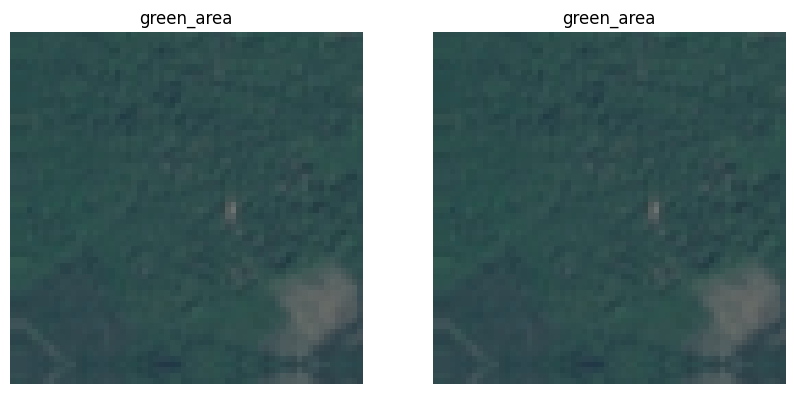

Test image 856 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


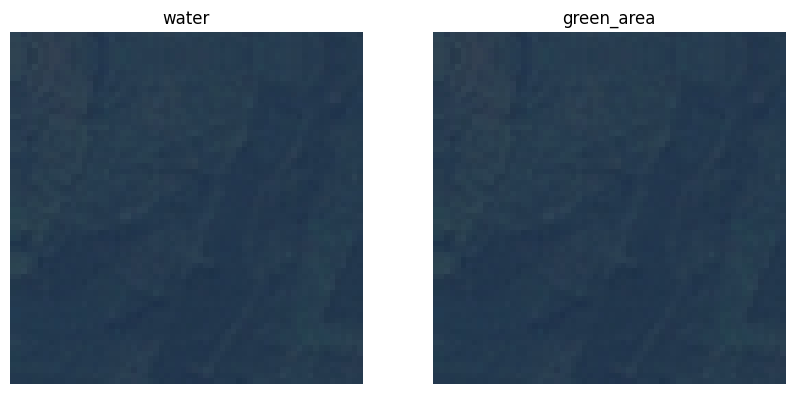

Test image 857 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


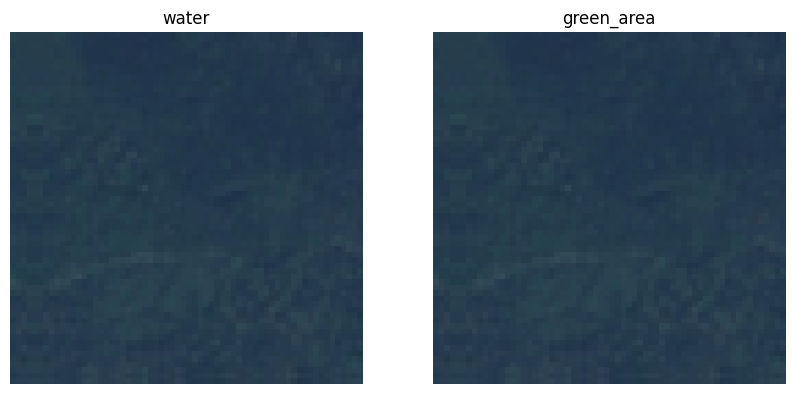

Test image 858 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


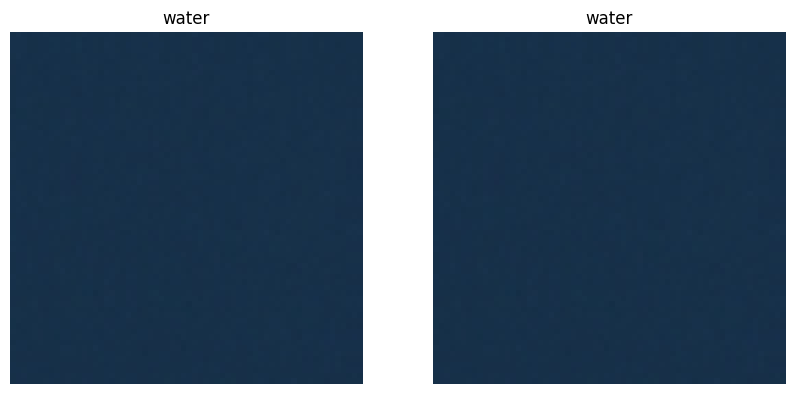

Test image 859 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


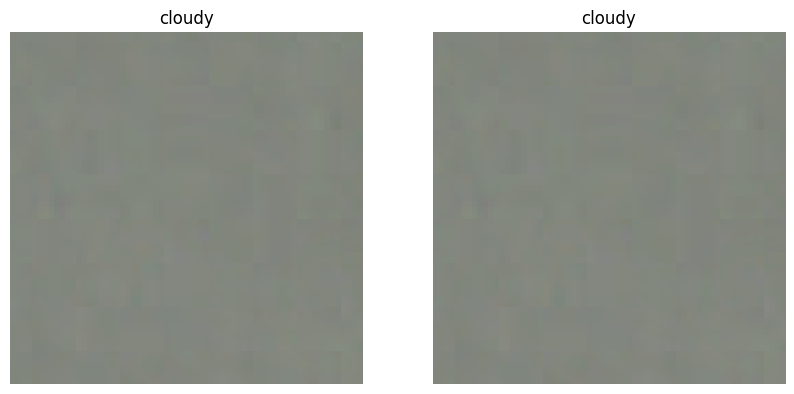

Test image 860 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


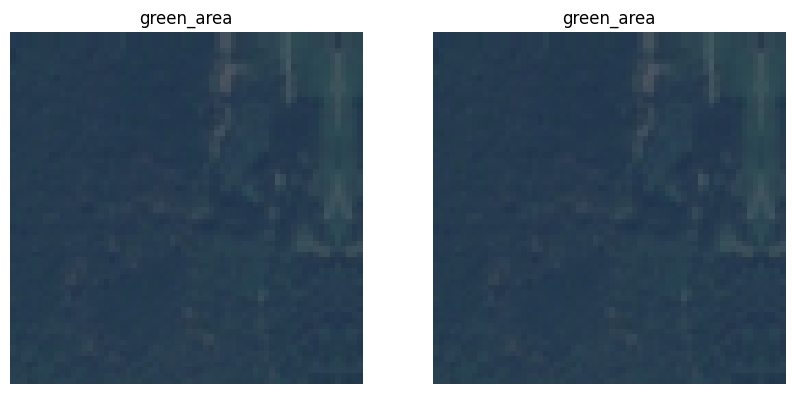

Test image 861 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


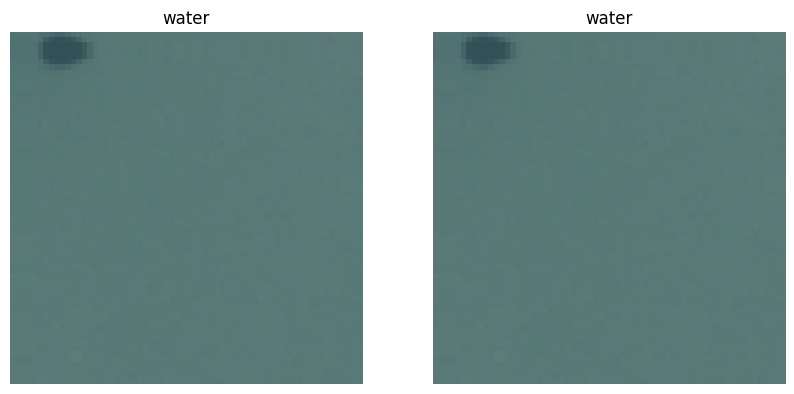

Test image 862 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


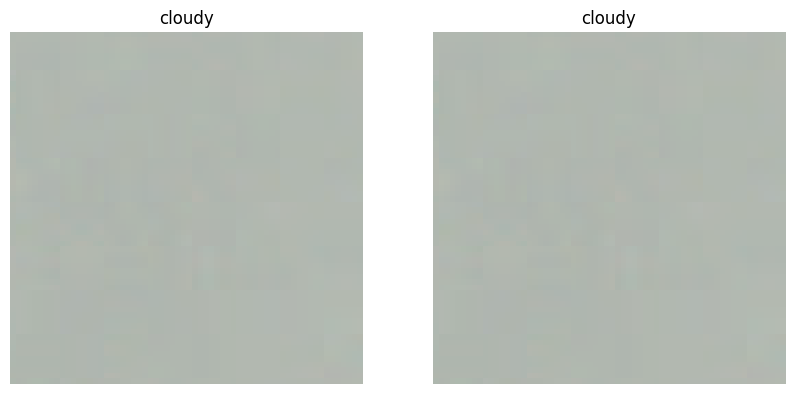

Test image 863 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


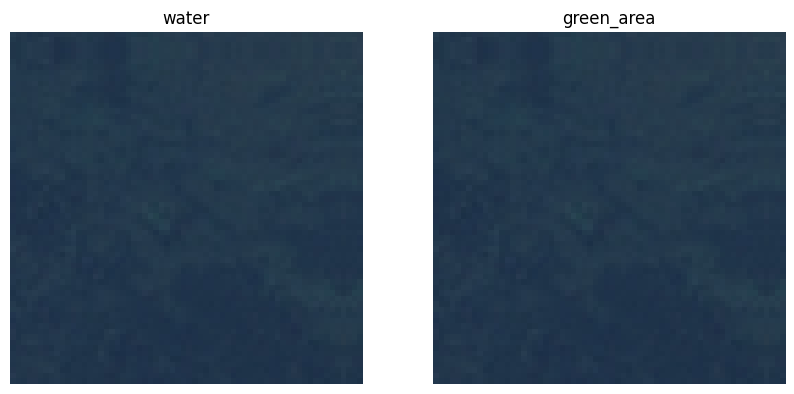

Test image 864 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


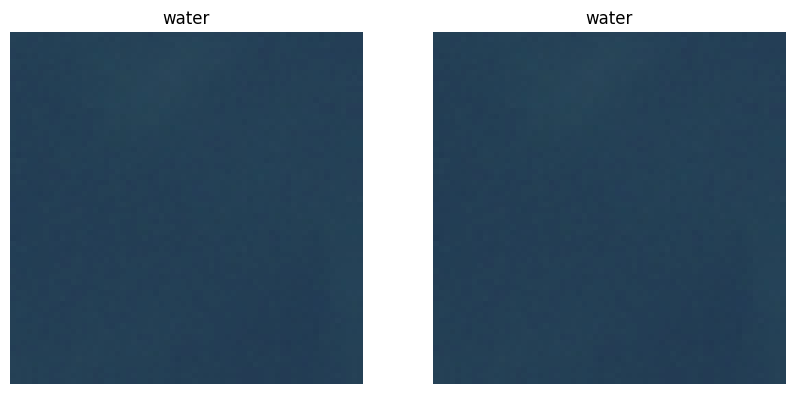

Test image 865 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


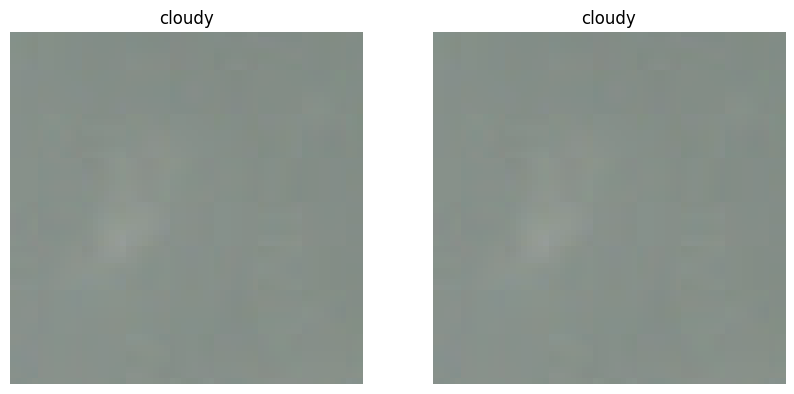

Test image 866 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


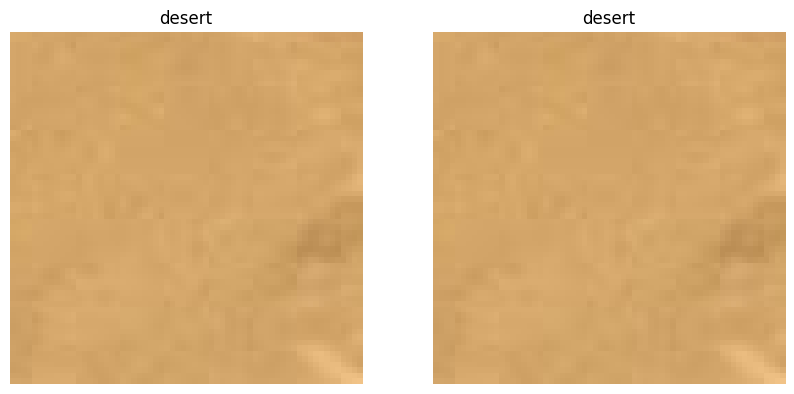

Test image 867 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


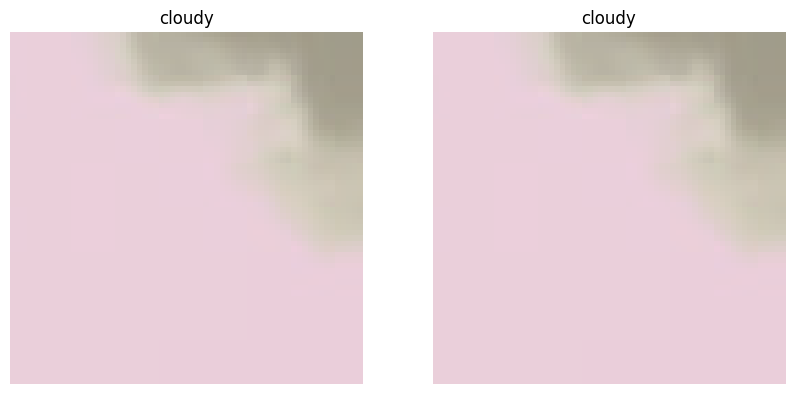

Test image 868 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


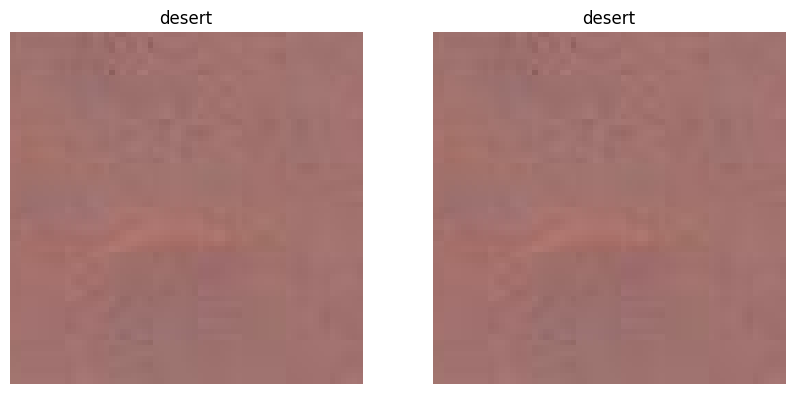

Test image 869 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


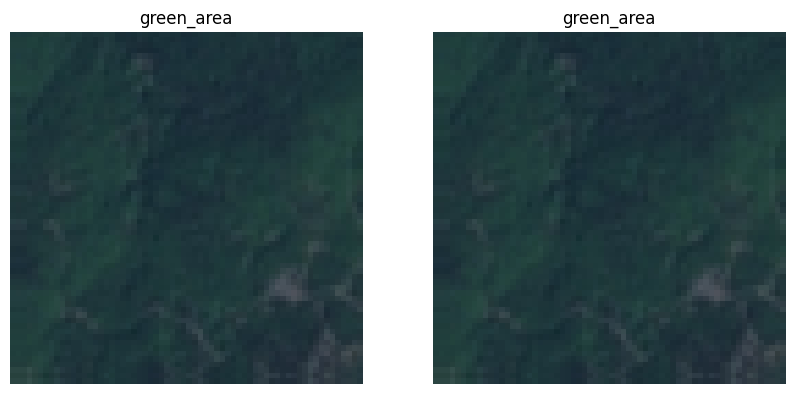

Test image 870 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


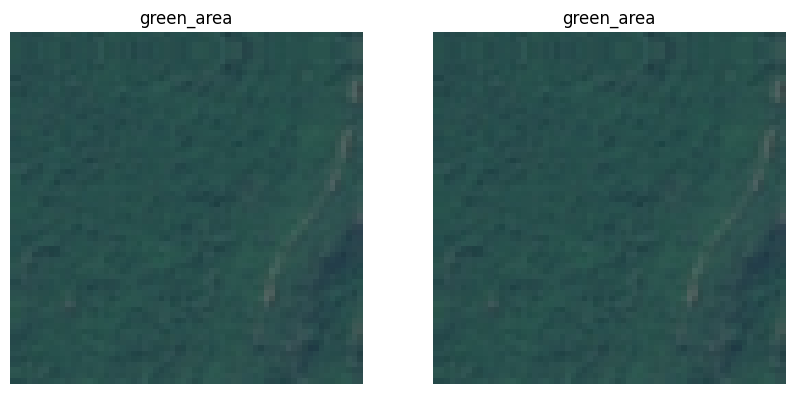

Test image 871 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


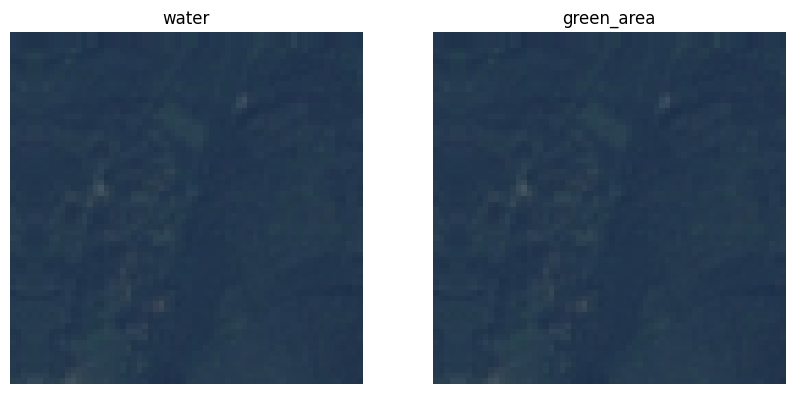

Test image 872 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


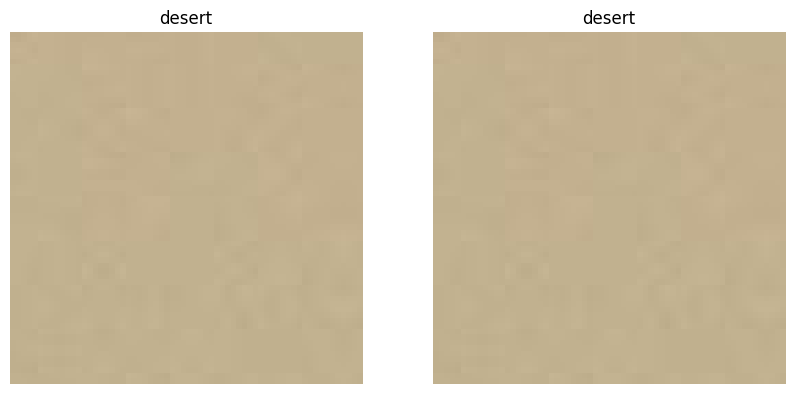

Test image 873 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


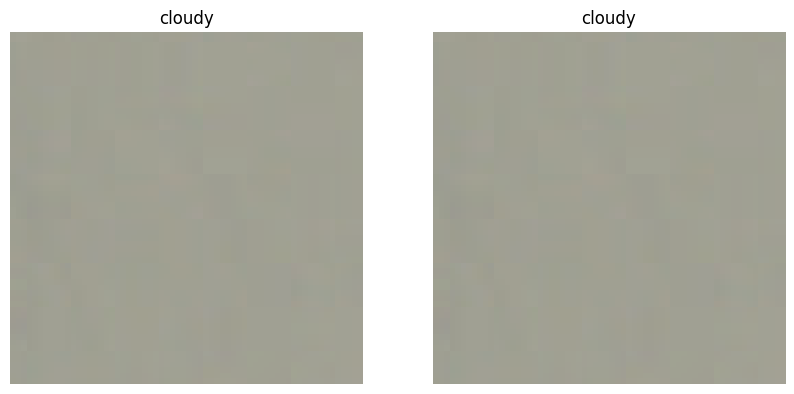

Test image 874 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


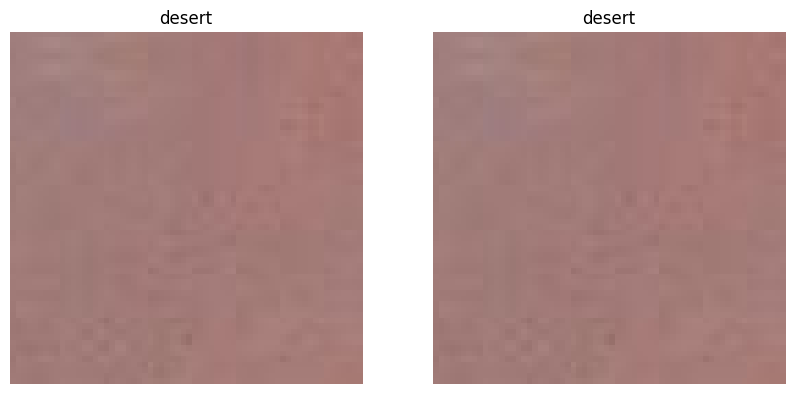

Test image 875 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


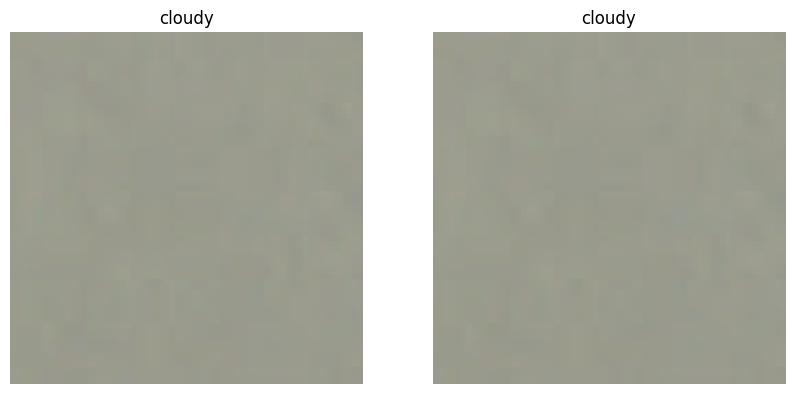

Test image 876 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


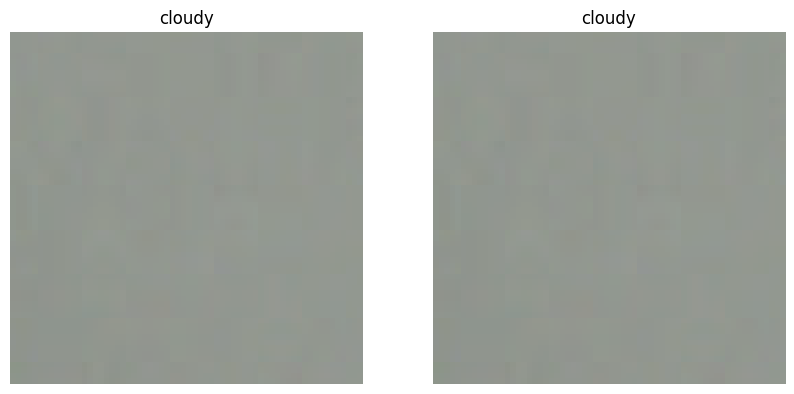

Test image 877 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


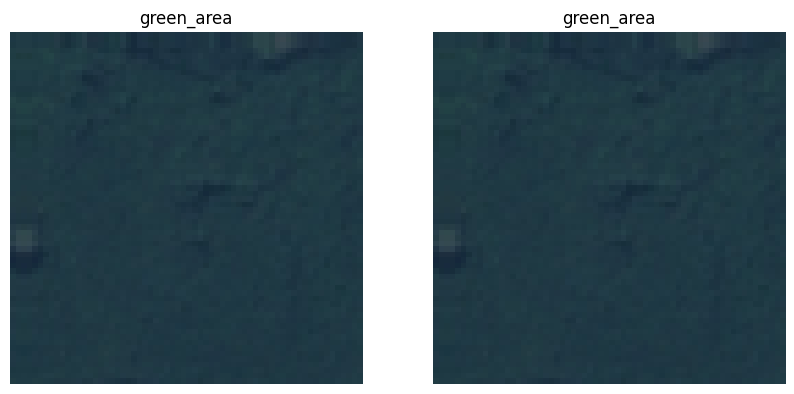

Test image 878 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


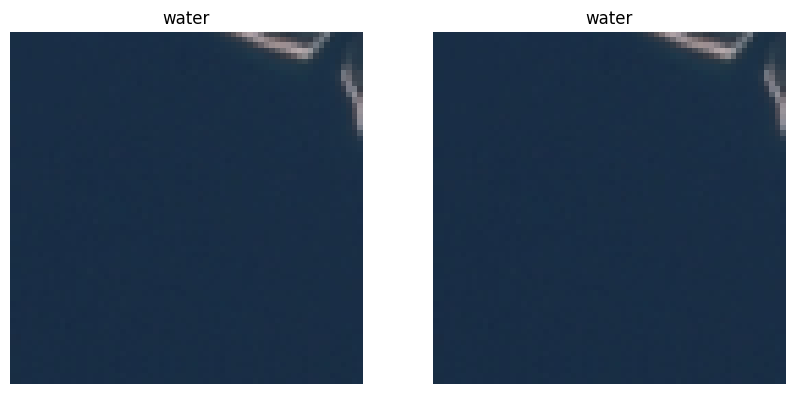

Test image 879 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


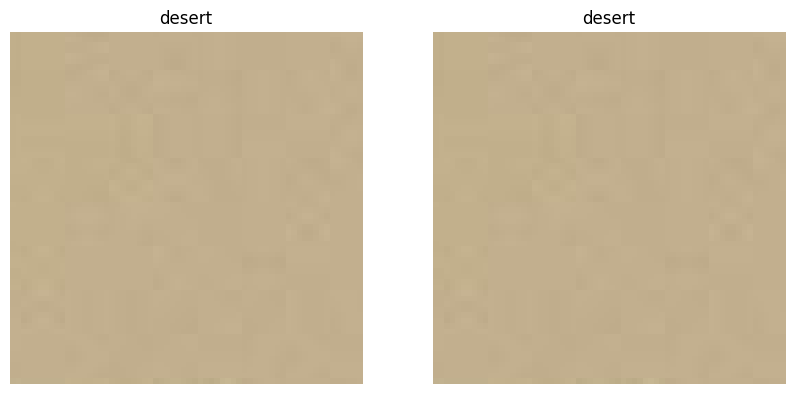

Test image 880 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


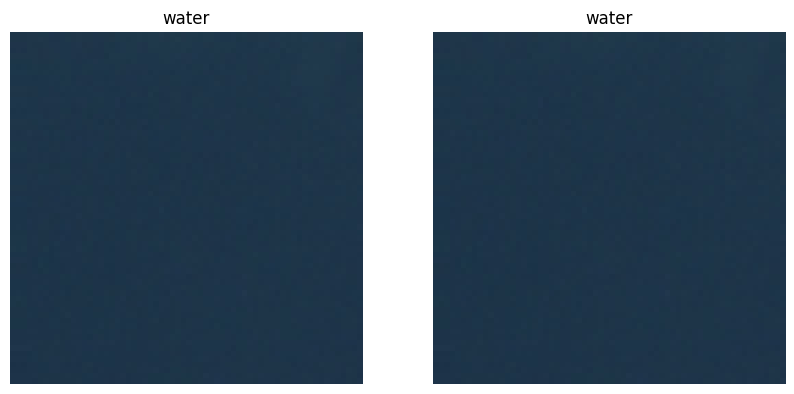

Test image 881 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


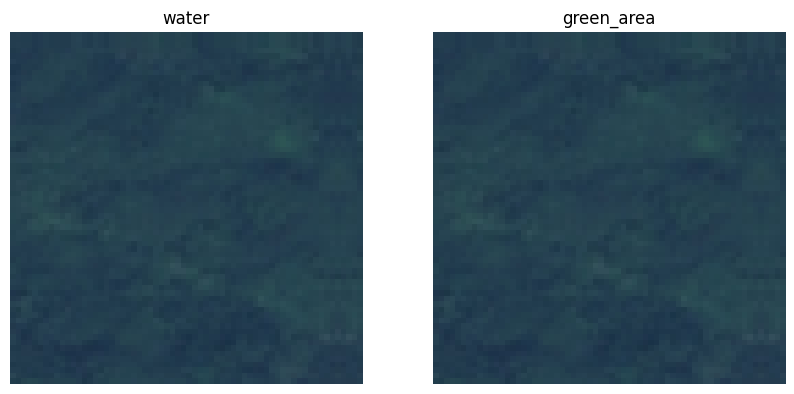

Test image 882 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


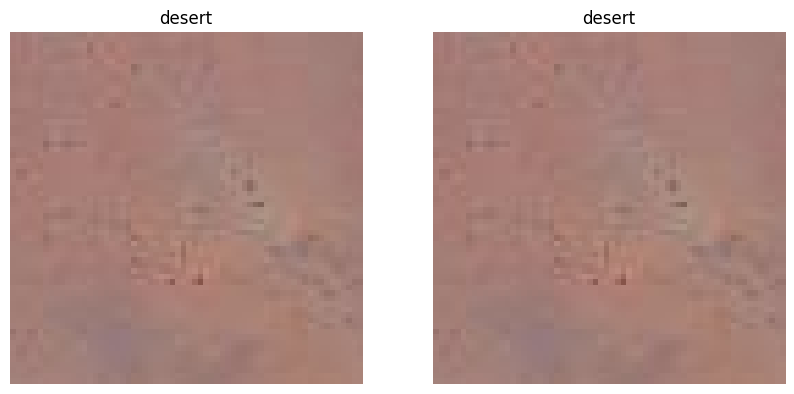

Test image 883 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


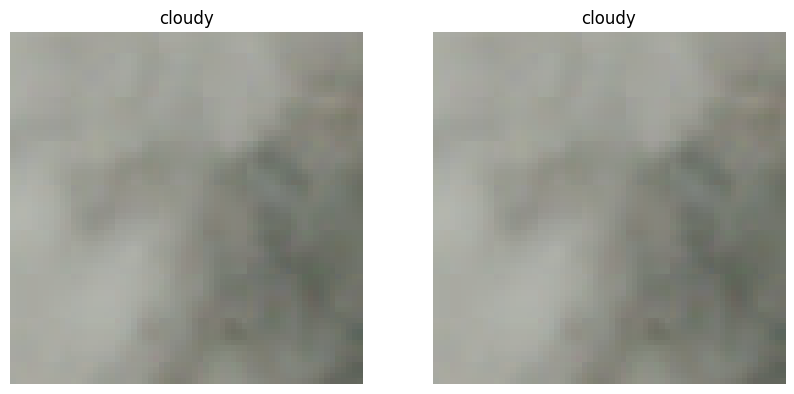

Test image 884 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


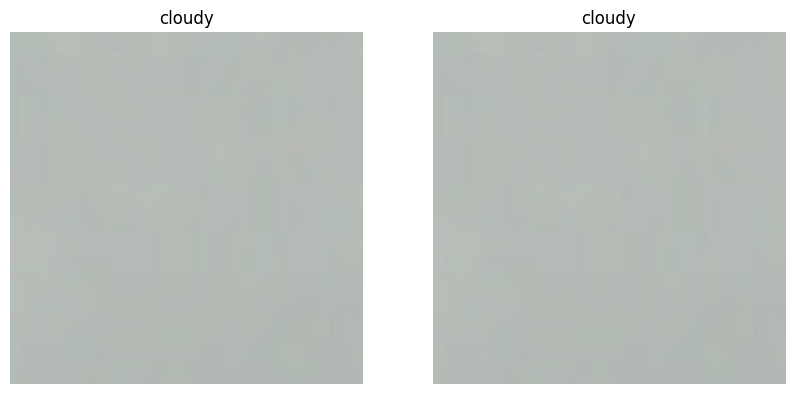

Test image 885 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


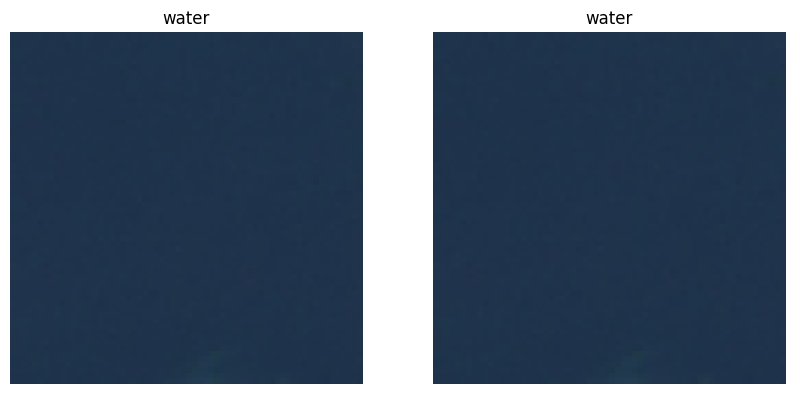

Test image 886 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


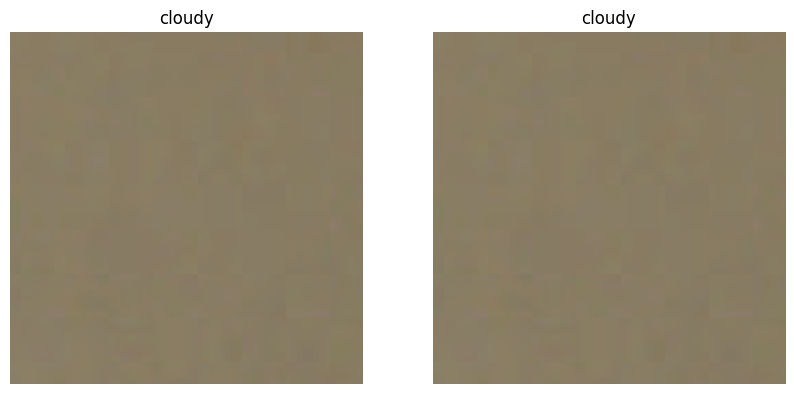

Test image 887 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


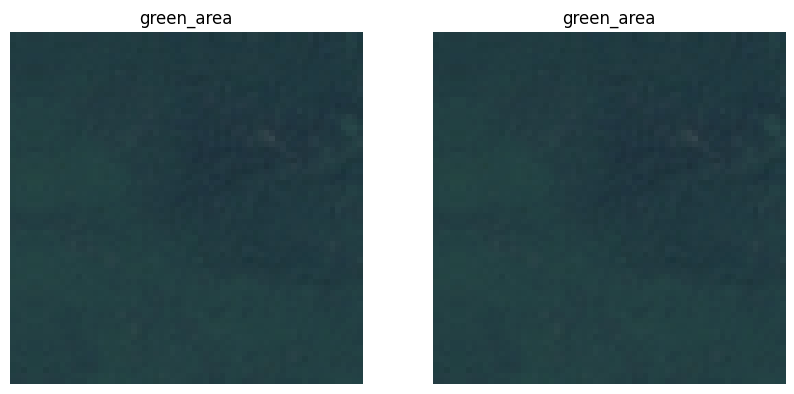

Test image 888 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


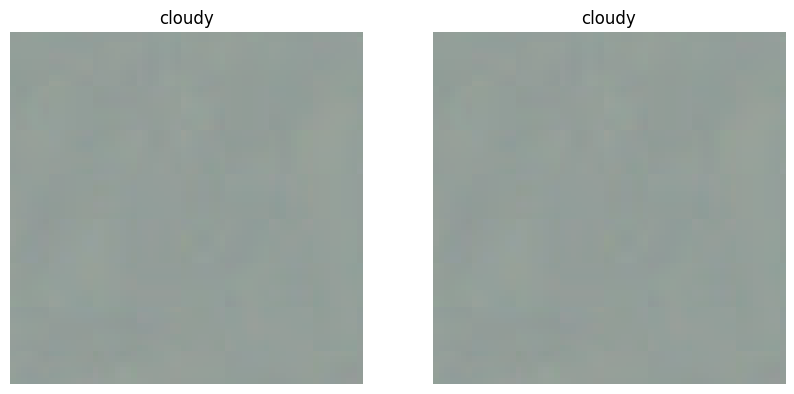

Test image 889 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


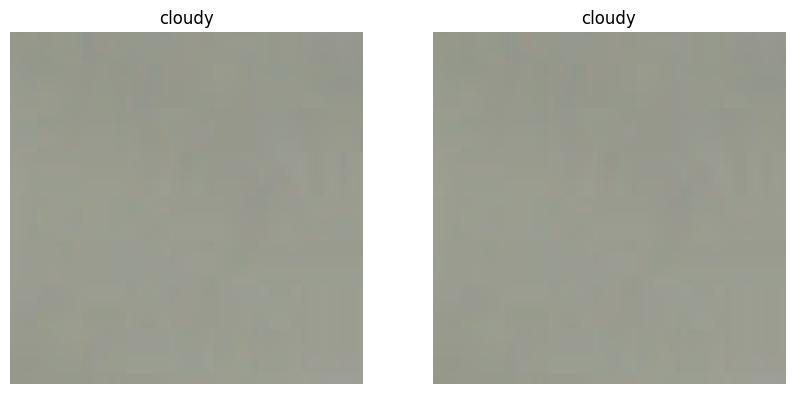

Test image 890 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


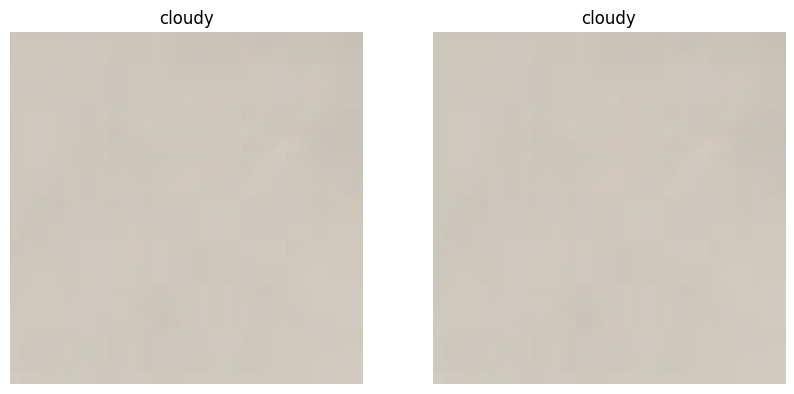

Test image 891 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


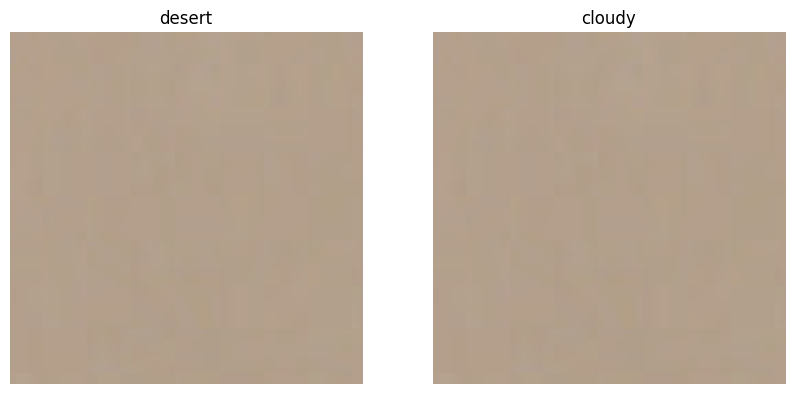

Test image 892 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


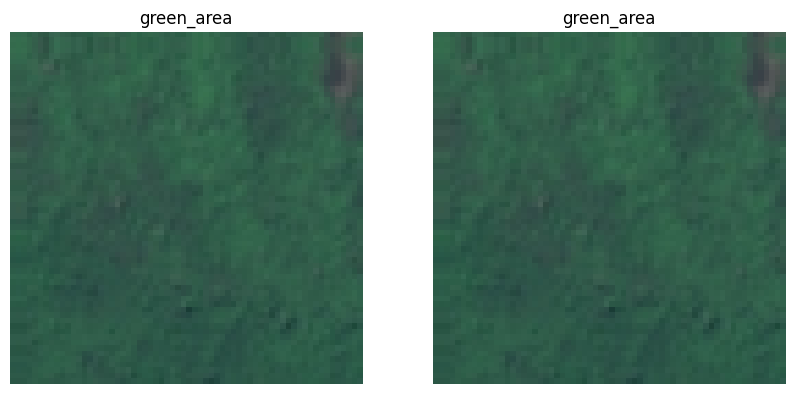

Test image 893 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


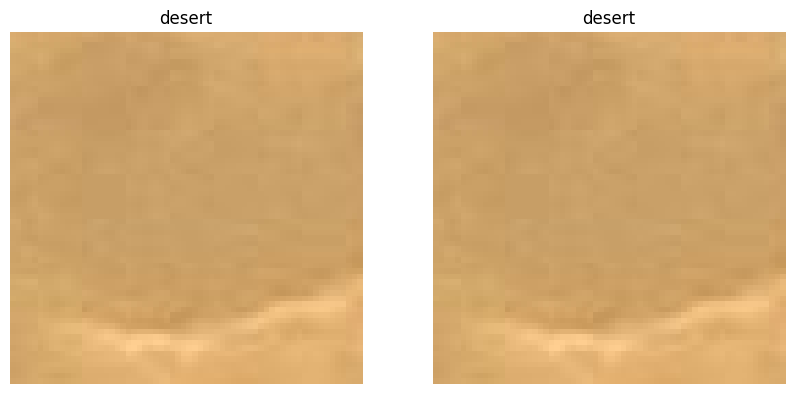

Test image 894 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


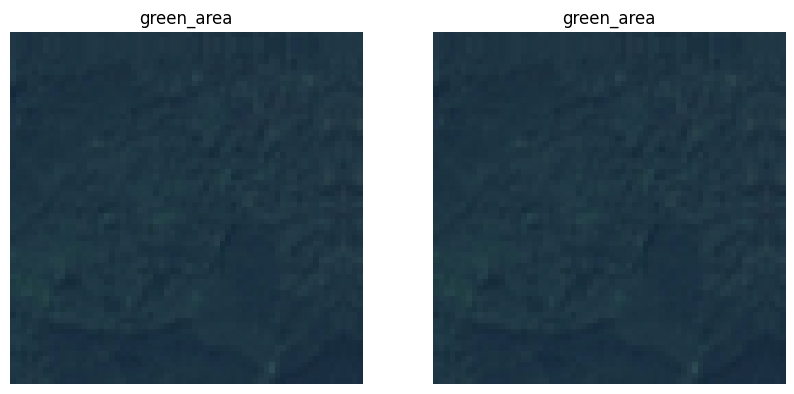

Test image 895 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


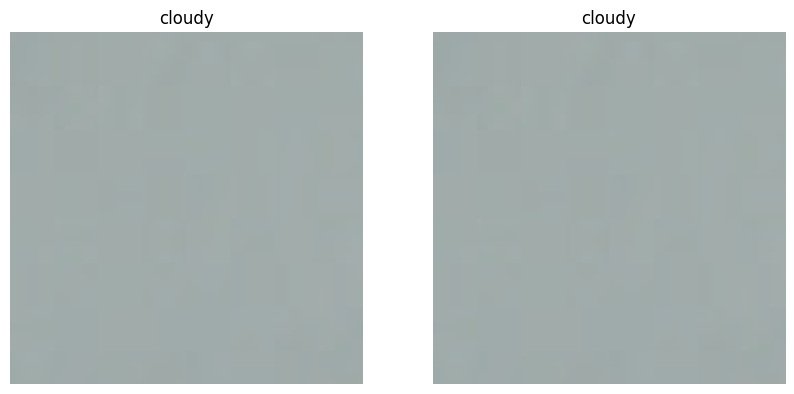

Test image 896 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


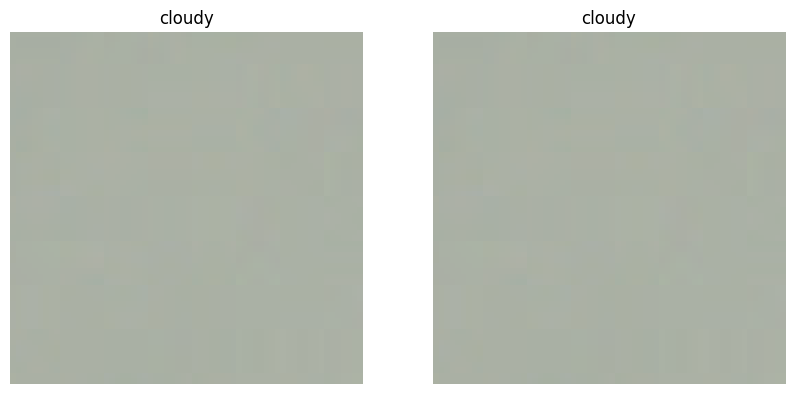

Test image 897 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


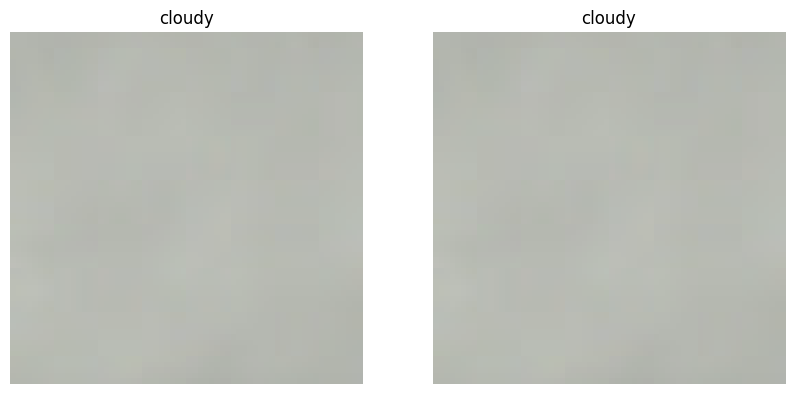

Test image 898 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


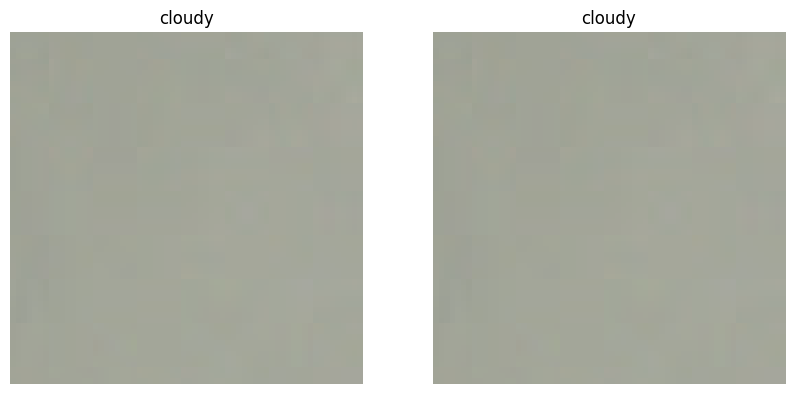

Test image 899 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


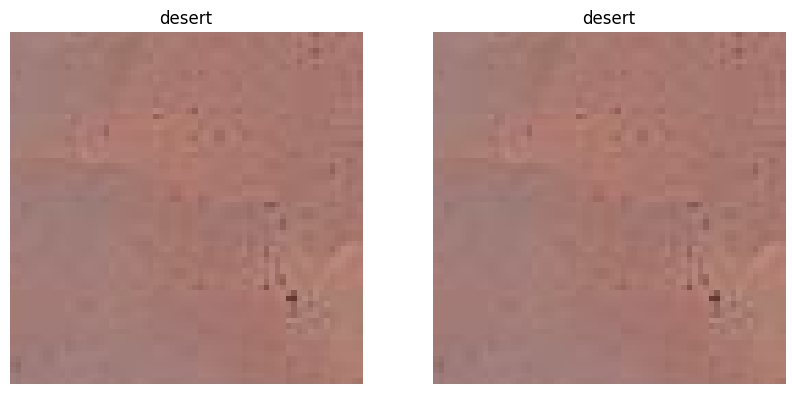

Test image 900 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


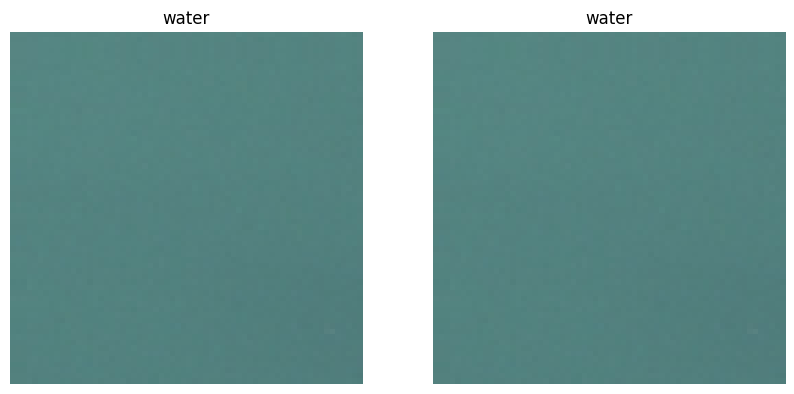

Test image 901 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


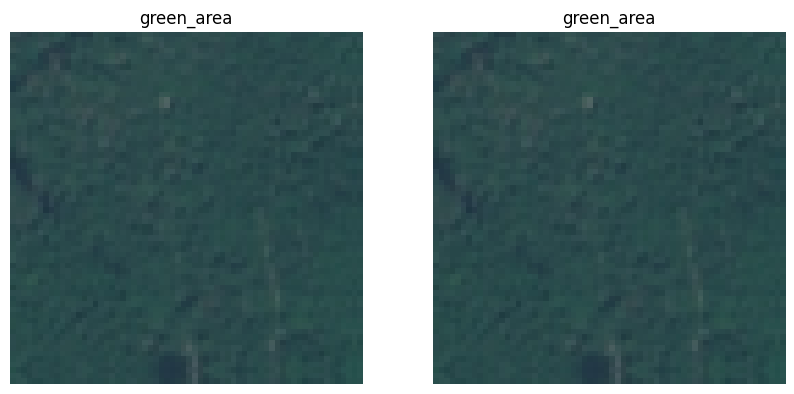

Test image 902 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


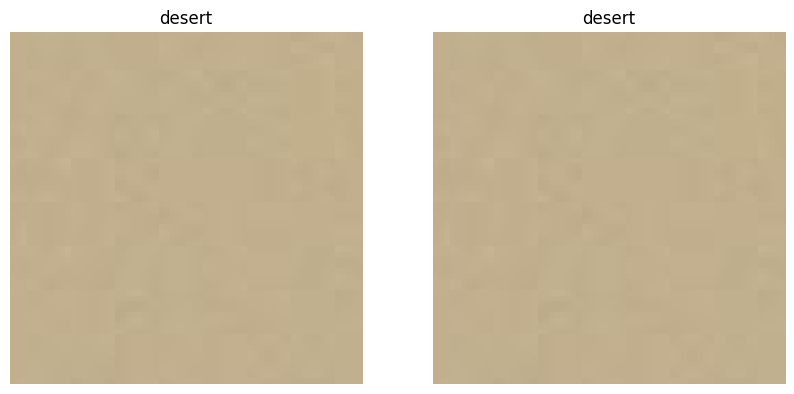

Test image 903 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


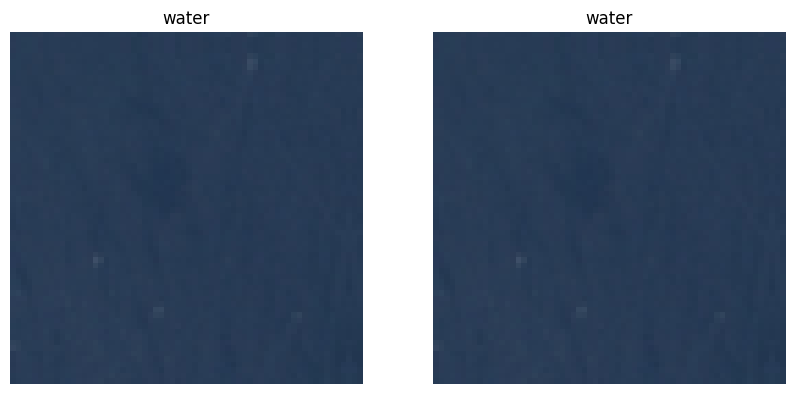

Test image 904 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


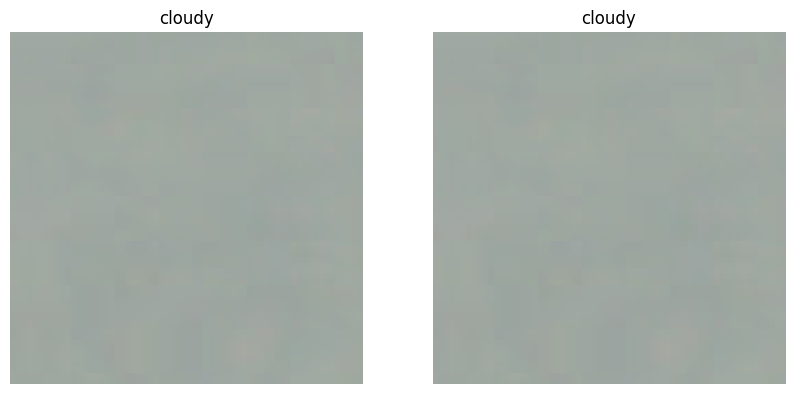

Test image 905 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


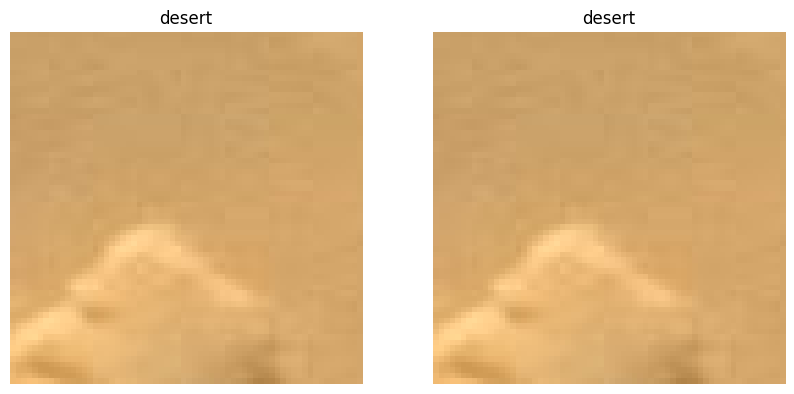

Test image 906 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


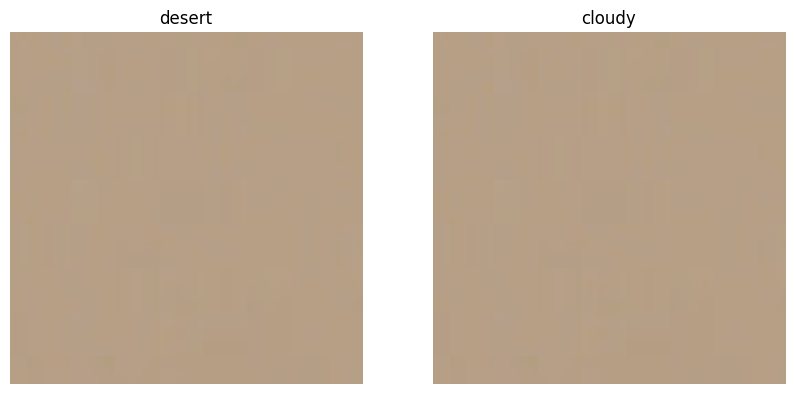

Test image 907 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


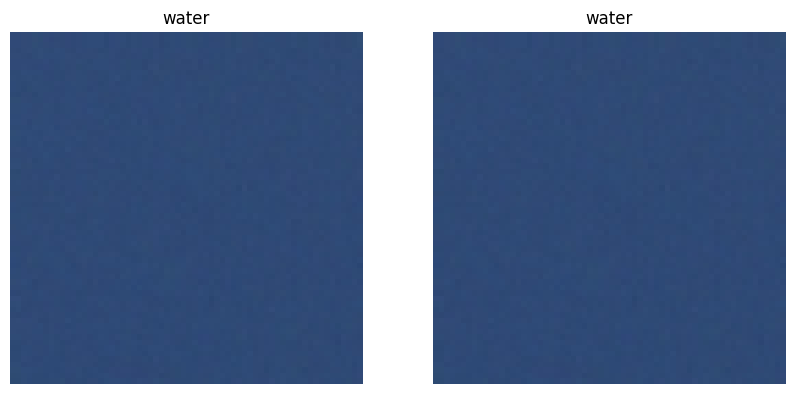

Test image 908 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


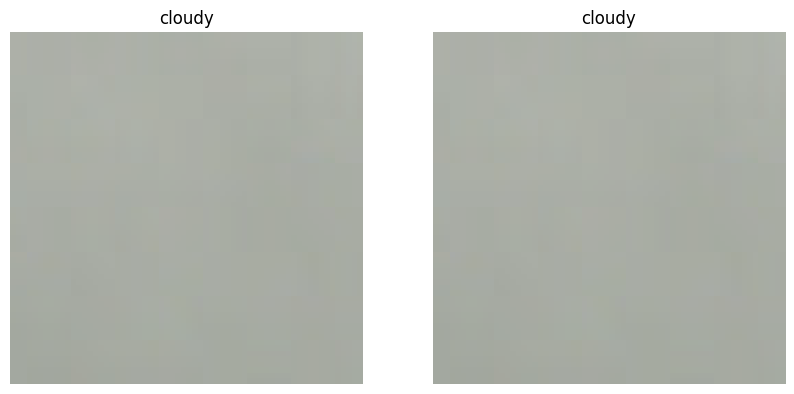

Test image 909 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


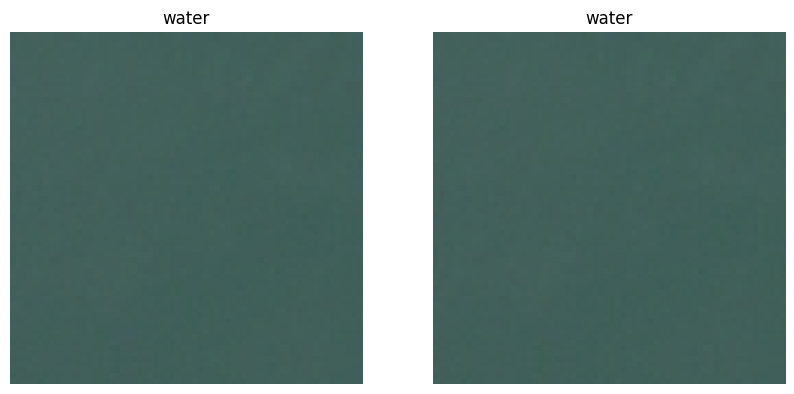

Test image 910 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


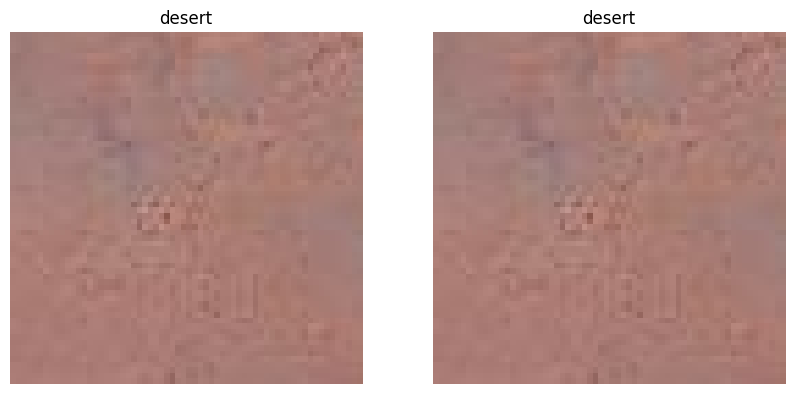

Test image 911 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


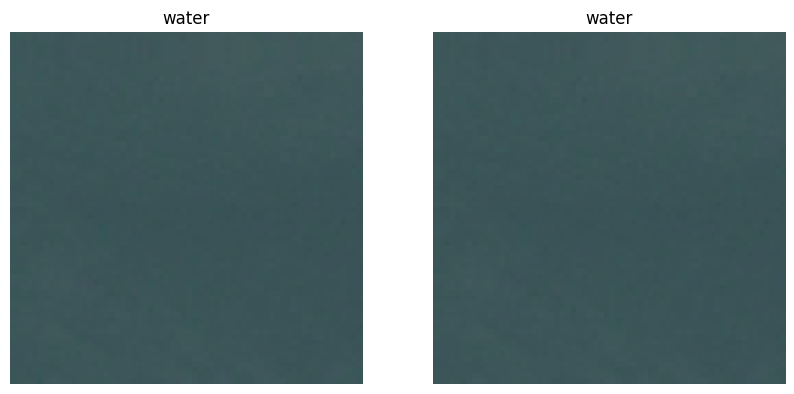

Test image 912 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


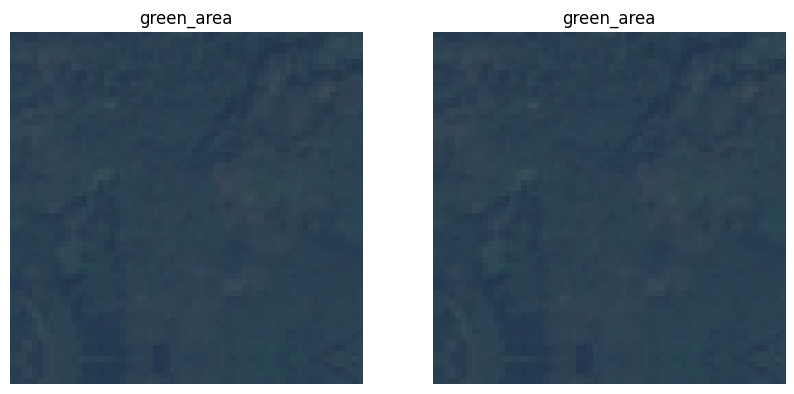

Test image 913 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


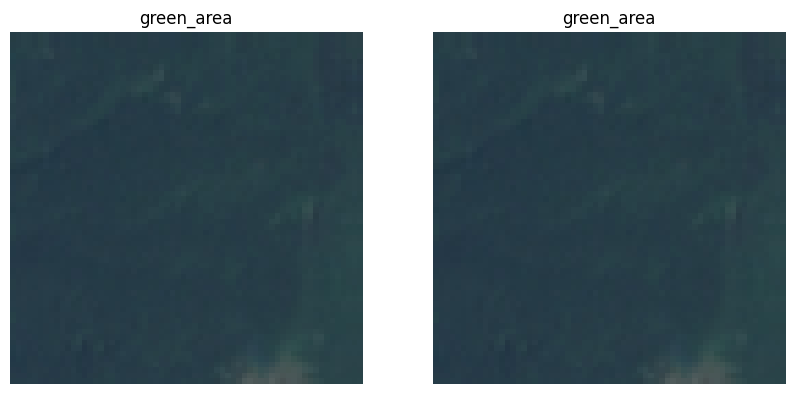

Test image 914 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


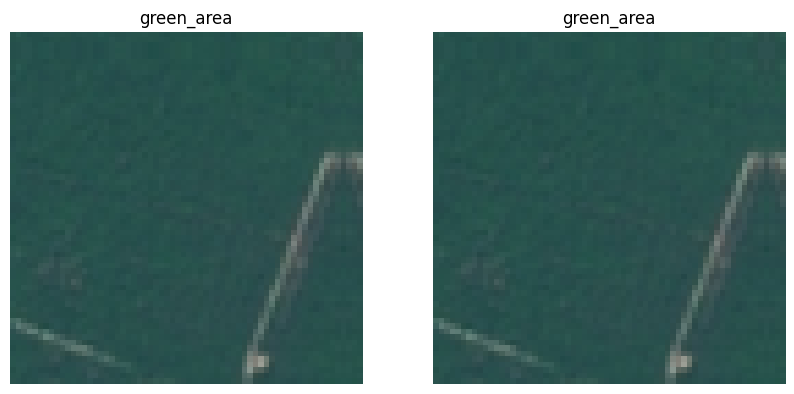

Test image 915 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


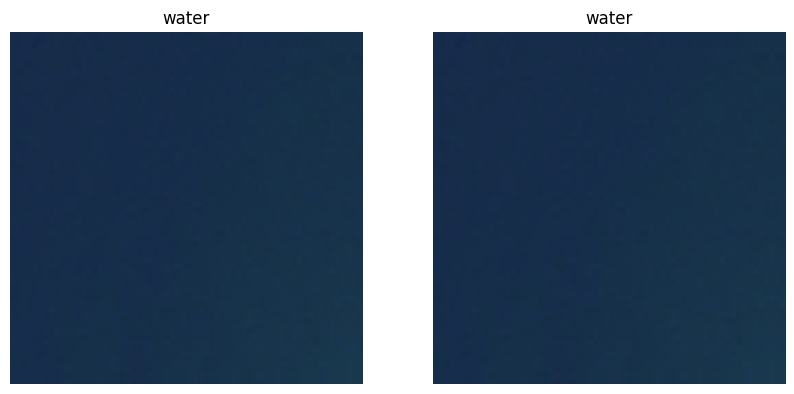

Test image 916 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


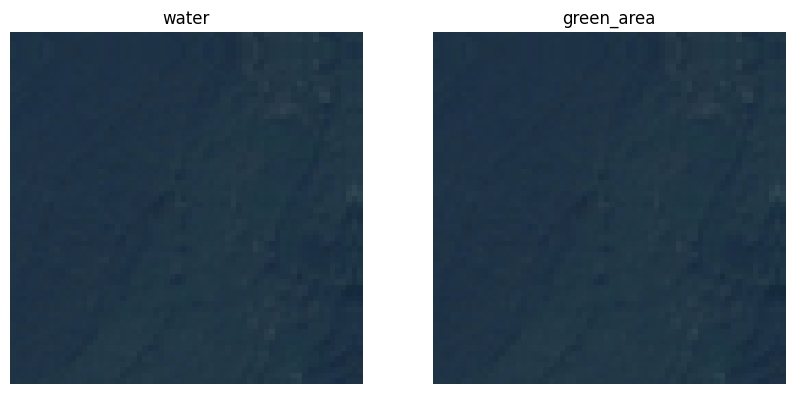

Test image 917 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


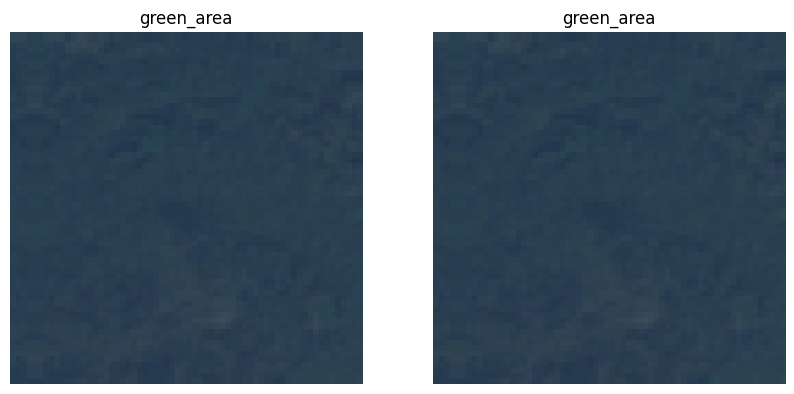

Test image 918 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


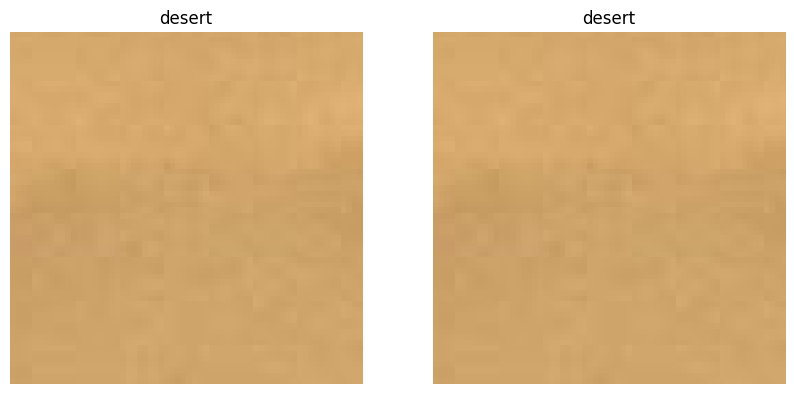

Test image 919 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


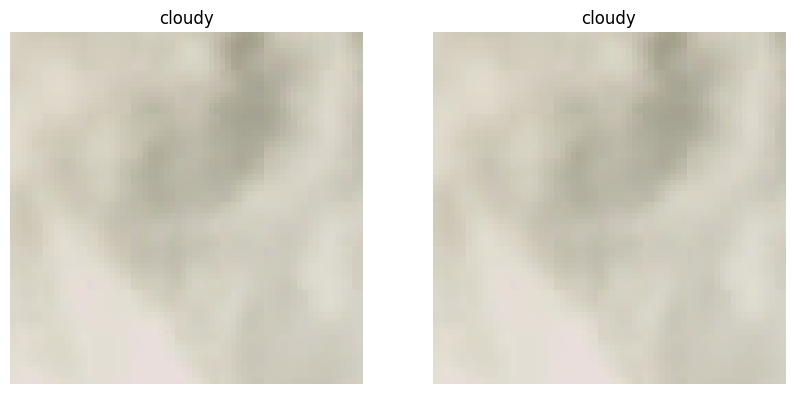

Test image 920 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


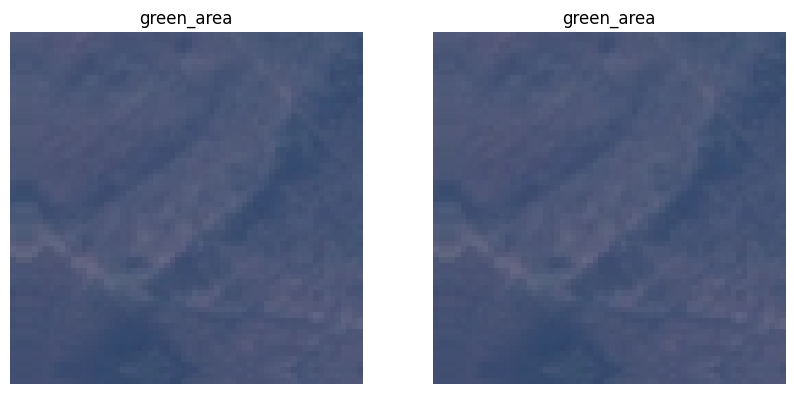

Test image 921 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


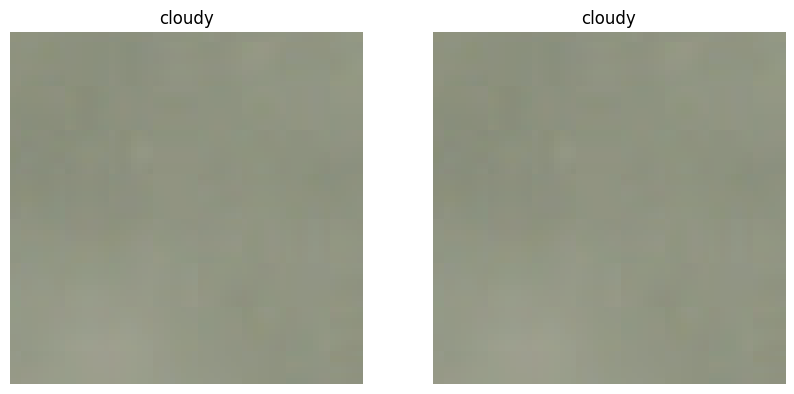

Test image 922 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


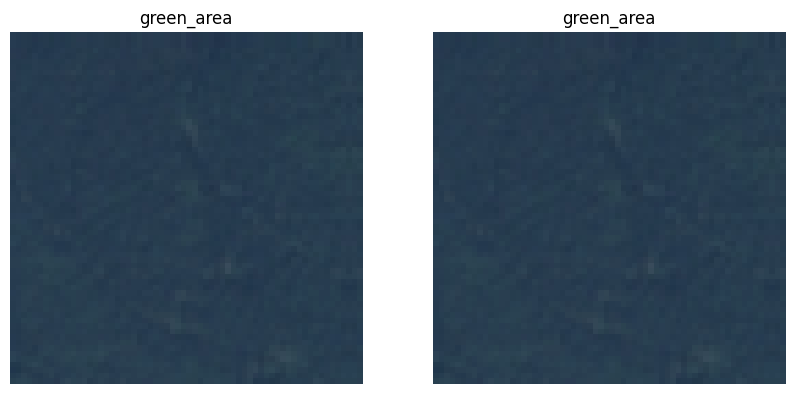

Test image 923 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


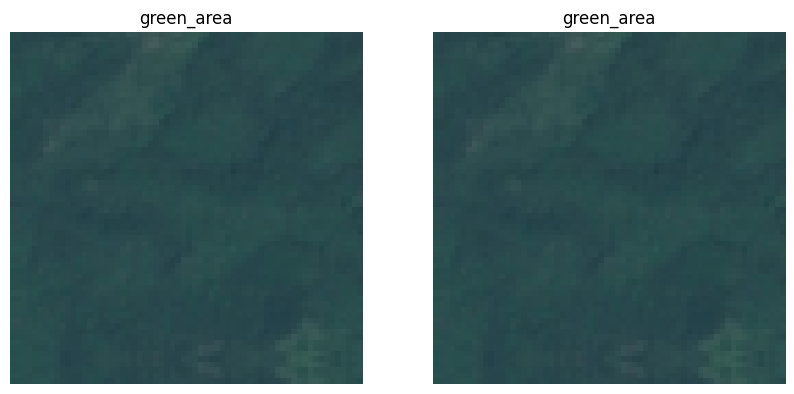

Test image 924 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


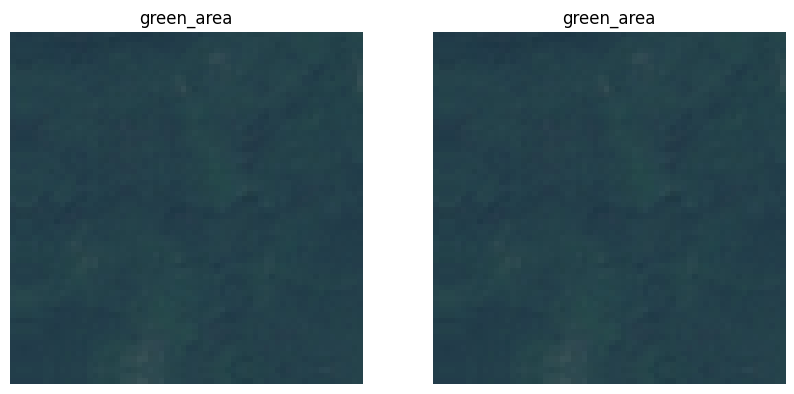

Test image 925 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


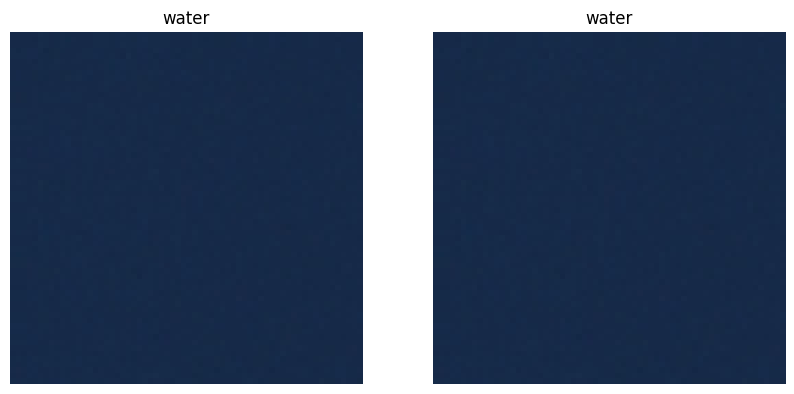

Test image 926 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


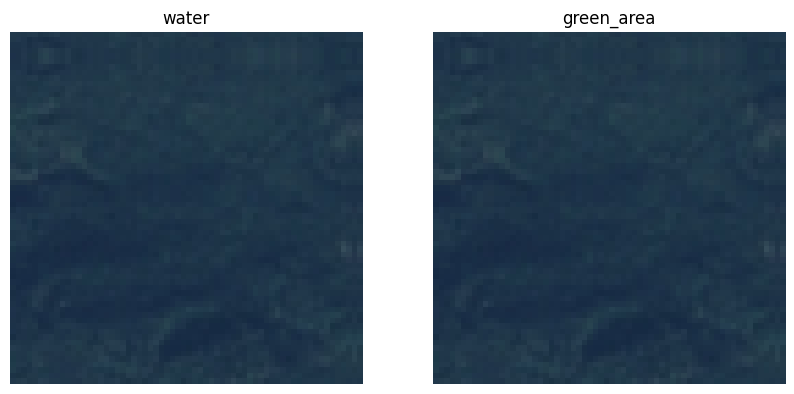

Test image 927 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


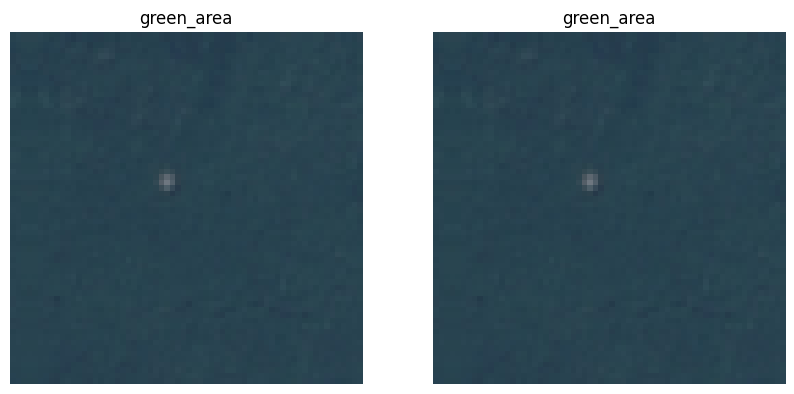

Test image 928 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


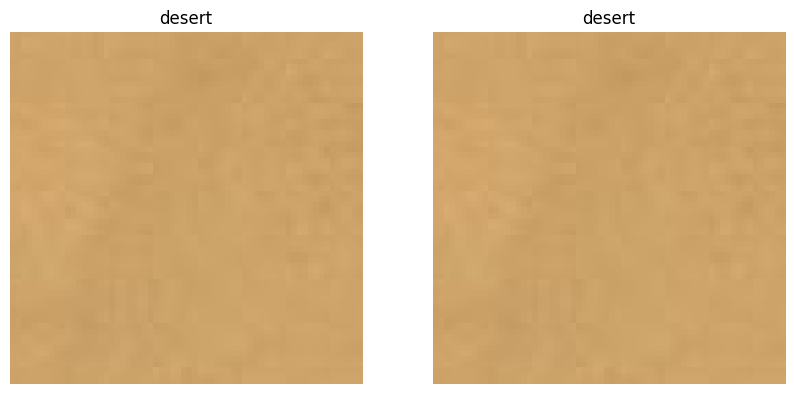

Test image 929 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


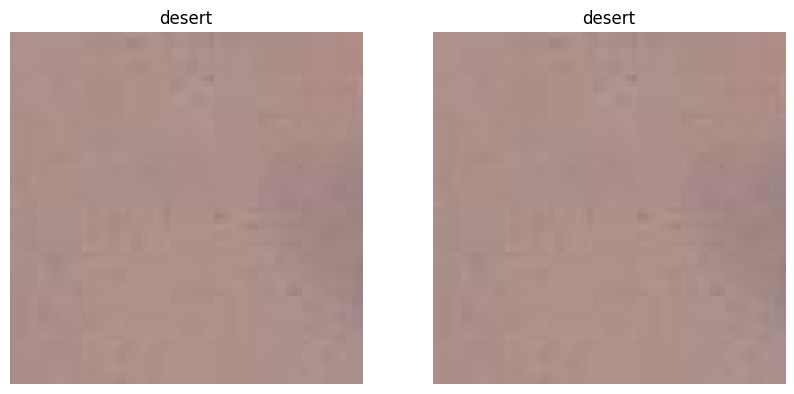

Test image 930 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


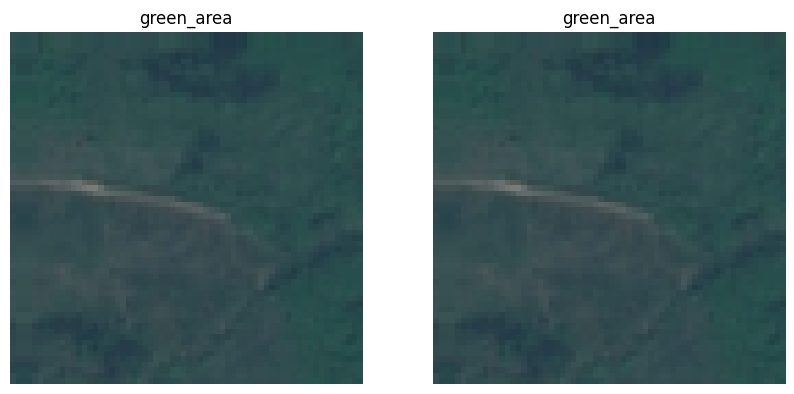

Test image 931 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


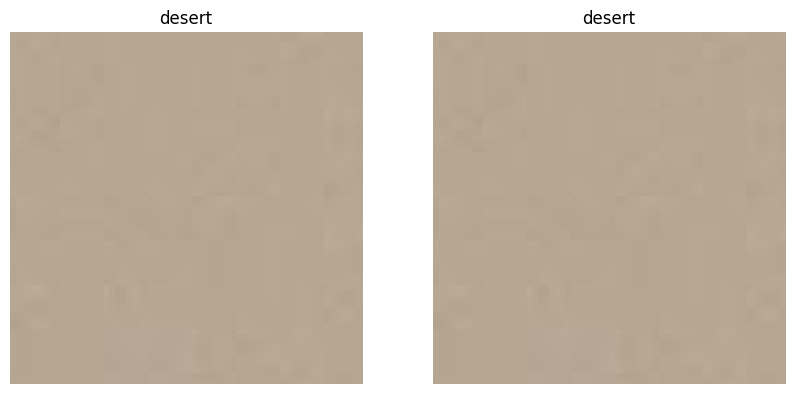

Test image 932 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


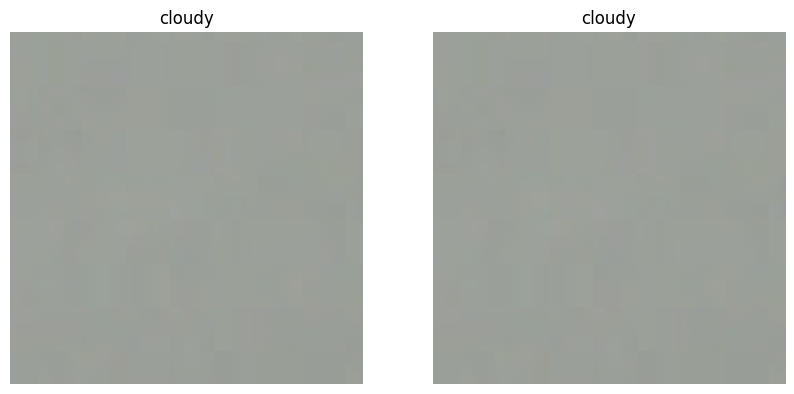

Test image 933 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


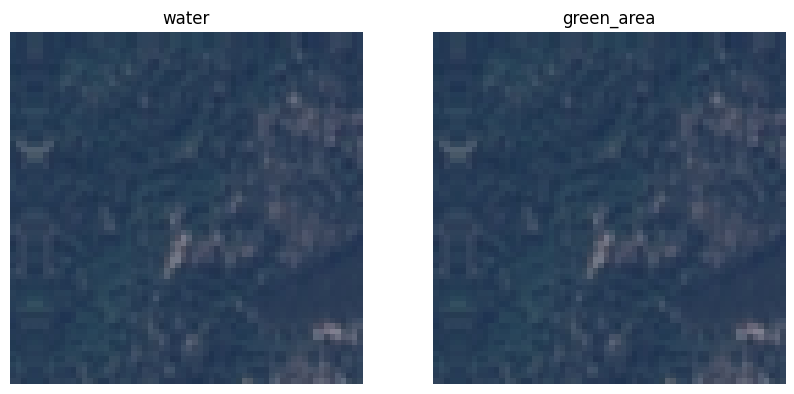

Test image 934 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


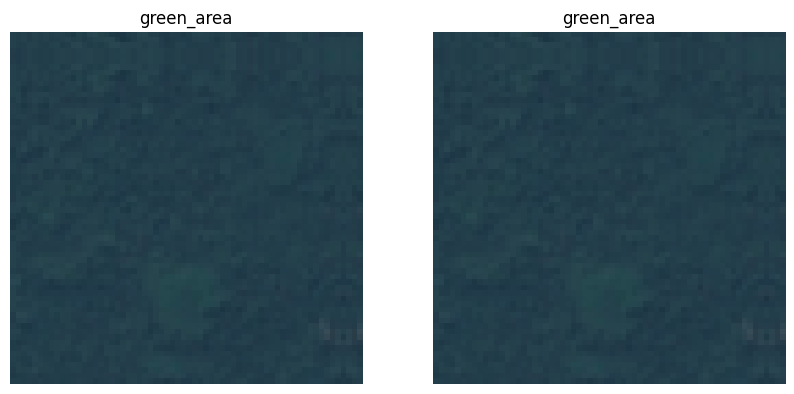

Test image 935 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


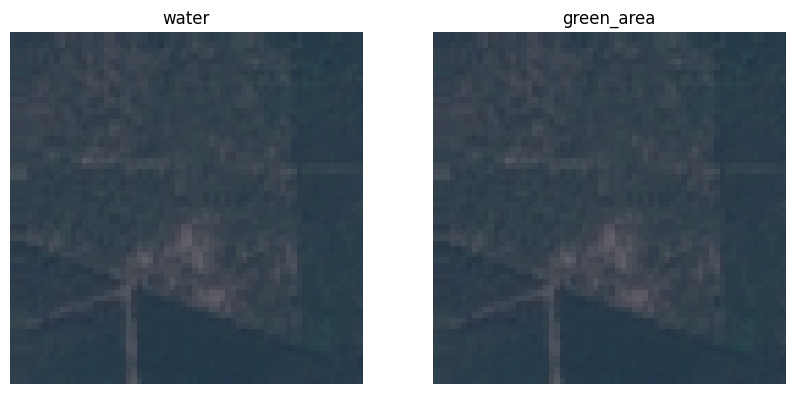

Test image 936 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


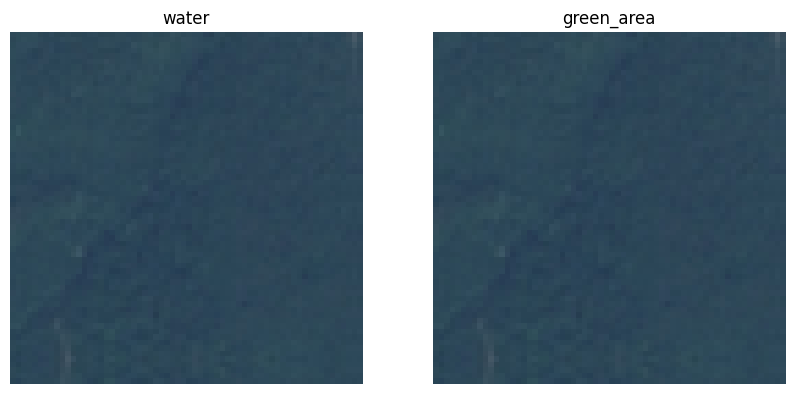

Test image 937 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


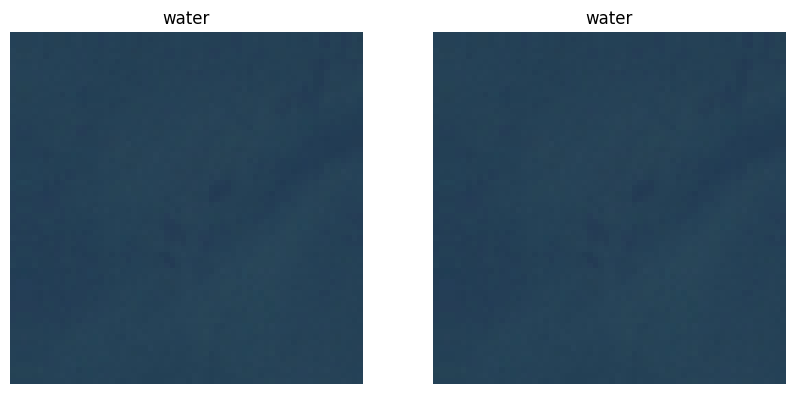

Test image 938 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


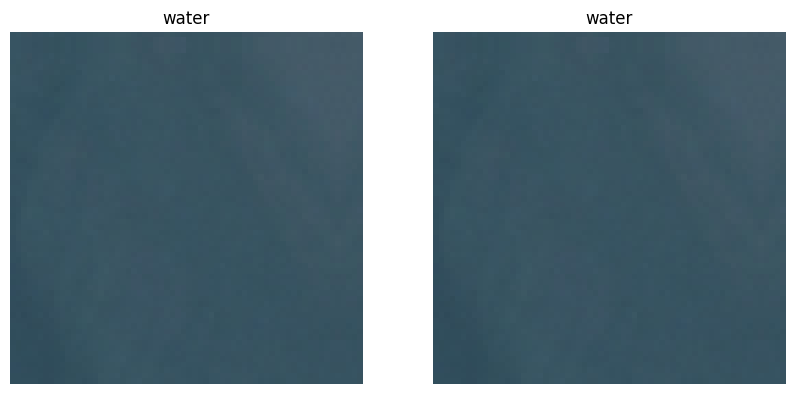

Test image 939 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


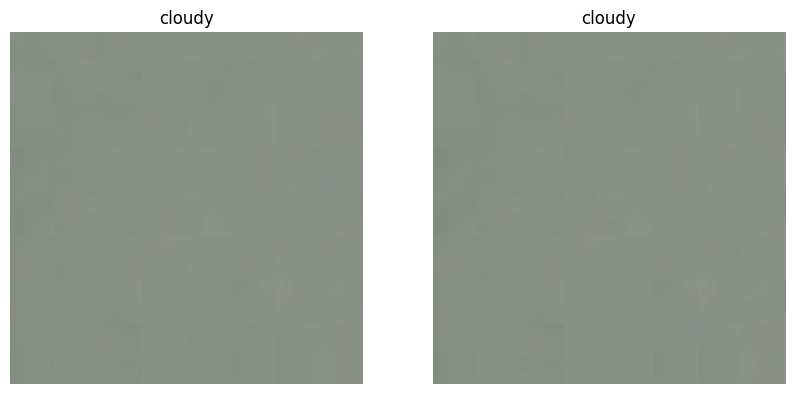

Test image 940 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


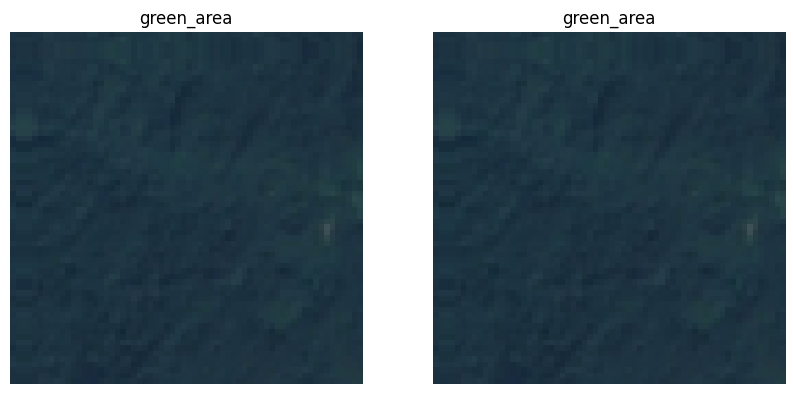

Test image 941 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


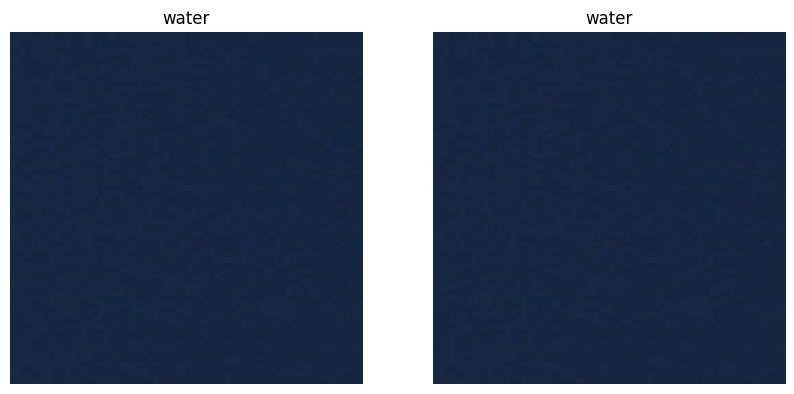

Test image 942 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


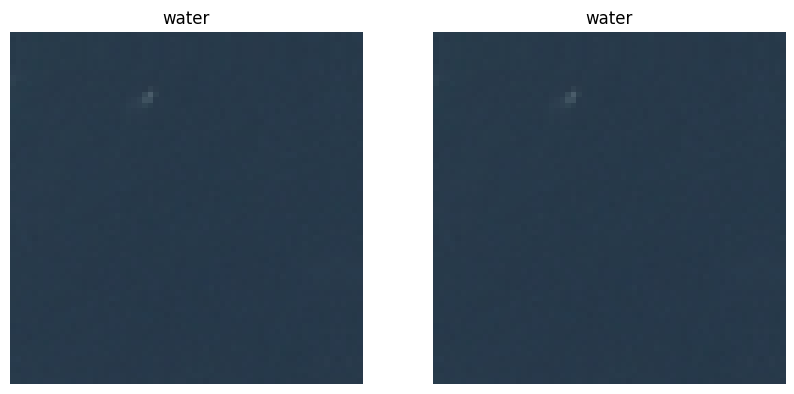

Test image 943 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


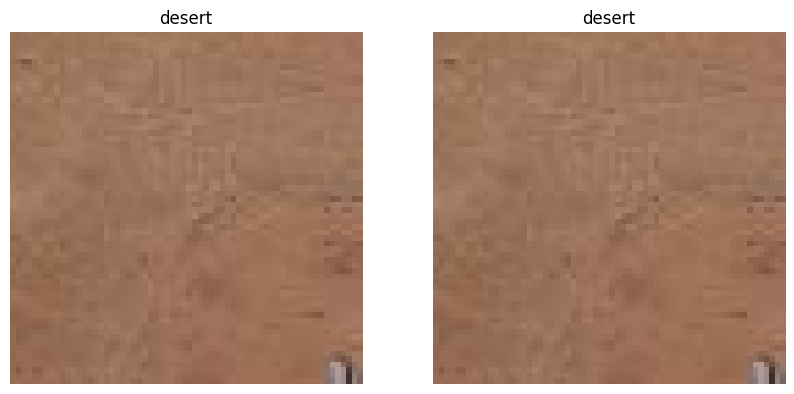

Test image 944 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


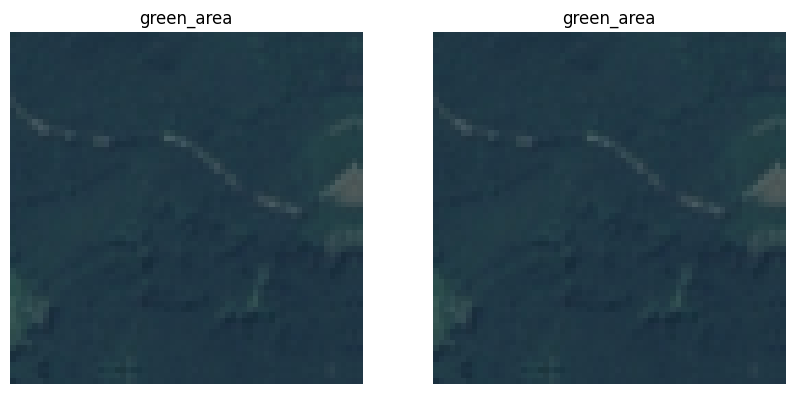

Test image 945 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


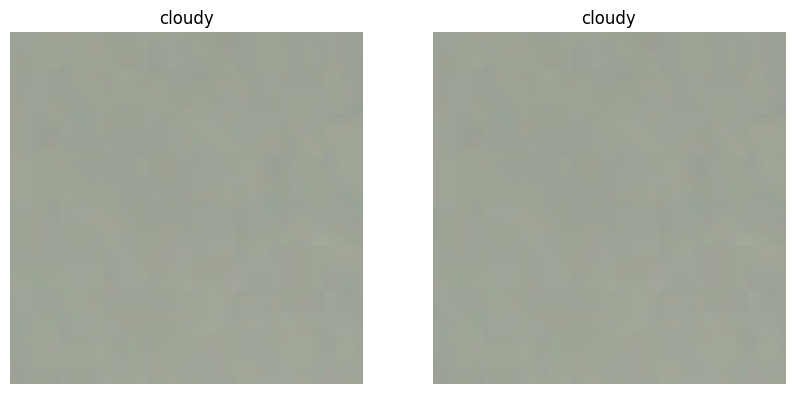

Test image 946 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


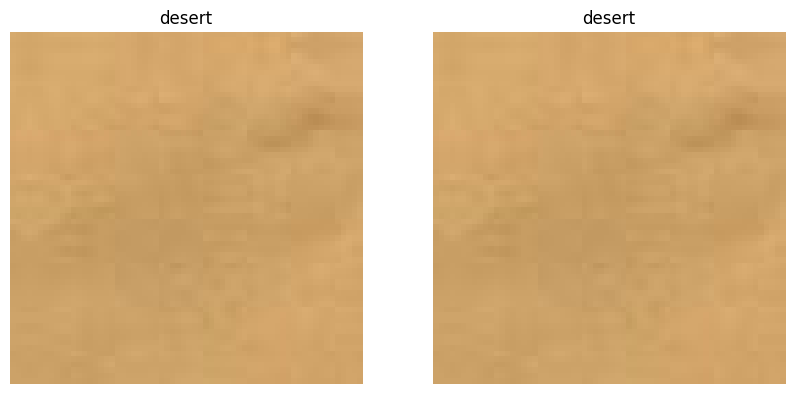

Test image 947 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


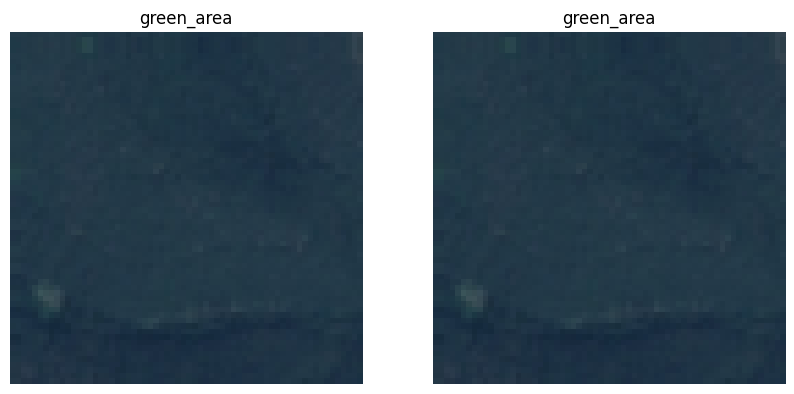

Test image 948 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


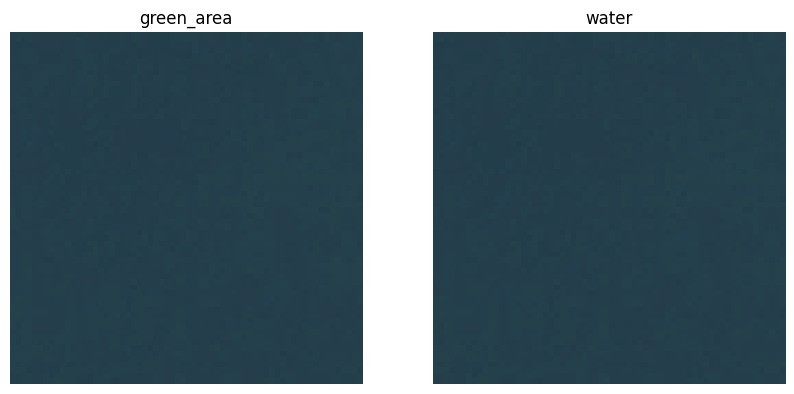

Test image 949 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


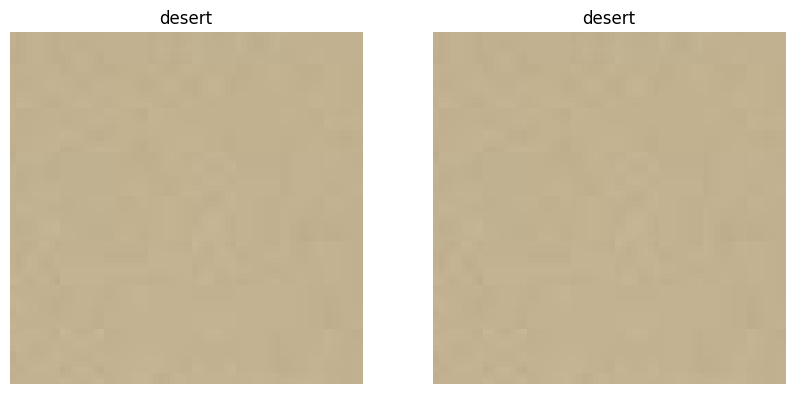

Test image 950 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


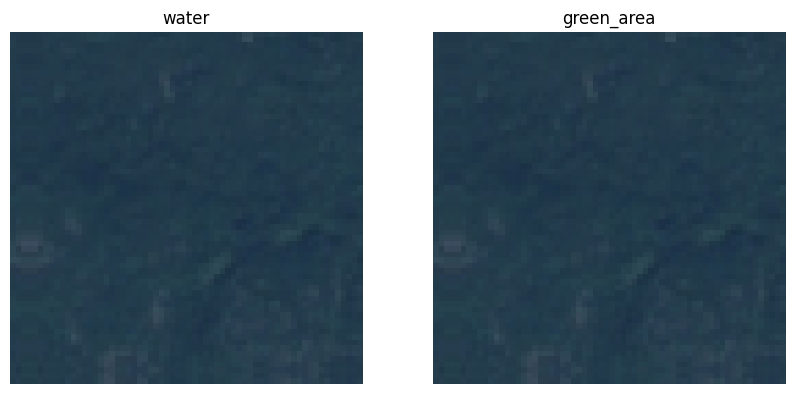

Test image 951 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


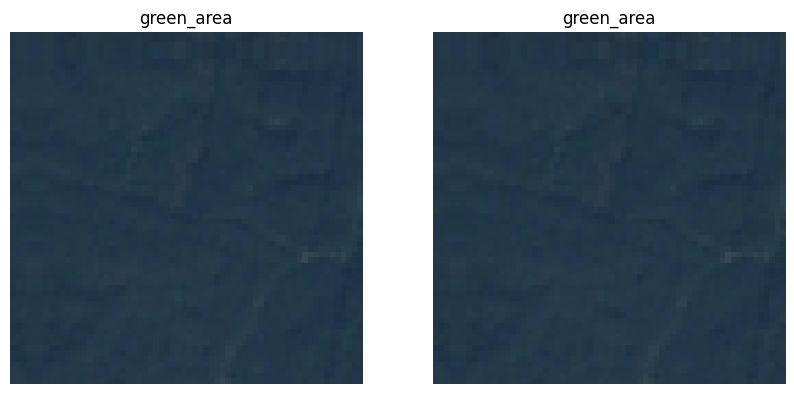

Test image 952 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


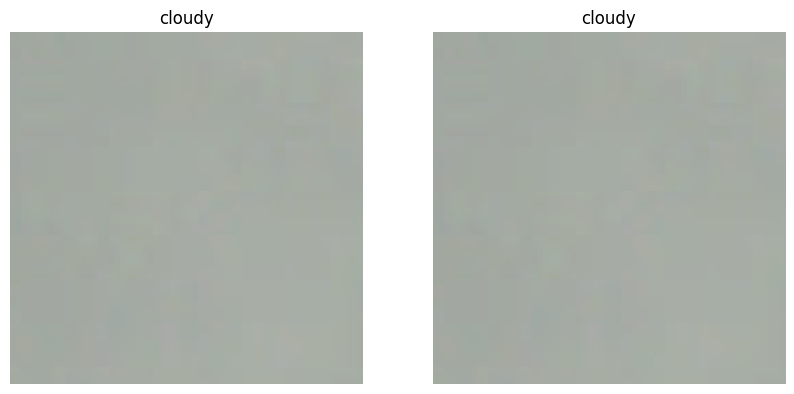

Test image 953 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


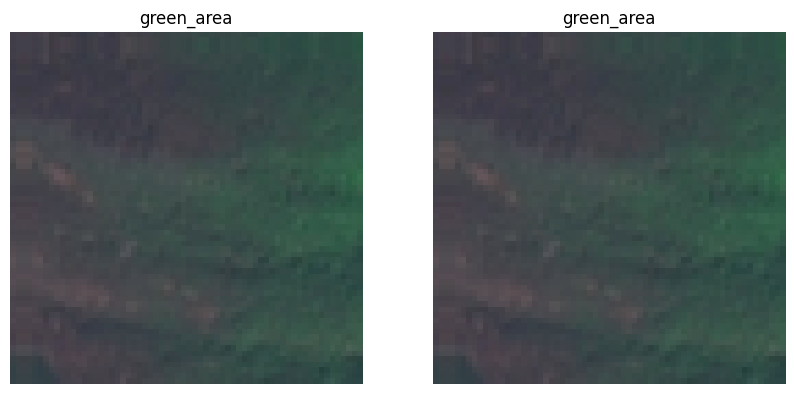

Test image 954 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


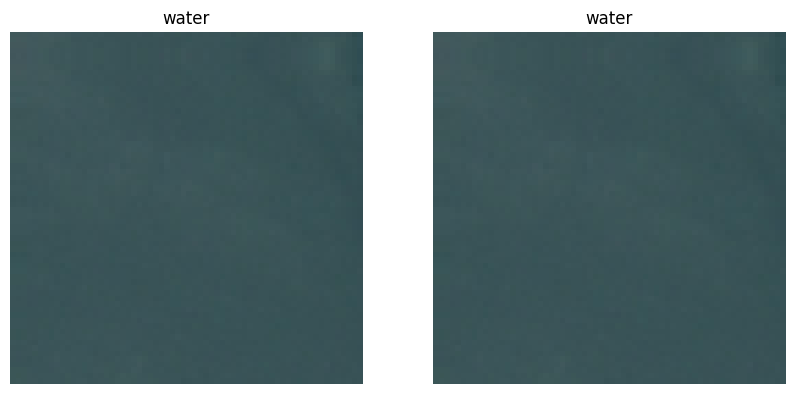

Test image 955 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


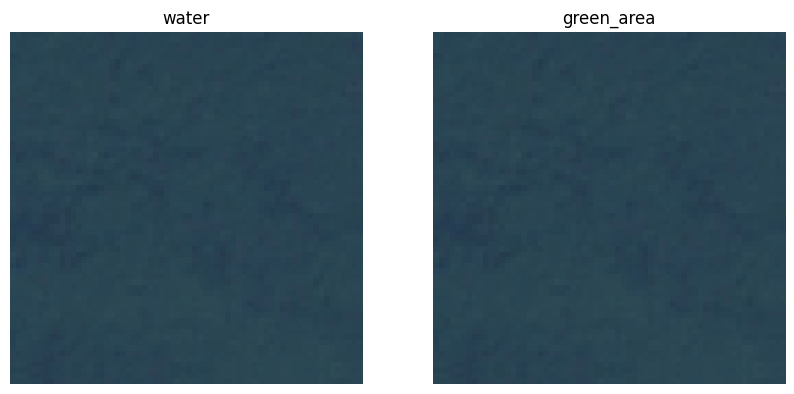

Test image 956 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


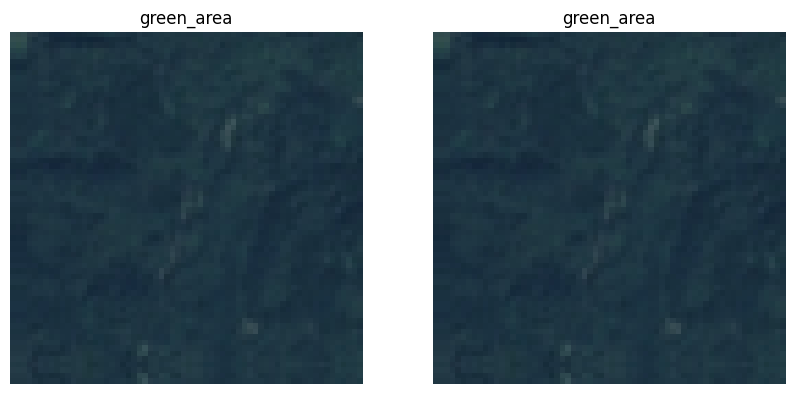

Test image 957 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


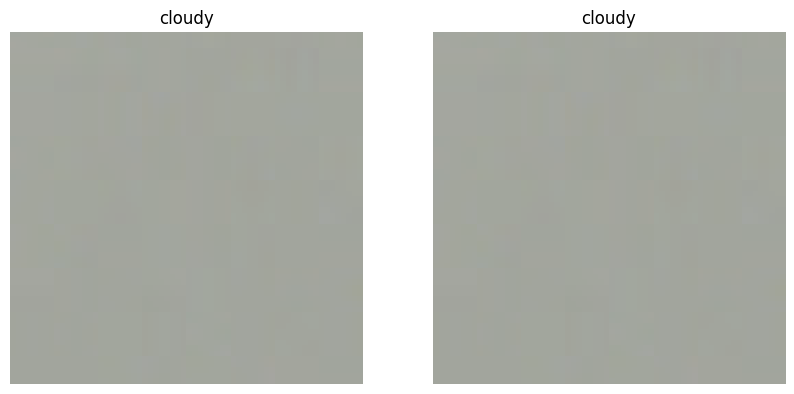

Test image 958 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


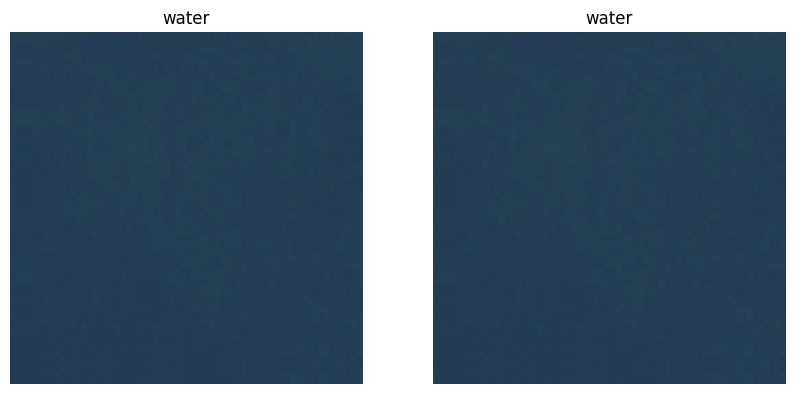

Test image 959 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


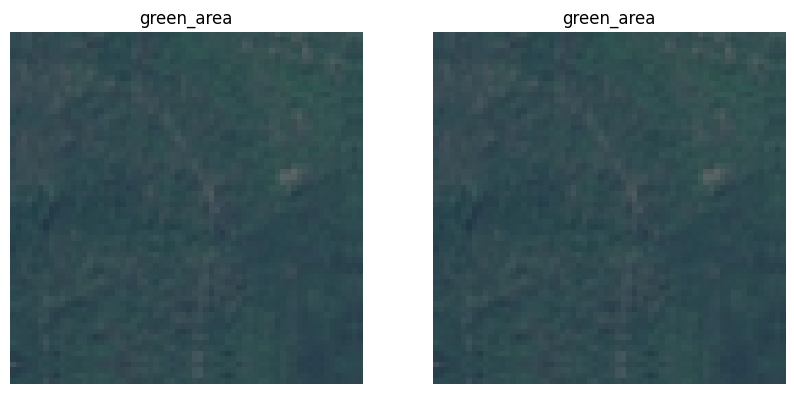

Test image 960 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


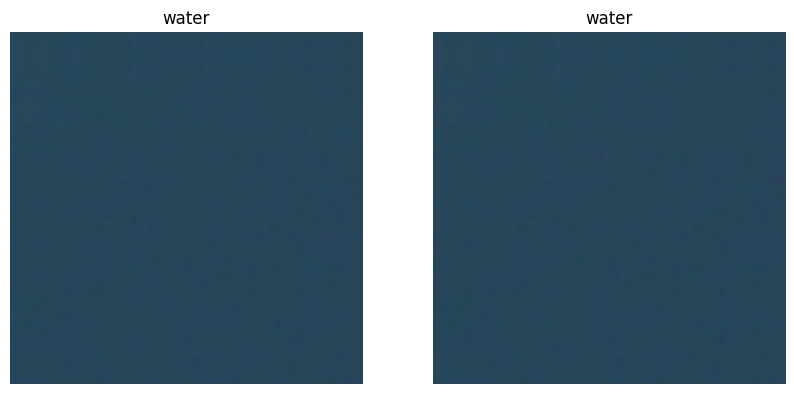

Test image 961 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


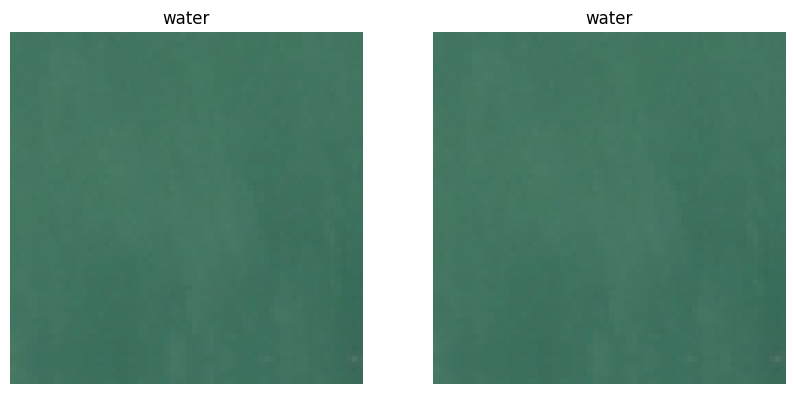

Test image 962 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


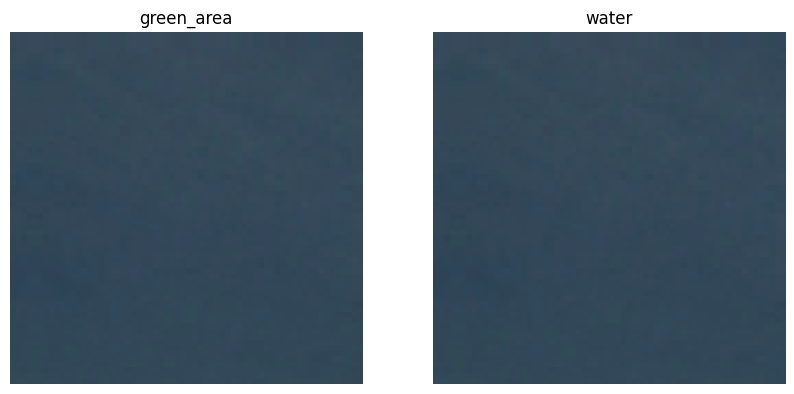

Test image 963 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


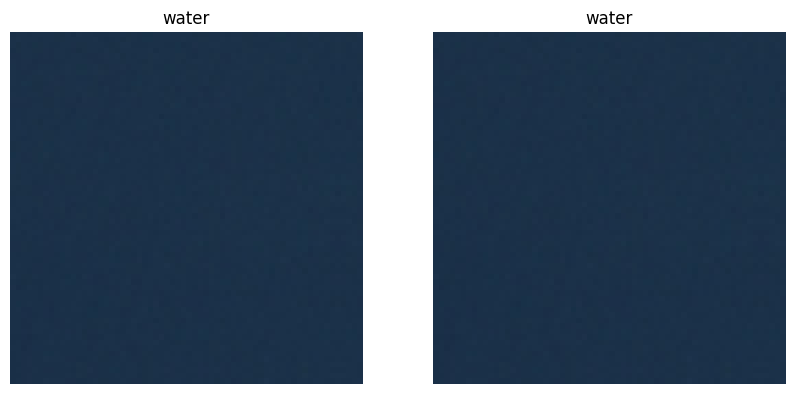

Test image 964 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


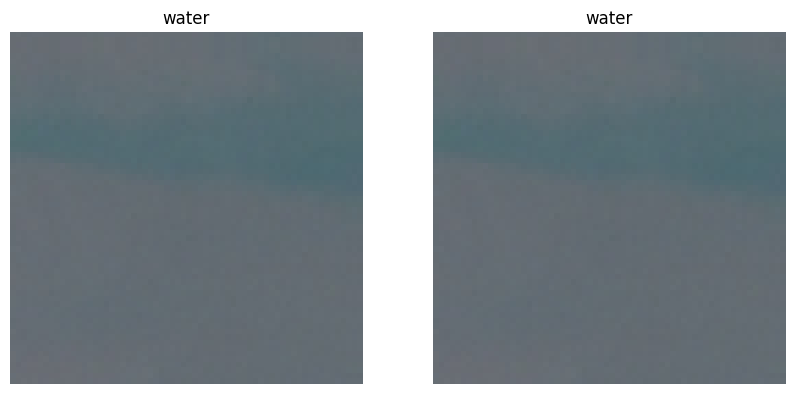

Test image 965 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


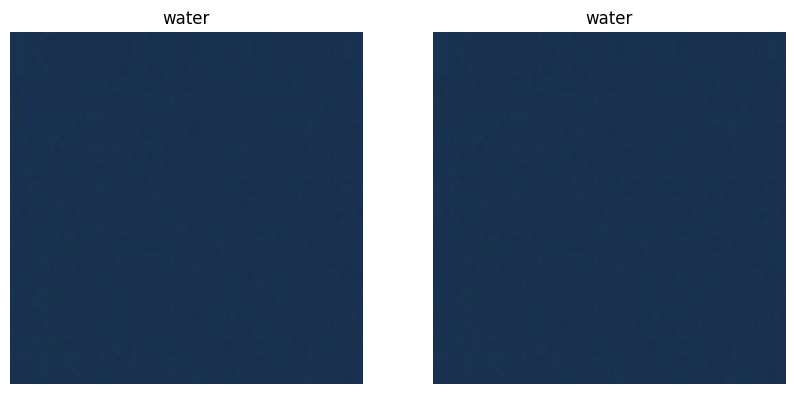

Test image 966 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


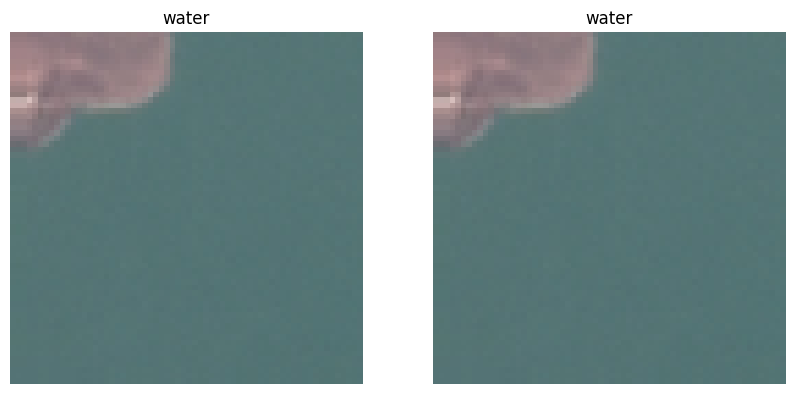

Test image 967 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


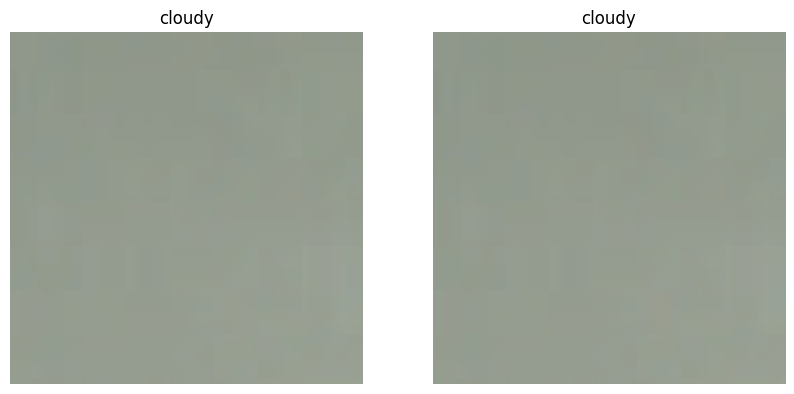

Test image 968 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


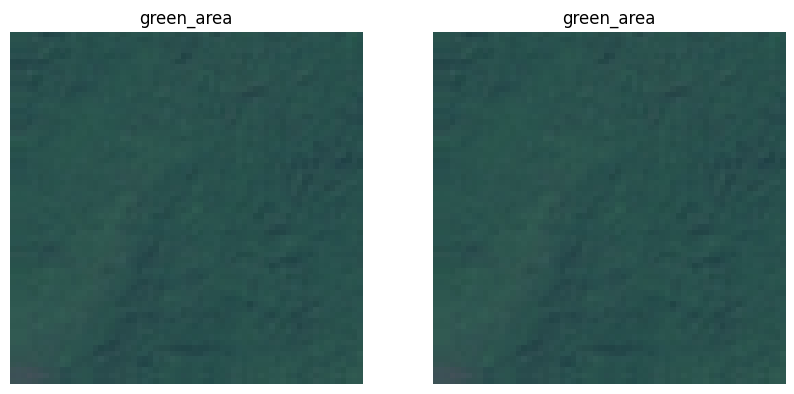

Test image 969 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


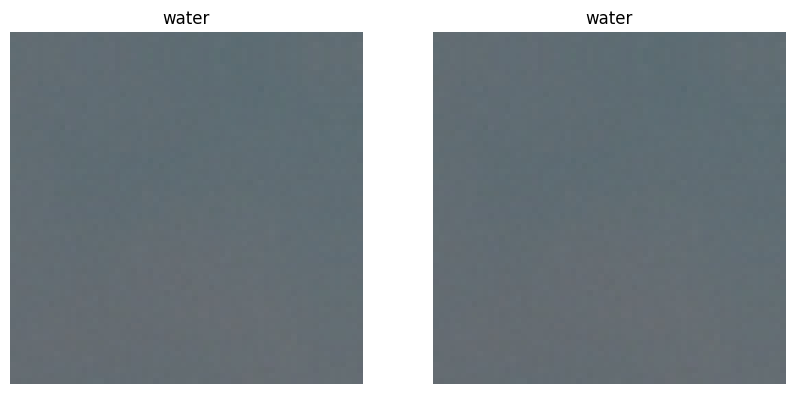

Test image 970 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


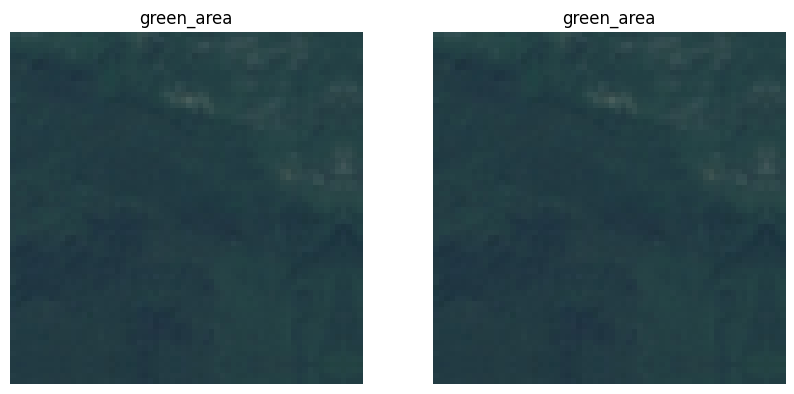

Test image 971 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


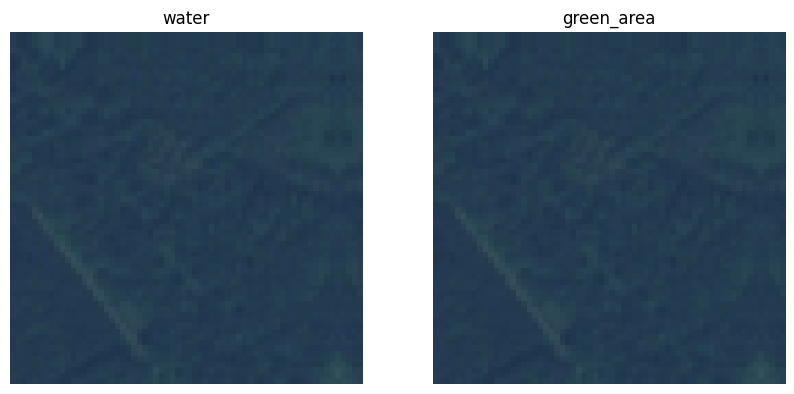

Test image 972 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


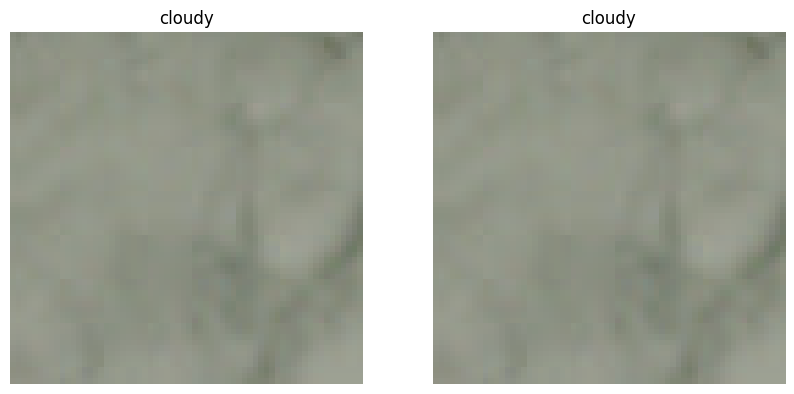

Test image 973 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


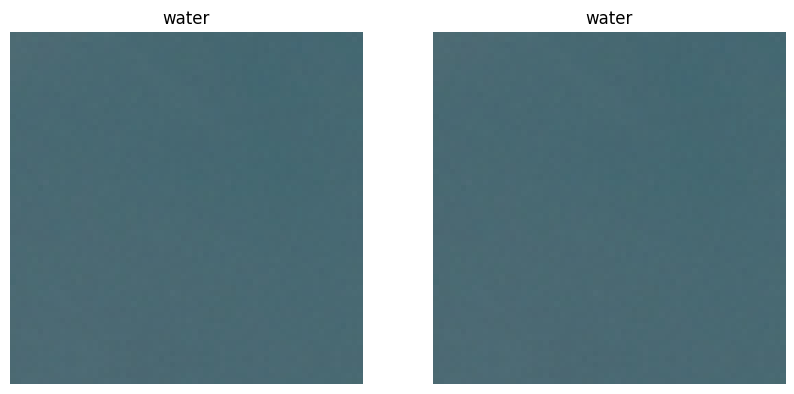

Test image 974 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


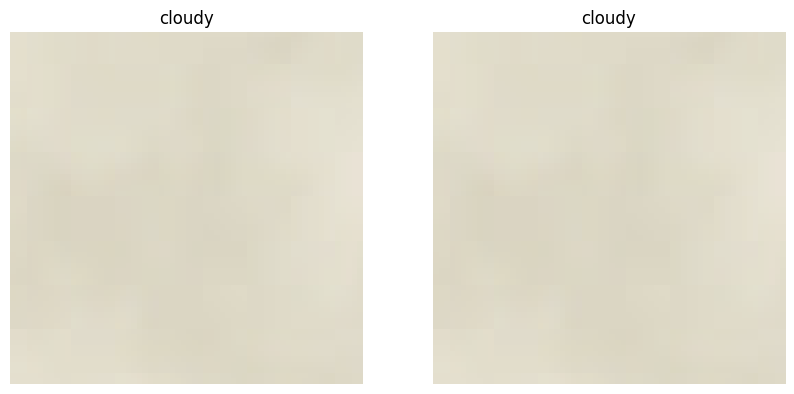

Test image 975 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


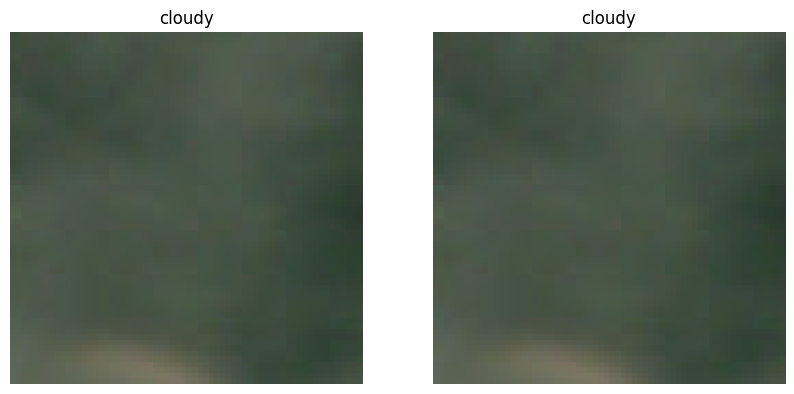

Test image 976 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


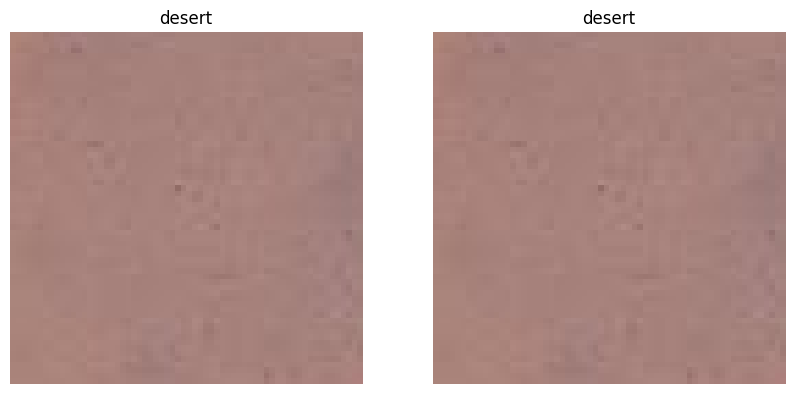

Test image 977 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


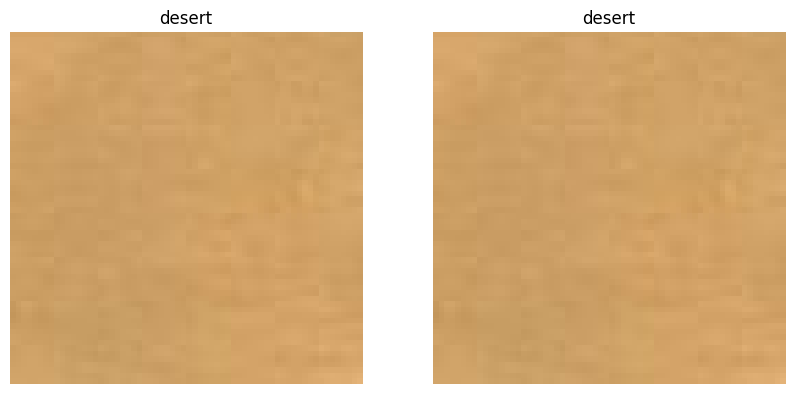

Test image 978 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


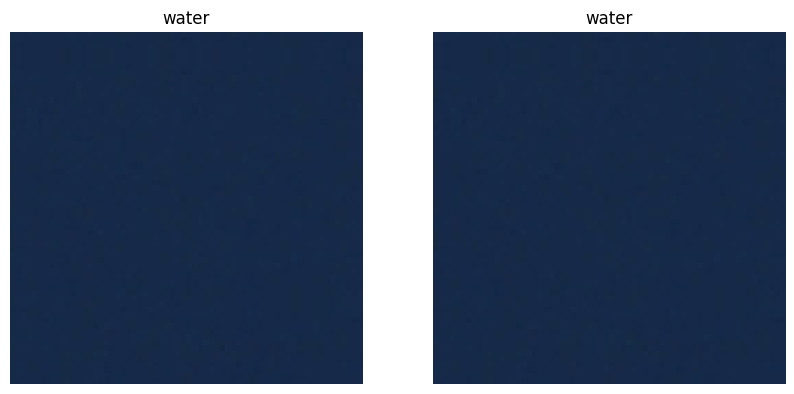

Test image 979 , Result: Wrong Predicted: cloudy , Real Class: desert
Predicted Class Image vs Real Class Image:


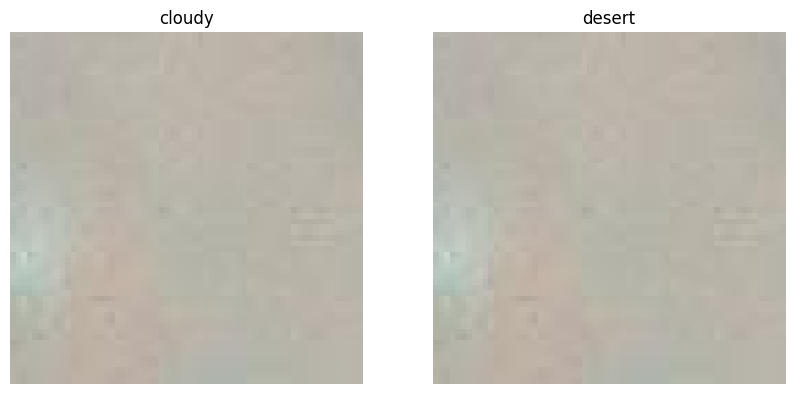

Test image 980 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


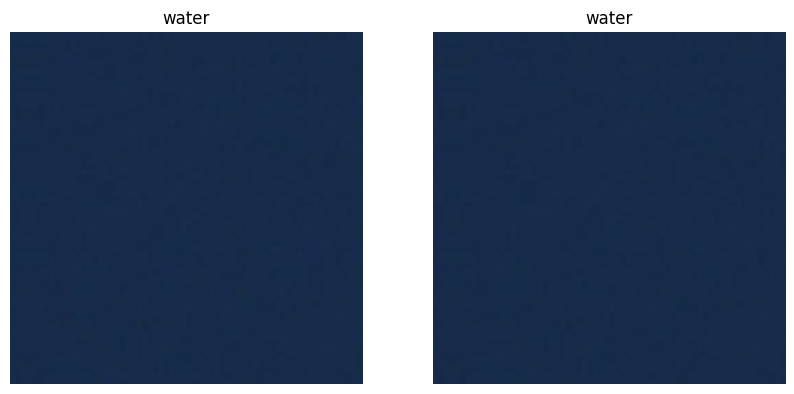

Test image 981 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


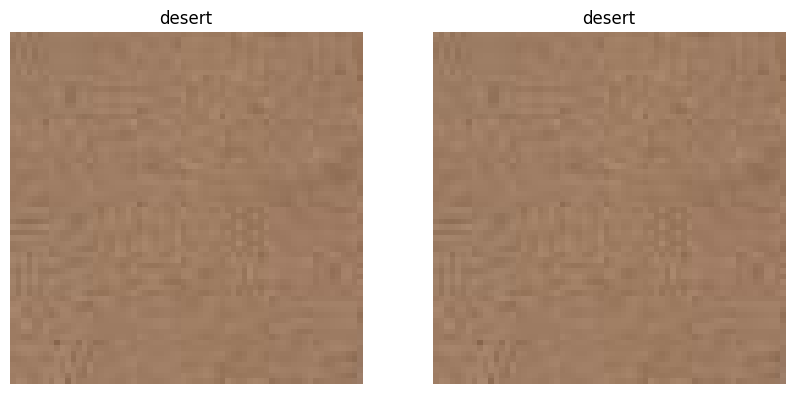

Test image 982 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


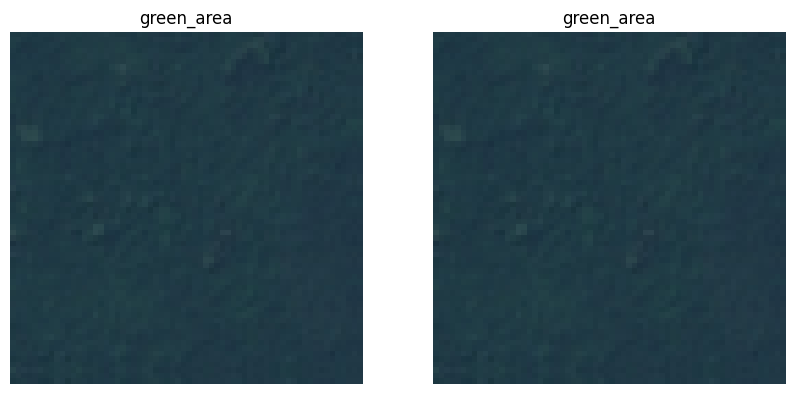

Test image 983 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


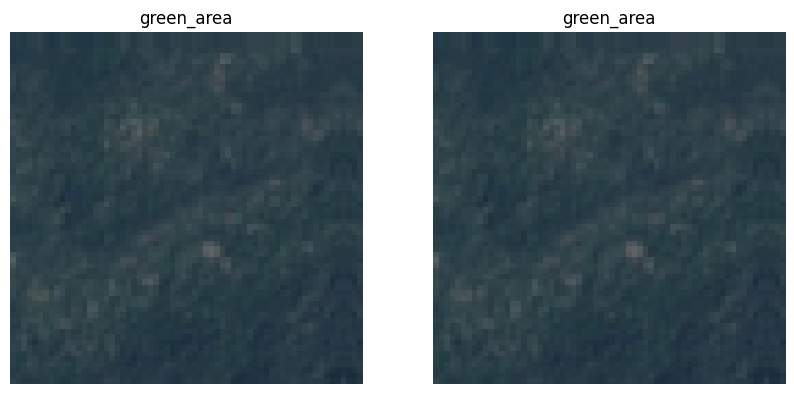

Test image 984 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


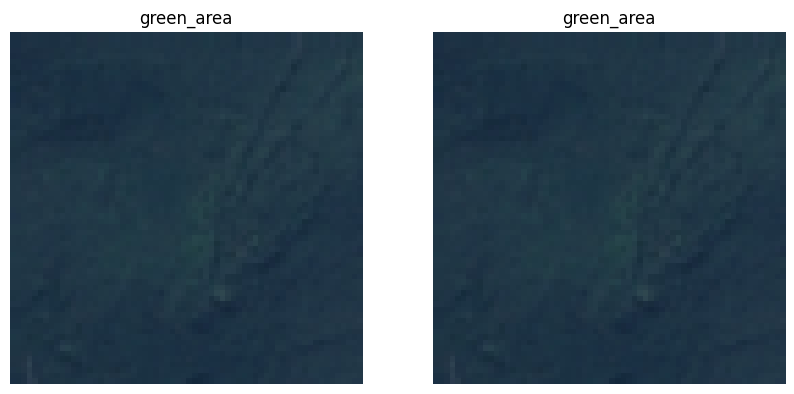

Test image 985 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


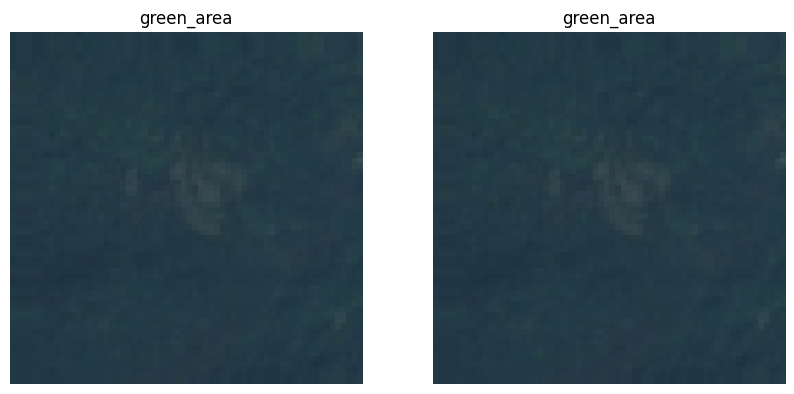

Test image 986 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


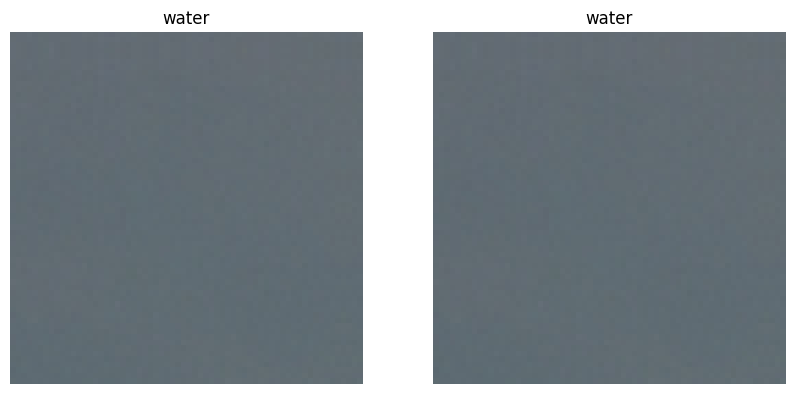

Test image 987 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


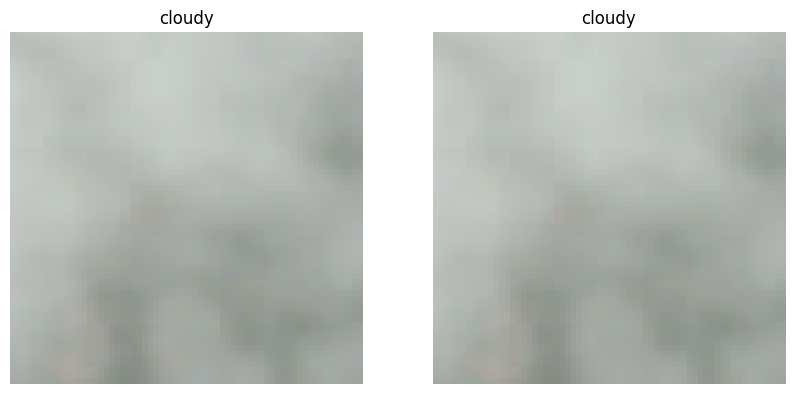

Test image 988 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


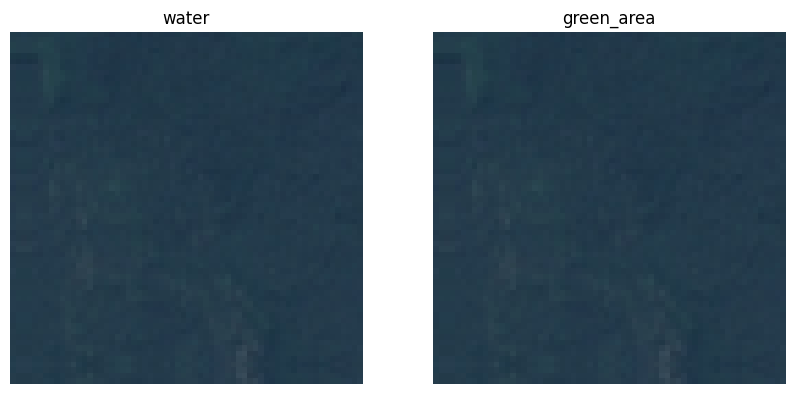

Test image 989 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


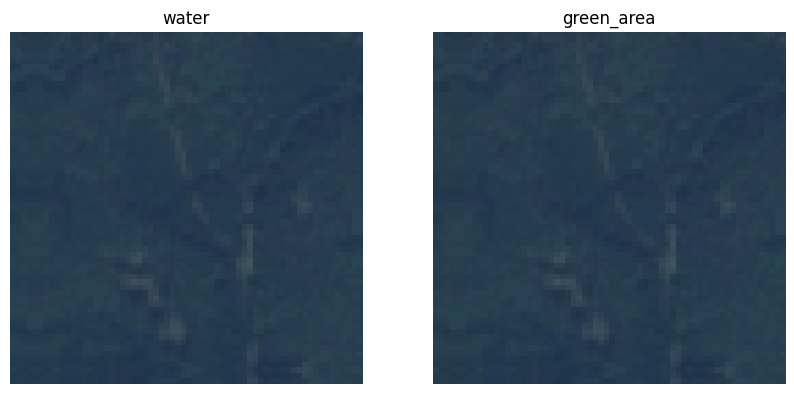

Test image 990 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


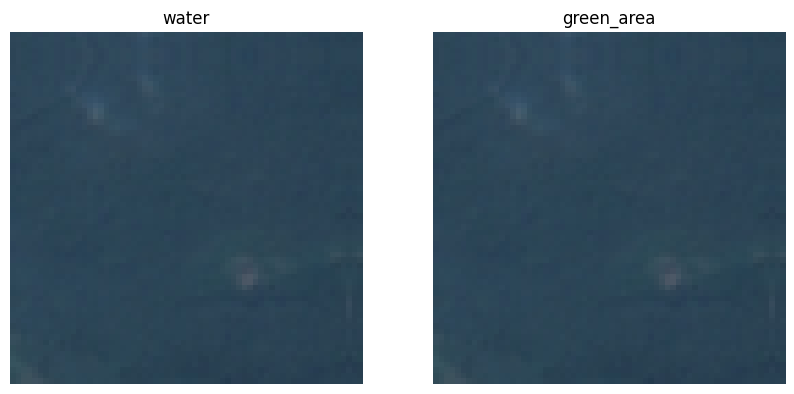

Test image 991 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


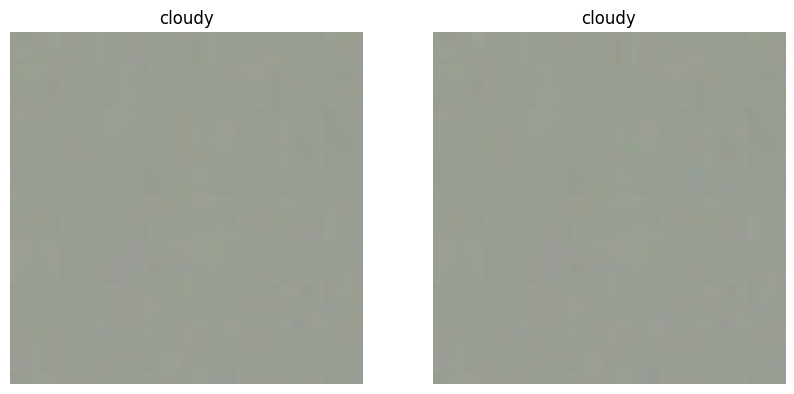

Test image 992 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


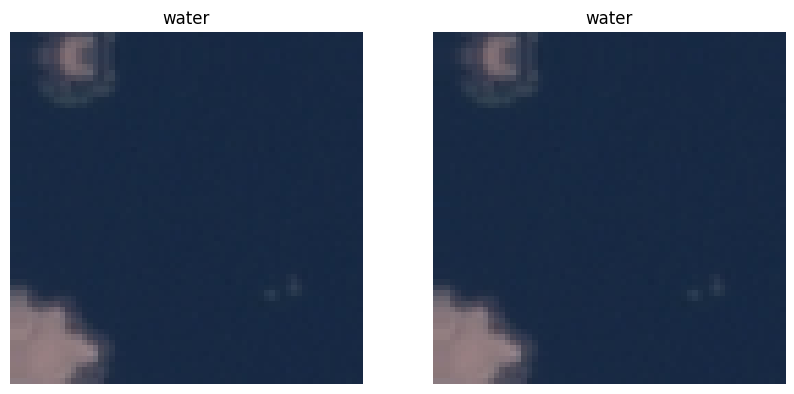

Test image 993 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


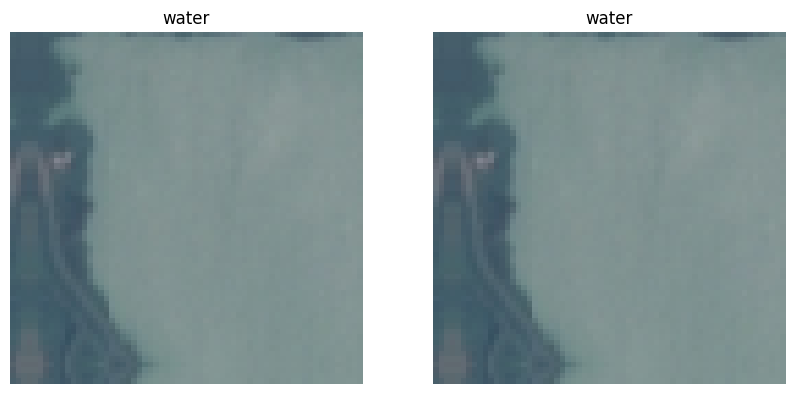

Test image 994 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


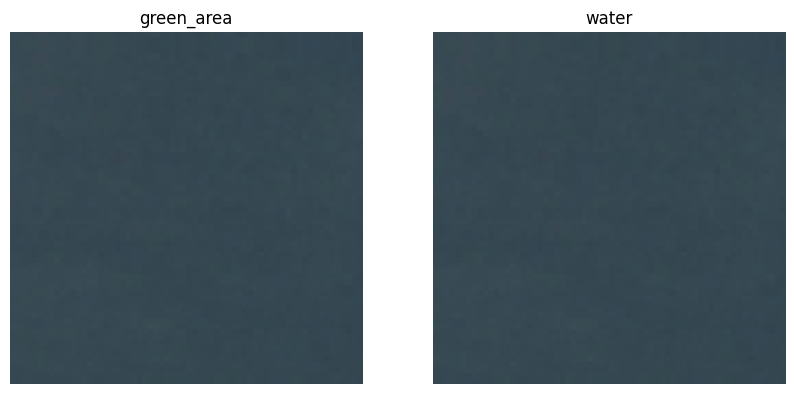

Test image 995 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


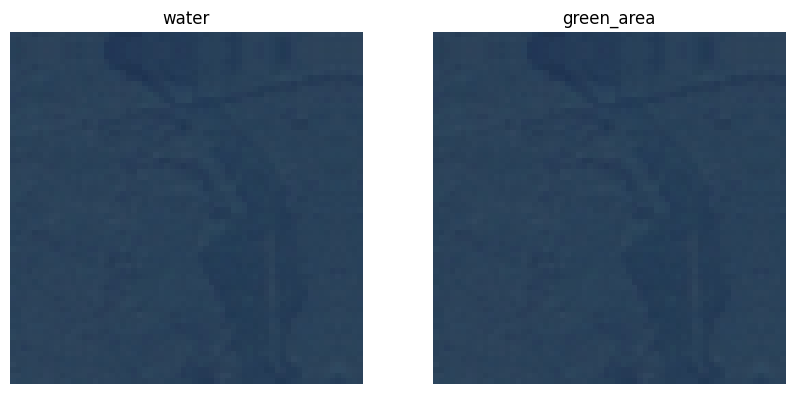

Test image 996 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


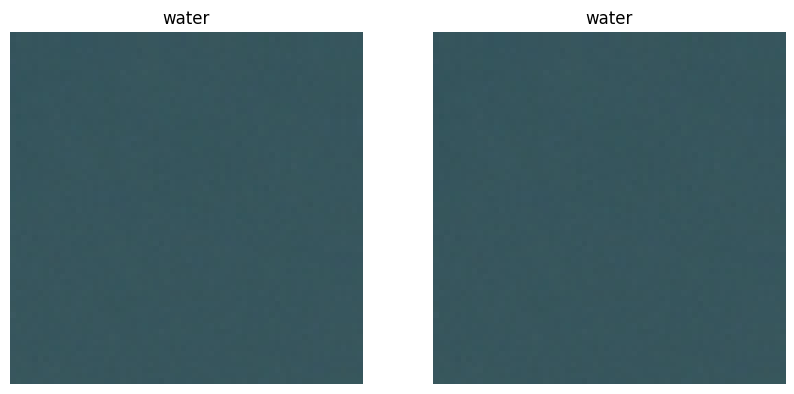

Test image 997 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


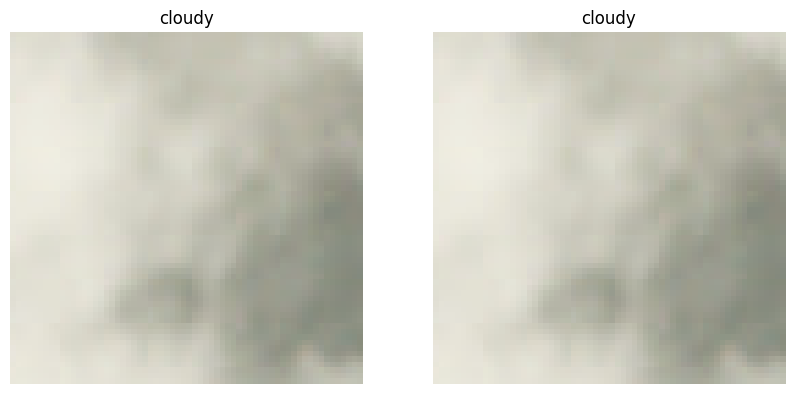

Test image 998 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


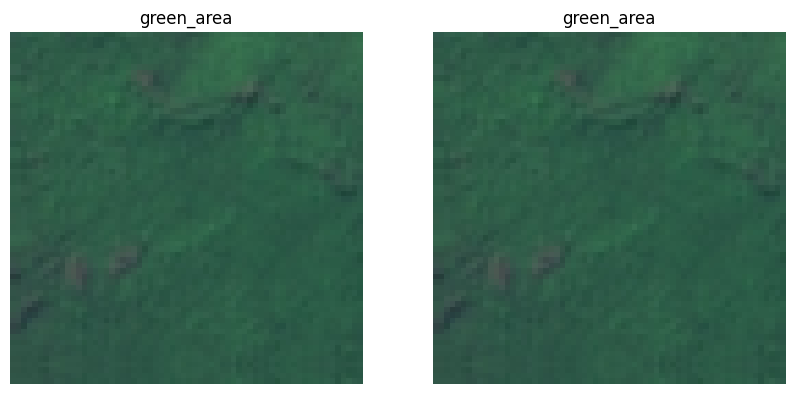

Test image 999 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


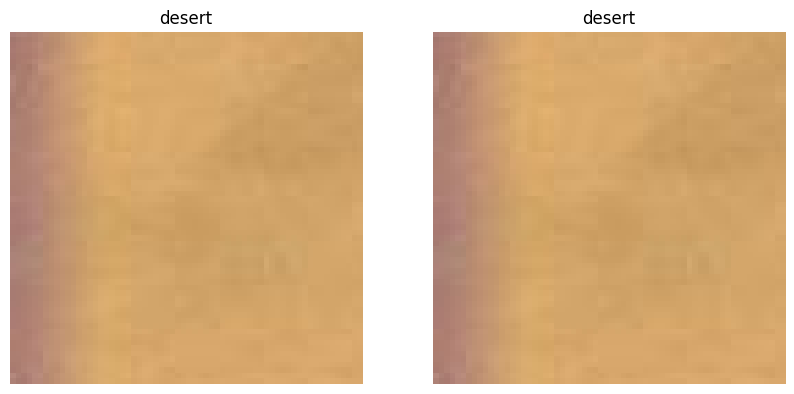

Test image 1000 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


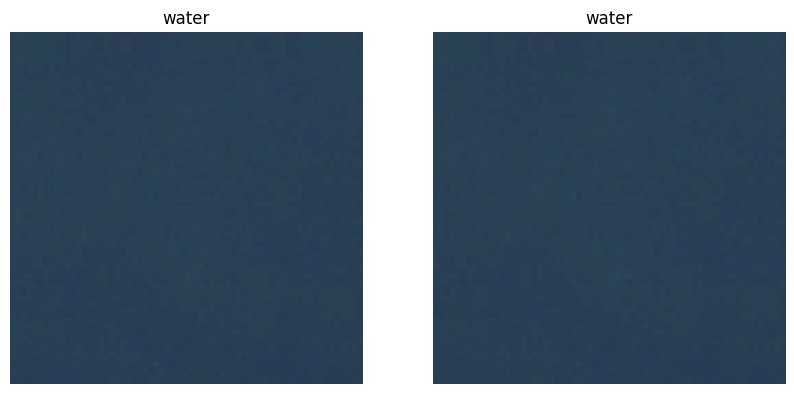

Test image 1001 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


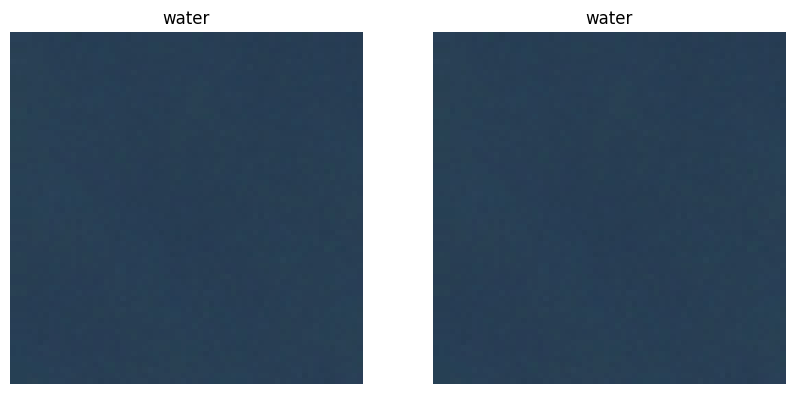

Test image 1002 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


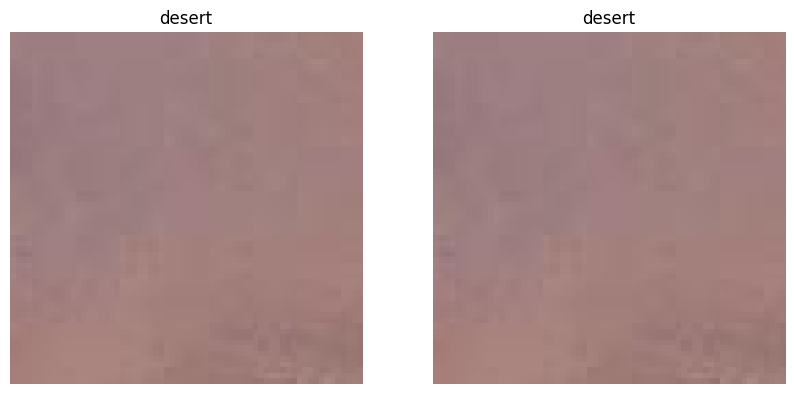

Test image 1003 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


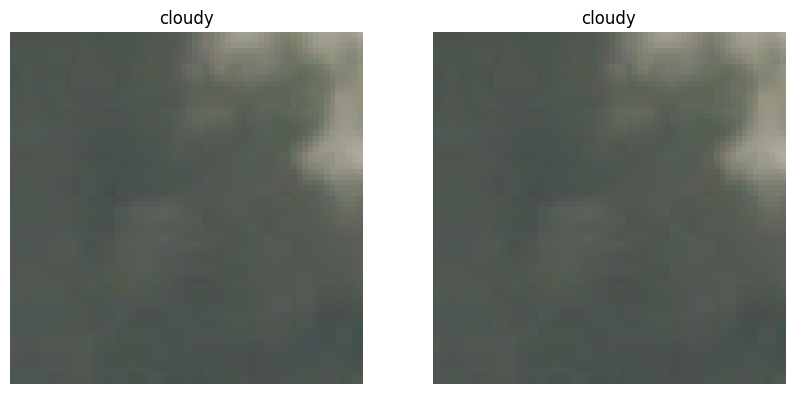

Test image 1004 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


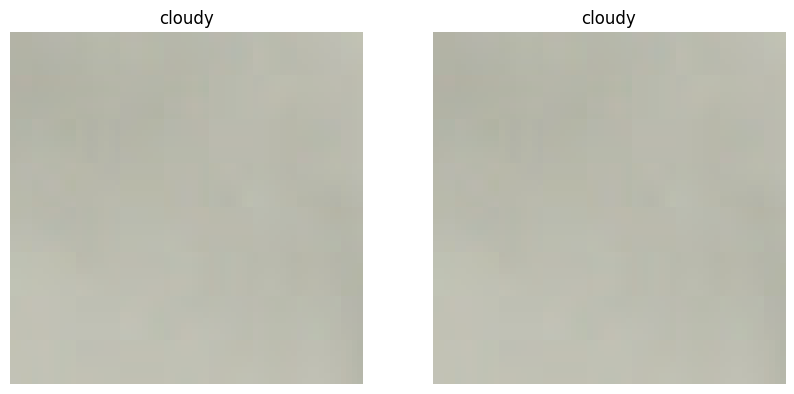

Test image 1005 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


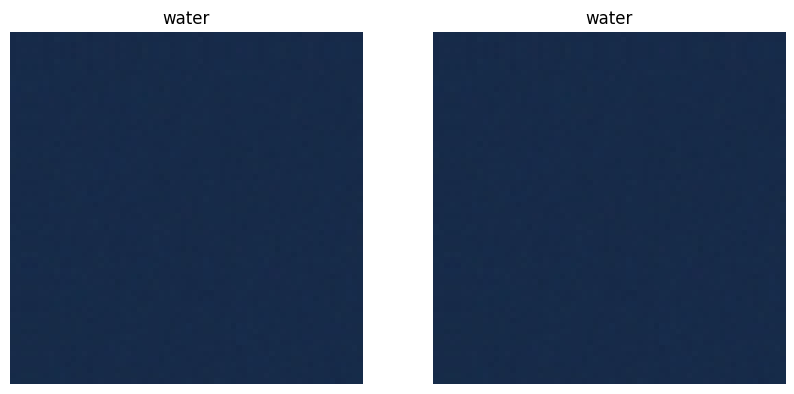

Test image 1006 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


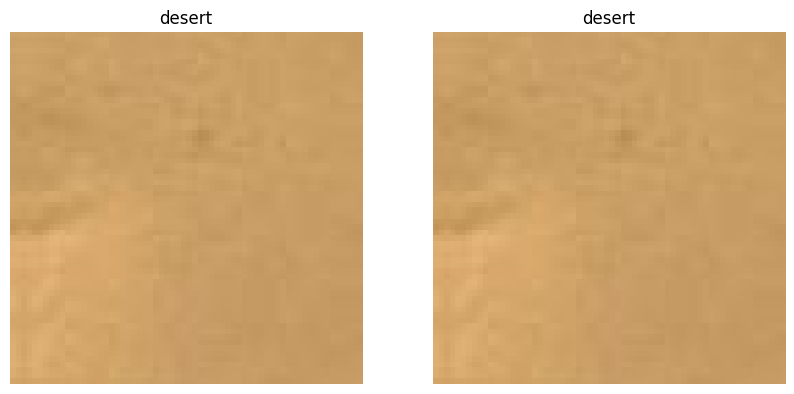

Test image 1007 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


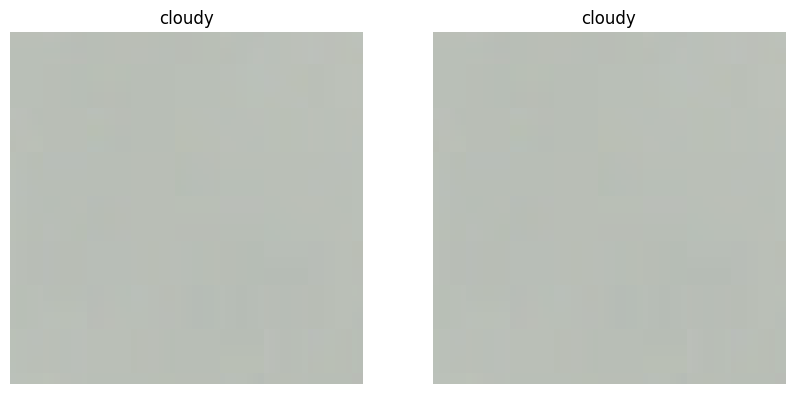

Test image 1008 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


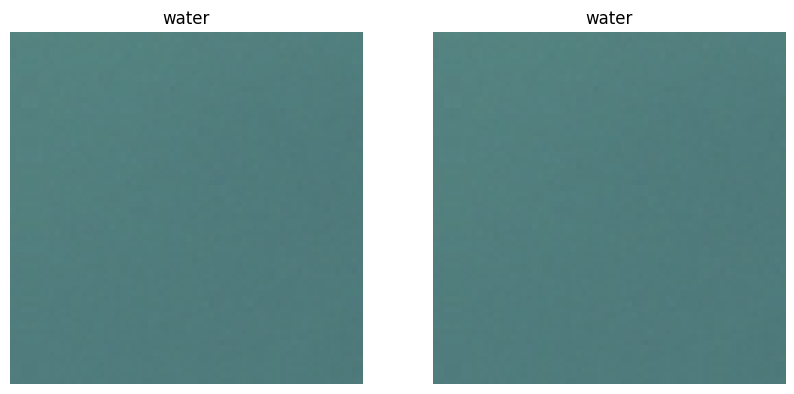

Test image 1009 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


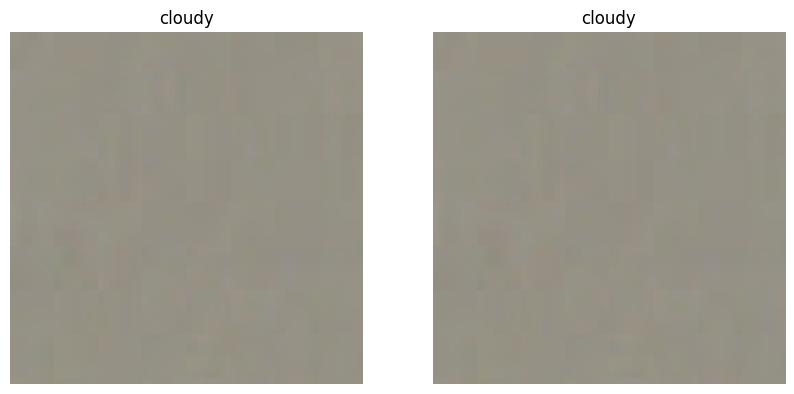

Test image 1010 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


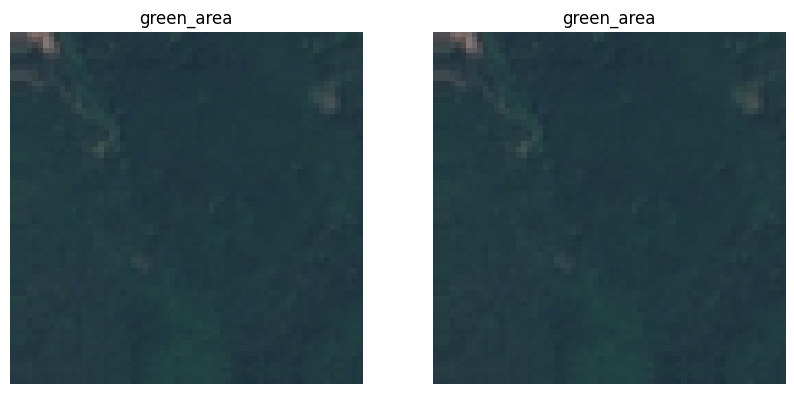

Test image 1011 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


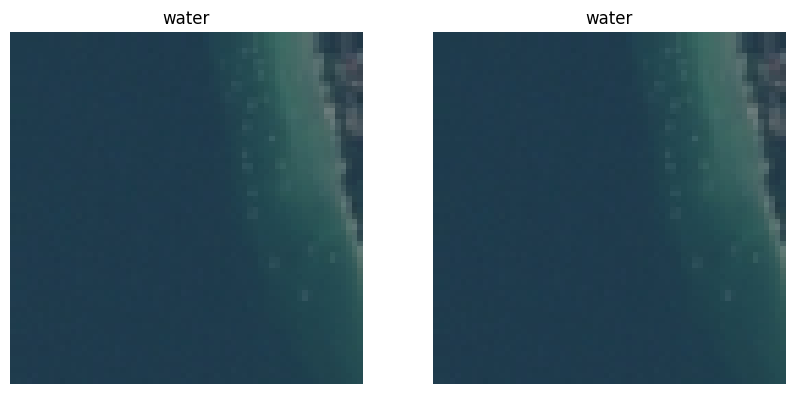

Test image 1012 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


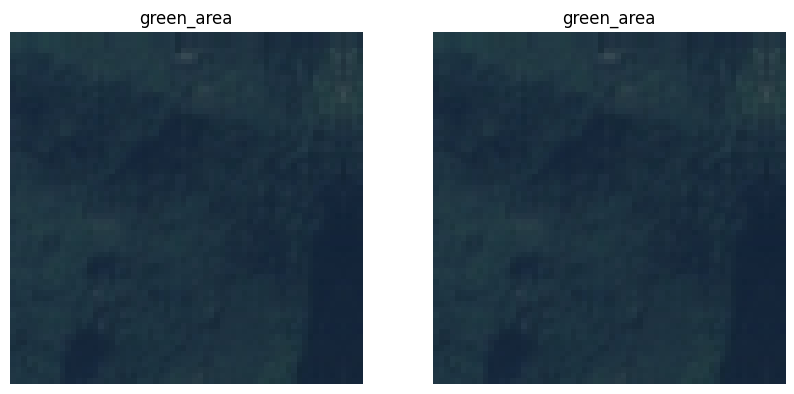

Test image 1013 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


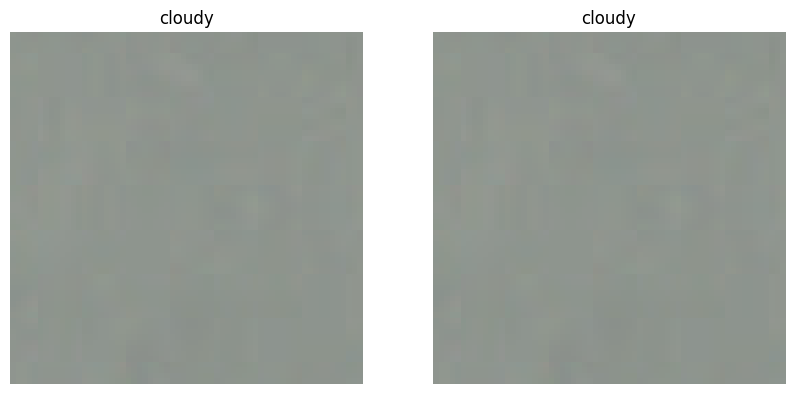

Test image 1014 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


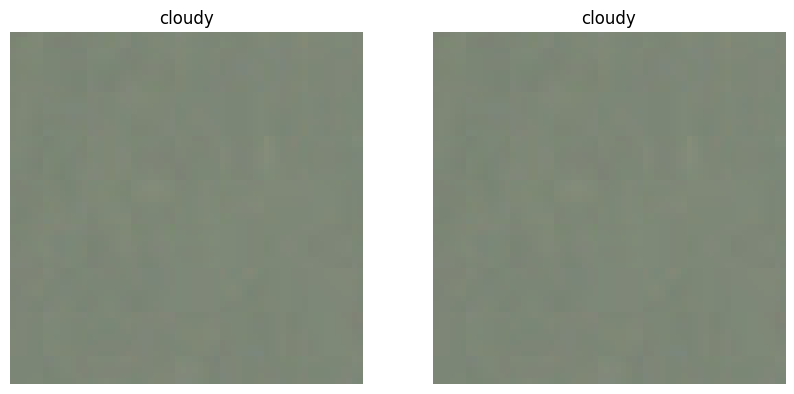

Test image 1015 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


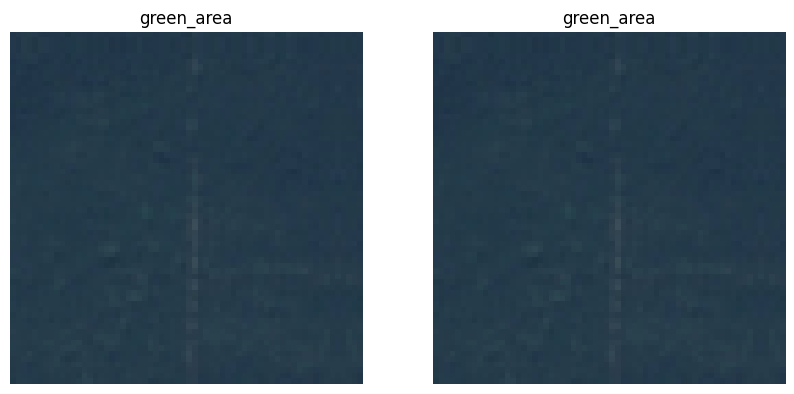

Test image 1016 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


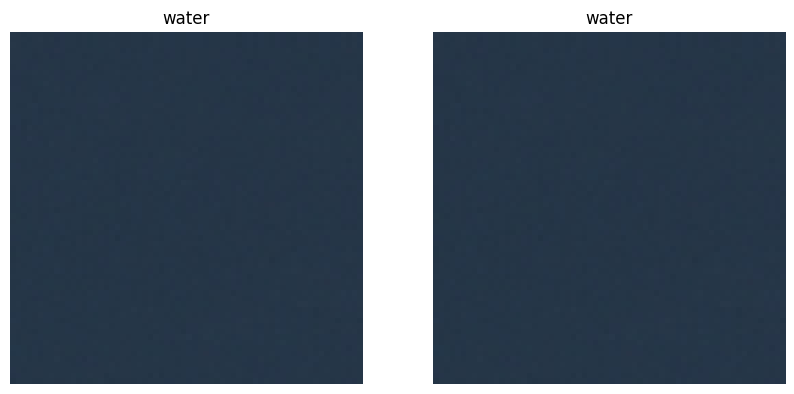

Test image 1017 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


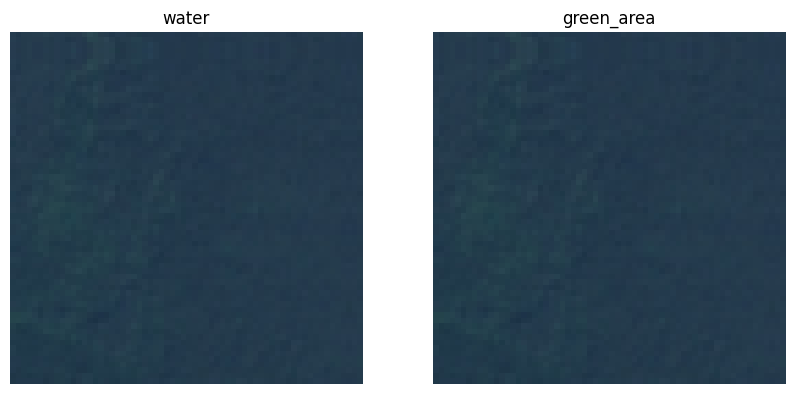

Test image 1018 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


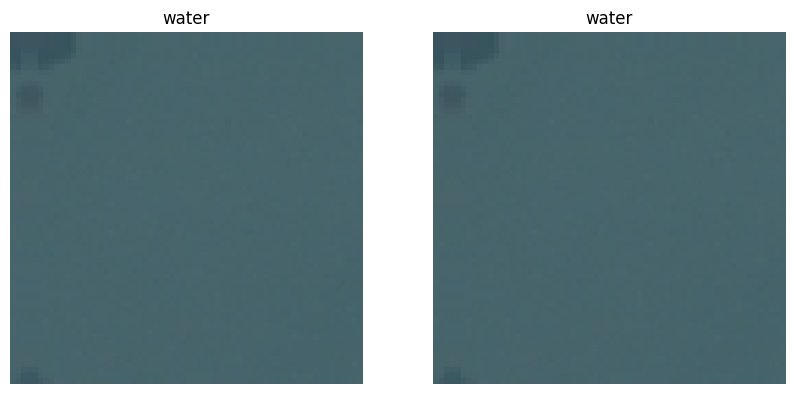

Test image 1019 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


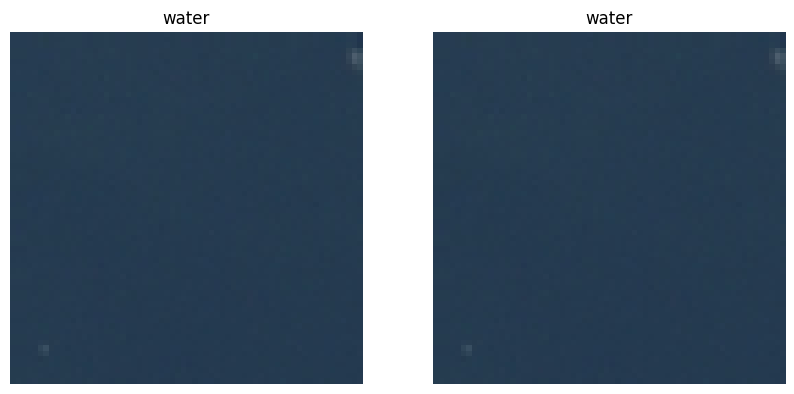

Test image 1020 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


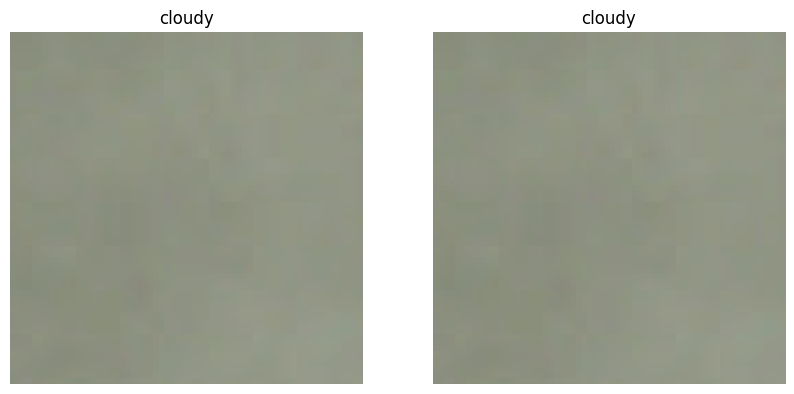

Test image 1021 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


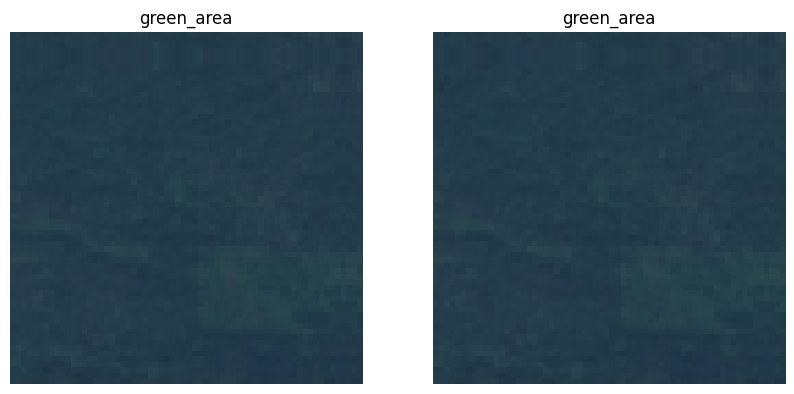

Test image 1022 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


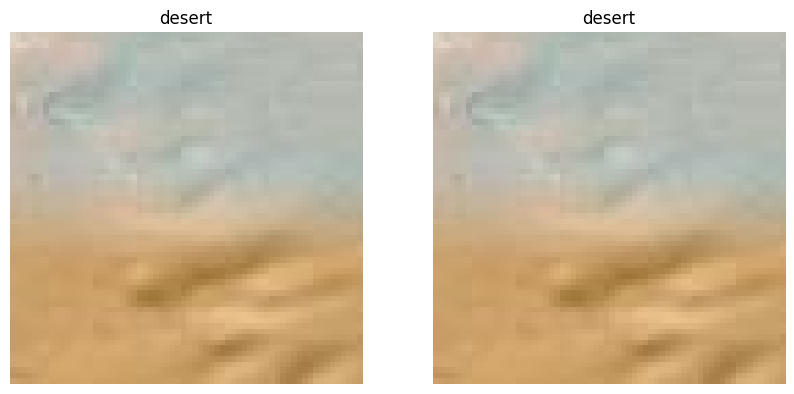

Test image 1023 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


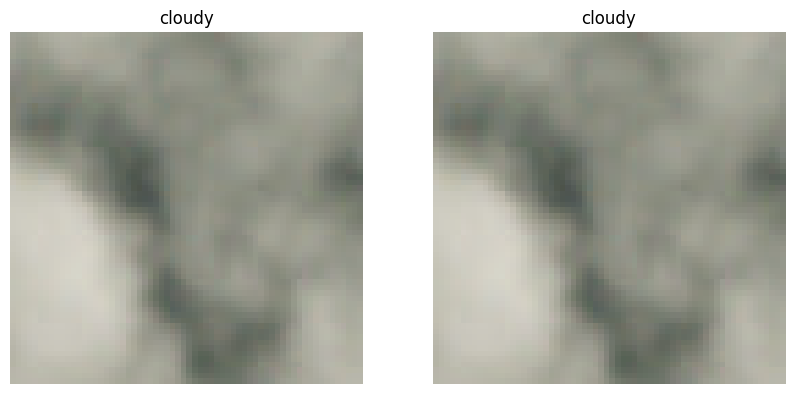

Test image 1024 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


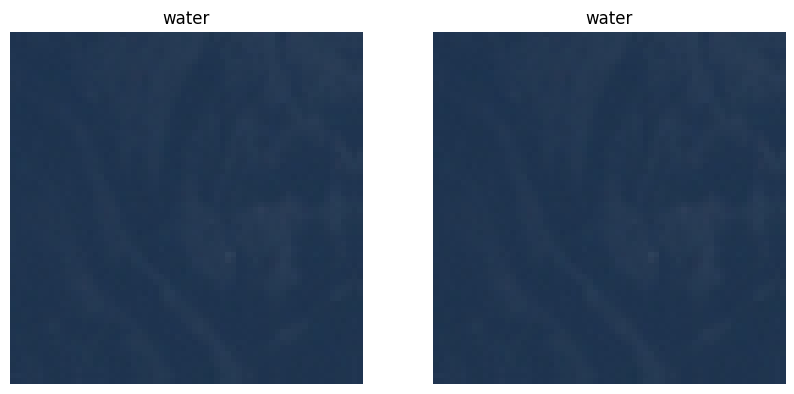

Test image 1025 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


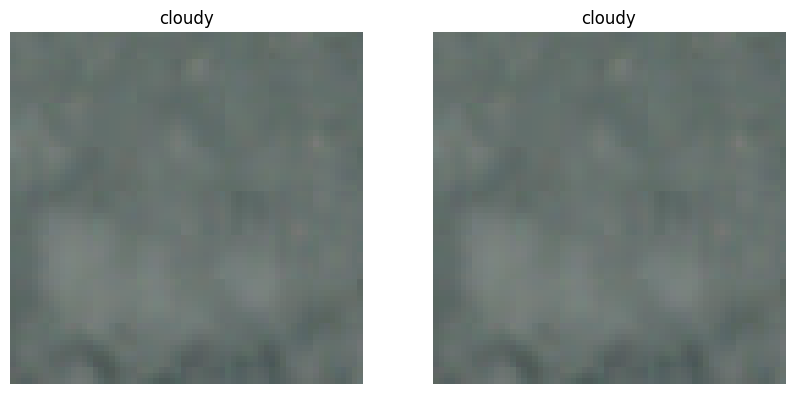

Test image 1026 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


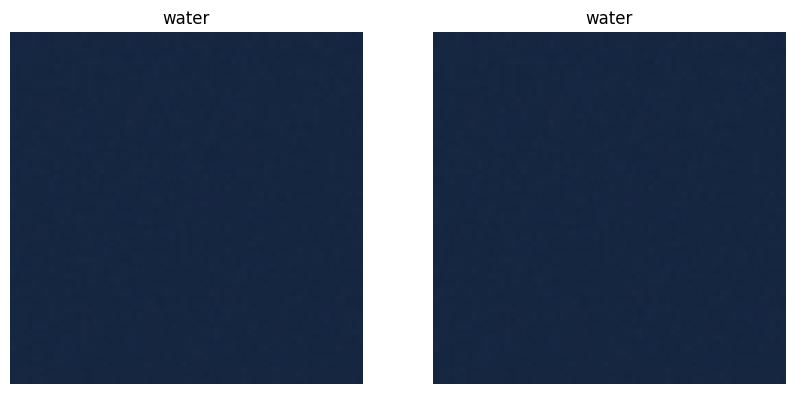

Test image 1027 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


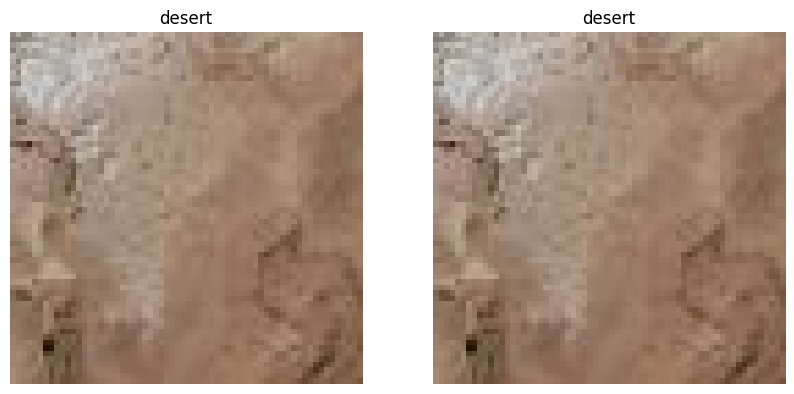

Test image 1028 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


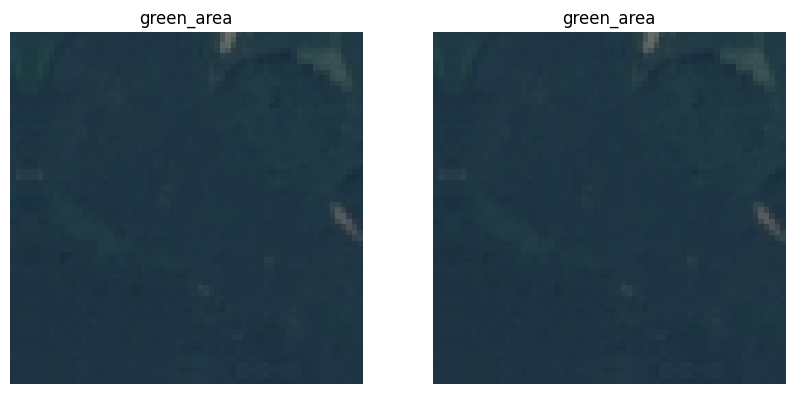

Test image 1029 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


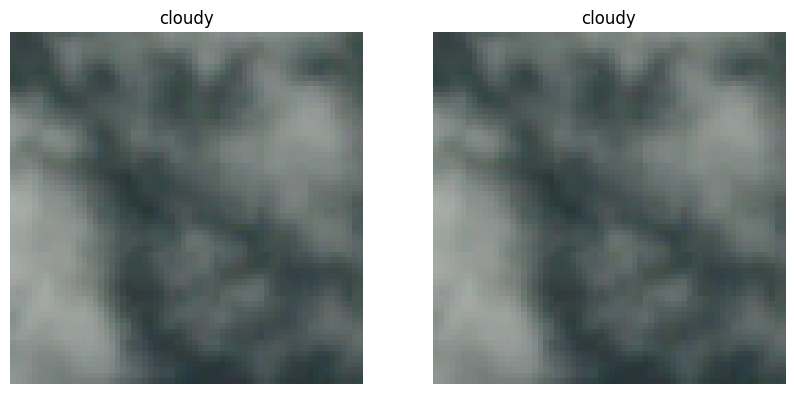

Test image 1030 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


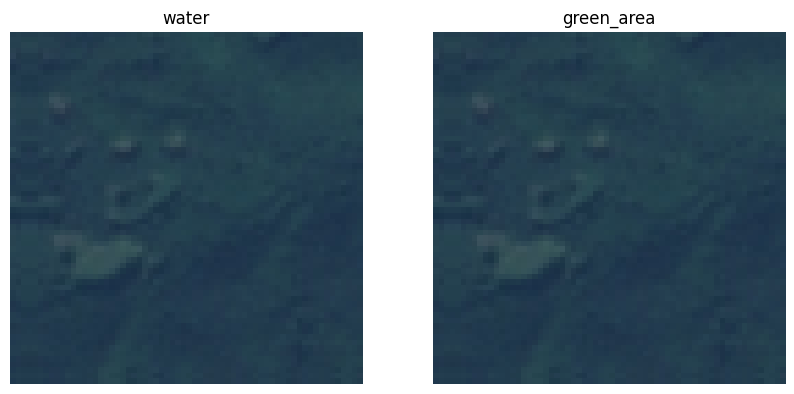

Test image 1031 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


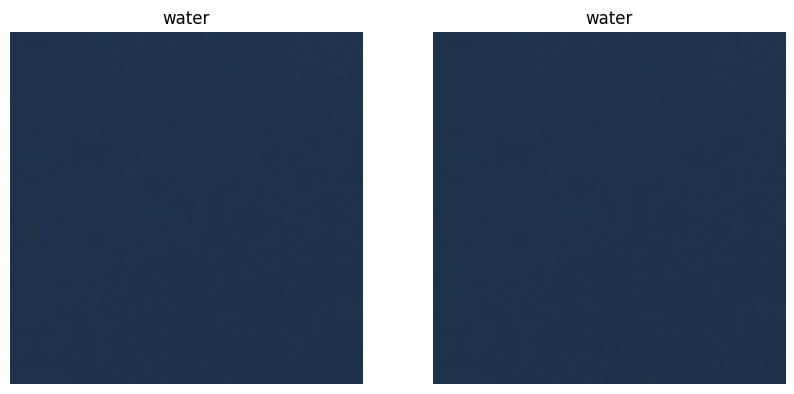

Test image 1032 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


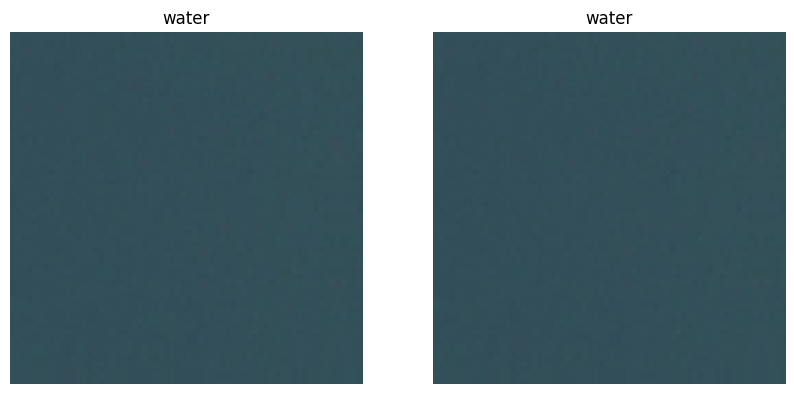

Test image 1033 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


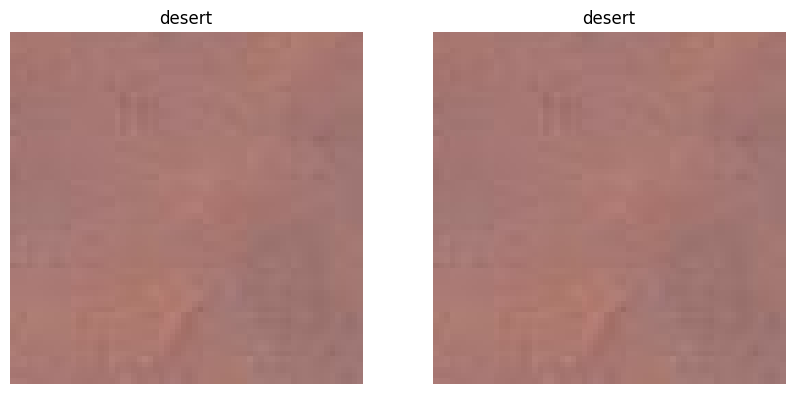

Test image 1034 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


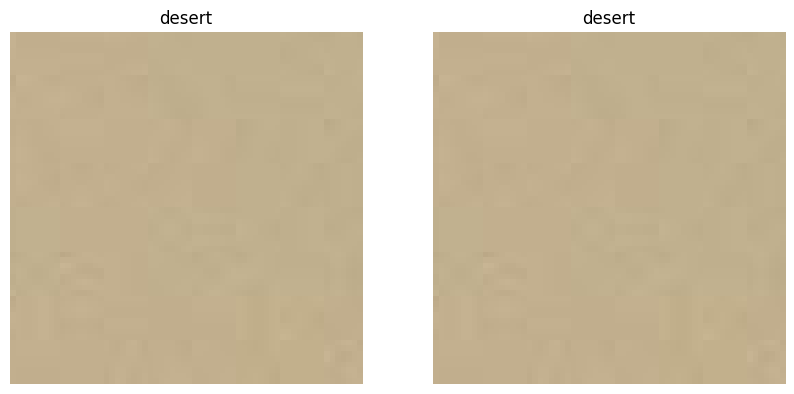

Test image 1035 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


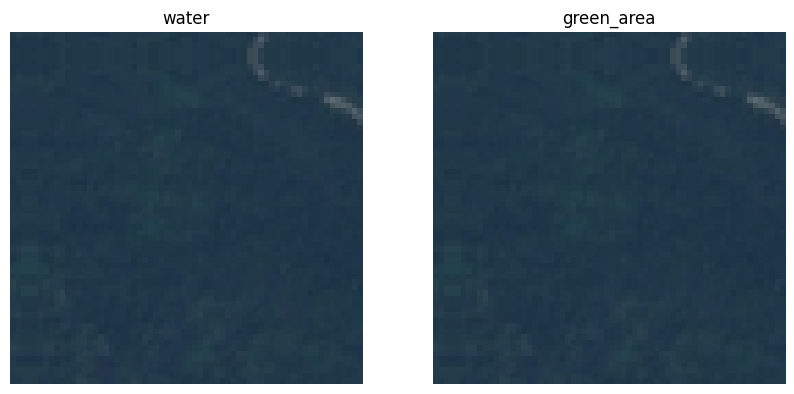

Test image 1036 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


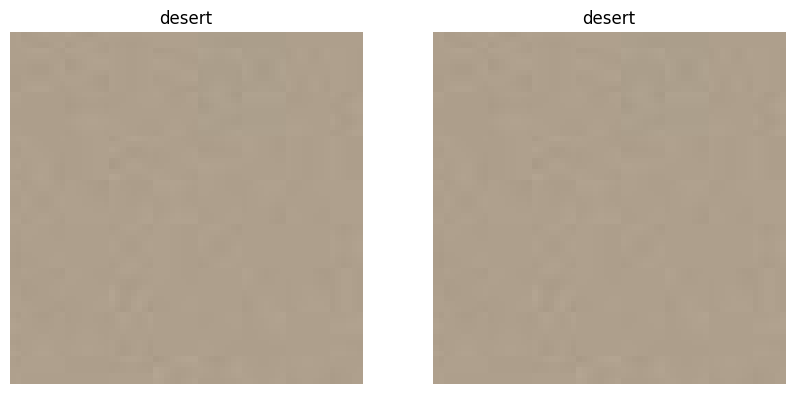

Test image 1037 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


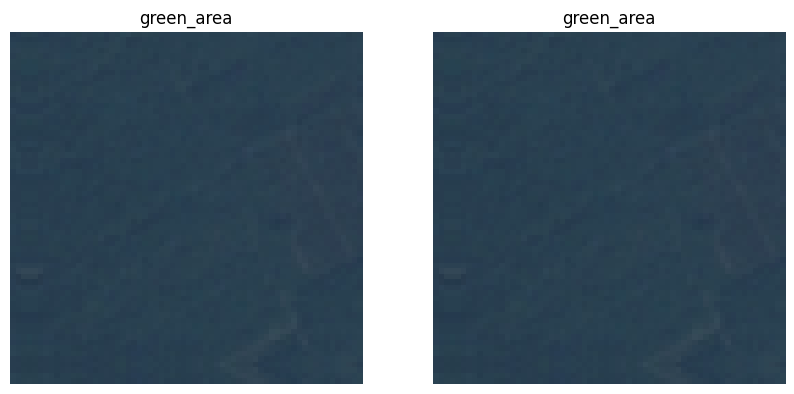

Test image 1038 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


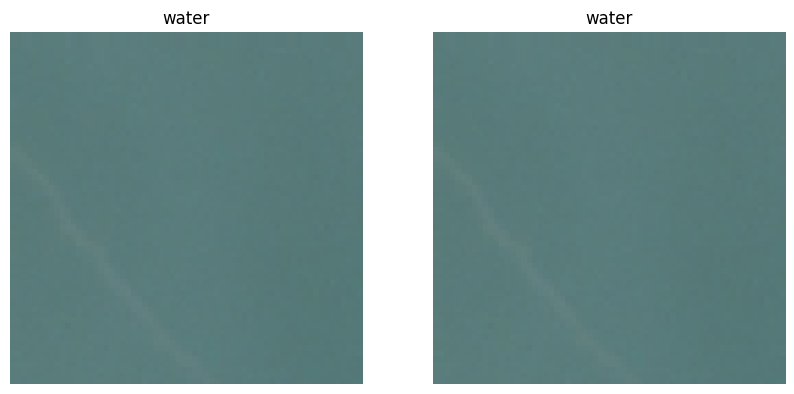

Test image 1039 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


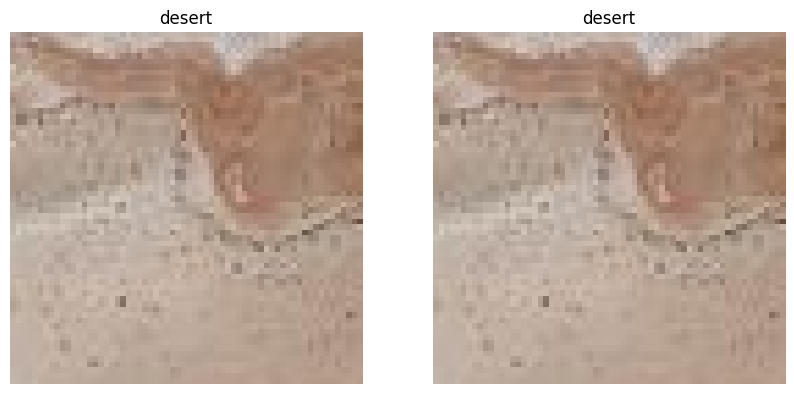

Test image 1040 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


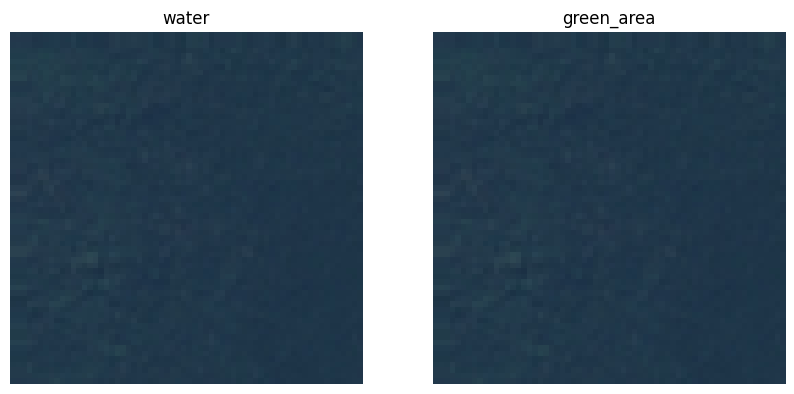

Test image 1041 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


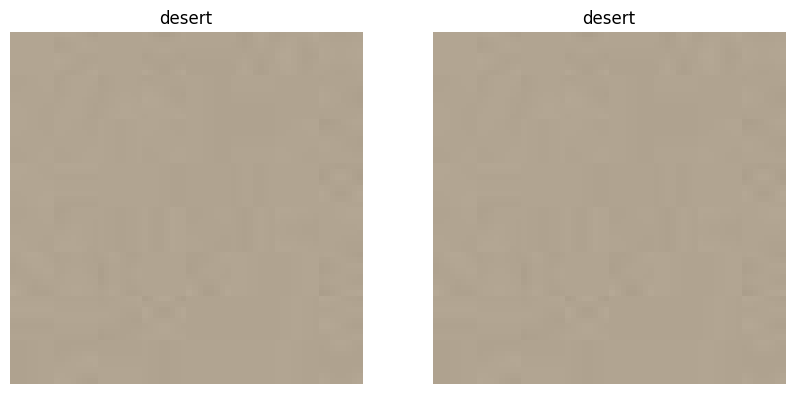

Test image 1042 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


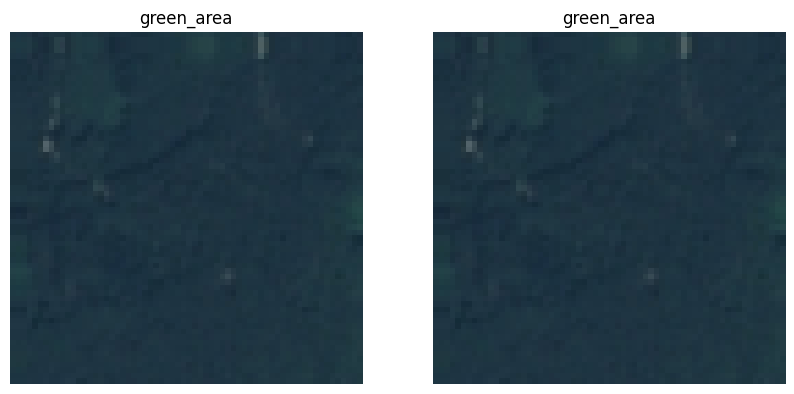

Test image 1043 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


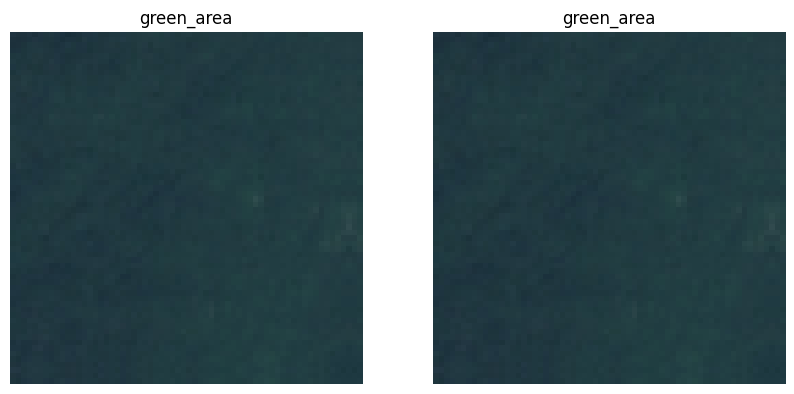

Test image 1044 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


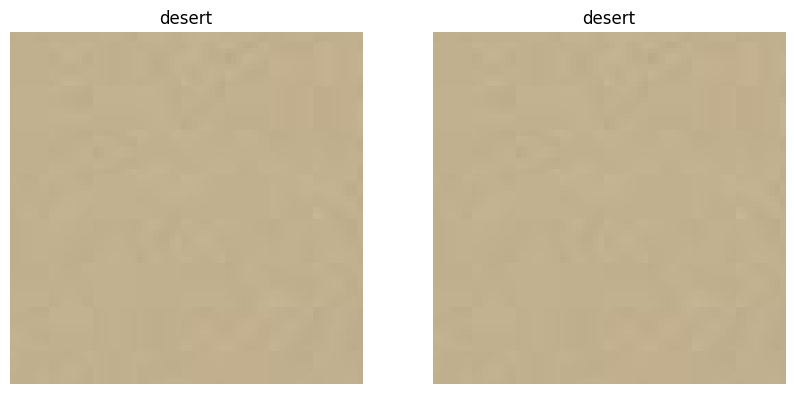

Test image 1045 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


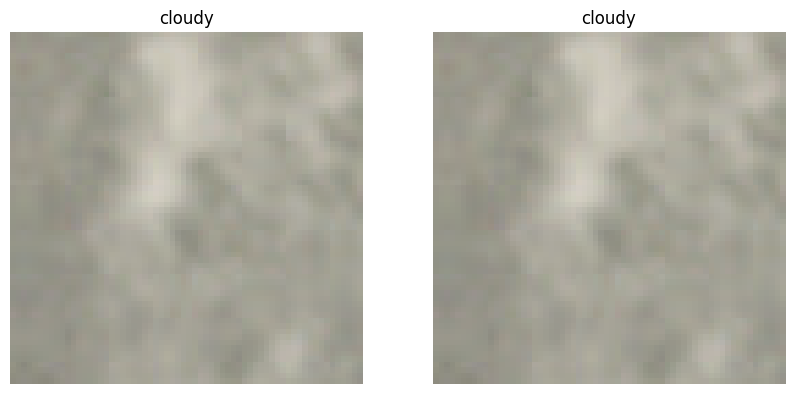

Test image 1046 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


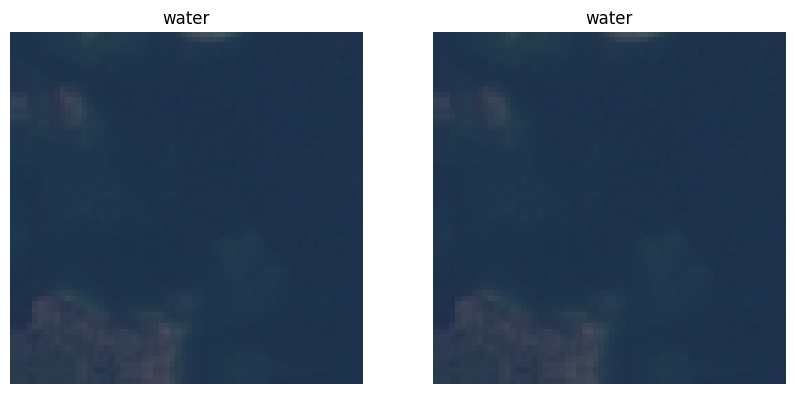

Test image 1047 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


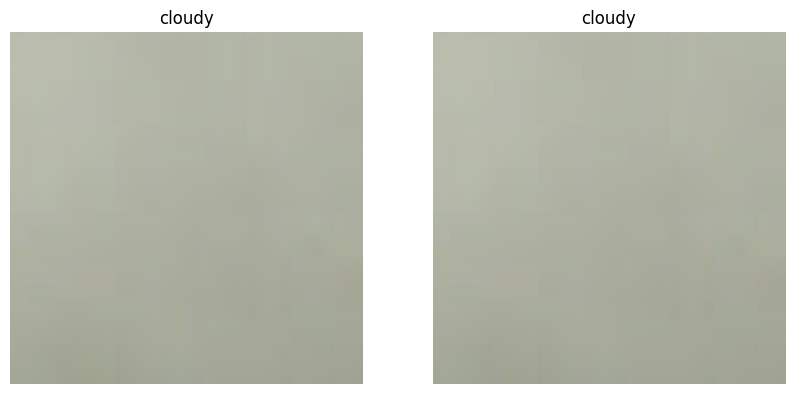

Test image 1048 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


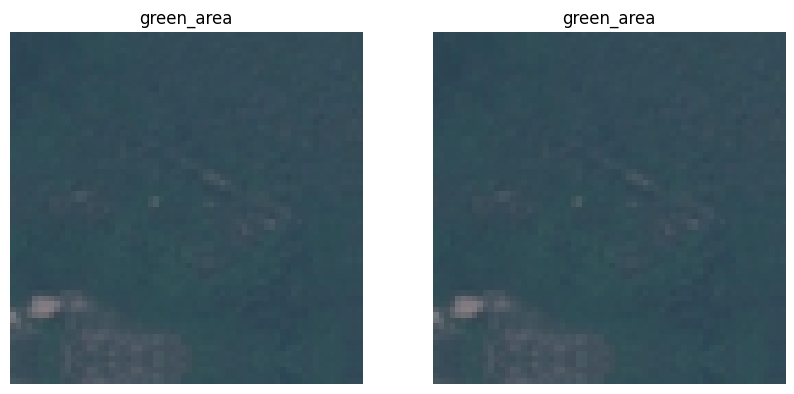

Test image 1049 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


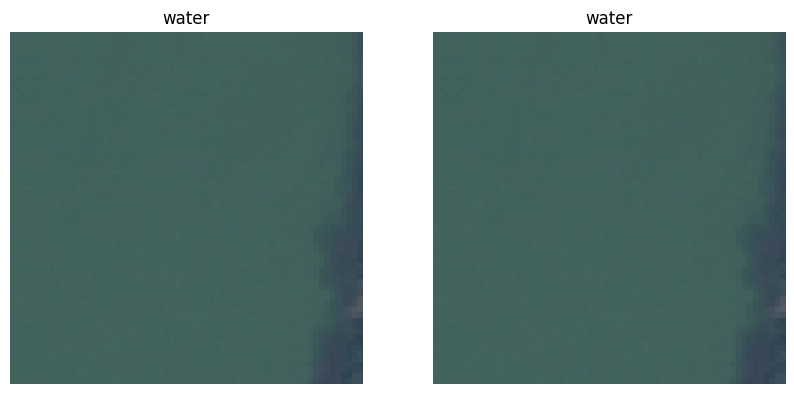

Test image 1050 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


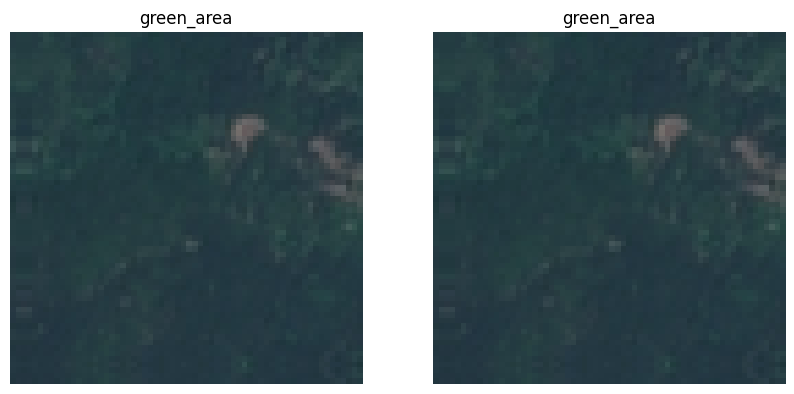

Test image 1051 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


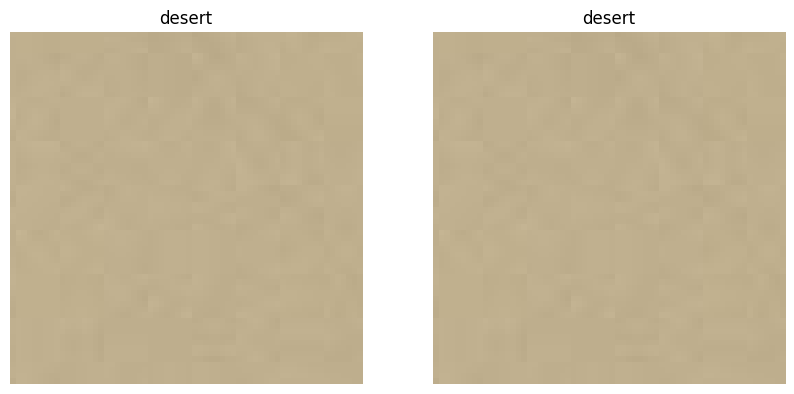

Test image 1052 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


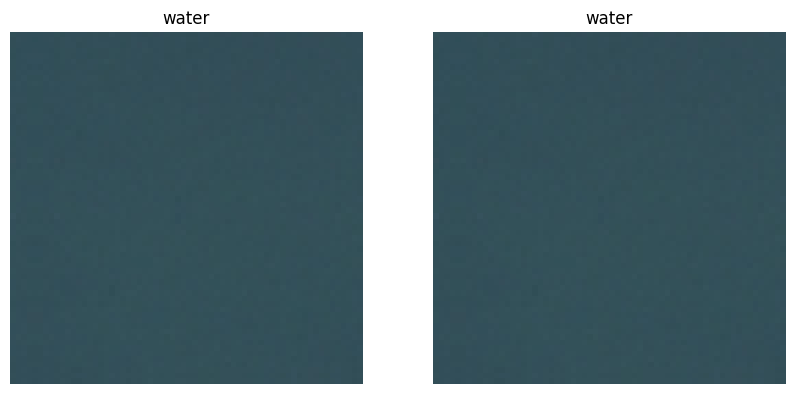

Test image 1053 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


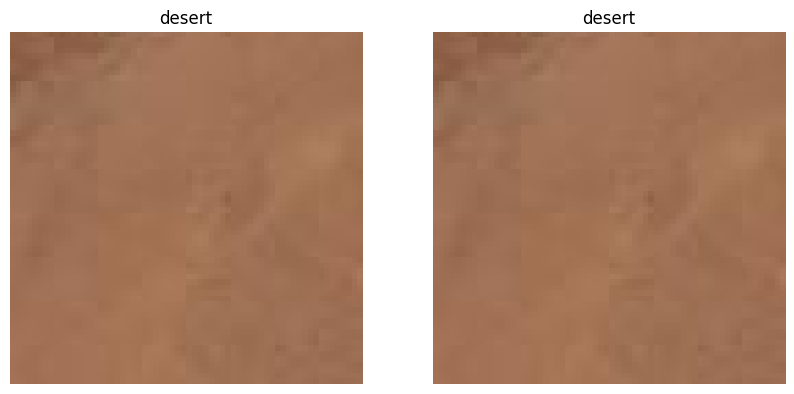

Test image 1054 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


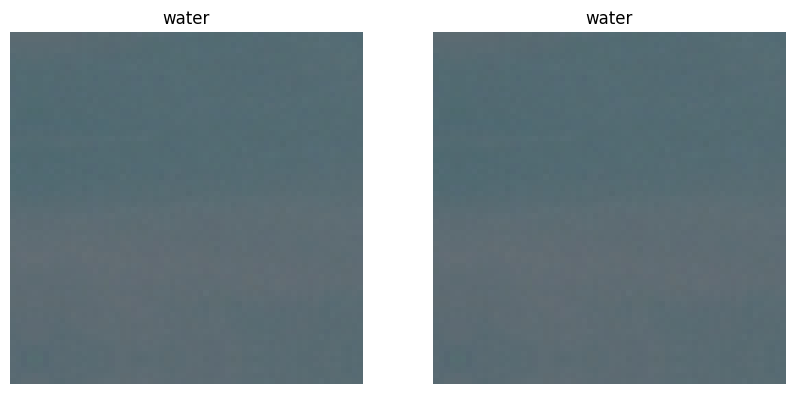

Test image 1055 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


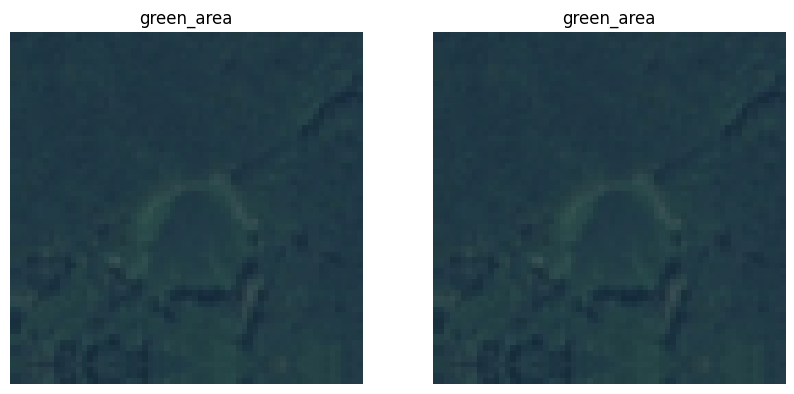

Test image 1056 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


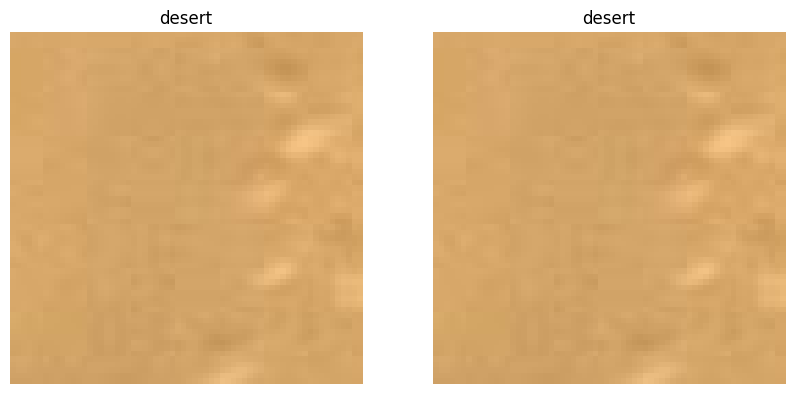

Test image 1057 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


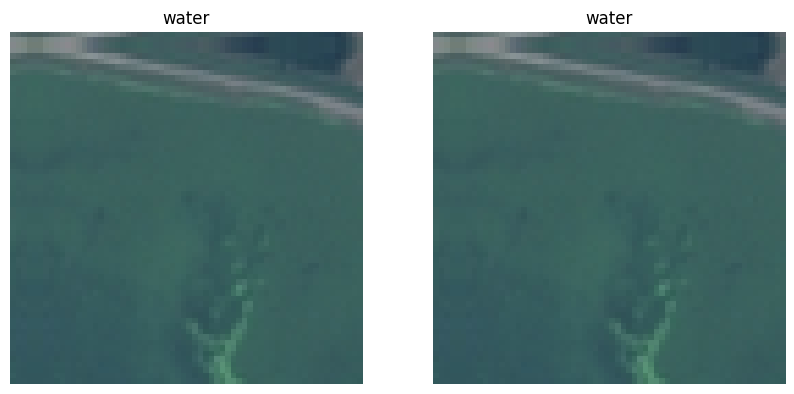

Test image 1058 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


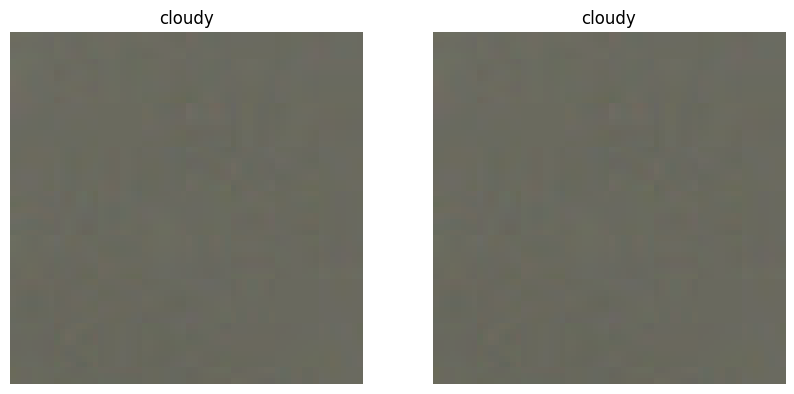

Test image 1059 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


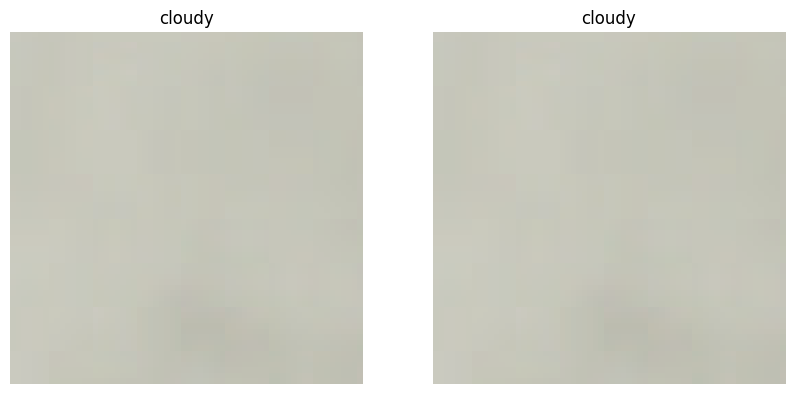

Test image 1060 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


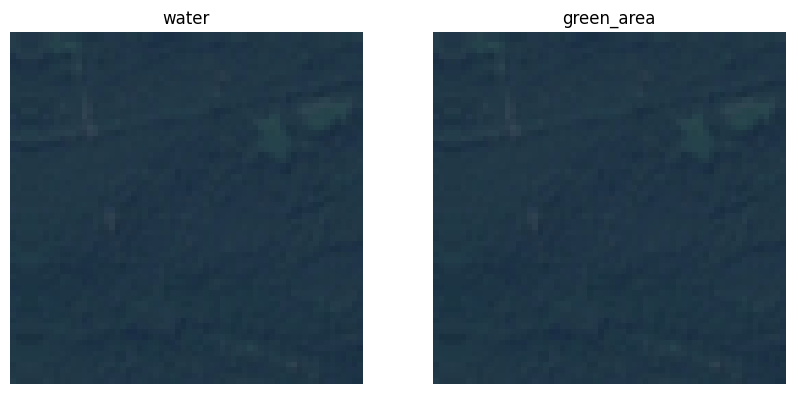

Test image 1061 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


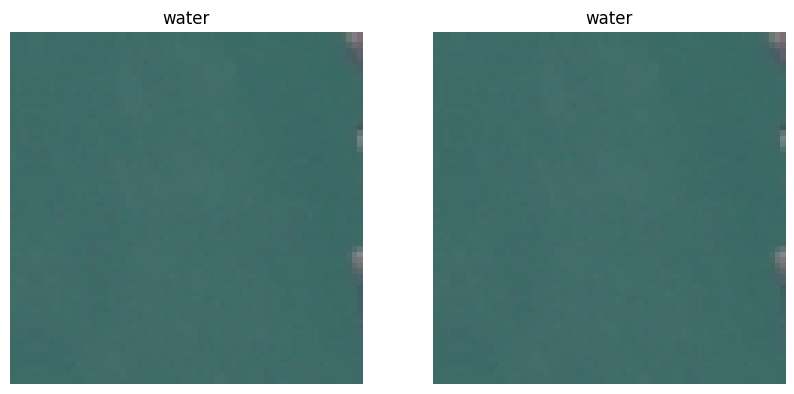

Test image 1062 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


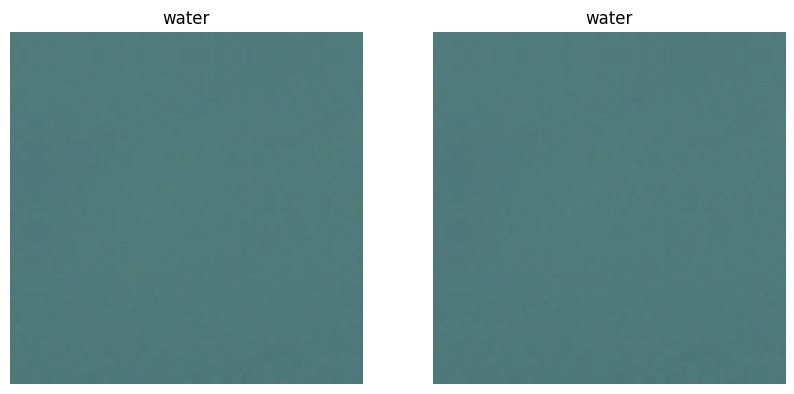

Test image 1063 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


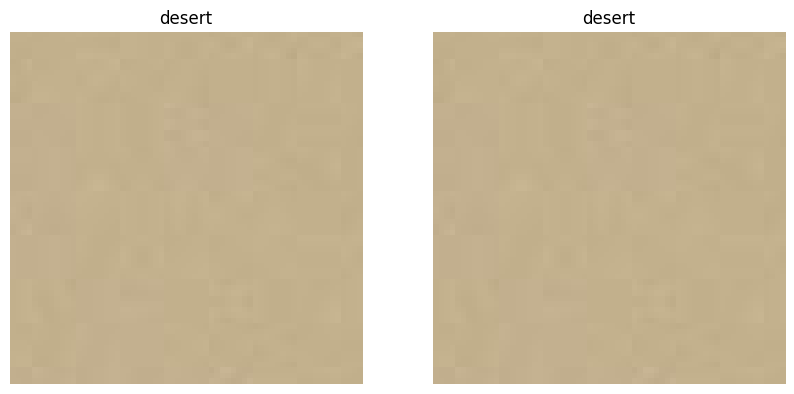

Test image 1064 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


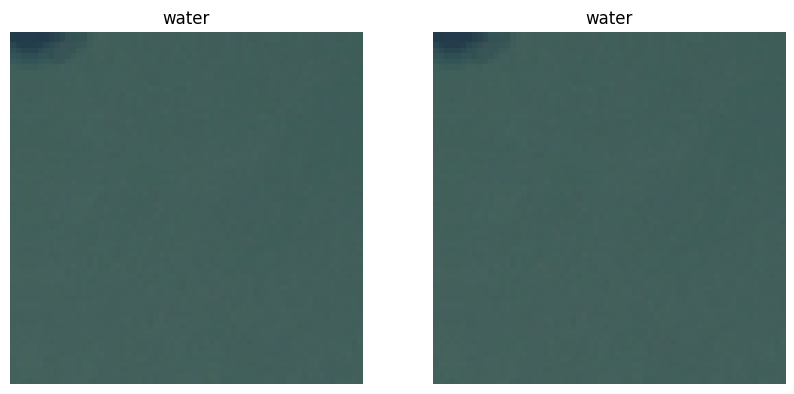

Test image 1065 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


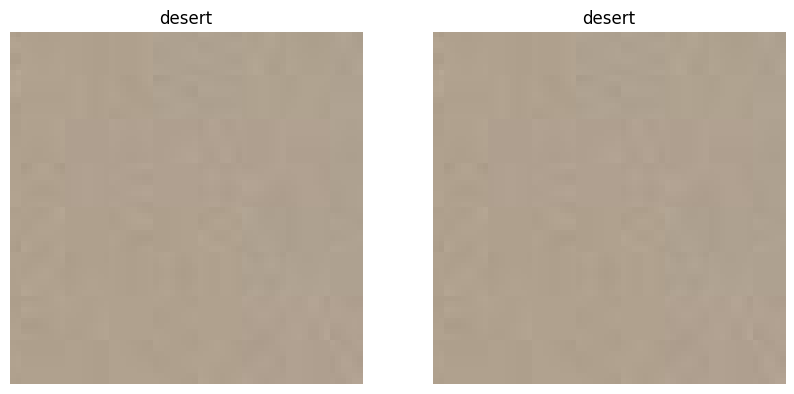

Test image 1066 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


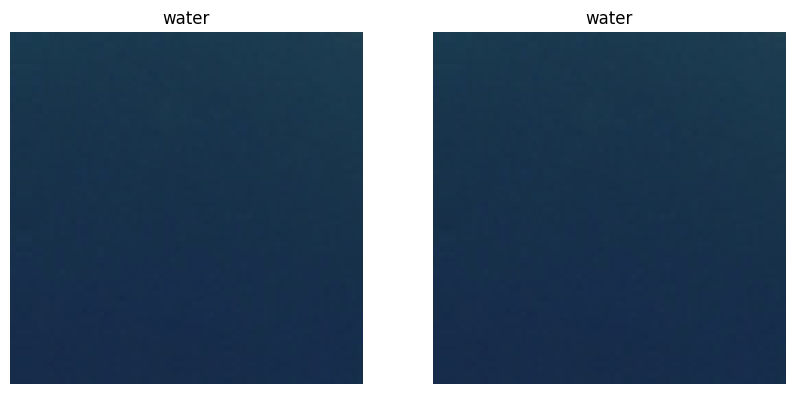

Test image 1067 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


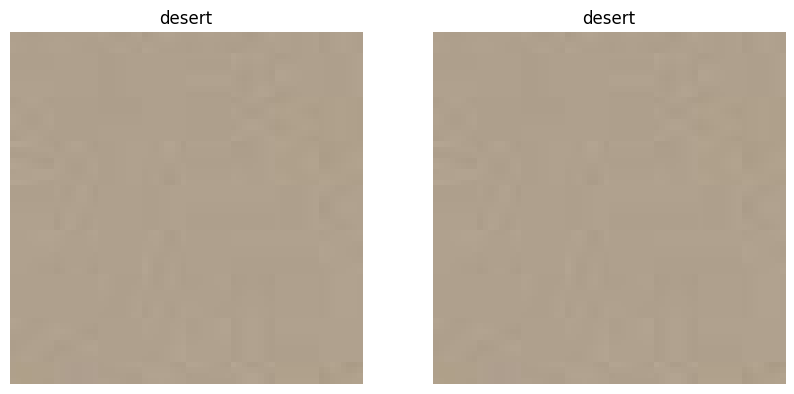

Test image 1068 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


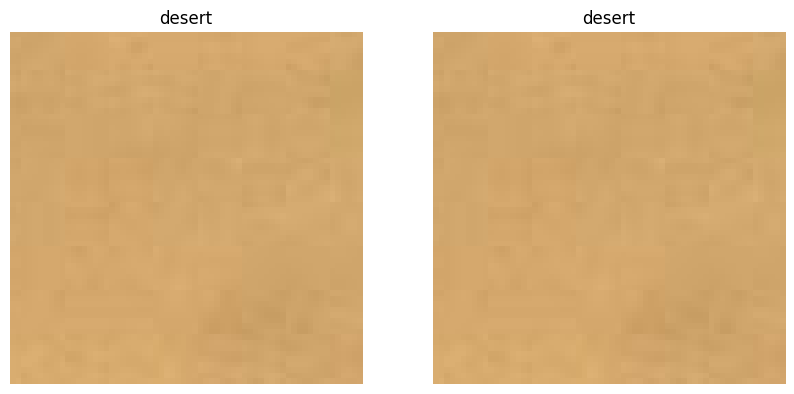

Test image 1069 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


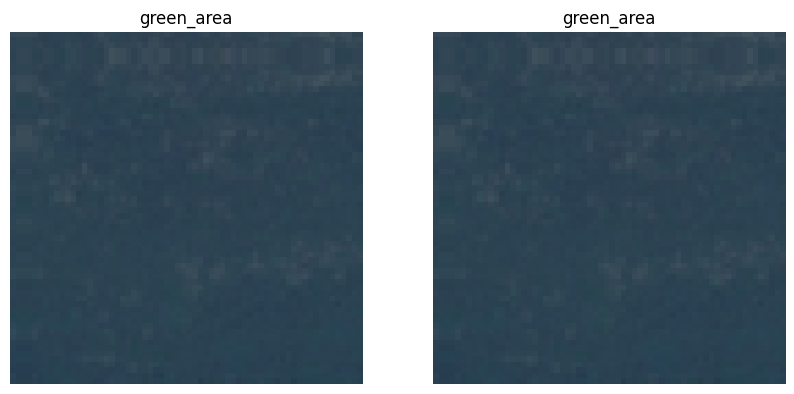

Test image 1070 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


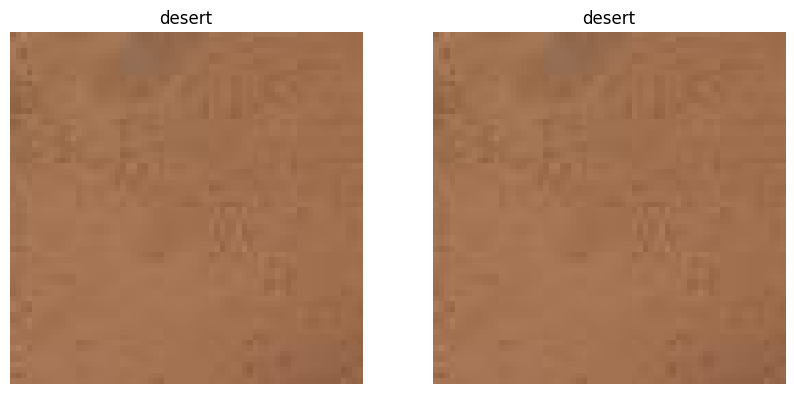

Test image 1071 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


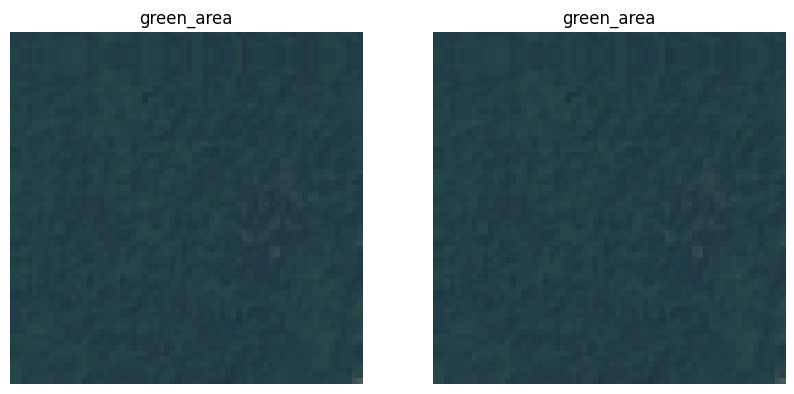

Test image 1072 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


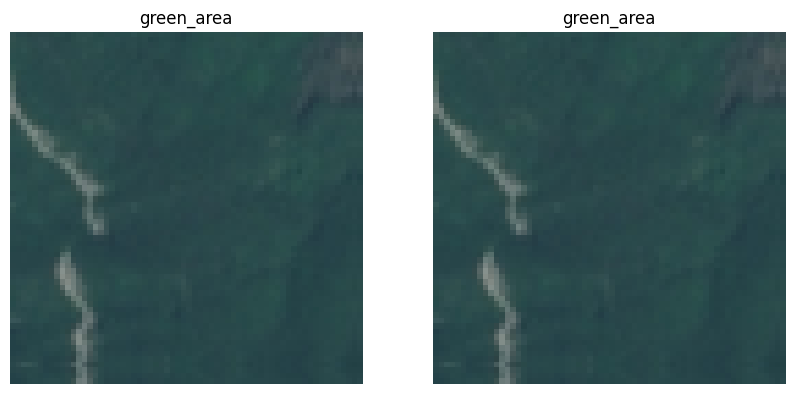

Test image 1073 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


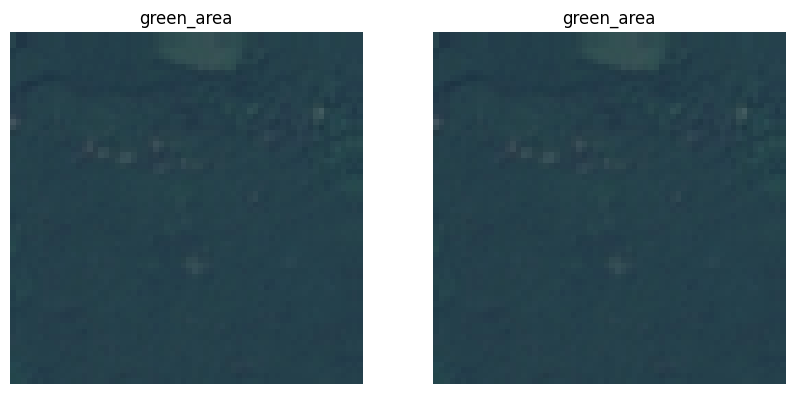

Test image 1074 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


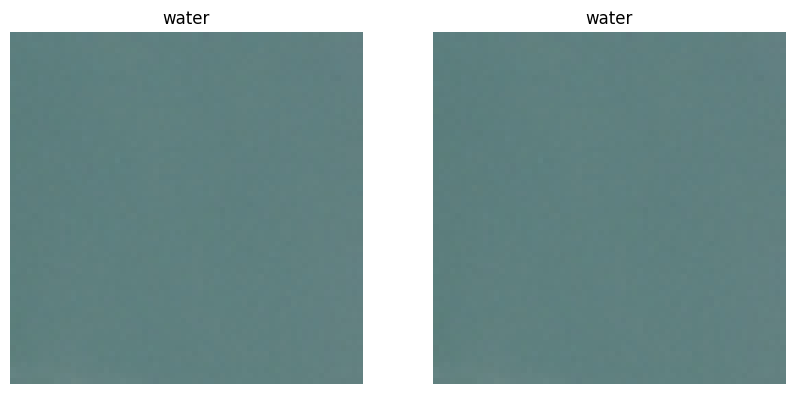

Test image 1075 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


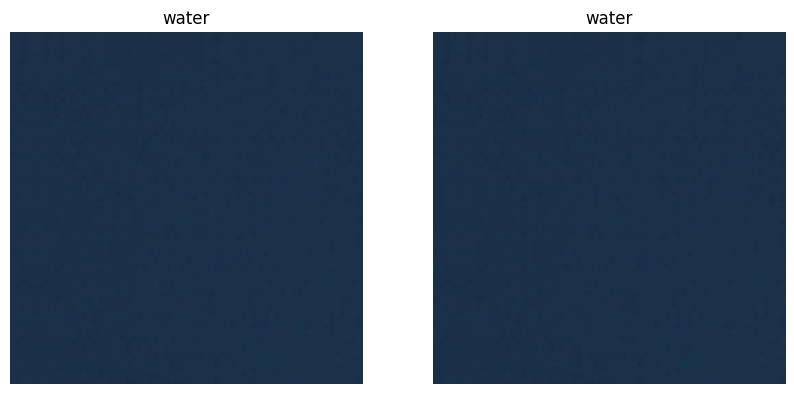

Test image 1076 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


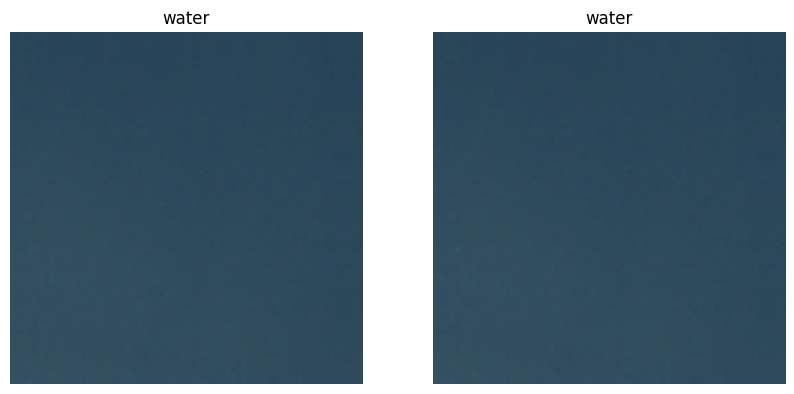

Test image 1077 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


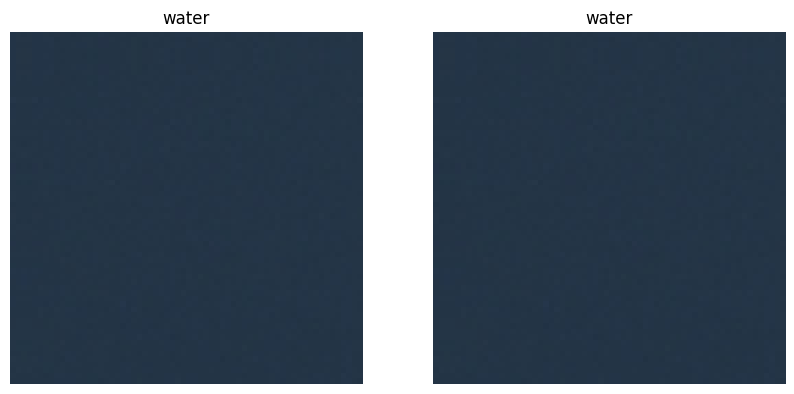

Test image 1078 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


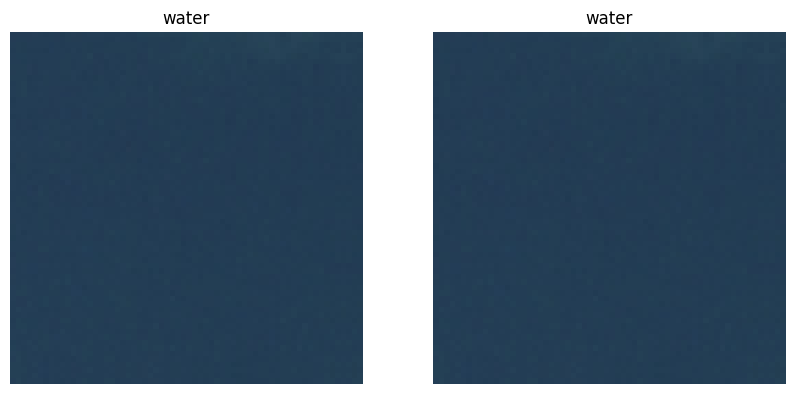

Test image 1079 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


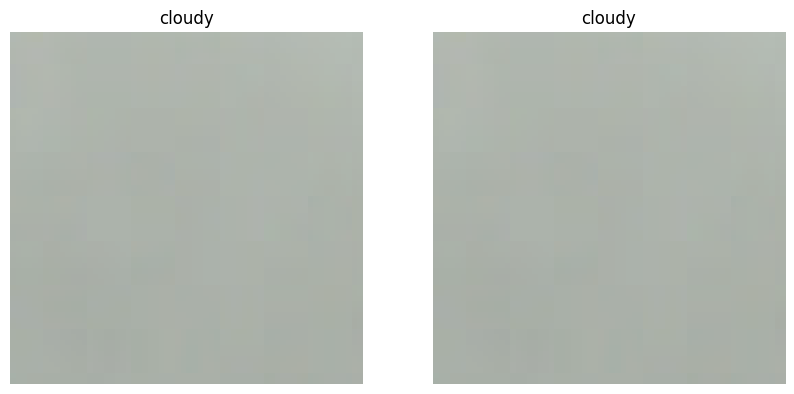

Test image 1080 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


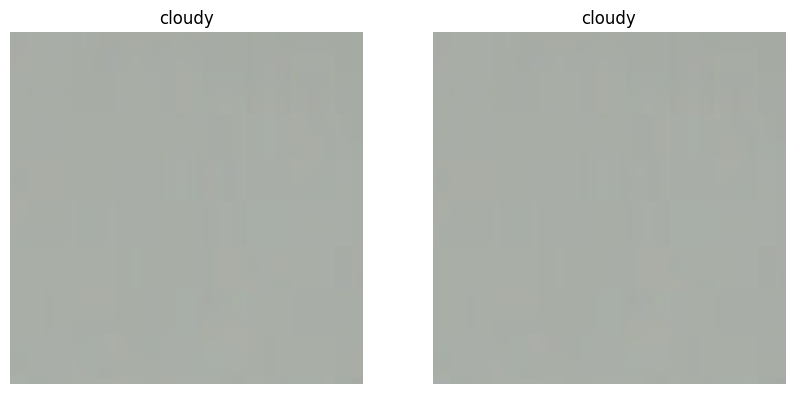

Test image 1081 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


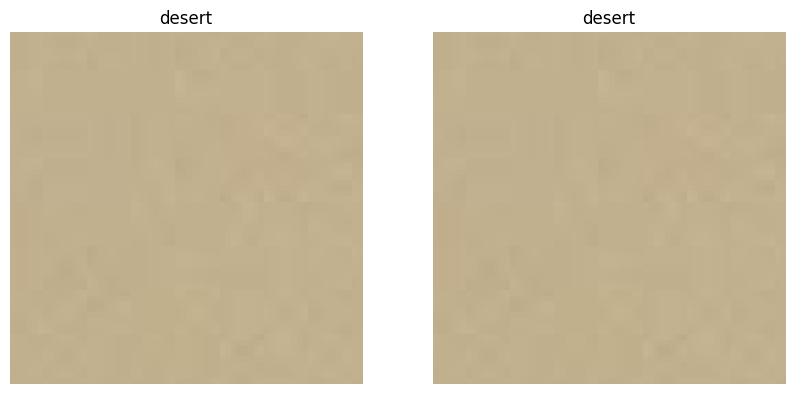

Test image 1082 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


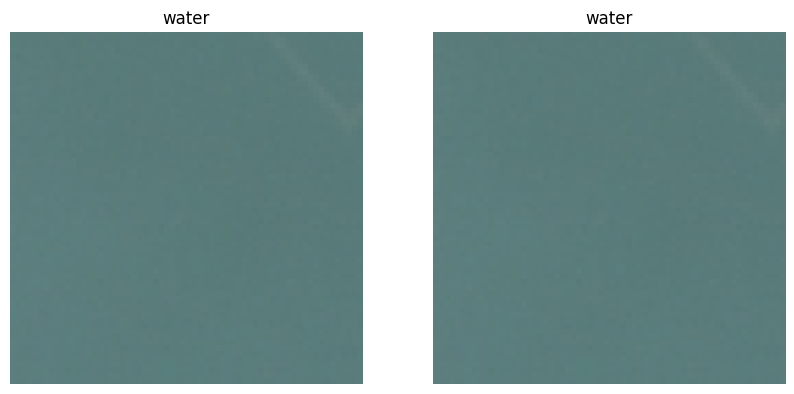

Test image 1083 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


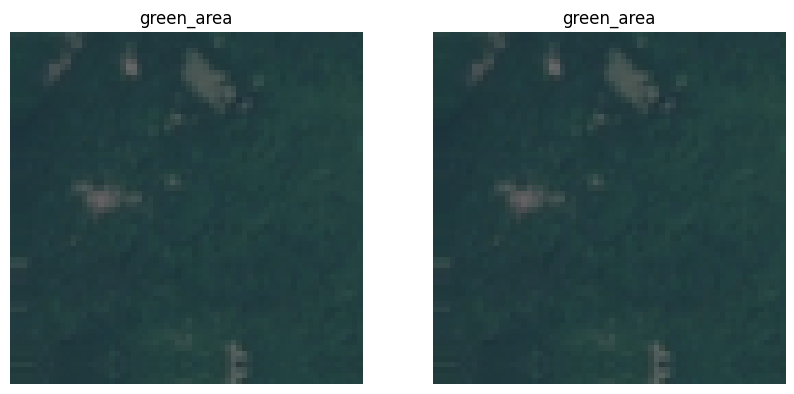

Test image 1084 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


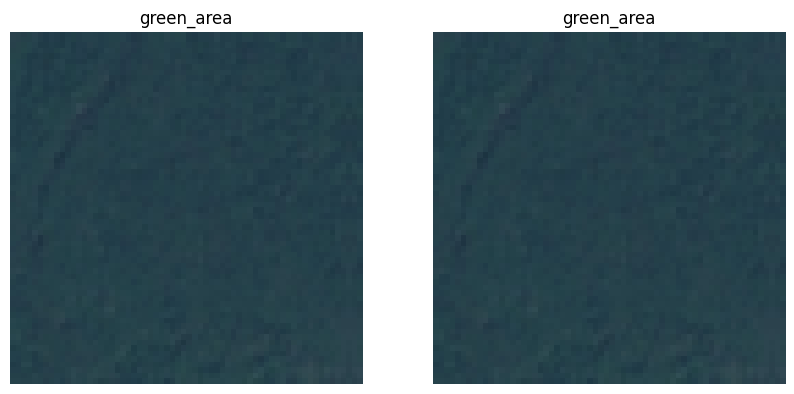

Test image 1085 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


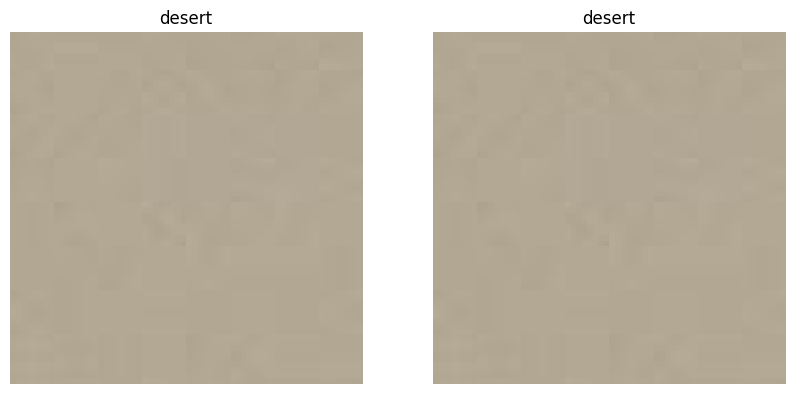

Test image 1086 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


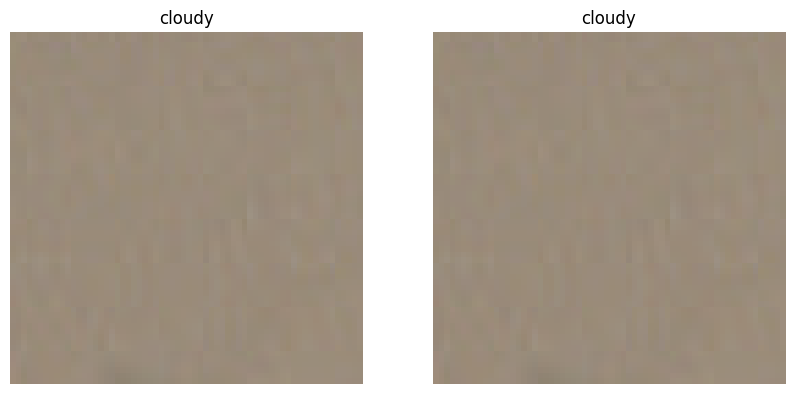

Test image 1087 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


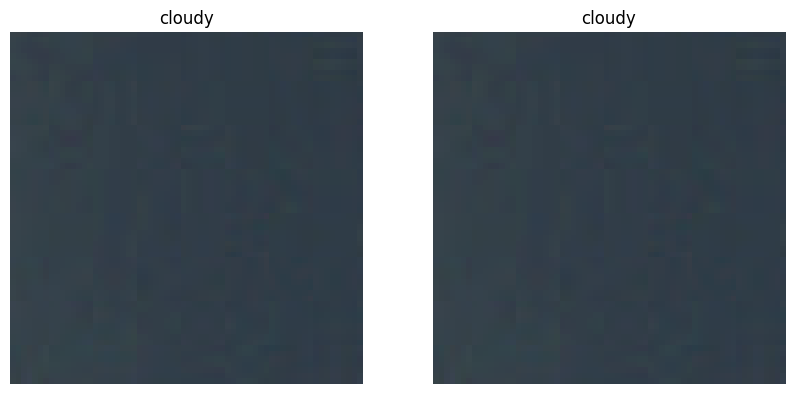

Test image 1088 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


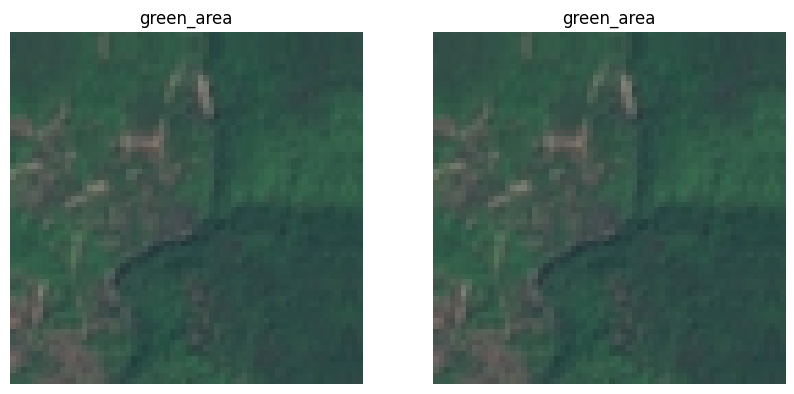

Test image 1089 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


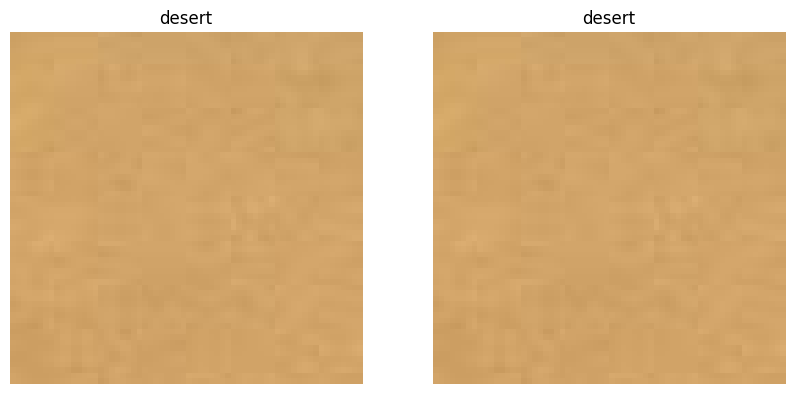

Test image 1090 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


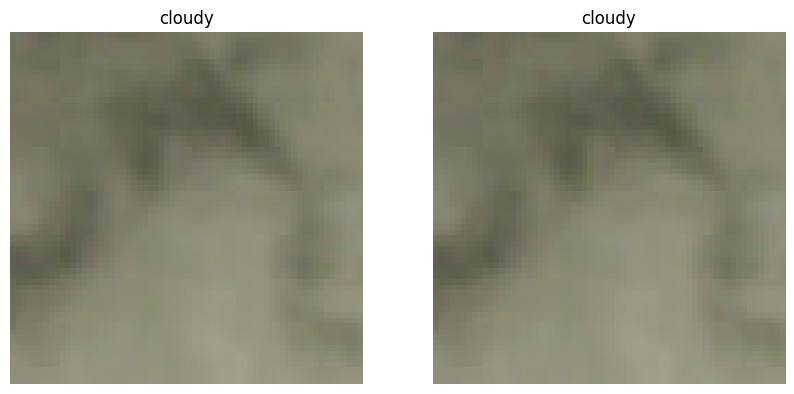

Test image 1091 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


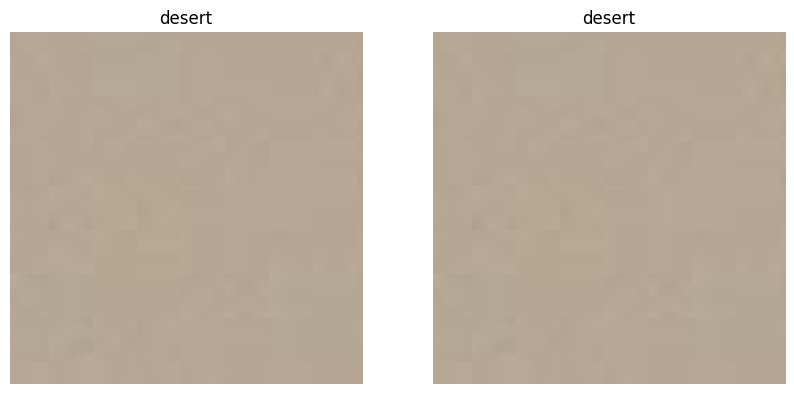

Test image 1092 , Result: Wrong Predicted: green_area , Real Class: water
Predicted Class Image vs Real Class Image:


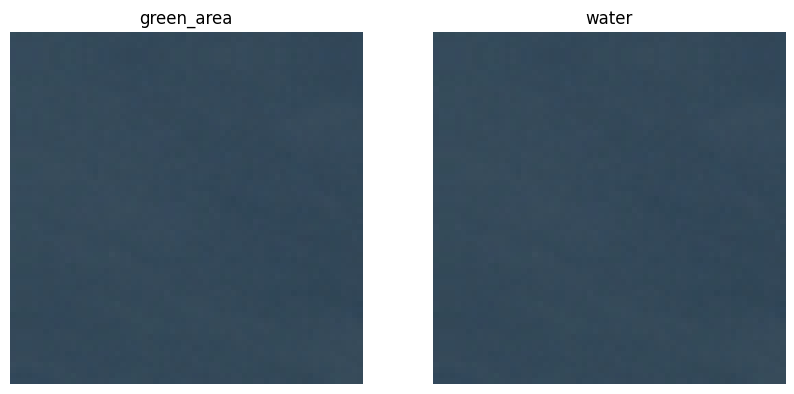

Test image 1093 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


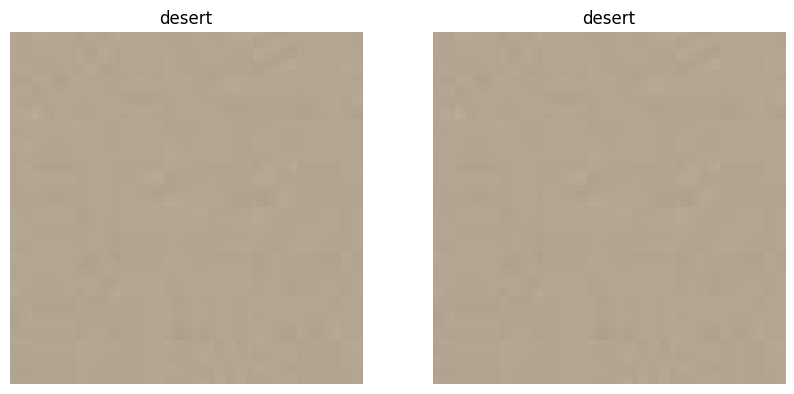

Test image 1094 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


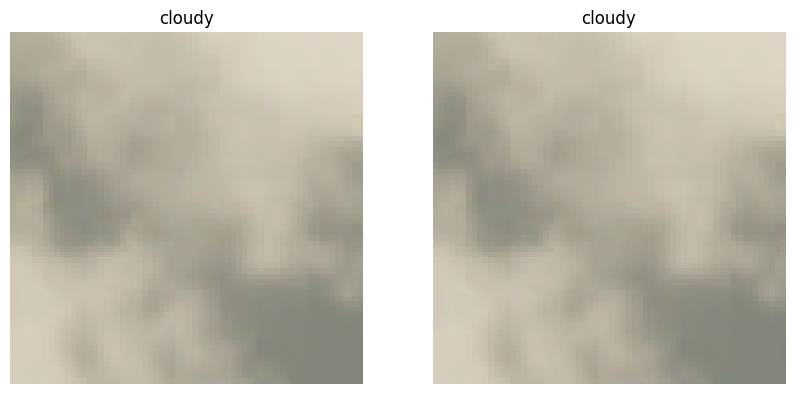

Test image 1095 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


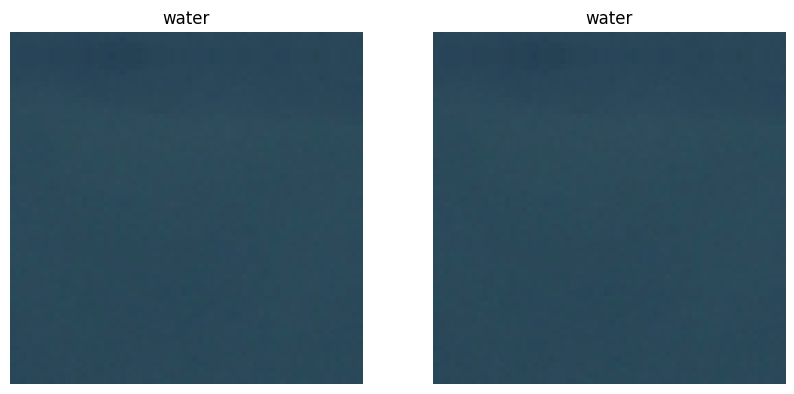

Test image 1096 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


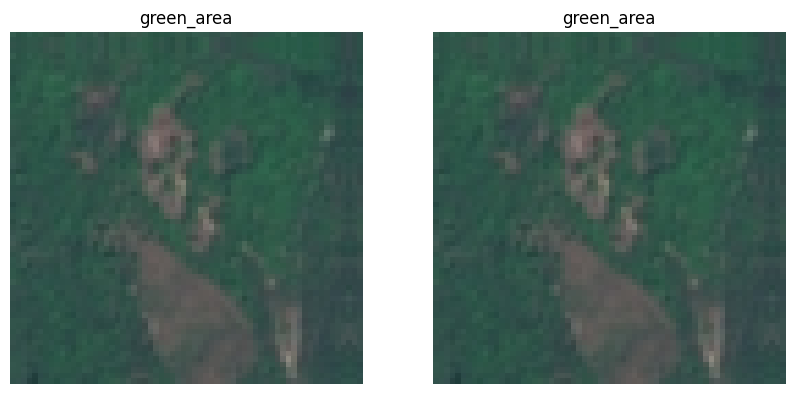

Test image 1097 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


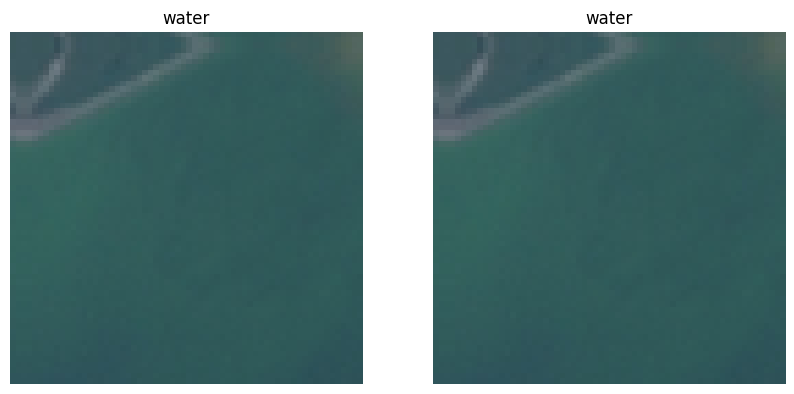

Test image 1098 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


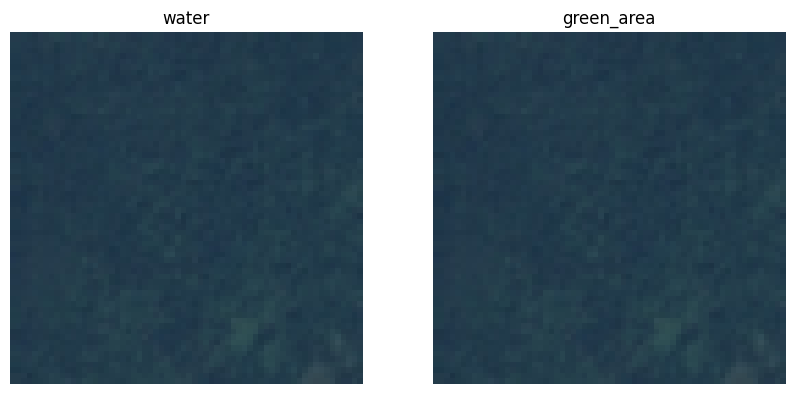

Test image 1099 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


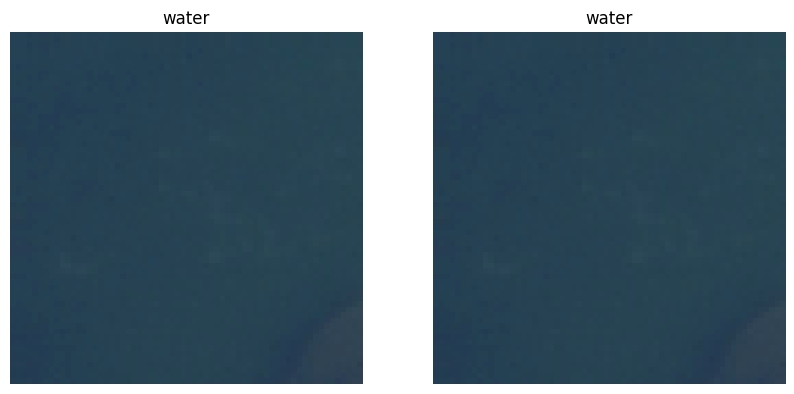

Test image 1100 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


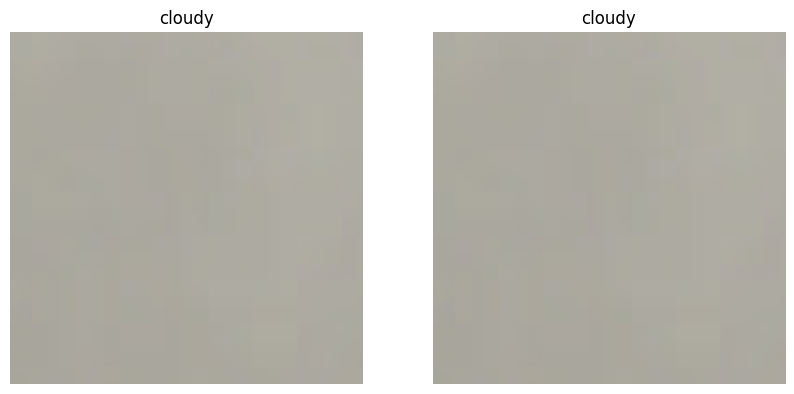

Test image 1101 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


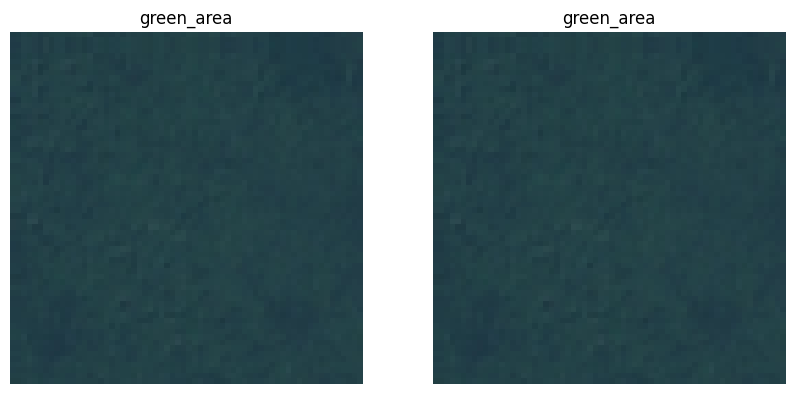

Test image 1102 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


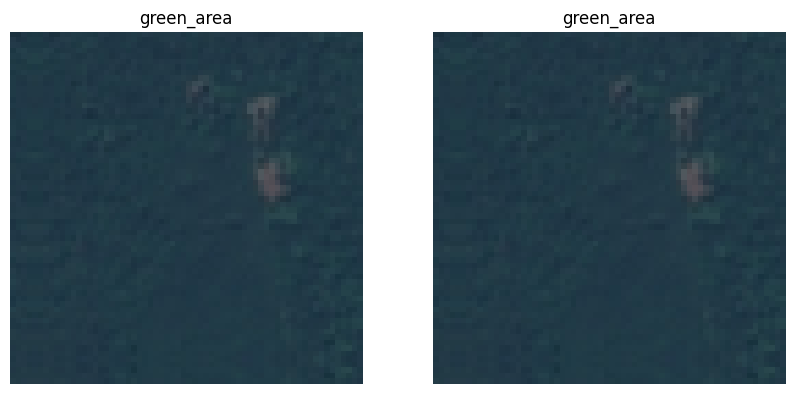

Test image 1103 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


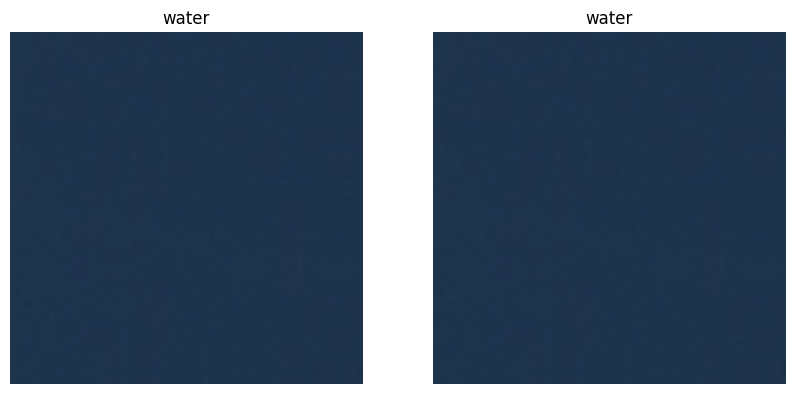

Test image 1104 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


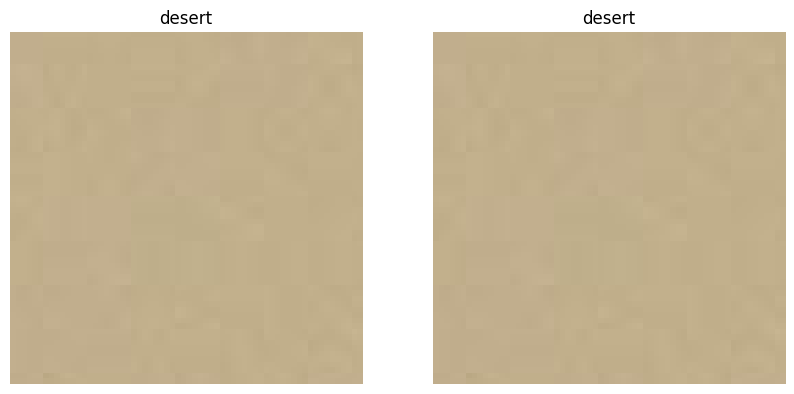

Test image 1105 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


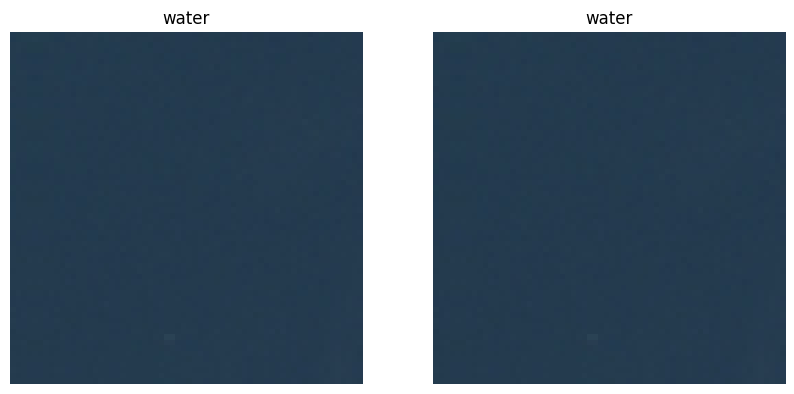

Test image 1106 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


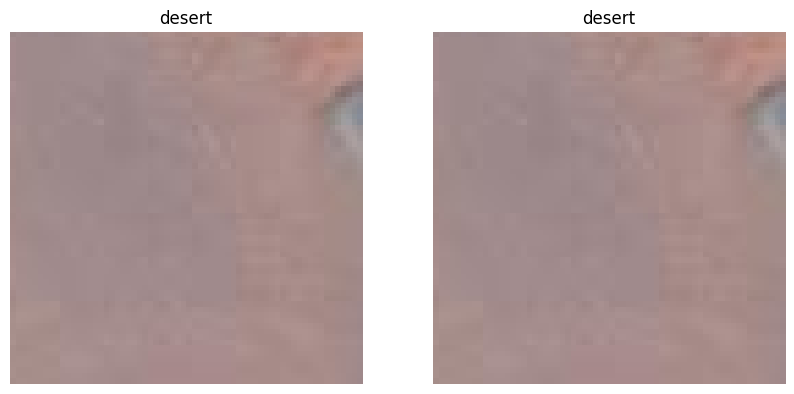

Test image 1107 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


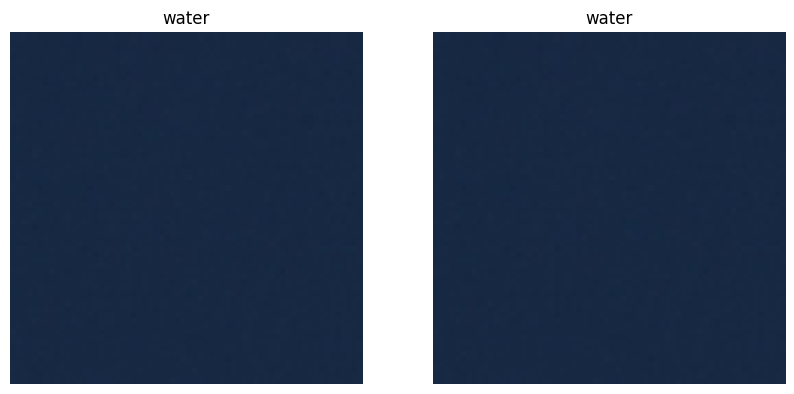

Test image 1108 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


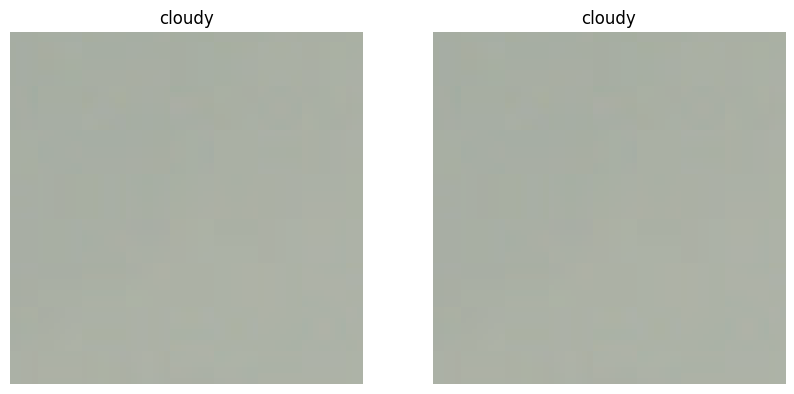

Test image 1109 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


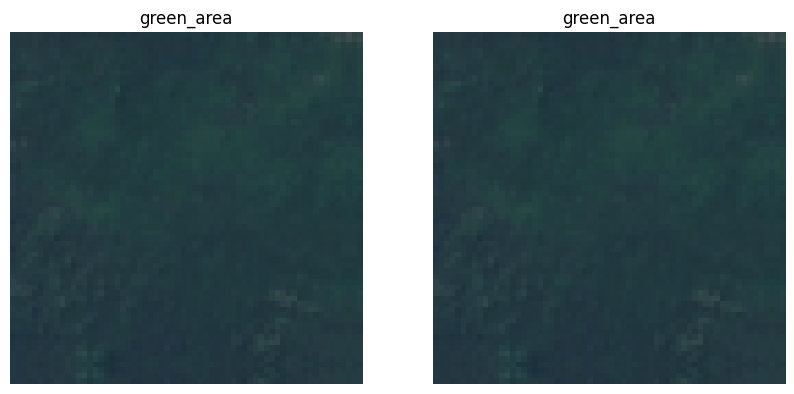

Test image 1110 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


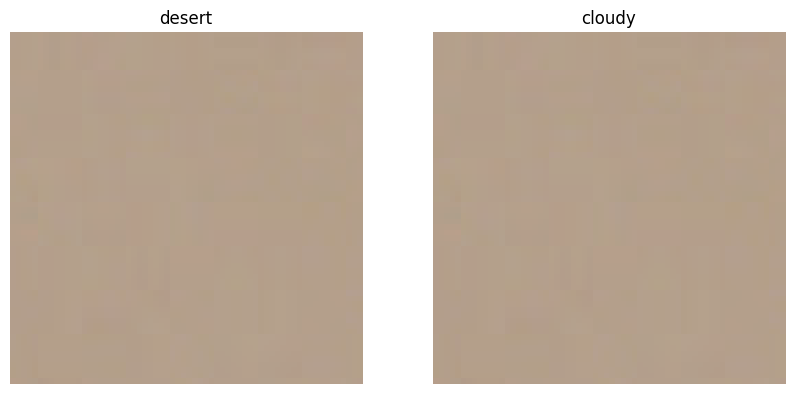

Test image 1111 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


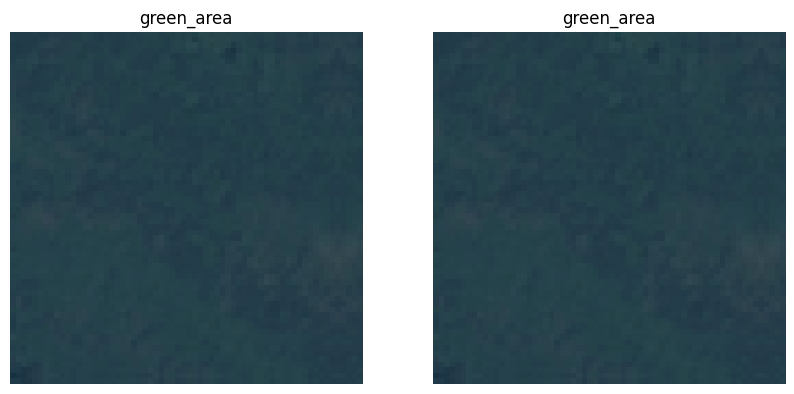

Test image 1112 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


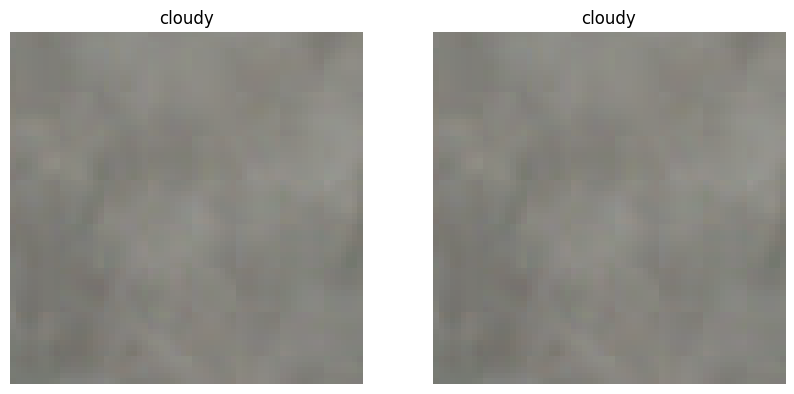

Test image 1113 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


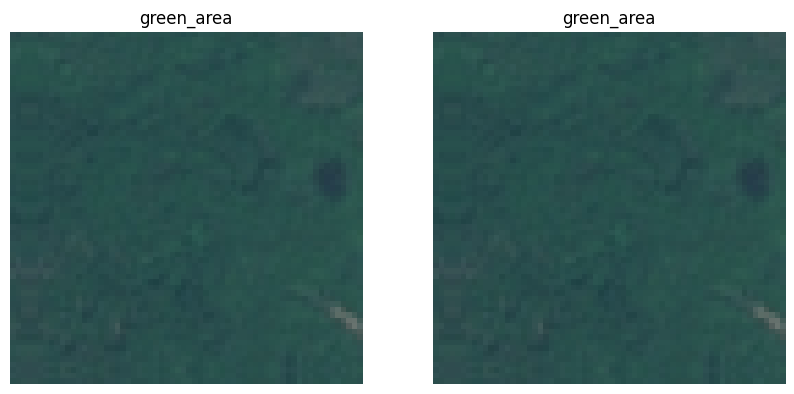

Test image 1114 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


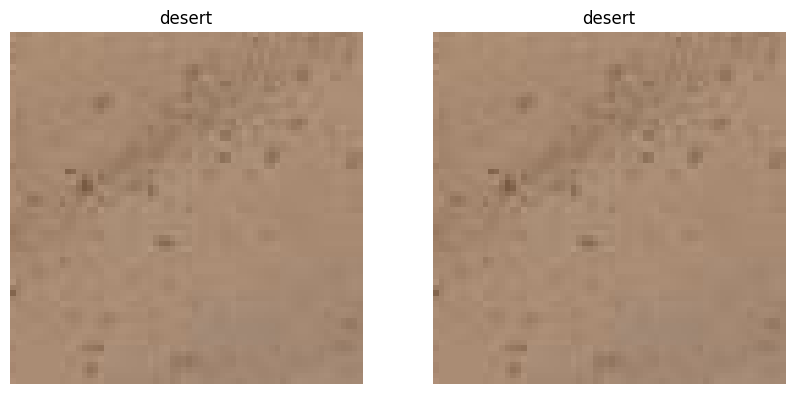

Test image 1115 , Result: Correct  Predicted: green_area , Real Class: green_area
Predicted Class Image vs Real Class Image:


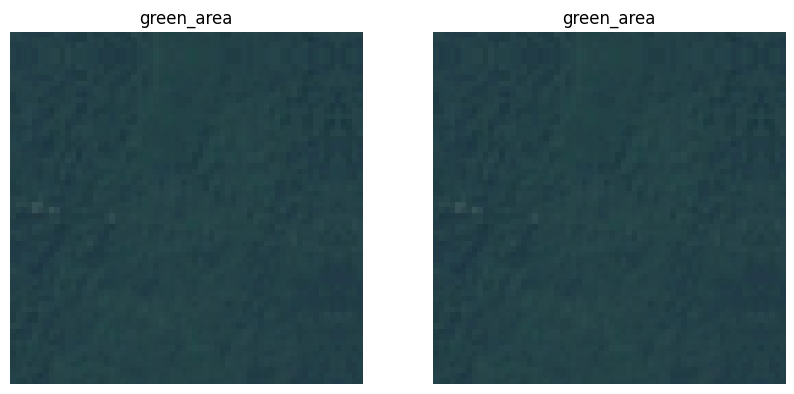

Test image 1116 , Result: Wrong Predicted: desert , Real Class: cloudy
Predicted Class Image vs Real Class Image:


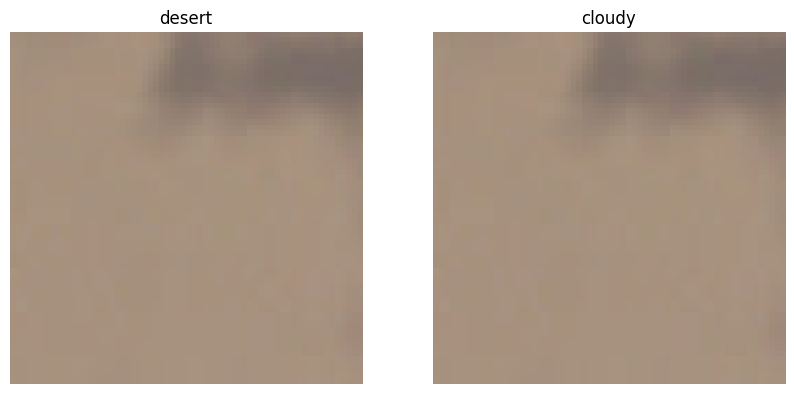

Test image 1117 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


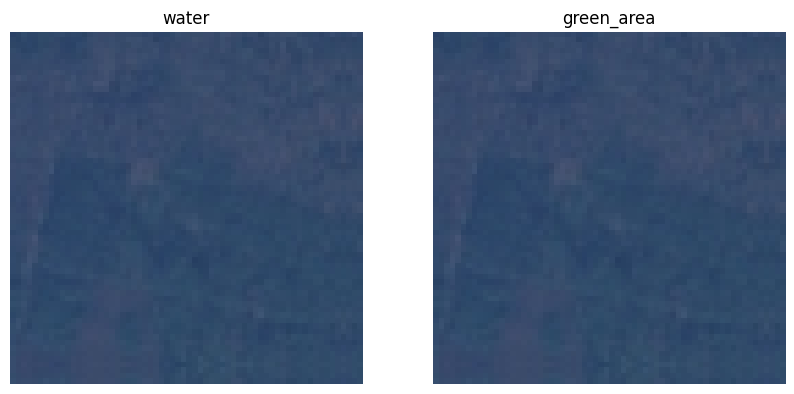

Test image 1118 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


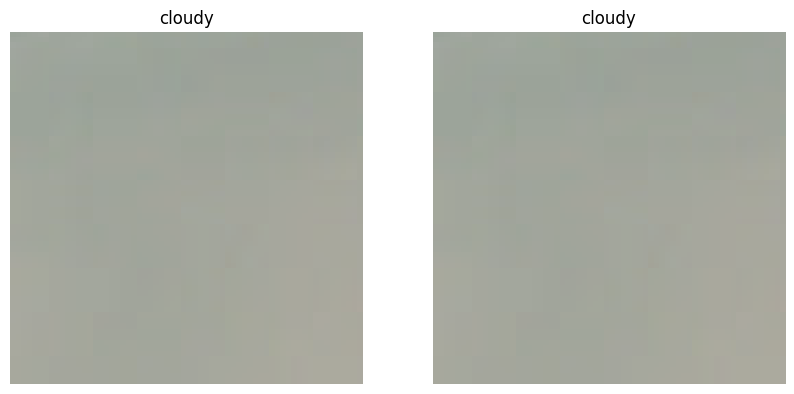

Test image 1119 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


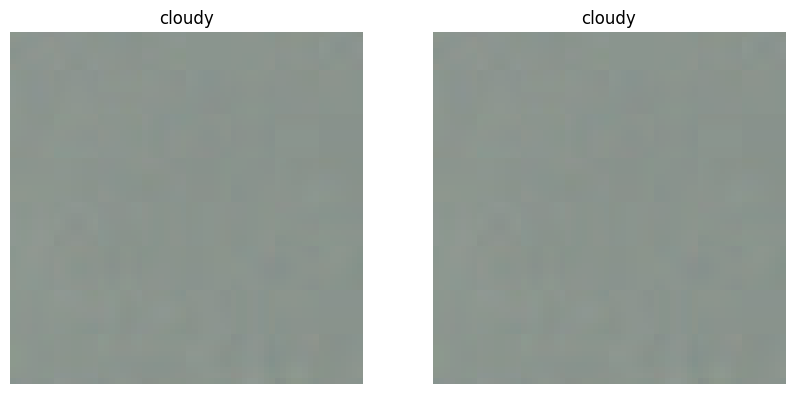

Test image 1120 , Result: Correct  Predicted: water , Real Class: water
Predicted Class Image vs Real Class Image:


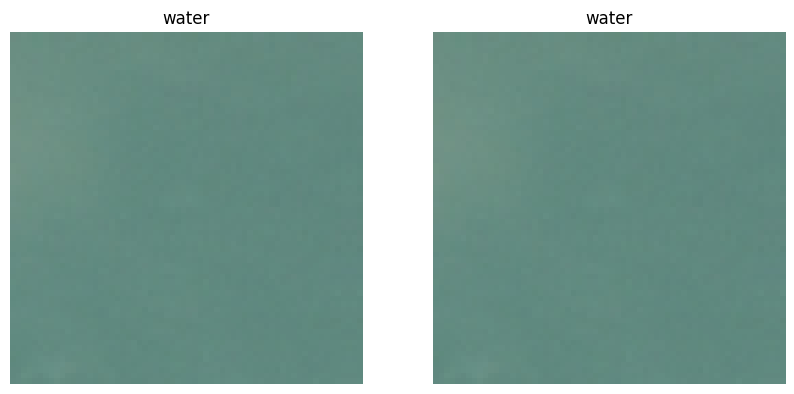

Test image 1121 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


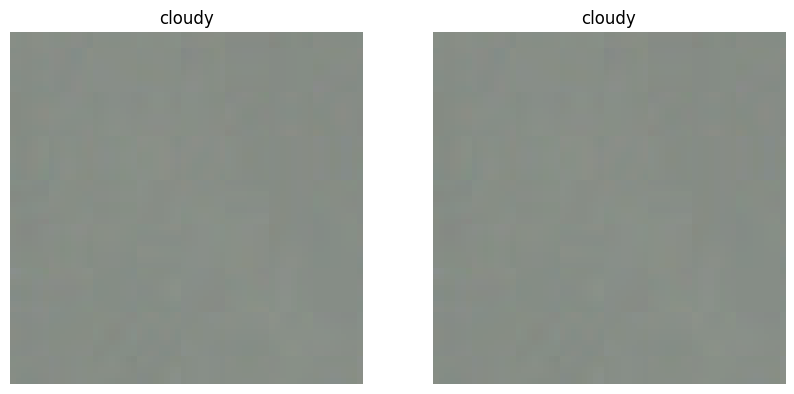

Test image 1122 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


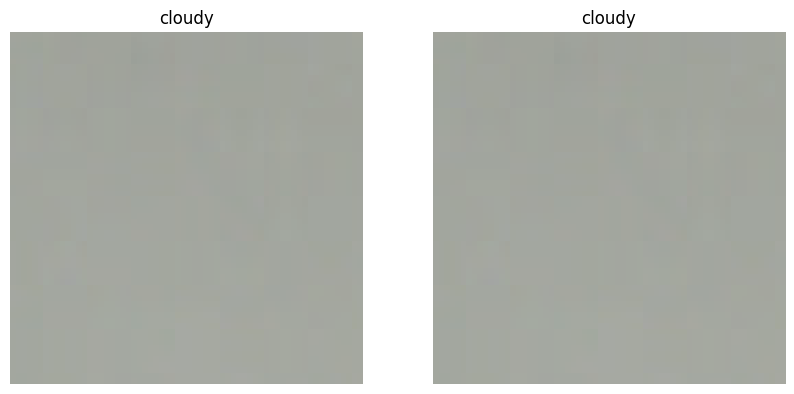

Test image 1123 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


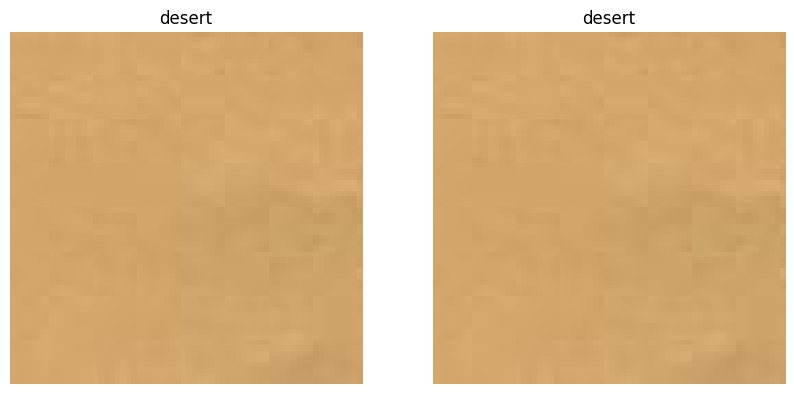

Test image 1124 , Result: Correct  Predicted: desert , Real Class: desert
Predicted Class Image vs Real Class Image:


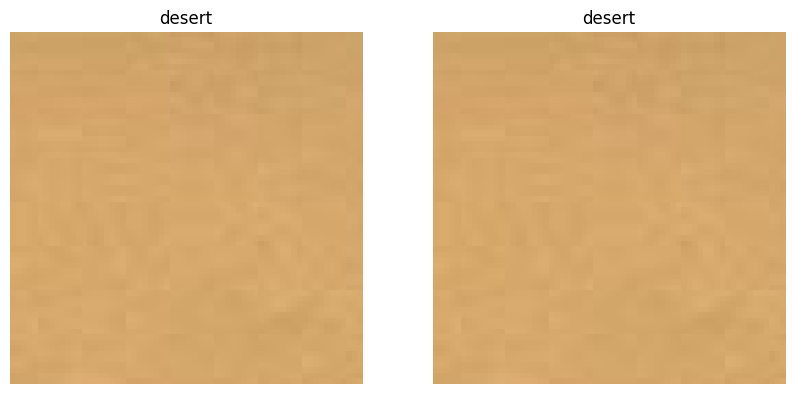

Test image 1125 , Result: Wrong Predicted: water , Real Class: green_area
Predicted Class Image vs Real Class Image:


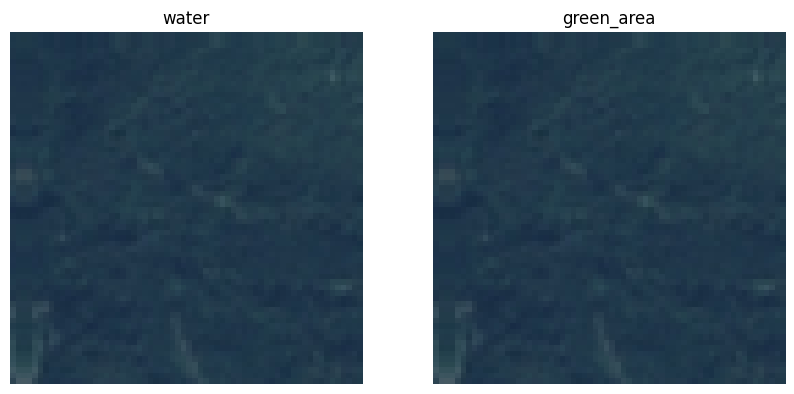

Test image 1126 , Result: Correct  Predicted: cloudy , Real Class: cloudy
Predicted Class Image vs Real Class Image:


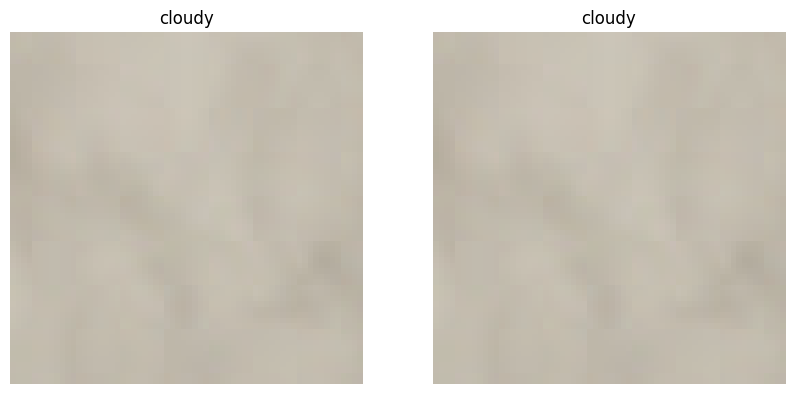

=============================FINAL RESULT==============================
Total image in test set: 1126
Correct: 992
Wrong: 134
Correct Rate: 88.09946714031972 %


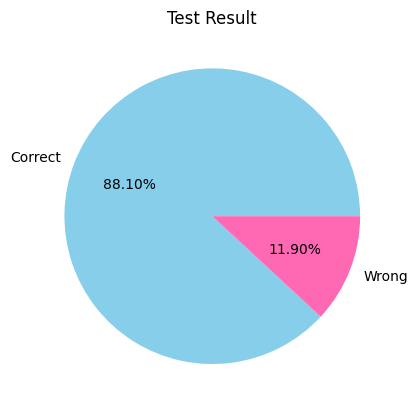

In [ ]:
import matplotlib.pyplot as plt

def show_images(img1, title1, img2, title2):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Show first image
    img1 = img1.permute(1, 2, 0)
    mean = torch.tensor([0.5, 0.5, 0.5])
    std = torch.tensor([0.5, 0.5, 0.5])
    img1 = std * img1 + mean
    axes[0].imshow(img1)
    axes[0].set_title(title1)
    axes[0].axis('off')

    # Show second image
    img2 = img2.permute(1, 2, 0)
    img2 = std * img2 + mean
    axes[1].imshow(img2)
    axes[1].set_title(title2)
    axes[1].axis('off')

    plt.show()

def final_test():
    acc_count = 0
    err_count = 0

    for i in range(0, len(test_data)):

        img, label = test_data[i]

        predict_class = predict_image(img, model)
        real_class = dataset.classes[label]

        print("Test image", i + 1, end=" , ")
        if predict_class == real_class:
            print("Result: Correct ", end=" ")
            acc_count += 1
        else:
            print("Result: Wrong", end=" ")
            err_count += 1
        print("Predicted:", predict_class, ", Real Class:", real_class)

        # Display images
        print("Predicted Class Image vs Real Class Image:")
        show_images(img, predict_class, img, real_class)

    total = acc_count + err_count
    print("=============================FINAL RESULT==============================")
    print("Total image in test set:", total)
    print("Correct:", acc_count)
    print("Wrong:", err_count)
    print("Correct Rate:", 100 * acc_count / total, "%")
    print("=======================================================================")

    # draw diagram
    y = np.array([acc_count, err_count])

    plt.pie(y,
            labels=['Correct', 'Wrong'],
            colors=["skyblue", "hotpink"],
            autopct='%.2f%%',
            # explode=(0.2, 0)
            )
    plt.title("Test Result")
    plt.show()

final_test()


In [ ]:
# Save the model
torch.save(model, './model')

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

def plot_confusion_matrix(y_true, y_pred, classes):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()



In [ ]:
# Function to evaluate test data and return predictions
def evaluate_test(model, test_loader):
    model.eval()
    y_true = []
    y_pred = []
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
    return y_true, y_pred

# Evaluate test set and get predictions
y_true, y_pred = evaluate_test(model, test_dl)




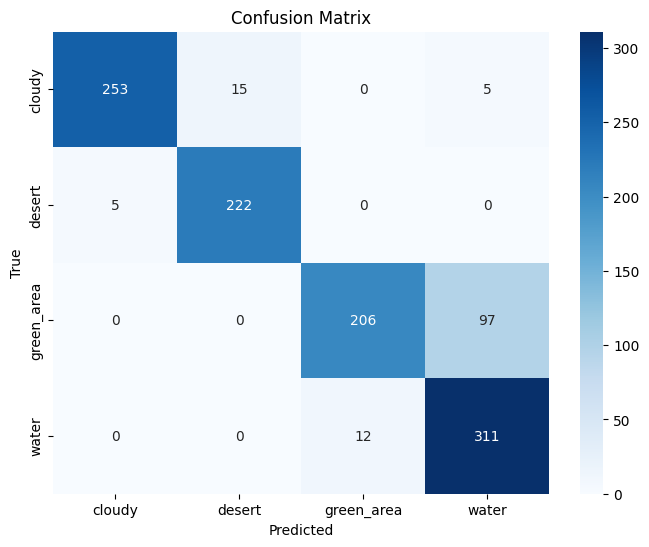

In [ ]:
# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred, dataset.classes)



In [ ]:
# Calculate classification report
report = classification_report(y_true, y_pred, target_names=dataset.classes)
print(report)

              precision    recall  f1-score   support

      cloudy       0.98      0.93      0.95       273
      desert       0.94      0.98      0.96       227
  green_area       0.94      0.68      0.79       303
       water       0.75      0.96      0.85       323

    accuracy                           0.88      1126
   macro avg       0.90      0.89      0.89      1126
weighted avg       0.90      0.88      0.88      1126

